In [1]:
import pandas as pd
import numpy as np

In [2]:
df=pd.read_csv('train.csv',parse_dates={'date':['order_completed_at']})
df

,date,user_id,cart
0,2015-03-22 09:25:46,2,399
1,2015-03-22 09:25:46,2,14
2,2015-03-22 09:25:46,2,198
3,2015-03-22 09:25:46,2,88
4,2015-03-22 09:25:46,2,157
...,...,...,...
3123059,2020-09-03 23:45:45,12702,441
3123060,2020-09-03 23:45:45,12702,92
3123061,2020-09-03 23:45:45,12702,431
3123062,2020-09-03 23:45:45,12702,24


Проведем разведочный анализ данных

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3123064 entries, 0 to 3123063
Data columns (total 3 columns):
 #   Column   Dtype         
---  ------   -----         
 0   date     datetime64[ns]
 1   user_id  int64         
 2   cart     int64         
dtypes: datetime64[ns](1), int64(2)
memory usage: 71.5 MB


In [5]:
df.cart=df.cart.astype('category')

In [6]:
df.describe()

,user_id
count,3.123064e+06
mean,7.253373e+03
std,5.337838e+03
min,0.000000e+00
25%,2.884000e+03
50%,6.055000e+03
75%,1.117200e+04
max,1.999900e+04


Посмотрим на распределение количества товаров в заказе

cart    13.0
dtype: float64 cart    14.913918
dtype: float64


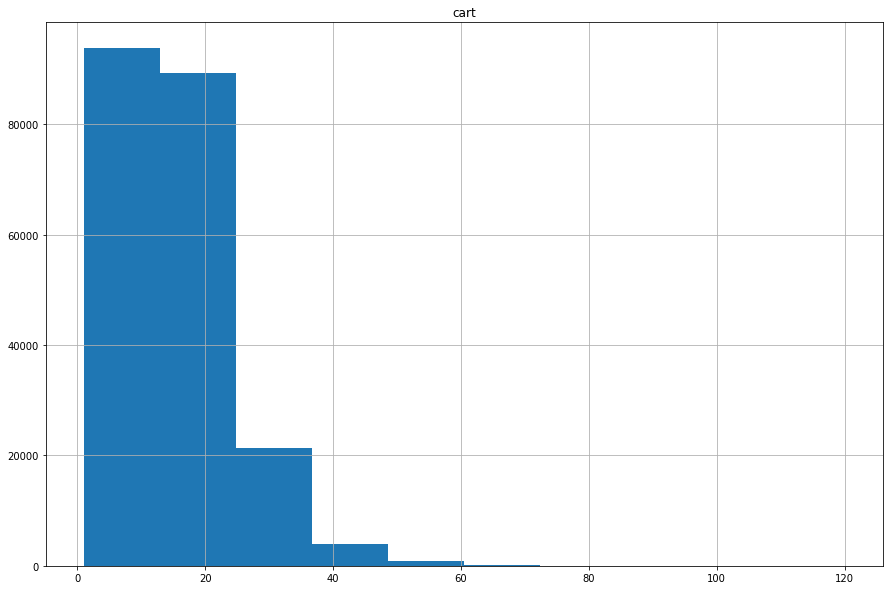

In [11]:
grouped=df.groupby(['date','user_id']).count()
grouped.hist(figsize=(15,10))
print(grouped.median(),grouped.mean())

Посмотрим на распределение количества заказов пользователей

<AxesSubplot:>

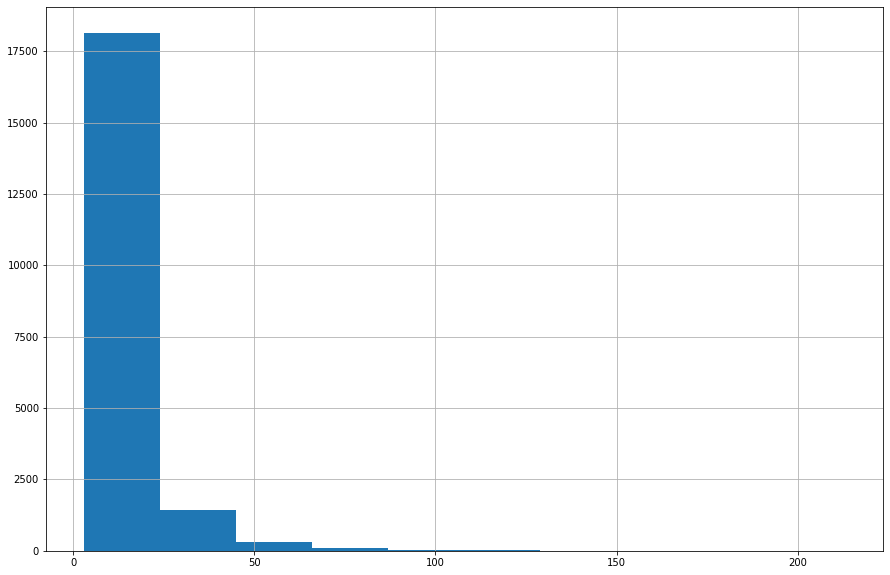

In [15]:
df.groupby(['user_id'])['date'].nunique().hist(figsize=(15,10))

Проведем OHE для категорй товаров

In [16]:
df=pd.get_dummies(df,columns=['cart'])
df

,date,user_id,cart_0,cart_1,cart_2,cart_3,cart_4,cart_5,cart_6,cart_7,...,cart_871,cart_872,cart_873,cart_874,cart_875,cart_876,cart_877,cart_878,cart_879,cart_880
0,2015-03-22 09:25:46,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,2015-03-22 09:25:46,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2015-03-22 09:25:46,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,2015-03-22 09:25:46,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2015-03-22 09:25:46,2,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3123059,2020-09-03 23:45:45,12702,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3123060,2020-09-03 23:45:45,12702,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3123061,2020-09-03 23:45:45,12702,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3123062,2020-09-03 23:45:45,12702,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Проведем кластеризацию клиентов и найдем вероятности покупки продуктов для каждого кластера 

Сначала найдем вероятности покупки продуктов для каждого пользователя

Группировка по пользователю и дате не влезла в память<br>Поэтому сделал в цикле(

In [22]:
clust=pd.DataFrame(columns=df.drop(['user_id','date'],axis=1).columns)
for user in range(20000):
    clust=clust.append(df[df['user_id']==user].groupby('date').sum().drop('user_id',axis=1).mean(),ignore_index=True)

In [23]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
scaled_clust=sc.fit_transform(clust)

Определим оптимальное число кластеров по методу Элбова

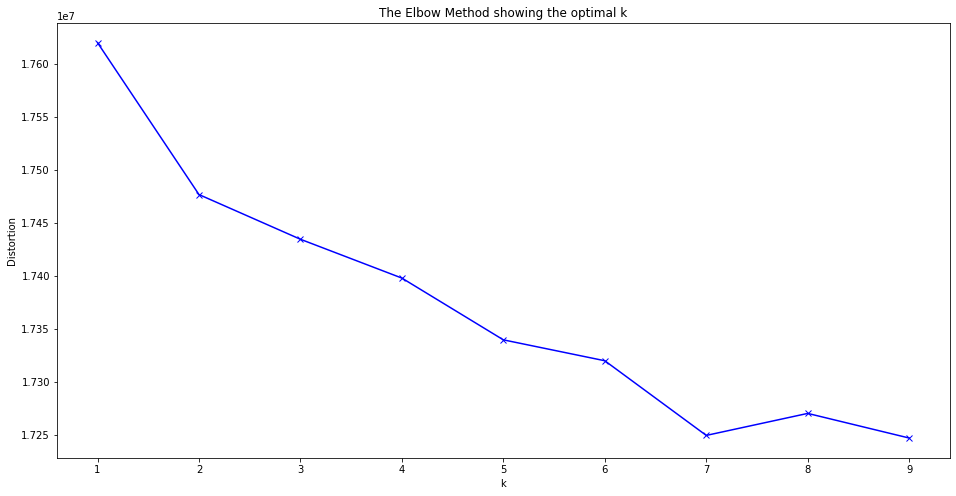

In [31]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(scaled_clust)
    distortions.append(kmeanModel.inertia_)
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [32]:
kmeanModel = KMeans(n_clusters=7)
kmeanModel.fit(scaled_clust)
clust['kmeans'] = kmeanModel.labels_
clust

,cart_0,cart_1,cart_2,cart_3,cart_4,cart_5,cart_6,cart_7,cart_8,cart_9,...,cart_872,cart_873,cart_874,cart_875,cart_876,cart_877,cart_878,cart_879,cart_880,kmeans
0,0.000000,0.0,0.0,0.0,0.0,0.333333,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
1,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
2,0.066667,0.0,0.0,0.0,0.0,0.133333,0.000000,0.0,0.0,0.066667,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
3,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
4,0.000000,0.0,0.0,0.0,0.0,0.250000,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,0.333333,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
19996,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
19997,0.333333,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2
19998,0.000000,0.0,0.0,0.0,0.0,0.000000,0.666667,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3


In [33]:
means_of_clusters=clust.groupby('kmeans').mean().T
means_of_clusters

kmeans,0,1,2,3,4,5,6
cart_0,0.177773,0.114204,0.108029,0.074524,0.25,0.088863,0.0
cart_1,0.000000,0.002157,0.001793,0.000653,0.00,0.001731,0.0
cart_2,0.000000,0.000251,0.000000,0.000079,0.00,0.000279,0.0
cart_3,0.000000,0.000000,0.000000,0.000000,0.00,0.000003,0.0
cart_4,0.000000,0.001755,0.001791,0.000345,0.00,0.001251,0.0
...,...,...,...,...,...,...,...
cart_876,0.000000,0.000000,0.000032,0.000033,0.00,0.000000,0.0
cart_877,0.000000,0.000089,0.000160,0.000000,0.00,0.000003,0.0
cart_878,0.000000,0.000000,0.000203,0.000022,0.00,0.000039,0.0
cart_879,0.000000,0.000040,0.000129,0.000008,0.00,0.000000,0.0


Построим полносвязную нейронную сеть для предсказания следующего заказа клииента по предыдущему 

In [41]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import callbacks

import warnings 
warnings.filterwarnings('ignore')

def load_model():
    
    early_stopping = callbacks.EarlyStopping(
        patience=4,
        min_delta=0,
        monitor='auc',
        restore_best_weights=True,
        verbose=0,
        mode='min', 
        baseline=None,
    )

    plateau = callbacks.ReduceLROnPlateau(
            monitor='auc', 
            factor=0.2, 
            patience=5, 
            verbose=0,
            mode='min')
    model = keras.Sequential([
        layers.Dense(train.shape[1], activation = 'relu', input_shape = [train.shape[1]]),
        layers.Dense(train.shape[1], activation = 'sigmoid', input_shape = [train.shape[1]]),  
    ])

    model.compile(
        optimizer= keras.optimizers.Adam(learning_rate=LEARNING_RATE),
        loss="binary_crossentropy",
        metrics=['AUC'],
    )
    
    return model, early_stopping, plateau

In [39]:
subm=pd.read_csv('sample_submission.csv')
subm['prod']=subm.id.apply(lambda x: int(x.split(';')[1]))
subm['user']=subm.id.apply(lambda x: int(x.split(';')[0]))
subm

,id,target,prod,user
0,0;133,0,133,0
1,0;5,1,5,0
2,0;10,0,10,0
3,0;396,1,396,0
4,0;14,0,14,0
...,...,...,...,...
790444,19998;26,0,26,19998
790445,19998;31,0,31,19998
790446,19998;29,1,29,19998
790447,19998;798,1,798,19998


In [ ]:
LEARNING_RATE=1e-2
BATCH_SIZE=5
EPOCHS=20

In [43]:
preds={'user':[],'prod':[],'target':[]}
for j in subm['user'].unique():
    indexes=subm[subm.user==j]['prod'].values
    train=df[df['user_id']==j].groupby('date').sum().drop('user_id',axis=1) \
        .sort_index().iloc[:-1,:].reset_index().drop('date',axis=1).iloc[:,indexes]
    target=df[df['user_id']==j].groupby('date').sum().drop('user_id',axis=1) \
        .sort_index().iloc[1:,:].reset_index().drop('date',axis=1).iloc[:,indexes]
    preds_test = []
    X_train = train
    y_train = target
    test =target.iloc[-1].values.reshape((1,train.shape[1]))
    model, early_stopping, plateau  = load_model()
    history = model.fit( X_train, y_train,
                batch_size = BATCH_SIZE,
                epochs = EPOCHS,
                callbacks = [early_stopping, plateau],
                shuffle = False,
                verbose = 1
              )
    preds_test.append(model.predict(test).reshape(1,-1)[0])
    preds['user'].append(j)
    preds['prod'].append(np.array(indexes).astype(int))
    preds['target'].append(np.array(preds_test).astype(float))
    print(len(preds['prod']))

Epoch 1/20
1/1 [==============================] - 1s 558ms/step - loss: 0.7245 - auc: 0.5193 - lr: 0.0100
Epoch 2/20
1/1 [==============================] - 0s 7ms/step - loss: 0.6677 - auc: 0.6177 - lr: 0.0100
Epoch 3/20
1/1 [==============================] - 0s 8ms/step - loss: 0.6160 - auc: 0.7218 - lr: 0.0100
Epoch 4/20
1/1 [==============================] - 0s 7ms/step - loss: 0.5690 - auc: 0.8036 - lr: 0.0100
Epoch 5/20
1/1 [==============================] - 0s 9ms/step - loss: 0.5261 - auc: 0.8661 - lr: 0.0100
1
Epoch 1/20
2/2 [==============================] - 0s 8ms/step - loss: 0.7523 - auc: 0.3576 - lr: 0.0100
Epoch 2/20
2/2 [==============================] - 0s 7ms/step - loss: 0.7204 - auc: 0.4076 - lr: 0.0100
Epoch 3/20
2/2 [==============================] - 0s 6ms/step - loss: 0.6919 - auc: 0.4582 - lr: 0.0100
Epoch 4/20
2/2 [==============================] - 0s 6ms/step - loss: 0.6652 - auc: 0.5109 - lr: 0.0100
Epoch 5/20
2/2 [==============================] - 0s 8ms/ste

8/8 [==============================] - 0s 5ms/step - loss: 0.3530 - auc: 0.8492 - lr: 0.0100
Epoch 4/20
8/8 [==============================] - 0s 5ms/step - loss: 0.2970 - auc: 0.8987 - lr: 0.0100
Epoch 5/20
8/8 [==============================] - 0s 6ms/step - loss: 0.2627 - auc: 0.9270 - lr: 0.0100
29
Epoch 1/20
3/3 [==============================] - 0s 6ms/step - loss: 0.7082 - auc: 0.5147 - lr: 0.0100
Epoch 2/20
3/3 [==============================] - 0s 5ms/step - loss: 0.6209 - auc: 0.6739 - lr: 0.0100
Epoch 3/20
3/3 [==============================] - 0s 6ms/step - loss: 0.5531 - auc: 0.7773 - lr: 0.0100
Epoch 4/20
3/3 [==============================] - 0s 7ms/step - loss: 0.4984 - auc: 0.8434 - lr: 0.0100
Epoch 5/20
3/3 [==============================] - 0s 7ms/step - loss: 0.4542 - auc: 0.8848 - lr: 0.0100
30
Epoch 1/20
17/17 [==============================] - 0s 5ms/step - loss: 0.4670 - auc: 0.6412 - lr: 0.0100
Epoch 2/20
17/17 [==============================] - 0s 5ms/step - l

Epoch 1/20
2/2 [==============================] - 0s 9ms/step - loss: 0.7244 - auc: 0.5133 - lr: 0.0100
Epoch 2/20
2/2 [==============================] - 0s 6ms/step - loss: 0.6288 - auc: 0.6907 - lr: 0.0100
Epoch 3/20
2/2 [==============================] - 0s 7ms/step - loss: 0.5570 - auc: 0.8144 - lr: 0.0100
Epoch 4/20
2/2 [==============================] - 0s 6ms/step - loss: 0.4971 - auc: 0.8896 - lr: 0.0100
Epoch 5/20
2/2 [==============================] - 0s 8ms/step - loss: 0.4469 - auc: 0.9288 - lr: 0.0100
45
Epoch 1/20
3/3 [==============================] - 0s 7ms/step - loss: 0.6968 - auc: 0.5244 - lr: 0.0100
Epoch 2/20
3/3 [==============================] - 0s 7ms/step - loss: 0.5992 - auc: 0.7269 - lr: 0.0100
Epoch 3/20
3/3 [==============================] - 0s 6ms/step - loss: 0.5351 - auc: 0.8107 - lr: 0.0100
Epoch 4/20
3/3 [==============================] - 0s 6ms/step - loss: 0.4878 - auc: 0.8480 - lr: 0.0100
Epoch 5/20
3/3 [==============================] - 0s 7ms/step

KeyboardInterrupt: 

Эта модель дала плохой результат (f_score: 0.26852). Для улучшения модели я решил использовать бэггинг

In [45]:
def f_s(data):
    return [(i*data.shape[0]//FOLDS,(i+1)*data.shape[0]//FOLDS) for i in range(FOLDS)]

In [48]:
preds={'user':[],'prod':[],'target':[]}
for j in subm['user'].unique():
    indexes=subm[subm.user==j]['prod'].values
    train=df[df['user_id']==j].groupby('date').sum().drop('user_id',axis=1) \
        .sort_index().iloc[:-1,:].reset_index().drop('date',axis=1).iloc[:,indexes]
    target=df[df['user_id']==j].groupby('date').sum().drop('user_id',axis=1) \
        .sort_index().iloc[1:,:].reset_index().drop('date',axis=1).iloc[:,indexes]
    FOLDS=5
    if train.shape[0]==1:
        preds['user'].append(j)
        preds['prod'].appends(np.array(indexes))
        preds['target'].appends(train[0])
        print(len(preds['user']))
        continue
    if train.shape[0]<10:
        FOLDS=2
    if train.shape[0]>=10 and train.shape[0]<=20:
        FOLDS=3
    preds_test = []
    for fold in range(FOLDS):
        ind=f_s(train)
        X_train = train.drop([i for i in range(ind[fold][0],ind[fold][1])]),
        X_valid = train.iloc[ind[fold][0]:ind[fold][1]]
        y_train = target.drop([i for i in range(ind[fold][0],ind[fold][1])]),
        y_valid = target.iloc[ind[fold][0]:ind[fold][1]]

        index_valid  = X_valid.index.tolist()
        test =target.iloc[-1].values.reshape((1,train.shape[1]))
        model, early_stopping, plateau  = load_model()
        history = model.fit( X_train, y_train,
                validation_data = (X_valid, y_valid),
                batch_size = BATCH_SIZE, 
                epochs = EPOCHS,
                callbacks = [early_stopping, plateau],
                shuffle = True,
                verbose = 0
              )

        preds_test.append(model.predict(test).reshape(1,-1)[0])
    preds['user'].append(j)
    preds['prod'].append(np.array(indexes))
    preds['target'].append(np.mean(preds_test, axis = 0))
    print(len(preds['user']))

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


1861
1862
1863
1864
1865
1866
1867
1868
1869
1870
1871
1872
1873
1874
1875
1876
1877
1878
1879
1880
1881
1882
1883
1884
1885
1886
1887
1888
1889
1890
1891
1892
1893
1894
1895
1896
1897
1898
1899
1900
1901
1902
1903
1904
1905
1906
1907
1908
1909
1910
1911
1912
1913
1914
1915
1916
1917
1918
1919
1920
1921
1922
1923
1924
1925
1926
1927
1928
1929
1930
1931
1932
1933
1934
1935
1936
1937
1938
1939
1940
1941
1942
1943
1944
1945
1946
1947
1948
1949
1950
1951
1952
1953
1954
1955
1956
1957
1958
1959
1960
1961
1962
1963
1964
1965
1966
1967
1968
1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060


3500
3501
3502
3503
3504
3505
3506
3507
3508
3509
3510
3511
3512
3513
3514
3515
3516
3517
3518
3519
3520
3521
3522
3523
3524
3525
3526
3527
3528
3529
3530
3531
3532
3533
3534
3535
3536
3537
3538
3539
3540
3541
3542
3543
3544
3545
3546
3547
3548
3549
3550
3551
3552
3553
3554
3555
3556
3557
3558
3559
3560
3561
3562
3563
3564
3565
3566
3567
3568
3569
3570
3571
3572
3573
3574
3575
3576
3577
3578
3579
3580
3581
3582
3583
3584
3585
3586
3587
3588
3589
3590
3591
3592
3593
3594
3595
3596
3597
3598
3599
3600
3601
3602
3603
3604
3605
3606
3607
3608
3609
3610
3611
3612
3613
3614
3615
3616
3617
3618
3619
3620
3621
3622
3623
3624
3625
3626
3627
3628
3629
3630
3631
3632
3633
3634
3635
3636
3637
3638
3639
3640
3641
3642
3643
3644
3645
3646
3647
3648
3649
3650
3651
3652
3653
3654
3655
3656
3657
3658
3659
3660
3661
3662
3663
3664
3665
3666
3667
3668
3669
3670
3671
3672
3673
3674
3675
3676
3677
3678
3679
3680
3681
3682
3683
3684
3685
3686
3687
3688
3689
3690
3691
3692
3693
3694
3695
3696
3697
3698
3699


5139
5140
5141
5142
5143
5144
5145
5146
5147
5148
5149
5150
5151
5152
5153
5154
5155
5156
5157
5158
5159
5160
5161
5162
5163
5164
5165
5166
5167
5168
5169
5170
5171
5172
5173
5174
5175
5176
5177
5178
5179
5180
5181
5182
5183
5184
5185
5186
5187
5188
5189
5190
5191
5192
5193
5194
5195
5196
5197
5198
5199
5200
5201
5202
5203
5204
5205
5206
5207
5208
5209
5210
5211
5212
5213
5214
5215
5216
5217
5218
5219
5220
5221
5222
5223
5224
5225
5226
5227
5228
5229
5230
5231
5232
5233
5234
5235
5236
5237
5238
5239
5240
5241
5242
5243
5244
5245
5246
5247
5248
5249
5250
5251
5252
5253
5254
5255
5256
5257
5258
5259
5260
5261
5262
5263
5264
5265
5266
5267
5268
5269
5270
5271
5272
5273
5274
5275
5276
5277
5278
5279
5280
5281
5282
5283
5284
5285
5286
5287
5288
5289
5290
5291
5292
5293
5294
5295
5296
5297
5298
5299
5300
5301
5302
5303
5304
5305
5306
5307
5308
5309
5310
5311
5312
5313
5314
5315
5316
5317
5318
5319
5320
5321
5322
5323
5324
5325
5326
5327
5328
5329
5330
5331
5332
5333
5334
5335
5336
5337
5338


6778
6779
6780
6781
6782
6783
6784
6785
6786
6787
6788
6789
6790
6791
6792
6793
6794
6795
6796
6797
6798
6799
6800
6801
6802
6803
6804
6805
6806
6807
6808
6809
6810
6811
6812
6813
6814
6815
6816
6817
6818
6819
6820
6821
6822
6823
6824
6825
6826
6827
6828
6829
6830
6831
6832
6833
6834
6835
6836
6837
6838
6839
6840
6841
6842
6843
6844
6845
6846
6847
6848
6849
6850
6851
6852
6853
6854
6855
6856
6857
6858
6859
6860
6861
6862
6863
6864
6865
6866
6867
6868
6869
6870
6871
6872
6873
6874
6875
6876
6877
6878
6879
6880
6881
6882
6883
6884
6885
6886
6887
6888
6889
6890
6891
6892
6893
6894
6895
6896
6897
6898
6899
6900
6901
6902
6903
6904
6905
6906
6907
6908
6909
6910
6911
6912
6913
6914
6915
6916
6917
6918
6919
6920
6921
6922
6923
6924
6925
6926
6927
6928
6929
6930
6931
6932
6933
6934
6935
6936
6937
6938
6939
6940
6941
6942
6943
6944
6945
6946
6947
6948
6949
6950
6951
6952
6953
6954
6955
6956
6957
6958
6959
6960
6961
6962
6963
6964
6965
6966
6967
6968
6969
6970
6971
6972
6973
6974
6975
6976
6977


8417
8418
8419
8420
8421
8422
8423
8424
8425
8426
8427
8428
8429
8430
8431
8432
8433
8434
8435
8436
8437
8438
8439
8440
8441
8442
8443
8444
8445
8446
8447
8448
8449
8450
8451
8452
8453
8454
8455
8456
8457
8458
8459
8460
8461
8462
8463
8464
8465
8466
8467
8468
8469
8470
8471
8472
8473
8474
8475
8476
8477
8478
8479
8480
8481
8482
8483
8484
8485
8486
8487
8488
8489
8490
8491
8492
8493
8494
8495
8496
8497
8498
8499
8500
8501
8502
8503
8504
8505
8506
8507
8508
8509
8510
8511
8512
8513
8514
8515
8516
8517
8518
8519
8520
8521
8522
8523
8524
8525
8526
8527
8528
8529
8530
8531
8532
8533
8534
8535
8536
8537
8538
8539
8540
8541
8542
8543
8544
8545
8546
8547
8548
8549
8550
8551
8552
8553
8554
8555
8556
8557
8558
8559
8560
8561
8562
8563
8564
8565
8566
8567
8568
8569
8570
8571
8572
8573
8574
8575
8576
8577
8578
8579
8580
8581
8582
8583
8584
8585
8586
8587
8588
8589
8590
8591
8592
8593
8594
8595
8596
8597
8598
8599
8600
8601
8602
8603
8604
8605
8606
8607
8608
8609
8610
8611
8612
8613
8614
8615
8616


10047
10048
10049
10050
10051
10052
10053
10054
10055
10056
10057
10058
10059
10060
10061
10062
10063
10064
10065
10066
10067
10068
10069
10070
10071
10072
10073
10074
10075
10076
10077
10078
10079
10080
10081
10082
10083
10084
10085
10086
10087
10088
10089
10090
10091
10092
10093
10094
10095
10096
10097
10098
10099
10100
10101
10102
10103
10104
10105
10106
10107
10108
10109
10110
10111
10112
10113
10114
10115
10116
10117
10118
10119
10120
10121
10122
10123
10124
10125
10126
10127
10128
10129
10130
10131
10132
10133
10134
10135
10136
10137
10138
10139
10140
10141
10142
10143
10144
10145
10146
10147
10148
10149
10150
10151
10152
10153
10154
10155
10156
10157
10158
10159
10160
10161
10162
10163
10164
10165
10166
10167
10168
10169
10170
10171
10172
10173
10174
10175
10176
10177
10178
10179
10180
10181
10182
10183
10184
10185
10186
10187
10188
10189
10190
10191
10192
10193
10194
10195
10196
10197
10198
10199
10200
10201
10202
10203
10204
10205
10206
10207
10208
10209
10210
10211
10212
1021

11413
11414
11415
11416
11417
11418
11419
11420
11421
11422
11423
11424
11425
11426
11427
11428
11429
11430
11431
11432
11433
11434
11435
11436
11437
11438
11439
11440
11441
11442
11443
11444
11445
11446
11447
11448
11449
11450
11451
11452
11453
11454
11455
11456
11457
11458
11459
11460
11461
11462
11463
11464
11465
11466
11467
11468
11469
11470
11471
11472
11473
11474
11475
11476
11477
11478
11479
11480
11481
11482
11483
11484
11485
11486
11487
11488
11489
11490
11491
11492
11493
11494
11495
11496
11497
11498
11499
11500
11501
11502
11503
11504
11505
11506
11507
11508
11509
11510
11511
11512
11513
11514
11515
11516
11517
11518
11519
11520
11521
11522
11523
11524
11525
11526
11527
11528
11529
11530
11531
11532
11533
11534
11535
11536
11537
11538
11539
11540
11541
11542
11543
11544
11545
11546
11547
11548
11549
11550
11551
11552
11553
11554
11555
11556
11557
11558
11559
11560
11561
11562
11563
11564
11565
11566
11567
11568
11569
11570
11571
11572
11573
11574
11575
11576
11577
11578
1157

12779
12780
12781
12782
12783
12784
12785
12786
12787
12788
12789
12790
12791
12792
12793
12794
12795
12796
12797
12798
12799
12800
12801
12802
12803
12804
12805
12806
12807
12808
12809
12810
12811
12812
12813
12814
12815
12816
12817
12818
12819
12820
12821
12822
12823
12824
12825
12826
12827
12828
12829
12830
12831
12832
12833
12834
12835
12836
12837
12838
12839
12840
12841
12842
12843
12844
12845
12846
12847
12848
12849
12850
12851
12852
12853
12854
12855
12856
12857
12858
12859
12860
12861
12862
12863
12864
12865
12866
12867
12868
12869
12870
12871
12872
12873
12874
12875
12876
12877
12878
12879
12880
12881
12882
12883
12884
12885
12886
12887
12888
12889
12890
12891
12892
12893
12894
12895
12896
12897
12898
12899
12900
12901
12902
12903
12904
12905
12906
12907
12908
12909
12910
12911
12912
12913
12914
12915
12916
12917
12918
12919
12920
12921
12922
12923
12924
12925
12926
12927
12928
12929
12930
12931
12932
12933
12934
12935
12936
12937
12938
12939
12940
12941
12942
12943
12944
1294

Сохраним предсказания модели 

In [50]:
import json

class NpEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.integer):
            return int(obj)
        if isinstance(obj, np.floating):
            return float(obj)
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        return super(NpEncoder, self).default(obj)
with open("folds3.json", "w") as outfile:
    json.dump(preds, outfile,cls=NpEncoder)

In [51]:
#функция для записи предсказаний в датафрейм 
def foo(x):
    user_ind=preds['user'].index(int(x.split(';')[0]))
    prod_ind=list(preds['prod'][user_ind]).index(int(x.split(';')[1]))
    print(preds['target'][user_ind][prod_ind])
    return preds['target'][user_ind][prod_ind]

In [52]:
subm['target']=subm.id.apply(lambda x:foo(x))
subm[['id','target']].to_csv('folds3.csv')

0.44477302
0.5377053
0.361306
0.62646025
0.54388744
0.49511343
0.5197133
0.48465118
0.53218144
0.45980167
0.5171015
0.4788043
0.51841927
0.47262722
0.6489713
0.5920913
0.5003903
0.46814746
0.4694552
0.534097
0.48439938
0.46063414
0.38136932
0.48209447
0.49205983
0.5444212
0.44937164
0.52213895
0.6692462
0.54084826
0.44742066
0.4398098
0.58979267
0.7600162
0.4974394
0.6305144
0.5526008
0.36890066
0.33582368
0.6175953
0.2918743
0.5272531
0.43784112
0.73630494
0.5136989
0.520039
0.3987494
0.38247064
0.45809847
0.43330514
0.46002883
0.5164554
0.5307554
0.3984244
0.5008245
0.6949858
0.5263609
0.693527
0.41495293
0.6107521
0.66436917
0.6293775
0.5007443
0.454069
0.48787004
0.7550505
0.529521
0.4552187
0.61936766
0.3726587
0.4338981
0.5676236
0.29990357
0.5386157
0.49628595
0.39064497
0.47369474
0.42743367
0.5887471
0.5269363
0.5323102
0.41858912
0.3700202
0.55037487
0.57854676
0.5237591
0.4468734
0.39016286
0.78066254
0.56385124
0.5213932
0.5300044
0.34152249
0.49160668
0.53130615
0.5095789


0.51898676
0.4189156
0.49986687
0.41020694
0.53477556
0.51042753
0.49884936
0.5083037
0.46942616
0.44603574
0.4499227
0.50794476
0.32223523
0.53419024
0.41421327
0.3177206
0.42417216
0.34566507
0.375179
0.3306608
0.314363
0.36532572
0.34332293
0.40845853
0.48122048
0.37257114
0.28300905
0.3605539
0.3748879
0.29630798
0.3776606
0.34095544
0.48573962
0.31955075
0.5282798
0.3902203
0.33698195
0.41419992
0.30564982
0.4257389
0.362363
0.41036758
0.40372396
0.40153462
0.4019575
0.41071415
0.30742955
0.33218127
0.30326563
0.3446088
0.29467303
0.38794738
0.35886583
0.32526678
0.3186558
0.30685464
0.3287632
0.25689244
0.36012983
0.4419915
0.396846
0.36202908
0.35677257
0.30963233
0.43971118
0.27330357
0.28699607
0.3857351
0.290828
0.415193
0.42268077
0.37949005
0.39742708
0.38568622
0.34157774
0.46800405
0.3299728
0.5428655
0.3152377
0.3033186
0.34685972
0.33883676
0.38400644
0.35654032
0.39546007
0.39673978
0.3305489
0.33912876
0.3579279
0.35009703
0.26942462
0.37062734
0.36913162
0.35899657
0

0.42779577
0.46228626
0.3828424
0.36254072
0.42832673
0.42565307
0.55205923
0.5063011
0.38911366
0.4777105
0.47395134
0.42465344
0.38013148
0.37008724
0.5293251
0.3993932
0.45112047
0.4879756
0.43672273
0.39767614
0.46625337
0.41004074
0.3860242
0.4463636
0.457212
0.48983145
0.49336973
0.49124828
0.41172257
0.391786
0.4691925
0.42079255
0.4559505
0.5220675
0.4672898
0.43397853
0.3515338
0.3586949
0.3745431
0.39858496
0.45281896
0.44003585
0.4050686
0.44628415
0.4167073
0.39691243
0.37274733
0.46050164
0.49143732
0.3934004
0.5242433
0.5308246
0.49479768
0.5084252
0.45161366
0.503262
0.37267303
0.578283
0.470553
0.45588937
0.45708594
0.5112958
0.4673706
0.515546
0.45917544
0.47913143
0.47212532
0.3966355
0.5370471
0.37600994
0.37941882
0.5094005
0.5134269
0.3979087
0.45455304
0.4792228
0.57612664
0.41119733
0.5127039
0.38461903
0.45620322
0.3666174
0.46646228
0.50631183
0.5673515
0.40425313
0.45526445
0.46974507
0.4036379
0.45203695
0.55408484
0.37726673
0.50106984
0.50879514
0.5009343
0

0.5123894
0.36144194
0.35629258
0.5007952
0.48082316
0.50967175
0.3298203
0.43188205
0.26143888
0.48476085
0.44826972
0.47911444
0.34376112
0.4989295
0.30976763
0.50859314
0.3663701
0.4639791
0.3420657
0.36220112
0.39894664
0.41104242
0.4650719
0.4044168
0.5653669
0.35156927
0.5116809
0.37524068
0.40974927
0.34985635
0.46362996
0.30707905
0.47418883
0.39201817
0.3785006
0.49823412
0.50530005
0.28670076
0.4226733
0.52501893
0.41794991
0.5579874
0.5349993
0.43308178
0.43581828
0.49950114
0.41684517
0.49587962
0.34285513
0.19017269
0.29147625
0.42502102
0.3007763
0.5548195
0.5142963
0.49296898
0.6355824
0.37748787
0.47588816
0.544567
0.38380772
0.5043171
0.42476225
0.35394463
0.3341358
0.47994012
0.5948248
0.47850755
0.39997995
0.34611228
0.5201665
0.38132524
0.4307349
0.6445508
0.24366672
0.33174932
0.5606755
0.43054497
0.57430786
0.4164658
0.41125834
0.53567404
0.44395083
0.4216246
0.44489938
0.56417704
0.472008
0.47736067
0.385146
0.6379552
0.62884223
0.63178515
0.61757576
0.33950052
0

0.33149022
0.40232474
0.41547483
0.36291507
0.347339
0.34501308
0.37602663
0.31660905
0.32771897
0.41442347
0.3663427
0.30094188
0.35659224
0.32636937
0.34146982
0.34007984
0.29911926
0.33502588
0.34318694
0.35740066
0.32424974
0.3046348
0.30099043
0.31099835
0.32042968
0.34112975
0.30305156
0.31689674
0.3108446
0.3713166
0.42787856
0.3885242
0.37132227
0.3799863
0.3208081
0.2840101
0.35610276
0.35956275
0.32762662
0.3195982
0.37072545
0.3569483
0.33359754
0.2885072
0.27884427
0.32036832
0.31236613
0.32262743
0.4139301
0.2888397
0.35419258
0.40839595
0.45149
0.30649608
0.5341749
0.45310655
0.351392
0.33732814
0.34228805
0.31681785
0.3099662
0.3965432
0.30920452
0.40380612
0.33288765
0.32507813
0.4206254
0.3926186
0.3178036
0.32153195
0.3603472
0.35056302
0.38525042
0.33238026
0.32847202
0.52628183
0.32732102
0.29607758
0.36044326
0.33917007
0.360881
0.35419673
0.58440775
0.35171223
0.35175055
0.32171696
0.30961415
0.49759367
0.52380663
0.43408135
0.45002338
0.5350202
0.5904626
0.459753

0.17227742
0.28056973
0.18348697
0.6750606
0.28942823
0.20743854
0.21832046
0.20968719
0.16630611
0.21546769
0.20043294
0.20519963
0.26878735
0.41578212
0.17435715
0.3028233
0.17422505
0.18022068
0.3377979
0.45375246
0.3984798
0.37250036
0.51702434
0.37958974
0.38442695
0.495663
0.4625562
0.36722642
0.4629779
0.46648607
0.51032084
0.4004565
0.3971402
0.4080358
0.42962676
0.34801334
0.48091632
0.42371815
0.45788208
0.44710326
0.38374978
0.37334302
0.39652243
0.4675309
0.3730853
0.38700047
0.43286067
0.3664818
0.32089645
0.40909863
0.40974632
0.410853
0.4266321
0.3752092
0.40402055
0.46340245
0.42110363
0.39223638
0.38199455
0.39691776
0.4868632
0.4218831
0.41334814
0.3742837
0.37953404
0.37888616
0.3122529
0.38403556
0.40951294
0.3761657
0.41328746
0.4217249
0.32788298
0.41820398
0.3463493
0.44900727
0.38501754
0.38184604
0.39637116
0.4029905
0.39290854
0.32599643
0.3947362
0.31492165
0.34081382
0.40006557
0.40426874
0.3795896
0.34911603
0.32833666
0.41983214
0.4319451
0.39236754
0.3525

0.53343344
0.39917606
0.6017579
0.44228673
0.6253158
0.6351949
0.5278681
0.4139679
0.65592647
0.21297893
0.44355476
0.5726057
0.46838766
0.4781024
0.36705777
0.41221252
0.5536908
0.55311143
0.44147617
0.36681908
0.5434005
0.42821002
0.6074764
0.39958793
0.4941044
0.39072683
0.49711052
0.41223925
0.38513625
0.62301207
0.35444117
0.4545815
0.5397876
0.48780906
0.54333913
0.49389848
0.55740684
0.53129417
0.5465493
0.30654663
0.5650046
0.44758412
0.46701857
0.46370813
0.42436555
0.4542842
0.52086973
0.27927294
0.39739406
0.5449861
0.52023345
0.47640285
0.47534153
0.4834292
0.43557727
0.4536693
0.28860256
0.40207067
0.31767622
0.36015907
0.56525457
0.59335285
0.4710972
0.25123057
0.42881915
0.426342
0.28322485
0.6086866
0.31551826
0.53347236
0.33642805
0.30231592
0.27850738
0.32588685
0.51725775
0.42311382
0.30849093
0.30558613
0.42406294
0.374017
0.60141623
0.5680593
0.31283626
0.45272145
0.47328734
0.2597786
0.45870003
0.36896268
0.43705645
0.32986385
0.32755598
0.32761285
0.30457088
0.46

0.35509995
0.30452228
0.2967205
0.3072122
0.39078832
0.33655497
0.32032537
0.28872168
0.31753054
0.26682824
0.37957463
0.29402786
0.21336408
0.39179084
0.45453826
0.36364955
0.28512537
0.35121003
0.23841289
0.3272404
0.3350558
0.25682777
0.36026126
0.274434
0.29595408
0.34112296
0.2910473
0.30770004
0.22945943
0.3091975
0.3664583
0.28992948
0.23782234
0.3089785
0.25603288
0.27293095
0.33599043
0.27373812
0.29266444
0.2821009
0.38675827
0.26702112
0.32852978
0.36630005
0.30760628
0.39169544
0.38433164
0.23331554
0.20426688
0.26269153
0.3686058
0.36870715
0.25955567
0.45556003
0.42167884
0.36456895
0.33164042
0.31292903
0.36895025
0.31105146
0.24598244
0.3398859
0.3463629
0.2702493
0.39883476
0.35826498
0.2654968
0.5612565
0.36499423
0.48709717
0.38913846
0.5916353
0.36528122
0.31378275
0.2744518
0.468462
0.31005448
0.25977746
0.39479917
0.27368584
0.29275435
0.340484
0.47737446
0.363221
0.27375004
0.36586133
0.30691737
0.5176315
0.3861724
0.6745595
0.5710134
0.50205886
0.45645404
0.5314

0.34160966
0.32700324
0.26436478
0.32809895
0.65752584
0.65464157
0.3374603
0.33104163
0.30141738
0.3939158
0.2947808
0.49447435
0.6183938
0.6016549
0.3280787
0.36695486
0.32767963
0.34512362
0.37775853
0.3130775
0.33719307
0.4588937
0.37605333
0.3668844
0.26731497
0.34092522
0.35106224
0.36523968
0.38128394
0.33035547
0.33899122
0.3125064
0.31702203
0.33805266
0.3124709
0.36170936
0.32207495
0.27048117
0.28368947
0.3649377
0.31341892
0.30521372
0.3223101
0.32729232
0.26663345
0.33434442
0.32927418
0.31978086
0.35844475
0.2882902
0.31475607
0.3110272
0.31340033
0.33597097
0.33712643
0.32795054
0.33763438
0.4243694
0.34229428
0.29744253
0.39022398
0.38916034
0.51201624
0.42757416
0.39682224
0.34349877
0.31259674
0.27916974
0.35865283
0.29158545
0.37432337
0.44054908
0.3909492
0.3347395
0.5909269
0.2954212
0.35525417
0.34488583
0.51069486
0.33920985
0.38364807
0.3123827
0.27736923
0.6108666
0.3073327
0.33644906
0.29663327
0.3366557
0.4476255
0.5537678
0.27958208
0.38390693
0.30665094
0.3

0.39505213
0.3881363
0.3905587
0.42818737
0.42413455
0.41589922
0.42119923
0.40619487
0.44082052
0.4588543
0.40616196
0.39554292
0.43354803
0.42211676
0.40772495
0.41060194
0.40553078
0.4142006
0.40151954
0.4412474
0.4410101
0.45284042
0.4526271
0.4332915
0.44256696
0.42155036
0.42104048
0.42346445
0.38964108
0.44064665
0.4283929
0.4263305
0.38465208
0.42883244
0.439892
0.37572303
0.39345592
0.4209482
0.3956607
0.40804356
0.4212258
0.40003395
0.44924802
0.41694885
0.4366272
0.39782864
0.43120256
0.613678
0.55561304
0.5854152
0.54760814
0.41394472
0.511224
0.7813977
0.6340461
0.32050365
0.6354579
0.54108393
0.27896518
0.5373204
0.49677527
0.4023469
0.7326455
0.58432704
0.58552253
0.39920762
0.48013628
0.5260899
0.50457555
0.6426474
0.29680148
0.40937322
0.5540684
0.41842747
0.41699404
0.4472739
0.5125304
0.4553327
0.5155484
0.49454534
0.43449754
0.22368823
0.5200787
0.63383126
0.48341644
0.4700067
0.5201809
0.533734
0.5105815
0.44527757
0.567646
0.44047135
0.45002356
0.46856242
0.655069

0.45316476
0.3210141
0.36045653
0.308542
0.7098864
0.67315674
0.25360352
0.5783349
0.6504878
0.29501897
0.39927506
0.239567
0.6091038
0.7116311
0.40151206
0.58757746
0.28422982
0.23007599
0.2900839
0.2973911
0.30245286
0.6171434
0.36046454
0.26236135
0.27962494
0.27455252
0.32310465
0.7807908
0.71090144
0.3916194
0.23960924
0.36667773
0.24013916
0.27824673
0.25265783
0.34089857
0.50335205
0.31098557
0.32424992
0.30131632
0.3525464
0.29394287
0.31600705
0.2500717
0.24385655
0.2818378
0.25437418
0.20050533
0.2908835
0.30201584
0.35106358
0.48398262
0.38387132
0.32850853
0.30060253
0.29650602
0.36389956
0.32261986
0.30909735
0.30508962
0.2604855
0.26241088
0.29536954
0.29924446
0.26402184
0.24469528
0.31616136
0.2334274
0.3424743
0.24753241
0.24076691
0.31807965
0.31982392
0.28222317
0.353748
0.29008156
0.41721964
0.21848536
0.24907377
0.23462725
0.2823564
0.2934977
0.2975299
0.24790323
0.574323
0.27670485
0.26110408
0.3143027
0.6999405
0.25714976
0.29704088
0.55051637
0.30102056
0.278114

0.42958122
0.33388075
0.34854606
0.34650296
0.36989382
0.27560154
0.33050266
0.33041352
0.35803002
0.30177057
0.3549295
0.34382024
0.317025
0.30796438
0.33520812
0.3526537
0.33295104
0.30191103
0.37462467
0.29556063
0.27323237
0.33848748
0.2871639
0.33365807
0.38707596
0.29782167
0.2895121
0.28481624
0.33613858
0.26939943
0.33461946
0.28317356
0.29790726
0.28968903
0.35307306
0.3056569
0.3174779
0.33068857
0.35977265
0.32742545
0.2656954
0.3597034
0.33755022
0.30968368
0.31245995
0.271213
0.3202076
0.42662257
0.3002839
0.29512578
0.2749043
0.3367409
0.42023402
0.29980224
0.61262405
0.31888515
0.33440956
0.35425606
0.31071365
0.36531717
0.32107592
0.32838947
0.3265024
0.3512364
0.34395224
0.2986048
0.405411
0.34178385
0.31955668
0.3398018
0.46260843
0.3323521
0.3407672
0.3023701
0.3838189
0.34915444
0.32635337
0.34282032
0.35144502
0.45608887
0.5399147
0.34176755
0.5143606
0.33111358
0.40134692
0.51835424
0.43983203
0.6821833
0.52060986
0.49391568
0.555313
0.48915
0.62663066
0.41090173


0.5315753
0.44562024
0.3981749
0.41571316
0.36131626
0.5088829
0.37137547
0.4161404
0.44145933
0.43382445
0.37923163
0.35695487
0.3395483
0.3625894
0.45083648
0.3976245
0.4324972
0.3845063
0.3401659
0.39806327
0.43970323
0.38991803
0.3974655
0.37480646
0.4124032
0.35144204
0.41486558
0.3984952
0.4161214
0.4490357
0.42908993
0.37373134
0.33954257
0.35058782
0.42819387
0.41558832
0.3695017
0.3482116
0.39680263
0.4646759
0.47223005
0.44878644
0.42557782
0.4384268
0.40023565
0.43215245
0.4378428
0.3978613
0.3913791
0.4125865
0.42964667
0.47918576
0.4810129
0.44069046
0.45237318
0.42373887
0.44551897
0.39557886
0.4761775
0.43260527
0.3331284
0.48713166
0.45733824
0.39235383
0.41189605
0.40125236
0.39800495
0.43634218
0.41519156
0.4218307
0.464786
0.43254822
0.40884
0.43378562
0.39602208
0.45669407
0.42061394
0.43473983
0.4657713
0.41689792
0.42194906
0.4332598
0.378437
0.5289017
0.5549723
0.41961148
0.49654737
0.4812637
0.45457453
0.48055702
0.48528332
0.55073285
0.48176205
0.55089456
0.559

0.49501637
0.30244726
0.46619296
0.55502135
0.4041749
0.3513794
0.4828328
0.3983412
0.4109335
0.35638753
0.3504947
0.38376975
0.3551861
0.61955994
0.3234693
0.40511706
0.49451482
0.5300944
0.35416815
0.4483057
0.47521257
0.49109888
0.5032626
0.48174036
0.40402555
0.5428186
0.47766462
0.4979922
0.47441164
0.36854896
0.5143161
0.4668937
0.5332229
0.4843954
0.46879634
0.40111828
0.40118483
0.4038043
0.4044915
0.46083045
0.52032286
0.48379913
0.4572036
0.4278504
0.44730762
0.43963233
0.42939028
0.42476678
0.4204153
0.45919463
0.62075645
0.44095173
0.35478374
0.36742917
0.4859924
0.48383626
0.45065364
0.47715542
0.4370003
0.4689697
0.32832173
0.49298254
0.4325178
0.47512105
0.43626204
0.49298063
0.45970678
0.46475458
0.40205625
0.39288235
0.41431293
0.51350117
0.5110786
0.47218648
0.5220879
0.41925207
0.4128636
0.4028213
0.3869352
0.4813744
0.4393145
0.45795438
0.46465552
0.5054157
0.5261232
0.53647596
0.4824214
0.44126758
0.4396068
0.38351917
0.36863938
0.37369823
0.37439933
0.55449975
0.4

0.5887812
0.5566417
0.65549356
0.3949015
0.57725024
0.52337605
0.39443064
0.55032295
0.58487886
0.47906578
0.57757545
0.45239538
0.47256616
0.4212224
0.50336164
0.43967795
0.41420126
0.41596347
0.45126215
0.45040947
0.38304144
0.47543412
0.44651413
0.52412325
0.54906154
0.42955577
0.4181081
0.46542308
0.5179162
0.5033681
0.47837305
0.43071824
0.4669883
0.46773282
0.53787786
0.47995466
0.6746305
0.46280903
0.3931508
0.3396017
0.36039692
0.61696666
0.58881617
0.44252753
0.56719065
0.60346806
0.5021264
0.46219605
0.5289309
0.63089645
0.44398665
0.54521555
0.42310786
0.5506964
0.46026582
0.62786245
0.44431216
0.5101043
0.47378668
0.53328824
0.5221176
0.34981877
0.4539067
0.45938063
0.5800389
0.512627
0.41863215
0.55776024
0.56326073
0.42706087
0.40764636
0.5008786
0.5278988
0.34283155
0.5133971
0.5646894
0.44484133
0.5264306
0.5754305
0.50791776
0.32512987
0.52232474
0.34665385
0.60453933
0.48635817
0.43856543
0.5764878
0.5013197
0.42392635
0.4123321
0.6508107
0.4708384
0.50890994
0.552726

0.31499603
0.40337133
0.30102614
0.3026236
0.37043872
0.3814454
0.45140472
0.5404911
0.5322409
0.43912816
0.3618171
0.42367068
0.51753366
0.34514117
0.35390556
0.35387513
0.26569903
0.36751056
0.44469336
0.3985219
0.5289381
0.3946804
0.35973617
0.37261602
0.28358772
0.23636222
0.49775007
0.46479633
0.42739773
0.38875422
0.4134853
0.2343568
0.26555935
0.39686581
0.35501575
0.39988694
0.30353275
0.30024233
0.3532102
0.39844728
0.3216742
0.43643102
0.34099138
0.34162185
0.3738294
0.26000023
0.37246013
0.3587153
0.37883338
0.45885542
0.38156995
0.30366898
0.4246992
0.34734178
0.40036795
0.3980454
0.43824401
0.40732214
0.44427302
0.44831595
0.41967702
0.26955488
0.3763102
0.38372663
0.24786393
0.3887889
0.36999848
0.35689673
0.32522267
0.37072828
0.28969154
0.36643
0.3181267
0.2992072
0.34175053
0.46740758
0.3302636
0.31106293
0.27811885
0.4564147
0.31989327
0.35666028
0.27517262
0.39216912
0.30045614
0.31866026
0.42495546
0.451128
0.50930434
0.41853762
0.4960893
0.28546134
0.28287682
0.398

0.42682052
0.38137177
0.34928602
0.4428783
0.33127743
0.39679146
0.35431176
0.39463577
0.44268784
0.32081383
0.32842368
0.30769372
0.5784865
0.41063553
0.46917182
0.43848515
0.34209412
0.408392
0.4044506
0.37122497
0.35507947
0.3362865
0.32597604
0.41516986
0.28149146
0.30316097
0.34729096
0.36567447
0.3234579
0.36286142
0.33342016
0.33601603
0.37302342
0.40566206
0.3233164
0.3769331
0.36299276
0.32510096
0.36017743
0.34891552
0.3159072
0.3503692
0.3958644
0.29309997
0.3629799
0.38191587
0.41068983
0.36121842
0.37402695
0.4893352
0.4090848
0.41607508
0.43721694
0.40516725
0.40749526
0.408432
0.4206304
0.47957596
0.40154654
0.42025852
0.48298278
0.3732286
0.3599866
0.3894683
0.34011322
0.3934169
0.42788592
0.44001085
0.40126166
0.5655685
0.44796744
0.5704047
0.45021892
0.32170588
0.3790323
0.35711747
0.3315642
0.3641804
0.4093953
0.36407402
0.45513073
0.35060844
0.48503694
0.3894461
0.450946
0.47521248
0.38970122
0.38474005
0.39585716
0.4127737
0.3744102
0.3993419
0.40576062
0.42114156


0.53836316
0.4003849
0.48459095
0.37775832
0.5775074
0.5571612
0.6101041
0.48827985
0.43702507
0.3363094
0.38942865
0.5010912
0.39135838
0.3509365
0.38084513
0.42511472
0.42181545
0.34962705
0.31671467
0.4153923
0.33699432
0.4521454
0.33680743
0.46217012
0.31654704
0.34218183
0.29500055
0.38180774
0.5271797
0.39939222
0.2933448
0.41459742
0.50978655
0.29919404
0.37280017
0.28046212
0.29441553
0.25198263
0.3840825
0.31390834
0.43029007
0.24262193
0.33072954
0.347117
0.2900849
0.26606095
0.32832438
0.43205124
0.6282941
0.34899694
0.330158
0.2771439
0.31244248
0.34239724
0.37584108
0.32717496
0.28878078
0.34782726
0.27530116
0.2976877
0.2705275
0.22155797
0.30527622
0.30872333
0.26247692
0.33845896
0.3311015
0.31046128
0.30700707
0.36308
0.32055813
0.253492
0.25136977
0.35280922
0.24271742
0.28058857
0.31804866
0.3394462
0.3268452
0.37876588
0.2866272
0.29483628
0.32903323
0.38365078
0.35005888
0.3270456
0.2827397
0.29590753
0.34463173
0.31635004
0.34791976
0.2939621
0.340527
0.3133557
0.

0.39869106
0.1920796
0.341441
0.42275107
0.31556496
0.44477868
0.17417641
0.391963
0.39298984
0.30937198
0.5341168
0.29870248
0.34843156
0.32162926
0.2862045
0.36542225
0.22840627
0.35637212
0.23744433
0.38894868
0.53147596
0.4011023
0.26520544
0.30491874
0.35596123
0.32849982
0.44762012
0.4300674
0.30096927
0.3871434
0.35205913
0.4903443
0.45261192
0.41879082
0.30994236
0.34430596
0.3375834
0.47096768
0.2949293
0.35864785
0.4652172
0.3679342
0.5096624
0.23299389
0.38651285
0.28200868
0.23794949
0.6429327
0.44124198
0.3701917
0.3983288
0.45119676
0.60372716
0.41516718
0.36675227
0.27212808
0.5484705
0.5368491
0.3958027
0.35776785
0.67707235
0.30539122
0.38109908
0.31973013
0.4517274
0.27295026
0.5213743
0.42328683
0.48138925
0.555642
0.49653473
0.3973483
0.47535267
0.42398432
0.43192768
0.43544874
0.5209099
0.49095595
0.51235825
0.41776872
0.43395105
0.39328742
0.38649452
0.46872196
0.5333944
0.4692131
0.59102964
0.5004633
0.48611405
0.41942462
0.48578298
0.41049966
0.5287907
0.3971209

0.5157482
0.5785188
0.40736628
0.5569084
0.45196852
0.46565685
0.44624949
0.514529
0.42433366
0.44763246
0.51836133
0.5538878
0.48761514
0.46516275
0.46768108
0.53087753
0.45749828
0.45591155
0.4516441
0.47561765
0.4711881
0.51802236
0.5355808
0.51995045
0.5690007
0.5023591
0.48436084
0.39104816
0.62786585
0.49242076
0.5127408
0.43819916
0.5257033
0.5358329
0.49954966
0.47314373
0.45545605
0.4514831
0.44619155
0.47415233
0.4695002
0.45569262
0.45249042
0.41921735
0.5056197
0.4994456
0.4282054
0.4161407
0.45193538
0.43133488
0.4955972
0.46759334
0.4893496
0.4450254
0.46445593
0.4785893
0.4157937
0.43856525
0.49558783
0.4998331
0.5235014
0.45345
0.4512585
0.4197227
0.34918493
0.42132258
0.43506613
0.47395793
0.45046097
0.41183272
0.5313426
0.48243222
0.45608744
0.45333833
0.44379845
0.45843673
0.43497044
0.491752
0.39719358
0.36711717
0.4518002
0.40489846
0.49141383
0.4767776
0.4305582
0.5009527
0.47238237
0.44074956
0.43350443
0.45654505
0.48973474
0.45588407
0.52019715
0.45583564
0.468

0.36087245
0.3450442
0.22395127
0.21973352
0.37483567
0.21926379
0.1348004
0.12816378
0.13727984
0.19212194
0.19138184
0.18693912
0.15883118
0.14289711
0.17162399
0.15649351
0.1932389
0.3302834
0.1950583
0.18667097
0.16796277
0.16643307
0.27475166
0.20852074
0.1740633
0.21341538
0.16980009
0.24444914
0.19447973
0.18326755
0.22595482
0.15100381
0.19120601
0.16372028
0.22571035
0.224317
0.27699396
0.1503493
0.17785378
0.37030762
0.18820891
0.25202402
0.20160906
0.13642463
0.42738566
0.15075651
0.22686474
0.37572122
0.36076102
0.19586901
0.2164522
0.20389763
0.52120334
0.16775613
0.1864256
0.20313361
0.15609297
0.15212023
0.21435252
0.15464355
0.40349707
0.25001067
0.2586651
0.20250896
0.16113915
0.21027341
0.29528818
0.58925235
0.19872974
0.23957202
0.21590617
0.18536982
0.17119119
0.16338328
0.16320387
0.18936345
0.20138256
0.21793461
0.20543122
0.13505071
0.16061097
0.21175048
0.21757844
0.17160593
0.1373643
0.20525245
0.17437588
0.42930022
0.44338024
0.41757846
0.38321605
0.51761633
0

0.5394771
0.42557847
0.39708108
0.50576293
0.4885251
0.57684135
0.47227934
0.19848534
0.5085255
0.7101414
0.4736904
0.53454167
0.58612436
0.64724576
0.5187725
0.44971985
0.6508533
0.44500303
0.5906128
0.44337708
0.5872565
0.5483791
0.52219564
0.41869318
0.33180225
0.65866804
0.41032392
0.33570918
0.58762026
0.55631316
0.6685936
0.6209965
0.47398806
0.7158445
0.52737105
0.3704726
0.5817987
0.4036321
0.48187125
0.58845115
0.21481502
0.41499048
0.39085582
0.3670032
0.42831978
0.64965814
0.3949001
0.44753343
0.43277186
0.55272055
0.38050634
0.60661906
0.47621113
0.35034454
0.37447092
0.5118238
0.40297166
0.4044581
0.38651842
0.36813682
0.40287408
0.38795033
0.4081649
0.5922825
0.5181937
0.38423765
0.43698534
0.3737079
0.39531994
0.37629983
0.47606653
0.3516658
0.40008706
0.50623417
0.45769578
0.3428524
0.33441833
0.4056651
0.3342337
0.3681333
0.4108902
0.31350064
0.35335368
0.30530506
0.38988572
0.36427087
0.3556085
0.360583
0.37741265
0.40877336
0.4087716
0.37395102
0.4027175
0.37473953
0

0.4174544
0.7651502
0.37873715
0.5865153
0.5345863
0.28773028
0.46243975
0.5480398
0.32913116
0.40746966
0.4033133
0.35501766
0.45565948
0.45884442
0.47167712
0.57119906
0.46380883
0.43864694
0.5376197
0.39466494
0.31472477
0.41161162
0.51029456
0.40187773
0.46673918
0.46663642
0.34519243
0.40108162
0.35152516
0.37897554
0.33455318
0.65083975
0.3893184
0.39050627
0.37913078
0.343338
0.3120995
0.40667874
0.33420646
0.6927793
0.35764363
0.47020417
0.4444186
0.40262198
0.41637683
0.39544424
0.38313624
0.38868785
0.45242882
0.43633872
0.5472659
0.43733007
0.33867463
0.37856746
0.37655863
0.42268866
0.34346786
0.31535858
0.5448255
0.48875818
0.4206794
0.41767582
0.3061915
0.44980827
0.3752342
0.44216996
0.5594668
0.5917486
0.584535
0.40184793
0.3471851
0.3515723
0.5830933
0.40256327
0.39444742
0.4185648
0.38779956
0.3789522
0.35172978
0.27613938
0.3292221
0.3618844
0.3504246
0.38433504
0.44446936
0.4269051
0.3378254
0.33053598
0.4371298
0.33548233
0.35495004
0.42590514
0.35942966
0.33801955

0.396799
0.35526395
0.36888376
0.6831509
0.3629114
0.5636311
0.3744483
0.52563083
0.44913468
0.34660572
0.35451216
0.33079043
0.7714286
0.4982888
0.26629424
0.21898708
0.16867259
0.32670534
0.7437383
0.41978955
0.24069512
0.525818
0.2316936
0.53061175
0.15503144
0.75942755
0.8233671
0.2561019
0.6461604
0.5312594
0.48974046
0.3985278
0.32145324
0.23505473
0.24056777
0.40145764
0.70384645
0.33406377
0.19064745
0.19871095
0.8128185
0.20059752
0.8162858
0.20628706
0.2347612
0.24264577
0.19248779
0.16938706
0.17278916
0.23266871
0.21513088
0.26417583
0.621148
0.56902254
0.4483202
0.38953343
0.18565193
0.50942135
0.1522226
0.13808456
0.18802209
0.18348499
0.22042164
0.26923543
0.21240756
0.18749948
0.35720524
0.2393635
0.18918622
0.24132928
0.23793766
0.30003697
0.26064745
0.18412934
0.20433421
0.19554384
0.16432872
0.16865498
0.21080272
0.22504182
0.2126275
0.18445423
0.22713557
0.13025478
0.1338573
0.14741105
0.18658659
0.21082795
0.33593854
0.17886177
0.17217533
0.23019645
0.19936731
0.18

0.48574102
0.54934645
0.5438671
0.3541723
0.31312934
0.50948143
0.46447444
0.5347408
0.4321759
0.5473246
0.60414773
0.4971447
0.3736198
0.56202734
0.44033542
0.473414
0.61566895
0.5187097
0.5591187
0.55957395
0.40708414
0.5427203
0.4205386
0.617008
0.46806943
0.53648543
0.5258683
0.50006187
0.5705162
0.5875493
0.5060177
0.46947616
0.5942471
0.38376307
0.4480213
0.51744187
0.523398
0.41169593
0.6579311
0.4870939
0.4725861
0.46144378
0.5215913
0.46983588
0.4940529
0.47371146
0.45060882
0.4238332
0.55226576
0.5013031
0.3539887
0.49562442
0.42662457
0.58253455
0.45485088
0.64036477
0.3535477
0.45236027
0.43310148
0.45193225
0.54668266
0.5308437
0.43580574
0.32692254
0.4530783
0.48114502
0.47394258
0.4377582
0.47953546
0.39574784
0.47332487
0.5230825
0.5443611
0.476036
0.5827948
0.4369834
0.44509763
0.496984
0.41579223
0.5569712
0.6163373
0.5062738
0.52110946
0.50229096
0.51225185
0.4720686
0.51540583
0.38219416
0.53302014
0.67599463
0.5221194
0.47847342
0.3445183
0.52641827
0.5469549
0.457

0.31045705
0.3003791
0.32206002
0.33900055
0.5819162
0.2998299
0.3464263
0.31440964
0.31731495
0.3014751
0.5809115
0.56960803
0.36709112
0.29608852
0.25633034
0.23008041
0.34240565
0.28364667
0.48192248
0.34923005
0.28857747
0.2940666
0.3877082
0.31984648
0.28318134
0.2610754
0.28208536
0.2366703
0.23117933
0.32956976
0.36518055
0.33214384
0.32297254
0.37414655
0.3005031
0.26107997
0.24652529
0.33497837
0.30402333
0.24592812
0.28253403
0.31256628
0.2763858
0.31985217
0.30071196
0.2894718
0.36072668
0.28743774
0.31284422
0.28715324
0.3433068
0.25100106
0.26579177
0.31250915
0.34435
0.29268184
0.34551144
0.34005052
0.40728053
0.41426057
0.37960038
0.3907904
0.2832719
0.2837389
0.3268162
0.29968333
0.27863485
0.303168
0.34700197
0.30975837
0.35611096
0.30611327
0.31500387
0.24433668
0.3560159
0.32889494
0.3300621
0.33874553
0.24900839
0.43375152
0.43722025
0.31740603
0.3391133
0.2731642
0.39135605
0.49863815
0.29115602
0.3230953
0.3218519
0.2997126
0.3421789
0.33865973
0.32758763
0.295775

0.5223845
0.430997
0.50031126
0.5474762
0.48263693
0.39791203
0.5572347
0.42996103
0.5209437
0.43022102
0.54281163
0.5431454
0.47929484
0.57080925
0.61036444
0.38458884
0.56045425
0.5775196
0.5195794
0.43169308
0.34818295
0.3835345
0.484226
0.55932206
0.4854695
0.550477
0.50985515
0.60799456
0.6043136
0.45772475
0.4983533
0.5217233
0.5052946
0.50274044
0.5151672
0.42700398
0.4152608
0.26284465
0.29929215
0.15463312
0.6717912
0.407121
0.15061882
0.18696114
0.83783025
0.32604694
0.6779416
0.28665352
0.1689593
0.29524177
0.2999783
0.42084417
0.32702285
0.30565128
0.20929806
0.2375648
0.65739834
0.51440537
0.42677522
0.24900539
0.47681713
0.62263674
0.25493413
0.205181
0.30336457
0.68739694
0.29908794
0.79626167
0.7718977
0.22145048
0.4586718
0.18070927
0.13913628
0.30213594
0.584468
0.38987598
0.2360588
0.29708868
0.27331024
0.7514082
0.19146456
0.14824691
0.1376565
0.20938411
0.20529325
0.21697426
0.1603249
0.21345091
0.16180834
0.16774268
0.13115056
0.16365695
0.15451887
0.17789593
0.16

0.44354507
0.42075786
0.39124867
0.4959086
0.34086645
0.46812513
0.41915345
0.46297207
0.42716864
0.44958293
0.454599
0.46835753
0.48228303
0.46937934
0.3823494
0.4176199
0.47203183
0.41326413
0.45937988
0.5067992
0.44316736
0.5311224
0.49054965
0.50185776
0.45676982
0.44473734
0.39084053
0.49427262
0.49743566
0.4674088
0.44931343
0.42293456
0.4879042
0.4862529
0.41052818
0.45666274
0.43128884
0.51153445
0.5084273
0.5068894
0.49264824
0.4502705
0.43852794
0.4165193
0.40990067
0.3818874
0.49714482
0.45477557
0.4881685
0.43404832
0.49795914
0.47299695
0.32360518
0.40553212
0.5185914
0.48495647
0.50018793
0.3646034
0.47494626
0.47742414
0.43100008
0.5469278
0.36588177
0.46786344
0.45146284
0.50128603
0.39778873
0.46602598
0.49897763
0.4593773
0.4524254
0.4566299
0.423327
0.5010367
0.49555078
0.4920435
0.5217044
0.51122075
0.49005222
0.4155582
0.4757174
0.42901412
0.47931394
0.44185773
0.45287156
0.41622508
0.4646728
0.48569283
0.45405555
0.47658968
0.45280972
0.43814138
0.45010462
0.41939

0.37904757
0.47880918
0.5698267
0.50699747
0.39373326
0.5415098
0.5192502
0.39997667
0.6196506
0.634915
0.4503432
0.4292322
0.52875483
0.41404969
0.47314668
0.5019873
0.3468694
0.32979372
0.43819785
0.6094272
0.3868847
0.7563112
0.64055204
0.5962361
0.5258815
0.71869415
0.48982078
0.5910452
0.38303715
0.5177568
0.5272159
0.49789262
0.5800584
0.614318
0.4919638
0.52403903
0.56176823
0.5832646
0.47537264
0.5493649
0.54389024
0.42699447
0.5063739
0.42593247
0.29027122
0.486004
0.37460983
0.45873517
0.46525168
0.43109667
0.53378737
0.4670715
0.4675058
0.44561398
0.5167773
0.53499067
0.5474067
0.46423602
0.5428726
0.50521207
0.49108884
0.46174452
0.5765815
0.48603812
0.41817018
0.40970275
0.5144276
0.5550858
0.4980255
0.44962242
0.49154454
0.43950516
0.52404165
0.48893616
0.5727602
0.430874
0.43733144
0.3981868
0.5106942
0.38469875
0.5562964
0.54502505
0.4860736
0.4192179
0.46239215
0.5333437
0.44798356
0.50447035
0.51194936
0.52487063
0.56750834
0.4606732
0.49975783
0.5020754
0.5345202
0.5

0.6235371
0.52654654
0.7527611
0.5333518
0.34875703
0.547656
0.29973984
0.6572164
0.54816544
0.5491396
0.53386676
0.46317026
0.507922
0.5546496
0.29404515
0.45050347
0.28831547
0.3346774
0.35281968
0.60917556
0.33236808
0.55709535
0.4173665
0.736783
0.529026
0.5066258
0.4251381
0.65657014
0.5002182
0.6319453
0.4692741
0.3717172
0.39803144
0.5117572
0.3826163
0.39636514
0.48903576
0.4391174
0.5521243
0.43426666
0.6179645
0.42819658
0.49720636
0.45844153
0.5620059
0.2968764
0.3553026
0.51196784
0.29960874
0.33127466
0.41366315
0.37235293
0.5528373
0.34882733
0.43388072
0.6468797
0.33597103
0.59332925
0.31329012
0.6058623
0.41766134
0.28108266
0.37140122
0.37318483
0.3196309
0.2464828
0.41957173
0.4446077
0.4381505
0.39141735
0.38568822
0.33121148
0.43286788
0.41679525
0.3956804
0.3991977
0.450876
0.41168848
0.47759366
0.4105929
0.3750395
0.34224477
0.5116928
0.33068302
0.38001394
0.45162877
0.43399194
0.4169058
0.44777521
0.43174934
0.49440542
0.4170359
0.45421878
0.27717805
0.44665024
0

0.49715504
0.43374124
0.5104854
0.4919822
0.49985352
0.47927412
0.55395764
0.43104056
0.4976901
0.46397486
0.55659217
0.5037685
0.44854572
0.46969464
0.58767146
0.51805496
0.48086908
0.43905702
0.40729117
0.476527
0.62611395
0.46938786
0.4192375
0.4920416
0.4111134
0.48757663
0.39504787
0.51647484
0.4531983
0.44057676
0.39258185
0.5405924
0.49344465
0.4130204
0.41266802
0.40610397
0.52142453
0.48654366
0.50695217
0.52397674
0.5133439
0.4515241
0.49345574
0.46173573
0.41718328
0.46311903
0.44224283
0.5344183
0.40899482
0.5067667
0.41530454
0.5136076
0.46874437
0.42772368
0.5022564
0.45540228
0.40938938
0.4413533
0.50419205
0.42973337
0.45131612
0.49046826
0.42550626
0.38518956
0.399083
0.450325
0.38800788
0.5754957
0.4219776
0.36865067
0.45137262
0.5457297
0.50631416
0.4386923
0.44894704
0.3965006
0.49072337
0.4270563
0.39655843
0.49073935
0.49681306
0.39700398
0.51226264
0.46338847
0.48187152
0.45853293
0.39542103
0.45270798
0.35318926
0.50325066
0.46167496
0.4336826
0.44013056
0.50024

0.35321632
0.24197821
0.2163581
0.19239116
0.22552149
0.2551251
0.6204556
0.22273977
0.35591292
0.31063706
0.42550197
0.2236675
0.19907975
0.23009995
0.18535908
0.30423886
0.24614072
0.22567347
0.22762492
0.39155608
0.16060318
0.32185572
0.2509953
0.31401274
0.27736118
0.23323305
0.32214436
0.23116279
0.17980674
0.2710649
0.21741927
0.25996155
0.23188162
0.1945533
0.29182255
0.21115187
0.23034075
0.22747406
0.15434079
0.39248466
0.29199526
0.24213028
0.21698761
0.22064885
0.27980202
0.252025
0.239418
0.27928412
0.2015191
0.21341129
0.2960965
0.21507001
0.2307179
0.27085677
0.2746821
0.33280963
0.36129707
0.29304653
0.19488095
0.22825363
0.23369074
0.25624967
0.2647726
0.31092095
0.23863459
0.39833745
0.3045726
0.27414316
0.24390432
0.20138487
0.28524876
0.25652033
0.32261878
0.28008038
0.23876858
0.251499
0.5879896
0.1743658
0.21985039
0.36213988
0.24816208
0.340347
0.18922374
0.43897915
0.21774514
0.23303401
0.24222596
0.22323212
0.3029568
0.2806608
0.5011918
0.5492594
0.4395932
0.469

0.45008922
0.36859542
0.46018696
0.32564923
0.3626573
0.33432972
0.3137905
0.50400573
0.28764114
0.264886
0.3315487
0.44759807
0.35632837
0.37338826
0.3173732
0.40373784
0.33582813
0.3647555
0.29887646
0.18056908
0.34041327
0.3693121
0.29969832
0.43419647
0.43762702
0.48193842
0.36584127
0.40437788
0.4005891
0.46795237
0.45825213
0.437695
0.4433607
0.5324757
0.39841488
0.5389218
0.34684554
0.48051274
0.5239991
0.5830965
0.5194311
0.44705465
0.46215487
0.53146577
0.4065256
0.5302156
0.4527188
0.5277425
0.45602804
0.42499885
0.45660514
0.47199607
0.46193725
0.6048048
0.506859
0.50466025
0.55192775
0.37717462
0.554791
0.56887543
0.41282853
0.445986
0.47345102
0.40623558
0.53697044
0.6611643
0.51250017
0.56640893
0.6046094
0.5175424
0.3718894
0.45694023
0.42089495
0.46537602
0.54417235
0.3858034
0.48164362
0.6018746
0.43970528
0.34442264
0.3026008
0.5635489
0.43975452
0.3911444
0.55250335
0.44770432
0.49485743
0.29177475
0.60184336
0.55594015
0.39419276
0.4463429
0.5017208
0.50157076
0.421

0.074747264
0.10024087
0.09192647
0.05321765
0.49447593
0.1089016
0.12631921
0.05233591
0.06604364
0.06576467
0.12088072
0.47080535
0.14426282
0.07133012
0.7985519
0.099852145
0.18096502
0.0888057
0.08932562
0.06731339
0.07757092
0.40282446
0.88324434
0.069927916
0.44579253
0.1924973
0.12525573
0.07768007
0.13430378
0.08016069
0.13918991
0.42536482
0.07435504
0.06746413
0.08153132
0.64544094
0.08444562
0.23826513
0.08406588
0.8179677
0.074488774
0.080190234
0.055993535
0.23869853
0.07640237
0.16641568
0.18138775
0.16310194
0.31346378
0.08820142
0.10669951
0.06676251
0.080072775
0.08555727
0.42568535
0.421322
0.4525299
0.5594586
0.41243136
0.52522016
0.5697987
0.49531487
0.43170846
0.5358365
0.36162665
0.4872776
0.5423799
0.60839105
0.32968646
0.5636982
0.48028523
0.58498836
0.6559649
0.350564
0.40028
0.57810163
0.51574856
0.4758955
0.36114344
0.4988383
0.46255547
0.5295478
0.525224
0.6240374
0.49451005
0.5569061
0.58303547
0.31756783
0.44792312
0.3749948
0.6315372
0.4376986
0.36343905


0.3894789
0.40053073
0.49776477
0.2905994
0.53290224
0.33754194
0.5642278
0.40332407
0.6288134
0.4842462
0.3239966
0.4133288
0.4801179
0.5602013
0.4006919
0.34864786
0.3336931
0.387258
0.32434648
0.28700912
0.37563744
0.29901454
0.6209037
0.38943693
0.52243394
0.3995528
0.34144735
0.43912107
0.2686117
0.37225533
0.26421604
0.49150229
0.5268662
0.37045872
0.3748475
0.3704519
0.4171335
0.32724577
0.32914168
0.35770804
0.43755966
0.29683688
0.36305597
0.34708008
0.25656095
0.32535982
0.38315597
0.41390482
0.34673682
0.33712107
0.41370994
0.4320263
0.49508342
0.39564696
0.36043638
0.36123365
0.38426661
0.46775833
0.3382438
0.3697384
0.33677307
0.30354863
0.3777523
0.30531895
0.3143672
0.35027224
0.41248664
0.29223529
0.3768167
0.45842075
0.29942602
0.30446586
0.29911888
0.5381002
0.38074246
0.34137616
0.35415074
0.36506277
0.407147
0.31720597
0.30297118
0.37498134
0.41616392
0.36450183
0.38581222
0.5152282
0.42433983
0.30317226
0.37916243
0.458414
0.38175377
0.29086
0.36049715
0.38316146
0

0.47661415
0.35838985
0.42495808
0.38978642
0.3661951
0.39498496
0.36375952
0.40384096
0.31916273
0.39303568
0.39200863
0.41614
0.44602433
0.46982273
0.43675464
0.4475309
0.40037808
0.41287738
0.36932772
0.41087976
0.39859408
0.38368696
0.42547998
0.46813187
0.43031472
0.43858728
0.4217135
0.4611804
0.37643275
0.43615565
0.39510125
0.36575642
0.42545995
0.45894104
0.41058844
0.36473387
0.3925075
0.30011892
0.44766167
0.39329782
0.53292257
0.55217844
0.55377793
0.58887273
0.40302864
0.5409885
0.41885272
0.51091
0.39986002
0.45943466
0.4933373
0.47405759
0.40799403
0.40566453
0.42204466
0.46510756
0.3668755
0.53072715
0.44029653
0.546251
0.40927136
0.5654786
0.5370121
0.51814586
0.46594343
0.4680953
0.45284283
0.3977951
0.55300283
0.38533732
0.4615208
0.46196678
0.5057676
0.4074383
0.3638759
0.44282886
0.43746674
0.4888215
0.48719558
0.43624306
0.39556953
0.48747972
0.3759948
0.45560804
0.51758355
0.49234053
0.35801497
0.43722415
0.44197583
0.49886703
0.46754083
0.40954074
0.39838704
0.4

0.40533775
0.29048866
0.33389524
0.32930648
0.33087796
0.33593813
0.39350575
0.3326683
0.32537374
0.29815918
0.353427
0.2848998
0.25557998
0.23022258
0.4325964
0.3607926
0.28590074
0.32770267
0.40497008
0.27823725
0.40971094
0.24462509
0.32819587
0.35142168
0.37752983
0.34156322
0.32334647
0.24778232
0.34884518
0.3134192
0.3100985
0.4399658
0.41289315
0.32101777
0.38540202
0.40584737
0.41256136
0.29690805
0.38216892
0.4683569
0.42222747
0.40332255
0.30933335
0.34835976
0.39807716
0.34323427
0.29896462
0.42640787
0.42795342
0.33173114
0.30515414
0.36548015
0.40493718
0.36245134
0.3482186
0.42736036
0.5322076
0.46899357
0.42802525
0.5369801
0.48857728
0.34141457
0.41116112
0.26033604
0.26334685
0.31466135
0.50109
0.2822488
0.37637126
0.2667522
0.40719438
0.30683643
0.26485378
0.13742085
0.19835307
0.30254978
0.1734073
0.14667527
0.2191062
0.13462073
0.46423918
0.2211102
0.40070167
0.65303385
0.2703597
0.192086
0.32196292
0.29858115
0.15839377
0.27352864
0.20898704
0.17011485
0.24929771
0

0.42395034
0.53937626
0.493114
0.47216818
0.39921662
0.33804592
0.47760049
0.42086872
0.40925333
0.4012109
0.4454297
0.3566855
0.46053764
0.4661719
0.23592287
0.43601838
0.42690253
0.5635057
0.45010534
0.45092013
0.4614401
0.53534895
0.34197655
0.41141805
0.42065272
0.3210901
0.4414643
0.4322237
0.24145441
0.39165297
0.46591017
0.38523805
0.32747576
0.33621454
0.30355135
0.5017806
0.36933947
0.40942994
0.39947307
0.41740692
0.41067967
0.5128996
0.49889204
0.43165946
0.467574
0.45315504
0.29205728
0.4566315
0.4925802
0.42977116
0.35297176
0.53695226
0.6756439
0.3772216
0.42822257
0.2594737
0.40751645
0.4508889
0.4757273
0.4124094
0.31463262
0.44590315
0.32637292
0.57643956
0.39160517
0.4384695
0.4033436
0.45204028
0.26865873
0.2778899
0.3697389
0.4071257
0.3433638
0.31101745
0.30137226
0.35801867
0.26374257
0.37763977
0.53868264
0.2824459
0.4207655
0.35124663
0.2796628
0.27374294
0.27964276
0.62494165
0.35997885
0.5976777
0.42719516
0.70750123
0.3473335
0.2886691
0.2567379
0.3673077
0.5

0.58384246
0.3602716
0.56705064
0.5809582
0.6296066
0.33974794
0.41999918
0.32576948
0.37021226
0.4899189
0.39078838
0.4399488
0.39575318
0.45352042
0.3667506
0.40673184
0.51370454
0.48076707
0.4250602
0.5491097
0.5372021
0.4524591
0.40909863
0.52612007
0.5079172
0.5893483
0.47157282
0.34566522
0.48836797
0.54846513
0.55154526
0.5794941
0.5347404
0.36119664
0.5901506
0.49086303
0.58605003
0.64598227
0.42289883
0.5368595
0.5229437
0.5067788
0.4391543
0.30345005
0.4748131
0.56314176
0.41201335
0.61291575
0.30532238
0.32385764
0.5547801
0.43340817
0.6076622
0.5287274
0.59439635
0.22221588
0.50976616
0.6395128
0.4789838
0.5076852
0.43579137
0.5186689
0.5104642
0.413045
0.6647557
0.52070814
0.34985816
0.39787966
0.5937632
0.5394813
0.37604117
0.56852615
0.41112614
0.3611084
0.43421066
0.3620387
0.7435492
0.40053928
0.41994232
0.37515122
0.32916677
0.2682038
0.7256855
0.3924207
0.30976236
0.5328528
0.528164
0.631094
0.34839725
0.4086576
0.5254091
0.5749043
0.48524213
0.46874785
0.46567503
0.

0.39118943
0.37875068
0.43576398
0.44420242
0.38714758
0.33659896
0.46318844
0.44708693
0.46855938
0.5685894
0.42135647
0.3606552
0.39127517
0.39446366
0.423758
0.35899115
0.354345
0.3734664
0.328823
0.33573604
0.41332301
0.3938955
0.43790874
0.4729277
0.33753166
0.42975274
0.73173624
0.39789858
0.50467175
0.45558593
0.43206587
0.24707521
0.46502423
0.516756
0.42418876
0.49110797
0.35154772
0.60368204
0.48082098
0.34331977
0.40836537
0.48860684
0.31817687
0.4475911
0.5573556
0.4514371
0.43779626
0.5545866
0.40531063
0.29349864
0.4364113
0.38919342
0.4201282
0.32970107
0.4870359
0.3520893
0.29975426
0.28223795
0.48403317
0.40482306
0.37570053
0.3222432
0.5282986
0.59826297
0.5026785
0.5001404
0.5902064
0.2725963
0.4317457
0.5058074
0.43320513
0.553166
0.33052936
0.4092375
0.22950861
0.49892843
0.47875288
0.48926485
0.5755726
0.5269776
0.501009
0.49372262
0.33160925
0.37099147
0.6367786
0.537178
0.542066
0.49392474
0.59648764
0.61826855
0.48724186
0.30641076
0.42670134
0.32925522
0.45066

0.39224544
0.33394802
0.28346702
0.37585965
0.33469218
0.29956236
0.33037984
0.3276567
0.28117576
0.28025484
0.47869554
0.5158729
0.43784228
0.46541485
0.5445209
0.4537386
0.35031518
0.5786438
0.4672884
0.36788318
0.64615136
0.39962962
0.43700567
0.5092152
0.4277916
0.4620843
0.47151244
0.46472406
0.41457924
0.49744558
0.45516095
0.32967585
0.47759065
0.45682
0.36162087
0.41912672
0.3582746
0.4853536
0.55672044
0.4542754
0.5195947
0.39975
0.43936107
0.34033397
0.35273245
0.3032467
0.43481675
0.39435205
0.38972333
0.54680914
0.38786623
0.3226587
0.38615778
0.329465
0.43070218
0.273083
0.36018005
0.38099638
0.4129804
0.5979585
0.35076866
0.4541669
0.41676983
0.30595005
0.4789518
0.30141595
0.53648
0.45598462
0.45694518
0.37394336
0.5268561
0.37059402
0.4655627
0.52556336
0.45237195
0.47709718
0.43271765
0.30071047
0.42059532
0.46675804
0.50596565
0.3998063
0.38891423
0.4939592
0.5106849
0.39906883
0.3801191
0.48842728
0.47401643
0.385357
0.5612054
0.5359318
0.5467212
0.5055367
0.4278397


0.5839975
0.5919614
0.5767108
0.5497191
0.39289635
0.5640522
0.5401114
0.5869775
0.465117
0.642364
0.5895517
0.33833
0.58685374
0.39540356
0.41494915
0.5037947
0.51898235
0.4809233
0.36285433
0.46107596
0.47875762
0.37542218
0.5996658
0.45101708
0.4275515
0.45873535
0.4702288
0.4320224
0.49555698
0.3145644
0.45633304
0.56156796
0.3878568
0.28230995
0.49152088
0.49560916
0.4418636
0.5243953
0.7044605
0.38517648
0.46633887
0.4425742
0.5028695
0.32621753
0.49185222
0.46633965
0.402977
0.46883082
0.3592403
0.7430084
0.4609871
0.43446732
0.5792897
0.38426036
0.23084301
0.37233227
0.24774766
0.3946175
0.4205373
0.49373448
0.5435252
0.37438735
0.41629416
0.5932057
0.58980346
0.4619518
0.4295978
0.5439879
0.3568383
0.3828969
0.5851857
0.30045164
0.4784362
0.5374561
0.48840588
0.37832373
0.40728134
0.56141406
0.43259442
0.38336152
0.47457993
0.29313564
0.43140885
0.536819
0.48659852
0.4381988
0.39335042
0.26820403
0.5290937
0.4578362
0.52159286
0.5536517
0.43573284
0.4230734
0.43778175
0.603104

0.2816977
0.23621981
0.46309653
0.21764389
0.6062801
0.31820995
0.64489615
0.46700317
0.32564268
0.3337459
0.53212035
0.5605723
0.2888293
0.31448564
0.554647
0.7322729
0.35038605
0.3634085
0.29919735
0.24894159
0.5049289
0.3860991
0.35000855
0.66707945
0.31405956
0.7916103
0.4730659
0.21554053
0.25173527
0.31808072
0.34820244
0.23633616
0.2774749
0.41622925
0.348849
0.27123058
0.53042424
0.22268438
0.7019543
0.7670894
0.63689905
0.27596298
0.47828174
0.28277326
0.27361265
0.54962957
0.22730824
0.28790697
0.36501938
0.584692
0.23009357
0.28842705
0.2121557
0.26814654
0.23622422
0.30215383
0.3140368
0.23110493
0.17809913
0.28534567
0.25516528
0.19108596
0.30087882
0.24888258
0.29890114
0.32262576
0.27398628
0.21980695
0.30319643
0.20158389
0.23476362
0.55186707
0.36821288
0.257969
0.23303893
0.2268836
0.3561108
0.33433083
0.37488905
0.22332212
0.29133466
0.3146474
0.23195615
0.2287189
0.2966263
0.319542
0.23017462
0.23567717
0.22079158
0.2720562
0.40790734
0.2580132
0.29291597
0.2983672


0.46511993
0.52036434
0.54816896
0.53424984
0.53192115
0.5390953
0.5245442
0.49770725
0.4812488
0.4703771
0.53436357
0.47328085
0.45573735
0.51547676
0.4833845
0.44028383
0.53151125
0.4894865
0.50339514
0.4746733
0.45272708
0.15495011
0.22533517
0.12668723
0.22816041
0.71710247
0.23340237
0.22301371
0.43591562
0.2393939
0.22783537
0.27667403
0.4946681
0.2520377
0.10571031
0.1239178
0.33161527
0.1612736
0.41962877
0.20847721
0.23251152
0.5689268
0.35340452
0.14880379
0.42299062
0.22368956
0.56110966
0.7751597
0.1848312
0.19433236
0.1252828
0.18251042
0.18748257
0.13891153
0.8293225
0.18969068
0.16516286
0.25903222
0.2679731
0.4665239
0.26644188
0.15235838
0.19320798
0.17216755
0.13270931
0.23749506
0.151279
0.14872402
0.20283675
0.13516521
0.27188572
0.14645222
0.116313174
0.16438778
0.14439063
0.17440827
0.21398911
0.18478233
0.15672341
0.14907305
0.1105837
0.13779922
0.17168228
0.12256281
0.1422225
0.14973167
0.2274234
0.13331333
0.21460554
0.13344784
0.13763791
0.108630225
0.15651402

0.39797762
0.43934834
0.40572014
0.53461975
0.40125957
0.4122602
0.3725101
0.44423652
0.35524192
0.42691526
0.41899002
0.36274335
0.40455952
0.4212214
0.37798512
0.49901107
0.44200388
0.3569758
0.4630004
0.37115017
0.32814917
0.32562885
0.50406027
0.36961147
0.41660523
0.41913068
0.41869655
0.5365713
0.48920253
0.42310527
0.5085791
0.41330692
0.29701433
0.42071542
0.36764154
0.45907855
0.5682667
0.5084136
0.70473653
0.44350275
0.38734284
0.47069672
0.39764988
0.4306074
0.45779523
0.550641
0.38198888
0.53107494
0.4581255
0.47349024
0.44910148
0.48106667
0.44918808
0.51595896
0.4916103
0.46404132
0.42328057
0.53829825
0.38902602
0.44874623
0.5907046
0.5337057
0.457756
0.64473087
0.3973497
0.38473806
0.6152258
0.39837328
0.4049488
0.56666774
0.32837957
0.3947104
0.5487687
0.5148322
0.4175063
0.5014902
0.33204558
0.40202937
0.43383852
0.5125493
0.58374196
0.46538153
0.48235974
0.4046915
0.42886794
0.45909205
0.5154132
0.5348232
0.4672291
0.41078758
0.46580505
0.44643903
0.27481627
0.413706

0.38212675
0.38524753
0.34106526
0.4489522
0.4089753
0.3932557
0.4829085
0.3652754
0.4062552
0.437822
0.3622737
0.39200243
0.40794268
0.35065836
0.37004584
0.43667078
0.3541375
0.36265758
0.33917496
0.3981905
0.3700127
0.41421428
0.37861124
0.37545583
0.3776024
0.38624564
0.37821686
0.37245595
0.36608565
0.3552671
0.41560984
0.38873577
0.39379644
0.36837378
0.3859123
0.37131962
0.39468288
0.3621591
0.39981803
0.36513695
0.4432498
0.41240877
0.36365673
0.459435
0.34703532
0.3612791
0.46861377
0.44458717
0.3822333
0.35350576
0.34025365
0.3740514
0.36078015
0.38311124
0.5010445
0.47882527
0.53168696
0.40013328
0.4086237
0.43652925
0.4029172
0.39222473
0.34694567
0.4390269
0.3542567
0.37365216
0.41455236
0.41372338
0.36649713
0.42713088
0.35015163
0.43015593
0.3874777
0.49787068
0.41741556
0.4283184
0.4196082
0.3923022
0.34941244
0.4252375
0.39612252
0.3617908
0.4280518
0.43471736
0.40442276
0.45131797
0.40130553
0.42946786
0.40105286
0.39748734
0.4684828
0.4351747
0.3201359
0.55232346
0.4

0.48920918
0.52577394
0.41942337
0.5220792
0.5274876
0.46605426
0.4402669
0.49585906
0.40811986
0.5887675
0.43507713
0.45890626
0.4479547
0.44598293
0.43186778
0.5151784
0.5114358
0.3963017
0.4420094
0.42615992
0.38575625
0.4586042
0.44984785
0.40551224
0.46845657
0.420883
0.45104194
0.39489064
0.60720927
0.38433948
0.56218445
0.42386308
0.4211688
0.43218842
0.46861833
0.4470373
0.45376462
0.49190807
0.4201807
0.46677837
0.43098968
0.40579525
0.4350844
0.42883396
0.48603058
0.4233924
0.43124312
0.40742737
0.45414773
0.4758727
0.4492464
0.46997124
0.4552754
0.397289
0.44564676
0.42188424
0.45867148
0.43960777
0.4647026
0.46653667
0.49694815
0.4361437
0.40607077
0.4690972
0.4628017
0.4813489
0.44460145
0.42825547
0.414946
0.4396336
0.4048446
0.42702183
0.45941418
0.5113756
0.5228704
0.46098003
0.4775447
0.39186066
0.44235864
0.40921766
0.43399888
0.492029
0.4626464
0.45119467
0.47664118
0.42694098
0.46335602
0.5065075
0.46812814
0.44567403
0.4434955
0.4344964
0.49878693
0.4430484
0.48626

0.45447564
0.38073507
0.48089156
0.44218788
0.49108887
0.41377172
0.40844068
0.1997967
0.20513716
0.18307677
0.7707151
0.22823016
0.2726152
0.288007
0.48402128
0.18647815
0.57975113
0.66883814
0.20008846
0.15212114
0.3193641
0.20900032
0.18402836
0.21878698
0.66254133
0.47862083
0.19716144
0.44778436
0.15741532
0.19559512
0.17533025
0.19495447
0.22366461
0.6787127
0.55259764
0.20266251
0.18473102
0.19303861
0.515802
0.16303451
0.21939154
0.22750902
0.49214673
0.25000796
0.35844815
0.1697395
0.22439511
0.34113264
0.20065527
0.17810921
0.18533127
0.42594138
0.6860605
0.40299338
0.20451204
0.7344674
0.19319527
0.16697195
0.20165703
0.14840059
0.32467386
0.17038083
0.17887144
0.19581607
0.16004175
0.1856467
0.1363937
0.19966651
0.21671002
0.21447091
0.4537037
0.2059137
0.18845704
0.2060159
0.15922001
0.14890988
0.20935543
0.18074736
0.18841818
0.17373796
0.3887771
0.16173689
0.27892086
0.17690358
0.14381664
0.19522338
0.21841398
0.2808711
0.15615202
0.16469982
0.18807797
0.3935604
0.437567

0.3796187
0.46153998
0.42806858
0.3856731
0.42275968
0.36445898
0.46887174
0.40472943
0.4174087
0.40441537
0.39262277
0.39919823
0.49068022
0.33254153
0.4038395
0.40138245
0.45298988
0.43382984
0.42471665
0.39003587
0.370263
0.41344494
0.4058551
0.43780857
0.41899505
0.3891178
0.38452026
0.44872627
0.4113575
0.431197
0.41880235
0.43532786
0.4225468
0.40364712
0.37909657
0.37032983
0.4438919
0.45192775
0.4726278
0.45676342
0.4525574
0.56130797
0.4574132
0.46605715
0.44842848
0.46353364
0.5101933
0.4821392
0.45305622
0.5115171
0.5371049
0.55184156
0.54337496
0.41841927
0.550196
0.441753
0.44811204
0.37895748
0.41929078
0.50633603
0.4225475
0.48221707
0.4262204
0.51954716
0.50208175
0.44172215
0.4709289
0.44054833
0.4312048
0.47938862
0.39263698
0.53739345
0.4941477
0.47938237
0.45424232
0.3325523
0.381042
0.41522324
0.46631017
0.49059632
0.5423637
0.45096624
0.4780346
0.52030253
0.5072431
0.48286286
0.50660944
0.54236984
0.44339803
0.5006654
0.61734164
0.49840727
0.5808477
0.5178328
0.40

0.23983625
0.32559878
0.3938331
0.2304415
0.33688012
0.34929156
0.3108904
0.26283222
0.34685785
0.29085708
0.4237596
0.3712923
0.36334583
0.33170524
0.43293267
0.30848882
0.35874137
0.30408543
0.31160706
0.36220282
0.4449644
0.36880824
0.5401916
0.52668077
0.2686754
0.32414123
0.3228566
0.30634487
0.41498613
0.32277846
0.25158268
0.413937
0.23629081
0.28181958
0.44325453
0.3674499
0.25674137
0.28527123
0.3918075
0.30294985
0.4837483
0.32434663
0.302592
0.3209288
0.32100818
0.27516353
0.32699108
0.31661683
0.67343867
0.5495608
0.42600587
0.59551775
0.50677353
0.4908572
0.45442957
0.57007515
0.5459086
0.46678346
0.45530254
0.4954781
0.5094931
0.5468029
0.6129564
0.45108315
0.39440796
0.4942602
0.6340815
0.57039446
0.5722946
0.41868523
0.47713247
0.5357758
0.3881706
0.45927155
0.48738307
0.47199935
0.6010827
0.5412825
0.5278969
0.552956
0.51119584
0.4482589
0.43866014
0.4927593
0.5008583
0.28688458
0.62742484
0.48930922
0.4854952
0.5065432
0.68249774
0.5668392
0.41701555
0.5468905
0.59035

0.30240703
0.26383105
0.39658523
0.3810864
0.3715996
0.36297506
0.35059696
0.32920176
0.303053
0.35566777
0.36888745
0.40720907
0.38009793
0.31357574
0.5211285
0.34516758
0.3159376
0.29627398
0.35036618
0.3799765
0.38327497
0.32410628
0.3846596
0.29328197
0.40184373
0.33652598
0.53234595
0.31499094
0.24498114
0.6023681
0.35679975
0.54726356
0.5143705
0.4689797
0.52694273
0.4734782
0.48959064
0.40271056
0.55667263
0.42110124
0.30030423
0.42932388
0.4246894
0.38453865
0.5304661
0.4764676
0.46268025
0.44601694
0.5295836
0.51785856
0.48491645
0.40640458
0.49999785
0.44365463
0.5248027
0.37951002
0.55021745
0.38804737
0.4142448
0.35468566
0.41408762
0.45505115
0.46231267
0.37933898
0.3156072
0.4645009
0.60813946
0.6255421
0.46725225
0.46858072
0.5294749
0.37756523
0.45762226
0.398715
0.4105276
0.47022486
0.521846
0.52072054
0.52023834
0.6140999
0.43751922
0.44351056
0.47850657
0.51821184
0.46938977
0.36935964
0.4552947
0.53005743
0.44322586
0.39914918
0.4704698
0.5857625
0.42388514
0.431744

0.47413048
0.5252506
0.550086
0.46030354
0.5238614
0.45151195
0.49583724
0.4833962
0.45112625
0.5053548
0.48457596
0.38998237
0.5009305
0.50347906
0.52468497
0.5127412
0.4397638
0.43931127
0.4811039
0.45975164
0.53748864
0.5031626
0.50228155
0.5423355
0.55057675
0.49347326
0.5114852
0.50794935
0.4918444
0.4752226
0.54508716
0.44167504
0.5891185
0.44652689
0.5231448
0.4345719
0.34868458
0.3780917
0.4872872
0.4806508
0.6620342
0.64119494
0.42595586
0.35925093
0.49074897
0.43033025
0.39070976
0.46757153
0.30532965
0.47238287
0.40629268
0.50469977
0.45067656
0.37093112
0.4385147
0.32504058
0.4785446
0.42022264
0.38603044
0.56240535
0.449208
0.4199886
0.5075422
0.48128533
0.41115484
0.35683402
0.55423206
0.47691122
0.39133033
0.35573626
0.4335551
0.32896307
0.457926
0.41604003
0.48829055
0.4812602
0.5158266
0.45846176
0.40247807
0.50320774
0.5669248
0.32420516
0.43466875
0.44366765
0.5903953
0.5606907
0.5148887
0.4230589
0.45247075
0.5444833
0.3887353
0.33987817
0.46498117
0.45505306
0.3970

0.8241286
0.44617826
0.5223015
0.45657402
0.3582635
0.3182939
0.4769439
0.48648334
0.60828215
0.6829249
0.4877954
0.5766782
0.57701296
0.38659546
0.45361766
0.6705437
0.46330634
0.59138024
0.5344838
0.51814055
0.41044712
0.68915045
0.6084992
0.5777747
0.5764692
0.45099545
0.5278646
0.50777733
0.82592654
0.65318596
0.5966693
0.57514155
0.74911827
0.5092802
0.5047103
0.33334237
0.68787456
0.5478837
0.50962436
0.3439787
0.7303619
0.43309987
0.48843837
0.38024443
0.38436794
0.36448026
0.37662357
0.35954893
0.4675818
0.3567964
0.3877024
0.40392566
0.4324181
0.37493667
0.35182434
0.39035234
0.38731933
0.32935527
0.4182132
0.37161916
0.4024225
0.36537695
0.38457245
0.37329265
0.37532598
0.37439632
0.33227667
0.36599082
0.38852403
0.37013555
0.53060114
0.620446
0.34124303
0.37136993
0.41326246
0.37736043
0.3819914
0.35634083
0.36131135
0.37715024
0.39306864
0.36063385
0.37523168
0.35935336
0.3887043
0.33662874
0.35711512
0.39200908
0.4950357
0.39551264
0.4028657
0.38901156
0.36480862
0.3702926

0.47838378
0.5269082
0.5375165
0.48466107
0.45498195
0.41332844
0.49555635
0.5035772
0.47169557
0.44319275
0.53593475
0.4968058
0.47420028
0.45565534
0.48274326
0.49813926
0.4085048
0.4455152
0.47101247
0.4651216
0.5155572
0.4403676
0.49444664
0.50505906
0.43739176
0.42359707
0.50472575
0.46074656
0.54649717
0.5118965
0.517796
0.4760586
0.43902645
0.5087616
0.37605718
0.505105
0.5072853
0.445345
0.4005501
0.44983408
0.4785396
0.44963685
0.42696893
0.4839903
0.43427214
0.45582196
0.47827205
0.4804481
0.34354568
0.39154658
0.47532344
0.4931427
0.4535202
0.41745296
0.4608421
0.525061
0.5012867
0.59533423
0.49982274
0.47595084
0.56199795
0.49530092
0.54297847
0.47598824
0.39028642
0.49794924
0.50315195
0.48807558
0.50215214
0.50229603
0.5114466
0.4398241
0.42680147
0.45086372
0.5212408
0.54614365
0.47965467
0.5297942
0.56306493
0.5001444
0.5022033
0.5330699
0.5005324
0.55999815
0.5225588
0.5141388
0.51460826
0.54810363
0.45928487
0.5052475
0.08510781
0.24803486
0.07259703
0.61105025
0.0916

0.5004282
0.49088487
0.4998467
0.5311253
0.47779799
0.49158022
0.4530691
0.5169296
0.5094488
0.48125905
0.53046536
0.48755267
0.4841486
0.47703433
0.46734875
0.50330985
0.50488627
0.51663107
0.47139657
0.48580626
0.49482602
0.4758378
0.49440455
0.45342705
0.5342306
0.5200243
0.50043863
0.49017507
0.49093524
0.49463624
0.48291397
0.5018183
0.50803214
0.53549296
0.44666493
0.499839
0.49663973
0.48955387
0.48338723
0.49030298
0.5209341
0.32820112
0.31894404
0.2429852
0.31101674
0.3438652
0.28675956
0.29539767
0.2665989
0.25584796
0.3737991
0.28367293
0.30332178
0.29782453
0.34219822
0.41633803
0.31460688
0.26460037
0.27089348
0.37180257
0.3381418
0.30446056
0.36850163
0.27612633
0.42882687
0.31022766
0.3725973
0.28070113
0.2419215
0.5624455
0.49244738
0.41916433
0.27338615
0.28131086
0.24462943
0.28931674
0.28764346
0.24320929
0.26879135
0.36794057
0.2875348
0.26673338
0.26343325
0.46414447
0.32715508
0.3042607
0.19529453
0.2904747
0.27506417
0.2886904
0.31141388
0.3124801
0.28939372
0.24

0.4917945
0.35773185
0.4828978
0.5146633
0.6150356
0.28305775
0.4899217
0.4815334
0.39699635
0.57324725
0.41312125
0.4964067
0.4262663
0.38526502
0.47152415
0.45800793
0.33316907
0.5152568
0.5508714
0.32287765
0.46066186
0.46310994
0.5438604
0.43428445
0.4634125
0.45389915
0.45903996
0.42587146
0.32238898
0.5385005
0.46751156
0.48816285
0.5256908
0.5080953
0.5360995
0.43520975
0.4795197
0.47313988
0.42583075
0.44766477
0.39571068
0.5184712
0.45582032
0.4526604
0.3994092
0.54125786
0.3298615
0.46488428
0.38790667
0.29866564
0.37957075
0.41468182
0.5424856
0.5618254
0.4641999
0.4471575
0.591095
0.6368029
0.52228814
0.456784
0.6353868
0.42241725
0.48987603
0.47903362
0.5109083
0.44047433
0.55162764
0.56042993
0.43689805
0.506809
0.57291865
0.47387528
0.34141326
0.5260242
0.52695733
0.4084463
0.50492513
0.5313704
0.47262114
0.56971395
0.42997587
0.52708614
0.4291045
0.43196163
0.4620706
0.45178255
0.4990918
0.53691685
0.5292728
0.52768934
0.47477707
0.5229801
0.41055745
0.4569245
0.459993


0.4116188
0.33221033
0.535419
0.41399473
0.45064107
0.4213608
0.574736
0.43900055
0.44585744
0.35625076
0.4828883
0.3903994
0.43796015
0.44567275
0.44552985
0.5332988
0.45727468
0.41273636
0.40098017
0.3653461
0.42036462
0.43572682
0.55657953
0.4715151
0.3997448
0.4814145
0.37114787
0.48194295
0.42726722
0.45481172
0.32991642
0.38539323
0.40850168
0.49984115
0.6813675
0.35531965
0.4436003
0.45883554
0.668259
0.48482502
0.6001153
0.55574274
0.6730385
0.34037358
0.34372315
0.45590267
0.6184775
0.5356826
0.5437889
0.50716764
0.56596386
0.47298306
0.47180688
0.5444759
0.47122344
0.45440048
0.3897897
0.50274503
0.40621656
0.53427947
0.48143864
0.5559456
0.40652663
0.3975354
0.5394255
0.5227773
0.4899485
0.39986947
0.45858258
0.44443744
0.5047487
0.42951402
0.48067403
0.508988
0.3838367
0.62213385
0.4961875
0.50485086
0.5366947
0.3825342
0.5238753
0.55639815
0.51769733
0.6192267
0.58432424
0.5789877
0.44333553
0.5314493
0.4372118
0.51138073
0.40519673
0.4371295
0.514143
0.5058732
0.5147276
0

0.46833566
0.58049864
0.5779736
0.5429011
0.40999472
0.5691933
0.54749244
0.37906122
0.36875176
0.48130757
0.43408358
0.46190476
0.53384167
0.5018541
0.3769039
0.58797914
0.3590454
0.5673474
0.4138431
0.32442054
0.36203867
0.4012153
0.59286183
0.35328215
0.5136288
0.5716784
0.401222
0.4541927
0.5627333
0.49613133
0.66148996
0.19075291
0.56693095
0.5702689
0.49711734
0.6844907
0.40135485
0.5056508
0.38641375
0.44314808
0.52505
0.48380324
0.5234307
0.5490774
0.3967374
0.57919395
0.39591175
0.60307807
0.50742126
0.41175985
0.36790147
0.3296186
0.45323366
0.37790754
0.37247595
0.49282724
0.42173252
0.5589807
0.612497
0.39545333
0.44399795
0.44438162
0.3974409
0.46061406
0.41879576
0.49052763
0.42434746
0.402919
0.34660047
0.49955463
0.5230651
0.4289485
0.37136105
0.56088555
0.43589225
0.36506283
0.3737637
0.31284
0.43045563
0.35852176
0.41942987
0.5630275
0.42656022
0.39856368
0.31670314
0.38099203
0.34174854
0.4138837
0.42884454
0.3681044
0.5397995
0.61969626
0.5731531
0.5041417
0.3592197

0.61657417
0.5101575
0.5463433
0.58234775
0.4764201
0.39542872
0.5119349
0.6054674
0.47980562
0.392142
0.35701036
0.3950314
0.37085122
0.43392295
0.36614197
0.3988588
0.4009779
0.435323
0.405958
0.37410402
0.48122722
0.3879384
0.43281764
0.4548834
0.3922554
0.39572775
0.39253902
0.3967176
0.39297017
0.40451556
0.3822063
0.382137
0.354366
0.4355545
0.42051634
0.35375288
0.44911385
0.40189257
0.36563626
0.36623138
0.39390403
0.37812686
0.39042312
0.48302728
0.36978123
0.39438206
0.45685443
0.4377002
0.4320473
0.37903446
0.43668061
0.35215908
0.39540163
0.44723725
0.3764928
0.41846657
0.4061184
0.41530317
0.3756652
0.3663196
0.37097174
0.38842693
0.395312
0.41620153
0.44903702
0.36978164
0.39483315
0.4100913
0.44233617
0.3604192
0.3477235
0.4028419
0.4056433
0.37777203
0.41370025
0.39078912
0.34187707
0.41516238
0.4207329
0.38547355
0.41689652
0.4406868
0.42224494
0.54000294
0.40990335
0.4290844
0.36630765
0.34200373
0.42345637
0.35712898
0.4084188
0.41873106
0.41705436
0.40117413
0.39620

0.407152
0.46862197
0.47268015
0.38884774
0.4438191
0.39214888
0.38726607
0.42135185
0.39961782
0.49223042
0.4231955
0.33615655
0.4194731
0.46960005
0.44580525
0.37668437
0.6431297
0.37141556
0.54439527
0.40225592
0.48178744
0.3976255
0.3395657
0.42589656
0.4191649
0.35065264
0.42527476
0.42318416
0.37453228
0.3721649
0.5041542
0.44357538
0.40158853
0.44903383
0.47183347
0.4008104
0.4044323
0.3386237
0.47978052
0.41169173
0.33935457
0.3814416
0.37844118
0.31407866
0.3715177
0.3854328
0.39917797
0.33846647
0.43651682
0.41672063
0.3985932
0.3751618
0.31260884
0.37385184
0.35062417
0.37263733
0.44036108
0.4137632
0.37306875
0.39773986
0.4653667
0.53873944
0.4213136
0.33841702
0.38922504
0.39622772
0.4189268
0.40641087
0.43477735
0.3568086
0.3778307
0.35983115
0.39555976
0.37610304
0.43106842
0.3906615
0.37232298
0.33863795
0.40625173
0.33369958
0.39120486
0.3807314
0.37506887
0.3971055
0.419885
0.40800697
0.39621603
0.35936373
0.37194297
0.3942508
0.37954313
0.42251855
0.41905126
0.355424

0.45232454
0.42472333
0.44354504
0.35163835
0.47906154
0.41730404
0.4176951
0.46170574
0.47766337
0.47314873
0.47227877
0.42914087
0.41274914
0.4005236
0.46731597
0.4870244
0.43624395
0.48819193
0.3772849
0.43444806
0.43605462
0.46526876
0.4272213
0.44222578
0.49167132
0.50826305
0.51892143
0.44694787
0.4728275
0.45605373
0.54332244
0.49360824
0.4004178
0.4522943
0.4191338
0.4304115
0.42942348
0.4457158
0.5268296
0.4657884
0.5002518
0.5115764
0.49537888
0.55243057
0.45517063
0.43740538
0.46101245
0.44280648
0.414561
0.45255944
0.5049693
0.47207066
0.48940477
0.44783378
0.5357112
0.4820886
0.4606336
0.5196047
0.4904957
0.46019244
0.47615397
0.48475733
0.46619007
0.51498145
0.4462371
0.4710919
0.5167375
0.46906364
0.505203
0.45652893
0.40980956
0.497452
0.49022982
0.4640542
0.5136909
0.4162754
0.48561636
0.47108102
0.48100948
0.4893987
0.52383065
0.45766136
0.43049338
0.43705687
0.49150053
0.4375011
0.48177353
0.514035
0.43633437
0.47607183
0.49675417
0.47386828
0.46816197
0.45974788
0.4

0.48468468
0.58164036
0.42124057
0.35321712
0.58174586
0.4615308
0.34673113
0.32773146
0.5448679
0.5533301
0.5123043
0.60439694
0.4603064
0.4322806
0.3697965
0.5646267
0.6339356
0.464994
0.55899715
0.5122384
0.5082609
0.45548755
0.54743594
0.3761199
0.56058955
0.51868945
0.4855032
0.568848
0.6235118
0.47277457
0.3671661
0.5384793
0.6744118
0.65407044
0.5105859
0.56052077
0.5144702
0.4082988
0.5352118
0.5399289
0.32341677
0.52659553
0.6781305
0.62554604
0.65894234
0.59084946
0.5034931
0.55061615
0.43322408
0.44380847
0.5096412
0.5228745
0.43371525
0.529801
0.48860526
0.48771095
0.49154747
0.5451317
0.4507299
0.5650737
0.5547321
0.47755307
0.47023228
0.6033828
0.39614582
0.409483
0.49387676
0.5813157
0.5532984
0.39126995
0.47274524
0.41197369
0.46900034
0.4877966
0.51235455
0.47263575
0.44170696
0.6011337
0.5141033
0.47014847
0.44284415
0.38688546
0.4694052
0.56469476
0.57476485
0.46138477
0.38598585
0.55388767
0.44645825
0.55798465
0.42228553
0.51559395
0.46559772
0.6633267
0.513772
0.5

0.42919168
0.6015674
0.55385804
0.5545807
0.34596398
0.4895591
0.51021826
0.47800952
0.43362403
0.59203213
0.493913
0.4810875
0.5744183
0.47125167
0.55249107
0.5295768
0.466658
0.3489794
0.46191353
0.35801902
0.47032112
0.35343945
0.6771411
0.45732504
0.4991463
0.430346
0.3503439
0.41227922
0.42341343
0.41950074
0.50327134
0.636644
0.47413358
0.4355838
0.46131423
0.5002239
0.3843856
0.47343305
0.44958803
0.49114966
0.44387606
0.45900664
0.42605504
0.5164277
0.54212886
0.41124448
0.4292803
0.41903722
0.3112081
0.4981939
0.5640779
0.5387811
0.46819556
0.4062399
0.5327669
0.528014
0.5375199
0.5649299
0.4358246
0.51407075
0.6050389
0.58115035
0.4755254
0.54127574
0.50460774
0.4904728
0.47357735
0.3697636
0.4325165
0.47176823
0.38165247
0.4641737
0.4974061
0.49937233
0.5224781
0.49597692
0.34274864
0.50590616
0.49873567
0.41191542
0.535225
0.4943767
0.5523408
0.4482936
0.4592125
0.415157
0.5796171
0.5151567
0.47557685
0.39535645
0.40382394
0.42615488
0.4335997
0.51194614
0.39693078
0.351207

0.17347756
0.40927845
0.1997092
0.24171941
0.17523916
0.20520873
0.1705141
0.32843328
0.16247898
0.24275503
0.14724252
0.18204872
0.15468743
0.18055238
0.1873384
0.12965047
0.16246858
0.58048093
0.5014298
0.4658169
0.35924804
0.39484894
0.6029716
0.41511294
0.38579112
0.4478608
0.50312954
0.62725073
0.46076494
0.4310568
0.6521883
0.5069034
0.46223313
0.5182545
0.48758626
0.48575932
0.45248902
0.43096578
0.54623914
0.45246542
0.4425285
0.28830084
0.5413686
0.35232452
0.44070125
0.48557898
0.50989217
0.51577854
0.37542114
0.3715276
0.5943282
0.62942964
0.4286764
0.49437577
0.62520105
0.38598055
0.47310638
0.60239995
0.5534491
0.45103294
0.3621876
0.487795
0.52629364
0.4950963
0.5586383
0.5009071
0.5133238
0.44659603
0.5175911
0.48746374
0.60154355
0.5298511
0.5693153
0.59904146
0.5112413
0.5633054
0.41070485
0.3986161
0.50419223
0.5785732
0.44667956
0.5536332
0.43144804
0.4851222
0.5377319
0.5505805
0.47144952
0.40854555
0.50905883
0.5536065
0.38167316
0.59873194
0.6125454
0.662452
0.566

0.50758314
0.362332
0.4673971
0.524241
0.44436547
0.47454336
0.45958567
0.45552066
0.49928698
0.58376104
0.3886013
0.43217537
0.46657854
0.48573738
0.47789064
0.37759998
0.3905499
0.32135445
0.39552718
0.58811563
0.4743612
0.5357281
0.5065356
0.4566238
0.39018276
0.3402208
0.31268394
0.45671728
0.5234049
0.5312623
0.526487
0.70281243
0.5646887
0.4121197
0.51013184
0.2204645
0.58923477
0.4402805
0.42584765
0.51613486
0.3633205
0.48522085
0.6091155
0.45886323
0.52915436
0.4356529
0.37156287
0.41567272
0.50521976
0.41447437
0.48444903
0.45454794
0.46183866
0.35148525
0.48346502
0.45542097
0.48823467
0.45595962
0.6035912
0.3673002
0.38704658
0.32398283
0.41032046
0.38374954
0.59526324
0.52823794
0.5126327
0.57467896
0.50393766
0.4672098
0.4713772
0.48181427
0.429888
0.710621
0.671559
0.4162386
0.22615588
0.4217816
0.3662998
0.41790107
0.48640966
0.36808872
0.45902136
0.4991301
0.48358727
0.47554135
0.40580174
0.48322514
0.5169638
0.50830936
0.39961174
0.5253542
0.5310826
0.50611126
0.47627

0.5695359
0.36992496
0.49150708
0.53420925
0.49106556
0.44869557
0.506035
0.53731024
0.41185454
0.38253942
0.47761744
0.39527157
0.4425164
0.48797935
0.41883457
0.52605075
0.5239928
0.459235
0.5764776
0.6151254
0.5038892
0.56656235
0.44716346
0.44285327
0.5540377
0.45586205
0.55753624
0.48800895
0.4961416
0.56320924
0.4662502
0.46670932
0.5106919
0.37554687
0.39551294
0.44699952
0.48922002
0.5608106
0.38990828
0.44443893
0.46169555
0.42580718
0.37644312
0.43115577
0.586287
0.48657668
0.5370449
0.59117407
0.35284618
0.56937325
0.5561993
0.48602977
0.35619467
0.49659485
0.60752666
0.5561929
0.4482919
0.4121539
0.49958447
0.5135133
0.49072683
0.53504443
0.54218924
0.49371687
0.5883758
0.5344767
0.42361403
0.46449006
0.42217743
0.41666636
0.45528686
0.5373864
0.40837017
0.5653935
0.31351283
0.54072416
0.41069582
0.48923644
0.41698226
0.43853155
0.37905166
0.525521
0.36358508
0.46465626
0.41785645
0.5158841
0.5347704
0.6096383
0.38925266
0.42020574
0.37068805
0.5132113
0.46180248
0.5062683


0.32010818
0.40293354
0.33755466
0.3460293
0.29769617
0.45560235
0.3812951
0.37296635
0.42821613
0.30280071
0.35477668
0.31087273
0.47065583
0.5144568
0.39379016
0.3873333
0.4277737
0.40224338
0.39937314
0.3713045
0.34440002
0.37702575
0.33475226
0.3805957
0.36123112
0.45890704
0.52846193
0.39610672
0.51346695
0.43296415
0.41476536
0.577499
0.37211835
0.3636551
0.36064878
0.3533185
0.36927578
0.49041986
0.37648922
0.32294005
0.33854023
0.48097724
0.39255565
0.41258043
0.35701355
0.3532228
0.3833918
0.43213445
0.37816113
0.33874807
0.4304419
0.2740778
0.44252098
0.5307533
0.26554635
0.5307221
0.482958
0.30561188
0.5331148
0.39697766
0.63426894
0.42977986
0.5337722
0.31879774
0.37876746
0.45361748
0.52500415
0.5054961
0.40329552
0.596553
0.5850794
0.55862427
0.52439684
0.3926485
0.40788424
0.49885058
0.38767195
0.47554943
0.49289778
0.41687617
0.36334
0.4509628
0.4373801
0.53846925
0.42991903
0.5254643
0.44712773
0.49982548
0.380767
0.25379512
0.37895796
0.51624674
0.46301803
0.33189565


0.43123496
0.42213774
0.4311783
0.51039803
0.49414507
0.51191455
0.4558924
0.48443004
0.54371125
0.5559457
0.52150756
0.40120038
0.40028432
0.5029434
0.5248355
0.50262403
0.50024825
0.54629475
0.43217412
0.49852547
0.45013055
0.4274709
0.45740095
0.48533282
0.52340037
0.33326828
0.473837
0.43108162
0.55464166
0.4162662
0.5148173
0.41791806
0.42052546
0.36873856
0.33131945
0.50764686
0.261226
0.37336227
0.47468272
0.38461924
0.46249583
0.4043447
0.3914365
0.39358667
0.6554824
0.37199414
0.46956247
0.34815675
0.5493493
0.32693067
0.44833645
0.4898864
0.44821578
0.43472433
0.34241715
0.6345161
0.43247306
0.52812463
0.504566
0.44553456
0.6068801
0.26688442
0.5137347
0.47260144
0.5870801
0.45711267
0.46955013
0.42929912
0.5644426
0.4016168
0.5411699
0.5570704
0.44777113
0.48292476
0.5295445
0.39273295
0.42439073
0.54673517
0.57779217
0.35192373
0.48424906
0.45194492
0.5602746
0.4387918
0.40855047
0.4699453
0.42391407
0.5778357
0.6659514
0.5077599
0.61271834
0.35762465
0.5133103
0.41758084
0

0.2837338
0.3896643
0.31320778
0.21342202
0.25503108
0.24819493
0.2377677
0.29165068
0.2512115
0.46982998
0.3346823
0.24195893
0.26817337
0.34091774
0.30699506
0.28117126
0.27364975
0.32032546
0.29845577
0.24354959
0.24176335
0.32022738
0.30873045
0.27427572
0.28818253
0.29179075
0.2670453
0.22727065
0.3014622
0.30968907
0.24777201
0.265877
0.29855296
0.232654
0.23951995
0.2842507
0.31305695
0.25928426
0.24683265
0.29520324
0.2567281
0.32810014
0.24170586
0.2488308
0.29192328
0.37717795
0.4117778
0.49034595
0.52043355
0.52104706
0.50688183
0.5417533
0.44378954
0.45479953
0.5084231
0.56661487
0.52749014
0.4540742
0.4969551
0.43023235
0.4654034
0.5534711
0.4064333
0.59151524
0.5218617
0.49323562
0.5404459
0.45482507
0.5069858
0.5028571
0.5230105
0.3996749
0.5056222
0.43178555
0.5733837
0.38655233
0.44897896
0.53013194
0.44973364
0.44192067
0.5232768
0.5512731
0.48208788
0.46786046
0.42281258
0.5219868
0.5243891
0.40026173
0.57087225
0.5990715
0.5158378
0.43352616
0.5416994
0.58428365
0.4

0.27068782
0.5567227
0.42829
0.5471697
0.6316769
0.3564545
0.46772325
0.56028694
0.5019437
0.40126857
0.39415318
0.3605218
0.60032266
0.432658
0.5248616
0.35664693
0.6084628
0.45776513
0.4101072
0.47928244
0.57500327
0.45957187
0.41220096
0.6453333
0.33391973
0.43441105
0.3457934
0.43242514
0.48823634
0.4576408
0.530731
0.3937433
0.49023056
0.4523798
0.5996236
0.57951355
0.4733163
0.4363326
0.3839709
0.55414975
0.56952816
0.42868698
0.51347566
0.40644667
0.43661615
0.45633903
0.53305405
0.4599953
0.5137355
0.38332927
0.42135677
0.4146267
0.36310712
0.4457821
0.3495109
0.4195825
0.33289298
0.5631463
0.37277618
0.46177444
0.4563061
0.46458885
0.4325197
0.4956788
0.4302853
0.33251372
0.45594588
0.40348926
0.39092484
0.36535725
0.32982007
0.38996804
0.54404646
0.35042846
0.4820203
0.29656494
0.4697787
0.3879592
0.52454823
0.31673065
0.42228392
0.43675438
0.35346746
0.5627474
0.34803286
0.4444799
0.51553947
0.39986956
0.3901051
0.46474957
0.3036557
0.41278252
0.43114683
0.3699837
0.47686148

0.54979146
0.48194268
0.27076063
0.2166862
0.30977288
0.18958642
0.45627576
0.31750295
0.24078839
0.49835795
0.4278677
0.18161035
0.20492816
0.56779945
0.522537
0.28339702
0.48142034
0.22648804
0.1888718
0.39647394
0.51676023
0.49296847
0.16657962
0.43071222
0.23448701
0.30253893
0.30299416
0.20380111
0.21731146
0.20383315
0.20793673
0.40778756
0.18173459
0.1558095
0.23269889
0.17114165
0.39383563
0.13550352
0.23052716
0.2039282
0.22909288
0.17547025
0.17485133
0.18410201
0.26213512
0.21394508
0.21544275
0.17243353
0.17705974
0.325123
0.5928033
0.23425755
0.13898177
0.15234944
0.23341098
0.19223362
0.17572391
0.22762735
0.2455041
0.15989204
0.21880035
0.1419611
0.18850341
0.17198889
0.1599665
0.21472132
0.2739568
0.16517028
0.20912921
0.40137348
0.15711051
0.15794334
0.19601259
0.16458961
0.31196266
0.2339565
0.19629796
0.31511214
0.22767472
0.14861128
0.17704725
0.20685728
0.19674371
0.36321276
0.2830058
0.45666617
0.32361716
0.25555316
0.14673845
0.19032261
0.23483384
0.20790777
0.25

0.45676398
0.46388906
0.47817957
0.42759168
0.6205042
0.46456993
0.5063213
0.5487983
0.71339786
0.45611876
0.60750335
0.39516416
0.5646776
0.6171881
0.36367977
0.6258189
0.43799204
0.35959768
0.61813897
0.68654436
0.67904943
0.4620595
0.4236799
0.519297
0.42784017
0.5958387
0.38788223
0.6105058
0.48302332
0.4647807
0.39039925
0.5517645
0.53995705
0.54630905
0.4506628
0.6646887
0.636619
0.6060677
0.47487283
0.42112887
0.38307053
0.5521077
0.38114902
0.51166165
0.4827892
0.48289877
0.36593318
0.4046252
0.37818432
0.6044456
0.38962469
0.42651668
0.43744805
0.44864318
0.44162002
0.49988663
0.5707554
0.48365304
0.5540073
0.39016452
0.47068778
0.4319044
0.47416487
0.32462606
0.46731278
0.5339548
0.6240279
0.48456597
0.4500976
0.42585957
0.3658502
0.43866774
0.4014782
0.49332365
0.47981045
0.493646
0.4090654
0.5304346
0.37462568
0.47374782
0.38543162
0.39605942
0.3589364
0.4340652
0.4027404
0.36089936
0.40948233
0.4603571
0.38374245
0.37640998
0.46049428
0.47771516
0.44775018
0.39856097
0.407

0.47609368
0.4087117
0.4377896
0.39613557
0.4973577
0.5206755
0.37858367
0.4492608
0.4574524
0.470235
0.43435642
0.49933848
0.50723135
0.39629015
0.4455113
0.5224208
0.5095985
0.5250427
0.41741478
0.5018293
0.4691243
0.546203
0.44573176
0.4537696
0.50349313
0.617343
0.5738781
0.34514698
0.526686
0.33329657
0.30568102
0.388276
0.36689165
0.30042258
0.411304
0.43257177
0.35633567
0.6484105
0.3642381
0.50278383
0.2577246
0.4060998
0.30588424
0.5109527
0.4327397
0.32475302
0.33611774
0.33435336
0.40541855
0.42785704
0.38557684
0.38748324
0.33840182
0.5087055
0.3312658
0.5092055
0.5515867
0.40741673
0.24621414
0.34990203
0.40935174
0.42907596
0.48835444
0.33168596
0.28455493
0.23263173
0.34013143
0.24370778
0.26205453
0.27498093
0.35215154
0.3230305
0.33029717
0.31461194
0.42344746
0.3664926
0.3834699
0.3875927
0.36952534
0.31215262
0.3620642
0.38094118
0.4874853
0.36190525
0.2700075
0.23109595
0.2849981
0.36689875
0.3314793
0.41472813
0.33217326
0.36699775
0.37513426
0.3291639
0.4650251
0.

0.32188287
0.2332753
0.319217
0.29271227
0.26823965
0.2655829
0.33100593
0.28807044
0.2705418
0.32726455
0.33173448
0.35215476
0.30257016
0.39844647
0.37786135
0.36054146
0.555905
0.4395203
0.46379733
0.28719464
0.23705177
0.3563245
0.3122018
0.3229033
0.25665388
0.3253734
0.30426687
0.29450896
0.29775172
0.3171162
0.48036814
0.52354026
0.31904617
0.31655782
0.5798686
0.238004
0.34065706
0.25725132
0.49056664
0.5682893
0.27178824
0.29391715
0.32996032
0.29856497
0.3354734
0.29016265
0.267948
0.2950252
0.30154246
0.32531825
0.32321456
0.46184945
0.2969421
0.5801395
0.2490178
0.36688274
0.42207757
0.29879493
0.33952513
0.26254347
0.33004105
0.28385624
0.3051565
0.29904395
0.24277422
0.26118913
0.2701552
0.29788443
0.23951507
0.24839787
0.36201528
0.3432698
0.29886842
0.47947088
0.61574334
0.352206
0.58478993
0.63145965
0.6187315
0.2990329
0.2922862
0.44636714
0.57986
0.7108473
0.45878828
0.3068637
0.31020498
0.36328042
0.3580211
0.46681547
0.33920646
0.25927672
0.49842706
0.5993918
0.377

0.59720254
0.6132196
0.4757385
0.7058535
0.53843755
0.61349404
0.546344
0.31321812
0.6617842
0.65950215
0.6660656
0.49953467
0.6748873
0.44464082
0.3279199
0.54753184
0.54313433
0.5169002
0.5526308
0.29726094
0.60810703
0.5754262
0.47751015
0.49958012
0.4652035
0.5010414
0.58100307
0.39849123
0.41677856
0.4963165
0.45749354
0.55930525
0.4483477
0.57774895
0.45639676
0.35566828
0.48434937
0.5366634
0.43894446
0.63008195
0.61502135
0.47657758
0.5128782
0.51473314
0.62094265
0.4982103
0.5783375
0.54450715
0.48598546
0.59241676
0.36578244
0.5943805
0.46119672
0.56353915
0.55741537
0.62994564
0.38639373
0.46515542
0.5326921
0.43242943
0.3993546
0.5389005
0.51008517
0.57131267
0.50307226
0.51721334
0.44557893
0.57854474
0.6082152
0.53759295
0.3558929
0.6085794
0.32727852
0.37014663
0.48420173
0.514393
0.58672667
0.42434365
0.4692728
0.46076846
0.5395127
0.46659017
0.39200824
0.3805688
0.5344159
0.59705615
0.5292861
0.447954
0.4887786
0.4549758
0.4341246
0.4703821
0.4266593
0.49197707
0.55561

0.4005861
0.42483604
0.48992375
0.42909583
0.3673452
0.4025139
0.39190185
0.5643402
0.476766
0.42158535
0.52210647
0.42025328
0.41164172
0.42749047
0.4785724
0.5131893
0.50870913
0.5586171
0.5591464
0.502778
0.5117015
0.5087843
0.5277895
0.46876273
0.4981297
0.5510723
0.41895747
0.5105349
0.42379847
0.42338738
0.51375294
0.52068776
0.42486668
0.43317732
0.47684607
0.33300197
0.3984885
0.16329806
0.2196149
0.13962801
0.8461145
0.13366076
0.16914012
0.82460225
0.17303653
0.4239002
0.64686996
0.41394454
0.27686936
0.20611708
0.72534883
0.78934324
0.15591812
0.3327411
0.15359049
0.286093
0.13300349
0.16105355
0.12995145
0.5891746
0.15244105
0.27865618
0.16107401
0.26382577
0.81728077
0.5884383
0.1684407
0.16267654
0.24475875
0.12858947
0.43198854
0.1493468
0.52552634
0.11630144
0.14461823
0.14739558
0.18753394
0.260482
0.12894332
0.113767646
0.113824904
0.19512863
0.12694228
0.31584048
0.16551977
0.15735343
0.116291426
0.12006904
0.12692057
0.16537128
0.18325646
0.15237269
0.1556808
0.1618

0.4196248
0.38635695
0.43998155
0.37027636
0.3977233
0.35096663
0.43503994
0.39685443
0.3679207
0.41481614
0.37453884
0.3669744
0.39603367
0.3650325
0.37300554
0.3502347
0.35428506
0.3134026
0.43657097
0.44104218
0.36642542
0.39590502
0.42546758
0.3597171
0.36838204
0.6038464
0.4142604
0.40786362
0.4052902
0.40919065
0.42715302
0.36183104
0.41002458
0.43687
0.4099064
0.38344282
0.4165218
0.36648768
0.36287087
0.36456132
0.42846686
0.46415773
0.3530291
0.40866876
0.4026577
0.41894394
0.36467326
0.4107656
0.32250124
0.3775089
0.44303125
0.41648936
0.43080416
0.3624978
0.4252584
0.3736452
0.43308306
0.38183087
0.3599735
0.4240254
0.37669796
0.40323687
0.41825122
0.34327638
0.40035743
0.34594148
0.36970046
0.43456155
0.41369754
0.42695418
0.42946243
0.3683886
0.3783945
0.50930834
0.377671
0.42891353
0.44121623
0.38092738
0.48568836
0.41180128
0.37208197
0.37657386
0.3766605
0.37890458
0.37806314
0.42491683
0.4368187
0.39177176
0.37044805
0.37461716
0.3380279
0.37734455
0.4019723
0.4440257


0.30216163
0.19036189
0.62436414
0.32092792
0.64418244
0.73625785
0.2031883
0.68217283
0.30283856
0.50186485
0.741578
0.2441391
0.23010544
0.3191474
0.32610208
0.3407115
0.38591194
0.20356354
0.32753915
0.47095948
0.34911647
0.29053202
0.27451378
0.7557087
0.6733984
0.20435543
0.29292336
0.23653996
0.45562416
0.5017916
0.5211329
0.3246383
0.29890347
0.3242444
0.26531127
0.34436953
0.32375115
0.21818718
0.38588685
0.31027836
0.30123228
0.23388009
0.343104
0.30637187
0.25229883
0.34833857
0.25554433
0.27599952
0.30890664
0.23829965
0.30421352
0.312458
0.29425517
0.26194617
0.2872147
0.3071193
0.2451667
0.2243746
0.27766556
0.2807538
0.20152052
0.31157988
0.27924246
0.42821932
0.28179997
0.35047126
0.27260402
0.3005721
0.2888125
0.20625417
0.21501192
0.2748199
0.28417516
0.26380053
0.37978062
0.5764519
0.3369964
0.46595988
0.5789484
0.26865023
0.24730237
0.2519861
0.35093862
0.3673384
0.16446058
0.31855947
0.23151708
0.32341295
0.44018427
0.2659722
0.27307516
0.55281615
0.26840073
0.30615

0.3752631
0.37947425
0.3800078
0.29975966
0.3570715
0.4999361
0.4452323
0.41337714
0.38741213
0.332669
0.3750214
0.42688948
0.5147836
0.44447607
0.31240666
0.3088399
0.3347
0.33123103
0.42782617
0.35228395
0.36105245
0.31681356
0.39567888
0.30668265
0.53494483
0.56627667
0.46642363
0.39236236
0.44044662
0.47298822
0.5168559
0.45293617
0.4129376
0.4625121
0.5039408
0.53229326
0.50802815
0.5335323
0.5020634
0.47948813
0.4501594
0.499029
0.5508372
0.41142276
0.5057192
0.43433604
0.47594914
0.54513615
0.51182306
0.41232133
0.41723967
0.45977423
0.4755683
0.50428575
0.4343481
0.3905625
0.52830046
0.44417426
0.5120399
0.4198691
0.48846647
0.43312815
0.4194722
0.5046035
0.4967765
0.5198297
0.5751123
0.48821738
0.45768055
0.42949036
0.54477906
0.40105367
0.5738992
0.49358606
0.45086923
0.51164865
0.5207047
0.47739887
0.43901595
0.40352675
0.45299935
0.5694161
0.51126075
0.45424238
0.5885673
0.49194002
0.4538798
0.40669763
0.5293828
0.45941496
0.50942165
0.48573864
0.41335857
0.44207343
0.45292

0.4152712
0.4096896
0.56550604
0.44022194
0.45628414
0.26657706
0.22422044
0.28936756
0.47719932
0.31249896
0.38797
0.5923541
0.24052174
0.4617474
0.3439897
0.25379437
0.29457054
0.5471254
0.4939673
0.25572658
0.5964769
0.45268264
0.48950204
0.32009205
0.29412174
0.27596316
0.23934202
0.31144166
0.33451453
0.27809817
0.27810067
0.3388163
0.40989628
0.37838668
0.31858432
0.26371554
0.36000434
0.35395056
0.2633829
0.31233004
0.4018926
0.34765738
0.382479
0.29180592
0.3173573
0.20880222
0.28339738
0.29882684
0.29382905
0.23846745
0.2600003
0.28813165
0.33445573
0.22064212
0.31410128
0.31266624
0.43212605
0.3131998
0.24847202
0.28663045
0.26500183
0.3030432
0.2739098
0.33000934
0.37855306
0.41479915
0.2817332
0.27482778
0.2583453
0.30544102
0.2999986
0.26259166
0.27145112
0.31806263
0.29318395
0.3716823
0.29768133
0.2852262
0.31575307
0.3007857
0.28085026
0.34916458
0.4791006
0.42286962
0.64402145
0.3264691
0.29210144
0.3551715
0.31884104
0.35283372
0.47282475
0.29966465
0.26077566
0.28848

0.469261
0.3407051
0.30675173
0.3686742
0.37432423
0.36483872
0.40486082
0.40835118
0.47233096
0.42872897
0.34918353
0.38282934
0.51097983
0.3499659
0.4463893
0.36950943
0.4022655
0.47885823
0.34389335
0.41380054
0.57693744
0.3608797
0.6496489
0.40132514
0.27430788
0.5062476
0.38948014
0.32811362
0.43684688
0.33935395
0.3345133
0.37287313
0.35168147
0.3789657
0.56048447
0.37495404
0.34484
0.5332123
0.47412285
0.36581972
0.418368
0.4107244
0.32593378
0.38765383
0.41440243
0.36865562
0.3672313
0.3783775
0.35986635
0.31509075
0.07911654
0.12866136
0.63876647
0.422772
0.81311274
0.26922852
0.8583005
0.28901285
0.30292153
0.34823042
0.24520655
0.5512043
0.7735631
0.37422204
0.36577147
0.10787229
0.28026348
0.3961621
0.12350156
0.30032668
0.27131733
0.13005899
0.3840278
0.2236655
0.19381335
0.73914874
0.78307164
0.6744872
0.12967004
0.11114166
0.19946118
0.61402357
0.094094016
0.1288065
0.20238559
0.11373301
0.74881583
0.21314272
0.5160638
0.69628197
0.31129807
0.49878544
0.27843252
0.200753

0.3736824
0.40725732
0.4087314
0.36664572
0.43913907
0.40985936
0.43123823
0.44204456
0.44076604
0.39290917
0.39643806
0.42409706
0.4204904
0.43850908
0.39730382
0.39724514
0.44010267
0.42516202
0.42666492
0.3477209
0.42806968
0.43634877
0.45820674
0.37703148
0.4128499
0.43192568
0.42090717
0.35449156
0.50164706
0.46868768
0.3888367
0.49353996
0.42744476
0.3977103
0.387213
0.39960772
0.37189788
0.4111186
0.40554896
0.46293655
0.45546824
0.42577496
0.47725528
0.4223475
0.44784498
0.37353355
0.41178668
0.5053611
0.6189554
0.43396887
0.55024225
0.55703485
0.385897
0.41983497
0.3565631
0.4610278
0.405482
0.41829836
0.49744558
0.46357745
0.57582337
0.44370848
0.4447899
0.57144195
0.3994487
0.37606654
0.33688945
0.3186112
0.6227907
0.60267305
0.42177075
0.49227732
0.54446447
0.5188241
0.27809873
0.45316708
0.4503779
0.35686332
0.637355
0.38823587
0.65795326
0.43134022
0.5381902
0.68862075
0.56007504
0.5194408
0.38688308
0.46455246
0.6265201
0.4006744
0.39267272
0.347918
0.48734027
0.46309483

0.356524
0.3942184
0.42230266
0.4143595
0.43525687
0.44346768
0.38125867
0.41618347
0.4150959
0.43012816
0.38377973
0.3587734
0.4634099
0.44836417
0.4332769
0.4523239
0.34899354
0.39908615
0.29517832
0.2861877
0.3230825
0.3934677
0.23386212
0.22422
0.26104417
0.26131585
0.24605541
0.36217794
0.2850652
0.31615642
0.5020553
0.6394857
0.29527894
0.21585968
0.59028333
0.3070938
0.47395912
0.37940153
0.27132353
0.32383728
0.3366316
0.72723734
0.5594069
0.31064218
0.33089274
0.5474826
0.38882172
0.3152234
0.29627106
0.32018209
0.3601511
0.3094476
0.2516118
0.26549187
0.657751
0.37989545
0.22774978
0.25704378
0.2923047
0.32268864
0.31619972
0.31114322
0.24931471
0.39502972
0.54022133
0.536724
0.29560378
0.32811385
0.2878911
0.31990436
0.27677843
0.2838329
0.31056818
0.275719
0.28499782
0.33930168
0.27308437
0.31999248
0.2605479
0.30196014
0.30908042
0.25273174
0.23830679
0.21191731
0.38802594
0.32868063
0.34946376
0.29315418
0.36994284
0.31718653
0.22834525
0.36361566
0.30789
0.2964098
0.2824

0.13811943
0.0850032
0.1266019
0.295893
0.089023255
0.10785486
0.09231899
0.14672266
0.18123297
0.12672739
0.10682587
0.08933244
0.11816468
0.13209273
0.1384732
0.45214158
0.57956487
0.27232546
0.49727064
0.43797815
0.57070076
0.69398546
0.44757408
0.5767032
0.40570617
0.5731547
0.39599878
0.49419478
0.47804487
0.57582587
0.56037104
0.37709463
0.3018001
0.32423335
0.41147783
0.46633255
0.4745993
0.32822675
0.38112652
0.47172046
0.45047638
0.47130913
0.58993936
0.45803535
0.60918856
0.51496875
0.40429646
0.52097815
0.513322
0.38734925
0.37650806
0.483398
0.3575704
0.36899954
0.56827295
0.42049563
0.6764449
0.39573398
0.41605693
0.49948525
0.39371046
0.4467411
0.29821318
0.47791243
0.46841425
0.46548194
0.4305866
0.3299715
0.5465151
0.49660552
0.4699434
0.41395226
0.46465945
0.42877838
0.52924216
0.6324874
0.41101068
0.4649859
0.44914183
0.3262693
0.3786453
0.43342903
0.52901596
0.5052391
0.46668482
0.44787738
0.46821177
0.46713805
0.45755208
0.50070953
0.4048615
0.45858383
0.55905294
0.

0.46813038
0.44543234
0.46215478
0.42115486
0.45898995
0.51270795
0.49242038
0.5347878
0.62231904
0.46902296
0.48104382
0.5651999
0.38932914
0.57122815
0.53661466
0.4413283
0.47272468
0.52709305
0.46715066
0.5566059
0.50342894
0.50453794
0.45870125
0.5294128
0.5413991
0.53825676
0.53535575
0.61796117
0.46733952
0.5964112
0.56476676
0.43313485
0.45925188
0.4826784
0.49304673
0.57368004
0.3825141
0.47421768
0.51905215
0.5684968
0.5065386
0.40981746
0.57934153
0.53084284
0.4305696
0.5305028
0.44331485
0.56919116
0.5958363
0.46137542
0.477148
0.47089565
0.46187586
0.4323936
0.431228
0.43272424
0.5489487
0.52667403
0.5018673
0.2898945
0.5337404
0.6499263
0.42598635
0.5137794
0.5896136
0.5626685
0.512496
0.44376317
0.38137895
0.5800425
0.41013467
0.30106926
0.41811386
0.31911796
0.3487729
0.26381904
0.30712453
0.28717062
0.61878574
0.37157845
0.4503569
0.5115684
0.5368779
0.38664475
0.33839908
0.51964104
0.3261753
0.33157128
0.31754732
0.44179517
0.36900312
0.35533348
0.31535298
0.46264273
0

0.35409683
0.4923038
0.36324552
0.36405793
0.41563138
0.4158772
0.3939825
0.39681965
0.35551587
0.4126381
0.4154512
0.41892108
0.38847503
0.3637733
0.4076197
0.3832439
0.3628222
0.42447758
0.40731287
0.39475298
0.4253885
0.3981968
0.40364152
0.37669295
0.3502943
0.43025404
0.40650764
0.41287264
0.3915437
0.40934873
0.410865
0.4000005
0.43619704
0.42501307
0.39144528
0.4458806
0.41244277
0.38463905
0.4216807
0.3980246
0.39103276
0.41963634
0.33130407
0.44425282
0.40833658
0.3571853
0.44282746
0.4299179
0.38566166
0.37918425
0.30039835
0.45801216
0.38647828
0.45677367
0.39655602
0.4281444
0.43640485
0.33621618
0.36802787
0.4381289
0.46667558
0.36681753
0.42510977
0.42496824
0.37673026
0.40554816
0.39129186
0.523156
0.3711912
0.40324062
0.50038755
0.36324173
0.3976402
0.3658805
0.3688471
0.35716558
0.52876556
0.3587633
0.3582538
0.40752745
0.3813734
0.37481508
0.41548753
0.5234239
0.39314637
0.49854994
0.4172713
0.38604483
0.47895393
0.4303283
0.3844422
0.43162408
0.41184968
0.35182634
0.

0.4797332
0.46454665
0.47526756
0.42467523
0.40391746
0.45882025
0.5589418
0.55497324
0.4610207
0.502595
0.56513125
0.4436923
0.40182638
0.41521907
0.44515643
0.43022242
0.50206846
0.4635887
0.47748542
0.54795766
0.56548285
0.43984386
0.39057508
0.53796434
0.5700586
0.54318905
0.4809319
0.46443614
0.4468945
0.45649922
0.46337155
0.46021155
0.4922689
0.44109002
0.3335484
0.44945422
0.50317484
0.43629375
0.34429407
0.44254884
0.46348572
0.3944508
0.45649496
0.47397327
0.40235242
0.4441471
0.47287118
0.39171234
0.5926196
0.3346677
0.32980445
0.432595
0.5386149
0.44257084
0.38752314
0.5051039
0.50601757
0.5443969
0.50788254
0.4100915
0.41934147
0.50003916
0.29030803
0.5855403
0.4193214
0.44968066
0.3769414
0.41218022
0.6027721
0.3736379
0.40290728
0.4040898
0.37391987
0.38567665
0.52748984
0.52041143
0.51152664
0.5539572
0.46082768
0.5493249
0.33405113
0.48379508
0.5463608
0.3969791
0.4448154
0.4664917
0.50101113
0.50842404
0.33906448
0.61192566
0.3925562
0.41595244
0.4331399
0.5807767
0.4

0.5522144
0.50850475
0.4300019
0.44067964
0.37453598
0.38850608
0.45124388
0.6156497
0.39076772
0.5688573
0.51611954
0.5633472
0.4825859
0.5058967
0.43620557
0.38306993
0.4937908
0.43647373
0.36806798
0.45020658
0.5205844
0.44330943
0.44569796
0.41061163
0.5725156
0.5279732
0.5366608
0.56572163
0.4771316
0.4596761
0.40095192
0.58188516
0.4203502
0.5349854
0.52856183
0.5362063
0.5184754
0.47002673
0.5330149
0.4469347
0.47122234
0.5389372
0.48041677
0.4860169
0.3427152
0.37395242
0.50579894
0.36590192
0.42024904
0.4271068
0.31811863
0.44778332
0.4977739
0.45504117
0.36630115
0.38783878
0.49629498
0.35663247
0.43694967
0.43773407
0.4777998
0.46835726
0.38186163
0.48696876
0.44698963
0.40467745
0.44061446
0.4545764
0.422465
0.40059274
0.46044835
0.42303237
0.5702399
0.45680627
0.5176346
0.49395514
0.41133016
0.4559992
0.4174792
0.44042248
0.3838501
0.3919608
0.4317491
0.39410287
0.4180185
0.42313877
0.3560787
0.48894876
0.49565306
0.53431284
0.49842253
0.38034692
0.3771909
0.41685194
0.501

0.38663587
0.38621503
0.3765896
0.4387781
0.4254671
0.33925554
0.36165085
0.31136757
0.3104443
0.37969822
0.40572912
0.41768736
0.35396743
0.42175823
0.42864853
0.40741166
0.3844959
0.3570703
0.40826097
0.35794312
0.43908978
0.45962358
0.39040583
0.44075805
0.42003584
0.32922545
0.34643298
0.52920234
0.3489217
0.39970526
0.38459396
0.39212
0.35334906
0.40453976
0.34128967
0.355278
0.51771045
0.41759604
0.38098013
0.32698983
0.43788472
0.4030682
0.34523797
0.43052578
0.37342483
0.38554725
0.33460268
0.47168055
0.442769
0.32960373
0.31828848
0.38951537
0.37261122
0.34428248
0.34034732
0.3404104
0.35608584
0.2971388
0.36157876
0.43161157
0.4497505
0.52567476
0.47936556
0.52547675
0.5433199
0.5356674
0.45920745
0.53446573
0.52537876
0.41762197
0.5072518
0.5069925
0.45863584
0.5829329
0.47475612
0.39318916
0.5824938
0.44891933
0.4813521
0.41826442
0.5513932
0.43983796
0.49808493
0.51163834
0.46834692
0.37487444
0.45646235
0.40535274
0.43987617
0.3997291
0.49454018
0.51102376
0.47377488
0.56

0.51749516
0.45210493
0.6783226
0.39392024
0.57182074
0.41294098
0.5273925
0.70088655
0.52828234
0.43502277
0.3231887
0.3757549
0.4197756
0.50692916
0.5651662
0.43932793
0.5343745
0.5416535
0.46971032
0.523183
0.47019076
0.64974713
0.48513588
0.3862902
0.66736627
0.65405357
0.5246629
0.53999424
0.43177718
0.52953583
0.3403278
0.63136923
0.3439452
0.56022453
0.45755193
0.66929543
0.4870324
0.575279
0.38776103
0.6861508
0.45293784
0.5496952
0.39123085
0.4798743
0.42305416
0.6629423
0.5160804
0.53783363
0.49543023
0.5228668
0.62541306
0.5428106
0.6537757
0.54254806
0.65225184
0.39344788
0.5464011
0.6134425
0.32733685
0.57036924
0.4456635
0.5957793
0.5286745
0.53649235
0.29542863
0.48024118
0.55335754
0.48183793
0.4890359
0.44934183
0.44751865
0.4742236
0.5804734
0.4975602
0.5224993
0.3814184
0.7005683
0.49383736
0.43018964
0.4801541
0.48883998
0.6330965
0.48167595
0.41702437
0.51219064
0.5161385
0.54871017
0.5004902
0.5079264
0.458364
0.54586047
0.53054446
0.45149013
0.47173843
0.4596806


0.44250566
0.46503258
0.3407746
0.4749534
0.40851727
0.4777987
0.44973546
0.45784926
0.42635876
0.4569517
0.422513
0.49615723
0.39100298
0.40860453
0.41585025
0.476087
0.4715665
0.53415954
0.46758977
0.3952505
0.48342928
0.46650347
0.4042008
0.39625138
0.5024172
0.43809122
0.40575022
0.39205956
0.46771526
0.44766107
0.4256637
0.45735073
0.4816134
0.4340438
0.41863042
0.4554252
0.41034323
0.48313904
0.43895045
0.4087699
0.45057076
0.41752404
0.462586
0.4009471
0.419854
0.422779
0.35671815
0.47115764
0.4653368
0.41294283
0.45075575
0.4117148
0.40326062
0.41231075
0.394656
0.44303566
0.44986075
0.45783433
0.41433802
0.37238118
0.35798144
0.4153247
0.49485564
0.43521562
0.45365912
0.4632185
0.4081021
0.43032846
0.44815135
0.49928933
0.44465017
0.4238217
0.44630328
0.4759535
0.42987758
0.4149298
0.42273408
0.4471075
0.42667165
0.48797172
0.40769166
0.45991436
0.47616896
0.47289848
0.4282475
0.42098942
0.42637295
0.3635873
0.4209949
0.41225195
0.37394014
0.40739554
0.574254
0.48351556
0.4226

0.4753184
0.46283445
0.43484375
0.5237244
0.4987687
0.42967132
0.44386712
0.4125072
0.439219
0.4284343
0.44296026
0.5492097
0.44715557
0.44968787
0.49584526
0.4715131
0.4434113
0.45541778
0.4266778
0.47038618
0.44148645
0.4577307
0.4432103
0.42938742
0.42618093
0.41023254
0.49097568
0.46797365
0.4775808
0.43140072
0.4445663
0.42630297
0.43038398
0.51591444
0.48641682
0.42160702
0.419797
0.45784783
0.4324194
0.44134283
0.43108997
0.43934393
0.45442694
0.41947883
0.4121066
0.49264374
0.43075132
0.45657486
0.44052276
0.4748827
0.41196552
0.40763158
0.41736525
0.43802175
0.46348438
0.4211851
0.43193284
0.44291154
0.43580547
0.42702007
0.42252493
0.42715257
0.4158296
0.47167748
0.4429018
0.43394834
0.4231626
0.44700342
0.4371203
0.4250335
0.44947878
0.43696228
0.4226459
0.44434538
0.42895597
0.42469835
0.41275516
0.4376096
0.43831506
0.4607613
0.41694278
0.42903596
0.42824084
0.4440519
0.4262937
0.48120338
0.455829
0.42491063
0.44645587
0.4538905
0.43833393
0.4064258
0.41982728
0.4532939
0.

0.32228008
0.4369339
0.51969385
0.47128332
0.4919727
0.50190663
0.5409424
0.5292343
0.52996373
0.48150492
0.52641344
0.49847823
0.54285324
0.50318766
0.4961369
0.49127787
0.5364062
0.47636056
0.5134791
0.49719554
0.4880998
0.47396773
0.47662097
0.47601
0.44972432
0.5110161
0.4977178
0.55546993
0.45230025
0.45906323
0.4915952
0.569195
0.47902834
0.45064336
0.5018761
0.49394214
0.51559377
0.5302433
0.47124705
0.5288152
0.47953337
0.49566856
0.48321378
0.47333565
0.4968565
0.47215143
0.4756902
0.52984583
0.49740133
0.4770901
0.5114686
0.47387856
0.5208175
0.48067755
0.4801337
0.49833682
0.5308845
0.49566785
0.51256067
0.4721813
0.4917665
0.5161459
0.48596513
0.4782138
0.5153583
0.50047
0.5290941
0.47832885
0.48938423
0.47544587
0.47279474
0.49255562
0.49423194
0.5044209
0.52872324
0.474855
0.4892164
0.5330552
0.5212469
0.49841702
0.53772944
0.50359416
0.5044177
0.47367257
0.51470846
0.45746374
0.5001088
0.46100402
0.5186739
0.5034038
0.45610064
0.47243717
0.46764922
0.5198724
0.49080488
0

0.3867424
0.35392374
0.38039964
0.29382375
0.33273688
0.31130704
0.39927053
0.37788534
0.31500986
0.35045996
0.40874466
0.36886793
0.47054332
0.32574517
0.39541116
0.49217182
0.5469604
0.35706243
0.5657652
0.33847365
0.4441882
0.3976633
0.34416556
0.31740105
0.37247697
0.34286904
0.3822762
0.34857097
0.3677487
0.31937423
0.5538106
0.37127787
0.3057449
0.34192464
0.3433656
0.3468544
0.39045787
0.39051947
0.36136478
0.33556122
0.33166412
0.3323855
0.32393333
0.3158296
0.33344728
0.34773803
0.33334175
0.49466044
0.48655432
0.42657983
0.56593215
0.5958275
0.48672837
0.5621714
0.50928974
0.58963895
0.566418
0.45039326
0.3936944
0.6398664
0.48271817
0.5092709
0.53671443
0.38621593
0.50432897
0.6224073
0.3900939
0.5912914
0.589437
0.47353077
0.43404728
0.53018975
0.41926014
0.54485077
0.51075184
0.491396
0.4565167
0.5534986
0.5321726
0.52149844
0.5082351
0.446507
0.46546447
0.35694873
0.45686674
0.47262838
0.42213303
0.63755506
0.38597345
0.6772519
0.63552237
0.40293393
0.44795388
0.23733906


0.27365348
0.32839686
0.20867077
0.19868943
0.40434438
0.3283614
0.70898455
0.27861625
0.2851728
0.24896279
0.21276896
0.24406819
0.2247931
0.24007535
0.41947633
0.35425016
0.32646334
0.2964539
0.28643236
0.25390035
0.27933875
0.4585061
0.24524048
0.20459561
0.58556163
0.5237569
0.40934998
0.67628
0.39741316
0.26292518
0.23916674
0.6411312
0.282143
0.39616913
0.29048362
0.2625807
0.6277143
0.31447753
0.6555817
0.25409597
0.22833566
0.30721724
0.73010814
0.23258214
0.38314897
0.3604897
0.2625923
0.3203127
0.5616013
0.23675501
0.33616382
0.2691907
0.21861029
0.2983672
0.24147041
0.22478501
0.29583904
0.39866954
0.19219512
0.25810486
0.3391273
0.26809713
0.24029832
0.29379255
0.25093997
0.40218464
0.48666105
0.44673976
0.37846446
0.4181736
0.52962005
0.42909843
0.4217251
0.4687717
0.4712155
0.38447195
0.54009324
0.48232523
0.40731913
0.42629522
0.3971489
0.46340457
0.43772689
0.4252037
0.43343297
0.48938188
0.4130602
0.4812385
0.4629305
0.42630187
0.41718704
0.47786832
0.41185006
0.515588

0.52275443
0.5025663
0.43093994
0.46158767
0.4290488
0.47160864
0.45609677
0.44491187
0.46885026
0.50511354
0.47369066
0.5534984
0.5446782
0.4430805
0.4440229
0.46944222
0.45816413
0.4746585
0.5253597
0.48863867
0.49183655
0.43352094
0.4164742
0.43674818
0.50348943
0.5322633
0.54855496
0.45838866
0.41756502
0.4162743
0.41388345
0.45021567
0.4551406
0.45472708
0.4937768
0.4560387
0.44012824
0.4569546
0.38626972
0.47857437
0.38819566
0.49423102
0.44350055
0.45818314
0.5156536
0.52953917
0.49431053
0.5007944
0.4439212
0.48768392
0.47661948
0.4867231
0.39174712
0.38959998
0.41920626
0.5846608
0.3610342
0.41705295
0.5048424
0.65242267
0.68123794
0.3228108
0.41067111
0.6430745
0.28896806
0.57685304
0.46859553
0.42396098
0.5463753
0.5714135
0.6546352
0.5140757
0.39642355
0.42628354
0.5299216
0.39085597
0.71846306
0.62009335
0.28295442
0.58992356
0.27312693
0.44791043
0.5973186
0.49503788
0.43981135
0.3656122
0.391153
0.5041
0.5433223
0.35350642
0.40482745
0.27026713
0.50294477
0.22275566
0.41

0.6623646
0.24969058
0.2609089
0.40526018
0.35565424
0.6368996
0.31938598
0.33084366
0.4687272
0.33792847
0.5658904
0.41606545
0.3026575
0.34064233
0.2804605
0.26543456
0.5745536
0.4589633
0.3515375
0.2861364
0.3367611
0.32115346
0.22833152
0.2177591
0.25379425
0.34266877
0.2979507
0.33660537
0.28249508
0.25995493
0.25529888
0.31651857
0.25549617
0.42096606
0.23982468
0.31814986
0.38415247
0.24662837
0.40624127
0.4196762
0.28053635
0.24279258
0.35898075
0.31403798
0.3030354
0.32979125
0.28048712
0.35771602
0.30884463
0.45282084
0.28102365
0.35814038
0.3258445
0.277927
0.2647915
0.3201375
0.34556323
0.2930042
0.32207662
0.32985038
0.65553683
0.2661518
0.34738356
0.41961876
0.29113838
0.4973634
0.315854
0.3235938
0.5646313
0.43123665
0.41223225
0.29774365
0.37465304
0.2903107
0.2794242
0.2772234
0.24134271
0.6090538
0.67661697
0.4963441
0.28981164
0.2723149
0.35478765
0.26582518
0.29758304
0.23196808
0.31541958
0.43557006
0.32661015
0.3663748
0.37502658
0.48854217
0.6386394
0.45175704
0.

0.4547058
0.44650626
0.3761278
0.41752365
0.5186854
0.54884356
0.44292995
0.43310258
0.48632562
0.5988243
0.4943364
0.57053745
0.5699771
0.44534627
0.42258498
0.55146027
0.45706186
0.4618547
0.5581539
0.49386755
0.48371124
0.5598744
0.4759802
0.5056102
0.5843521
0.5413854
0.49563026
0.5083026
0.43093988
0.55605006
0.31982806
0.5602625
0.44523725
0.3819019
0.28869894
0.38547888
0.5606311
0.5933148
0.52298385
0.38913262
0.4395822
0.46227166
0.40209436
0.60921896
0.42671037
0.6212797
0.51073015
0.4750537
0.4107658
0.39823067
0.33002713
0.5370175
0.25386754
0.49882707
0.3615671
0.40162364
0.4304181
0.45372048
0.50987846
0.4855629
0.36663207
0.35555372
0.34179237
0.49394122
0.29186422
0.41949907
0.34199372
0.3578737
0.3226813
0.35018173
0.4625379
0.3645935
0.4025232
0.396636
0.3162408
0.2851294
0.40823436
0.45619193
0.4752648
0.33077335
0.3513827
0.46099427
0.26521385
0.3919017
0.3726237
0.56265754
0.3743184
0.35795116
0.5039615
0.49016213
0.30997667
0.5025191
0.39429688
0.65225554
0.333285

0.36217776
0.35355014
0.3334884
0.37368542
0.32636335
0.36155045
0.2945504
0.37408262
0.36848897
0.28297678
0.34539765
0.6222836
0.3385964
0.63081586
0.3577322
0.32896394
0.30729687
0.36570376
0.3269666
0.28361714
0.31977093
0.37646216
0.3013341
0.312967
0.32050556
0.3456443
0.34055415
0.40047973
0.34897918
0.29699537
0.36758116
0.3035489
0.34626633
0.36316422
0.29410544
0.36655444
0.305232
0.33255154
0.31084663
0.3379647
0.37176824
0.2945544
0.32795605
0.3734587
0.36604252
0.3437057
0.33645526
0.31110615
0.26871338
0.29502687
0.31592315
0.36472797
0.2773059
0.29451865
0.37737742
0.36486393
0.3636384
0.39851928
0.30820143
0.37202126
0.32026878
0.3123999
0.33001798
0.27440858
0.34672362
0.26995668
0.29844743
0.29371575
0.3120633
0.34372827
0.28104967
0.37395653
0.3282053
0.28012988
0.33749425
0.30776006
0.31803608
0.31609595
0.36151263
0.30377468
0.35456985
0.3497868
0.3247344
0.2983999
0.34671682
0.34739092
0.2763286
0.40684137
0.41700047
0.3684855
0.32811195
0.2898628
0.37245333
0.339

0.33387855
0.42446238
0.32917437
0.44157505
0.34843558
0.31713003
0.31541336
0.37826222
0.35596675
0.3242988
0.36373267
0.28862682
0.29652733
0.4191402
0.2835138
0.39024398
0.2933647
0.3161643
0.40092248
0.3152581
0.27480355
0.3855874
0.34932217
0.30586967
0.30507594
0.2691683
0.29575637
0.34884524
0.30747402
0.30516362
0.3349138
0.2606747
0.40486604
0.3217598
0.3636603
0.27894527
0.3110861
0.3494954
0.2742265
0.26273668
0.34615582
0.34072685
0.35450655
0.31329656
0.3136565
0.27100176
0.384624
0.44742814
0.5083288
0.33625373
0.38044548
0.33448035
0.32878557
0.36986902
0.29161486
0.3127257
0.5681789
0.33954638
0.39736602
0.5661565
0.37370747
0.33401662
0.30265623
0.54689157
0.3388842
0.4060816
0.2848789
0.32085353
0.30158094
0.4164966
0.42540616
0.37240967
0.3359542
0.47985402
0.43539944
0.43597198
0.44698158
0.40701932
0.45875207
0.4289151
0.44476038
0.4382155
0.35227272
0.46847725
0.43983778
0.40504256
0.5607178
0.4161771
0.4923288
0.44422585
0.4453226
0.37572306
0.38230133
0.40888944

0.5328574
0.38876402
0.52307045
0.5084614
0.53105116
0.4001552
0.6349644
0.51512086
0.4314664
0.4227143
0.3328145
0.5350102
0.55476475
0.5684484
0.41940856
0.49197054
0.5814663
0.29770255
0.5838079
0.42803568
0.43732387
0.486197
0.5283152
0.37341994
0.31796622
0.5976746
0.41839448
0.48133558
0.6380162
0.38479745
0.43678296
0.4334075
0.627453
0.36705452
0.6668716
0.46169266
0.60243607
0.47142744
0.7102816
0.4253888
0.39420122
0.5238962
0.6238061
0.57031536
0.450313
0.48481643
0.4348467
0.5365451
0.35681206
0.42012566
0.5299475
0.53116614
0.39620823
0.424276
0.26104084
0.53879535
0.61583674
0.5908111
0.57283515
0.69758785
0.68782043
0.4384614
0.35274553
0.61476445
0.5124502
0.33835068
0.39067006
0.5926057
0.37497288
0.35625744
0.6250473
0.3941163
0.344963
0.37390482
0.38287127
0.6031183
0.55444765
0.48264515
0.44336462
0.46063748
0.43725896
0.44584283
0.46766528
0.46624765
0.45468432
0.5009727
0.45026487
0.4642972
0.46633133
0.48176217
0.474608
0.45986247
0.4664615
0.43485218
0.4751225
0

0.45525202
0.4659275
0.475772
0.40767244
0.43489277
0.33827686
0.37447706
0.5008571
0.43361273
0.47205707
0.45447278
0.37193117
0.441836
0.500382
0.5269213
0.5179844
0.41909328
0.5274294
0.36372018
0.37777805
0.43452263
0.46485558
0.41440094
0.38959023
0.40812984
0.44368675
0.4457321
0.44424948
0.38584876
0.397194
0.43871984
0.49079975
0.32640478
0.41537786
0.43986607
0.37620282
0.48414698
0.4557692
0.52060986
0.4061252
0.5882931
0.48413
0.4060289
0.35100088
0.44638243
0.48698723
0.3592676
0.4853263
0.4455938
0.44405484
0.4683646
0.4432956
0.35557768
0.4315885
0.48004666
0.3809931
0.4490397
0.3658665
0.32648948
0.46551868
0.33628333
0.4347206
0.4562211
0.4375318
0.41335407
0.5583648
0.4594775
0.48085794
0.4673977
0.40513793
0.49950325
0.41586444
0.50222176
0.42748317
0.48277578
0.44129607
0.5131045
0.40024647
0.31078804
0.48548362
0.46226022
0.43578526
0.43380204
0.4600911
0.4049045
0.3836641
0.48311877
0.4517388
0.47335005
0.42078272
0.5014208
0.36845157
0.55034685
0.32462418
0.351071

0.31612042
0.28663772
0.3132232
0.28718165
0.27369446
0.6298719
0.2348257
0.30914694
0.20208938
0.20706561
0.62993926
0.33048517
0.65238225
0.2429277
0.7710917
0.49994177
0.25148398
0.24620163
0.29130167
0.31889638
0.2811603
0.31899202
0.5863999
0.69467556
0.43253437
0.29494178
0.40067202
0.44387978
0.33579317
0.26480418
0.3597023
0.24034035
0.25261348
0.42515868
0.56139815
0.23541012
0.2912612
0.21328087
0.67712414
0.2234619
0.2887694
0.21149042
0.27341777
0.24014516
0.30296203
0.29541087
0.33155662
0.23595591
0.31826967
0.35083032
0.26211315
0.23596635
0.26377714
0.22878616
0.27300847
0.2645779
0.4735683
0.27269414
0.27183396
0.26056328
0.34909302
0.29755586
0.27391663
0.2859463
0.28020138
0.25775856
0.35718337
0.273254
0.27389234
0.31608367
0.25426745
0.2688748
0.19189766
0.3057627
0.23910788
0.3888287
0.2601251
0.21236977
0.22673094
0.28251168
0.33306837
0.33330667
0.2966367
0.30528712
0.3422832
0.2991257
0.24236584
0.32850826
0.2803341
0.2953749
0.33071166
0.2812672
0.2520256
0.27

0.5317519
0.59267056
0.41157883
0.4707777
0.52157855
0.3472739
0.40676507
0.6043061
0.31095803
0.60518587
0.43060356
0.5051775
0.5175779
0.5569752
0.46194667
0.4148674
0.46531653
0.5115986
0.48697257
0.49954906
0.47953755
0.37753528
0.4029585
0.45423836
0.38915873
0.43200094
0.46999812
0.5859678
0.59756243
0.5528451
0.55971676
0.41043472
0.37839136
0.38265944
0.4727118
0.41718736
0.41509876
0.39067417
0.45676532
0.45489138
0.34584957
0.3618832
0.46144804
0.4374866
0.3873275
0.4475666
0.4521722
0.3878278
0.41682225
0.48959726
0.42959014
0.40440685
0.42942056
0.386183
0.5847219
0.5176393
0.5163785
0.48927364
0.3643648
0.39374375
0.50650465
0.44454154
0.37645832
0.37125203
0.38260618
0.40154225
0.36615634
0.43940678
0.44466633
0.3745405
0.4281408
0.44495207
0.47730866
0.36843115
0.37570396
0.4873728
0.41292182
0.5161446
0.48859268
0.3736922
0.40304995
0.3598191
0.5058206
0.3147034
0.3213478
0.40438852
0.4166693
0.46172324
0.3721737
0.38925755
0.34687635
0.3701105
0.3340457
0.35121748
0.31

0.42646587
0.57816494
0.45283893
0.41262114
0.4581148
0.4306724
0.5289422
0.6046772
0.55667716
0.29450002
0.5695348
0.5738258
0.4222558
0.6810639
0.51964664
0.5867556
0.39265513
0.44645172
0.3166951
0.61225295
0.43424547
0.5645529
0.5248922
0.52047765
0.41471663
0.6415918
0.6044072
0.29663676
0.51186204
0.5954491
0.45675516
0.4853746
0.41695833
0.6562051
0.32072377
0.6103575
0.5496948
0.5793271
0.4389143
0.58813757
0.55097806
0.37524775
0.7019729
0.6314607
0.47313926
0.5401601
0.5113362
0.4816659
0.50074697
0.63702357
0.4607628
0.4660507
0.44584876
0.5260744
0.37032717
0.58988255
0.4746359
0.61377954
0.55840915
0.64433104
0.46164733
0.6176434
0.5044574
0.47843987
0.53758806
0.6107927
0.33398417
0.41905203
0.36859572
0.3033324
0.48719767
0.60043603
0.4186203
0.45668477
0.49903724
0.41600716
0.52197945
0.47867155
0.350753
0.48265538
0.45111173
0.533961
0.49762768
0.53078264
0.37541416
0.5038461
0.49546272
0.5429164
0.5595212
0.49289334
0.61294186
0.5437753
0.53405434
0.49990273
0.4977715

0.7814884
0.26480782
0.20307216
0.5591156
0.1683284
0.16779974
0.22748539
0.50383294
0.21565981
0.18562551
0.16652505
0.33805138
0.2623648
0.14862996
0.20535517
0.21737969
0.38733763
0.4819273
0.41239756
0.21465018
0.21161242
0.20098272
0.1688463
0.2417042
0.35490337
0.47403464
0.3227099
0.40831456
0.640435
0.37059262
0.46509087
0.5159461
0.3408631
0.3701472
0.35823154
0.477379
0.42573515
0.36723718
0.36325607
0.42595077
0.37736297
0.29325268
0.36213353
0.41265646
0.42251047
0.39048162
0.39930657
0.40455508
0.56017107
0.44281638
0.5205738
0.34406367
0.40474513
0.448079
0.3884401
0.54509276
0.3681107
0.585944
0.39031962
0.47697735
0.40702978
0.349884
0.35568616
0.3552239
0.4935929
0.42877856
0.3985966
0.42011908
0.405598
0.33406425
0.47719407
0.3557504
0.34762025
0.5848234
0.42065743
0.3568468
0.35785946
0.5188599
0.38767695
0.4266537
0.38290855
0.5075538
0.32334507
0.45738164
0.38001326
0.3648664
0.49009037
0.38432923
0.4519886
0.4495232
0.44292006
0.48136306
0.3956987
0.412284
0.39487

0.2143943
0.21530361
0.28234035
0.26488316
0.3451814
0.33075184
0.22243972
0.2923759
0.28898534
0.27950245
0.40196934
0.2770792
0.26418513
0.2672529
0.4812045
0.71950257
0.31175447
0.46530342
0.26949194
0.23964114
0.26635963
0.26765615
0.3386475
0.25313687
0.5376274
0.47261032
0.27762297
0.21651435
0.41905093
0.32639137
0.23767278
0.6614698
0.26155034
0.71330047
0.20005214
0.278477
0.33811036
0.23123479
0.7253709
0.25801378
0.24733715
0.29824156
0.26511297
0.29494798
0.30248863
0.5190671
0.47907594
0.45007157
0.5520643
0.61068237
0.39034718
0.51367253
0.52710307
0.49596894
0.4474206
0.4997893
0.57516575
0.4902861
0.50152206
0.41930145
0.50638324
0.59541965
0.47887322
0.46661255
0.5567893
0.48399702
0.33693716
0.32415494
0.52037615
0.4223114
0.44376552
0.48821113
0.5392603
0.39511925
0.5740354
0.4107606
0.4818681
0.55256504
0.49359426
0.47175607
0.3979857
0.48671353
0.46594563
0.4687918
0.5811098
0.42626047
0.44942278
0.5277162
0.3598594
0.40810353
0.4271739
0.40567878
0.4495738
0.48493

0.38741615
0.39558825
0.35161632
0.52976704
0.400203
0.42466402
0.35945588
0.3677053
0.50474066
0.57971543
0.3944583
0.35517737
0.42835435
0.3462625
0.3852803
0.3858896
0.3858219
0.43446723
0.42656025
0.3712736
0.35654482
0.385297
0.37922394
0.4445211
0.3708401
0.44427648
0.39674434
0.41019902
0.4032549
0.41713414
0.4144419
0.37087375
0.4474125
0.3680459
0.4263002
0.42416447
0.4268519
0.40412983
0.38365775
0.3805657
0.42557955
0.36503485
0.39042464
0.39750162
0.37767673
0.32093206
0.42636675
0.38733736
0.357312
0.4500102
0.39225376
0.41165859
0.5132711
0.36591554
0.36399466
0.35449368
0.34916872
0.3915907
0.44902292
0.45273638
0.41526842
0.36817768
0.41223708
0.34924832
0.60304916
0.43006834
0.40617305
0.4051875
0.4889984
0.44267714
0.4796587
0.47603807
0.44869006
0.4796466
0.5172629
0.51144195
0.429516
0.37650147
0.48431897
0.433755
0.44563758
0.43916562
0.566025
0.53491795
0.48189664
0.59106815
0.44667768
0.39755574
0.4269087
0.47705722
0.5160929
0.47607136
0.55214566
0.50537336
0.51

0.3912312
0.3681373
0.4174954
0.4010554
0.58722293
0.53340894
0.40894914
0.44964817
0.4174525
0.30869764
0.3717286
0.6034996
0.5414585
0.57883847
0.42936242
0.425389
0.560537
0.5617426
0.48024327
0.58802915
0.45965022
0.4438339
0.3869323
0.6405475
0.5782088
0.2757964
0.4400513
0.39712214
0.3341061
0.45592445
0.549664
0.40697336
0.56755626
0.527216
0.5048748
0.5854703
0.50323665
0.50294316
0.4738488
0.48734757
0.56235325
0.5703799
0.33926958
0.58705586
0.25809544
0.44729084
0.39711875
0.47394425
0.41835824
0.38768172
0.47452912
0.28806573
0.6647527
0.45734483
0.38168177
0.462108
0.4357744
0.6454258
0.43107677
0.71185493
0.45093232
0.31132042
0.46680224
0.38464504
0.5299748
0.34608018
0.4111116
0.42856264
0.2988636
0.36143938
0.3245015
0.3671376
0.30319828
0.28705087
0.40021706
0.35743865
0.30984768
0.40154234
0.35315746
0.36116463
0.3468416
0.30476156
0.42399734
0.36967322
0.30429298
0.42606765
0.3928646
0.3461557
0.32907495
0.5100771
0.3055822
0.66274005
0.59685344
0.31849653
0.2798020

0.46349645
0.4741242
0.4459478
0.49118805
0.47855434
0.5228266
0.5769381
0.4760919
0.46665716
0.547623
0.40949884
0.52735174
0.46618247
0.55179787
0.47051513
0.46161547
0.44575572
0.5194894
0.40309474
0.5006467
0.30246627
0.4732254
0.37283212
0.49606448
0.4891348
0.52972794
0.571093
0.48558623
0.41936323
0.37230003
0.4409299
0.53795254
0.4071946
0.57490206
0.5052756
0.59829056
0.43944752
0.4607064
0.47135866
0.62901926
0.50786334
0.4565373
0.449664
0.5958072
0.4800719
0.50501704
0.49188232
0.49500346
0.40138817
0.5627184
0.5278862
0.5415695
0.540419
0.45159376
0.49061513
0.4598462
0.58650315
0.39929044
0.35745192
0.50431085
0.5059715
0.40519062
0.5374837
0.51383114
0.5676239
0.50218403
0.6014767
0.52568954
0.47875428
0.4458826
0.58419573
0.5039411
0.54893637
0.45028567
0.44627625
0.5769566
0.48330233
0.41155925
0.6338909
0.4426513
0.44041207
0.3376975
0.4628703
0.5076645
0.4597457
0.54994
0.5027425
0.27732164
0.5564117
0.5564972
0.38019717
0.62219113
0.5708756
0.54573965
0.74586856
0.4

0.37361646
0.43923178
0.45442915
0.39889422
0.41245142
0.42088524
0.49668097
0.4139205
0.33143657
0.38649678
0.38179618
0.43976346
0.4878602
0.4216341
0.39003125
0.49724752
0.45409602
0.5246131
0.43555588
0.39275604
0.33228192
0.3429919
0.3844948
0.3684692
0.34450442
0.3819607
0.34621143
0.38376337
0.5451718
0.3404393
0.32359678
0.37526846
0.3075726
0.56697714
0.3116654
0.33646226
0.289367
0.34712765
0.5225874
0.36435348
0.32654426
0.3360516
0.65467775
0.44052023
0.5553238
0.33249354
0.32895502
0.38104948
0.5345969
0.28705174
0.33915955
0.41811156
0.35754055
0.3155291
0.3064045
0.4025321
0.32418707
0.3547488
0.3283078
0.33303747
0.32766446
0.33207032
0.29358727
0.3069225
0.33035642
0.4040398
0.4073246
0.32469112
0.3022624
0.35213363
0.32929078
0.54358494
0.32128203
0.4799927
0.30364186
0.3385071
0.36504686
0.36824226
0.31468678
0.31786484
0.3990419
0.3645958
0.2869336
0.3059062
0.33094937
0.31938434
0.3652672
0.34123245
0.34283417
0.3388501
0.32441092
0.38496655
0.32843632
0.3269772
0.

0.31523463
0.3657731
0.35362506
0.32239634
0.485104
0.3453702
0.34141168
0.3176768
0.4582994
0.3279206
0.35773736
0.3351582
0.3505518
0.3792446
0.34655485
0.31280294
0.391459
0.45743924
0.41856495
0.30562362
0.3778687
0.37801915
0.3855113
0.38031307
0.6102736
0.37766558
0.3611185
0.5264377
0.30160755
0.47506014
0.49290633
0.4646779
0.52528924
0.32916844
0.4705081
0.6476878
0.26869386
0.5064957
0.4121488
0.42369303
0.49156976
0.5636301
0.3721263
0.54781026
0.6270351
0.5074537
0.42868665
0.35980704
0.52683496
0.38651434
0.42609298
0.38314953
0.36903867
0.4666091
0.60074353
0.311434
0.40081367
0.2889576
0.42937288
0.5039326
0.5033453
0.4008611
0.6920195
0.37983552
0.42100978
0.418939
0.43908772
0.3778583
0.4708034
0.5733804
0.46205616
0.29263487
0.3152666
0.5658412
0.2527723
0.49307343
0.4637005
0.45197055
0.37081456
0.5384132
0.33038437
0.48311052
0.41591212
0.5128555
0.40127388
0.62278754
0.34328184
0.39442876
0.36603436
0.22530073
0.4463643
0.5122759
0.44233784
0.5719142
0.45910206
0.3

0.45319432
0.55943936
0.49940124
0.35426462
0.6518268
0.5790355
0.45761427
0.5509517
0.4717812
0.3608646
0.5437598
0.34656298
0.48829916
0.56374717
0.42482877
0.43138057
0.3928592
0.4908883
0.25693488
0.26998273
0.6079216
0.32685775
0.2857769
0.21561463
0.67873394
0.32711992
0.28686196
0.23820662
0.264385
0.20006213
0.26809707
0.29153565
0.7042391
0.24977231
0.3069977
0.30237216
0.63644266
0.5748572
0.29506058
0.38993955
0.22341406
0.51975167
0.34491906
0.38093275
0.6783529
0.6638237
0.6970612
0.73915577
0.22619064
0.2998036
0.22642007
0.2509219
0.5131599
0.22759692
0.2467659
0.302638
0.2013479
0.22689855
0.20850635
0.29034945
0.22233324
0.20307145
0.20526092
0.2794362
0.22811493
0.32619855
0.4419837
0.23663974
0.24520889
0.26961192
0.26441914
0.27343115
0.30324903
0.262752
0.22871515
0.20842116
0.25235236
0.24176726
0.2692213
0.24585769
0.28477702
0.26763433
0.22891374
0.2637417
0.32420638
0.20637083
0.29053375
0.23795466
0.29031277
0.25196368
0.3034997
0.221193
0.20310423
0.24245313


0.5052232
0.48855487
0.38360286
0.45183226
0.38568756
0.4760895
0.47934127
0.45097327
0.53186435
0.49606028
0.53891796
0.46779892
0.4827726
0.5100593
0.47004607
0.4468439
0.41356468
0.4950376
0.4712855
0.4052441
0.46506593
0.54765743
0.53185004
0.45836964
0.5373474
0.44542918
0.3845816
0.42944017
0.38892385
0.39172992
0.49528894
0.48319617
0.55279624
0.4442054
0.5514629
0.35288423
0.27573282
0.31963873
0.31968138
0.2722711
0.32964402
0.6528524
0.31241357
0.27323252
0.37416935
0.3425202
0.6031186
0.33548528
0.3246433
0.28975466
0.51787245
0.30481523
0.4049012
0.36701676
0.32731348
0.33206415
0.3035365
0.30278498
0.30333585
0.7071151
0.6593574
0.52390116
0.25140512
0.27277532
0.4629937
0.30047017
0.3150119
0.24054773
0.4247962
0.43074337
0.276857
0.2829097
0.3550561
0.29747003
0.2559839
0.26528433
0.261705
0.31465116
0.31538862
0.30288205
0.28180674
0.20377895
0.2845099
0.30449316
0.34842652
0.2924467
0.25055176
0.26903492
0.29568702
0.37107626
0.33644453
0.4721085
0.2513476
0.3072042
0.

0.3016953
0.4534731
0.32194528
0.33181247
0.29850835
0.28099206
0.35317388
0.31900543
0.24976969
0.31640527
0.2691009
0.32672697
0.42792884
0.33413634
0.3923257
0.3344443
0.28623095
0.2704507
0.29666024
0.291092
0.32112122
0.30050007
0.3099418
0.2795056
0.3397811
0.3068088
0.3169118
0.28153217
0.25647965
0.31869787
0.3053804
0.27911726
0.2958147
0.32565194
0.29705206
0.2983675
0.23541781
0.25793028
0.24279098
0.30896443
0.27871293
0.3148795
0.31242284
0.2916366
0.29097515
0.29829592
0.2782019
0.30890718
0.25336632
0.33634168
0.25781903
0.27313334
0.33430865
0.27691907
0.25916865
0.2918922
0.34535164
0.29969826
0.335005
0.26437244
0.3032766
0.29174912
0.32292885
0.28628424
0.29741496
0.30747756
0.27121323
0.28845134
0.30001214
0.28485507
0.27603418
0.3591135
0.2969338
0.28063732
0.25378805
0.28945675
0.2719375
0.3134795
0.31759828
0.30438527
0.37947175
0.2985124
0.32822627
0.36101645
0.2816351
0.2988196
0.28556028
0.294909
0.2649735
0.2859289
0.29194617
0.25789353
0.30614892
0.30315048


0.3231291
0.30179206
0.45100537
0.35626
0.34063488
0.45260412
0.30120125
0.3879421
0.39965123
0.36750188
0.43863034
0.38377574
0.40871587
0.371018
0.4124453
0.36527655
0.3813302
0.39045262
0.47020704
0.43635994
0.40584078
0.41887346
0.35764816
0.38354677
0.3690095
0.36894277
0.3969844
0.40737253
0.38619593
0.3968211
0.41363177
0.45271602
0.39679796
0.40500838
0.39086413
0.40664655
0.44014516
0.39474922
0.40014392
0.5366952
0.60112226
0.4325766
0.55394924
0.44302037
0.4948373
0.55274314
0.61731863
0.39057505
0.48722214
0.49738657
0.5202804
0.52034783
0.4535103
0.5129359
0.56392944
0.5233144
0.40659875
0.5031402
0.48974234
0.4396247
0.45398065
0.49767318
0.43615144
0.513419
0.4461603
0.6087365
0.5090011
0.51288927
0.6059001
0.5166036
0.5133555
0.48397416
0.51563585
0.42072204
0.5320552
0.5010649
0.43756863
0.4663805
0.4859628
0.36788148
0.57614315
0.48839065
0.61768436
0.564392
0.71828616
0.54790854
0.48240295
0.4553455
0.46188518
0.63175046
0.3975534
0.54071397
0.45024705
0.50281346
0.4

0.46347132
0.5004234
0.47430435
0.4343029
0.38353252
0.47560057
0.53525954
0.39924327
0.5909956
0.5411377
0.34167635
0.5541215
0.50413173
0.43565345
0.5052115
0.55613655
0.34873724
0.38042292
0.5426652
0.32139075
0.36347175
0.4712697
0.6036485
0.600261
0.3573545
0.3959845
0.43087974
0.39400092
0.39641848
0.50284535
0.39979136
0.4405307
0.45467424
0.47965655
0.35960755
0.48959363
0.40960094
0.51853746
0.3694624
0.44480303
0.47195503
0.46503374
0.26013613
0.4602574
0.3504858
0.72171646
0.5687141
0.32069764
0.49940276
0.38521382
0.7081581
0.35983896
0.40666446
0.389258
0.5579934
0.45674548
0.27566323
0.48933196
0.49690637
0.40887883
0.41395506
0.42022172
0.41224918
0.41539738
0.38227978
0.5041829
0.45017114
0.32176062
0.4680632
0.44056216
0.351619
0.45006862
0.33449748
0.52346987
0.32607344
0.3807656
0.47417137
0.32401145
0.44307932
0.413309
0.2114952
0.38615823
0.230488
0.32767797
0.37853304
0.34173837
0.45182395
0.34082472
0.34368956
0.49856672
0.32163075
0.37072754
0.53399867
0.4158530

0.36030602
0.36601442
0.47311172
0.4357275
0.56601036
0.54861784
0.40177822
0.36059064
0.31391913
0.5413126
0.68587106
0.32477677
0.5590106
0.29145002
0.40062922
0.35514206
0.30814537
0.54435
0.3218401
0.30479905
0.31372342
0.3565105
0.46256822
0.42531696
0.2774736
0.3070775
0.35361975
0.294248
0.39589489
0.37755078
0.64417875
0.3185921
0.3474335
0.22041278
0.25497097
0.34817606
0.35563654
0.23632526
0.3945115
0.24130051
0.31025475
0.31044808
0.41466078
0.268537
0.3499958
0.3114144
0.36667803
0.2918228
0.42072472
0.39053303
0.34406048
0.29764235
0.39859256
0.2624151
0.367863
0.24684148
0.31191027
0.29098174
0.42474166
0.25013757
0.32900444
0.30016088
0.34022102
0.34169167
0.31900108
0.31205776
0.3489627
0.30873722
0.30110198
0.30321273
0.3214249
0.40947732
0.23979354
0.31233162
0.32780758
0.3245619
0.33844268
0.3077392
0.31535393
0.3357884
0.28742453
0.32831457
0.31888214
0.35474476
0.3921917
0.32103208
0.3107018
0.26619655
0.504053
0.31530532
0.31155735
0.27054283
0.3496899
0.3537007


0.50914365
0.4094081
0.41286466
0.2879373
0.3663733
0.36273584
0.43280172
0.553628
0.3717787
0.3906101
0.37734243
0.40436172
0.31812897
0.44696736
0.3717247
0.51779914
0.50593394
0.30852124
0.4027709
0.6275478
0.44057396
0.41936347
0.5980653
0.37329474
0.2931467
0.3405355
0.29901323
0.36683226
0.2894418
0.4965209
0.42740402
0.2963039
0.4928659
0.30935714
0.48401165
0.39254412
0.3738124
0.36571327
0.42507043
0.41918096
0.46074608
0.30075666
0.3596183
0.42959467
0.3678367
0.53609914
0.32805702
0.36727777
0.39434513
0.30406508
0.34616718
0.5911794
0.4600903
0.35325316
0.35818908
0.432493
0.460219
0.34897816
0.36254886
0.42760015
0.3859215
0.32430345
0.2748562
0.28291133
0.30575225
0.39355418
0.41154775
0.39941835
0.25389716
0.38609338
0.33322406
0.40224943
0.36727133
0.28425398
0.2842338
0.5716973
0.2456754
0.48598266
0.4366804
0.42290083
0.38628292
0.44817874
0.41333762
0.42783967
0.3984754
0.48719585
0.2490636
0.36926112
0.3945996
0.4653125
0.3489373
0.5592591
0.3380088
0.36577797
0.317

0.50824875
0.49707675
0.45979497
0.44911635
0.5234721
0.4951334
0.44641972
0.5089915
0.42568907
0.37807474
0.40597424
0.3993889
0.447139
0.4341074
0.49204758
0.40975752
0.49683237
0.43044555
0.4682636
0.41646418
0.455439
0.5164468
0.58725107
0.4232749
0.5084931
0.42272177
0.38859594
0.40086386
0.47829986
0.4869667
0.3996059
0.4596524
0.48201516
0.4871556
0.35292995
0.51907897
0.5150483
0.4744195
0.44429716
0.4657574
0.35854498
0.50828266
0.49177238
0.62899745
0.5310811
0.31991127
0.45292258
0.42236006
0.48379335
0.475438
0.4682916
0.5065255
0.44610178
0.42383122
0.5067132
0.5162051
0.42199337
0.44859055
0.45800743
0.47679162
0.50799745
0.45245197
0.45842195
0.4494253
0.43812522
0.44320837
0.43937707
0.5664039
0.44316092
0.5132503
0.4581143
0.45027122
0.48423788
0.43871403
0.50198025
0.42527342
0.46491513
0.44284427
0.47634444
0.44668266
0.45365787
0.43950272
0.46506593
0.5303838
0.5013027
0.45634136
0.48666787
0.40833482
0.42694178
0.4699231
0.4119515
0.44288778
0.52074045
0.46431696
0

0.36223626
0.4197035
0.45853767
0.4632341
0.39008108
0.47562233
0.4082047
0.41996267
0.39904678
0.39550897
0.37622035
0.37971064
0.44135156
0.48495218
0.43413857
0.4358754
0.37623683
0.4634433
0.46907684
0.42418024
0.40774405
0.45460138
0.40560445
0.43562794
0.44135037
0.48564625
0.44712403
0.5533881
0.4502212
0.3831725
0.38658562
0.46361002
0.4293164
0.4269899
0.42766532
0.49583936
0.45540455
0.41740093
0.38917127
0.4318833
0.4982991
0.4626346
0.4346584
0.42124435
0.46582487
0.43583775
0.595278
0.55846864
0.5861699
0.5702607
0.5771893
0.46203414
0.36603728
0.42257228
0.58148545
0.4284846
0.55063015
0.5647289
0.4183397
0.461233
0.43848017
0.43868175
0.4104381
0.59946203
0.42544237
0.43466714
0.43543282
0.4367937
0.50042856
0.47240207
0.4415458
0.5427118
0.45975843
0.40660873
0.36462173
0.37585998
0.63468045
0.41615143
0.51204944
0.6298817
0.479298
0.4918079
0.6100717
0.44038662
0.65336967
0.6196554
0.5640225
0.61642
0.40491125
0.5900757
0.58996946
0.38232148
0.35046467
0.3669257
0.5286

0.4327283
0.40960398
0.38719144
0.34798655
0.5401444
0.23686965
0.39976218
0.57600117
0.5056612
0.5205001
0.42338547
0.48252556
0.54398286
0.52634776
0.3697087
0.53450924
0.58465105
0.51109385
0.56827664
0.31389263
0.41954997
0.5039332
0.4625289
0.44494474
0.5259966
0.5498803
0.53221184
0.5918992
0.50347114
0.39013815
0.5004007
0.45615563
0.4156517
0.40147844
0.34779835
0.35035458
0.45774475
0.47670355
0.5311032
0.5374077
0.4123846
0.38577935
0.43900943
0.42111263
0.40486285
0.4785452
0.44067347
0.47413406
0.36135563
0.4901069
0.41731468
0.36645296
0.45338145
0.44893384
0.4377092
0.4463986
0.41266075
0.48745203
0.47329628
0.30852547
0.4323348
0.446105
0.5246424
0.5031269
0.46724108
0.44464943
0.41737616
0.40987435
0.5212373
0.35981718
0.35921586
0.57352763
0.3668587
0.4845147
0.4261186
0.4559867
0.39755678
0.5914495
0.6560697
0.6354218
0.50871146
0.3522873
0.4892104
0.6209634
0.50509787
0.44716763
0.45520177
0.39618745
0.45222387
0.40426072
0.47536913
0.37052584
0.4916388
0.47625148
0.

0.43114907
0.4053863
0.45900708
0.38656297
0.46991974
0.44354647
0.41093045
0.4360748
0.42733622
0.41756368
0.4079957
0.4398633
0.36276978
0.39434177
0.38128987
0.44502807
0.3987585
0.42350054
0.38783702
0.4143713
0.4150281
0.3990923
0.42227927
0.51908827
0.4326457
0.42510313
0.4021577
0.41526547
0.43074685
0.5197701
0.39854807
0.42106804
0.4323159
0.44341046
0.42700657
0.41461223
0.40479207
0.45325765
0.4309536
0.38299635
0.43179512
0.41930985
0.43399745
0.38459378
0.4458228
0.3633077
0.41631135
0.420976
0.41079134
0.38926965
0.46027565
0.43470845
0.40370435
0.46963984
0.40532628
0.4127868
0.425527
0.3818241
0.36323476
0.43444118
0.39296833
0.40549684
0.4444766
0.4337716
0.42353106
0.4059391
0.4005919
0.4352208
0.51869667
0.48947492
0.39894313
0.38646138
0.4578703
0.5465353
0.5585767
0.4206744
0.41731223
0.41107464
0.350324
0.42033964
0.549039
0.37584415
0.48846197
0.41448736
0.4525754
0.3582174
0.5275656
0.4349823
0.4128011
0.38100028
0.43482175
0.39902145
0.42784762
0.37788817
0.422

0.30792233
0.37758487
0.3143704
0.31074935
0.4279391
0.27647302
0.38081282
0.3014087
0.3555925
0.33572218
0.35539788
0.30821544
0.3582175
0.38296548
0.3070188
0.36823672
0.29462245
0.33474216
0.46182433
0.41664663
0.41892862
0.42925176
0.44890374
0.2792545
0.42683035
0.36920363
0.31601977
0.28702468
0.34457678
0.33358854
0.4143346
0.40522987
0.36800465
0.39413124
0.5771305
0.3428681
0.4798472
0.3656331
0.3331849
0.35661173
0.3499397
0.39167702
0.3815445
0.48854035
0.3539979
0.36917847
0.34674028
0.32860178
0.32819933
0.30943054
0.42410964
0.33880982
0.40183026
0.49866232
0.6645537
0.3098121
0.63918084
0.61945546
0.45309803
0.36587858
0.617509
0.62971586
0.6190256
0.25498405
0.51146734
0.36940718
0.5579176
0.62377983
0.5353454
0.19484586
0.35181063
0.5083952
0.31351262
0.4752854
0.55944085
0.63925153
0.31830227
0.7604873
0.39256543
0.31243077
0.5256314
0.58946383
0.61408734
0.47291088
0.19796175
0.7844832
0.5335387
0.5071641
0.6465421
0.30099478
0.46004474
0.50891864
0.3396903
0.7099962

0.5711086
0.6035322
0.5773008
0.40527534
0.5193705
0.51081467
0.5501666
0.5866265
0.55134344
0.47720006
0.51932687
0.454306
0.49463555
0.4458874
0.5277625
0.5316641
0.33997875
0.53992915
0.4550975
0.54542756
0.4487914
0.6321701
0.49209645
0.58688647
0.4269793
0.4298086
0.31251293
0.59304404
0.3153866
0.6233686
0.5900537
0.5481355
0.49786577
0.5270153
0.5222349
0.45429254
0.577764
0.377792
0.43720794
0.58309305
0.5118207
0.60856104
0.49448603
0.59656143
0.49024746
0.4502071
0.57909626
0.36358887
0.48184764
0.47238362
0.4461976
0.45884538
0.44934964
0.5286694
0.46325743
0.44283372
0.35773396
0.53239644
0.39611924
0.519675
0.379479
0.4868387
0.5254885
0.5708858
0.3851184
0.5208068
0.48652273
0.5111465
0.38665915
0.48369455
0.47382128
0.5170174
0.5016597
0.36965084
0.5527389
0.41389337
0.41354093
0.48187658
0.45087954
0.50876397
0.47396424
0.54888314
0.49804905
0.44332764
0.40463927
0.3698688
0.39856386
0.48614946
0.56952816
0.41539446
0.5324797
0.46714318
0.5288097
0.512305
0.48263383
0.5

0.49640626
0.4959243
0.45779455
0.5461565
0.5815909
0.48980975
0.4979664
0.4370432
0.49102658
0.45776927
0.39429224
0.51722455
0.49267283
0.5110349
0.5005271
0.58524024
0.5469961
0.4676743
0.6319461
0.38642225
0.46133208
0.640841
0.4170133
0.5532054
0.5102608
0.47697997
0.5504778
0.4807353
0.45816666
0.507344
0.4424531
0.51829994
0.43064538
0.5423331
0.46045217
0.5042538
0.46396816
0.5686907
0.47617242
0.50314593
0.461549
0.49121603
0.49545848
0.48531735
0.39048547
0.5482073
0.3987858
0.4688031
0.45681745
0.46767148
0.5312827
0.42520428
0.60542107
0.5555665
0.48815495
0.48074234
0.4274578
0.45874363
0.4401164
0.47019267
0.39779744
0.5082619
0.5131818
0.51455635
0.43481106
0.4596096
0.42165217
0.45528984
0.5002583
0.52219945
0.4558731
0.3768763
0.4362606
0.43021855
0.42931932
0.49201506
0.43545085
0.44674316
0.55961955
0.43209702
0.46319094
0.4541379
0.502848
0.41803256
0.49174738
0.42477322
0.49899143
0.4523097
0.45678872
0.44906083
0.4635191
0.5906082
0.4650635
0.4443449
0.46130672
0.

0.44339243
0.4367406
0.4274229
0.5637867
0.55004823
0.466399
0.39969277
0.45771042
0.538764
0.54617584
0.52534235
0.46941805
0.40748557
0.501214
0.5644059
0.5306922
0.42972016
0.5097685
0.41193512
0.5126661
0.5362276
0.50363714
0.45059425
0.58639467
0.52136075
0.5327864
0.5065631
0.48994997
0.42834145
0.49396306
0.5435444
0.481997
0.44553885
0.49421823
0.49515143
0.5463126
0.430178
0.5204836
0.5211246
0.46005535
0.45931044
0.42411458
0.54549897
0.53917587
0.46900856
0.47808623
0.42584947
0.4852336
0.57578385
0.5720726
0.50059736
0.5596286
0.4701361
0.48173335
0.41778684
0.40097332
0.48451963
0.65925336
0.3187198
0.40316734
0.3129104
0.49560672
0.5491335
0.61434436
0.36094698
0.26872766
0.502284
0.6100186
0.61739457
0.59587526
0.53895915
0.58158815
0.5155755
0.4226929
0.3872789
0.4368691
0.42493075
0.5573126
0.71079254
0.54151446
0.6128269
0.49336773
0.44343093
0.478922
0.47676164
0.32558304
0.41360295
0.59860414
0.5666218
0.35451365
0.5115504
0.36376536
0.38352507
0.39098993
0.54734397

0.34718093
0.38812104
0.38675997
0.35497183
0.51173115
0.42887473
0.49267763
0.6205212
0.39139378
0.43766275
0.5214064
0.3326699
0.5375835
0.48573145
0.43443975
0.347143
0.71137327
0.34710705
0.545963
0.39742714
0.31029832
0.5917699
0.38923988
0.4350063
0.54400724
0.38099208
0.35102
0.38087174
0.49480897
0.39684725
0.5827393
0.29497406
0.471996
0.35193077
0.4059356
0.30223587
0.3517261
0.39839977
0.3315692
0.3045165
0.44862127
0.38881856
0.35106698
0.38151276
0.37209526
0.3871343
0.28341952
0.29301256
0.34568638
0.43555656
0.34501737
0.3727774
0.38931757
0.25399345
0.35071722
0.39476487
0.45934558
0.48736262
0.46352983
0.37307698
0.59082353
0.3184242
0.325061
0.45742446
0.45869455
0.49698448
0.4584456
0.45049185
0.3533843
0.304408
0.35005587
0.544007
0.54571325
0.3525542
0.35967588
0.37128538
0.46471414
0.39442277
0.31557152
0.35206458
0.4206666
0.36218566
0.3938721
0.4293694
0.36237064
0.3093266
0.31502143
0.3815732
0.4639794
0.43807468
0.4757336
0.3197221
0.48931625
0.4527487
0.49918

0.46077052
0.48158
0.54549736
0.3802532
0.36752132
0.32568052
0.40221313
0.35593486
0.36454642
0.591291
0.3159583
0.45413843
0.35380825
0.306316
0.38535738
0.39973912
0.6393091
0.49615422
0.49357963
0.35714206
0.415136
0.34541646
0.3295997
0.3229755
0.42947492
0.41524932
0.3287731
0.46587098
0.363549
0.397707
0.42703
0.28249538
0.3632643
0.3807145
0.46534595
0.50937146
0.30117297
0.42499456
0.2984912
0.28439236
0.37422025
0.38329735
0.41324997
0.328409
0.36396924
0.34210625
0.46128598
0.39758345
0.3515897
0.30365252
0.34137586
0.3596226
0.33186278
0.35463834
0.2772518
0.39870325
0.37757865
0.31981334
0.39504966
0.4263184
0.277518
0.41913214
0.37115014
0.5396934
0.50282997
0.31495404
0.28757104
0.5133266
0.29864883
0.39954984
0.37399104
0.3756527
0.34519133
0.39323565
0.49616936
0.47889772
0.28642341
0.52533966
0.4189644
0.3766024
0.4617461
0.47818422
0.31909505
0.4686209
0.45533982
0.44358465
0.5355031
0.35188589
0.27102217
0.44941315
0.32605326
0.28014913
0.28248438
0.4404025
0.413271

0.10964261
0.3796534
0.21333972
0.18231116
0.103115335
0.66574895
0.15721187
0.32509258
0.13789344
0.6385758
0.28399816
0.084382616
0.13158889
0.12809223
0.25292122
0.44698802
0.11367525
0.4601895
0.11212163
0.2202632
0.18460287
0.15387847
0.3998585
0.12582806
0.11755437
0.467369
0.7344258
0.237006
0.4531993
0.09077947
0.11058915
0.1550954
0.20276852
0.14755423
0.14639553
0.1393939
0.18485649
0.14735004
0.11016711
0.1907343
0.12267009
0.10617115
0.3360871
0.38088757
0.42158997
0.467563
0.5068437
0.2660882
0.5524548
0.3714774
0.40298957
0.46347398
0.37659317
0.430511
0.54689944
0.48872703
0.51805043
0.49356458
0.31796047
0.57282853
0.3190795
0.4772237
0.31219319
0.38336474
0.37776297
0.31958085
0.41349387
0.7126498
0.40516335
0.5035823
0.5575162
0.32155797
0.25473413
0.6027404
0.32961422
0.49351436
0.52149725
0.52242374
0.5514225
0.55194765
0.4177255
0.5384269
0.6954172
0.8319241
0.74918747
0.6808169
0.5089338
0.6397335
0.56693393
0.69211966
0.39394197
0.3811009
0.46643972
0.43206984
0.

0.50360703
0.43596238
0.43333596
0.52082825
0.5601752
0.5567725
0.45486206
0.42619064
0.45442963
0.3884952
0.5451572
0.44483778
0.49665868
0.47155014
0.54376054
0.4954897
0.5709413
0.47891414
0.5399941
0.4369496
0.46592605
0.45023274
0.55195844
0.58232445
0.5094997
0.4252661
0.5326095
0.42436525
0.4575277
0.69969285
0.2973222
0.5522907
0.54167515
0.423357
0.39088383
0.3281409
0.49673316
0.50264573
0.5370179
0.5219418
0.4994943
0.41868538
0.4477193
0.39399397
0.554602
0.45801315
0.6225782
0.4857398
0.5117581
0.45508635
0.48068386
0.40107787
0.44892454
0.50363374
0.58809066
0.5081197
0.50389117
0.5689622
0.5278163
0.48881286
0.5444028
0.39944667
0.5042944
0.47177702
0.44776997
0.40728888
0.5980959
0.47135562
0.45035556
0.42280298
0.45383263
0.57192516
0.5223031
0.4491024
0.6419205
0.51708305
0.46220475
0.5122425
0.5751549
0.5623595
0.4586956
0.34649247
0.50606406
0.58271486
0.45995465
0.5616841
0.4373844
0.5114235
0.5061724
0.39196187
0.41975677
0.43559498
0.5585177
0.6401731
0.5789839
0

0.39725325
0.36747408
0.47251767
0.27753738
0.3636536
0.35742137
0.35223836
0.32428592
0.36123618
0.39200723
0.38304034
0.47199997
0.46754345
0.3662961
0.40685454
0.29637066
0.33347863
0.42556018
0.359073
0.41694945
0.44824904
0.42634755
0.3718945
0.5778233
0.3979177
0.3176582
0.52205217
0.39118534
0.32713443
0.45511603
0.39239556
0.4466176
0.47934857
0.34442988
0.34186146
0.36073008
0.49035344
0.42981824
0.62241054
0.40709
0.5576025
0.55548394
0.5529388
0.5796102
0.40231663
0.5808741
0.40374646
0.426009
0.49664697
0.513919
0.550932
0.4789052
0.4867165
0.44071388
0.5218059
0.49504656
0.5070151
0.41911173
0.5426373
0.5166807
0.3993789
0.45978904
0.51136154
0.43908316
0.4854718
0.5968402
0.51404357
0.4522865
0.46342444
0.5128257
0.44196987
0.5394757
0.38757393
0.48232362
0.5924133
0.54538906
0.4271372
0.4742741
0.4584219
0.5093078
0.5078128
0.5567837
0.6622193
0.4688211
0.5354103
0.43366462
0.54762053
0.39557907
0.40865147
0.46395528
0.5560962
0.44965085
0.33428606
0.3206237
0.33813196
0

0.4672969
0.38956723
0.2830676
0.6754706
0.65613955
0.4345367
0.69425285
0.2647498
0.25768247
0.4440457
0.35943174
0.27484328
0.5663618
0.32756582
0.37856168
0.18687634
0.36552405
0.7873533
0.7777513
0.31757787
0.28615934
0.27056938
0.33566412
0.3453234
0.50855255
0.3040041
0.27815714
0.25625816
0.21874087
0.32727587
0.22790077
0.1983151
0.26750097
0.30772203
0.2859733
0.32556334
0.30950224
0.24316283
0.2681214
0.27942374
0.22915447
0.24136671
0.27652532
0.41147608
0.25403416
0.21361943
0.29182664
0.28677437
0.36022133
0.25760227
0.24777953
0.28542772
0.24037269
0.45547915
0.21704769
0.31808406
0.26240987
0.22051755
0.25009376
0.29924455
0.2547721
0.24485579
0.2533423
0.24899507
0.20470305
0.19814369
0.26070434
0.28178105
0.2558548
0.32604885
0.2754043
0.2461958
0.30121762
0.26273662
0.28564602
0.20256159
0.25374955
0.28066316
0.25818482
0.23642218
0.27192816
0.24816008
0.32131281
0.23694935
0.2620057
0.34423667
0.31656224
0.48530084
0.2585557
0.2482781
0.30911303
0.26749966
0.2414296


0.27821988
0.26068485
0.28977308
0.13433209
0.24849136
0.3281249
0.19835488
0.24986121
0.21483961
0.21092328
0.1747295
0.25027084
0.19750437
0.14688566
0.24566849
0.12918136
0.16939445
0.12978515
0.18765561
0.2509633
0.12871048
0.28826404
0.16937153
0.19380395
0.14453085
0.2491819
0.23897846
0.20329209
0.18085
0.19089156
0.119676456
0.18602017
0.15730175
0.18721612
0.21608989
0.15157689
0.21465142
0.16716003
0.17084049
0.19757399
0.19527683
0.18356556
0.14396212
0.16053084
0.17165828
0.19518185
0.23438103
0.22402397
0.19612806
0.23780088
0.19833466
0.1773482
0.23306856
0.16723087
0.19881317
0.16658016
0.22916083
0.20020859
0.1923165
0.2511382
0.24448517
0.3021894
0.22215421
0.13902588
0.15267284
0.1979409
0.19362107
0.1777339
0.20741601
0.19025025
0.399624
0.21475153
0.23073356
0.38029206
0.59964013
0.33246356
0.26787883
0.18323001
0.67888796
0.46845827
0.17728809
0.17425239
0.5669843
0.18854699
0.643154
0.22620535
0.19225942
0.20077944
0.18969238
0.24810681
0.24364147
0.22963686
0.193

0.40263498
0.386281
0.45268545
0.5228173
0.41786325
0.4081279
0.4579922
0.49582008
0.5008618
0.5785241
0.4539123
0.43242836
0.55711025
0.46215925
0.43928304
0.43605217
0.4260696
0.39790416
0.41879618
0.52071553
0.5041309
0.44572207
0.34785447
0.61505586
0.49491352
0.4813415
0.51292217
0.5002435
0.61901784
0.5911037
0.6121798
0.6005348
0.5161641
0.46498424
0.4653225
0.49504876
0.53854513
0.49310315
0.38279533
0.6001414
0.38820612
0.48975354
0.40307987
0.41736913
0.59524083
0.46154648
0.50962555
0.45291996
0.44999766
0.47045952
0.40126348
0.4591908
0.5060882
0.3927793
0.494829
0.50326616
0.4456873
0.43000805
0.49306387
0.41885048
0.5134387
0.56198955
0.59995896
0.39023566
0.42249542
0.49430645
0.57188517
0.55323684
0.4163854
0.45549205
0.6261496
0.48843393
0.5857525
0.5600933
0.51425195
0.35870123
0.49026233
0.5863197
0.479738
0.420859
0.42655337
0.3435723
0.55278933
0.40313578
0.49317053
0.42425695
0.49828532
0.4607984
0.449386
0.50747347
0.42027807
0.44326
0.50962454
0.58057255
0.38943

0.44651824
0.40784326
0.34112763
0.34465474
0.38339394
0.33033496
0.3476501
0.34640318
0.3787701
0.3713247
0.31810707
0.40150866
0.3108793
0.3333434
0.37559393
0.37322572
0.36625916
0.3634503
0.38061553
0.3766275
0.33686242
0.37461495
0.37670502
0.34379393
0.33117476
0.43062028
0.39033994
0.5439539
0.3910067
0.33662182
0.37533748
0.39717412
0.29436898
0.33473307
0.6136085
0.35496113
0.46692362
0.30582005
0.31002128
0.37634355
0.3849101
0.33441764
0.32442212
0.40185347
0.29527003
0.3707253
0.31056532
0.33873773
0.35120028
0.31199843
0.40475807
0.29947233
0.37876958
0.39604217
0.4398683
0.36987308
0.42794213
0.46419522
0.5694211
0.5401004
0.4955767
0.59609747
0.47442126
0.43521976
0.5141557
0.46972808
0.44650283
0.4226497
0.45721766
0.41088775
0.41668344
0.36983356
0.4312311
0.37390748
0.56979436
0.4566333
0.52684283
0.4807185
0.3990533
0.5819805
0.45954832
0.5406006
0.33770394
0.32798234
0.40324864
0.51952404
0.44424984
0.4386549
0.53896165
0.50418216
0.4838992
0.51430726
0.45819545
0.5

0.623973
0.6266617
0.37865105
0.4174192
0.33197078
0.27944985
0.35271803
0.30748534
0.5605257
0.3145507
0.529979
0.3566863
0.38132983
0.3340293
0.34163576
0.379804
0.4251895
0.3433259
0.39326805
0.34437045
0.37649393
0.31901842
0.30675334
0.38424888
0.28802612
0.3138366
0.31084347
0.38940346
0.42743936
0.42960253
0.40272737
0.39461118
0.387737
0.3241975
0.3379807
0.3350803
0.36723846
0.44132382
0.3118982
0.40751535
0.3216692
0.36059257
0.4153061
0.30623406
0.31989914
0.35837808
0.36470753
0.32044062
0.28993222
0.3879419
0.3184259
0.36629653
0.36762586
0.31109506
0.2905711
0.36152548
0.37611762
0.35100397
0.32529277
0.32877058
0.3937288
0.38270968
0.41362804
0.38331085
0.45905694
0.3836727
0.30231634
0.42524952
0.35580173
0.38874072
0.39125085
0.6151536
0.36811668
0.39407116
0.4691173
0.38008538
0.39185685
0.28087774
0.34700096
0.45811218
0.53343177
0.39212692
0.23072731
0.40496293
0.41021332
0.5641595
0.33852553
0.44437474
0.42298883
0.48285016
0.4445959
0.49142835
0.4559354
0.48988494

0.39939198
0.3719678
0.36398354
0.5413235
0.4446672
0.4453341
0.40172505
0.4827591
0.40212178
0.39298406
0.37923777
0.43545952
0.41749454
0.42997962
0.49451724
0.4329167
0.48095936
0.48575813
0.48185024
0.43989787
0.4536139
0.3881262
0.42149925
0.41646832
0.46701846
0.40125245
0.42770353
0.45230183
0.46378803
0.4295701
0.4053378
0.4225758
0.37330842
0.49866837
0.5172373
0.41274086
0.372948
0.40536842
0.4243763
0.4123664
0.39624557
0.39328718
0.47466746
0.4418556
0.49107495
0.45429912
0.45758757
0.44924182
0.42747515
0.46071142
0.44977006
0.47625
0.46450225
0.4737656
0.41412157
0.4765536
0.48175994
0.5025512
0.46517795
0.44112277
0.41838923
0.41890946
0.41050816
0.44448718
0.41758132
0.4567545
0.437035
0.42547196
0.38984495
0.4437685
0.42509955
0.455388
0.4088207
0.42724332
0.4302829
0.42265096
0.45558706
0.44862086
0.40676546
0.3934781
0.46805754
0.42193827
0.42304748
0.46872663
0.46062523
0.44707686
0.47672677
0.42487565
0.42364413
0.43093705
0.43437472
0.41788405
0.49718705
0.4521582

0.5739886
0.614537
0.40091926
0.75809836
0.75176215
0.53272665
0.75111467
0.41477898
0.41984546
0.5857859
0.19545354
0.6864743
0.6908498
0.40014702
0.69163835
0.5808499
0.6453482
0.5541007
0.5086927
0.7718337
0.6582358
0.5455629
0.26968455
0.3958233
0.46583736
0.41525435
0.35897118
0.30765215
0.406537
0.40163574
0.27971473
0.39926326
0.41511264
0.32980344
0.42043597
0.3059665
0.3984096
0.33404595
0.3818583
0.38371632
0.4095747
0.40218717
0.43153605
0.33490795
0.39861715
0.44656414
0.4103899
0.34250873
0.3396309
0.4771123
0.43095446
0.3883654
0.35222286
0.373612
0.3983375
0.37192094
0.34339797
0.3453328
0.38439482
0.41931552
0.34231785
0.44225293
0.33523804
0.39013344
0.32383853
0.2986297
0.41307205
0.3576296
0.29957455
0.3688695
0.31806964
0.4184134
0.33212915
0.363287
0.3639874
0.3735537
0.33922997
0.29712814
0.33174667
0.38768786
0.33507276
0.35032815
0.33373708
0.3710938
0.3118647
0.3396686
0.30486485
0.35501963
0.3197276
0.34633344
0.32754645
0.41654283
0.32918867
0.39365065
0.3659

0.47127217
0.45509353
0.2933262
0.40387192
0.3542391
0.38145104
0.20129888
0.34703243
0.29672712
0.30659378
0.4034907
0.4922669
0.31705707
0.31633908
0.30371428
0.35203028
0.3450084
0.44788295
0.318339
0.40441155
0.39245114
0.43773928
0.2539801
0.3953047
0.3255697
0.3115316
0.26333454
0.26358068
0.34178925
0.3013107
0.32665995
0.35105085
0.33223176
0.41690025
0.25788707
0.35008
0.35401198
0.46394968
0.42819056
0.47284222
0.39698625
0.24261649
0.4229184
0.3152873
0.3511871
0.42423335
0.32407477
0.31754214
0.31296635
0.4859601
0.26445135
0.47525644
0.37338984
0.37437168
0.3664891
0.5740689
0.26864088
0.3770074
0.36671296
0.29889077
0.39921218
0.3412521
0.3891612
0.3544948
0.30656183
0.2880411
0.502775
0.30174035
0.2952406
0.33126885
0.21494964
0.30227518
0.32939488
0.2807464
0.39294806
0.37630194
0.27301067
0.5171048
0.5508846
0.4744559
0.55441445
0.507688
0.50120926
0.48037297
0.6108974
0.36439443
0.6045997
0.5592486
0.4133016
0.4738384
0.5442605
0.43177238
0.3982789
0.37070897
0.422125

0.39703125
0.36569673
0.42025
0.5702907
0.38043833
0.3899663
0.40799636
0.33811876
0.35459998
0.45186323
0.4503811
0.37082022
0.36610556
0.34685045
0.3563794
0.37653953
0.3673065
0.35655168
0.36796263
0.3063813
0.37764388
0.379086
0.56857145
0.5674218
0.3980115
0.48563892
0.36776358
0.3532836
0.3441309
0.343628
0.33820623
0.37125796
0.404769
0.3754067
0.38283622
0.44600806
0.46994787
0.39126763
0.3636743
0.32108927
0.4065621
0.3642418
0.37873775
0.30048394
0.34011668
0.4025858
0.352083
0.38838488
0.368941
0.411326
0.3873455
0.31452283
0.40000066
0.33808506
0.343278
0.31747144
0.3559858
0.33150977
0.3093353
0.3376282
0.31837004
0.37039176
0.3936034
0.36773017
0.36784077
0.2997332
0.3715894
0.44401035
0.34873423
0.4162921
0.3726078
0.39090332
0.36670002
0.3977751
0.34047213
0.38522133
0.3585877
0.38318324
0.3394469
0.3905453
0.3601087
0.340821
0.36732802
0.37460858
0.36437923
0.3607498
0.38197628
0.31853485
0.38154638
0.32222685
0.37028542
0.38203633
0.39122868
0.37498912
0.4307968
0.390

0.27789262
0.40192327
0.4018313
0.40178314
0.56400514
0.5106185
0.43569776
0.5956769
0.37866274
0.37934938
0.39230907
0.41611144
0.5282064
0.56626326
0.4646354
0.3812574
0.5584126
0.42817995
0.5239381
0.3674315
0.5527157
0.5205218
0.4989086
0.41370067
0.5583118
0.5263956
0.39003408
0.46640214
0.40894508
0.4316609
0.48909077
0.49393108
0.43068746
0.5059169
0.32809982
0.4304984
0.38779306
0.4664327
0.59008336
0.36661327
0.4869655
0.38784328
0.56216985
0.5951523
0.36386883
0.4000875
0.41797233
0.45460582
0.4942721
0.42557704
0.4765859
0.51886475
0.3945976
0.57730114
0.41337147
0.46972215
0.48028183
0.39300686
0.4818184
0.5231918
0.46391705
0.42174327
0.6142251
0.5106796
0.47046044
0.3438759
0.36491448
0.56900144
0.45110258
0.45699605
0.5168829
0.46505165
0.50562775
0.45210624
0.53638405
0.49081564
0.6311356
0.3801582
0.4939157
0.49253422
0.41427538
0.5487335
0.3847643
0.34828633
0.5500813
0.4733243
0.43955076
0.43322423
0.4308649
0.545677
0.62608707
0.5274495
0.4014961
0.4580725
0.3942644

0.26762038
0.406279
0.26722938
0.35557988
0.33650187
0.2566145
0.2951222
0.37303886
0.35312346
0.35549146
0.26455832
0.48791596
0.4626267
0.36876026
0.51579237
0.4359784
0.36920366
0.5275658
0.4638392
0.5143854
0.51421595
0.48647484
0.47286034
0.552628
0.5303296
0.44754425
0.35863706
0.52524066
0.44910324
0.51632506
0.41240788
0.560002
0.4401863
0.43294963
0.49683043
0.43013036
0.49084005
0.40500262
0.42616594
0.5421775
0.4962654
0.34994498
0.53149444
0.5846517
0.515505
0.5343649
0.5461555
0.54641575
0.45786294
0.43924558
0.4028542
0.44200262
0.4941751
0.5273436
0.5254826
0.46764645
0.53788537
0.48745963
0.42085898
0.4920452
0.4346191
0.42560998
0.5223605
0.39773008
0.5432732
0.5535384
0.38337383
0.47092247
0.44283772
0.49772665
0.50173455
0.41226783
0.51950324
0.49040544
0.42223755
0.4163358
0.46223864
0.44957146
0.4927844
0.41399905
0.5618348
0.5460609
0.28773442
0.33342716
0.29208368
0.3730857
0.30027756
0.35581183
0.5787371
0.32716483
0.32881802
0.4624471
0.32770115
0.33952954
0.46

0.3992616
0.37965026
0.3563766
0.32818958
0.36004022
0.3175307
0.33470005
0.34781754
0.3117089
0.29652485
0.32064334
0.40541744
0.5005483
0.535931
0.39775425
0.3798584
0.59959
0.30183408
0.5501732
0.35972774
0.403117
0.50950706
0.5957837
0.34404188
0.53222144
0.5772537
0.39812928
0.57869744
0.41076162
0.5908543
0.31827694
0.3573349
0.599766
0.3942883
0.51025295
0.652578
0.7231324
0.5943953
0.45888585
0.49278757
0.500604
0.43388677
0.44075632
0.4441768
0.5095439
0.4515574
0.3768726
0.41724652
0.5530336
0.48037443
0.520714
0.5048231
0.57339764
0.54062164
0.47986078
0.43565515
0.41474488
0.4008041
0.61828065
0.68244326
0.5446313
0.478612
0.39945865
0.3298589
0.26347372
0.35575217
0.37484455
0.48588967
0.5022777
0.5516008
0.3574251
0.41625446
0.45765257
0.5459031
0.5539184
0.4166589
0.4420941
0.35043758
0.55695003
0.609643
0.5272485
0.47684175
0.5555604
0.25060645
0.38763633
0.32850066
0.502932
0.32603532
0.26780578
0.30062568
0.71386665
0.6666063
0.68134266
0.53048706
0.34230858
0.6280666

0.43215695
0.34452003
0.3934626
0.44078928
0.34912878
0.45157593
0.5127164
0.32394186
0.4371032
0.35958213
0.36994505
0.41134396
0.42623004
0.37993938
0.36971194
0.3275758
0.44989172
0.40151381
0.45891467
0.43027964
0.43992215
0.3317582
0.47074777
0.4422687
0.5450913
0.4604745
0.38762218
0.42015806
0.4583004
0.46914005
0.3756628
0.3876618
0.40817377
0.5217473
0.41776565
0.44732317
0.4679792
0.43256178
0.56906074
0.50304174
0.476759
0.49669492
0.52333826
0.47804293
0.5211957
0.53108597
0.4993348
0.4064288
0.581765
0.45948127
0.463154
0.44121495
0.37070286
0.41425958
0.5604045
0.5493943
0.5859589
0.41658565
0.45327958
0.47633958
0.5383644
0.364813
0.51768196
0.40142715
0.5283395
0.47575378
0.44490632
0.4590317
0.57791746
0.4345956
0.43753505
0.52347475
0.5159736
0.45790085
0.4830568
0.39248726
0.41144204
0.47200704
0.46071753
0.4893997
0.4465874
0.48663187
0.55466014
0.42612863
0.38373563
0.5138161
0.45865083
0.50141424
0.54532534
0.44979143
0.5732264
0.4660726
0.44430062
0.36845064
0.49

0.4215975
0.48652267
0.48459187
0.5259587
0.39734903
0.53702384
0.5142787
0.5285546
0.5263128
0.5038677
0.41451707
0.54080236
0.4620277
0.46316803
0.6172603
0.42486048
0.3253114
0.6302266
0.5749417
0.5094814
0.4591422
0.4139302
0.54236484
0.5011228
0.46420875
0.43222877
0.5716979
0.41514078
0.42358807
0.54693127
0.66340804
0.46390584
0.46018526
0.58519006
0.42316753
0.4207045
0.4132978
0.40220475
0.45981255
0.40256587
0.40535992
0.41625223
0.3690526
0.36783132
0.42480272
0.37964004
0.42474046
0.404564
0.45641118
0.42696562
0.40227145
0.38218898
0.33735648
0.36019498
0.4172307
0.41598496
0.35738042
0.44899502
0.51636696
0.39841622
0.3537709
0.40852743
0.43023562
0.37122732
0.40816927
0.5374467
0.4475627
0.37962052
0.43804055
0.42114148
0.38275006
0.43174475
0.4023232
0.41830307
0.4574507
0.38793057
0.40469068
0.3699115
0.38709587
0.37524447
0.42661572
0.45842227
0.38316566
0.40482035
0.42351007
0.41728586
0.45612288
0.44323674
0.46508813
0.3991187
0.3975996
0.4201722
0.43281955
0.373805

0.23281336
0.25568867
0.277282
0.40367305
0.55489737
0.50079495
0.44033277
0.49968597
0.46966314
0.36452305
0.30776206
0.35161433
0.3761362
0.3110653
0.4095777
0.6256651
0.30787864
0.45207143
0.320947
0.4845214
0.45700428
0.4674448
0.47084823
0.45708513
0.5836137
0.40251198
0.3626525
0.3848798
0.35881886
0.34368137
0.27054468
0.2900134
0.25721213
0.56277305
0.51585454
0.46053508
0.32351014
0.26460758
0.39288405
0.38408545
0.4720967
0.4087713
0.24903405
0.37629953
0.35209754
0.3820975
0.41278753
0.4981244
0.46627685
0.32406306
0.5131228
0.4768668
0.18133919
0.43277457
0.3804408
0.4390367
0.5028118
0.2562975
0.4651488
0.4711462
0.3434763
0.37280253
0.37288073
0.37645563
0.5092302
0.37535727
0.39385065
0.39231518
0.41853318
0.2750368
0.6938353
0.37842414
0.5769125
0.5253648
0.5444048
0.2108175
0.40225688
0.53215414
0.45888814
0.47959444
0.41087487
0.4644841
0.35536346
0.5285016
0.38044658
0.41957983
0.4188584
0.3997221
0.41431698
0.38517308
0.4696547
0.54700583
0.50072247
0.46034703
0.452

0.4635877
0.41318378
0.4383855
0.58360475
0.49776083
0.42032886
0.48015648
0.4475058
0.48241934
0.39982617
0.48296005
0.47676864
0.46408376
0.4393324
0.38817847
0.4310369
0.38387182
0.35295397
0.38575822
0.43973312
0.4847896
0.42467085
0.42735893
0.39837542
0.43637976
0.43484935
0.40695548
0.40856034
0.56313145
0.571241
0.40071553
0.47026485
0.56681055
0.5480702
0.49661392
0.53702116
0.34307188
0.4651823
0.45575917
0.36139193
0.5185263
0.4110784
0.5809485
0.45902902
0.4014276
0.4475589
0.49457592
0.4920977
0.66571724
0.44402078
0.5120792
0.5009663
0.50385654
0.42052153
0.4350775
0.3155263
0.580824
0.41276062
0.47086275
0.5030872
0.55390346
0.5425985
0.39456975
0.36550468
0.421093
0.40001234
0.5330387
0.3655865
0.5125246
0.39944032
0.6378865
0.49499252
0.5105593
0.48592946
0.38712722
0.47848997
0.4812708
0.5405681
0.39772975
0.4775595
0.33740452
0.38466793
0.4648946
0.4286397
0.6344918
0.49117517
0.54874533
0.46152216
0.5073792
0.3840475
0.55225056
0.53909045
0.33608836
0.42978734
0.355

0.38035914
0.3592179
0.55306166
0.45660394
0.35839492
0.5407085
0.42755333
0.48046437
0.43399438
0.45798057
0.4504481
0.4245886
0.4220287
0.4264781
0.46721467
0.4628006
0.43128204
0.4532825
0.47185892
0.51947004
0.44971496
0.43603468
0.41907826
0.4298541
0.49790812
0.4465024
0.46372342
0.47664458
0.45759863
0.46103907
0.45955938
0.4726058
0.45924455
0.45921484
0.44952837
0.4300475
0.4571342
0.461068
0.46358362
0.44679132
0.46065998
0.4611841
0.44963565
0.47424808
0.4810145
0.4244419
0.4948
0.48489445
0.4580721
0.44593415
0.44967112
0.48122698
0.43647113
0.4450062
0.41526514
0.48274693
0.4512504
0.42986244
0.45873967
0.4478506
0.4382884
0.46532425
0.44398126
0.526841
0.43741155
0.4416812
0.44411007
0.44695655
0.4665052
0.46304363
0.46072325
0.46551186
0.43051344
0.4580397
0.53294206
0.4864696
0.43924403
0.45025566
0.47142556
0.47139993
0.48989376
0.5377539
0.5454152
0.52339196
0.6021433
0.5445851
0.45893773
0.48199677
0.44017538
0.44594455
0.49805173
0.42343155
0.50607985
0.4496039
0.48

0.5022307
0.41212773
0.40881157
0.31284162
0.55452204
0.49427986
0.42044708
0.49156186
0.59840065
0.524117
0.41132167
0.34032324
0.37842774
0.26236105
0.35337213
0.4436259
0.50981873
0.4654286
0.5827972
0.5487198
0.29302475
0.48002473
0.42978048
0.4256425
0.42131266
0.44277778
0.48129717
0.43471968
0.38526824
0.45347127
0.5316171
0.42058548
0.42057642
0.56366175
0.43907273
0.43330005
0.47395083
0.61971384
0.45802486
0.4217018
0.5318777
0.5112207
0.48577714
0.3243368
0.5544846
0.48721707
0.45675442
0.52654356
0.4050107
0.6684716
0.5262691
0.40975052
0.5850931
0.5048526
0.5185798
0.6467843
0.4667529
0.4762377
0.35249168
0.5643407
0.37651664
0.46993458
0.3930397
0.65400684
0.42125607
0.6157752
0.4223673
0.5293254
0.39376336
0.38427046
0.5279186
0.52981323
0.54434323
0.37016943
0.431529
0.5282623
0.55714315
0.42896733
0.6676563
0.33517736
0.51745105
0.49494117
0.47326562
0.27531075
0.6280971
0.39136145
0.38957083
0.6082741
0.5629766
0.42150784
0.30537254
0.34393713
0.46966505
0.37344995
0.

0.41478357
0.42555633
0.3828422
0.46431094
0.37245736
0.45376223
0.49133235
0.4923811
0.39602092
0.43039435
0.37027746
0.43812084
0.47940683
0.42243546
0.4711918
0.45063534
0.37589762
0.46619773
0.4091333
0.4485205
0.51730174
0.40418416
0.4673844
0.47307435
0.46479163
0.48103857
0.47318578
0.45077592
0.44376498
0.49131003
0.3666388
0.43846416
0.5027416
0.56221926
0.6088474
0.5037254
0.57167834
0.4449811
0.4481306
0.43922535
0.41182995
0.50730723
0.49546266
0.43827838
0.43953052
0.40305233
0.41994244
0.4090106
0.50285643
0.46438065
0.39913917
0.4520536
0.37299562
0.41762972
0.43911013
0.5248368
0.4797016
0.49676257
0.42154932
0.4579783
0.36324507
0.37269825
0.42743522
0.39985654
0.42174953
0.40186185
0.38390332
0.4476901
0.36456496
0.38444144
0.38881853
0.35989046
0.33517486
0.40910044
0.44639245
0.46233934
0.49384657
0.38500082
0.4120594
0.36678648
0.43234426
0.44613916
0.4128894
0.4483978
0.4434784
0.34104648
0.36409017
0.45625672
0.5245434
0.53882384
0.39233354
0.49299592
0.31493542


0.33376652
0.399402
0.39044428
0.23432994
0.30294535
0.36949918
0.2983618
0.31310454
0.32967132
0.24285595
0.3283804
0.32973546
0.36663705
0.28191
0.28391042
0.27989498
0.2567582
0.20416598
0.3618611
0.24873528
0.3646225
0.21432321
0.30554828
0.27125302
0.3165856
0.28199738
0.3274878
0.28815848
0.21796152
0.22116943
0.2933423
0.3332408
0.31548408
0.24353811
0.27430692
0.26228505
0.2531298
0.27168432
0.23273697
0.3422884
0.29193345
0.22670051
0.261443
0.28327012
0.25713414
0.30301407
0.3518907
0.2687157
0.240995
0.28509063
0.2566226
0.2941518
0.24127364
0.26897973
0.24969128
0.3914701
0.38358936
0.3030232
0.3859579
0.48410678
0.4866715
0.26460654
0.3305156
0.28920105
0.60178506
0.31154162
0.30441016
0.3384323
0.3008271
0.29068723
0.30304423
0.33530435
0.28497693
0.38461185
0.2691997
0.26288563
0.2971452
0.29691023
0.4014369
0.30319306
0.2472047
0.3660669
0.34962058
0.4656422
0.3341089
0.3714153
0.35269696
0.5606841
0.33921847
0.36190265
0.3399703
0.34733403
0.35009193
0.36714983
0.40929

0.30825248
0.40712726
0.38699183
0.45444307
0.6265586
0.5117298
0.3854544
0.38602102
0.42774522
0.51462215
0.51688
0.44595394
0.4555123
0.58844477
0.51131946
0.4543109
0.43646327
0.58037096
0.37664342
0.5588558
0.68059784
0.4821697
0.4709
0.61591244
0.38892874
0.4297551
0.40085644
0.4623494
0.6114788
0.37130493
0.45956197
0.5046326
0.42082295
0.5094625
0.49729353
0.35910952
0.3927996
0.32156867
0.4857076
0.34541303
0.5001154
0.5299618
0.57584155
0.49601662
0.41156948
0.41032583
0.58351874
0.5805689
0.663903
0.5506706
0.53283787
0.5552055
0.44024545
0.48941788
0.55277824
0.58391505
0.5055211
0.5396658
0.49437398
0.5890168
0.55649793
0.69450676
0.46068442
0.5173292
0.30377
0.55534124
0.461284
0.2932675
0.45279914
0.4150858
0.4996366
0.557111
0.47669303
0.5247769
0.48511422
0.44298849
0.5051798
0.4025935
0.5133158
0.45457324
0.530455
0.47803348
0.52972937
0.48098308
0.4506839
0.5263243
0.50694454
0.5033017
0.49511784
0.46371886
0.51035726
0.5253445
0.481314
0.48220313
0.5427613
0.4642899


0.44243917
0.3402543
0.3748412
0.5345932
0.41351092
0.393177
0.4486618
0.50586504
0.43817258
0.5115755
0.43377116
0.55184215
0.46607205
0.45804653
0.52415293
0.39061484
0.4571862
0.4884918
0.37306365
0.3666788
0.3876197
0.4488275
0.51856995
0.4062939
0.5012229
0.51327634
0.39059386
0.41405544
0.24222173
0.4356327
0.42898336
0.46833512
0.4403074
0.3705229
0.385774
0.3693495
0.48677635
0.42239058
0.4151655
0.39334783
0.5020023
0.34981987
0.40067396
0.4215672
0.4045
0.43262616
0.473835
0.40050006
0.4308809
0.43164697
0.41713253
0.32106307
0.433463
0.45310342
0.44509542
0.40486836
0.42986497
0.44364965
0.5212846
0.41376194
0.43051156
0.6348763
0.46687493
0.4213721
0.59217626
0.42537594
0.39103022
0.46255744
0.38779774
0.35649368
0.4371805
0.37711176
0.39726272
0.3883549
0.4506446
0.47976062
0.40407053
0.49918044
0.40644622
0.37028274
0.3653259
0.40175045
0.38588247
0.40307322
0.3786028
0.37764877
0.3922593
0.33150518
0.5090009
0.47472078
0.3627529
0.44860768
0.3685216
0.36332837
0.40275377

0.43716586
0.5777973
0.5471122
0.61821127
0.40709308
0.3858878
0.5253875
0.5605656
0.48085105
0.381831
0.4433468
0.6693704
0.4319517
0.61967355
0.49805513
0.5667849
0.5726943
0.43926495
0.53065383
0.4747674
0.48295537
0.5367322
0.43652678
0.44541115
0.47093725
0.38347057
0.43860736
0.5313206
0.6164468
0.40782952
0.5144609
0.636804
0.56506836
0.42549625
0.44801494
0.59351593
0.33357763
0.4764072
0.3145483
0.33095428
0.4283405
0.30349642
0.49365693
0.29983976
0.53111494
0.6328115
0.43396172
0.32516927
0.22197461
0.47798038
0.5167767
0.2883795
0.34962898
0.45440426
0.3357038
0.39114243
0.42365417
0.29575962
0.29260865
0.42880005
0.2729445
0.21194
0.37922436
0.33141267
0.44136295
0.50270367
0.2987998
0.37415358
0.26171643
0.29318216
0.5666058
0.2546657
0.5729318
0.3396706
0.32658786
0.33781928
0.2912874
0.26870793
0.3707564
0.26769662
0.62725174
0.30967242
0.3153481
0.39185125
0.3045508
0.2277782
0.33720192
0.33817387
0.32632485
0.27035537
0.27159017
0.30156523
0.26468372
0.3612397
0.31323

0.37801188
0.70188606
0.6520349
0.5827891
0.53022957
0.5310762
0.4118739
0.51245993
0.44386932
0.42483556
0.40872344
0.48137602
0.51790017
0.4640224
0.48414275
0.4663012
0.50297
0.40726504
0.49795166
0.58290404
0.45879757
0.49018085
0.3775667
0.42099175
0.48618686
0.6160973
0.51408666
0.54160595
0.5236998
0.42073464
0.51584697
0.41990843
0.33259845
0.5858643
0.5061953
0.43065158
0.47771475
0.5692153
0.6784275
0.46235156
0.41756797
0.49151227
0.45515263
0.35293186
0.45255384
0.38979372
0.36186567
0.42963088
0.37877592
0.45963633
0.48244295
0.4777256
0.41258788
0.5766357
0.49318048
0.5802453
0.40642807
0.5481414
0.53205717
0.4584129
0.43456557
0.49684867
0.32569292
0.47215712
0.52005833
0.36808953
0.4821913
0.39520812
0.5226328
0.4016142
0.52739406
0.45119378
0.453199
0.45603213
0.6646655
0.29933146
0.42853135
0.44207963
0.41906852
0.49488598
0.44555044
0.44133615
0.4246707
0.44675183
0.4279171
0.49408132
0.40747452
0.43466607
0.41591525
0.41749272
0.40176073
0.4394999
0.44064665
0.43415

0.4133176
0.6308146
0.47531
0.3715259
0.5463606
0.31169814
0.35704947
0.5127125
0.6650173
0.5414264
0.43068254
0.33279952
0.572197
0.4613417
0.546948
0.38267353
0.45904484
0.35970616
0.5451191
0.42404154
0.4820248
0.45570365
0.42887914
0.42365626
0.3873922
0.5153131
0.53435576
0.34535328
0.5466122
0.4076117
0.4002771
0.40438637
0.3650441
0.42887926
0.34782135
0.43361333
0.36606207
0.5379
0.3494257
0.5008037
0.48049903
0.38798547
0.31821203
0.37881646
0.31839398
0.6623625
0.56579447
0.37525415
0.50037825
0.4370339
0.404783
0.3987036
0.30537727
0.4206297
0.4120678
0.42256138
0.32424867
0.29735038
0.40776566
0.45039856
0.34521964
0.32989776
0.34289137
0.4363619
0.428391
0.43143272
0.38667497
0.41127062
0.32566357
0.33576
0.49667895
0.3190836
0.2827339
0.3007432
0.34626827
0.2847872
0.27693182
0.4917492
0.3711621
0.27087948
0.37354445
0.34991744
0.28683797
0.40001783
0.3640308
0.36916646
0.3032603
0.373765
0.3980082
0.3132682
0.31880397
0.44158491
0.4440999
0.34000778
0.43082428
0.35493818

0.6161833
0.24103287
0.5694391
0.63870764
0.6275728
0.3415549
0.46842265
0.48662046
0.5805048
0.35780513
0.51091594
0.6762574
0.42103666
0.45037824
0.5573121
0.6131836
0.5751491
0.436489
0.5551704
0.36716932
0.5401442
0.45967388
0.51164365
0.51016825
0.4136904
0.31503245
0.48907626
0.50109506
0.49010965
0.5360101
0.5797915
0.5497892
0.42137897
0.42415625
0.5133327
0.5134364
0.48601955
0.5369673
0.44803524
0.3644039
0.53072286
0.5452755
0.4749463
0.47822934
0.48324823
0.42760864
0.43444416
0.4082355
0.43320173
0.41505533
0.41658324
0.50824654
0.46552855
0.40315723
0.3919356
0.43736547
0.2827976
0.47475585
0.2316409
0.61054015
0.60858124
0.6516923
0.3169717
0.3222019
0.49429518
0.5305375
0.4330344
0.50579035
0.36046958
0.42436385
0.35844254
0.48594177
0.4025705
0.4273442
0.3806799
0.3782074
0.3794346
0.41937166
0.52156025
0.6078138
0.44059646
0.5126314
0.45626873
0.6265241
0.4340778
0.46552503
0.5135311
0.46667036
0.5093863
0.49150556
0.48898044
0.44993562
0.4084719
0.5146607
0.6842587
0

0.6441577
0.49215445
0.5203939
0.5362841
0.41501465
0.5140178
0.44393006
0.6241512
0.35041508
0.5212962
0.51383716
0.31375334
0.37438956
0.37382045
0.35500878
0.360518
0.3665998
0.3568076
0.4042967
0.3586933
0.37660915
0.39776975
0.31913114
0.39333516
0.38045162
0.41811863
0.37811184
0.34647822
0.3636796
0.40286216
0.35451192
0.37125015
0.34062034
0.38211527
0.34201878
0.41276917
0.38560122
0.36297175
0.49444896
0.38239962
0.55366117
0.38366002
0.33366233
0.37767634
0.42273387
0.3881854
0.32947797
0.3519097
0.34778577
0.36060303
0.362235
0.46632868
0.50351614
0.42949945
0.3427588
0.39177918
0.32813534
0.4014926
0.36928365
0.3426433
0.37426108
0.38540116
0.3826026
0.35813144
0.3746369
0.36312017
0.36148152
0.3670333
0.38370287
0.39022198
0.36380905
0.3541879
0.35584596
0.3848759
0.3605557
0.36810857
0.41779834
0.31056133
0.3512968
0.38123268
0.36929643
0.35601753
0.4246165
0.3453744
0.31608966
0.41902256
0.38863698
0.38145643
0.3344736
0.41819096
0.3494024
0.33868918
0.34442398
0.338497

0.45079345
0.4454054
0.47209644
0.41294998
0.3758242
0.44271517
0.36748418
0.48286796
0.39770606
0.3962372
0.40114993
0.47024074
0.42602363
0.47398978
0.41320223
0.43455905
0.37563545
0.469616
0.46356225
0.43459696
0.4163812
0.41094106
0.37356678
0.4267477
0.43021315
0.42758742
0.47763124
0.41335052
0.5792511
0.44497234
0.40233892
0.3882703
0.48336187
0.48609725
0.41815525
0.4556631
0.4229309
0.38479608
0.46532947
0.44335708
0.36316258
0.49045745
0.4841187
0.33922356
0.36820176
0.39116144
0.47285357
0.385654
0.44768888
0.47844905
0.5042624
0.4195829
0.40582362
0.42412916
0.45223388
0.48034164
0.5850897
0.4333854
0.49443355
0.53042203
0.5179702
0.4468821
0.5367332
0.4210217
0.4809028
0.5566817
0.52827317
0.5071179
0.52013654
0.43920517
0.5233434
0.404881
0.48440495
0.62635463
0.43911788
0.56598425
0.48316213
0.445116
0.48876968
0.47474203
0.45329484
0.46295476
0.46777406
0.45070553
0.4626391
0.437759
0.5568747
0.54117674
0.3972752
0.4867033
0.5469057
0.4133693
0.4701805
0.5243243
0.3871

0.48706847
0.43780884
0.43771735
0.46689025
0.45950016
0.47364035
0.46427315
0.4810761
0.48764616
0.4832806
0.46592444
0.49461418
0.41211644
0.48604792
0.45673332
0.46536404
0.4528556
0.41534162
0.49237823
0.45158967
0.4930582
0.46843678
0.46449488
0.47224712
0.47529086
0.43853298
0.46500224
0.45767507
0.42300624
0.49747545
0.4681335
0.46270043
0.46166554
0.47654453
0.42339715
0.49478298
0.47536603
0.45059198
0.47133598
0.45509776
0.43150526
0.47330546
0.46386558
0.44722858
0.5046257
0.4580987
0.44124618
0.4739564
0.4701256
0.47964764
0.4766193
0.4829436
0.44399896
0.46290603
0.47790188
0.4725879
0.46196428
0.48049274
0.45878315
0.48579565
0.44568723
0.42290154
0.50823206
0.47796392
0.4487737
0.4593041
0.49369913
0.49817142
0.4774621
0.43604884
0.43055135
0.4333764
0.49075556
0.46413404
0.44621125
0.4493155
0.4748877
0.46880886
0.527303
0.43420753
0.48352885
0.4705579
0.5099115
0.49432227
0.509341
0.5354497
0.4192494
0.51479024
0.49205747
0.50465304
0.422884
0.4729577
0.5247078
0.48654

0.6070064
0.3860992
0.39964887
0.41299143
0.32372636
0.48504543
0.43520242
0.4994343
0.6135999
0.62678087
0.5615705
0.40181956
0.38405317
0.38509792
0.3866954
0.37210432
0.5866159
0.6612934
0.4451205
0.36339098
0.3861676
0.37786156
0.3467031
0.37418482
0.5188409
0.4356028
0.487508
0.39374226
0.32065207
0.38490158
0.34234533
0.3931391
0.3644076
0.35154355
0.39511007
0.34763917
0.33851248
0.37817323
0.37300137
0.37063783
0.38460517
0.40559006
0.4749609
0.37667432
0.32228416
0.4204707
0.35303432
0.33411676
0.3148056
0.40376598
0.42139274
0.31852645
0.32950073
0.37270933
0.33774027
0.40715614
0.3671618
0.43549174
0.4497326
0.45825583
0.4344663
0.36234426
0.64302063
0.591354
0.39032227
0.38245553
0.4824211
0.43023697
0.36228788
0.6534034
0.39100248
0.32262182
0.3515299
0.37167186
0.5476073
0.3336395
0.38153797
0.38491422
0.39687002
0.3531072
0.5190919
0.5629896
0.3997951
0.36185905
0.40811938
0.3995783
0.33706102
0.43156338
0.47323832
0.4820852
0.43220225
0.40257165
0.4963198
0.539899
0.553

0.5177663
0.3712192
0.35443452
0.48394358
0.47407758
0.49026465
0.5499196
0.37040114
0.49910322
0.47718132
0.37028646
0.60660255
0.49313676
0.4782484
0.47471365
0.4293635
0.5882035
0.47427654
0.40944657
0.31441045
0.5555766
0.41357884
0.45519462
0.4100224
0.44861612
0.4067446
0.39518428
0.50823027
0.3740661
0.5026499
0.5438016
0.32790476
0.35081205
0.4192202
0.39503202
0.44306183
0.46017066
0.35264006
0.5586333
0.6958863
0.50254244
0.57345814
0.43739283
0.4810122
0.38834748
0.28759584
0.38105214
0.58252966
0.40086594
0.37400413
0.345095
0.6550903
0.38643992
0.43567744
0.52395624
0.37861714
0.46386468
0.4679773
0.40851524
0.64193994
0.42990485
0.2927008
0.6082391
0.49606
0.48141113
0.5652959
0.30755407
0.42776933
0.39398453
0.4607494
0.43998408
0.41558442
0.5134514
0.32036993
0.47468147
0.32776216
0.4432374
0.3955514
0.4093192
0.29295072
0.4732585
0.58467627
0.3865662
0.40834704
0.3955295
0.5447893
0.3880919
0.4249786
0.6264141
0.42879668
0.36978474
0.43924186
0.31957215
0.4014422
0.587

0.36170882
0.3275613
0.368472
0.36403006
0.32709134
0.3000339
0.37269515
0.24907804
0.28858757
0.34167418
0.30082375
0.33104008
0.37530312
0.36399326
0.29791462
0.26672333
0.31935018
0.33333132
0.3288676
0.28943458
0.3780551
0.32293096
0.32864705
0.3632652
0.3085456
0.31984514
0.26477706
0.29959375
0.29514545
0.2616722
0.25886115
0.32681626
0.34432983
0.34234503
0.31193486
0.32628652
0.32336587
0.3586907
0.33374065
0.38368234
0.32508224
0.36984053
0.3121699
0.3504894
0.38308513
0.3368637
0.4418183
0.36000505
0.38196805
0.33178577
0.27458867
0.34354216
0.32614976
0.30780777
0.34684053
0.38384447
0.34448916
0.27733475
0.32635996
0.31866568
0.27923065
0.31990665
0.37515527
0.3535846
0.3328001
0.31149194
0.31583634
0.3550462
0.26779976
0.4815976
0.448945
0.39513615
0.3114801
0.37087792
0.4181338
0.3302078
0.44015783
0.30242848
0.349042
0.35286483
0.37871712
0.3769452
0.34841985
0.3824366
0.392165
0.30927885
0.33392534
0.26938576
0.3130099
0.3056191
0.5401455
0.35315883
0.31160957
0.5227455

0.41356078
0.3382675
0.36857826
0.36432683
0.37641388
0.46455687
0.405679
0.39450878
0.4278764
0.43266052
0.42872995
0.39082783
0.34164527
0.3327502
0.35763818
0.41097254
0.4030071
0.39146638
0.37981918
0.3132674
0.38097367
0.47181827
0.36553025
0.42365876
0.38380653
0.38555172
0.40604687
0.4081071
0.4153467
0.38631126
0.45105514
0.38384435
0.40047842
0.50330424
0.4065001
0.34875178
0.39428517
0.37628818
0.3417663
0.41644424
0.36646032
0.33051497
0.41406035
0.48355985
0.30451265
0.4055098
0.38295275
0.35949904
0.42571583
0.3445815
0.33663672
0.39538962
0.37997863
0.37483004
0.44159275
0.38280603
0.44028753
0.40735608
0.445201
0.5064794
0.4306354
0.39427996
0.4328808
0.44685286
0.40168446
0.4363338
0.44384068
0.39291105
0.51762575
0.42106208
0.44741106
0.3894875
0.45277482
0.42067203
0.45240992
0.39435714
0.46502513
0.4374509
0.3921009
0.41433722
0.4370618
0.44068232
0.4670581
0.4798389
0.57846963
0.5222044
0.42209476
0.43044382
0.48643446
0.4933118
0.40738192
0.38532785
0.41122255
0.49

0.34858528
0.4461055
0.3382857
0.4838334
0.45249796
0.38282728
0.49151704
0.46030354
0.48001418
0.3658339
0.41869637
0.33455214
0.4134027
0.3962582
0.6061366
0.45212388
0.31924707
0.48400584
0.4762098
0.36526883
0.514345
0.377251
0.48204264
0.44896498
0.37004396
0.43477485
0.52609426
0.68133974
0.5518837
0.5054481
0.47357747
0.6764051
0.47572595
0.5138229
0.39047486
0.5433115
0.50921243
0.41157734
0.5568461
0.5840054
0.4667936
0.5942161
0.48001483
0.449451
0.58712
0.59362346
0.41448998
0.3262592
0.35718566
0.5327668
0.60414696
0.41696557
0.37911928
0.4232669
0.753929
0.62512505
0.43944007
0.60316765
0.43567067
0.5538107
0.38527197
0.43507493
0.53314495
0.44143176
0.49886495
0.49064967
0.4175849
0.41889542
0.42220077
0.53160715
0.388192
0.33332202
0.39574373
0.43000612
0.39032167
0.41317654
0.38241398
0.40409857
0.40546566
0.49040717
0.40668407
0.38482374
0.51831
0.35029116
0.4629024
0.3967567
0.40186462
0.49658555
0.43133864
0.47525674
0.42431068
0.47193843
0.42064175
0.5446423
0.52869

0.4731309
0.45011774
0.39816
0.38412842
0.4445044
0.5237565
0.46243724
0.5838525
0.5726256
0.4610807
0.49587348
0.40217504
0.4572661
0.48407936
0.38686404
0.44687018
0.41694045
0.54786986
0.38361844
0.417132
0.45113468
0.37219414
0.506662
0.4342711
0.30754247
0.3584084
0.3054214
0.3205826
0.37643054
0.7738242
0.33879405
0.2900911
0.67653614
0.18721072
0.78191006
0.69929606
0.47759533
0.48397788
0.25371912
0.4607459
0.3348196
0.61611116
0.6622879
0.41802913
0.55832523
0.6265836
0.33564585
0.34202844
0.26621902
0.23300147
0.2665245
0.7381118
0.7101048
0.29033083
0.20649
0.25600004
0.24093202
0.30246904
0.26756898
0.48226658
0.22494785
0.644211
0.2776163
0.23235989
0.575515
0.30375066
0.29783282
0.27779585
0.5146874
0.21408348
0.20592265
0.43174186
0.22817102
0.24065337
0.22385974
0.18618378
0.39468795
0.44850022
0.25480208
0.2960063
0.20058188
0.2533871
0.26480737
0.16838469
0.18993767
0.24824429
0.29852322
0.26868886
0.23222795
0.23700157
0.34584287
0.16946146
0.2926014
0.35719982
0.228

0.478765
0.4170785
0.4872147
0.5213384
0.3509656
0.5435403
0.5483722
0.4478852
0.47514066
0.37330258
0.594514
0.37418914
0.54675925
0.42684484
0.4614534
0.6024465
0.44428846
0.48227414
0.45707723
0.47664127
0.3657355
0.57972914
0.4026352
0.5907163
0.4161543
0.38606778
0.41982338
0.36412728
0.5644591
0.42301664
0.5446161
0.39293385
0.48187113
0.42910194
0.4146656
0.44544497
0.38814342
0.5034962
0.47342956
0.5093319
0.53560805
0.5257236
0.38071385
0.56321746
0.49622536
0.5113844
0.32353017
0.5230261
0.49943697
0.49959993
0.4794457
0.40200207
0.59748834
0.4455737
0.5300731
0.2714366
0.37297294
0.51100487
0.41724062
0.31124175
0.3398209
0.36133137
0.43340993
0.41304705
0.5554371
0.3697828
0.44095585
0.35056755
0.43064412
0.5088445
0.52364415
0.46234623
0.534458
0.34941185
0.35087666
0.5254374
0.3551537
0.4635733
0.42032924
0.41278014
0.32900676
0.34157753
0.44643727
0.40659758
0.39213023
0.33932897
0.4615381
0.5253835
0.46072707
0.4005661
0.5615425
0.27912602
0.55285925
0.4192556
0.4015186

0.53055197
0.40922356
0.46452832
0.43177304
0.44126278
0.40733594
0.42967558
0.43763465
0.46356726
0.43146735
0.41836262
0.41662115
0.43590593
0.4308943
0.44552058
0.4414224
0.44042593
0.45439154
0.46242514
0.41270906
0.41188842
0.4665854
0.4076952
0.42362913
0.40717998
0.3774199
0.5254701
0.45574814
0.44005156
0.44139868
0.42033798
0.4749059
0.43423185
0.4198955
0.43442765
0.43366933
0.4509433
0.46116224
0.44341436
0.41782022
0.41905457
0.44783735
0.41270337
0.42522225
0.41671556
0.4257478
0.38083068
0.44076553
0.45013842
0.44553894
0.43589777
0.43435937
0.41848484
0.413388
0.4335517
0.44900498
0.3896715
0.44755778
0.4215602
0.41541705
0.43261713
0.44844937
0.42463145
0.39876342
0.45739517
0.46229082
0.4419704
0.42970866
0.42174083
0.4588253
0.41601366
0.422935
0.41588473
0.44857034
0.4185671
0.37727848
0.40684348
0.44212285
0.43631625
0.43635982
0.43536204
0.44322032
0.42958242
0.42788705
0.4447183
0.40707034
0.4488966
0.3967064
0.43496093
0.42757964
0.43494803
0.43497148
0.44745746


0.28965056
0.54262805
0.42702222
0.3964505
0.46029568
0.4036654
0.46132907
0.35350707
0.44497707
0.40664503
0.41861156
0.54971856
0.4778928
0.48693928
0.606724
0.35542226
0.47236356
0.41886035
0.38136482
0.41473854
0.53959924
0.43892017
0.28984493
0.3537068
0.43792152
0.4062997
0.39673594
0.379855
0.48484623
0.3407483
0.3362175
0.48841
0.4180429
0.38513795
0.41458824
0.4395403
0.33074936
0.3835751
0.33655143
0.41683078
0.44970354
0.47006872
0.37071645
0.40396562
0.33821797
0.35452053
0.32066026
0.48411182
0.3667128
0.37503335
0.45762601
0.31260386
0.4081241
0.39994144
0.38066542
0.41687799
0.476133
0.4534452
0.3367816
0.39852753
0.4719704
0.35755125
0.5022083
0.47315443
0.5304727
0.44229218
0.5047109
0.5460733
0.49627367
0.5238079
0.47926065
0.42357746
0.373613
0.5385285
0.38607612
0.43071738
0.42312774
0.40501437
0.5937276
0.4883884
0.5095895
0.5686939
0.5507772
0.44114548
0.4523421
0.59101546
0.47093374
0.6421571
0.5730895
0.3319376
0.4606483
0.42700458
0.49073783
0.5305039
0.4165298

0.5339619
0.52996284
0.5351609
0.45102072
0.40690172
0.3373772
0.5232437
0.50483453
0.39055878
0.46030742
0.6017209
0.6100306
0.48566568
0.37400457
0.5427197
0.5104765
0.44711375
0.37842786
0.41365895
0.59588015
0.45025992
0.34296513
0.36261195
0.4930792
0.5719452
0.49576485
0.5358315
0.35844105
0.42455918
0.54806954
0.4824943
0.3878211
0.55045354
0.5521245
0.39515743
0.42069483
0.50539285
0.4473182
0.42431292
0.49126506
0.4550422
0.46469712
0.4027331
0.36431172
0.4527926
0.43145907
0.47354516
0.3905404
0.46716774
0.49395835
0.41120553
0.4423605
0.5389933
0.32363632
0.40217876
0.35751176
0.52436525
0.5463796
0.42907438
0.4292558
0.4929421
0.46905145
0.44185355
0.40298846
0.53842986
0.55008894
0.3857095
0.45123073
0.32228372
0.49700013
0.46167818
0.4773887
0.48377576
0.36090276
0.4749725
0.46943223
0.5069149
0.38899627
0.41204104
0.48264918
0.49585283
0.51491946
0.43082905
0.4357512
0.39584768
0.5151143
0.44642213
0.37065697
0.3600408
0.47101355
0.5400425
0.48901615
0.39372817
0.3447999

0.3852764
0.33996186
0.48730335
0.4143544
0.4448433
0.5591555
0.43261132
0.61157733
0.5049899
0.54846555
0.45703045
0.34496632
0.2989352
0.5265682
0.38177726
0.53592294
0.5170756
0.42638293
0.5108438
0.3403916
0.40523362
0.39736572
0.44035146
0.5333213
0.50484943
0.59528553
0.46384296
0.55785406
0.5876983
0.61067075
0.332342
0.31093702
0.5605448
0.4431621
0.36938715
0.48696125
0.5323687
0.30702618
0.48870167
0.5871822
0.63584965
0.70611984
0.47044715
0.34643233
0.5616024
0.6421254
0.39451885
0.47533655
0.32910728
0.33956838
0.38333082
0.4631059
0.4235711
0.625684
0.41095224
0.5725555
0.66709024
0.38782844
0.32705414
0.337454
0.50051504
0.56520677
0.3030111
0.45352086
0.4415598
0.58293116
0.2971364
0.44616938
0.57540447
0.36279312
0.49710882
0.2458212
0.44436622
0.4022821
0.36597708
0.40357485
0.42007563
0.3790648
0.40740505
0.40303925
0.5080498
0.39813325
0.3947415
0.3920811
0.3970686
0.34727883
0.34151065
0.33896998
0.55671144
0.3418739
0.35886168
0.42393374
0.43175828
0.49369287
0.49

0.33245188
0.43676686
0.56407833
0.39337516
0.3596677
0.43235102
0.28663594
0.53366065
0.49707413
0.44215524
0.46970454
0.49718833
0.50428337
0.45229766
0.43767074
0.40508953
0.39145175
0.6414642
0.41141176
0.5216949
0.32822686
0.5152522
0.49796137
0.4666365
0.51625067
0.39737812
0.4838333
0.5071251
0.51081556
0.48318538
0.43089676
0.46367788
0.5099705
0.40849066
0.34013453
0.5803439
0.56895953
0.49785683
0.51361006
0.424001
0.5141456
0.41085157
0.5001802
0.5172257
0.52255195
0.5109667
0.42341208
0.39432934
0.5417509
0.4643744
0.5853326
0.44912386
0.53438216
0.40120134
0.4788797
0.50877255
0.448867
0.45558074
0.35246766
0.44655666
0.42527476
0.4383227
0.3356657
0.44471622
0.40469107
0.4988962
0.46781024
0.4095051
0.43763468
0.4463246
0.37516364
0.40885702
0.3534753
0.3988361
0.62548256
0.4545355
0.3839136
0.42423698
0.503567
0.46531317
0.49141213
0.47301033
0.55373806
0.3915633
0.36899754
0.4433516
0.42221498
0.46926737
0.48664713
0.42231512
0.5268714
0.45656836
0.49188498
0.4842451
0.

0.3645068
0.47495985
0.5508148
0.48803043
0.5129993
0.47674826
0.5814549
0.3878968
0.43011975
0.34490645
0.38101777
0.43430713
0.39460206
0.42677507
0.5163674
0.42350876
0.4409256
0.40499392
0.38676628
0.52609956
0.30335352
0.49242243
0.35841498
0.4492618
0.36502388
0.39914116
0.5090274
0.4912521
0.37221408
0.40231457
0.43968835
0.47004056
0.47519413
0.44383684
0.40729514
0.49625078
0.49247742
0.4125887
0.440039
0.46908852
0.40458974
0.37014267
0.40424326
0.4785858
0.4349937
0.42314574
0.49493816
0.5866154
0.4477022
0.45183763
0.48256412
0.3134279
0.49959365
0.47082242
0.3712186
0.39383778
0.32992014
0.44908252
0.32047302
0.36296412
0.46063614
0.3227743
0.45875224
0.3128789
0.33391118
0.31966197
0.55177927
0.31705818
0.3184905
0.33582467
0.318033
0.33404154
0.31996283
0.3459807
0.4144256
0.41302586
0.29341254
0.36649612
0.34446746
0.3582324
0.34043804
0.31406924
0.31331626
0.32558984
0.47228748
0.41105503
0.3585105
0.31124318
0.36373097
0.33953553
0.29648507
0.57080317
0.65764153
0.393

0.51427084
0.4791785
0.5990752
0.45319927
0.54311264
0.502241
0.49664694
0.5921011
0.3875475
0.43630964
0.39236182
0.47975048
0.48438424
0.48939252
0.41263843
0.4002467
0.45115697
0.46620378
0.44092247
0.51888895
0.40610743
0.5554394
0.3688154
0.4883287
0.42016053
0.51872504
0.5802703
0.55005807
0.53114295
0.3841469
0.51787955
0.54407275
0.5585225
0.3854022
0.6522621
0.41919526
0.42409968
0.42467573
0.32859617
0.44454494
0.48159233
0.513797
0.38521338
0.51216406
0.38717481
0.49063167
0.4179914
0.4407092
0.45727888
0.4643916
0.5584769
0.46980086
0.44867182
0.390806
0.5109467
0.46287575
0.3524033
0.41790017
0.50273705
0.41340873
0.4639157
0.42741475
0.38859388
0.4146117
0.50252074
0.55804354
0.31695646
0.4317046
0.40749824
0.5358551
0.47338542
0.39264917
0.4610169
0.4548185
0.4300718
0.43852794
0.47751212
0.37797144
0.48661077
0.46800357
0.47405514
0.536503
0.47999227
0.5590385
0.37051576
0.5702945
0.46580637
0.6164759
0.5094887
0.612512
0.4991082
0.6263915
0.5161361
0.60389304
0.4052931

0.47685748
0.3018376
0.28368726
0.30041093
0.49191347
0.2658388
0.2947506
0.25190014
0.26472977
0.42357075
0.33141035
0.4416367
0.5195481
0.5826641
0.40980744
0.5535598
0.37734398
0.41771957
0.48728523
0.5149855
0.5952875
0.4667666
0.5168902
0.4711121
0.5833347
0.46037707
0.43033966
0.4861255
0.39132056
0.41100875
0.5033675
0.5288028
0.38465598
0.5216873
0.43740907
0.42489
0.40430403
0.61975163
0.51605326
0.32910335
0.5847327
0.4066348
0.3853391
0.46536183
0.32447115
0.47099695
0.41597044
0.38215724
0.35370025
0.37864628
0.49847952
0.49228325
0.44333556
0.5971611
0.3900683
0.43519673
0.36565244
0.41397247
0.49623814
0.49263796
0.48932323
0.5153861
0.46256244
0.37922764
0.39914444
0.39282915
0.46800604
0.4195218
0.49520746
0.48740616
0.43249026
0.46612576
0.3774875
0.49690962
0.6649603
0.49508595
0.55626696
0.35548744
0.57400554
0.36584318
0.4699311
0.36185265
0.5223622
0.39690718
0.5037952
0.44896698
0.4764198
0.452863
0.494589
0.37609193
0.5583949
0.39966956
0.50784034
0.4421289
0.474

0.41494608
0.41844195
0.41257828
0.45823756
0.4157311
0.38888335
0.42224303
0.39116734
0.41201845
0.37527865
0.47761592
0.41218004
0.50582534
0.45674595
0.4014574
0.4384025
0.46790743
0.4193812
0.4453152
0.44947338
0.42123452
0.4134416
0.4333551
0.41081133
0.47055644
0.47367233
0.394924
0.43079633
0.49414715
0.46313787
0.4671916
0.49970016
0.463835
0.46006995
0.47479582
0.36151195
0.44398332
0.4276256
0.44983107
0.42106938
0.44811997
0.36696067
0.37513003
0.37228814
0.5777554
0.5012417
0.5442402
0.45340538
0.36551407
0.32249728
0.4136798
0.5477162
0.47957325
0.39557266
0.36595085
0.4432309
0.5228378
0.43928638
0.36905357
0.46601138
0.49125668
0.4213721
0.4423525
0.34818485
0.39148453
0.56429464
0.41528967
0.39086977
0.6283856
0.6070538
0.46726742
0.40601125
0.3874035
0.32526442
0.43690944
0.44079766
0.5248551
0.40631124
0.3709632
0.49624455
0.5093178
0.44273114
0.5656172
0.36750695
0.4201837
0.40021488
0.40971342
0.36271223
0.48696056
0.44015375
0.4495553
0.38022414
0.33225903
0.300990

0.29477116
0.34850606
0.3448414
0.40475053
0.33785075
0.30270326
0.34158167
0.33190984
0.38102788
0.3192611
0.27129275
0.29504865
0.35269505
0.3897429
0.31940192
0.3491995
0.34260446
0.34576362
0.3550083
0.39512962
0.33869308
0.29070917
0.3464299
0.22003035
0.3376228
0.2915998
0.227248
0.28019795
0.35682943
0.3267725
0.29184008
0.29631084
0.35293335
0.3196589
0.42355996
0.39196643
0.29578033
0.36838076
0.41125375
0.3041708
0.27664647
0.28099287
0.27804324
0.2743321
0.28866112
0.29014796
0.3065237
0.32824293
0.33882135
0.37967777
0.35700256
0.3124086
0.2982433
0.3151715
0.29948282
0.2577396
0.3469805
0.36901
0.33920816
0.31803694
0.32672447
0.57805586
0.33115548
0.3632136
0.3096202
0.31137148
0.5004985
0.37849268
0.5432632
0.27933797
0.39398754
0.5173041
0.27681452
0.3401177
0.34244543
0.27568266
0.2995383
0.30752334
0.38054895
0.2538754
0.3601169
0.3758882
0.36998016
0.2908921
0.3221542
0.46720594
0.25541124
0.4455475
0.44645754
0.45969763
0.5324088
0.51349497
0.53481096
0.5155592
0.51

0.5109661
0.5438111
0.52365315
0.5247839
0.41562524
0.5313307
0.4699347
0.4467301
0.43375468
0.5421388
0.48876464
0.53835255
0.5897931
0.5656521
0.40974012
0.5353455
0.4148687
0.53728056
0.44283438
0.5008084
0.2953081
0.49069762
0.45796555
0.42148718
0.38830638
0.35649085
0.35379952
0.4356576
0.4669427
0.467081
0.29336482
0.3504539
0.59474206
0.3745917
0.58969826
0.31934336
0.2524569
0.44832522
0.29967564
0.45901245
0.4788285
0.31741786
0.33688107
0.4051066
0.2978989
0.475213
0.30329764
0.38674498
0.20568886
0.6053419
0.36926538
0.27319196
0.7020524
0.48974156
0.31924307
0.30590832
0.40676627
0.37010366
0.32941097
0.35526177
0.3142644
0.46187097
0.30986887
0.28319338
0.2593402
0.2838644
0.65453
0.41614032
0.5007294
0.26299942
0.34728634
0.27775377
0.41332692
0.3082313
0.34768027
0.21258652
0.3281743
0.3699014
0.4110539
0.2330995
0.34009796
0.36380988
0.25088578
0.28375322
0.35148972
0.334237
0.49195766
0.29250604
0.39716223
0.31040215
0.33215174
0.27696332
0.32505628
0.3231365
0.403758

0.3852003
0.27376243
0.50204396
0.47852203
0.40177366
0.3727088
0.47461084
0.4181962
0.4809275
0.36350664
0.37266874
0.417073
0.4692982
0.4538474
0.571536
0.5007635
0.3728652
0.5062329
0.47831085
0.316762
0.4887483
0.6732137
0.4920641
0.39066687
0.47387025
0.46102914
0.50317305
0.4836928
0.35561454
0.4722011
0.46888438
0.4834497
0.44802693
0.42427763
0.49028468
0.3845133
0.37772575
0.54316217
0.3978727
0.36819565
0.37645575
0.4050881
0.44714865
0.4426465
0.4678187
0.48296726
0.4139023
0.4041245
0.357762
0.46315914
0.4881265
0.56740594
0.4409372
0.41089725
0.5519564
0.4766968
0.47819817
0.50374055
0.51830834
0.49986136
0.53117466
0.43158817
0.4676592
0.4827194
0.53906846
0.4584832
0.5529796
0.4662797
0.41934645
0.5150527
0.42838752
0.4649943
0.48334378
0.4754439
0.48846346
0.48798877
0.51184237
0.607841
0.43641716
0.49460554
0.5147741
0.5341185
0.54686975
0.46381176
0.41293263
0.53706896
0.5058743
0.5070416
0.4346888
0.57587135
0.5264942
0.46036774
0.40669328
0.5026054
0.48472708
0.5459

0.5488625
0.5094921
0.51734376
0.4977716
0.503329
0.5109115
0.4524721
0.44375196
0.39556813
0.5506523
0.46035835
0.48287615
0.45213494
0.5277968
0.41262746
0.46162012
0.47203937
0.5157369
0.4956466
0.5625635
0.49556327
0.4470984
0.46302176
0.35593677
0.32636562
0.29601237
0.47597387
0.33537805
0.37159362
0.3176061
0.7306432
0.3400793
0.43624425
0.38120952
0.39075068
0.39890873
0.46008268
0.5665346
0.34868333
0.42714024
0.26601705
0.2590718
0.52560806
0.3012578
0.40313676
0.5191727
0.45329046
0.39246985
0.34136462
0.6718288
0.5986688
0.47352362
0.3608668
0.3571488
0.37469152
0.5025565
0.3153492
0.2765663
0.54336226
0.257755
0.30279127
0.34282866
0.56142545
0.2560347
0.36177173
0.39784208
0.20798029
0.43576145
0.40268996
0.32606044
0.28200176
0.3334231
0.4161458
0.40487564
0.2858602
0.40750095
0.45115712
0.39279857
0.39551052
0.29662988
0.30529806
0.39358246
0.25290135
0.37770543
0.30705637
0.38316414
0.38424298
0.36013937
0.3033805
0.37267104
0.29797027
0.36957136
0.43670675
0.43316206


0.46145892
0.45254925
0.5024029
0.48466885
0.64333737
0.39974254
0.49454206
0.56765383
0.514851
0.546153
0.4701287
0.45361584
0.4979933
0.5523871
0.41524285
0.6378438
0.36590737
0.39000052
0.37505355
0.5188701
0.47999537
0.38888747
0.50316656
0.4719408
0.46631038
0.5906842
0.3715739
0.24787647
0.48968366
0.51225924
0.4700824
0.38419122
0.38907838
0.531873
0.4532274
0.29762453
0.62343335
0.5065939
0.621478
0.58649504
0.49474683
0.5334133
0.4657855
0.4303217
0.5430685
0.3745553
0.42486763
0.48539516
0.4934107
0.6053261
0.43454742
0.54787254
0.41735995
0.51322955
0.59006155
0.38849825
0.43108523
0.4907102
0.47094446
0.6107533
0.51277673
0.48176253
0.58332735
0.35002747
0.5145302
0.5677259
0.4325696
0.40144053
0.3635725
0.46106824
0.46836007
0.45912036
0.5506467
0.51372415
0.5605867
0.41010395
0.47880566
0.44989368
0.538142
0.41263673
0.31701115
0.38056636
0.5318242
0.42152712
0.5163112
0.49544498
0.49977157
0.44837043
0.43409827
0.4624332
0.5322465
0.37401375
0.46987453
0.4001397
0.455187

0.3685841
0.35732397
0.33102584
0.32890683
0.3562834
0.34142125
0.37182635
0.47536367
0.40061682
0.37502044
0.3824099
0.33963743
0.4498182
0.38256797
0.4297939
0.36525887
0.38985232
0.3829091
0.39491183
0.33610398
0.36615315
0.37620363
0.38748184
0.37456626
0.38274592
0.33350462
0.34642884
0.35548347
0.3904271
0.39871952
0.36308876
0.40353602
0.38651267
0.43457693
0.3688455
0.44306388
0.40697628
0.41947514
0.34259138
0.3735537
0.44616348
0.37814394
0.42357826
0.37609524
0.36735263
0.37480283
0.37375984
0.4117926
0.40333948
0.39577067
0.43815875
0.41489983
0.43815225
0.40357405
0.5614381
0.45932645
0.4062264
0.37161398
0.38044652
0.34839278
0.38810226
0.3885129
0.35255712
0.37733528
0.3878626
0.41732234
0.44842353
0.4322444
0.36290374
0.39611244
0.38032833
0.4023431
0.39780414
0.41630712
0.41621217
0.38867325
0.39961237
0.52878034
0.3967596
0.40694326
0.34927088
0.37775594
0.36176187
0.36242765
0.3975821
0.4127985
0.39210075
0.37057275
0.3968596
0.3552249
0.41009578
0.37590468
0.3689579

0.3445221
0.4394547
0.3690086
0.33776888
0.4263378
0.3694182
0.3904674
0.42565626
0.47606796
0.4954763
0.40690547
0.3763078
0.38345587
0.41996866
0.39384001
0.37664524
0.3367473
0.36835077
0.4175303
0.39729577
0.38164896
0.39919072
0.39711204
0.40602073
0.37084013
0.3823169
0.43760976
0.3518553
0.41945738
0.34601372
0.47663575
0.43686017
0.3686388
0.42742077
0.347653
0.3802468
0.3539824
0.38341644
0.38162667
0.40493163
0.3151382
0.45280966
0.39705116
0.38254556
0.38543016
0.3384196
0.37704962
0.3741247
0.38964328
0.40548888
0.45081362
0.39620554
0.37217158
0.3181538
0.32048073
0.3769472
0.41992694
0.3734029
0.32167166
0.43611726
0.41858783
0.3973653
0.35686874
0.3684488
0.40969783
0.45367914
0.40578204
0.406493
0.6152612
0.38822913
0.4355119
0.31770092
0.4021748
0.37345043
0.3486728
0.45676798
0.3819332
0.399266
0.38704532
0.3989896
0.38861874
0.40579265
0.51309156
0.37863117
0.6096496
0.3898026
0.369478
0.3321266
0.36812544
0.3663917
0.19831237
0.3078841
0.2776286
0.52704114
0.2555078

0.517663
0.3603946
0.48380598
0.3987279
0.5138136
0.5185868
0.44360784
0.3551713
0.3571025
0.5211509
0.443148
0.42956448
0.40296197
0.51025
0.3502361
0.4266379
0.5459865
0.46376255
0.3104374
0.48973873
0.45744586
0.4517146
0.47228852
0.57354623
0.45437256
0.43135682
0.57860243
0.4686664
0.46067774
0.42491063
0.3746523
0.42437363
0.38943437
0.39996958
0.43013623
0.5167768
0.48705018
0.3929535
0.488348
0.3530045
0.53598094
0.45903996
0.42059729
0.51569194
0.4974768
0.4518908
0.48900366
0.49375305
0.5660544
0.44467148
0.44698024
0.39910015
0.5111776
0.45612416
0.4490594
0.4524994
0.51608115
0.46037245
0.4010812
0.5144074
0.50680184
0.5788017
0.5613641
0.38129917
0.4853091
0.52027303
0.4974545
0.5036704
0.44868645
0.41577244
0.4703823
0.50880784
0.44714057
0.6440838
0.5233801
0.5450806
0.4047482
0.604216
0.36356556
0.4370613
0.3682749
0.56358624
0.34883413
0.5853368
0.4770246
0.32910812
0.33535817
0.55735606
0.5826547
0.61580837
0.5299322
0.32659173
0.532035
0.51318944
0.3929187
0.4530304


0.53115225
0.55297464
0.5783973
0.51359415
0.37936616
0.6247461
0.43156946
0.5579334
0.54800504
0.49680197
0.6184771
0.42732555
0.44655007
0.38593954
0.5755271
0.5640122
0.63890684
0.52292097
0.31608254
0.66125643
0.46113402
0.45445544
0.44497824
0.4427402
0.51738405
0.55830497
0.44084796
0.496099
0.40837494
0.61944807
0.504105
0.32352698
0.46203154
0.38635546
0.575385
0.5487524
0.44763643
0.54209447
0.30822963
0.28241932
0.5925392
0.53673875
0.6372585
0.47644657
0.43180746
0.5777097
0.6847427
0.52002597
0.42658204
0.41809827
0.3708732
0.4730407
0.5439034
0.2730707
0.6031531
0.50001097
0.61959743
0.32280558
0.6485082
0.484112
0.63072336
0.43222544
0.52275294
0.4993729
0.5467068
0.57494396
0.57830966
0.5153794
0.45896617
0.5881214
0.4886212
0.57872677
0.31990194
0.3348971
0.5186773
0.41087502
0.47216952
0.49846578
0.4266212
0.5446206
0.39600188
0.4668332
0.4157022
0.46753746
0.4303943
0.50706524
0.5206137
0.48886257
0.5318264
0.4396136
0.6865778
0.44340408
0.42682153
0.49428955
0.548059

0.51399595
0.2898369
0.5372041
0.42697224
0.4252627
0.363979
0.5892963
0.31543052
0.44825712
0.2924821
0.3411351
0.44443855
0.36928776
0.20389849
0.30292583
0.26302174
0.4403204
0.2532573
0.25971437
0.33000043
0.3204807
0.43234393
0.3785993
0.33455408
0.3446715
0.35183
0.5302109
0.4904487
0.3495042
0.41498116
0.1984254
0.40200773
0.6683812
0.45840588
0.36798057
0.27166277
0.38435236
0.3673953
0.37070838
0.29440013
0.29052883
0.31155422
0.32817614
0.27918103
0.36558032
0.28671685
0.26297706
0.3211757
0.2970973
0.51649886
0.34311143
0.376326
0.3188409
0.28963628
0.31261277
0.37367693
0.3318894
0.388028
0.40907755
0.6322239
0.44549873
0.32517508
0.47474304
0.37960184
0.36858
0.4083468
0.2593154
0.3085124
0.6202481
0.3422351
0.33053073
0.6528794
0.505698
0.3730305
0.48722747
0.30617714
0.34932926
0.31702754
0.59061193
0.4363598
0.4407142
0.25187504
0.43557438
0.6826474
0.4115263
0.46269903
0.4391645
0.61550945
0.38310984
0.42244303
0.300077
0.6355247
0.36665985
0.39954612
0.45548368
0.2850

0.5002249
0.4987428
0.4481151
0.3246241
0.43719625
0.32981646
0.4105895
0.46276507
0.43463588
0.45884562
0.4585638
0.4391209
0.5002122
0.37674746
0.6231872
0.6044382
0.6223407
0.4123462
0.50886077
0.51408273
0.58012134
0.4906887
0.4921118
0.43000516
0.4571524
0.59528655
0.5743067
0.34342214
0.4928452
0.37585148
0.5692056
0.4114897
0.41319093
0.41369995
0.44223818
0.4153278
0.7099858
0.43150416
0.5273684
0.562362
0.6518558
0.5069022
0.4679436
0.6540253
0.64970744
0.5716784
0.59552133
0.59643173
0.5442225
0.5512452
0.43836254
0.6123265
0.558397
0.43660665
0.6077136
0.5053327
0.4193068
0.45805895
0.50259703
0.5454686
0.37255388
0.4613773
0.5688743
0.45422816
0.4061247
0.5133202
0.45441306
0.35115778
0.5499357
0.3703674
0.42725796
0.51095337
0.56011456
0.64762783
0.51247543
0.35558346
0.51060414
0.5398936
0.49192744
0.4664441
0.56240225
0.5877486
0.64327174
0.42183596
0.49253365
0.52965534
0.600179
0.53137004
0.5739722
0.5134187
0.5811564
0.49815327
0.45910245
0.44011432
0.4709722
0.331240

0.45142794
0.42323884
0.52240944
0.44615522
0.43028784
0.4441645
0.4145692
0.4517665
0.41039896
0.4414552
0.4234991
0.41064787
0.42846766
0.41778365
0.37697548
0.4696949
0.43076307
0.4397679
0.42810363
0.40505114
0.44282794
0.44328588
0.46130198
0.42189294
0.42457873
0.43306485
0.41155428
0.46520457
0.45556554
0.47235608
0.44822264
0.41695756
0.3999074
0.44177
0.40648484
0.4109879
0.424308
0.4043716
0.46101266
0.42161137
0.4237794
0.43213105
0.43501562
0.41510898
0.45248884
0.5572183
0.45672885
0.46178332
0.40265346
0.40356293
0.42923012
0.43664306
0.4553166
0.4697464
0.41906953
0.42258984
0.4156827
0.43777457
0.4373722
0.4168159
0.46392146
0.383397
0.41354173
0.44145355
0.44413868
0.41655055
0.4183126
0.4033092
0.44555086
0.37939936
0.4308526
0.45408392
0.4260745
0.45758247
0.4322657
0.46034274
0.46153355
0.42396927
0.4068164
0.42001414
0.44419354
0.45102286
0.45769256
0.43397626
0.44794235
0.4208952
0.42798752
0.45680657
0.45319733
0.46957546
0.4469841
0.4329195
0.43602943
0.41312885

0.54885215
0.45573527
0.50469613
0.4513085
0.41320413
0.44173843
0.4946431
0.52678394
0.44438717
0.49489772
0.47600496
0.54866743
0.56077087
0.5056193
0.40486655
0.5453965
0.52648675
0.5031494
0.5134143
0.41662863
0.46807334
0.4806953
0.47471213
0.4750889
0.38729754
0.40083995
0.51687795
0.564898
0.4959213
0.40709534
0.4006279
0.54622036
0.46820623
0.53292507
0.49803823
0.4092473
0.41374278
0.45656824
0.43037224
0.45788115
0.504551
0.42934322
0.40846843
0.4164474
0.4438599
0.45228767
0.40977064
0.4767866
0.54133016
0.44744486
0.40189892
0.48554963
0.5648797
0.4567799
0.4376994
0.3854364
0.46673408
0.47947297
0.40857354
0.42328387
0.4398892
0.43382367
0.36916
0.45963782
0.41400892
0.3754124
0.39306498
0.40897322
0.398355
0.44759232
0.408459
0.39728853
0.4392743
0.5063775
0.4026502
0.46267366
0.4643944
0.44169298
0.42831492
0.40491635
0.3687966
0.3975088
0.42808086
0.46286997
0.42782602
0.40987578
0.418921
0.4611848
0.43967128
0.4133815
0.40213856
0.4277702
0.37924996
0.38888517
0.377664

0.5517235
0.6124372
0.4130411
0.49198
0.46032104
0.42664918
0.5301474
0.49106216
0.5127613
0.52049
0.42162272
0.38857254
0.45744935
0.41927198
0.44940495
0.5594115
0.44127822
0.4268919
0.5097538
0.4859556
0.48763505
0.40502325
0.39385176
0.47259936
0.5863158
0.43962374
0.50268453
0.46051326
0.42491308
0.5029356
0.4051753
0.46247283
0.44442853
0.4832076
0.47091636
0.44242945
0.32629997
0.6151515
0.4994039
0.54751337
0.74343324
0.54398966
0.46514732
0.3288859
0.56016237
0.30732906
0.46123856
0.39345405
0.6542461
0.7413527
0.49441925
0.55611277
0.5105909
0.5467544
0.52934
0.6059487
0.63587606
0.37395456
0.32291645
0.3984985
0.3642572
0.3640108
0.6154597
0.42518586
0.38162997
0.59585416
0.50820285
0.49376616
0.38537264
0.5623789
0.3494727
0.58988786
0.4379762
0.34759954
0.4715162
0.43539822
0.6289954
0.56094974
0.5087193
0.41323385
0.6248437
0.44408944
0.41532296
0.5638682
0.41754466
0.27607083
0.4831442
0.37101626
0.3459987
0.4883665
0.4768178
0.37995833
0.5823387
0.64484304
0.48027143
0.

0.40095934
0.4953834
0.43166137
0.43711624
0.4010258
0.50958174
0.37078047
0.40528858
0.43884087
0.44614065
0.4111263
0.47621608
0.48065862
0.39947894
0.4571221
0.5113554
0.49377146
0.4850495
0.5077426
0.4147184
0.4423844
0.515373
0.4787122
0.5213327
0.48382187
0.45095372
0.50342184
0.4898808
0.46043864
0.5219538
0.5127968
0.45632204
0.5161621
0.5171352
0.50960755
0.4451739
0.46112457
0.5177056
0.50199056
0.4777476
0.5339692
0.48227406
0.48578835
0.48399642
0.48769698
0.48781204
0.5358441
0.5026744
0.5398035
0.48322317
0.5434423
0.49832296
0.4734433
0.5321899
0.5191718
0.4999019
0.45408073
0.5184229
0.5280272
0.4713854
0.48536947
0.46323958
0.46928135
0.49796638
0.5469039
0.46042952
0.49253288
0.47692898
0.52430147
0.5081807
0.5107325
0.46682557
0.46309105
0.49567056
0.4936428
0.4674112
0.48762047
0.49730656
0.48110327
0.45662558
0.50514036
0.4750787
0.5161795
0.5084633
0.45781684
0.49023786
0.50867695
0.505047
0.5308511
0.4962165
0.47860798
0.4947574
0.45840025
0.49353436
0.4865903
0.

0.33450428
0.37488657
0.40764078
0.40158468
0.46663323
0.41031486
0.32297605
0.33874184
0.3752153
0.32383388
0.34294683
0.39698428
0.35556406
0.48372155
0.36275846
0.37976137
0.36945018
0.32898194
0.57068044
0.42249703
0.31976745
0.3401943
0.40620756
0.6033823
0.5149766
0.37070283
0.34165362
0.3957875
0.47670943
0.30664468
0.3830977
0.36516792
0.3766447
0.3768971
0.37655824
0.34226403
0.38165444
0.4805587
0.32022268
0.34263888
0.32021773
0.5094037
0.49684653
0.50272465
0.5623262
0.48521876
0.5156337
0.50055593
0.45535612
0.54027134
0.4380211
0.4899876
0.5478678
0.5257623
0.4746921
0.5088821
0.5283143
0.41789055
0.49563718
0.44660378
0.6184703
0.60088754
0.482076
0.48918208
0.50159764
0.5686379
0.5367653
0.42453787
0.53599155
0.46606326
0.45986164
0.32391942
0.55964065
0.37132496
0.57969177
0.56552815
0.3705079
0.5065812
0.572247
0.45699528
0.475116
0.3422575
0.35749912
0.45577544
0.5149841
0.5719962
0.5171418
0.6251519
0.47577065
0.4296184
0.35900125
0.4842314
0.5620541
0.52310133
0.41

0.29796803
0.28717372
0.23866943
0.3017899
0.31636435
0.29502535
0.30342677
0.23565428
0.31593153
0.3424198
0.35180825
0.49146038
0.34156823
0.36959437
0.2610584
0.38400006
0.26571208
0.23092607
0.23708399
0.33514518
0.6021258
0.38371533
0.2846529
0.2762614
0.36059403
0.6744472
0.3069172
0.3331229
0.35957035
0.34035274
0.30889627
0.2526937
0.26228988
0.22145793
0.30931216
0.3062522
0.2902492
0.34453863
0.2597806
0.44769
0.46937212
0.32861483
0.34063512
0.5336327
0.46460178
0.5256876
0.47715223
0.5133044
0.5367767
0.46535015
0.5044627
0.47933066
0.47427276
0.41725478
0.5871455
0.502953
0.604758
0.5113109
0.52575177
0.42300138
0.45024303
0.40578654
0.43866763
0.52631277
0.50522137
0.3946228
0.51314443
0.4668081
0.43709096
0.4963859
0.61810255
0.48872614
0.3937427
0.4349637
0.43648672
0.50516695
0.48527893
0.39702109
0.48789206
0.47845435
0.5368634
0.5537302
0.52544975
0.5163241
0.44887105
0.45377854
0.4714664
0.49430776
0.42044663
0.4924209
0.5225067
0.4236041
0.46288788
0.53082836
0.517

0.4945406
0.49267444
0.4706088
0.4598028
0.41920155
0.45954648
0.49011627
0.4683532
0.44759393
0.48532397
0.3828795
0.38030508
0.39471015
0.60972714
0.44957405
0.55958354
0.47279042
0.4427045
0.39117303
0.44292903
0.45060414
0.42970166
0.468122
0.47191152
0.43857366
0.4574442
0.40361995
0.5341058
0.45643806
0.47568232
0.48957977
0.44049853
0.42664593
0.46974087
0.42041153
0.4383839
0.43909684
0.4209618
0.41833743
0.41461238
0.4269208
0.39699516
0.40485793
0.42344728
0.46987706
0.4654685
0.40005606
0.4541108
0.43056956
0.41536516
0.46862203
0.35118157
0.37180164
0.38129467
0.4631625
0.4525741
0.35347524
0.418332
0.50424254
0.42737675
0.48402444
0.39894623
0.37836295
0.42439753
0.4467001
0.4314877
0.51445174
0.43350226
0.41162878
0.3834177
0.40309638
0.42900595
0.47677955
0.371338
0.40279555
0.378532
0.43504262
0.4669001
0.42476636
0.46224394
0.43943897
0.47452307
0.47309622
0.50965947
0.44297534
0.44434658
0.4364952
0.44520855
0.4406539
0.4981021
0.41557264
0.41881233
0.43774432
0.47270

0.2219846
0.29449996
0.27975368
0.5619993
0.22868824
0.30722734
0.50558245
0.23864833
0.20696625
0.2572785
0.31401876
0.2145031
0.24394873
0.21157587
0.19908814
0.25306338
0.23553221
0.40701452
0.23758483
0.2090065
0.27860317
0.27733845
0.20813039
0.22129992
0.19811429
0.2672606
0.22345583
0.18934216
0.25039807
0.42586717
0.27819416
0.19523956
0.23050039
0.23459208
0.33671483
0.23696713
0.22357488
0.2568657
0.3032857
0.22511593
0.2512285
0.2836637
0.20325942
0.23772952
0.27235386
0.21732962
0.27852446
0.27910957
0.19395319
0.21179147
0.19944504
0.25881258
0.2638566
0.2236475
0.2181474
0.35237697
0.23782308
0.22565946
0.22932239
0.30532804
0.24953894
0.25250494
0.2679841
0.33760843
0.24338135
0.27209917
0.20104411
0.2133764
0.2098202
0.23940913
0.22491613
0.2374281
0.23055628
0.34497505
0.37074107
0.39306483
0.3413098
0.2697858
0.28167358
0.20533219
0.2723816
0.47665915
0.20664401
0.2824387
0.26068842
0.29423392
0.27315542
0.22323799
0.26925105
0.27141818
0.2355351
0.24299638
0.23596513

0.4384869
0.7318412
0.5331287
0.6426983
0.57818276
0.5017645
0.5035062
0.4879625
0.5610832
0.47381032
0.7145827
0.5734939
0.5513096
0.40380764
0.533826
0.48044997
0.4518872
0.35071442
0.4574405
0.52729535
0.4750353
0.6788543
0.44655335
0.5466218
0.38160947
0.7111723
0.4993326
0.49087042
0.61995447
0.52972865
0.46818584
0.5906173
0.43813312
0.57197756
0.50921714
0.5222024
0.6603859
0.5822799
0.57563424
0.58411133
0.5032843
0.35126728
0.52754986
0.5330744
0.5711876
0.34886813
0.32528672
0.3452553
0.53499705
0.30039564
0.42100084
0.6278009
0.3417875
0.746887
0.63428587
0.4950424
0.49518037
0.6607178
0.6148031
0.3866665
0.5267694
0.3568716
0.40740934
0.49991846
0.38612947
0.45333672
0.4697403
0.43233112
0.3187653
0.3773876
0.38903728
0.51159924
0.54632515
0.4684323
0.3421824
0.31872162
0.32108232
0.5151447
0.37963092
0.5531551
0.38899174
0.3488234
0.4378984
0.4538478
0.45555177
0.50867075
0.60708576
0.3742241
0.50945556
0.2953361
0.3803245
0.35588422
0.4854598
0.60583466
0.42266694
0.43148

0.2963177
0.29653627
0.23647809
0.34449202
0.34575844
0.3564239
0.3090654
0.3271939
0.30925518
0.31893015
0.36942434
0.3641521
0.3736724
0.33208522
0.3479317
0.2936202
0.26941186
0.365433
0.28813034
0.25906527
0.36738834
0.3874703
0.31320763
0.32652882
0.39633048
0.3072723
0.3093509
0.29672933
0.32518277
0.358991
0.3618576
0.29762742
0.5495059
0.29375643
0.32721904
0.37789685
0.26903862
0.3144974
0.5118191
0.3200293
0.31930453
0.34415787
0.35166758
0.2853935
0.3955501
0.43043557
0.36551842
0.35179147
0.30587298
0.38095894
0.36341578
0.33905652
0.2978924
0.4440066
0.37120706
0.36585137
0.44122848
0.36411518
0.5470014
0.47260362
0.4325458
0.3150565
0.349434
0.32219025
0.32277074
0.28325194
0.45854288
0.29958048
0.37655798
0.33313328
0.29759935
0.30655983
0.3372221
0.39070466
0.4911119
0.65179086
0.36427414
0.33027822
0.3361128
0.45410186
0.36775288
0.32978335
0.42003885
0.3509454
0.3779738
0.40425324
0.6099249
0.44702935
0.3914915
0.31873965
0.3654824
0.36522275
0.3266305
0.39229995
0.31

0.40043658
0.35136724
0.30742973
0.36635515
0.38010544
0.46855998
0.36362928
0.39253622
0.39364302
0.31337386
0.49692518
0.38305792
0.4000462
0.346553
0.32221895
0.39047578
0.34293213
0.4233895
0.3123662
0.34503657
0.33511773
0.41828376
0.31761295
0.37138718
0.3341419
0.35950306
0.37588775
0.38779444
0.3407131
0.33313042
0.38484675
0.40783626
0.3516058
0.36447048
0.3510534
0.33524403
0.3804593
0.37654233
0.29219344
0.32287592
0.35738993
0.35730687
0.37996358
0.4181262
0.39454952
0.31377062
0.3426055
0.37411344
0.26915258
0.31636786
0.28199738
0.38340122
0.38767302
0.33959574
0.329405
0.3654024
0.35916403
0.39267468
0.3977332
0.3316553
0.36388034
0.3920741
0.33662194
0.37681565
0.36297464
0.38047662
0.44386727
0.38246104
0.36410406
0.572983
0.51220405
0.35209268
0.3472546
0.31038615
0.40077066
0.38774434
0.38211864
0.34588498
0.5176177
0.3310426
0.5248407
0.4188692
0.36384997
0.44608513
0.36562604
0.31778628
0.30679598
0.4010581
0.51847845
0.33918205
0.30722007
0.3814861
0.42732802
0.35

0.45415488
0.46006534
0.47597578
0.44757715
0.50335336
0.45818058
0.4723005
0.4552542
0.48450068
0.41953334
0.44689927
0.47129524
0.50599927
0.51812726
0.4922401
0.509826
0.41752443
0.46784756
0.4945484
0.49833807
0.43020335
0.5227462
0.4913728
0.42903543
0.5016072
0.48207095
0.4681389
0.39080033
0.48722708
0.51591665
0.49299636
0.5136693
0.4901494
0.49471632
0.39494178
0.46954894
0.4723313
0.5062657
0.5043806
0.44274464
0.39720953
0.47391573
0.47908822
0.49295285
0.5333701
0.43569288
0.4307991
0.42364717
0.4137303
0.5374818
0.45878172
0.49030176
0.44429648
0.4232633
0.45788607
0.53076214
0.48235214
0.47787288
0.48001227
0.4858304
0.3287506
0.37002861
0.4719731
0.38374332
0.42614517
0.50150603
0.45593295
0.44539824
0.4303724
0.52609944
0.47364044
0.49882063
0.3965169
0.3977599
0.4909372
0.41364256
0.39855787
0.51272815
0.5132811
0.5766825
0.5394671
0.3365196
0.4482305
0.53887993
0.53531885
0.50034904
0.4788581
0.50869095
0.50351596
0.4856323
0.45936504
0.36063814
0.50041
0.5026935
0.36

0.3847667
0.42878112
0.43303275
0.42110944
0.4875652
0.48493075
0.4507033
0.51173794
0.41380888
0.4589628
0.51258266
0.4911228
0.4912626
0.53554714
0.5563059
0.66883266
0.5936183
0.55359596
0.5457671
0.43270007
0.4433047
0.5401644
0.49891728
0.56711483
0.40760696
0.63516366
0.41994137
0.41785994
0.5917901
0.5922521
0.4290478
0.54616135
0.48125303
0.46036983
0.60850626
0.55836594
0.5899836
0.5163076
0.5632949
0.4580903
0.5214245
0.4719553
0.45841968
0.5472783
0.36550272
0.5257788
0.54993397
0.5186744
0.41401517
0.49938738
0.4503142
0.46110886
0.55562466
0.40724242
0.533475
0.6010932
0.40380758
0.57404685
0.54576635
0.41881794
0.5344744
0.5302746
0.39997467
0.51063555
0.61232525
0.37039948
0.46571982
0.548771
0.5241932
0.3947324
0.36882997
0.5850995
0.46344623
0.4635211
0.44411483
0.55173916
0.5503716
0.52095443
0.4941714
0.38394776
0.40339088
0.52457803
0.45632073
0.5834336
0.42398027
0.39011183
0.50528353
0.34606877
0.48696923
0.3663493
0.42340222
0.3964199
0.5323956
0.51548237
0.41025

0.44980037
0.54276896
0.57349086
0.4417734
0.5795517
0.32360035
0.6175575
0.26506418
0.29918617
0.47714093
0.38746047
0.6214216
0.3841542
0.34622806
0.5363442
0.3805556
0.66264725
0.4391539
0.6050227
0.4461666
0.6208024
0.44568777
0.5257888
0.4387595
0.5179728
0.4304801
0.34702727
0.51634175
0.5886371
0.39735448
0.38434508
0.4094432
0.55751383
0.58018744
0.46174383
0.44718283
0.37914875
0.3930483
0.6680368
0.40111566
0.42606056
0.42396995
0.43546182
0.4435669
0.5381372
0.46490765
0.47809348
0.44263086
0.582196
0.49824536
0.40731147
0.4181855
0.4310049
0.5080171
0.5344071
0.5600674
0.30675972
0.37214932
0.4487374
0.46603537
0.48267213
0.53981113
0.5794738
0.44785324
0.35402647
0.3632195
0.34375867
0.33982205
0.54379016
0.4806752
0.5441545
0.48145735
0.4988184
0.45479974
0.44111347
0.48592818
0.44870862
0.3684721
0.33621848
0.45184162
0.43945768
0.41987148
0.40156117
0.49015105
0.4397312
0.41474834
0.49125203
0.37188688
0.35478315
0.4720392
0.40533197
0.3807002
0.45624685
0.50516725
0.49

0.40472633
0.42621845
0.42950687
0.41473627
0.3891094
0.45971212
0.43751973
0.45980972
0.40340692
0.45789176
0.44257155
0.45471907
0.4070061
0.42892843
0.39904082
0.4073512
0.4032671
0.42532817
0.43644333
0.41058078
0.3886072
0.4725756
0.44518805
0.45998725
0.4307753
0.45077682
0.43694314
0.39054328
0.43068737
0.40600723
0.35253683
0.404066
0.42684847
0.3925695
0.39675492
0.37751976
0.42763916
0.40804958
0.41407475
0.42980623
0.41273433
0.41106153
0.4517855
0.3986065
0.43189448
0.41224104
0.42923564
0.44332114
0.40551418
0.4191402
0.40632862
0.47994557
0.4572031
0.47285587
0.41571277
0.4495451
0.4329465
0.42528883
0.3810291
0.4296809
0.47277254
0.40324563
0.36820102
0.4504775
0.4178152
0.526378
0.44273815
0.4399109
0.45025387
0.43484575
0.40331918
0.39809832
0.4238996
0.46863538
0.43869275
0.41850418
0.44106764
0.45291248
0.23290439
0.42909557
0.20939028
0.34326252
0.21856019
0.21917121
0.20895135
0.1614439
0.196682
0.24752983
0.4450039
0.7018899
0.41270977
0.18740594
0.21057823
0.1979

0.578648
0.43166357
0.49419683
0.48644
0.4054764
0.42189243
0.4536659
0.5376622
0.4096224
0.470545
0.45025635
0.42208707
0.47247386
0.54625547
0.5922206
0.49441588
0.40023637
0.5975304
0.41426396
0.66257966
0.44453678
0.4733711
0.4411012
0.56201005
0.46294376
0.40483493
0.507993
0.5190441
0.42497462
0.5208295
0.39566043
0.58473265
0.5621515
0.4943839
0.47184867
0.5348458
0.32323098
0.3982623
0.35413805
0.42879397
0.53639877
0.3488089
0.34422484
0.6496236
0.51568574
0.61254853
0.32108325
0.32402304
0.35299867
0.5514499
0.35545558
0.39104873
0.40003005
0.46262202
0.36359787
0.5567686
0.39253983
0.38684148
0.3363501
0.29203057
0.33474785
0.42329162
0.40661326
0.3657741
0.59455824
0.3727563
0.3114838
0.3389869
0.31232217
0.34966508
0.32741818
0.33517388
0.30004928
0.3593252
0.31733373
0.35529417
0.37959415
0.38204855
0.36970082
0.28381857
0.6397314
0.37329164
0.3241307
0.36575395
0.41161686
0.3791561
0.3333117
0.40780687
0.35643116
0.37771982
0.37401393
0.33961603
0.34085757
0.42888743
0.3

0.5992326
0.30641964
0.5703141
0.5451491
0.43737948
0.4776227
0.51139474
0.3937369
0.57874507
0.546891
0.3931775
0.45256644
0.52381444
0.48560765
0.33247995
0.48709303
0.35951293
0.45215064
0.5091861
0.46519783
0.4603973
0.5658756
0.62129575
0.5282223
0.3778202
0.3293474
0.32037234
0.41645795
0.46355933
0.311417
0.36707956
0.41172695
0.5481139
0.5161093
0.31892455
0.30206245
0.32448587
0.4619586
0.42591396
0.32104114
0.43610644
0.33692318
0.4235056
0.4241745
0.36619508
0.40670928
0.392872
0.33409944
0.38711625
0.36906728
0.40111446
0.3031265
0.3385831
0.39080828
0.3395211
0.31772882
0.34893543
0.36093345
0.3590123
0.31598347
0.34455007
0.33007103
0.38315377
0.35214686
0.38566154
0.3598119
0.5039343
0.3665362
0.42782992
0.4073864
0.36493564
0.3539495
0.33862433
0.39290664
0.29344374
0.34780806
0.3988693
0.4146641
0.38846162
0.4007824
0.36622617
0.3792772
0.38359123
0.33340907
0.41151738
0.3702003
0.36097157
0.36809018
0.4096478
0.33103558
0.39381337
0.3822612
0.35918155
0.31611106
0.304

0.31983334
0.39128894
0.4538645
0.5057687
0.3423552
0.5166613
0.44144472
0.34771705
0.3857527
0.40504497
0.3986271
0.42543253
0.39409906
0.34946647
0.5339754
0.3818614
0.486616
0.32881168
0.43311006
0.48521122
0.39609948
0.37468666
0.41980705
0.29101053
0.33843166
0.35567266
0.4283952
0.42346606
0.36356777
0.4030952
0.42061415
0.35975283
0.3813634
0.36612076
0.39339915
0.45301312
0.34700114
0.40378147
0.41116256
0.32407227
0.40654922
0.37852228
0.40433082
0.40530413
0.4123811
0.34841347
0.3600034
0.41501474
0.39947274
0.3784434
0.4090336
0.3681663
0.34208578
0.41679206
0.380113
0.40574712
0.3992596
0.4125518
0.4441901
0.40836328
0.40576163
0.4028563
0.5258964
0.4041205
0.36616784
0.37901777
0.34787235
0.3808431
0.4210927
0.42541552
0.38457876
0.46927038
0.36292663
0.41955018
0.4734572
0.33989516
0.43676075
0.31887323
0.44856042
0.4061618
0.38851836
0.39203832
0.39705932
0.4854311
0.55100614
0.40175453
0.5068859
0.46239614
0.4149557
0.35159922
0.41437912
0.3967669
0.5319449
0.38749596
0

0.44060335
0.48715457
0.38441935
0.35093546
0.34779152
0.47036576
0.39115795
0.38068065
0.5415753
0.4639695
0.4012603
0.27575836
0.6135087
0.46123695
0.43502235
0.30719146
0.3778404
0.48186883
0.42301044
0.33368167
0.35583857
0.3710723
0.41928658
0.45040974
0.4721363
0.40699264
0.39992905
0.35923705
0.5779736
0.3437375
0.47017777
0.25419927
0.40239763
0.44362402
0.42987016
0.28306857
0.44977847
0.4292265
0.37360504
0.39580664
0.43885675
0.38585535
0.47393966
0.47824392
0.32484737
0.43409678
0.33272764
0.4444234
0.41071007
0.2954216
0.39171848
0.5083875
0.33704993
0.3682712
0.5357215
0.35371575
0.32503664
0.4287448
0.33887222
0.3892564
0.48893166
0.40046644
0.61653054
0.43699518
0.41262674
0.4640815
0.41823864
0.5256166
0.5319591
0.57790565
0.4435439
0.6763713
0.39438245
0.4786428
0.6513964
0.5937355
0.44795695
0.37025273
0.4632808
0.5536781
0.32835653
0.36127436
0.4179953
0.41171908
0.33064422
0.32004383
0.6251802
0.51582605
0.41459227
0.36018452
0.3688906
0.5163994
0.37078354
0.377884

0.527237
0.58007324
0.6478374
0.5488023
0.53107804
0.4655645
0.48783478
0.53482133
0.34031415
0.40316716
0.46884984
0.55511487
0.426736
0.61466914
0.5876477
0.57862204
0.54604656
0.35284072
0.63458824
0.38210583
0.4450516
0.4941513
0.44933385
0.61525905
0.21055982
0.32221523
0.53318834
0.5342766
0.6411826
0.31786776
0.60305274
0.5477148
0.582126
0.5678853
0.4901886
0.5693059
0.40369916
0.38460994
0.13409421
0.12499471
0.15361515
0.2937162
0.16791482
0.14969596
0.11457785
0.8032945
0.117822364
0.15279707
0.25923267
0.12950079
0.31399828
0.13183983
0.14890623
0.22692792
0.21484199
0.13014555
0.11009781
0.15013753
0.19579771
0.21021834
0.15041338
0.68192947
0.31910056
0.21461567
0.47664157
0.20420878
0.24202117
0.7973135
0.15576121
0.14124283
0.23996791
0.11327108
0.12941295
0.20455912
0.18644588
0.1239048
0.12265078
0.12564406
0.23674807
0.63955843
0.20619659
0.37584716
0.16362552
0.17029676
0.15106304
0.17224087
0.14378345
0.13132626
0.14381194
0.09982364
0.13424237
0.12526926
0.1171641

0.4134802
0.47550043
0.45590863
0.5769789
0.4853767
0.52983767
0.518699
0.6518018
0.3978943
0.39787677
0.51281863
0.48751473
0.48088264
0.402913
0.40295908
0.47773942
0.4231945
0.5021437
0.46843377
0.52645755
0.5676098
0.51751614
0.5535129
0.5789849
0.50617826
0.5178762
0.3848116
0.43966365
0.42247948
0.5123065
0.58076495
0.4774451
0.5220397
0.47126368
0.4560019
0.4402744
0.4916695
0.4637486
0.5120149
0.6236927
0.5322623
0.48843446
0.48119217
0.39562425
0.55424035
0.44550705
0.6265976
0.3047648
0.5409087
0.57033944
0.42446643
0.5345958
0.5777805
0.6070324
0.31373018
0.29151332
0.5305048
0.5308798
0.5748247
0.55962974
0.5599972
0.7325878
0.23979598
0.61335146
0.66653925
0.49091673
0.59626794
0.5420623
0.5272336
0.45123067
0.5644232
0.48115206
0.50529605
0.5216858
0.4421354
0.5557702
0.48418924
0.5507993
0.5806242
0.37059188
0.57527435
0.53158677
0.4598323
0.44375688
0.42338625
0.50183886
0.4799977
0.41913706
0.46914154
0.42593485
0.30959815
0.4348931
0.5153442
0.57940096
0.56556964
0.46

0.45399183
0.44955277
0.38591912
0.56355
0.5128885
0.3728001
0.3417614
0.40484124
0.3651058
0.44157973
0.33577842
0.39826533
0.41417536
0.3540373
0.4291801
0.53637695
0.24794942
0.5606649
0.48375326
0.5230545
0.538865
0.46538216
0.38361514
0.3148183
0.5519756
0.4743678
0.5238679
0.47471964
0.43066955
0.5101373
0.5580579
0.49320102
0.50870365
0.6230662
0.5707681
0.5049008
0.69608283
0.26250625
0.34578687
0.439823
0.2576102
0.60535866
0.35828727
0.6865536
0.44353315
0.3474033
0.40483123
0.45942125
0.5487043
0.43202382
0.39285275
0.43104303
0.58950615
0.45163223
0.4812017
0.46790308
0.5722695
0.5012342
0.5486765
0.6721194
0.39595854
0.44995666
0.4799115
0.3308969
0.4894573
0.564379
0.6471536
0.52226233
0.51581
0.41628236
0.5067127
0.41975254
0.46432725
0.4773456
0.5386704
0.4442857
0.59200776
0.44280618
0.52292347
0.5338346
0.5620241
0.4250095
0.48903617
0.5210786
0.43593615
0.42924917
0.35714015
0.44660428
0.6995579
0.56838727
0.4256466
0.47898668
0.5626961
0.44050384
0.47192636
0.417925

0.4434985
0.6587997
0.49456388
0.4809425
0.5858569
0.619979
0.66156703
0.38592893
0.4857409
0.5160445
0.72532284
0.44150287
0.6098668
0.40364003
0.49386916
0.5221942
0.5439197
0.5123271
0.3488444
0.43689024
0.39992756
0.37608778
0.42792732
0.4029702
0.5051915
0.38667172
0.43029597
0.4806433
0.6074791
0.5197076
0.5310072
0.49173042
0.4138474
0.28228438
0.34104168
0.48278087
0.5602386
0.57645476
0.42812392
0.6232463
0.3991701
0.35734308
0.48625517
0.62871325
0.4859268
0.456631
0.447814
0.31771916
0.52332765
0.3523075
0.34112972
0.41751206
0.5232587
0.41323525
0.4974599
0.3478312
0.44716698
0.5223911
0.3663482
0.60184604
0.46590286
0.5070326
0.57984114
0.50409293
0.6527009
0.41236323
0.41541955
0.53338164
0.43930006
0.50897217
0.4592057
0.46465993
0.38220975
0.5387579
0.4405589
0.40222943
0.54474854
0.39681053
0.54608077
0.3785893
0.4583745
0.4598825
0.49442053
0.4992196
0.4624737
0.4444844
0.24988782
0.34378678
0.5433589
0.37014264
0.48659718
0.51624405
0.36868632
0.56742454
0.4434924
0.

0.2732667
0.32371134
0.3926783
0.35242882
0.37998804
0.39116374
0.395086
0.39046007
0.34650788
0.3470735
0.33754915
0.3673504
0.3410142
0.3698328
0.2891195
0.36863476
0.3775081
0.33144853
0.32491142
0.32003996
0.36243817
0.3950877
0.40651327
0.37017062
0.40073127
0.35258996
0.3389959
0.3624272
0.37940222
0.3285303
0.37518945
0.35362902
0.3235405
0.49015617
0.3270227
0.3790022
0.35001117
0.3742353
0.37803403
0.3308257
0.39968917
0.5144494
0.3288071
0.40576664
0.31654066
0.34063846
0.339217
0.3440528
0.35823405
0.29821464
0.35974628
0.437953
0.38166815
0.4014697
0.36216453
0.32581308
0.512968
0.4523328
0.3495275
0.6278658
0.5875794
0.57813513
0.5210361
0.5798409
0.51372385
0.5174687
0.5500199
0.5679467
0.7176522
0.5754049
0.5275086
0.43965423
0.5848572
0.37291706
0.3618122
0.55302954
0.43724012
0.5725302
0.38360822
0.4585008
0.4763614
0.7073412
0.4415323
0.5788269
0.44287634
0.6198404
0.40170652
0.39351463
0.38121152
0.5387605
0.5736429
0.56683105
0.54713005
0.5812006
0.3802386
0.2503952

0.44315442
0.53601295
0.48562253
0.4551275
0.4780798
0.39695272
0.48421165
0.4078443
0.3830197
0.4454156
0.45389768
0.5544276
0.4261416
0.3472638
0.5202675
0.44167578
0.35252556
0.41615042
0.4258927
0.4720892
0.529976
0.5024325
0.47464284
0.4729968
0.52275056
0.35985294
0.44204012
0.36279806
0.54749674
0.47483563
0.43833423
0.32804695
0.45077014
0.511498
0.42567703
0.602921
0.4631454
0.42174372
0.5300016
0.4598272
0.44323373
0.475516
0.43531215
0.46808374
0.46672058
0.5607386
0.57102853
0.46867523
0.43994185
0.5646527
0.43548778
0.5004344
0.52922803
0.40844217
0.41364047
0.4343656
0.45596352
0.5854354
0.37679955
0.55752057
0.2846157
0.3028942
0.25899237
0.29455578
0.4829479
0.2769707
0.28919116
0.28124365
0.3305846
0.3436685
0.3085201
0.45747018
0.2713732
0.35532862
0.32384557
0.3083728
0.26455662
0.2780065
0.26879054
0.30527258
0.27798662
0.30139154
0.2841011
0.31124753
0.29596955
0.7200306
0.7022792
0.66168326
0.2567646
0.27544338
0.26610845
0.6687237
0.30162597
0.36482313
0.30351278

0.4237936
0.29155722
0.32082132
0.3870193
0.4301172
0.4829018
0.33395138
0.36912256
0.4018518
0.30778375
0.4365317
0.39541167
0.4109211
0.333582
0.45047435
0.58886945
0.34917504
0.36963767
0.38182932
0.38172713
0.50654507
0.37709975
0.34447822
0.37846437
0.2484461
0.4526353
0.38914806
0.33720422
0.34591827
0.41210803
0.34459594
0.34103304
0.39083332
0.40911475
0.52798665
0.43724906
0.38419682
0.35756856
0.423059
0.51578856
0.7990204
0.4950691
0.4653488
0.35117963
0.45663598
0.62633693
0.5585754
0.55943745
0.43618667
0.51805735
0.5166964
0.68018365
0.6062827
0.5168719
0.6602685
0.57223886
0.6652919
0.4299649
0.19297779
0.45421034
0.44444647
0.46395802
0.5602139
0.70176214
0.2438296
0.43056995
0.36720145
0.3907581
0.5068393
0.5604913
0.487988
0.6110466
0.5094975
0.5015601
0.64108336
0.23269296
0.3714749
0.18649948
0.5529564
0.67336035
0.6017394
0.36167485
0.5658989
0.58555645
0.5480525
0.37325644
0.324445
0.52475977
0.3079788
0.6683016
0.6697586
0.5864359
0.2409398
0.32915413
0.4613366
0

0.50079167
0.4063223
0.6203092
0.5340796
0.43870026
0.3852145
0.41621667
0.41655794
0.4693932
0.43627962
0.37667406
0.4078962
0.42140657
0.4219729
0.4227813
0.42769393
0.44782487
0.37839895
0.38911656
0.41171256
0.41377544
0.42858276
0.44608554
0.4032456
0.44987696
0.46691138
0.4372715
0.40498328
0.4357935
0.39930663
0.40942955
0.4481709
0.4056664
0.4189884
0.41370687
0.41728014
0.4379621
0.42022553
0.43360013
0.40641785
0.42880312
0.42333126
0.34802747
0.42161766
0.45138726
0.39168632
0.38168016
0.43649969
0.4144238
0.4086823
0.40976533
0.4297225
0.39884916
0.4308179
0.42013854
0.45864686
0.45500407
0.43528003
0.40583363
0.39885747
0.43624225
0.39372045
0.41362482
0.4635617
0.3857564
0.41440725
0.6016472
0.41841802
0.43438926
0.43062097
0.45740438
0.43072015
0.48459134
0.43937787
0.46504697
0.38738245
0.4074429
0.36802036
0.43318453
0.4456652
0.5226388
0.43855542
0.41209006
0.41423106
0.44818932
0.52679896
0.4974045
0.34601367
0.40208337
0.41917428
0.4289967
0.37486517
0.393428
0.4327

0.5847899
0.59088206
0.41532552
0.49708533
0.61496174
0.6222636
0.3418373
0.56885403
0.35782376
0.40365255
0.44832468
0.49315995
0.47652626
0.4984634
0.5801952
0.64212346
0.5713221
0.34241498
0.5261644
0.5655522
0.5081698
0.39827448
0.4510339
0.37713495
0.44136888
0.45766497
0.5048152
0.64139414
0.5342933
0.4379831
0.3969727
0.46056598
0.46100718
0.42025015
0.54622173
0.5855657
0.4267463
0.39687836
0.63393843
0.5569194
0.4361715
0.38650405
0.41935953
0.5780712
0.5708661
0.5295792
0.46926713
0.31272343
0.46339697
0.5201584
0.5243285
0.46937966
0.49750566
0.50651777
0.4895201
0.5288656
0.51844317
0.23354697
0.30952507
0.58882236
0.51555544
0.4337607
0.42333347
0.42302608
0.55521476
0.66653657
0.46870726
0.62025005
0.42570615
0.4256227
0.4492177
0.4694326
0.40833655
0.42508525
0.4377517
0.3756043
0.4709065
0.46424407
0.39208698
0.4534402
0.44024453
0.45278874
0.43762112
0.426843
0.40628138
0.4694434
0.42412814
0.3736171
0.40641397
0.37256044
0.42698115
0.43201384
0.3224817
0.42115396
0.39

0.4621497
0.34839243
0.60077965
0.3847697
0.55329216
0.59254587
0.3748122
0.3798781
0.33603516
0.514331
0.38990965
0.36694068
0.36702174
0.33627158
0.38721654
0.32455128
0.34063935
0.36678457
0.44445753
0.64901155
0.63155013
0.33213976
0.33613268
0.34937286
0.32717127
0.3515037
0.34373626
0.3821138
0.40259677
0.42730036
0.3773296
0.366224
0.40255708
0.31673315
0.34301585
0.421189
0.40622362
0.37733516
0.40806174
0.34119913
0.2898983
0.40830606
0.34239393
0.36349934
0.3617309
0.3387627
0.3744471
0.380404
0.3933689
0.38477483
0.36516815
0.3585454
0.34336096
0.4247428
0.33968574
0.412363
0.3515503
0.3510794
0.3931302
0.34638825
0.3877676
0.39105695
0.35720938
0.39362812
0.33646727
0.36123052
0.39516392
0.38040876
0.3321269
0.35778615
0.3530689
0.39163575
0.38504913
0.4659965
0.3627501
0.3382946
0.36137044
0.6207724
0.3747442
0.3567925
0.42150927
0.37774828
0.3480182
0.42147645
0.39247456
0.29901844
0.6124824
0.35431558
0.33781227
0.43956152
0.3784361
0.32635954
0.47700697
0.38807663
0.349

0.30320746
0.33496258
0.35484356
0.3124811
0.35444698
0.30374953
0.3599766
0.35358968
0.34141093
0.31635267
0.42615947
0.38791487
0.27945882
0.34623748
0.37285116
0.44018787
0.55870044
0.5256057
0.28389126
0.40524054
0.47160846
0.39401987
0.36152267
0.5096685
0.54553354
0.29409593
0.2921486
0.30803546
0.33731544
0.37552962
0.40335646
0.44982713
0.35466734
0.3080654
0.33282834
0.18543589
0.31298202
0.13113736
0.5969039
0.18080163
0.46441764
0.20188002
0.19792633
0.76164573
0.5008243
0.15068576
0.5346011
0.285961
0.72440606
0.25850937
0.19671166
0.3338591
0.81290627
0.7379366
0.60328627
0.61406213
0.23936543
0.18657638
0.17444296
0.8498492
0.34184936
0.2839957
0.17859039
0.16075496
0.8783552
0.8146672
0.1706774
0.20679013
0.24336405
0.17533055
0.15813047
0.19835111
0.19862202
0.5299731
0.85207474
0.733451
0.2019312
0.25313643
0.21542855
0.5218362
0.1937226
0.44343963
0.29190984
0.65392506
0.86923945
0.25079352
0.2576607
0.28489485
0.16514163
0.1840013
0.19181068
0.23002882
0.22024456
0.1

0.3520873
0.3547194
0.3320126
0.4303071
0.37431115
0.34517124
0.46062836
0.31355435
0.31820115
0.3697117
0.40177488
0.40412158
0.3533322
0.400021
0.32279253
0.32090896
0.36538655
0.5100917
0.5248709
0.5147357
0.5378576
0.44331378
0.49621123
0.5342619
0.50111973
0.5085966
0.49633485
0.49783733
0.42644334
0.46474123
0.51951194
0.47106433
0.56489897
0.54424644
0.52138186
0.49883884
0.44986534
0.47647327
0.50149804
0.43290868
0.38899878
0.33931825
0.51614195
0.40811
0.46499822
0.584367
0.5522639
0.6381257
0.36984393
0.46328545
0.43076277
0.5792605
0.5268151
0.39145258
0.58251065
0.50646573
0.47202954
0.5775848
0.6682401
0.4463044
0.48084268
0.44495332
0.54056877
0.5637699
0.44491264
0.41494504
0.40720797
0.40844145
0.5074807
0.4715499
0.51561606
0.4514579
0.5368027
0.5422942
0.4605914
0.54814523
0.43103108
0.49696326
0.4951148
0.5182819
0.45499754
0.4392856
0.39862713
0.49285626
0.36883014
0.4409984
0.37184933
0.4426682
0.41913074
0.43352732
0.43843985
0.42842197
0.4048912
0.38873157
0.438

0.585368
0.6355264
0.5754608
0.49480477
0.5819139
0.43973216
0.41957808
0.3781599
0.52116776
0.36430773
0.4116167
0.64396966
0.44309923
0.41350284
0.33035722
0.51529044
0.35768315
0.46354893
0.5186723
0.5139065
0.42756686
0.4398036
0.4801642
0.27387002
0.43846154
0.45965898
0.46683136
0.37706554
0.44789398
0.3680253
0.5471842
0.4500312
0.36637497
0.57265913
0.28769442
0.47228327
0.498489
0.41840562
0.506677
0.38373244
0.3733356
0.44683495
0.4006261
0.3787056
0.32431358
0.33841264
0.52800393
0.40242395
0.4245735
0.5078118
0.48837265
0.44048142
0.44159874
0.5077947
0.5255295
0.37051088
0.3986952
0.3418034
0.42968392
0.5977318
0.4977523
0.49903864
0.5442307
0.403423
0.43948305
0.56146294
0.52437717
0.5728066
0.40680003
0.5956625
0.41984046
0.5366212
0.4435292
0.42223024
0.6651277
0.51639366
0.49483246
0.6495271
0.38611126
0.695874
0.35946995
0.4409184
0.565557
0.6077299
0.4054669
0.37420443
0.5198319
0.50538254
0.6195581
0.54192764
0.4906348
0.56803787
0.3275941
0.38833308
0.59689474
0.50

0.48633337
0.5315361
0.5424848
0.6674123
0.41393104
0.5322391
0.46269512
0.52213484
0.38489747
0.5321868
0.5379122
0.5131236
0.60294044
0.43455675
0.38440204
0.6247901
0.5318421
0.47462547
0.5217863
0.6299027
0.35632426
0.45038474
0.38262647
0.782241
0.18859713
0.44701964
0.8176547
0.31666356
0.59712166
0.26269516
0.26804814
0.15174271
0.3330348
0.52389693
0.3785925
0.28585476
0.65487653
0.23999421
0.21079409
0.5222203
0.3965763
0.349873
0.27443355
0.47989234
0.31698883
0.36271882
0.22544536
0.2255415
0.42408696
0.4619411
0.28348917
0.21783352
0.2401985
0.27098045
0.24395104
0.46425557
0.37300864
0.20281439
0.39812034
0.29360354
0.31409338
0.17747013
0.20053856
0.26802507
0.2823677
0.25599116
0.36575183
0.29500955
0.30056027
0.4937633
0.14485376
0.19969621
0.21516807
0.25136775
0.24848136
0.32197133
0.371728
0.38159737
0.23258111
0.3960085
0.42186612
0.16082951
0.30670613
0.19109611
0.2689013
0.28834665
0.2754105
0.25536138
0.47807726
0.3489702
0.27860218
0.16773283
0.38564798
0.233318

0.42379332
0.420544
0.4872781
0.456877
0.38023996
0.35953578
0.40038228
0.2917131
0.46678337
0.4129096
0.3311186
0.43461356
0.4319211
0.3439459
0.46221778
0.42945504
0.29749173
0.372661
0.32563093
0.4469935
0.37945282
0.4672579
0.5083414
0.4853613
0.3763596
0.42875198
0.45414475
0.34854567
0.6686418
0.45010796
0.3334256
0.2231781
0.4296161
0.39073017
0.35698867
0.43596795
0.39375696
0.4400065
0.44421005
0.3841401
0.50589424
0.41023564
0.42858306
0.4685511
0.49267465
0.41417083
0.46801287
0.4315316
0.43387952
0.44568664
0.5556377
0.46071845
0.5034209
0.49067998
0.41054425
0.42373762
0.46267143
0.44016165
0.5139581
0.4752701
0.45402828
0.46240097
0.44359893
0.43241182
0.4853739
0.4428975
0.38099834
0.39381942
0.49891034
0.41597176
0.4871416
0.4061614
0.45116168
0.43576485
0.5690229
0.4633599
0.51352406
0.5013529
0.39869648
0.44183397
0.48617053
0.46113834
0.41235486
0.38660032
0.35629815
0.57931256
0.51299167
0.41265744
0.4718729
0.44110775
0.423232
0.40835166
0.40561754
0.40776443
0.405

0.5279784
0.6954894
0.63018006
0.6275234
0.44482177
0.6639825
0.56078357
0.4867245
0.47728074
0.4882368
0.4128617
0.5264355
0.4165035
0.3678894
0.3002601
0.5638464
0.44734144
0.49166346
0.34576222
0.47903594
0.5644135
0.32025474
0.37377086
0.38321838
0.33673626
0.28222966
0.34445757
0.46989736
0.3611442
0.38193935
0.4314703
0.35235965
0.3375862
0.35462618
0.38206282
0.3769794
0.4515701
0.4048213
0.37131485
0.33079487
0.4695379
0.40413842
0.46710724
0.32642758
0.30912325
0.29409248
0.32967195
0.2166231
0.28957835
0.3018837
0.34797138
0.27172896
0.31493324
0.33860308
0.36694163
0.29550192
0.33891478
0.31936413
0.31866902
0.35176897
0.33298373
0.42431659
0.30761313
0.39739853
0.35548908
0.43861955
0.34682652
0.40833893
0.39736027
0.32823846
0.36151996
0.33108836
0.32461128
0.43684548
0.4256599
0.393704
0.34393448
0.35877806
0.36396143
0.3473094
0.36800128
0.30873013
0.35806948
0.44990596
0.40139276
0.52684337
0.3172756
0.3602332
0.39812312
0.36658424
0.38184285
0.41484028
0.33230686
0.347

0.42038736
0.43687177
0.35860094
0.29988116
0.5623578
0.3599452
0.49174652
0.5107436
0.3856224
0.36064544
0.27385736
0.45833626
0.3617724
0.29051882
0.48340663
0.3938965
0.3973732
0.43361315
0.46528485
0.4324877
0.49075004
0.44706574
0.3829536
0.38659325
0.5326243
0.3236649
0.49093595
0.50428385
0.38232708
0.63095635
0.5127599
0.33426392
0.37997302
0.48506978
0.4167196
0.35917532
0.36707887
0.37415132
0.3713548
0.4896624
0.37966838
0.42162964
0.38782108
0.43694136
0.4345213
0.38417184
0.36955908
0.35075095
0.70564425
0.56855005
0.46677622
0.35523024
0.35337132
0.43012565
0.43321243
0.36080864
0.39941832
0.28866363
0.56846356
0.4387834
0.4430632
0.4296617
0.45270365
0.42002925
0.37735373
0.33443946
0.4101408
0.37211418
0.5224209
0.565812
0.30706847
0.36685407
0.32603723
0.42655444
0.31714648
0.31145555
0.5364913
0.33942643
0.42448378
0.3138175
0.3745276
0.3701019
0.36855346
0.55605376
0.43243605
0.3653959
0.36416954
0.38568205
0.3937613
0.36296427
0.32075852
0.3776283
0.37628147
0.41110

0.38595432
0.4191135
0.49756974
0.4746802
0.4857121
0.36250007
0.40952712
0.40278673
0.50346005
0.4186007
0.38457447
0.5030142
0.43976378
0.45660907
0.43897104
0.43790126
0.43291584
0.4592727
0.3465221
0.5316418
0.3237248
0.3859538
0.53563213
0.4136378
0.5220688
0.2967934
0.5028994
0.5592134
0.49478292
0.59302235
0.35879266
0.42000157
0.60054076
0.4238649
0.38434306
0.3185938
0.5673564
0.4932932
0.38565114
0.39977598
0.3827387
0.38128808
0.63575214
0.58849496
0.3363285
0.33805394
0.3662656
0.25995716
0.28387722
0.42707008
0.4249652
0.3563683
0.39965358
0.6144078
0.46307546
0.43814477
0.5348526
0.5007391
0.4312192
0.33580086
0.3749814
0.30004674
0.31794608
0.34211588
0.44431478
0.34437355
0.38511056
0.29157868
0.48909926
0.42258018
0.37650457
0.43738493
0.39614654
0.32262078
0.41959125
0.34948406
0.4742388
0.30424312
0.35205486
0.350692
0.31491852
0.38004458
0.36399072
0.36561194
0.37667903
0.31992322
0.4454306
0.27757326
0.349866
0.33187342
0.5129055
0.55763453
0.31074828
0.41312823
0.

0.33453152
0.40898776
0.28713262
0.52416605
0.48545218
0.35643634
0.44018078
0.5372717
0.24448995
0.3756775
0.5458591
0.6056027
0.35405293
0.48085043
0.30517513
0.3914199
0.5298121
0.44154048
0.5642318
0.44606724
0.33885297
0.55180794
0.48301962
0.34751832
0.6595698
0.54728633
0.58961606
0.5073837
0.27775848
0.29673776
0.40919068
0.33567646
0.2626539
0.3582958
0.46510696
0.30602646
0.36880624
0.6023783
0.69715977
0.3697749
0.26996455
0.27163786
0.5562294
0.48117518
0.5347786
0.33143696
0.4354917
0.4189274
0.20749342
0.46086848
0.52615565
0.43712547
0.14685132
0.46147513
0.34932926
0.40990463
0.48336983
0.42180005
0.38883963
0.30189666
0.39492297
0.4449303
0.31532854
0.5978475
0.5877417
0.39696348
0.30222657
0.41214678
0.3612651
0.42357954
0.3523395
0.32227293
0.4385188
0.37056193
0.35903534
0.5562146
0.43338117
0.2865537
0.5014048
0.24699426
0.49335814
0.3370326
0.48508087
0.27201676
0.40651146
0.30020642
0.31996167
0.46854153
0.45653906
0.21150781
0.3558309
0.38401747
0.3941197
0.4384

0.2774485
0.26985273
0.48696637
0.460227
0.46826228
0.37624255
0.42304692
0.4135857
0.43496808
0.40641895
0.3987719
0.48636892
0.3884773
0.38930747
0.32991517
0.36882684
0.29390466
0.34003142
0.45228025
0.21976024
0.39083043
0.5535386
0.3002457
0.4937435
0.44581786
0.47664782
0.34108377
0.41477785
0.5249202
0.39880815
0.4392945
0.49101186
0.33354214
0.4797673
0.44609213
0.48791042
0.28128546
0.3808507
0.40705332
0.42351326
0.45987186
0.40722856
0.5651396
0.37918723
0.5794105
0.41516876
0.49328208
0.73317736
0.5757404
0.47960103
0.4054077
0.47753716
0.5569516
0.483302
0.41887125
0.41282478
0.45403293
0.46642843
0.40541604
0.49748078
0.5729026
0.53190166
0.58458465
0.49245533
0.53984624
0.5777026
0.40287542
0.40740237
0.30851102
0.52318364
0.3422357
0.62930036
0.39858258
0.4558091
0.5219501
0.49233875
0.50621843
0.46010664
0.5235181
0.4060838
0.51057535
0.5549322
0.46841276
0.41373602
0.47858754
0.56934446
0.6202859
0.4229212
0.37933677
0.33336812
0.35581994
0.478618
0.6130283
0.37154868

0.3289271
0.34656563
0.3690347
0.31493518
0.424827
0.28893504
0.3250637
0.32099074
0.32246667
0.37632662
0.36763757
0.3993525
0.3613767
0.3592085
0.30237296
0.35688573
0.35545272
0.3386419
0.3990825
0.32548648
0.28108034
0.2568953
0.34722358
0.34918362
0.31993812
0.32910126
0.34762985
0.31171665
0.42944154
0.3839329
0.38106704
0.2901196
0.5163876
0.2817055
0.33340937
0.33953798
0.56500113
0.32969102
0.41423735
0.6355707
0.30724666
0.35013565
0.5883724
0.4169991
0.42978978
0.40982285
0.4089895
0.3770511
0.37201607
0.32070452
0.36969635
0.32007572
0.39707568
0.35382175
0.36358723
0.36278567
0.44812387
0.38556546
0.3140222
0.25057966
0.26705986
0.27203965
0.39501983
0.40521067
0.32230654
0.30598596
0.35752112
0.38025957
0.3482245
0.49392968
0.39023158
0.37625524
0.54973686
0.33556223
0.3437179
0.4089311
0.556889
0.36658534
0.6139353
0.6277122
0.34417462
0.3482142
0.62361896
0.36630067
0.38893434
0.4531254
0.4161981
0.3251105
0.39730126
0.4436111
0.3395442
0.33906454
0.3218155
0.28857794
0

0.33699158
0.48544312
0.40190333
0.35547057
0.41465777
0.40869793
0.38625413
0.36904004
0.4387216
0.37371263
0.36033297
0.37501615
0.36004886
0.5360605
0.37892655
0.38704714
0.34393576
0.4798611
0.4527711
0.3698962
0.43533337
0.4823165
0.39258364
0.37547362
0.45677963
0.4933032
0.6398509
0.4372597
0.41812304
0.4491284
0.5193055
0.38465
0.33022395
0.3687279
0.512953
0.40471542
0.34093603
0.4484372
0.3796154
0.4838908
0.3796654
0.31839
0.4423648
0.28272137
0.4484315
0.44663358
0.38201657
0.336825
0.41644558
0.37381813
0.2835547
0.36025548
0.5038843
0.48638543
0.40604785
0.40677795
0.29875532
0.30206716
0.37318242
0.5263238
0.306877
0.56452006
0.36626542
0.42376724
0.31079924
0.33990207
0.50973064
0.38070157
0.38913858
0.34933355
0.32874987
0.26025867
0.38222405
0.46149576
0.4273329
0.3710481
0.33688852
0.47160664
0.3883412
0.39153716
0.43801165
0.26683283
0.36058268
0.33415708
0.39180788
0.42650434
0.43345985
0.47412738
0.4445958
0.48191038
0.44101045
0.43313694
0.38486692
0.39455035
0.4

0.37711012
0.5820601
0.45670357
0.3746089
0.48878372
0.38082743
0.25424471
0.3370293
0.33145413
0.33586922
0.32884088
0.24189834
0.5140075
0.6229586
0.32716802
0.44534376
0.31582215
0.45092097
0.4398285
0.36506155
0.32181904
0.4705473
0.4029223
0.33523926
0.5039914
0.39871988
0.41687644
0.3934625
0.4143088
0.41807392
0.33703145
0.50555736
0.3356974
0.5134904
0.36301973
0.47745577
0.495492
0.39749274
0.41512838
0.37349573
0.3943721
0.45267472
0.57783616
0.3814557
0.500118
0.47278944
0.39665437
0.44520354
0.5416269
0.44850755
0.2645733
0.42751813
0.4837297
0.63798183
0.3671211
0.2750033
0.6039325
0.50970465
0.46973607
0.3078091
0.2940799
0.52123356
0.42752934
0.33792308
0.5336602
0.5243831
0.49921766
0.41844663
0.37213817
0.5024082
0.39102256
0.70953673
0.3481219
0.50752
0.438442
0.41983184
0.30515137
0.2849839
0.45753956
0.52153015
0.6348453
0.46302366
0.5378365
0.42003444
0.4573628
0.48321572
0.61278665
0.6632002
0.57177764
0.34520066
0.57701916
0.41887224
0.5171908
0.36310157
0.704769

0.35221902
0.3274768
0.3472369
0.33648625
0.3124598
0.3535854
0.3516507
0.36957175
0.2989078
0.33557186
0.3440481
0.3279491
0.33744645
0.52058524
0.33351904
0.3857258
0.32725593
0.35510734
0.3200784
0.32442623
0.31338626
0.32319486
0.336758
0.33982295
0.3617043
0.3900307
0.4674243
0.38582402
0.31830066
0.34208125
0.32138324
0.38857335
0.3305695
0.34670085
0.3033894
0.33540815
0.27160758
0.29411668
0.3252751
0.32492718
0.3299071
0.34750465
0.28684402
0.34252664
0.30431548
0.32514113
0.34420538
0.3532649
0.33088326
0.34009862
0.33232018
0.35190845
0.3204607
0.32345396
0.29400632
0.30256864
0.3501322
0.28859574
0.34831905
0.35022697
0.37921423
0.3561476
0.28311053
0.32640618
0.2791643
0.33979568
0.3532278
0.34342793
0.32304183
0.3049435
0.30164343
0.36586076
0.30044746
0.30866656
0.32645744
0.36516637
0.33233505
0.30332702
0.34524757
0.31374946
0.29102686
0.33853436
0.34658927
0.3263502
0.36410648
0.2998274
0.33382815
0.3765261
0.315052
0.38255113
0.3576873
0.31884068
0.31365865
0.3393472

0.41939172
0.5017708
0.48693275
0.40038165
0.48893937
0.44311288
0.4277064
0.41891852
0.441604
0.4535203
0.48128518
0.4456241
0.4543787
0.4588717
0.50567013
0.34430957
0.3639879
0.42019606
0.4600815
0.40940174
0.44978705
0.52332824
0.34932318
0.3716773
0.52935386
0.38542005
0.42828688
0.48763132
0.4105911
0.430521
0.4443202
0.38188586
0.3407353
0.40484837
0.42090607
0.47204602
0.38590765
0.44944748
0.45444444
0.40699485
0.5035036
0.4548162
0.38220057
0.5245711
0.4208733
0.5346733
0.44687635
0.52242106
0.4099486
0.58544886
0.6427588
0.43430257
0.65512276
0.36638033
0.50492513
0.50127757
0.50854707
0.521302
0.55116016
0.4695103
0.495798
0.52791065
0.48784882
0.5012378
0.42612058
0.43318486
0.40433675
0.5934667
0.52204037
0.4821266
0.51745397
0.47116292
0.50057024
0.53957033
0.3973617
0.3840164
0.4626019
0.4562383
0.5779015
0.51178247
0.47245878
0.5321617
0.5333688
0.45707625
0.46082306
0.4522634
0.47044462
0.5731876
0.61796975
0.5585062
0.52631104
0.53783727
0.49050772
0.4532319
0.410790

0.24163885
0.2047544
0.22512059
0.26154596
0.24368827
0.2672742
0.19412628
0.20861857
0.19664763
0.20891497
0.26962447
0.21054204
0.26204357
0.2139103
0.25097805
0.4965449
0.23383287
0.2572469
0.2455866
0.39177036
0.1814931
0.19003262
0.21874984
0.4283008
0.25863487
0.24916403
0.19375493
0.26721758
0.14955641
0.30140266
0.18639895
0.18999211
0.23756273
0.25182813
0.19738653
0.20787947
0.1841299
0.2296834
0.20315981
0.218272
0.18668517
0.2060779
0.5944048
0.6157065
0.7123455
0.4151859
0.50228006
0.41564578
0.60273933
0.36575347
0.29966947
0.48218784
0.4245072
0.41245764
0.586938
0.4673437
0.49012905
0.40127584
0.4777509
0.54184985
0.53439945
0.37499344
0.43689966
0.35107625
0.33628875
0.47343054
0.63680017
0.5790937
0.48091424
0.542056
0.5047386
0.6641929
0.33826476
0.17889029
0.41737276
0.45155764
0.48524123
0.56180185
0.39107245
0.52688086
0.49367294
0.6662774
0.5230869
0.24400562
0.38588953
0.3404042
0.36160463
0.3984847
0.40029287
0.2869752
0.5591916
0.37970087
0.39823258
0.34672293

0.566735
0.49341252
0.5972551
0.4236348
0.50917166
0.43794733
0.46580637
0.42851323
0.5391413
0.49236488
0.5215843
0.46451426
0.535276
0.40039605
0.74062264
0.45839548
0.4986621
0.37397885
0.43472463
0.5166415
0.51070815
0.60989314
0.5103941
0.6130278
0.6393894
0.72626495
0.37021285
0.3590913
0.37212858
0.4286857
0.35316163
0.3607008
0.45277447
0.37123922
0.6022703
0.5378874
0.5282055
0.5558512
0.440939
0.6244334
0.34218216
0.40566286
0.39588016
0.4791472
0.39434603
0.69583297
0.5990942
0.40092522
0.49248996
0.6191566
0.4927896
0.45216006
0.45983773
0.63205224
0.4103139
0.5417083
0.50328106
0.49925452
0.5245999
0.41797
0.4975317
0.5152371
0.39426303
0.47751912
0.47335625
0.5553142
0.60888433
0.61847496
0.6418713
0.5416149
0.3445443
0.6140568
0.5638027
0.47332457
0.60159266
0.43035018
0.53166354
0.55273414
0.5511254
0.47935843
0.5680288
0.6006467
0.44382322
0.44945115
0.48405302
0.50981486
0.5462315
0.3470962
0.47339663
0.5356046
0.4276765
0.3298325
0.39308336
0.48896557
0.7415674
0.508

0.49338564
0.4979961
0.5154172
0.51064616
0.41872773
0.51333714
0.49387392
0.42767945
0.4514815
0.50064296
0.4277997
0.48138818
0.50289726
0.423571
0.5209704
0.49358118
0.4107292
0.49932846
0.47471532
0.48151886
0.48886493
0.51136243
0.4804646
0.50763804
0.44855735
0.4637176
0.4179398
0.43548837
0.4115399
0.48899278
0.48330507
0.48356673
0.41558895
0.4790083
0.51206946
0.49705222
0.5150276
0.47181448
0.37512687
0.4535202
0.47785774
0.5212875
0.43162498
0.5217392
0.37730813
0.41871953
0.519804
0.45592603
0.4821961
0.49653825
0.46274856
0.3762599
0.44584802
0.5112876
0.4543773
0.44145656
0.41003633
0.48847565
0.4142367
0.7738508
0.6072924
0.43815964
0.65385926
0.54944634
0.40365276
0.5431599
0.44720134
0.37099063
0.51545155
0.43225792
0.5833269
0.5119943
0.50320154
0.3499732
0.42629972
0.51737267
0.5176701
0.4185332
0.604145
0.48849985
0.5270803
0.5299619
0.44299135
0.38016644
0.40234128
0.39938295
0.40328482
0.45342222
0.44220862
0.48181522
0.38971004
0.42174065
0.52661055
0.42047235
0.

0.4513752
0.50778615
0.30857933
0.39850587
0.48262876
0.4621369
0.45721924
0.39987886
0.57120717
0.4406261
0.5641132
0.55833316
0.49600333
0.5751788
0.41405427
0.66792786
0.4163971
0.39884716
0.45233285
0.46162575
0.55119634
0.6313996
0.43521002
0.58223814
0.47608805
0.51218975
0.45125344
0.40123788
0.4698242
0.5127527
0.5474045
0.39620283
0.61694837
0.61592966
0.40737423
0.46672183
0.70552504
0.36702856
0.60069275
0.51593643
0.37718025
0.40601048
0.450526
0.5970499
0.5821605
0.4385216
0.55107766
0.4154084
0.5361603
0.403065
0.4969842
0.3767554
0.44857478
0.36934242
0.55168146
0.42218304
0.5840652
0.4615248
0.48803446
0.51062983
0.4474114
0.5526059
0.48325172
0.36708125
0.5952191
0.5395046
0.3704548
0.53014237
0.5109126
0.3002061
0.3811388
0.49375197
0.46693835
0.4022123
0.43552125
0.46026698
0.37485933
0.44448754
0.51023006
0.5692234
0.39438018
0.54017186
0.4873214
0.4816424
0.5273037
0.49706784
0.34929612
0.5076125
0.44997504
0.3935678
0.42682934
0.3818369
0.43573692
0.44842744
0.481

0.616039
0.49062848
0.41510642
0.40476882
0.5423171
0.59938335
0.60292244
0.34918588
0.5505322
0.45189524
0.38064548
0.5529992
0.5990021
0.6108203
0.44310743
0.48072326
0.4663161
0.46495798
0.5796953
0.42735764
0.6509466
0.37572694
0.55763304
0.5957786
0.5980875
0.5160701
0.49329805
0.5415994
0.5416959
0.40974236
0.33199608
0.39533806
0.51582235
0.46228963
0.46122998
0.38772735
0.56981695
0.26797536
0.58218795
0.59968394
0.476291
0.38149226
0.58150834
0.51348716
0.563441
0.45701498
0.5465231
0.43484938
0.5106387
0.6860286
0.57255894
0.44131428
0.5108733
0.38883978
0.66057795
0.48105043
0.4116172
0.567517
0.59101737
0.4321051
0.5070919
0.5980294
0.60087776
0.46963823
0.5040362
0.564206
0.6237534
0.50870293
0.43928063
0.3839352
0.5526481
0.4579784
0.5217823
0.5086249
0.5022397
0.46571124
0.46744987
0.4651122
0.5307654
0.6213445
0.47450817
0.46223873
0.4638179
0.43987072
0.5374694
0.3794382
0.45101142
0.54295975
0.47064602
0.5179333
0.54721355
0.5751014
0.5192566
0.37031198
0.4343703
0.51

0.4734732
0.53426737
0.56311214
0.5809767
0.56943786
0.55288535
0.6260414
0.49964532
0.4491285
0.56643975
0.44090292
0.633337
0.48829624
0.46174175
0.37707412
0.2877291
0.475048
0.34454978
0.4810471
0.44565293
0.5452264
0.52137166
0.51671416
0.50485957
0.36803558
0.5139861
0.5259706
0.46375078
0.4189129
0.6358652
0.6446426
0.44454807
0.61073774
0.42134404
0.48363185
0.3727585
0.4254217
0.48514774
0.53483707
0.29891512
0.46008268
0.38121003
0.44917268
0.5615185
0.3268354
0.503567
0.40250733
0.47793162
0.38579553
0.52180105
0.43972695
0.50046045
0.5714214
0.5333038
0.33373025
0.41028163
0.565341
0.48455486
0.593447
0.44556904
0.42713395
0.54213595
0.4976349
0.4440271
0.42365444
0.36781225
0.5317041
0.44175294
0.47363487
0.47837558
0.4943452
0.393734
0.4862081
0.45314884
0.50458544
0.4341855
0.5168771
0.4622788
0.4963117
0.37785876
0.5900812
0.41998014
0.446968
0.585634
0.4285284
0.53728443
0.5074099
0.50115377
0.4774666
0.47865942
0.5092818
0.47298542
0.44581136
0.51961
0.48546302
0.5736

0.27945286
0.2556242
0.20704205
0.24729335
0.23094097
0.2252578
0.2443862
0.24987587
0.21713038
0.19293047
0.3367718
0.20534334
0.269821
0.24596258
0.2274969
0.3116395
0.32698217
0.2290719
0.31909087
0.29102623
0.20074949
0.20373718
0.5393012
0.39499345
0.23812833
0.6442763
0.38764364
0.3827125
0.3498822
0.2992608
0.52131534
0.30661985
0.28822476
0.26236472
0.446424
0.30675787
0.23071532
0.54516786
0.6769644
0.3442624
0.33124173
0.26140052
0.19555569
0.34753427
0.272764
0.32735202
0.1801688
0.24053359
0.21570277
0.26623636
0.45831686
0.45470676
0.49203277
0.41388577
0.45395654
0.4807546
0.44991988
0.45710307
0.41440135
0.44735408
0.43851453
0.49934602
0.43824902
0.4528142
0.42453748
0.4358642
0.46169823
0.44052345
0.48800236
0.45469743
0.46366996
0.44069237
0.5238751
0.42799062
0.48165983
0.42318448
0.4930924
0.39481974
0.43909842
0.45407003
0.4717725
0.448366
0.42255116
0.43197417
0.42449075
0.46224442
0.4993074
0.47891927
0.43194565
0.48973665
0.4369057
0.4366197
0.44389305
0.4617849

0.631421
0.5711073
0.40876916
0.42107055
0.5104112
0.6699784
0.55594206
0.43721968
0.39123827
0.4379518
0.50801516
0.29540604
0.43817782
0.52407897
0.483244
0.44930255
0.40552935
0.55996525
0.47687924
0.3818293
0.56666255
0.517073
0.5757355
0.64293885
0.56485605
0.38502246
0.44332504
0.5788851
0.3950792
0.42048815
0.4987898
0.38152158
0.39628506
0.48075333
0.46231472
0.44382355
0.637491
0.5178553
0.495081
0.5387869
0.6692043
0.5308684
0.29931194
0.46644947
0.46316832
0.48559505
0.62439656
0.5335137
0.50413406
0.6070913
0.5238235
0.48670495
0.4600055
0.52761793
0.5059152
0.5080463
0.44089818
0.45098433
0.55985796
0.36908948
0.54004323
0.47645178
0.6461998
0.51952475
0.5521202
0.4215056
0.38611177
0.28804398
0.5172873
0.49155092
0.42311597
0.528233
0.5716267
0.5852587
0.56632376
0.5204699
0.46509457
0.4161857
0.40541825
0.3527508
0.3075702
0.46219257
0.41916642
0.46592188
0.40690517
0.6048967
0.41951486
0.44385147
0.4102573
0.42561534
0.4674894
0.40146956
0.4228588
0.44372773
0.42747506


0.41802534
0.49295545
0.48003927
0.4501377
0.4733367
0.5081539
0.5304147
0.4031507
0.49085164
0.49873957
0.48808214
0.43616572
0.42434534
0.53069806
0.49334177
0.48627222
0.4754714
0.42308497
0.43754512
0.408331
0.4162932
0.4684698
0.38939708
0.48053256
0.39538914
0.39294648
0.56393987
0.49557304
0.38356325
0.4195156
0.39748096
0.45356035
0.46260214
0.42132813
0.36425385
0.44664472
0.4013241
0.45439434
0.40878162
0.5831213
0.39111674
0.3948739
0.5421713
0.41474456
0.45126182
0.36922175
0.37303168
0.41970253
0.45211825
0.46032724
0.43739644
0.37104267
0.43815702
0.42521268
0.4245637
0.39948583
0.4145283
0.38123614
0.44522968
0.41628274
0.39268574
0.47299138
0.42179322
0.41322485
0.4164239
0.37264007
0.39004934
0.41008148
0.40574932
0.43206698
0.41456953
0.39566374
0.40878934
0.40337652
0.3766718
0.4175867
0.42759967
0.44439825
0.38083625
0.41188917
0.40763745
0.41354904
0.3855439
0.39692995
0.37781855
0.38296884
0.38639203
0.42779478
0.408559
0.42237377
0.35893264
0.41743803
0.4301675
0

0.34384838
0.40058708
0.65286905
0.40946424
0.31853962
0.36407173
0.30198225
0.45602393
0.50591993
0.6987664
0.36733523
0.4845507
0.52260464
0.41642037
0.4187058
0.41125026
0.44325352
0.37801978
0.5774023
0.25651821
0.5072653
0.35525694
0.31955928
0.40270662
0.2724022
0.37702066
0.3540622
0.6393455
0.48453087
0.37750036
0.60488975
0.4695151
0.3348545
0.3880302
0.44591436
0.33151665
0.33217853
0.32339633
0.2987363
0.33385935
0.31839368
0.39377752
0.28734735
0.4432537
0.48246592
0.5090839
0.6521632
0.34120065
0.3857537
0.30124
0.2767231
0.3636429
0.35767806
0.47485924
0.32898435
0.36763313
0.37693748
0.33428487
0.27507177
0.38091096
0.29438347
0.30735996
0.3225741
0.28603846
0.35353398
0.3131462
0.3560734
0.35761163
0.3882224
0.32543516
0.29561296
0.35295123
0.2962774
0.39228845
0.37134427
0.30424377
0.32325262
0.32831544
0.30729693
0.2628697
0.31235304
0.3476252
0.34046954
0.33908913
0.41424346
0.38357645
0.28937507
0.33453804
0.31380764
0.34051964
0.3295359
0.5631812
0.3090448
0.312486

0.49106434
0.53886086
0.50424266
0.5081579
0.4631307
0.46061763
0.5088611
0.5171126
0.7171031
0.44375122
0.5287418
0.51722836
0.40977317
0.50833905
0.48717025
0.50663555
0.4821814
0.48197532
0.49109685
0.60620886
0.5699476
0.5118714
0.38199586
0.5901267
0.4995547
0.47855794
0.49690637
0.47841078
0.31635392
0.5973519
0.52075434
0.5533726
0.442275
0.4970417
0.4928658
0.41867045
0.4541616
0.43917435
0.5415449
0.5116019
0.4995431
0.43661684
0.5249939
0.3782221
0.50845516
0.45857626
0.5999062
0.533367
0.4484766
0.4737172
0.4125325
0.5476233
0.46159744
0.40828252
0.64541316
0.53939486
0.48693484
0.51828766
0.44908285
0.40491673
0.403167
0.5048885
0.39674655
0.37902224
0.4942187
0.4914477
0.44544935
0.57948637
0.47065607
0.41328228
0.5276441
0.52644134
0.43883908
0.46879712
0.50590616
0.46657023
0.4099928
0.49057642
0.4345036
0.49295744
0.41365984
0.5414533
0.5489395
0.49622336
0.57479197
0.5650465
0.51084894
0.54154223
0.5006703
0.5058099
0.5020981
0.5124957
0.48001662
0.47474584
0.5017026
0

0.44126493
0.37433553
0.47292084
0.54231894
0.46835992
0.49758464
0.6011619
0.42184234
0.50887954
0.4845426
0.53805566
0.4901424
0.5548029
0.50101155
0.45528665
0.49816692
0.48794627
0.49424142
0.5968426
0.45861694
0.5072495
0.43071225
0.5225313
0.53529716
0.45639342
0.43877584
0.397199
0.4742308
0.4611918
0.45036316
0.45352846
0.47324887
0.40896362
0.52553976
0.4520179
0.52102923
0.6231508
0.5667366
0.4949786
0.40766847
0.49189612
0.3954453
0.41453052
0.54702497
0.49743977
0.43567824
0.48378003
0.51294255
0.5389787
0.44027716
0.5503602
0.5112584
0.40815997
0.48856425
0.56862307
0.43964225
0.47453755
0.5739444
0.58928055
0.5635771
0.39412087
0.62701446
0.5256206
0.51927024
0.47331545
0.47439724
0.48403412
0.49124038
0.48698628
0.4487099
0.59722096
0.6067287
0.42381445
0.5698437
0.52207613
0.45944262
0.28932422
0.4742966
0.53365993
0.36406115
0.619642
0.48274606
0.47451252
0.48340392
0.5894102
0.5759971
0.5325519
0.2876374
0.33795774
0.6580133
0.2896765
0.37108222
0.60146487
0.55962455


0.38026124
0.40978622
0.39012828
0.33377415
0.40649086
0.41269952
0.43248186
0.42310682
0.316349
0.31216437
0.30281374
0.29381397
0.32098228
0.3637849
0.37806103
0.309934
0.36482865
0.41758937
0.36926028
0.36356464
0.40025082
0.4133318
0.3947664
0.3723404
0.2552736
0.3925528
0.31931672
0.42747396
0.28804058
0.37435055
0.4482152
0.28859916
0.39307842
0.35863358
0.37173212
0.4298647
0.33460075
0.44691378
0.39422417
0.33511996
0.32257754
0.4944157
0.385032
0.3777761
0.43203273
0.36763147
0.32280502
0.65524054
0.3663047
0.492023
0.3116724
0.3460516
0.36684018
0.43044823
0.32339215
0.2902548
0.36637342
0.3456492
0.37563246
0.370209
0.42216024
0.51088387
0.47223338
0.45143333
0.5195601
0.49234986
0.4834854
0.4382221
0.4678604
0.43720937
0.40403324
0.41123477
0.38812277
0.3890605
0.44036213
0.4308091
0.35002467
0.4496792
0.42865628
0.45195785
0.40127915
0.49220553
0.4361233
0.41854793
0.45175105
0.3898948
0.40265423
0.3952018
0.4411357
0.48088202
0.46490964
0.3983947
0.47289553
0.4246388
0.37

0.41371965
0.4673764
0.44263095
0.53658164
0.45344687
0.44855553
0.42318535
0.4579497
0.4284946
0.43812126
0.42261147
0.43700543
0.44551057
0.424081
0.43512645
0.42260486
0.37902293
0.3899309
0.40941286
0.4460004
0.3945547
0.45579663
0.40443555
0.43146986
0.41987237
0.482644
0.47142416
0.41131395
0.33359286
0.41287723
0.41465315
0.65610266
0.28580964
0.44750854
0.3542078
0.5286611
0.47059873
0.5175567
0.4377706
0.2406069
0.6167392
0.72687936
0.47267404
0.5512296
0.33389497
0.41915318
0.40296543
0.39378953
0.37835822
0.4756925
0.21693663
0.60241944
0.40783238
0.49242255
0.355548
0.52390885
0.40675822
0.24954778
0.5467511
0.46570984
0.45476255
0.45690545
0.39882612
0.3925922
0.37152806
0.25775254
0.49107006
0.6616044
0.44349197
0.5089287
0.59587705
0.50702214
0.48753396
0.5949685
0.47955775
0.3638922
0.3850461
0.25194916
0.4152868
0.30517864
0.4101902
0.37938976
0.39663923
0.5332689
0.30432716
0.4925439
0.4145317
0.46117797
0.45660248
0.35231376
0.30488324
0.31492004
0.34541512
0.3599585

0.45004934
0.48339063
0.45130613
0.44839358
0.35322922
0.38464722
0.51582265
0.4933144
0.576974
0.4767421
0.42719388
0.6078975
0.53151256
0.54178214
0.56060445
0.35910577
0.5316901
0.5117644
0.4896212
0.37811092
0.4414019
0.5838671
0.51014876
0.4689042
0.53327096
0.45846465
0.50506353
0.40416694
0.36416772
0.4228813
0.49288958
0.49067277
0.53218395
0.4407506
0.5433762
0.51558024
0.5671699
0.59149194
0.5208206
0.56291413
0.48297918
0.47670394
0.42559284
0.52516663
0.5127832
0.41519433
0.4718803
0.54447067
0.42906213
0.556609
0.42344588
0.34208262
0.37238854
0.4507404
0.44241992
0.45995665
0.46171483
0.4971316
0.45885766
0.50725937
0.4356627
0.4996608
0.47598523
0.464357
0.48388347
0.39923233
0.46983135
0.63716125
0.56628966
0.6022293
0.51742464
0.43638468
0.45139858
0.41104084
0.555748
0.40990376
0.41717654
0.54322994
0.34281552
0.5344044
0.59137356
0.44004798
0.5224195
0.5695708
0.44989163
0.41540408
0.59770846
0.44306412
0.5763176
0.5180638
0.47885826
0.36370918
0.4699942
0.5602164
0.

0.48702773
0.439611
0.4352419
0.48154664
0.46221718
0.497779
0.39226317
0.486642
0.44503427
0.4368237
0.5258732
0.3148969
0.5543771
0.3995563
0.4696211
0.44332394
0.42890373
0.49700144
0.49941063
0.45528805
0.38956654
0.513001
0.39830413
0.4986767
0.42898238
0.4997014
0.36231193
0.45903194
0.4031457
0.43556985
0.4729414
0.4638613
0.46486
0.5111431
0.48834175
0.5599484
0.4494198
0.49963176
0.53831625
0.5696846
0.48408806
0.48122454
0.50909364
0.42483404
0.53137445
0.460659
0.44941038
0.5026906
0.4535954
0.57399654
0.5523474
0.49428362
0.5248298
0.48204407
0.47645706
0.4478819
0.50278544
0.54817367
0.4986546
0.5497966
0.51753044
0.50017697
0.54458016
0.51521707
0.523073
0.547328
0.55300367
0.5236794
0.5563998
0.532006
0.5306164
0.53428614
0.44261217
0.48865813
0.5145812
0.5327734
0.456222
0.51693183
0.5186206
0.5020741
0.54489523
0.5999814
0.49782813
0.6147226
0.50869346
0.51294684
0.46734405
0.5754502
0.45549086
0.44320148
0.5647328
0.50738084
0.4058972
0.5150532
0.51264805
0.5699967
0.

0.25424322
0.22797298
0.4475185
0.3030327
0.5355861
0.21193331
0.4731944
0.39646444
0.48492527
0.24799792
0.4383552
0.33249864
0.38693357
0.47379175
0.6933343
0.30753735
0.3769472
0.4301634
0.26068568
0.37527227
0.4603676
0.28326198
0.66372514
0.32882246
0.48346508
0.32173038
0.46377003
0.6896027
0.5006883
0.47638154
0.26535308
0.23249747
0.26069036
0.49764225
0.50296193
0.36965832
0.40504274
0.27796623
0.27978015
0.5390767
0.26138484
0.43122193
0.56089014
0.30411276
0.3304669
0.3669974
0.41973558
0.28353578
0.38667116
0.46447915
0.42999253
0.4887055
0.5093495
0.43317908
0.475799
0.48648438
0.4437564
0.4725067
0.48240525
0.40725508
0.4344743
0.4356392
0.46357077
0.45137015
0.42901826
0.4183331
0.38617375
0.48421183
0.44059366
0.53038996
0.45271653
0.48702115
0.47854504
0.4994895
0.494318
0.4313634
0.5223206
0.46232295
0.4204525
0.47172585
0.42523283
0.5294751
0.436271
0.46702123
0.48279077
0.4269537
0.4581953
0.45719957
0.38646072
0.4378233
0.40308052
0.39660415
0.45349368
0.45842212
0

0.48218727
0.44594017
0.48765954
0.43985876
0.48652387
0.49351922
0.41306162
0.49257517
0.47486082
0.4643836
0.48746213
0.44565633
0.487098
0.4720265
0.4667101
0.42274764
0.4587077
0.42743012
0.4468201
0.44810963
0.37303117
0.5115011
0.4553329
0.47439787
0.50661653
0.4096057
0.5150194
0.382885
0.5049603
0.42991185
0.44591656
0.47671092
0.48516437
0.44552276
0.39439657
0.36172277
0.40353638
0.65058815
0.5216117
0.40617403
0.40847236
0.49433583
0.42786878
0.5265857
0.474474
0.38637242
0.45522165
0.5271784
0.3078412
0.43156004
0.36590302
0.5203292
0.31533104
0.5927557
0.4772117
0.37252912
0.37725794
0.50662917
0.3247487
0.55245626
0.3753503
0.40218076
0.36756346
0.59799325
0.39250502
0.43695492
0.5657379
0.35541883
0.35676053
0.37267312
0.35299355
0.49546108
0.378686
0.5044179
0.34875917
0.37549156
0.4688186
0.41163355
0.39940438
0.44848394
0.4322229
0.56165576
0.55829215
0.4779846
0.57361144
0.53504026
0.464123
0.4570989
0.44929278
0.40691465
0.49886894
0.41880453
0.43709868
0.47252876
0

0.5154207
0.6256949
0.5153353
0.5368091
0.39812934
0.5147259
0.49297902
0.5792224
0.4794739
0.46094316
0.4221501
0.56411004
0.5293493
0.45456815
0.47126466
0.35574377
0.54037404
0.6215277
0.5509518
0.5778419
0.32000622
0.45478532
0.401536
0.515753
0.4854293
0.41294575
0.45910847
0.55339986
0.447347
0.40975168
0.33335453
0.5033274
0.57871264
0.51358736
0.44962406
0.59241116
0.49173206
0.5140644
0.41597942
0.44066453
0.5895258
0.4360035
0.46540177
0.4197085
0.33967242
0.6758963
0.42955077
0.31781465
0.49257475
0.50273895
0.4135425
0.41202724
0.5268332
0.59973073
0.4174605
0.5083571
0.53751343
0.625616
0.5330037
0.5446613
0.48466322
0.49505192
0.5302841
0.4586769
0.5876771
0.5487871
0.45819297
0.5113306
0.5341976
0.4181882
0.6389374
0.6795782
0.5497975
0.42644483
0.52758044
0.39737582
0.47324258
0.5327322
0.46904272
0.37276953
0.47438994
0.5365175
0.35145116
0.36189008
0.6095398
0.6210286
0.48736754
0.29931322
0.3577167
0.39691982
0.3500303
0.25154412
0.33881608
0.48236945
0.7834483
0.295

0.45425546
0.4368429
0.43075964
0.46519744
0.54664713
0.44254503
0.4574281
0.4690636
0.405226
0.39984307
0.39961496
0.48356056
0.5056376
0.52741003
0.449814
0.39168358
0.51467746
0.31765166
0.33084592
0.40082124
0.45908403
0.39984074
0.41123104
0.3924903
0.40410635
0.49544358
0.5485194
0.4739082
0.45935702
0.47107068
0.40034616
0.47353742
0.49453965
0.5665133
0.40965316
0.49518052
0.442242
0.4388692
0.4248095
0.4087864
0.40956828
0.6448047
0.37451494
0.4033079
0.48150578
0.48466802
0.4688547
0.45124784
0.4208043
0.39261994
0.35770532
0.48596683
0.41434133
0.5207817
0.45992658
0.5132676
0.4975656
0.3690038
0.45839873
0.41372713
0.4001452
0.53494
0.49074665
0.44660944
0.2921215
0.29246014
0.30432886
0.34374738
0.31706548
0.30245844
0.44206864
0.3708554
0.37878945
0.28109246
0.36242145
0.28718373
0.32169986
0.32363766
0.4057725
0.29615694
0.31316757
0.37497175
0.30831414
0.35870984
0.5465567
0.32663006
0.32702416
0.30328065
0.23431072
0.34081477
0.36694366
0.38635045
0.31669736
0.26931256

0.5710621
0.5255746
0.3469033
0.3913038
0.5186193
0.59801674
0.30358142
0.3020793
0.34894595
0.42114148
0.5346467
0.5363648
0.6573103
0.4480762
0.49950215
0.38602635
0.5982919
0.5704128
0.45527625
0.37229505
0.3771634
0.53262043
0.44924292
0.3894791
0.5666112
0.5459405
0.3779883
0.4860304
0.36845902
0.373941
0.19558445
0.3690651
0.549128
0.32359067
0.40930986
0.36608052
0.43494797
0.39286983
0.47163904
0.50840557
0.49091023
0.6001642
0.5302782
0.4687577
0.5463157
0.639534
0.55173767
0.5727394
0.83843994
0.38702375
0.49928737
0.4830078
0.32389867
0.4515918
0.60509557
0.44571602
0.367122
0.70719296
0.50109714
0.5275367
0.49008775
0.5352496
0.7163358
0.62697005
0.42478746
0.6047299
0.5022734
0.30813593
0.4686619
0.55808556
0.46031818
0.6187981
0.6579001
0.419845
0.50420177
0.524732
0.24189462
0.4619317
0.64809513
0.56256664
0.62894475
0.33241314
0.34297544
0.44564533
0.56682116
0.47839546
0.42986485
0.58954453
0.6405386
0.6082049
0.5109141
0.46474913
0.40104908
0.46600968
0.5043815
0.5620

0.4328364
0.65756917
0.4961888
0.5653614
0.47425142
0.5130034
0.46940264
0.6101354
0.38007522
0.44538933
0.54530084
0.6621777
0.38798845
0.5018345
0.50173914
0.53317106
0.49530718
0.61143994
0.575508
0.38464716
0.6156255
0.5476763
0.5375982
0.44223222
0.4584186
0.4990162
0.4295304
0.5983324
0.5174452
0.37335694
0.44123638
0.45427668
0.2873448
0.42053327
0.6634557
0.5051498
0.51103634
0.5665121
0.4992777
0.4770708
0.48973662
0.47204664
0.46583742
0.70205504
0.46088183
0.38950762
0.44764465
0.5330262
0.3603894
0.43350223
0.6023081
0.41465753
0.51322544
0.4024871
0.5862347
0.5196719
0.5391107
0.6255392
0.29563838
0.62896323
0.4401143
0.45010808
0.44840735
0.48879743
0.4490189
0.4325843
0.56976014
0.525307
0.49816662
0.4932152
0.44432965
0.4173922
0.49395818
0.5445367
0.38629463
0.5420433
0.4940192
0.36567456
0.48319346
0.3985287
0.509584
0.6084442
0.44395894
0.5226618
0.608798
0.4207934
0.33953363
0.5711192
0.36346692
0.44901565
0.5399232
0.41237515
0.3977403
0.55509347
0.5190253
0.492238

0.47394443
0.4516604
0.4439074
0.49762017
0.4510126
0.45299658
0.44517684
0.5168382
0.453128
0.4433693
0.463831
0.5213049
0.497235
0.45494875
0.53059447
0.44007644
0.49063206
0.4447031
0.47552523
0.4763832
0.44077832
0.45297107
0.5057361
0.5160911
0.46201745
0.4557806
0.46399507
0.44383758
0.4690523
0.47671288
0.45964342
0.4203087
0.59778947
0.5750601
0.4839789
0.5247677
0.5291501
0.5418484
0.5273731
0.49545434
0.45409137
0.6791233
0.5543571
0.51923513
0.35460997
0.38316816
0.50362253
0.4295221
0.38933676
0.41830644
0.38398725
0.4094724
0.571808
0.42520294
0.5121451
0.42861247
0.4873194
0.3748559
0.4781331
0.44238654
0.48780984
0.39555526
0.42579383
0.3955562
0.39454237
0.40254354
0.45952368
0.47645807
0.42698416
0.40071464
0.4868405
0.4330925
0.47001305
0.41965127
0.40181428
0.4475705
0.4366826
0.4325656
0.47360104
0.4167766
0.43568596
0.43496862
0.48207003
0.37855223
0.4518234
0.39555615
0.40864986
0.39891344
0.39933354
0.4267375
0.45370087
0.43706307
0.3647793
0.39838734
0.40924034


0.39543554
0.47097746
0.3727358
0.44424385
0.37566203
0.44712657
0.47954297
0.46462455
0.44723234
0.42254025
0.37731504
0.43453074
0.38845024
0.4144079
0.44767433
0.41700777
0.40887195
0.42948666
0.4577667
0.46972695
0.47361422
0.45723787
0.45043033
0.4001574
0.37518185
0.43021727
0.3912016
0.3973249
0.45350045
0.42479676
0.5094646
0.4147194
0.48485985
0.40180653
0.45904598
0.43507916
0.43190247
0.42477292
0.40001768
0.42053097
0.42824936
0.4322893
0.39623556
0.46711665
0.36508682
0.42961818
0.43482804
0.39791176
0.45052558
0.49325138
0.44433615
0.51779485
0.53505665
0.58949953
0.35748845
0.46948072
0.50569606
0.65219486
0.42829856
0.40861827
0.4391685
0.31812826
0.45053548
0.5828433
0.4049142
0.5073657
0.4897556
0.5894352
0.41040674
0.3484977
0.41562307
0.5826625
0.51239634
0.5126518
0.7407211
0.26045835
0.6750238
0.51196176
0.54652584
0.35989815
0.51382786
0.43169752
0.57399315
0.49113154
0.5184393
0.4885857
0.5516128
0.56376725
0.4127232
0.3850943
0.42808354
0.41597852
0.5347843
0.4

0.48430744
0.47072434
0.37434506
0.47054926
0.49518546
0.43896833
0.479311
0.50079703
0.40182242
0.4243324
0.4896824
0.5065879
0.42743942
0.52754706
0.43494448
0.45909807
0.43993196
0.4257795
0.4985211
0.43924344
0.49251747
0.55714655
0.49174753
0.5300731
0.50900716
0.5035288
0.44653544
0.46821976
0.48396397
0.45874906
0.42146245
0.45467553
0.53711617
0.48278072
0.47908285
0.4309454
0.4505597
0.5159866
0.42942297
0.46515262
0.5070605
0.43977693
0.47825146
0.48212126
0.4665296
0.4580194
0.499969
0.5249509
0.5497393
0.44669166
0.4643414
0.4864737
0.51457644
0.46287265
0.45281446
0.4952854
0.442601
0.5096653
0.49817124
0.46518555
0.4195744
0.4902695
0.44259515
0.4422971
0.4873663
0.49695873
0.49203953
0.4693071
0.46105886
0.45194808
0.44489697
0.48104
0.49762425
0.4382838
0.55033845
0.4962983
0.48654637
0.4499631
0.4901414
0.49353477
0.4645162
0.45778814
0.4084479
0.5327083
0.3672123
0.5067918
0.4039034
0.4834727
0.4874637
0.43756142
0.44493946
0.4269031
0.45279685
0.5316421
0.5323406
0.4

0.48772806
0.56173134
0.3102303
0.3872265
0.5426666
0.4928073
0.4872607
0.48620042
0.44153
0.5892695
0.36367267
0.45357323
0.44560593
0.3611899
0.46882084
0.4210232
0.46560496
0.5925493
0.3365602
0.60174125
0.4255346
0.4854648
0.5291035
0.39314932
0.61866057
0.41839272
0.47348368
0.4771945
0.43943065
0.44081697
0.5102489
0.38827
0.5949951
0.47571823
0.4086906
0.4673957
0.42575902
0.51370186
0.38990954
0.285887
0.4789707
0.5002531
0.5393133
0.48527828
0.5826981
0.51019466
0.39004445
0.48982328
0.5206938
0.4979734
0.51999104
0.523651
0.4541174
0.5852245
0.4989133
0.4892058
0.55061316
0.39140713
0.5299162
0.42914623
0.4732957
0.56347895
0.49439663
0.5220597
0.53397584
0.57870483
0.5252803
0.4978543
0.48016667
0.48727497
0.4293272
0.5921209
0.5776226
0.60495114
0.5409812
0.67207074
0.47352734
0.45164526
0.36794007
0.4777245
0.3264553
0.52907073
0.48260772
0.3886273
0.31983244
0.59429085
0.3885269
0.5373159
0.5055524
0.39092824
0.5495538
0.5575673
0.5170677
0.61906904
0.42456013
0.51601124


0.41827264
0.47677517
0.39934835
0.46184006
0.4312679
0.44923767
0.37135196
0.5935116
0.51190084
0.43649796
0.43230882
0.5336109
0.5668587
0.5643702
0.5559216
0.4783467
0.43716493
0.5155685
0.46284398
0.5096833
0.38533708
0.4281092
0.4186089
0.42866984
0.48068824
0.49600172
0.42917165
0.4642475
0.46314624
0.39829448
0.51780534
0.4623598
0.46257553
0.5030858
0.46068797
0.49662885
0.5806051
0.49473372
0.43779585
0.3862605
0.4387265
0.5820469
0.56080085
0.3592732
0.5947693
0.547375
0.47726503
0.45672098
0.48827347
0.38388565
0.4021971
0.46797428
0.56527346
0.53493625
0.46166816
0.42332864
0.40930367
0.41499412
0.24052274
0.4778832
0.3829482
0.4341184
0.5104942
0.39500013
0.30824953
0.35705075
0.39040437
0.40900365
0.3910263
0.39417565
0.34520146
0.4650073
0.4094952
0.38477284
0.42960644
0.445687
0.448608
0.42324275
0.3798295
0.41563302
0.35788646
0.37455916
0.45839185
0.38196477
0.39321312
0.54393196
0.40732574
0.43243423
0.3779443
0.38740677
0.40688688
0.42041117
0.5029776
0.31839782
0.4

0.4503718
0.453252
0.38866127
0.4333284
0.5254259
0.58105284
0.39769435
0.44671535
0.5231939
0.5613443
0.51713955
0.4642195
0.4926127
0.4733045
0.33302212
0.47284222
0.48851913
0.5986395
0.46807614
0.44136068
0.58113134
0.3855578
0.493306
0.3599991
0.49949113
0.49621126
0.46175706
0.49190736
0.44826844
0.45842507
0.4980929
0.49212757
0.5813328
0.44841215
0.47834995
0.4533367
0.526674
0.39760324
0.5663528
0.54691863
0.4537884
0.54784244
0.42725396
0.523161
0.4918534
0.43817425
0.28171876
0.58139133
0.523963
0.4811034
0.4420561
0.4733894
0.5391689
0.42279086
0.45214143
0.46848738
0.4606106
0.4398634
0.44480178
0.49890915
0.4427588
0.43719253
0.53518885
0.35809812
0.57332116
0.44958368
0.5311971
0.53866655
0.39528593
0.42521405
0.5597759
0.50603193
0.6097639
0.44115472
0.52354276
0.4427949
0.54341453
0.4423815
0.43193495
0.3904206
0.3669469
0.3780714
0.46558276
0.38968864
0.39100674
0.34817615
0.39176962
0.45822462
0.49482116
0.40223336
0.5396256
0.49199486
0.45933974
0.5195789
0.5888907


0.58973473
0.46627262
0.5005409
0.53488517
0.40198413
0.5056409
0.4188609
0.4072561
0.45241347
0.47712025
0.4947734
0.6082056
0.5253615
0.38883272
0.42841312
0.5362684
0.4818125
0.51333386
0.42466584
0.5399157
0.7226431
0.6171995
0.5505586
0.44020104
0.62229556
0.30696666
0.587216
0.62152445
0.5392226
0.4206118
0.41854152
0.3935341
0.4638155
0.62001
0.35579973
0.69376075
0.56514776
0.50386775
0.4714347
0.5726595
0.5612391
0.63084555
0.46877617
0.41571116
0.4600821
0.4341969
0.55589926
0.3480333
0.66593826
0.46497166
0.7394872
0.40646964
0.538803
0.5509227
0.27475846
0.44597068
0.5999448
0.44472086
0.3935259
0.5995796
0.79080224
0.5681695
0.5054975
0.6051615
0.3718204
0.4867462
0.35181734
0.67598045
0.48083216
0.6398905
0.42172378
0.40640843
0.5587775
0.32449862
0.46736336
0.4427949
0.560252
0.40858197
0.49391198
0.3560775
0.6717513
0.6402794
0.45697623
0.38290626
0.41878557
0.59935737
0.51278305
0.63440657
0.38819748
0.46975178
0.32305652
0.6867035
0.5692663
0.57180256
0.4899463
0.4402

0.41317245
0.61253345
0.37520874
0.44783917
0.50454706
0.49054962
0.42139348
0.46218878
0.56781346
0.40185857
0.3575921
0.6043565
0.6070887
0.42331883
0.5076973
0.5857687
0.5071531
0.2867878
0.34478527
0.42871422
0.4824468
0.49519646
0.45565742
0.42465335
0.5140939
0.48811206
0.5077609
0.32451522
0.46703634
0.52888083
0.5309999
0.6120511
0.44775862
0.4777819
0.53038085
0.6132888
0.45064318
0.48896983
0.4362812
0.48071164
0.4545378
0.59729
0.55378747
0.58028424
0.482674
0.4549219
0.40449905
0.48412907
0.51133764
0.44048837
0.5290638
0.40741256
0.39693308
0.651084
0.40771586
0.5128238
0.49097735
0.47525445
0.45043093
0.50697863
0.6367856
0.46905428
0.48377877
0.46034572
0.5033282
0.62296593
0.51649415
0.39299423
0.5720798
0.38104892
0.5236652
0.574682
0.36123714
0.49100804
0.5154006
0.4296763
0.5157843
0.4023711
0.56481725
0.43031812
0.60474586
0.43713778
0.43226552
0.48745093
0.53938663
0.47235408
0.4823275
0.4376155
0.50882673
0.520331
0.556018
0.5820421
0.47783744
0.4137015
0.5479038


0.327418
0.41233903
0.41278708
0.41334793
0.41855145
0.58158636
0.45434275
0.493203
0.55601937
0.41703135
0.44179893
0.500662
0.42991465
0.54999864
0.3897217
0.5427693
0.5168102
0.42924407
0.42113626
0.426509
0.60494244
0.5287703
0.5128951
0.4861928
0.40243477
0.32847244
0.45204327
0.66490257
0.40812945
0.6033801
0.33885196
0.6238636
0.52701104
0.3536014
0.5492507
0.43761355
0.46147656
0.35929108
0.4422149
0.31448248
0.42734766
0.3696321
0.6484147
0.46851248
0.52069736
0.3783812
0.3705776
0.40339032
0.68046653
0.5493569
0.43275034
0.31645977
0.6930236
0.4870559
0.30791166
0.6133915
0.48164397
0.46486738
0.5762305
0.4809626
0.37727606
0.4521855
0.41824287
0.41720903
0.56497747
0.4110939
0.36066842
0.47566462
0.42812356
0.4533422
0.47238654
0.43897265
0.3659485
0.4012699
0.41749063
0.39776325
0.4773596
0.4301799
0.37622005
0.60343134
0.40872496
0.4587528
0.45323688
0.4291404
0.41611218
0.3890755
0.40602574
0.45873523
0.3504726
0.4240133
0.54164475
0.49171743
0.5091881
0.4613262
0.3713714

0.42353407
0.44359055
0.44798762
0.37865075
0.44992065
0.43123713
0.4339096
0.48076648
0.40432554
0.65370166
0.46467662
0.5153994
0.500111
0.3911667
0.64720297
0.5634851
0.33562386
0.5974108
0.42528462
0.40348822
0.5483211
0.48781186
0.5668985
0.59358495
0.4997518
0.4043545
0.5233792
0.49461424
0.4854308
0.58835953
0.42241102
0.51233375
0.6124528
0.5287491
0.46733773
0.40197793
0.48302817
0.51937133
0.5206691
0.6414267
0.35954052
0.5633323
0.3853814
0.42884454
0.5647985
0.4784544
0.4107198
0.5514864
0.4359147
0.3936551
0.81000537
0.54331243
0.5011175
0.3721438
0.5837979
0.5043905
0.4135607
0.39350745
0.4354559
0.37876835
0.35267568
0.34459338
0.7124803
0.3737855
0.5885803
0.4545096
0.4482824
0.5147856
0.47051075
0.3972026
0.28037217
0.24126828
0.43342558
0.32442394
0.31465527
0.4373181
0.45542482
0.2607545
0.62006223
0.3707695
0.43649676
0.367473
0.41957322
0.28104648
0.4714476
0.5991832
0.39976105
0.4137913
0.39402846
0.35862947
0.31854847
0.30997977
0.5479985
0.5973359
0.66536933
0.3

0.39613634
0.45591116
0.45537362
0.43584085
0.42860883
0.4396979
0.43870854
0.4498163
0.4572293
0.43040437
0.39677
0.44829273
0.3511925
0.42086202
0.40058202
0.4148767
0.438517
0.43529066
0.4165609
0.37429315
0.43995947
0.45907673
0.42305595
0.44334215
0.45333663
0.38806716
0.46890894
0.44427758
0.41178542
0.41349512
0.439699
0.44837362
0.42388234
0.43506384
0.45424795
0.4035983
0.42659035
0.45842904
0.43175903
0.44069368
0.48059124
0.45850858
0.42198795
0.4872283
0.47341442
0.4133338
0.45753783
0.47997332
0.45382756
0.42473656
0.46089864
0.43556586
0.4274724
0.49777788
0.4110283
0.405622
0.45273477
0.44674477
0.43323606
0.49092206
0.45104113
0.432468
0.43346024
0.42852664
0.47859278
0.49694538
0.44302806
0.4361046
0.5676614
0.41948014
0.42929047
0.43369532
0.41433913
0.46452314
0.46711487
0.46142253
0.47213903
0.48894587
0.5362594
0.40603298
0.40030414
0.47772375
0.4689862
0.4572305
0.47938365
0.51508296
0.48975483
0.49702913
0.5143103
0.49836597
0.48574695
0.4999722
0.42949104
0.3940

0.29597375
0.30316454
0.30513936
0.24416924
0.26029915
0.18142828
0.31466353
0.4539535
0.31156868
0.35551676
0.26129013
0.30346513
0.3270824
0.2799779
0.27241096
0.377053
0.40571794
0.276538
0.24493492
0.2722792
0.28857177
0.42718315
0.27727178
0.42471248
0.2641726
0.26950365
0.2466377
0.38553682
0.28156024
0.2647586
0.22827943
0.28780743
0.257163
0.26485705
0.2560454
0.22980681
0.229255
0.26570886
0.31933326
0.2693105
0.2714371
0.3710143
0.66914237
0.40560436
0.27082276
0.26683584
0.25216776
0.2650478
0.24630074
0.2883869
0.30528072
0.2423393
0.25379556
0.26005262
0.25231606
0.25381073
0.2643087
0.26647592
0.25220436
0.3002059
0.2779779
0.28353256
0.27022034
0.24679005
0.2839612
0.2813192
0.26133624
0.26479235
0.26781005
0.24284749
0.2894214
0.2524157
0.31471244
0.29115644
0.28710076
0.29878214
0.2870422
0.2568234
0.24542463
0.25326392
0.25119916
0.2341189
0.24652919
0.23566695
0.29081488
0.27698618
0.28440005
0.26004428
0.28822508
0.2830673
0.2659444
0.23887868
0.25232348
0.21938269


0.43821034
0.5105175
0.47692138
0.40282625
0.47969294
0.38875586
0.39057988
0.45888343
0.43218273
0.41896257
0.4324521
0.42882124
0.41405663
0.4388836
0.4201232
0.46737242
0.44721976
0.43990436
0.43383655
0.48473224
0.48310375
0.44771758
0.43370184
0.41885605
0.46886832
0.4559644
0.40291065
0.5185671
0.44638577
0.47996038
0.4811429
0.4731771
0.5377511
0.43891925
0.5500955
0.54966325
0.4294805
0.45252576
0.5459839
0.44136533
0.38332644
0.49224362
0.41528997
0.4170538
0.507202
0.47425953
0.4361671
0.39122468
0.46493253
0.4555698
0.46562186
0.4730308
0.4534503
0.45038986
0.4615724
0.39758682
0.3767953
0.45893937
0.3923629
0.4904454
0.56981736
0.47692594
0.44549257
0.5525993
0.4475607
0.47322863
0.46226093
0.51503557
0.40639523
0.41244298
0.48214048
0.49498194
0.5229018
0.53404343
0.573472
0.4282534
0.4568615
0.4709579
0.39106607
0.6281158
0.58819354
0.54023826
0.46528772
0.52880263
0.4164026
0.4758771
0.5521162
0.45602828
0.35256737
0.4601596
0.57196003
0.51769835
0.4319849
0.3951221
0.54

0.3753841
0.32067823
0.37439746
0.28987813
0.29851875
0.2933875
0.34727073
0.35088426
0.27557263
0.40621156
0.30799088
0.60362804
0.3585231
0.27210957
0.31599492
0.30874962
0.24291964
0.40050417
0.33282533
0.3023713
0.30793294
0.6792854
0.28416002
0.28820613
0.3668614
0.37750506
0.5748019
0.25741297
0.39983454
0.33250928
0.35025263
0.42006603
0.26975277
0.38606247
0.24781442
0.4882021
0.3295118
0.37027392
0.39678675
0.3441647
0.3189721
0.48241347
0.5030419
0.49989057
0.48054904
0.4812703
0.47681913
0.46588683
0.4744041
0.47050405
0.46544743
0.4916598
0.4894599
0.45869118
0.46669912
0.454945
0.46697098
0.47260332
0.47590795
0.47035518
0.46745762
0.49127722
0.48473376
0.47017258
0.48036218
0.48633987
0.48679218
0.48355752
0.46569595
0.4841849
0.5092469
0.48113507
0.47739163
0.46434885
0.48800904
0.4653514
0.4914791
0.46745738
0.48730057
0.48163256
0.4649149
0.48500457
0.48786306
0.47764292
0.4831378
0.4738602
0.46231842
0.46253484
0.48067957
0.49276298
0.48188877
0.4753402
0.4842964
0.46

0.32808405
0.3637464
0.38931102
0.37714323
0.3024977
0.36082935
0.33677003
0.36330405
0.36278218
0.3947117
0.32644367
0.34154636
0.35462183
0.39909428
0.36597532
0.3208056
0.406118
0.34034827
0.32162362
0.40851885
0.3879783
0.36952037
0.4012478
0.31305665
0.34067664
0.38977504
0.38558066
0.36376357
0.34707206
0.37299448
0.3867737
0.38811088
0.30197015
0.31603628
0.30098382
0.33667088
0.33995432
0.3759996
0.34418607
0.36034852
0.4041162
0.35776156
0.3666157
0.33644417
0.34110624
0.39697844
0.37699977
0.3345657
0.3513311
0.3818138
0.3635056
0.46948233
0.4465197
0.41190284
0.41170698
0.3566441
0.32026476
0.3595698
0.31416085
0.4064454
0.35418874
0.35123053
0.3436673
0.40371245
0.37621722
0.34687376
0.43575913
0.3728561
0.35435897
0.40152392
0.379105
0.32208246
0.31539387
0.4043579
0.37088966
0.41677266
0.39554644
0.33817807
0.33120814
0.50859225
0.49978065
0.472548
0.37782586
0.5405701
0.61654764
0.46996045
0.5212651
0.553397
0.4581677
0.48060858
0.5890741
0.57884187
0.4960637
0.5913606
0

0.47475076
0.3979981
0.42679203
0.43157887
0.5271628
0.5001597
0.5257066
0.43583155
0.50737566
0.5111413
0.5451456
0.49336162
0.4691849
0.43068266
0.4924039
0.5280208
0.52124286
0.4811066
0.49746647
0.46083698
0.5037878
0.5308016
0.4945108
0.58412755
0.47109842
0.49034333
0.4537494
0.42167482
0.4817439
0.48707187
0.48717436
0.42438114
0.4773442
0.41977283
0.5158954
0.47767735
0.49933043
0.48913598
0.44956788
0.36616042
0.49168527
0.5417539
0.46443915
0.55592066
0.4527409
0.46813953
0.58006847
0.4994328
0.4504073
0.45404065
0.52712137
0.44133052
0.42803016
0.4403228
0.4538025
0.4586692
0.45474812
0.4851258
0.5183472
0.46852407
0.5223562
0.52460855
0.47392026
0.46768567
0.5273681
0.4812878
0.4386755
0.49992737
0.50890464
0.49073562
0.4467622
0.40909013
0.46898818
0.44423357
0.43707862
0.52282107
0.44005284
0.4303104
0.43332362
0.47413436
0.4823662
0.40882942
0.47839227
0.44834206
0.43504468
0.4945518
0.5247233
0.4809865
0.5134457
0.48056933
0.42904887
0.41208243
0.45826736
0.5260876
0.45

0.5379975
0.49946558
0.52880526
0.41632915
0.4204458
0.5422768
0.49424785
0.527831
0.52316344
0.48945275
0.4460647
0.47699213
0.58610636
0.46088248
0.5551313
0.41987434
0.44973412
0.42983517
0.5866806
0.4422451
0.5183279
0.4516387
0.544687
0.49583626
0.43340042
0.4784305
0.46515477
0.5089492
0.46140847
0.4591368
0.49701336
0.4237324
0.62685615
0.45373532
0.48113534
0.5358021
0.39444152
0.5241385
0.41970325
0.45162416
0.50494194
0.5588875
0.5421499
0.5444251
0.45538655
0.49163374
0.415951
0.47558978
0.52421963
0.37839517
0.4372349
0.45224845
0.56091654
0.5416891
0.55796033
0.5709562
0.46171498
0.4476223
0.5308139
0.4088479
0.54711515
0.49845186
0.5070191
0.43993643
0.4171468
0.58560663
0.528187
0.52852255
0.5465645
0.44438195
0.505761
0.36445963
0.41428924
0.4664708
0.45704582
0.5693841
0.44343925
0.29997241
0.28703618
0.44702318
0.56483644
0.45004317
0.4865888
0.28689507
0.44110274
0.38644195
0.34151492
0.5138958
0.51564413
0.4405485
0.43243083
0.65253633
0.2881046
0.45519733
0.3766559

0.46179128
0.5636163
0.42235443
0.455084
0.4978675
0.44808707
0.5107646
0.52558035
0.47138122
0.5470284
0.44122735
0.468484
0.38066182
0.5641204
0.5178191
0.5207642
0.42721853
0.44711828
0.4075493
0.41911852
0.5242896
0.546604
0.47434273
0.3871217
0.44839057
0.45591298
0.4891728
0.5306883
0.48929653
0.42710242
0.48502943
0.44750038
0.42388454
0.35229424
0.5681074
0.45543623
0.48597208
0.5210541
0.47075498
0.46605325
0.57398105
0.45718983
0.48846853
0.39779845
0.49548718
0.458485
0.51029295
0.46924055
0.455595
0.48509374
0.5738625
0.47333726
0.48069
0.4788213
0.5173385
0.5189447
0.36360413
0.391402
0.39712015
0.46031952
0.36586124
0.51243484
0.35014266
0.5003594
0.5317937
0.39428893
0.41463858
0.40054613
0.3788857
0.47414017
0.45240623
0.36668664
0.42024177
0.34364748
0.43369102
0.35493094
0.43832797
0.47788906
0.45986587
0.39991465
0.3689312
0.38787872
0.38796982
0.4315005
0.3948896
0.56522363
0.6026499
0.37114108
0.36838087
0.4036641
0.33997568
0.40673035
0.43468103
0.3797317
0.404525

0.58342236
0.48674375
0.48200476
0.5187925
0.5143177
0.4752621
0.53753483
0.49851495
0.48053688
0.43493277
0.5567589
0.58373535
0.40574822
0.41397202
0.35763004
0.41318798
0.40707675
0.4280769
0.37685105
0.3953726
0.41420677
0.4308637
0.46633053
0.36658666
0.420344
0.52459544
0.49282995
0.42002988
0.48260376
0.46251357
0.44079462
0.47597215
0.5123333
0.494385
0.4855791
0.47859845
0.5217539
0.4024712
0.39837337
0.45276013
0.44098607
0.41061357
0.3570695
0.42473435
0.41595164
0.44834027
0.4183717
0.46507165
0.4158156
0.5148824
0.39630863
0.54336065
0.48079005
0.5202472
0.51662546
0.43678966
0.6059999
0.43224892
0.44300368
0.47138372
0.40947345
0.35678482
0.421765
0.4639456
0.48436368
0.4623835
0.38678786
0.4387138
0.4503282
0.4916587
0.53259355
0.38649523
0.43093058
0.5113085
0.45836404
0.56558913
0.5300248
0.38923097
0.4248358
0.45320597
0.40357924
0.36807314
0.44165906
0.4743855
0.49639237
0.4092238
0.48543432
0.49516714
0.4445835
0.43869868
0.51011956
0.44980508
0.43211317
0.41847342


0.49619472
0.47365946
0.528605
0.43947747
0.5293752
0.36385816
0.42881048
0.5106655
0.607715
0.47276366
0.5197254
0.5621563
0.48490977
0.6197147
0.49801093
0.49716213
0.5840526
0.5112778
0.40244976
0.382801
0.3921823
0.44824648
0.39414242
0.37517017
0.46761876
0.58748275
0.45623246
0.40684968
0.522689
0.42106485
0.41582942
0.42441767
0.46524435
0.33727136
0.41306773
0.33179027
0.3867224
0.31810755
0.38456896
0.3995174
0.47369352
0.40934414
0.35642973
0.423637
0.3598079
0.45267516
0.3511769
0.41048336
0.3735065
0.4099349
0.3939601
0.37158495
0.41896105
0.3801167
0.30618167
0.34396654
0.42969394
0.38173229
0.3965696
0.37221414
0.40981477
0.35415074
0.42380443
0.4702494
0.42463803
0.41674295
0.35747504
0.3440021
0.41944045
0.33822966
0.35633487
0.4214592
0.35547236
0.39082527
0.38381514
0.38992342
0.31532556
0.45418936
0.42507896
0.395369
0.4012676
0.44005758
0.41566968
0.4637437
0.44123492
0.34886712
0.37677002
0.39570388
0.42820892
0.40539774
0.43188792
0.3868871
0.4334561
0.55925274
0.

0.34225118
0.48252797
0.38000786
0.40138078
0.3553834
0.4860495
0.46488217
0.508872
0.29800603
0.46919617
0.46798554
0.35784802
0.5261103
0.62765807
0.553082
0.50816965
0.4324018
0.47832158
0.38608977
0.35260662
0.456961
0.4951174
0.37825668
0.33372757
0.48741105
0.66426635
0.47205853
0.3795161
0.3791252
0.48366812
0.47109744
0.46481612
0.3799945
0.38810506
0.4459238
0.5170086
0.4553242
0.44239894
0.4226836
0.45892692
0.45979592
0.3135703
0.43777597
0.3848816
0.54162234
0.62509507
0.46447253
0.52339345
0.48686603
0.4331534
0.43862054
0.43315163
0.44240144
0.3663206
0.36340258
0.36078724
0.41190276
0.42952323
0.3550559
0.4195991
0.36046198
0.42442504
0.5139075
0.5206738
0.49421486
0.46569347
0.47163847
0.45389247
0.46741614
0.42246935
0.4298818
0.45795217
0.48188007
0.5415187
0.5570468
0.48917603
0.48586777
0.47356167
0.43174005
0.57395685
0.3668302
0.56605154
0.46443447
0.32497934
0.45843342
0.4949584
0.48387948
0.5020662
0.4947352
0.42037702
0.41307768
0.50453216
0.4301386
0.4839587
0

0.4946767
0.43692875
0.48742813
0.572543
0.46426663
0.6714444
0.41022876
0.5172205
0.5641657
0.56691813
0.5277293
0.49172592
0.4931608
0.536589
0.5448257
0.37243676
0.53240854
0.44933438
0.51466495
0.5232713
0.45274502
0.4284065
0.49244118
0.4976908
0.53772926
0.6029847
0.54138607
0.57583195
0.39408118
0.49710843
0.41474506
0.40670413
0.52102107
0.38935208
0.4385277
0.4427139
0.45870426
0.3219877
0.5138353
0.44458008
0.4069504
0.45837903
0.33113787
0.49584806
0.55873346
0.47282028
0.5085966
0.3310644
0.41334274
0.5629127
0.48158497
0.46430624
0.5878527
0.44442403
0.5104759
0.5173366
0.38720948
0.5370164
0.4611807
0.56824094
0.5536641
0.49240685
0.48831338
0.4193439
0.5389199
0.44127578
0.46011248
0.5470249
0.59637904
0.44792312
0.5244749
0.4818449
0.47021073
0.49647552
0.53993255
0.3721298
0.5228561
0.42911494
0.40124553
0.44906867
0.54554284
0.4882187
0.46008095
0.4319912
0.4655197
0.4606372
0.5626333
0.48853683
0.48945695
0.5723104
0.461509
0.29316062
0.5135802
0.4985615
0.5474727
0.

0.3765709
0.6029614
0.33528212
0.34270018
0.5834722
0.42323712
0.546429
0.42900968
0.374715
0.520282
0.3918786
0.5330106
0.49368683
0.4897114
0.5135217
0.44088352
0.5212484
0.46225095
0.49276876
0.4089907
0.52499735
0.50543976
0.47825584
0.52601576
0.50144076
0.4611248
0.50881016
0.5143133
0.49823937
0.51359993
0.46784234
0.45427427
0.47939298
0.45102873
0.4783338
0.52029616
0.461665
0.46801445
0.49630323
0.51634836
0.48212147
0.49186826
0.47611418
0.44622234
0.49978706
0.53154546
0.52033335
0.49819478
0.45958066
0.48884812
0.48357746
0.47250018
0.46880117
0.4994876
0.49697366
0.45357773
0.5260396
0.55682015
0.49109676
0.50925964
0.5370288
0.46250173
0.51116383
0.5134202
0.49572933
0.57250714
0.43518725
0.48775133
0.54648495
0.50745875
0.48578295
0.49171576
0.48570672
0.46334004
0.43069503
0.46550307
0.49713865
0.48115993
0.47667292
0.45539236
0.4150263
0.4278977
0.46023563
0.49498662
0.4868683
0.42962524
0.5338823
0.47926307
0.49907747
0.47524977
0.4804957
0.44439116
0.49824437
0.4283

0.48831612
0.49070588
0.49372968
0.48343843
0.39041454
0.47092754
0.4822023
0.48828173
0.4315866
0.4697148
0.4793468
0.46559614
0.46864367
0.4181568
0.47641063
0.46430445
0.45209107
0.4866088
0.43510827
0.44129086
0.4384141
0.40419403
0.47178823
0.46111608
0.45126033
0.4602573
0.47237617
0.45037192
0.44629064
0.43448955
0.482727
0.3815362
0.4247388
0.47467756
0.4902564
0.3703531
0.4237338
0.4553463
0.42650712
0.33420634
0.54733986
0.42933905
0.41624704
0.45648372
0.46928915
0.5113411
0.4444475
0.51486725
0.4680636
0.38715443
0.40766367
0.35047984
0.61718774
0.558166
0.41042224
0.46439457
0.37822843
0.4137067
0.38301328
0.36701941
0.4890884
0.5803934
0.5061564
0.5829473
0.24752468
0.35369313
0.4828271
0.3193293
0.46948934
0.5016368
0.41675368
0.5283653
0.3875382
0.48231688
0.39876983
0.44387567
0.5029314
0.5396686
0.5335979
0.55503577
0.39895335
0.47622547
0.5906357
0.4854335
0.41008583
0.4766941
0.40521368
0.48103556
0.47572017
0.43923792
0.50372195
0.4165871
0.39062753
0.43250632
0.35

0.38138986
0.7133147
0.48897353
0.4799016
0.52589107
0.4910255
0.40299398
0.50950444
0.40377116
0.56142205
0.42567578
0.52443784
0.54119617
0.49065647
0.5022643
0.43430746
0.46415803
0.45536718
0.47411355
0.5126391
0.45034596
0.41762063
0.5176218
0.4921157
0.59413856
0.43604442
0.3474749
0.49582788
0.52360374
0.49630913
0.4758258
0.47415105
0.3678402
0.38569906
0.4626243
0.41461256
0.5059824
0.5165202
0.37521887
0.49360672
0.5102297
0.5381618
0.47356236
0.34741068
0.4528149
0.436623
0.4498949
0.54661435
0.3549411
0.43959442
0.5603309
0.38900778
0.3865328
0.5366639
0.5150426
0.41294184
0.5124741
0.45912758
0.46301675
0.40054342
0.39693502
0.5207793
0.39712295
0.3996654
0.54963726
0.4569123
0.4887452
0.4075673
0.56347865
0.39458728
0.40738264
0.55025434
0.4351159
0.47298065
0.48292756
0.50318074
0.41517374
0.4184774
0.51405215
0.5231438
0.4700813
0.48867425
0.55809075
0.43851045
0.46004447
0.5204156
0.4272717
0.5833302
0.51388395
0.43958792
0.4535567
0.4922994
0.4877002
0.5402575
0.42965

0.6416319
0.27480865
0.3154162
0.26698294
0.2739582
0.29106632
0.26416144
0.31499824
0.29147646
0.2794188
0.28669596
0.331597
0.29787678
0.29776815
0.2394743
0.324965
0.30093405
0.25121653
0.3483855
0.39244097
0.36568853
0.32859558
0.42480054
0.26855546
0.4179778
0.22859828
0.30998355
0.3329188
0.29143652
0.54064304
0.24140127
0.2882991
0.5539587
0.27510485
0.30063456
0.26501822
0.29228884
0.33980268
0.2968819
0.24768734
0.2552249
0.3353456
0.28189436
0.3288446
0.28716892
0.27131313
0.28208965
0.33186045
0.47212505
0.3821727
0.32044038
0.28225255
0.3780928
0.30143043
0.35823295
0.3145988
0.29966822
0.30509007
0.2560444
0.30583167
0.23733234
0.402881
0.31042573
0.32916325
0.23468938
0.34737462
0.3001999
0.2712939
0.26355037
0.2549499
0.23035996
0.36074248
0.30873904
0.29708278
0.55151933
0.47160405
0.4822023
0.26807347
0.26754218
0.3564976
0.31201452
0.33362734
0.2133069
0.44436917
0.2775061
0.2877559
0.5761086
0.3573603
0.2642451
0.28909817
0.53488535
0.3486084
0.282882
0.36833948
0.46

0.37623337
0.47070256
0.3731062
0.4900659
0.38305607
0.4795251
0.36268434
0.403944
0.31097773
0.4199847
0.34843588
0.36482975
0.46249557
0.33559045
0.36991477
0.37174678
0.44455516
0.37763098
0.44949722
0.5616405
0.4461402
0.32550547
0.547862
0.30933723
0.28713015
0.40727404
0.3415194
0.36887228
0.35279417
0.452641
0.37518227
0.3712329
0.38158917
0.37212935
0.40266904
0.23838656
0.35007098
0.3094344
0.385427
0.398489
0.4066629
0.3872341
0.48523757
0.48693228
0.35187137
0.37888035
0.363526
0.3789947
0.36498082
0.45896646
0.47390184
0.5985437
0.36500752
0.442616
0.47219822
0.37519613
0.42151666
0.4031926
0.48657048
0.33675572
0.46689296
0.31582654
0.57133013
0.38506433
0.33115974
0.4805552
0.6381184
0.3722531
0.33714855
0.3758024
0.4079306
0.42034745
0.49902543
0.34331575
0.3696576
0.43285796
0.34131777
0.50020874
0.36771092
0.49897066
0.56934077
0.47043577
0.5803833
0.5408111
0.4668399
0.51583374
0.52191126
0.47821864
0.55568075
0.5527702
0.44041124
0.44846177
0.47025397
0.41150156
0.46

0.5431315
0.5579083
0.43730146
0.58576375
0.5415185
0.38159788
0.5333499
0.37541592
0.36941737
0.6865582
0.29423136
0.48113632
0.4539863
0.6177602
0.4503937
0.35787007
0.56505466
0.6784526
0.43265325
0.581653
0.58297884
0.50000143
0.5440092
0.5518529
0.23347995
0.5057316
0.42497882
0.48124075
0.53537744
0.48508024
0.646546
0.481435
0.51788425
0.5951658
0.5958474
0.43017215
0.4650628
0.40321487
0.4576363
0.45422253
0.31220537
0.57004434
0.5854987
0.59638774
0.4286516
0.44283015
0.5360556
0.5042251
0.5715463
0.5955839
0.38990736
0.7129779
0.34799814
0.62688947
0.61255395
0.487557
0.39655197
0.39289117
0.5785423
0.3924213
0.52220076
0.42402717
0.5076824
0.45146286
0.41173849
0.6058649
0.49425006
0.4137076
0.595518
0.45909765
0.6144549
0.5476646
0.48706955
0.5275257
0.54215026
0.5664379
0.5618205
0.43951157
0.47651997
0.43237925
0.5282078
0.5267087
0.4034732
0.4928553
0.4498031
0.53899044
0.5682471
0.59149826
0.583839
0.5470973
0.462847
0.47296894
0.4962868
0.5303128
0.52682775
0.5195557
0

0.5966728
0.469894
0.37374628
0.4667669
0.5588019
0.4904738
0.48493624
0.45627737
0.4951768
0.49320874
0.3835697
0.6469895
0.5080253
0.3614534
0.48660094
0.39510256
0.31709933
0.43550098
0.5082526
0.48186368
0.6151704
0.53231215
0.40867585
0.5276579
0.30548504
0.4877879
0.2644633
0.4168928
0.5246375
0.6794611
0.5579239
0.45372137
0.36317515
0.39486992
0.45988843
0.48923135
0.48433292
0.52320087
0.58042765
0.4622416
0.6726867
0.5425118
0.60162354
0.48902053
0.41628987
0.41517833
0.48267108
0.60959756
0.3561327
0.36466008
0.68961567
0.5931951
0.37989026
0.5391998
0.46496928
0.33900988
0.5505247
0.6660338
0.6077646
0.38079286
0.5274687
0.46987206
0.5657275
0.5379407
0.62809277
0.36522895
0.45660788
0.40910658
0.4002556
0.37963396
0.41752204
0.410211
0.49485803
0.44434243
0.4180324
0.41719055
0.49964648
0.51559
0.4215939
0.40299693
0.4176829
0.43984184
0.42411265
0.40374547
0.41562662
0.5465315
0.46243554
0.41102403
0.45611
0.44908413
0.40684956
0.45703092
0.46546507
0.43888682
0.43768048


0.34649152
0.3046996
0.35767823
0.3396044
0.34888107
0.35489357
0.38239235
0.335212
0.29031795
0.60319126
0.62223786
0.33151424
0.2771247
0.5529009
0.46454826
0.4493681
0.3335785
0.299179
0.31325406
0.26840243
0.30125603
0.3530633
0.30484086
0.3229823
0.27380022
0.31157967
0.30814165
0.35726655
0.36586758
0.37442017
0.2985033
0.5824039
0.5413706
0.39039522
0.3513428
0.6788505
0.3570626
0.3182516
0.33589697
0.5857413
0.39173776
0.347441
0.32194656
0.5882503
0.33937377
0.40661615
0.36331987
0.38923687
0.6294725
0.5551805
0.5058695
0.4050144
0.32167333
0.43709978
0.35614222
0.3395309
0.6124594
0.4631232
0.5686468
0.39797264
0.5425303
0.44252622
0.5565353
0.5357486
0.58502644
0.49017563
0.67477834
0.4682222
0.5934329
0.51139116
0.4368897
0.5328684
0.4617849
0.48594597
0.5042962
0.56252134
0.34554163
0.5094096
0.366173
0.5987165
0.3521433
0.34759504
0.37015644
0.43853033
0.5841619
0.39172953
0.4130759
0.46162522
0.55447745
0.3731257
0.4047687
0.36074415
0.46777457
0.48285186
0.5684966
0.566

0.5933874
0.6314712
0.38506392
0.47914875
0.36588225
0.5769015
0.42351666
0.5465686
0.36738288
0.5526092
0.52216107
0.55476093
0.5389603
0.39654717
0.4732305
0.41730237
0.51897633
0.5122664
0.40409055
0.39712825
0.3631617
0.27952805
0.5016303
0.53162575
0.30601326
0.46212983
0.4234153
0.5124206
0.44790414
0.5117092
0.5148886
0.2794809
0.4026345
0.37171426
0.39855647
0.5533604
0.44445476
0.37155488
0.28479266
0.53461343
0.41806558
0.3539977
0.48875323
0.37796474
0.49091026
0.33069828
0.5438456
0.44676635
0.3107727
0.51755494
0.43205285
0.47019652
0.55989724
0.5530319
0.5157718
0.45311895
0.3487803
0.39126787
0.34489718
0.37625337
0.39663884
0.5314695
0.4590417
0.54241484
0.3107545
0.5168311
0.5615638
0.4579033
0.29291704
0.58069074
0.46341133
0.47429705
0.53167826
0.41127026
0.40672764
0.64921117
0.5112725
0.33387232
0.37882733
0.41115928
0.45119655
0.6791323
0.5354035
0.40567872
0.37039182
0.50576025
0.33510312
0.5885268
0.40784213
0.5187695
0.43626142
0.59753793
0.44213054
0.4211061
0

0.53129363
0.4069669
0.42471865
0.4983605
0.42874494
0.38628936
0.4277645
0.51404613
0.46143535
0.48828304
0.49793506
0.5183658
0.43725118
0.5101605
0.48420155
0.4469857
0.50689006
0.4259739
0.39432344
0.48981634
0.49085057
0.44013557
0.46142626
0.49224687
0.5499728
0.41903415
0.45515522
0.50038
0.5677938
0.4003595
0.38929325
0.5616276
0.4131544
0.54262424
0.5611453
0.38871652
0.55381584
0.47490928
0.44585544
0.40728033
0.59067357
0.6249351
0.48879904
0.38670322
0.47222614
0.57960415
0.60541373
0.36041504
0.38197243
0.42594045
0.53162575
0.3615576
0.3860436
0.6036873
0.38769257
0.49648157
0.45351255
0.43089572
0.5180799
0.47843063
0.5821125
0.49745226
0.47107798
0.67510545
0.5918232
0.50926125
0.5376843
0.5939262
0.47913575
0.37963867
0.41250867
0.5238211
0.45592535
0.50983423
0.5565878
0.42619127
0.4939623
0.4631697
0.57976896
0.42688233
0.44236487
0.4463135
0.4375063
0.46024376
0.57161725
0.4987936
0.50267595
0.43535405
0.49728617
0.4256765
0.46687087
0.48202226
0.5228679
0.43132997


0.5391618
0.4477965
0.42362177
0.41384226
0.49044114
0.44971344
0.43279105
0.4334507
0.3808989
0.50294226
0.43166587
0.6446371
0.5903264
0.42450875
0.4823944
0.37954593
0.4687541
0.51389784
0.44912276
0.46633178
0.46488196
0.45069283
0.36083993
0.456742
0.40619412
0.43128484
0.4585823
0.37924623
0.44271478
0.41796374
0.43063492
0.4396971
0.4921689
0.46141186
0.42156363
0.46904415
0.3947451
0.40805024
0.4553482
0.33605313
0.57843006
0.5112593
0.37173304
0.3469035
0.37671536
0.4089923
0.4381141
0.4026506
0.3580014
0.43659896
0.42285722
0.37838656
0.45887813
0.47586116
0.4473346
0.34255007
0.41120967
0.46541023
0.42208213
0.38924322
0.40026537
0.426123
0.40125895
0.38926426
0.4446059
0.4391973
0.3865221
0.43413472
0.38096195
0.3796956
0.41355467
0.4386232
0.41636753
0.35765415
0.430444
0.4194199
0.38152558
0.52469695
0.38979942
0.42064944
0.411413
0.41918722
0.445597
0.36235094
0.4203024
0.4893105
0.42360353
0.40977854
0.41867647
0.46633238
0.3867102
0.45114046
0.44159013
0.57786953
0.466

0.3566173
0.46475175
0.5163993
0.42083836
0.4723003
0.45349264
0.4013959
0.44651857
0.4880816
0.41145924
0.4540455
0.46637598
0.45693383
0.4425162
0.52439266
0.53688544
0.43086973
0.4680691
0.39783296
0.36969343
0.36860275
0.41365406
0.45238137
0.33566526
0.38521037
0.4846767
0.39255264
0.51220924
0.5321984
0.40313125
0.485265
0.46916708
0.41626784
0.43943915
0.42517444
0.46625805
0.5083669
0.51975995
0.48312166
0.55775756
0.40190935
0.33563474
0.4429741
0.40471837
0.49760118
0.44578323
0.49740413
0.43767294
0.51387507
0.5301072
0.5141643
0.34554696
0.39727005
0.5597845
0.42904758
0.53151584
0.47867465
0.475458
0.44945216
0.49670514
0.46496084
0.4604556
0.50783044
0.4270083
0.41738662
0.42173606
0.4134004
0.5276258
0.4156763
0.4495701
0.44995847
0.35385597
0.47708482
0.5136765
0.40039268
0.4562977
0.38168916
0.41848645
0.47026452
0.42760473
0.42978796
0.3959641
0.3605154
0.45376515
0.43838683
0.43078852
0.35487217
0.4651785
0.42816797
0.48904958
0.41292852
0.39038816
0.3914588
0.437141

0.38107008
0.39643046
0.37807685
0.33967325
0.49580234
0.36080295
0.36294514
0.31205803
0.4279719
0.4135364
0.4156476
0.4771238
0.41783732
0.32538718
0.41485196
0.49691114
0.40910944
0.33485642
0.3345718
0.36445847
0.3724701
0.4488657
0.40385348
0.5028177
0.50206095
0.48150158
0.4064897
0.4241177
0.37479
0.4509333
0.41196424
0.32370883
0.38528398
0.36866388
0.33473736
0.36776462
0.43243432
0.34599298
0.39874086
0.37146616
0.41526565
0.35878593
0.38380998
0.42123502
0.32083663
0.3551546
0.35975018
0.49439058
0.3269891
0.7042464
0.37105682
0.4729867
0.51040405
0.49039334
0.5873382
0.61510015
0.4825531
0.55868155
0.5137822
0.5322565
0.59976345
0.42423528
0.40228978
0.58777297
0.61675644
0.5503046
0.5070901
0.43363065
0.40289783
0.32167235
0.3662059
0.300335
0.29568323
0.32681954
0.33631414
0.376259
0.5357407
0.31432232
0.35176292
0.38138652
0.3883076
0.5301877
0.32863194
0.2959323
0.33977932
0.40250868
0.36838403
0.3558378
0.31116986
0.4700759
0.4260161
0.31466913
0.34747297
0.36734825
0.

0.39369267
0.3733702
0.36024022
0.37555623
0.3625098
0.397746
0.3659074
0.37014157
0.36261025
0.3677045
0.34922278
0.40138188
0.35180798
0.40097982
0.3644282
0.31794077
0.374893
0.41100734
0.38090795
0.35272405
0.3561337
0.3868237
0.38566425
0.31416765
0.37912792
0.4042743
0.38909513
0.3808465
0.37016404
0.40376607
0.36155444
0.34806147
0.37514582
0.39536417
0.34913582
0.41345757
0.40225536
0.36932427
0.36277157
0.3980852
0.33327904
0.3840711
0.3277793
0.38616475
0.3880654
0.37510332
0.3630609
0.38949955
0.41788483
0.4026255
0.40261236
0.33230978
0.38944632
0.38356754
0.392905
0.38389564
0.4056148
0.38627094
0.35047555
0.34724587
0.36588764
0.39538294
0.3730623
0.3902163
0.4040934
0.36119938
0.44229302
0.4079494
0.40122038
0.40367684
0.41229954
0.33299237
0.3293919
0.41527754
0.38024104
0.3772666
0.41681018
0.36020416
0.3261347
0.4146393
0.394877
0.3608147
0.4121589
0.3680982
0.33411032
0.39034465
0.36998028
0.3821426
0.38862276
0.40678135
0.3938499
0.5052842
0.40547687
0.6982287
0.464

0.48367727
0.38808265
0.45661172
0.44024682
0.50205725
0.41334262
0.43907106
0.38631403
0.47964558
0.35906148
0.39238155
0.46047488
0.44301203
0.56587625
0.49602875
0.43451
0.43268362
0.52359784
0.40890548
0.5124211
0.4036155
0.4132215
0.40579423
0.37668708
0.3856422
0.4877646
0.35229242
0.4973373
0.543894
0.41301027
0.39914832
0.40456834
0.5333943
0.4306176
0.38772464
0.4153768
0.5446729
0.5047666
0.47665176
0.482512
0.39457765
0.4295447
0.5034876
0.42256355
0.46708402
0.4842073
0.37944007
0.4512124
0.40044716
0.39073482
0.45478392
0.4908874
0.3918365
0.5113864
0.4365894
0.5010823
0.5439552
0.47623006
0.4339695
0.4909073
0.43888465
0.5159586
0.35007975
0.37658772
0.37734792
0.31788948
0.5241839
0.48389575
0.4121573
0.33242372
0.373204
0.3865607
0.40084204
0.5241193
0.38598773
0.36054674
0.43115082
0.4093217
0.49024847
0.37272167
0.4666437
0.4427227
0.4587398
0.4742322
0.4262092
0.4447901
0.45657018
0.5751868
0.43555105
0.55918443
0.4373363
0.40376762
0.3734926
0.46343127
0.34533146
0.

0.12015046
0.10777239
0.43754536
0.16469
0.038024534
0.06776164
0.09544498
0.20641899
0.10418425
0.04071692
0.05107543
0.046353564
0.09847088
0.048868448
0.044383407
0.04282937
0.044442475
0.06125955
0.053804815
0.70466006
0.06425576
0.31463853
0.04482575
0.479628
0.059858155
0.043283045
0.041034073
0.061595123
0.053182602
0.041812822
0.046527445
0.040282615
0.054381836
0.037993617
0.03378662
0.0401672
0.120971665
0.043840993
0.2090356
0.07705564
0.037208773
0.05106967
0.05783566
0.10681651
0.052072644
0.07403995
0.039559823
0.068903536
0.057668157
0.23772183
0.35161045
0.4805754
0.10934271
0.083458796
0.052212365
0.52900463
0.0381926
0.043630965
0.19654767
0.04971534
0.052885436
0.057065062
0.05468191
0.04055152
0.053289115
0.07500957
0.04367441
0.036012426
0.055813722
0.069491565
0.056948245
0.055660315
0.04768652
0.047315232
0.044496845
0.039218217
0.048052948
0.037412785
0.045118015
0.038824446
0.031887453
0.038190328
0.055972822
0.060828667
0.050290473
0.047691233
0.044221766
0.04

0.44206655
0.52859944
0.51171005
0.50843924
0.499502
0.51276535
0.45678717
0.5050267
0.46669853
0.5153363
0.45685613
0.5321034
0.5015065
0.5341498
0.45152333
0.46526307
0.51042295
0.5351731
0.4625064
0.4446958
0.482396
0.51450413
0.5105399
0.5395773
0.46624887
0.43189082
0.4957312
0.5127279
0.48285294
0.49461657
0.5316249
0.5027611
0.49910945
0.48694527
0.5477623
0.44128233
0.44161054
0.50740653
0.5218534
0.46790746
0.48122922
0.43586218
0.60211295
0.4287009
0.34905776
0.4302732
0.3621788
0.48114666
0.503062
0.46576253
0.43879414
0.44744787
0.61036885
0.4784833
0.40280464
0.39973572
0.5383888
0.581799
0.46966168
0.49420866
0.34518147
0.55819243
0.3951019
0.4464078
0.45396844
0.5100171
0.40317637
0.45783097
0.34827724
0.58351624
0.50227815
0.5362122
0.43703938
0.3300981
0.5854249
0.6454892
0.3952097
0.525202
0.6109535
0.3381269
0.40660304
0.46236533
0.5470786
0.55588835
0.47484818
0.37349445
0.39589104
0.47427112
0.41400987
0.4238646
0.39342925
0.3952489
0.26780814
0.39461905
0.42081565

0.434239
0.45190287
0.44893327
0.48131737
0.3789855
0.4736348
0.412348
0.43280005
0.42215845
0.41148224
0.37808266
0.7131958
0.56460387
0.5857129
0.53157073
0.50933516
0.47407797
0.45771205
0.5172396
0.37507153
0.32708615
0.7301036
0.56941
0.5536685
0.5681565
0.6339804
0.46727103
0.4238665
0.6733252
0.40183026
0.44493103
0.6181005
0.47858667
0.49735844
0.47019637
0.43303144
0.66679406
0.39611772
0.40782803
0.46720305
0.45311612
0.5392067
0.44104114
0.13764939
0.4763379
0.51332986
0.46857738
0.21807015
0.5389168
0.6181451
0.4101802
0.40128672
0.35614562
0.57090896
0.4415162
0.6570483
0.6440728
0.47721195
0.6401041
0.63244903
0.46068084
0.4262187
0.4594259
0.44194824
0.4233029
0.40979505
0.37795544
0.6730698
0.39702487
0.2990188
0.40978563
0.42847562
0.49661374
0.4977603
0.4546329
0.44348842
0.4026568
0.46183342
0.67688966
0.4479486
0.552048
0.42218027
0.59545827
0.45391995
0.3064826
0.55422103
0.49493915
0.44950533
0.43801385
0.49263984
0.7206918
0.53711677
0.3317439
0.47592962
0.457378

0.41499504
0.5845504
0.4426944
0.43550414
0.5898582
0.47771305
0.542814
0.50526345
0.40046608
0.37734565
0.43206918
0.47820118
0.73454654
0.39835384
0.5716686
0.686394
0.49851748
0.54886377
0.54498535
0.6852151
0.5092202
0.4910096
0.57753766
0.6036411
0.47169518
0.7026342
0.29524025
0.4018416
0.3610314
0.4971673
0.48407942
0.5690007
0.6046448
0.5427277
0.509768
0.50291914
0.50461036
0.52693367
0.29741442
0.37880197
0.6283137
0.581552
0.48043174
0.59209585
0.52397203
0.5087832
0.4711443
0.68829405
0.5130247
0.36539042
0.6239337
0.4030863
0.5968753
0.47015268
0.60320425
0.49994695
0.4566359
0.3876317
0.78743196
0.45894814
0.4455104
0.35534275
0.23697588
0.23762931
0.5055014
0.62850606
0.38302857
0.6908779
0.62763166
0.6816424
0.46080148
0.44073564
0.79194677
0.5336305
0.5922027
0.71674955
0.6064727
0.39929765
0.4446686
0.32313362
0.5220318
0.5723889
0.45163262
0.53953874
0.4829683
0.3154897
0.50007486
0.29836422
0.39260685
0.33372706
0.54700196
0.5928727
0.47043115
0.27982312
0.5844339
0

0.41936496
0.31958556
0.37148932
0.44728187
0.3906214
0.4356904
0.357114
0.44619942
0.36647403
0.37366998
0.40404424
0.4355564
0.4672052
0.49161664
0.38660452
0.3890582
0.32866678
0.5224855
0.4381679
0.37814972
0.49653354
0.5225034
0.43793783
0.5394431
0.5293689
0.4666487
0.4743607
0.41660905
0.40470394
0.35001054
0.27650568
0.34416565
0.5849846
0.42352438
0.5831214
0.3799512
0.5640128
0.34550038
0.43820468
0.49482706
0.38160744
0.37648046
0.55699855
0.32536265
0.36994365
0.40487137
0.40631902
0.54562044
0.49718344
0.47218618
0.5253817
0.51687455
0.44072437
0.34355125
0.51077425
0.5897862
0.56652135
0.49890098
0.42890635
0.4708352
0.43299422
0.40772328
0.4695585
0.4356563
0.49294916
0.41567484
0.48207307
0.62417275
0.39493045
0.449661
0.39755312
0.4728404
0.47370926
0.42326713
0.5251612
0.57376266
0.48300242
0.5309017
0.47494793
0.49554
0.415776
0.47713438
0.5518176
0.44949207
0.46865276
0.3936882
0.4561518
0.31839466
0.4903408
0.46294793
0.49427572
0.50073177
0.3789254
0.3696246
0.403

0.20655613
0.46108356
0.45040855
0.5025335
0.48293185
0.4867101
0.48158088
0.5462976
0.5058495
0.44747293
0.4975724
0.5743095
0.46647894
0.512658
0.43888402
0.5248681
0.41113916
0.5120337
0.5204701
0.50404453
0.47070208
0.4764161
0.5252164
0.4972036
0.4822336
0.5082674
0.3983463
0.49966857
0.45549095
0.46090925
0.48219308
0.44290328
0.45853558
0.5442293
0.53663117
0.52132124
0.484894
0.5508187
0.48691526
0.45786443
0.48196936
0.49802974
0.53267616
0.45318207
0.5052139
0.394631
0.54634607
0.4756317
0.49959424
0.46079418
0.528119
0.49716854
0.52016157
0.5028782
0.5422309
0.47107205
0.5157818
0.47268513
0.4692329
0.4652221
0.53750473
0.4858642
0.51916915
0.39731508
0.35219884
0.51843333
0.4258225
0.40831095
0.48319688
0.35323006
0.33903885
0.461852
0.41880536
0.39629608
0.49562556
0.40339965
0.38318855
0.4749345
0.40313897
0.4385933
0.4649225
0.36768728
0.36891824
0.36351523
0.402694
0.3496613
0.3873072
0.36873728
0.37031278
0.3646171
0.41263905
0.36071354
0.53362453
0.41323543
0.38463342

0.34038013
0.33469293
0.3618429
0.320844
0.3457427
0.43298006
0.38301298
0.39900097
0.38159063
0.38032347
0.313682
0.3538453
0.34356993
0.33333158
0.34153238
0.33491796
0.39742875
0.37075776
0.42317063
0.4860404
0.34686667
0.29076368
0.3840762
0.439403
0.40746242
0.390521
0.3614898
0.3397629
0.47002548
0.30276933
0.3709565
0.41653818
0.3028558
0.35709187
0.45408487
0.32119945
0.3495573
0.3580553
0.34305257
0.39114544
0.33478877
0.38998938
0.31260845
0.31283376
0.46892756
0.47755116
0.50273955
0.54822856
0.51794696
0.43689218
0.5608622
0.38230824
0.58026505
0.45900697
0.4240803
0.31378213
0.43446562
0.5395716
0.5711727
0.47729728
0.5434041
0.55744493
0.4647258
0.40802318
0.5570551
0.4621138
0.47944182
0.50539035
0.42692178
0.54522014
0.5194557
0.3817455
0.52514434
0.42886606
0.6240679
0.46878743
0.3337249
0.55148894
0.45421287
0.49514365
0.49067605
0.47164842
0.40104935
0.39687166
0.5685509
0.53003806
0.52401686
0.4775152
0.34268942
0.5460113
0.4648316
0.48575625
0.45158544
0.4920678
0.

0.4767067
0.47135878
0.43242326
0.42574677
0.51436836
0.4638829
0.4802883
0.4618741
0.43812332
0.48908052
0.45038033
0.55825454
0.48221788
0.45964482
0.49004015
0.47750893
0.4824041
0.44945356
0.54448247
0.5309718
0.4176121
0.433105
0.47194552
0.48899734
0.5386564
0.5047893
0.49152914
0.5637135
0.50418836
0.5235124
0.49310318
0.5011421
0.59729826
0.5564563
0.55312794
0.3625493
0.54976934
0.42757946
0.61547124
0.43506444
0.32228434
0.39777637
0.49335244
0.4862539
0.39942622
0.5719117
0.59685266
0.3591876
0.38442767
0.40567017
0.5142526
0.5745678
0.44528598
0.38235012
0.29367906
0.2987187
0.32706532
0.4565233
0.40359235
0.536989
0.623605
0.5694522
0.44794452
0.45383805
0.42959687
0.46958488
0.39060956
0.5403179
0.3801156
0.6183151
0.5695131
0.4520693
0.4958372
0.4659441
0.5112566
0.53231484
0.36908868
0.5364618
0.5500467
0.43031967
0.59921193
0.5568211
0.4909515
0.2818403
0.39374006
0.55647814
0.52380383
0.27930492
0.43439072
0.3711052
0.6060943
0.5285583
0.32596943
0.533391
0.2589859
0.

0.43629986
0.4865641
0.4540999
0.4404258
0.48904356
0.46195406
0.55948937
0.3898356
0.4371531
0.5740567
0.548526
0.46973762
0.4806108
0.48017842
0.5940531
0.51592577
0.4354705
0.5503557
0.53712225
0.3982919
0.49013075
0.51806176
0.3816204
0.3780818
0.5434439
0.47921503
0.49522167
0.48615277
0.56556094
0.56158876
0.40485662
0.53267837
0.6398299
0.52109396
0.62099683
0.48260826
0.47238618
0.4301672
0.38107026
0.44621485
0.5211966
0.45202196
0.4161688
0.45239675
0.5474558
0.58167535
0.5360949
0.46733648
0.43159413
0.45274383
0.53305805
0.46080726
0.564054
0.5253093
0.4341164
0.29119757
0.44376546
0.44044146
0.46596935
0.62118584
0.4495869
0.4465221
0.51405144
0.43719348
0.44769892
0.45171812
0.47014832
0.42087388
0.3732549
0.3847307
0.5293822
0.61085534
0.43026197
0.3551862
0.33071205
0.46015692
0.45123014
0.5035452
0.59174603
0.38300076
0.48362097
0.5343949
0.59090585
0.49585786
0.5627577
0.47799745
0.5263241
0.5175953
0.45747122
0.41332114
0.3970789
0.45026466
0.4917309
0.37844744
0.490

0.56942034
0.41973567
0.14242315
0.38230306
0.6432073
0.46187234
0.47736305
0.53682405
0.4986212
0.39469004
0.3089007
0.30742797
0.31340557
0.3403069
0.3057771
0.34571546
0.298266
0.30374804
0.30409625
0.35765305
0.28443223
0.2945447
0.4986484
0.292912
0.3349478
0.2935783
0.35499582
0.40534896
0.31683093
0.30002314
0.369687
0.46155587
0.27930173
0.34594658
0.27213973
0.3023519
0.47002196
0.43940687
0.32272568
0.21146116
0.29554728
0.25541094
0.27405873
0.37405762
0.2911907
0.29799375
0.27898818
0.3082115
0.41520327
0.36190498
0.36709204
0.2566588
0.3483427
0.3297763
0.33443347
0.30591077
0.30378023
0.24049568
0.37665048
0.27246833
0.34949797
0.25641298
0.32852146
0.3638507
0.2730941
0.26319805
0.3211926
0.28813046
0.25738153
0.26927882
0.31695962
0.34054068
0.2894803
0.28171724
0.36012876
0.29910588
0.32102984
0.27398568
0.30012357
0.3327709
0.3354234
0.361618
0.32550687
0.2555158
0.38176823
0.27995777
0.35589105
0.33303306
0.37677902
0.25635082
0.24068303
0.3767029
0.2772764
0.3083003

0.4533235
0.54684347
0.41949177
0.44189844
0.48877764
0.4387288
0.34059727
0.5601228
0.5060334
0.4149147
0.45898697
0.3297547
0.4003925
0.48498282
0.40841094
0.40433803
0.56631666
0.5404316
0.4904872
0.5058226
0.52782035
0.48432735
0.41638806
0.43275487
0.5429988
0.5039862
0.4676441
0.4561404
0.49874568
0.56432265
0.3922949
0.4645295
0.45230222
0.4578632
0.46952972
0.4525819
0.5119043
0.45459166
0.4792041
0.52228594
0.4983561
0.38847813
0.47065672
0.38985607
0.47948644
0.5303411
0.50682586
0.51151973
0.51230276
0.43223938
0.52223325
0.4636116
0.50763625
0.43126866
0.45141053
0.45971385
0.55935234
0.4778211
0.60370374
0.46692488
0.4890664
0.5648559
0.46193793
0.41580418
0.5050637
0.47302118
0.39091468
0.49353877
0.49614134
0.41038933
0.47911978
0.51208335
0.45595625
0.4785196
0.4871064
0.5304732
0.48685345
0.435025
0.44600523
0.39479136
0.4285799
0.44754514
0.43152213
0.41929683
0.51180285
0.5147076
0.49425232
0.41693458
0.47005138
0.44215146
0.46362317
0.55271
0.37653854
0.44978595
0.4

0.27252907
0.31278282
0.31042314
0.4983595
0.51447105
0.48311418
0.39524427
0.51975226
0.5082234
0.62041175
0.58023614
0.3750819
0.56400406
0.65788496
0.49245378
0.33007225
0.3702516
0.5737051
0.45731577
0.46206188
0.43042746
0.30626923
0.4890385
0.6757425
0.4366706
0.48836702
0.3752791
0.42717338
0.44431147
0.5011667
0.4793269
0.49442136
0.37343532
0.39787102
0.5465356
0.30688098
0.27253264
0.5588525
0.43247795
0.582924
0.6449604
0.3963892
0.47914785
0.4814812
0.5211889
0.43019497
0.52678025
0.34047884
0.54077697
0.62476075
0.5044234
0.42569476
0.5811022
0.5154294
0.5681548
0.55872625
0.40997416
0.4121992
0.4524554
0.4049942
0.50712717
0.3693896
0.37530375
0.41750136
0.55635965
0.28399748
0.43598098
0.46852255
0.56282055
0.43452618
0.29253942
0.50748825
0.3899681
0.38229442
0.34163618
0.52238584
0.6296315
0.46188706
0.39227462
0.433294
0.4205439
0.6196588
0.49982634
0.619094
0.62350845
0.45788747
0.6727908
0.44279158
0.5023861
0.51064605
0.61122537
0.3921362
0.4604258
0.48807198
0.395

0.31188887
0.51613694
0.5220166
0.4265649
0.5891699
0.33037776
0.2898217
0.26266193
0.26813194
0.31679025
0.17410927
0.32463858
0.56193775
0.42663434
0.42946944
0.27174923
0.21150017
0.3139815
0.35249683
0.60588175
0.52945673
0.4559218
0.39148614
0.5440108
0.43506303
0.31848955
0.26824954
0.5306885
0.37477422
0.44224882
0.27019098
0.24592721
0.3115971
0.3940701
0.26474774
0.3108501
0.49006948
0.4217822
0.39024442
0.3948264
0.29369777
0.3465169
0.2808632
0.43566427
0.50213116
0.26306745
0.41401774
0.31586412
0.3061036
0.2932937
0.28528982
0.3954387
0.31690395
0.31385946
0.3373126
0.30513975
0.49027148
0.36040708
0.244875
0.29791683
0.2917741
0.34360057
0.2765519
0.3951306
0.504225
0.35933957
0.27445504
0.2787488
0.26664975
0.36693814
0.3457369
0.5218183
0.3205245
0.6310341
0.28366858
0.41685867
0.32481098
0.28454506
0.29127866
0.2807673
0.30163032
0.28504008
0.31961036
0.3211996
0.2976436
0.22982247
0.3004425
0.41110438
0.24702808
0.32469878
0.36698586
0.30721766
0.2586767
0.31302264
0.

0.5082003
0.4257763
0.35535738
0.49642766
0.42910898
0.47155
0.40419054
0.44594234
0.4649713
0.6454501
0.40581927
0.5459015
0.42995128
0.44129923
0.52712214
0.3755298
0.5288963
0.5046354
0.45895526
0.47916698
0.45110282
0.49235404
0.41256645
0.49053803
0.51289433
0.5365588
0.46101573
0.39287004
0.368793
0.55880433
0.54619485
0.49051616
0.48823643
0.46865997
0.5686121
0.57952064
0.41637954
0.42549407
0.38045597
0.56196165
0.49648795
0.45900908
0.43967906
0.39875117
0.4200113
0.42054915
0.47401237
0.45507082
0.4551598
0.4163306
0.4199842
0.43561587
0.48553395
0.42426828
0.45942536
0.46575117
0.44416705
0.48397335
0.4470948
0.5044559
0.44121918
0.4165552
0.41639492
0.46227935
0.42758355
0.4677032
0.5046225
0.5316765
0.49487886
0.47445285
0.34060562
0.45357785
0.39572504
0.37195098
0.45223665
0.46611738
0.46639374
0.42973554
0.55741376
0.46447372
0.54377276
0.4761912
0.48736396
0.41563526
0.42193174
0.45484555
0.59034914
0.37703505
0.40211877
0.52379936
0.38712823
0.55650705
0.47799957
0.4

0.41792083
0.44860515
0.50176275
0.5547758
0.5433745
0.47296715
0.5836746
0.44300222
0.45279253
0.44160077
0.4669756
0.45103693
0.48762023
0.4483707
0.5197274
0.42908812
0.46023497
0.47269645
0.37556425
0.37743118
0.5133115
0.37299275
0.38640794
0.43984094
0.38853645
0.5044852
0.45831195
0.5082473
0.4621657
0.43089774
0.44349325
0.38493648
0.504047
0.40823424
0.37839413
0.40944445
0.36972448
0.30792388
0.60489887
0.40147302
0.32428932
0.4874011
0.46238482
0.39573172
0.53158736
0.30658928
0.35273767
0.49562457
0.4831363
0.43158284
0.34601343
0.60451514
0.52912813
0.49256077
0.41840005
0.50140977
0.44276297
0.44067454
0.47101578
0.43514132
0.40905342
0.47076377
0.4126532
0.54811114
0.38156286
0.4261093
0.38498807
0.38821808
0.41227984
0.56154674
0.39031807
0.37954
0.4434769
0.40929615
0.46522734
0.39260206
0.33940372
0.34585056
0.3312023
0.37492022
0.33499554
0.48514715
0.308697
0.3606331
0.3700252
0.51140994
0.2933136
0.49155477
0.47552475
0.48158744
0.46188036
0.53296787
0.52800846
0.3

0.38079715
0.49164906
0.4130903
0.4576946
0.42370796
0.40909538
0.44167104
0.45217952
0.4290019
0.47516498
0.41880172
0.43045467
0.4525469
0.4319311
0.4276662
0.40438858
0.40080047
0.35847792
0.42650786
0.38539857
0.45127517
0.41129842
0.41114545
0.42676076
0.44959015
0.42632455
0.3941053
0.4587348
0.41137305
0.3784833
0.42465323
0.51191074
0.4158419
0.42592603
0.39050463
0.4154324
0.38864246
0.37970823
0.44724178
0.38243973
0.4181029
0.44008303
0.34378904
0.42985588
0.43713865
0.4021656
0.44439355
0.45725417
0.40083188
0.45746273
0.48622686
0.48112312
0.5447431
0.35540918
0.43128347
0.37655708
0.35129362
0.53630936
0.42100248
0.41052747
0.41131887
0.46830803
0.46787524
0.4297997
0.40625325
0.47570515
0.4253201
0.43203253
0.44078493
0.36697593
0.47609863
0.4451255
0.44713512
0.5491069
0.49373278
0.5632633
0.5008113
0.54714763
0.48062897
0.5205562
0.5359336
0.43387848
0.4522444
0.46088627
0.50877637
0.49681023
0.44584504
0.49613014
0.500652
0.48023275
0.5321456
0.483792
0.48320502
0.450

0.3736484
0.40253955
0.32180545
0.32427937
0.3768122
0.30353186
0.27465928
0.2849556
0.3152914
0.3056918
0.26468435
0.309091
0.2550631
0.3002525
0.33255664
0.27309084
0.29358774
0.32348442
0.31021684
0.27693358
0.29631254
0.285307
0.32272276
0.3213122
0.3521936
0.33910057
0.32624933
0.2950669
0.3088475
0.29839608
0.28878182
0.30292314
0.26759264
0.28571615
0.31685284
0.3194707
0.3360013
0.23702922
0.2645899
0.37175453
0.28028846
0.5934784
0.33796552
0.29155302
0.50462306
0.46828142
0.36232316
0.24122567
0.26940757
0.3723118
0.2900466
0.2816512
0.2644447
0.29012764
0.32876778
0.47179824
0.44798136
0.298415
0.28250244
0.29163608
0.36749235
0.36683112
0.6558484
0.59815574
0.35470444
0.27400765
0.30801845
0.34604234
0.39439616
0.31790355
0.55846393
0.32426208
0.26553488
0.32939428
0.37499863
0.31663552
0.34191468
0.30813718
0.3291687
0.2947759
0.33622468
0.32893965
0.42331514
0.3494483
0.35226506
0.3148593
0.3533092
0.3227296
0.27738523
0.39371115
0.47568113
0.64495337
0.38556919
0.3823145

0.47645473
0.4440548
0.33780894
0.5399821
0.5595614
0.4277152
0.49649516
0.47362986
0.42509332
0.4116393
0.3760518
0.46779668
0.46045384
0.47593448
0.4329628
0.37832084
0.4298581
0.4498017
0.48627177
0.46998528
0.45769563
0.37009886
0.51987404
0.56434894
0.3636234
0.52292544
0.37617156
0.45300364
0.49961963
0.4355969
0.48046708
0.4608903
0.41123423
0.46001402
0.42122194
0.44966888
0.46020404
0.54808706
0.33849645
0.43778208
0.42951047
0.410171
0.45625624
0.43824995
0.45617262
0.3963298
0.46435618
0.47361067
0.40035102
0.4107131
0.4496337
0.41367945
0.40543532
0.47952077
0.4477096
0.39773083
0.38104472
0.44306973
0.3649738
0.44510758
0.46862558
0.5034802
0.45921853
0.44447038
0.4504975
0.51071024
0.3010929
0.50174195
0.5199767
0.41937223
0.37380195
0.47717264
0.38772634
0.4223558
0.48334983
0.30087468
0.47362742
0.43676832
0.44961634
0.41184032
0.4571006
0.4799219
0.47392225
0.44573578
0.44556418
0.37838998
0.48411903
0.4751546
0.44081727
0.49930894
0.4474152
0.41764745
0.41992435
0.567

0.46886644
0.48019132
0.33107045
0.49274
0.3838246
0.40272436
0.47828782
0.41395092
0.49702907
0.44699883
0.4436456
0.36650857
0.53590626
0.5030244
0.49995103
0.46597087
0.4662248
0.4999412
0.3804951
0.47036633
0.5122896
0.46672872
0.39013234
0.50512725
0.52965474
0.44506517
0.47474018
0.45256746
0.46152595
0.39693078
0.48422372
0.50255406
0.41245747
0.4901195
0.4959806
0.49797818
0.5255689
0.46852246
0.6091492
0.36904252
0.6001286
0.46749833
0.42218772
0.40909144
0.4515023
0.4908363
0.47479412
0.51803917
0.5246503
0.53142685
0.3908358
0.4531571
0.4781696
0.46278062
0.48633853
0.45826104
0.5169468
0.54660255
0.49335647
0.4054785
0.385758
0.4939283
0.4606092
0.47841048
0.51983035
0.43677175
0.4654833
0.48611966
0.42523703
0.6282069
0.49402228
0.5977184
0.40944684
0.33213806
0.7509638
0.38111976
0.36073518
0.39479297
0.45024166
0.41398984
0.41945237
0.29512364
0.34973526
0.42139164
0.3022552
0.3545529
0.31566972
0.41105145
0.34964633
0.3261859
0.3489818
0.4193681
0.55582917
0.70171386
0.

0.45316112
0.48317426
0.56781876
0.5723671
0.46881035
0.5014214
0.52326536
0.5497645
0.4551623
0.5538641
0.5684253
0.4568963
0.4589815
0.3917508
0.51406854
0.56213903
0.4021013
0.49350283
0.6251827
0.46982473
0.54094446
0.33605424
0.49476624
0.46303013
0.51905286
0.6078465
0.38655877
0.46387017
0.49797818
0.413832
0.43151093
0.56281126
0.5062099
0.42176133
0.49613082
0.6119224
0.46040213
0.63938075
0.5677164
0.5182706
0.55843574
0.52671736
0.5629279
0.70845866
0.49092612
0.49006033
0.48656538
0.5201275
0.46457124
0.51035064
0.4945682
0.39404842
0.5272215
0.5080251
0.4001261
0.37862897
0.414752
0.46874395
0.48462334
0.33237073
0.4578097
0.4343736
0.4621389
0.48977038
0.54925317
0.4623027
0.40558514
0.4536231
0.35589445
0.48678556
0.7297986
0.52600473
0.37629882
0.3718364
0.37766126
0.44281742
0.45812157
0.3844672
0.6152115
0.4050955
0.39566645
0.39067718
0.58079094
0.36036244
0.33830738
0.37945464
0.36020482
0.41024533
0.43028545
0.48660776
0.45363855
0.46768603
0.52439326
0.52568716
0.

0.31729448
0.61974615
0.43432653
0.3618766
0.38565534
0.5933318
0.45135736
0.4616981
0.61563456
0.6020181
0.51575065
0.3837102
0.5473082
0.4183011
0.5632251
0.4247719
0.49442032
0.5199985
0.44407272
0.40531847
0.5021686
0.4803666
0.58816504
0.4220699
0.6102767
0.5361175
0.5724871
0.42547518
0.39955983
0.5028181
0.64654934
0.52436763
0.46874303
0.3416435
0.403795
0.5270232
0.48108387
0.48423174
0.4847151
0.49657905
0.46800834
0.5229738
0.46672612
0.41865754
0.47818094
0.47253847
0.53002536
0.51906407
0.5179376
0.42627156
0.53969914
0.30623284
0.5154369
0.5080016
0.5105108
0.52800333
0.4469257
0.46474382
0.46210608
0.36792088
0.46988946
0.49300206
0.37285733
0.53826445
0.5631374
0.5146922
0.47327292
0.55739003
0.3944918
0.54929006
0.57594615
0.56444347
0.51462996
0.4520985
0.47535753
0.51817006
0.4982661
0.48763657
0.38955003
0.51580155
0.4648854
0.5958519
0.425937
0.38243705
0.32797375
0.3963738
0.28890833
0.3613895
0.6371087
0.42970473
0.3622413
0.3822891
0.40369835
0.27433345
0.333377

0.27566415
0.27143145
0.22318175
0.31591517
0.28003067
0.36002764
0.3100488
0.25829658
0.26828954
0.2631856
0.50247383
0.31057662
0.39767608
0.28138012
0.26414132
0.2785637
0.26625896
0.29456216
0.72104263
0.51041245
0.29455486
0.622356
0.24314678
0.28967357
0.24372955
0.26310152
0.24501073
0.28643003
0.24446464
0.28609207
0.25184646
0.2865364
0.25999945
0.33849797
0.30062723
0.29785934
0.3367096
0.2685035
0.3012622
0.26940146
0.23455581
0.22085321
0.22025076
0.29252857
0.21657321
0.28328052
0.26194447
0.24213889
0.39228898
0.4231471
0.3822228
0.4766612
0.35412318
0.25650692
0.28121847
0.25041765
0.1907269
0.29734418
0.27185434
0.20924067
0.33584157
0.6770848
0.29477587
0.24496038
0.28720188
0.53307164
0.30160147
0.30052182
0.29305553
0.4563341
0.2621687
0.29893893
0.30482233
0.2804037
0.22160153
0.25764745
0.28599873
0.25280356
0.31599286
0.27421197
0.21833858
0.25130507
0.43921608
0.526013
0.37101835
0.4739849
0.54684377
0.37219384
0.47789598
0.52649355
0.47864982
0.65181494
0.472973

0.419475
0.45671836
0.5329097
0.500053
0.5288369
0.39311492
0.39453807
0.4647145
0.46304306
0.42322943
0.36750066
0.4401441
0.46613717
0.48503566
0.48235646
0.39012504
0.42285612
0.5425272
0.46407723
0.48248038
0.4024016
0.5024665
0.47362638
0.48375598
0.5093077
0.5276938
0.58294994
0.39402866
0.40311205
0.46716392
0.46825394
0.31013387
0.41416022
0.47298834
0.50525934
0.49363706
0.4152101
0.46626887
0.38994607
0.41754612
0.5587189
0.40748313
0.45427403
0.39283815
0.3586751
0.50201213
0.5015026
0.4175113
0.5388123
0.40998933
0.49476078
0.37884954
0.46869078
0.3650442
0.46864358
0.48012576
0.40380082
0.36737183
0.45440355
0.46215948
0.44345808
0.4467497
0.4654814
0.52266365
0.44251227
0.5140798
0.49463502
0.37407234
0.49462748
0.4219655
0.4831895
0.42598057
0.35207304
0.42316195
0.47863173
0.54412764
0.3671778
0.4506345
0.58877176
0.5060337
0.4955548
0.44688836
0.51479226
0.37894818
0.48213568
0.5287982
0.5057159
0.41122007
0.44357634
0.48722932
0.49584472
0.42902723
0.5220702
0.5064418

0.4732265
0.40759778
0.41717482
0.5364987
0.5816356
0.4796059
0.38271368
0.6582489
0.5174005
0.35638073
0.56331265
0.45732778
0.5218888
0.51039183
0.49008644
0.36968267
0.5315203
0.40997237
0.44986206
0.6158616
0.5948385
0.4541165
0.352572
0.6042509
0.5584767
0.562106
0.61018115
0.4047268
0.63943255
0.53302974
0.34055394
0.56682914
0.42182428
0.46125698
0.6919931
0.35858756
0.35116428
0.48412243
0.3819238
0.56089944
0.4160293
0.3505998
0.33564493
0.52814424
0.4018148
0.44159466
0.46409202
0.35310522
0.3831354
0.6401754
0.56002843
0.43623662
0.33320016
0.31472299
0.41191617
0.36598802
0.34843406
0.4880075
0.41724437
0.35916486
0.30364293
0.36729354
0.41406173
0.39006025
0.36041227
0.36529475
0.38666898
0.35413915
0.4229606
0.42655963
0.3503812
0.37477106
0.38780937
0.3780766
0.45181552
0.37568918
0.3523697
0.3958411
0.4504076
0.38475963
0.3441831
0.47070146
0.37961087
0.3035936
0.506374
0.3950104
0.35108078
0.46590582
0.44259706
0.40711537
0.39637166
0.3850053
0.34416166
0.46947122
0.38

0.49611458
0.4638542
0.4056283
0.56050587
0.50770164
0.49606958
0.5444086
0.40380946
0.43343762
0.49857697
0.35260352
0.45984498
0.4629674
0.42881188
0.42097512
0.48366436
0.41958404
0.48107037
0.58542323
0.41752353
0.4291273
0.4524823
0.33024344
0.48696327
0.4787812
0.45287
0.5896451
0.55943745
0.43641683
0.5836273
0.4978908
0.43305764
0.37557402
0.4031273
0.44942832
0.47644916
0.4976776
0.39405528
0.6133594
0.51393795
0.54993314
0.5539343
0.40725803
0.47569177
0.4231714
0.5127342
0.4507792
0.5089914
0.45838293
0.47407973
0.5138271
0.49850154
0.33521834
0.38065788
0.48718974
0.3646802
0.46321726
0.49737737
0.46890476
0.47057638
0.5426208
0.50654685
0.40989995
0.38613614
0.48530605
0.5675819
0.3016143
0.5612297
0.42368302
0.521696
0.5927037
0.54179513
0.40300083
0.513868
0.4996601
0.3867079
0.43480217
0.50809526
0.5346514
0.49736062
0.7331331
0.46841046
0.5003121
0.5000684
0.54868007
0.6216761
0.4916154
0.4943707
0.45620772
0.6087389
0.45032465
0.525534
0.67792845
0.4824872
0.4781417
0

0.46722543
0.47698608
0.49893633
0.32790944
0.4327723
0.43808916
0.46437824
0.56059146
0.50870794
0.33718827
0.46420327
0.46053076
0.5086229
0.5535383
0.43269375
0.52553177
0.54074293
0.3438146
0.43780398
0.22715227
0.44845223
0.5560035
0.33969292
0.47101712
0.42289984
0.37524605
0.37145343
0.2679402
0.38254523
0.41030374
0.48656988
0.25854877
0.4684701
0.43105218
0.36238298
0.3450782
0.39417326
0.3652017
0.36880532
0.4461219
0.3003581
0.46004787
0.37815833
0.37601146
0.3552328
0.38600007
0.50833666
0.34118733
0.42098546
0.48190758
0.35931277
0.41075572
0.46236745
0.36598924
0.3997955
0.37808797
0.43852857
0.34498498
0.54212755
0.37068892
0.4229602
0.35847154
0.39779606
0.38215765
0.43796864
0.3731226
0.4721482
0.4018887
0.4222478
0.47181633
0.4699951
0.5372339
0.514955
0.38339353
0.39306855
0.51175743
0.5987968
0.48203802
0.4300599
0.42371973
0.46055663
0.5160803
0.54234236
0.43167982
0.4529467
0.5032266
0.53371507
0.54233146
0.49603534
0.43072596
0.45425978
0.42972043
0.460355
0.4775

0.5672155
0.37018776
0.38043836
0.5129828
0.3429453
0.37354994
0.4078188
0.42828783
0.36415848
0.43816885
0.4352417
0.42543077
0.4085711
0.42256868
0.5423019
0.4316412
0.41289583
0.5430445
0.5500281
0.34450412
0.44793236
0.3488964
0.397863
0.49041668
0.38138962
0.46530727
0.46299127
0.3308194
0.4047953
0.4280769
0.45171008
0.38334647
0.44903615
0.43013722
0.38016844
0.58555543
0.38457218
0.4516027
0.5890414
0.44524744
0.4701808
0.4870484
0.58421165
0.3335176
0.26495776
0.42990944
0.5580715
0.5284813
0.4481088
0.43074867
0.40691036
0.33540666
0.4555743
0.4232021
0.38281584
0.44219294
0.38988888
0.68554467
0.46244717
0.5467852
0.56947565
0.6043278
0.70009273
0.58238626
0.6515367
0.35957396
0.4438249
0.49840617
0.53264326
0.6136459
0.4831088
0.25777963
0.53321004
0.65173197
0.51435715
0.3514654
0.45546466
0.23495173
0.42059094
0.53408384
0.49830148
0.5911436
0.3814472
0.53876466
0.5113547
0.6149268
0.35589767
0.5731949
0.6125299
0.6182157
0.32667497
0.63401824
0.48071495
0.3879864
0.58066

0.49561897
0.47639012
0.5116269
0.48905626
0.48093352
0.43648267
0.49916336
0.4962097
0.50180155
0.47395244
0.4593966
0.50894326
0.44655097
0.41434935
0.4843378
0.5686129
0.4824724
0.42835724
0.47516656
0.45553192
0.51970357
0.42587185
0.45425257
0.5025299
0.36810818
0.466741
0.47288617
0.4810202
0.49833584
0.46426305
0.37227237
0.46676466
0.47049442
0.48354042
0.4924768
0.45175317
0.49999425
0.47097078
0.44498587
0.42287692
0.414888
0.4070607
0.5061248
0.5013479
0.49764904
0.47580492
0.44358686
0.47771892
0.5131932
0.4754361
0.4903984
0.4470338
0.45447814
0.44942227
0.4752601
0.5103331
0.46997896
0.47644153
0.47792873
0.4837562
0.456628
0.43905404
0.5531139
0.47791934
0.51243764
0.50498265
0.4631637
0.50062615
0.4755555
0.36466813
0.4751062
0.46183538
0.45842668
0.4717753
0.421127
0.46501842
0.47465992
0.5385055
0.45234406
0.49032328
0.5111396
0.43133524
0.41576198
0.44368455
0.38191426
0.4665098
0.5279712
0.50163823
0.4695606
0.4648479
0.5454919
0.50394946
0.4998002
0.49626362
0.4858

0.43191558
0.6012559
0.43192154
0.5030363
0.56624556
0.5752431
0.4906752
0.47446424
0.45256606
0.52646977
0.5168449
0.41696143
0.59752023
0.5588146
0.42449147
0.51131415
0.580373
0.5431301
0.5720829
0.5526703
0.44928962
0.5686095
0.49558052
0.5222482
0.44699293
0.56794345
0.59156233
0.5045455
0.58710635
0.690132
0.51275915
0.4788158
0.4575358
0.40192598
0.5914095
0.4134334
0.61823297
0.6304617
0.21168694
0.7036754
0.5244242
0.40525752
0.6518112
0.42527205
0.5286001
0.41399053
0.44203845
0.57096994
0.6716856
0.46133742
0.48800534
0.4259152
0.33566153
0.41333148
0.558639
0.63630396
0.5763777
0.39402008
0.36834615
0.55415297
0.48838836
0.58245564
0.24157998
0.4615695
0.4400693
0.48178092
0.4670433
0.49355388
0.5758459
0.5073702
0.39671388
0.52584094
0.48812452
0.45869946
0.45731387
0.4593672
0.48852548
0.42165723
0.48965463
0.6391686
0.53973967
0.5825812
0.47665182
0.3775966
0.4507023
0.38602662
0.34950677
0.5117155
0.54710203
0.37271
0.41142336
0.43830714
0.46044716
0.4604257
0.46699154


0.5500408
0.5986821
0.54762655
0.53238356
0.5123745
0.53520346
0.5245681
0.55355376
0.3633632
0.5258738
0.6034559
0.5456988
0.50418353
0.3632599
0.47599977
0.45344174
0.43194884
0.52624995
0.45298547
0.530161
0.4944619
0.48318934
0.48456103
0.627142
0.62442684
0.5775909
0.53003514
0.4803779
0.5682477
0.51017404
0.5835023
0.54898953
0.56620765
0.4849857
0.56025904
0.4713021
0.44539508
0.48474163
0.48150855
0.5039569
0.6390796
0.47080028
0.53533375
0.6058538
0.5972757
0.5807612
0.47509384
0.6291068
0.4535262
0.6009484
0.52164793
0.61762106
0.4012011
0.45543927
0.41598952
0.5016021
0.54079306
0.41325635
0.36820126
0.41635853
0.46643803
0.5270833
0.6003579
0.5556365
0.587903
0.42968047
0.42349708
0.5468906
0.46277058
0.49133503
0.43239367
0.42651686
0.4395009
0.35144112
0.49286014
0.52180815
0.50968915
0.3796273
0.6048735
0.45313835
0.5872117
0.5381727
0.42321116
0.47904897
0.32443938
0.42475575
0.5153627
0.46549195
0.31666437
0.43737334
0.46988127
0.5898494
0.26602456
0.46210194
0.3516058

0.5549375
0.2629716
0.5984258
0.561698
0.4932703
0.50634515
0.4077249
0.44199592
0.58472204
0.46148127
0.4320203
0.64729416
0.58717954
0.39616787
0.5138218
0.5713178
0.3142007
0.36608416
0.35589117
0.48714387
0.46862313
0.45714825
0.56788874
0.53656125
0.48920864
0.6479893
0.5556487
0.4625278
0.5124914
0.5170647
0.5222095
0.42043263
0.5678091
0.3916971
0.41579735
0.40242568
0.46520793
0.6101519
0.53861356
0.45811892
0.5104308
0.41706207
0.6234529
0.47422934
0.35594642
0.5148517
0.34530652
0.41806328
0.5912315
0.5486624
0.45518094
0.46880102
0.5031585
0.45219588
0.5230848
0.46257874
0.5661366
0.58042437
0.60124826
0.3968982
0.50641227
0.563972
0.41474885
0.4607799
0.40459833
0.6223586
0.39564428
0.49953598
0.6795621
0.4051087
0.5973543
0.65256685
0.5904646
0.7570306
0.5922198
0.52101314
0.4265683
0.52218705
0.5123736
0.5174415
0.48747933
0.7337823
0.4062441
0.7055825
0.44160405
0.58780086
0.36194617
0.33525366
0.6109055
0.30797708
0.55349904
0.42624402
0.5988556
0.53719914
0.56378716
0.

0.38850296
0.5446857
0.5494189
0.57464045
0.422374
0.518137
0.57599884
0.5155471
0.64423496
0.2682825
0.50748014
0.6052253
0.57173574
0.2956813
0.485829
0.41694862
0.54422367
0.72661227
0.35441762
0.5833653
0.46353632
0.3804834
0.50099695
0.5736505
0.5100107
0.63383746
0.37802494
0.47857493
0.5409615
0.4509261
0.6337965
0.5622588
0.38867226
0.50660366
0.51022387
0.6469283
0.58327127
0.46462685
0.7235647
0.36102062
0.5256463
0.4768377
0.6138216
0.36506152
0.54864126
0.78771335
0.30118456
0.39194864
0.53659344
0.44785902
0.30686164
0.5498794
0.51794547
0.37581557
0.51988465
0.34565848
0.4285909
0.48742878
0.5162456
0.63716114
0.48984414
0.6011417
0.27331096
0.49024183
0.52836317
0.6500938
0.3437037
0.4964234
0.42768902
0.45064318
0.4393955
0.4151035
0.6114466
0.5087406
0.541639
0.33672956
0.46337605
0.49532306
0.3397657
0.4857698
0.3857353
0.5266278
0.5005031
0.3148536
0.56689954
0.57962155
0.5886944
0.53709275
0.48827046
0.3864363
0.4887154
0.50052524
0.5559071
0.6102627
0.4274602
0.485

0.4066216
0.3291059
0.4713575
0.3693855
0.37230515
0.34133816
0.41713533
0.39411375
0.3542747
0.3138529
0.33474723
0.40519285
0.3748691
0.3759758
0.3769223
0.37098297
0.3928579
0.31267157
0.35107636
0.35244834
0.3635056
0.3954238
0.34046894
0.33753237
0.36883447
0.3849002
0.3496023
0.3784587
0.33740595
0.30588394
0.37512723
0.42787558
0.33841377
0.37295562
0.3808731
0.28107172
0.26322928
0.37254578
0.32931828
0.39379176
0.36765835
0.34190702
0.28818312
0.37884507
0.3422211
0.29519343
0.37304386
0.4115765
0.33400163
0.39762992
0.45620316
0.39203843
0.3149878
0.38860255
0.40241775
0.3661108
0.33112064
0.35753244
0.35616642
0.3048281
0.33734012
0.34380376
0.4615406
0.3988766
0.3172861
0.39889908
0.5238089
0.38284445
0.33277237
0.34960377
0.52133596
0.31380472
0.29320568
0.37984315
0.40645185
0.47240606
0.442775
0.33623546
0.3941764
0.38617414
0.46590272
0.387118
0.31920514
0.33034015
0.39792475
0.32235152
0.3321196
0.39093027
0.28892747
0.62781656
0.530402
0.4271781
0.46442485
0.54075897


0.44933558
0.5475094
0.46028605
0.41895813
0.41611752
0.3707554
0.39125907
0.46818066
0.37587428
0.46184206
0.41500401
0.44536525
0.3522555
0.45252907
0.3635129
0.40023938
0.4622806
0.39137825
0.52976215
0.3741382
0.4533827
0.38865793
0.35217
0.4063903
0.36409995
0.44021544
0.43351945
0.5027104
0.448704
0.46753204
0.541829
0.4467212
0.58187795
0.5091953
0.4444073
0.47188306
0.62067676
0.45514408
0.41558632
0.37027574
0.4157014
0.5244179
0.52613604
0.48927775
0.39882076
0.4174936
0.36986005
0.50045794
0.37759706
0.45984235
0.44582328
0.4181955
0.5739834
0.4616855
0.62003046
0.5051562
0.46246776
0.5043873
0.3564931
0.38036704
0.47059464
0.45464376
0.30837718
0.51067847
0.34451535
0.44048008
0.5426008
0.5877425
0.49543354
0.46868137
0.43404683
0.43103632
0.45831117
0.3569356
0.3894399
0.44571972
0.4940838
0.50120336
0.47666597
0.41585287
0.47509995
0.44922248
0.53751624
0.46731797
0.42018953
0.49193278
0.526627
0.42958575
0.47727752
0.44062322
0.47400224
0.42012757
0.46471515
0.5379244
0.

0.52911645
0.6112439
0.44578075
0.52442193
0.5379369
0.46620318
0.45539346
0.4518876
0.57124984
0.42863572
0.49631628
0.4081713
0.5168886
0.6108211
0.5252946
0.5047641
0.5165369
0.50062394
0.31993124
0.5194689
0.6051192
0.56382555
0.43503317
0.41414952
0.44116044
0.49167514
0.44511464
0.47305572
0.5482371
0.49780694
0.4438255
0.51163715
0.40804806
0.43434235
0.4738237
0.5091873
0.43330204
0.43007717
0.5196705
0.53275627
0.54007035
0.5325289
0.42377806
0.48553255
0.48250332
0.43983936
0.38804474
0.48343125
0.35405412
0.4263861
0.4424249
0.39534482
0.39370227
0.44759178
0.5087647
0.44033238
0.5199333
0.46800438
0.4248806
0.4426041
0.49004853
0.45899734
0.4724011
0.4856367
0.4255685
0.5367884
0.4711286
0.47685456
0.39034393
0.49741706
0.50988936
0.4168948
0.5164748
0.45465448
0.5026365
0.4529809
0.39751518
0.42289808
0.44018817
0.44327828
0.3430635
0.45350996
0.47533974
0.43236268
0.41342553
0.42834175
0.37520602
0.43763718
0.44688043
0.44876742
0.58360654
0.48001242
0.41987893
0.51383203

0.41144046
0.4766256
0.49439275
0.56857705
0.42302328
0.565624
0.41857982
0.56668925
0.50426453
0.49072647
0.5898622
0.55780303
0.38848382
0.40333092
0.41752228
0.36671692
0.4791377
0.36892802
0.39488578
0.52963036
0.57097423
0.44663405
0.34917966
0.42750514
0.3707106
0.45399508
0.5225749
0.5955498
0.34529313
0.40612704
0.573333
0.5256012
0.49285245
0.43525344
0.45325425
0.44014332
0.5511552
0.44091186
0.3671825
0.48258752
0.49132276
0.482934
0.5807288
0.5978228
0.4882446
0.39036036
0.65411985
0.54156566
0.4281478
0.47216192
0.48065585
0.67013466
0.56661034
0.47004914
0.46811563
0.3727935
0.47971305
0.39723065
0.57141703
0.35118693
0.5304849
0.71570754
0.35850102
0.36638772
0.5804672
0.4702421
0.4928162
0.40074188
0.4782431
0.6985271
0.4162055
0.3816961
0.5147793
0.46126863
0.48347265
0.32433334
0.65248036
0.5905446
0.3275504
0.3313322
0.45167804
0.5345705
0.44574106
0.4895765
0.47458884
0.57371986
0.49360198
0.43896508
0.270115
0.44337136
0.48240095
0.44936118
0.55907476
0.5251144
0.5

0.3725349
0.3030311
0.23071925
0.4416148
0.6652956
0.51503384
0.36147714
0.28104475
0.21456492
0.34375507
0.36963767
0.31457126
0.30389616
0.34929812
0.30055618
0.3049814
0.31963366
0.34383297
0.3196277
0.36548796
0.33156353
0.3169053
0.2941667
0.2764737
0.27688104
0.33607382
0.34070688
0.25898218
0.3320877
0.25498214
0.31841505
0.3572561
0.3103358
0.30261868
0.23038062
0.3864793
0.25344
0.38636154
0.31783286
0.28801984
0.25304598
0.4156084
0.37840444
0.27923667
0.28817496
0.39444625
0.28337842
0.29213727
0.28748602
0.31267545
0.34928736
0.30274853
0.36128893
0.27889675
0.27686664
0.24606161
0.27892548
0.32283738
0.31215385
0.2960319
0.33399028
0.25725475
0.31379887
0.22773604
0.36754704
0.24656394
0.45305485
0.4482121
0.46969432
0.4205706
0.3562223
0.35158473
0.3766242
0.25849384
0.34991282
0.3222421
0.30030248
0.3243317
0.3886194
0.41896954
0.5893423
0.30965674
0.35889608
0.30919912
0.3456626
0.3430137
0.30225772
0.34817916
0.3470689
0.3885177
0.32476136
0.39963204
0.24830465
0.40412

0.4630952
0.48758283
0.40024766
0.4256645
0.41933012
0.45692953
0.4700164
0.47365132
0.4580826
0.52170104
0.4471461
0.4445735
0.4480478
0.43167177
0.47796232
0.45120955
0.48783365
0.4680756
0.4605319
0.41925755
0.46021572
0.42925435
0.39688185
0.4206242
0.47387043
0.46228424
0.42822886
0.5044296
0.4143898
0.4401988
0.45616287
0.47542897
0.43739325
0.45668656
0.46997175
0.47025615
0.41962537
0.4274989
0.47751966
0.443655
0.47289482
0.47208175
0.47595292
0.4270858
0.44041187
0.48428768
0.40555286
0.48286837
0.4366436
0.4189906
0.42059588
0.40204614
0.44638243
0.44521245
0.4390501
0.42954096
0.47580114
0.5072673
0.45454493
0.486304
0.4845214
0.46451464
0.45059246
0.44243017
0.46635395
0.38677892
0.4591658
0.42671886
0.4764226
0.45365962
0.4616786
0.43037868
0.47352678
0.4690949
0.44549885
0.45728835
0.4764057
0.43418813
0.42670345
0.47762853
0.4263568
0.45304918
0.46751672
0.44057155
0.46802157
0.43305644
0.42616764
0.4394764
0.4594767
0.45008498
0.49726045
0.21926433
0.59619975
0.4002006

0.4303599
0.40789682
0.39910907
0.5020083
0.49461374
0.38472128
0.51840174
0.38127857
0.422738
0.44983134
0.4251381
0.3618349
0.44627053
0.45717105
0.5612012
0.41025075
0.45288882
0.34786335
0.4728342
0.43084732
0.39565355
0.3725822
0.35220504
0.51413435
0.4714325
0.46176487
0.34909838
0.41725072
0.44811708
0.4744246
0.58204526
0.48626
0.434773
0.58334327
0.36320743
0.44209996
0.5690266
0.6070041
0.49956843
0.51279885
0.4652443
0.517319
0.3172112
0.63044155
0.5502958
0.30517906
0.60287166
0.3236004
0.5526562
0.48092365
0.58687097
0.48501652
0.39577428
0.53642833
0.25058526
0.52285314
0.42547813
0.37756523
0.54941285
0.59424853
0.43289545
0.54579073
0.5428689
0.35977736
0.5509276
0.49631822
0.50416183
0.56481624
0.5319305
0.43748534
0.39863575
0.4915728
0.542939
0.4100696
0.4645058
0.53946483
0.44393244
0.5627414
0.57929635
0.49542484
0.45310396
0.36938357
0.36754602
0.44796395
0.381956
0.46151567
0.47242993
0.38388062
0.51368135
0.54221904
0.7908566
0.37126553
0.5151491
0.5141917
0.375

0.4056271
0.45160913
0.4981595
0.56848353
0.5984169
0.39172363
0.38723537
0.44141796
0.52725446
0.33758867
0.48031572
0.48958492
0.5036285
0.6675899
0.3754548
0.5712851
0.33605823
0.38087878
0.48183766
0.41965374
0.44697225
0.517671
0.5669315
0.4960635
0.39347732
0.39243728
0.5022553
0.46242118
0.59079987
0.5179004
0.6791059
0.6213816
0.3743281
0.34307438
0.51525605
0.29426417
0.44596225
0.48230314
0.4165398
0.55280364
0.46910834
0.5357313
0.4968343
0.56359744
0.54310656
0.48862863
0.48121908
0.6201703
0.45361966
0.4244703
0.5697777
0.46267515
0.47806674
0.460146
0.3736834
0.3747107
0.3760514
0.5005265
0.4463389
0.57730234
0.3781329
0.38859993
0.54792345
0.45854846
0.6759252
0.4881978
0.5648935
0.54050034
0.40175062
0.43320885
0.5601819
0.53003097
0.5562428
0.32111245
0.5679096
0.6887672
0.33499527
0.60941553
0.49920714
0.39682257
0.4159383
0.36289853
0.25917804
0.38337517
0.59126455
0.44057813
0.5375066
0.40105206
0.5643065
0.34446198
0.3991054
0.44169843
0.6690301
0.45981723
0.456761

0.3859918
0.34801558
0.35411036
0.34082183
0.30156052
0.3592495
0.33978853
0.25112626
0.3341501
0.27452818
0.25252742
0.43860093
0.32309213
0.32032827
0.41853774
0.34663022
0.45829642
0.3341906
0.2778311
0.24768215
0.41295424
0.3367811
0.35249355
0.23299001
0.25994036
0.28936216
0.38000107
0.28260496
0.54212725
0.23672156
0.3645346
0.5647315
0.55053383
0.36268476
0.20281102
0.47773293
0.44872364
0.3709152
0.36180365
0.31593925
0.34694758
0.40471825
0.34401426
0.3403225
0.60461277
0.50186163
0.4395573
0.3581276
0.5627816
0.505559
0.38603255
0.4118999
0.44188622
0.32442054
0.37406412
0.3593385
0.3635157
0.393473
0.534459
0.44759223
0.33566126
0.28658327
0.49729636
0.3755182
0.3558843
0.54932576
0.31285328
0.47394815
0.37644878
0.32037696
0.51360804
0.27363607
0.52651626
0.26630938
0.2767569
0.45096126
0.2471822
0.4263126
0.29060873
0.5978686
0.3857326
0.46851024
0.42207026
0.56470996
0.42372218
0.42427891
0.3758989
0.5116161
0.53193915
0.47086447
0.5601831
0.5702727
0.5144171
0.55017364


0.4832727
0.4029233
0.5284082
0.4407263
0.5009922
0.4795016
0.4100426
0.37781984
0.4552132
0.5996332
0.57867175
0.39170566
0.43718255
0.3897223
0.46144104
0.5983211
0.47673666
0.5149075
0.5325407
0.45968157
0.47397837
0.55653787
0.42899233
0.5190988
0.6044649
0.42873853
0.49098969
0.50891924
0.4666722
0.5379526
0.5119095
0.49993426
0.5744725
0.50623304
0.48557603
0.5622422
0.4418401
0.48220456
0.6511854
0.48536667
0.51944363
0.4710345
0.47475156
0.50959206
0.48261842
0.4098275
0.39556515
0.6568555
0.5930959
0.6104977
0.52860415
0.36523885
0.42339495
0.66263235
0.33044794
0.647633
0.34370574
0.6440846
0.44682634
0.3023788
0.36250663
0.5238587
0.36345983
0.57169294
0.5946193
0.56010973
0.4982916
0.43016607
0.33397114
0.49739042
0.45407116
0.41703847
0.5591074
0.6747194
0.44828358
0.39075267
0.51536375
0.42940128
0.49796104
0.5865559
0.4926218
0.40500197
0.60530394
0.616559
0.44695625
0.49049473
0.5157643
0.53907424
0.5548883
0.4062598
0.39485812
0.5886285
0.39748976
0.5240188
0.4882318
0

0.36300206
0.2825819
0.45579204
0.33506727
0.3750406
0.3544882
0.31625345
0.37781247
0.3372013
0.34663337
0.36137742
0.32733327
0.33173054
0.33269972
0.36235958
0.46285933
0.42728257
0.3453707
0.36893538
0.30857736
0.3644968
0.33061796
0.30078778
0.30628762
0.32462433
0.3407371
0.33515614
0.34494585
0.38510653
0.25180694
0.38042584
0.3302998
0.3196195
0.30574223
0.33588564
0.39498562
0.3353991
0.3305083
0.39031577
0.32889283
0.36665028
0.3957494
0.37542596
0.39439875
0.27984583
0.3338436
0.35977083
0.3128035
0.35116678
0.30687925
0.36140415
0.30223975
0.30225194
0.3657629
0.41733393
0.33196825
0.3547297
0.40318757
0.321328
0.35429507
0.36555627
0.38895667
0.34712037
0.39910078
0.35583466
0.5923047
0.29446504
0.33096132
0.44956097
0.35353667
0.32284337
0.3166241
0.38554487
0.28609174
0.35189375
0.31735268
0.33747917
0.3251144
0.29952574
0.31853178
0.2962492
0.36401853
0.36446375
0.39365584
0.35842714
0.3197789
0.33565113
0.35866708
0.3362057
0.34908473
0.32464162
0.40823087
0.30172315
0

0.29555517
0.3335991
0.35707182
0.34240806
0.29560015
0.2871561
0.27083528
0.25524348
0.29558998
0.30449563
0.29716766
0.25289336
0.31415176
0.26793832
0.28273988
0.37444505
0.33036476
0.35419092
0.37808385
0.3655269
0.29741636
0.2942475
0.30834365
0.37581795
0.33761513
0.3241468
0.3017365
0.2860027
0.2598977
0.2579717
0.31482607
0.32144165
0.33281976
0.2926233
0.25888067
0.34530053
0.29403895
0.2660656
0.2946255
0.34154353
0.30940834
0.3423451
0.2915609
0.3333394
0.3885637
0.32771945
0.28381523
0.33587247
0.38461572
0.37627062
0.34089184
0.33752698
0.30307496
0.37589955
0.31425896
0.4384295
0.26265448
0.69928235
0.34624287
0.46119207
0.43294477
0.32237545
0.293657
0.2899144
0.4416284
0.30165634
0.37607837
0.40176153
0.35533378
0.31826663
0.3040192
0.39450333
0.3293094
0.3506108
0.25396797
0.5863153
0.28196484
0.5494741
0.29783082
0.34618884
0.3036335
0.27171597
0.33091563
0.34465766
0.31781936
0.32745132
0.36061788
0.3304016
0.31298375
0.3161422
0.4078883
0.6768216
0.47220653
0.559065

0.44335142
0.36385998
0.4572453
0.51048714
0.43668747
0.38709888
0.43921775
0.42727503
0.41521722
0.4335054
0.45363536
0.3960249
0.44582805
0.428255
0.42519173
0.51267236
0.5141045
0.42434818
0.3279403
0.43565503
0.41657996
0.48636898
0.485603
0.38092414
0.40151486
0.47513255
0.4274735
0.38721597
0.4022159
0.37693125
0.39281204
0.4555583
0.49023113
0.4618333
0.39348465
0.41026345
0.39941233
0.40821162
0.4063534
0.41276932
0.41003752
0.4796067
0.4103263
0.44650322
0.39880604
0.39674586
0.40689215
0.43253288
0.48650694
0.42278084
0.4084037
0.4430767
0.45066515
0.43636855
0.45533523
0.422895
0.41976786
0.3741073
0.4772943
0.3932589
0.42351213
0.4721138
0.3985829
0.37101555
0.40982944
0.44841036
0.45681247
0.42523193
0.40170035
0.3954553
0.42307582
0.4272213
0.4122196
0.4544711
0.5236639
0.45796895
0.38279647
0.41049165
0.570275
0.38270572
0.43516794
0.426191
0.41769862
0.5019994
0.5401423
0.41848773
0.33818722
0.36246225
0.5427016
0.47203138
0.5912935
0.41919887
0.641546
0.40401602
0.3222

0.4530473
0.44474205
0.6001641
0.544822
0.40129066
0.4326428
0.44773102
0.48918244
0.54744047
0.45402303
0.53162223
0.4360524
0.45055795
0.46947527
0.58423793
0.4762844
0.5820314
0.4386302
0.4869984
0.44058108
0.44766185
0.41729307
0.48837027
0.49293065
0.5504126
0.52027386
0.50268275
0.49955043
0.499964
0.50948375
0.4066216
0.37899247
0.37055108
0.4223819
0.42361322
0.51112694
0.45895508
0.4386976
0.32300785
0.41229036
0.3845304
0.581791
0.5211852
0.47202823
0.5676425
0.41459894
0.45733586
0.44411576
0.5032804
0.376977
0.5182963
0.4456215
0.4217594
0.45762232
0.49746618
0.50795406
0.5589454
0.45139942
0.5478112
0.51693517
0.41417396
0.52604145
0.50109357
0.47898418
0.4229414
0.46666527
0.41904503
0.44605199
0.43364692
0.4351286
0.48247284
0.42175525
0.4601335
0.46486673
0.5344928
0.42481557
0.39286667
0.4584619
0.41860002
0.455402
0.47449875
0.4578401
0.42830247
0.5318514
0.4350764
0.45022193
0.4366641
0.4331244
0.45854926
0.50325346
0.42970747
0.47117215
0.4452397
0.4140067
0.4509472

0.3286784
0.42310375
0.43712458
0.38237542
0.52767277
0.62037396
0.5237652
0.49526897
0.45999813
0.45588
0.532539
0.49070817
0.595407
0.43207902
0.43035555
0.47877014
0.6452043
0.4637158
0.45637786
0.3807551
0.5241406
0.40853602
0.55933374
0.48646653
0.55591017
0.46192124
0.52530724
0.561278
0.46324754
0.496367
0.39881098
0.43642032
0.458675
0.40537378
0.41430774
0.41643548
0.44448838
0.45838118
0.49642625
0.48078656
0.49110994
0.3526983
0.56797427
0.45092073
0.49276802
0.48581183
0.47980618
0.5253568
0.58330345
0.42944685
0.49446008
0.5157204
0.51272947
0.40233886
0.5520304
0.47797042
0.46852714
0.4989097
0.61466575
0.6342237
0.40432474
0.6097113
0.42680508
0.40204656
0.34338275
0.5381777
0.42141062
0.5456494
0.4371841
0.6666727
0.51980686
0.6324489
0.45070672
0.4585782
0.6305419
0.40161374
0.57228756
0.47465032
0.40971968
0.4309732
0.42887047
0.59941226
0.557569
0.5756688
0.2640642
0.7212337
0.5387866
0.37816158
0.42701125
0.28672847
0.3911624
0.5307541
0.44332063
0.38907313
0.558570

0.5245911
0.38924313
0.35396212
0.3762444
0.42296004
0.5703738
0.29714024
0.51385117
0.56298065
0.472432
0.36598545
0.47471994
0.2764997
0.41799197
0.5870826
0.30332014
0.3546524
0.38916636
0.37775898
0.48314947
0.58091855
0.32494897
0.44132614
0.44624835
0.40216538
0.37771043
0.31049168
0.4250833
0.5484071
0.39638948
0.5037736
0.40886974
0.4621048
0.45181417
0.55149525
0.53661495
0.5357437
0.4962536
0.29800838
0.62648803
0.41365778
0.3250391
0.6091508
0.46678847
0.40386316
0.4160729
0.70108795
0.5572055
0.41584277
0.4579387
0.4961809
0.5692857
0.5106709
0.559479
0.5673949
0.44092235
0.5892856
0.5107437
0.42110682
0.48530588
0.41608763
0.5217759
0.5464251
0.45470724
0.45672414
0.4817277
0.5462309
0.47970876
0.6022323
0.4514543
0.38738278
0.55694234
0.5705819
0.4421089
0.54954827
0.42446804
0.57256657
0.4465674
0.49274918
0.5616029
0.6101077
0.5004536
0.49367765
0.48708153
0.49651584
0.4093124
0.5326877
0.58130836
0.39034513
0.3657682
0.5829679
0.5062447
0.40813825
0.41833207
0.51414907

0.6474166
0.57727206
0.3921085
0.5389488
0.5877366
0.32082927
0.42441505
0.5827903
0.49917614
0.38275936
0.59854317
0.48479933
0.5192195
0.4198277
0.44119626
0.40834022
0.43007407
0.5724307
0.41063327
0.5629369
0.7806002
0.45087308
0.49161172
0.53885967
0.5527218
0.6041758
0.46480423
0.73014814
0.49876195
0.55540204
0.577304
0.43223304
0.6242004
0.48581126
0.6877768
0.46835652
0.4769823
0.56885237
0.4903074
0.38782954
0.48168212
0.6783334
0.30729154
0.39688727
0.46593082
0.55230623
0.43341294
0.5980383
0.31540257
0.5585979
0.5474674
0.77755415
0.44051617
0.51058817
0.5996464
0.6312397
0.57000875
0.47333664
0.47775248
0.61527133
0.39014727
0.37056786
0.37418047
0.4945922
0.54438233
0.4074129
0.6611775
0.3697933
0.63381785
0.42406964
0.34000576
0.36702383
0.34711736
0.6432221
0.6805506
0.36574757
0.48991463
0.4726174
0.29281205
0.5271879
0.38380238
0.4095037
0.41968995
0.5387631
0.6102728
0.543191
0.36684442
0.3015996
0.5157901
0.29874593
0.61061126
0.53983736
0.68358845
0.3109107
0.4866

0.5263108
0.63952005
0.47695267
0.52877784
0.48966497
0.49056596
0.4837693
0.56495714
0.5010445
0.38877857
0.60025144
0.5579462
0.42746574
0.511885
0.56657964
0.478607
0.5017184
0.5026046
0.5090395
0.46327966
0.5500806
0.4996732
0.4875303
0.561704
0.3700484
0.5284774
0.4365914
0.48300678
0.4747696
0.53446454
0.3664603
0.444439
0.57728946
0.5525311
0.47378513
0.4328329
0.49506867
0.5731182
0.5060046
0.54256946
0.4027382
0.5153316
0.6246296
0.5161997
0.4208279
0.508037
0.48577142
0.5966035
0.5666801
0.44585282
0.5260159
0.56592387
0.44593364
0.4601071
0.5877712
0.38190538
0.4709391
0.59292823
0.56013346
0.54583615
0.61184895
0.43400306
0.6017767
0.55491924
0.52161276
0.60937685
0.4651972
0.50907534
0.48906672
0.47145748
0.47032994
0.6209104
0.3777109
0.5162671
0.47011483
0.55942607
0.38629645
0.56122184
0.54213357
0.503136
0.4659568
0.57461274
0.5057861
0.49356204
0.43160915
0.5258802
0.44548365
0.4298602
0.58116734
0.47574526
0.3866793
0.4933105
0.45226276
0.37593713
0.36374658
0.523529

0.5181473
0.4387069
0.42933008
0.58598495
0.4564704
0.45961365
0.48096156
0.5375757
0.49945164
0.4406713
0.51554257
0.44578078
0.50496584
0.4941579
0.4908789
0.46798167
0.44492713
0.5552857
0.41039392
0.5729076
0.45653346
0.3921868
0.44432238
0.35499546
0.41841105
0.5197468
0.4028081
0.4686438
0.49990952
0.43501464
0.42920244
0.5106923
0.45572233
0.47978115
0.44185948
0.36976528
0.45247638
0.4580332
0.3952937
0.4616263
0.56172836
0.41455185
0.5103816
0.59576255
0.40052575
0.5527296
0.38280922
0.5892204
0.31073517
0.53944457
0.4509828
0.4448983
0.40864944
0.5002143
0.32969022
0.5348668
0.46371838
0.48493314
0.46837816
0.45247874
0.52287793
0.61398077
0.5059281
0.6509613
0.44057924
0.5659156
0.40550348
0.28732216
0.44328052
0.60351235
0.49375224
0.58845705
0.62626606
0.5597951
0.46714687
0.38377988
0.45960474
0.40723795
0.48131043
0.35045576
0.4458451
0.35257202
0.52260715
0.45877528
0.58191377
0.37969232
0.37803006
0.443368
0.35393167
0.39039293
0.48139182
0.3702743
0.37821165
0.5056573

0.56633896
0.48139867
0.5253931
0.39622897
0.4715991
0.4934872
0.5667342
0.48722097
0.42981568
0.51782364
0.3827985
0.6025611
0.5657826
0.41384292
0.47800496
0.5096816
0.4748692
0.5482698
0.5731133
0.57153857
0.40258253
0.57282984
0.5395018
0.32685104
0.43572474
0.48361397
0.4416784
0.48678404
0.5710418
0.38660467
0.35212827
0.5528899
0.45382294
0.32686
0.5008557
0.3157115
0.4429128
0.5452271
0.61798507
0.5555917
0.38861793
0.45579118
0.61825144
0.47086948
0.5276469
0.42851937
0.55776834
0.3634944
0.5074642
0.5890638
0.40131247
0.62928146
0.60748863
0.4069414
0.38143465
0.73051655
0.27344227
0.37416285
0.4103948
0.42528653
0.5392188
0.4851892
0.5460171
0.39325848
0.45574373
0.49100435
0.46155125
0.37248167
0.45184797
0.44251788
0.6022816
0.4009415
0.5648184
0.35916668
0.49712002
0.42913675
0.460872
0.59070975
0.6782585
0.5407866
0.45689464
0.43970907
0.53697133
0.4875005
0.43557787
0.550233
0.62398016
0.4421977
0.52305377
0.40110683
0.5630538
0.44919622
0.5567947
0.40320933
0.42878395


0.49223876
0.49314457
0.4799281
0.43562415
0.49348193
0.48442417
0.44895723
0.4453608
0.46358317
0.50795394
0.5300493
0.45190668
0.52246475
0.5496818
0.5122668
0.49866268
0.5010221
0.5055895
0.48121244
0.4927203
0.53275573
0.49513572
0.43053946
0.5305433
0.45011315
0.54532945
0.45807275
0.5024917
0.43772787
0.4799932
0.5206254
0.60681367
0.6379954
0.46716356
0.47145206
0.5875761
0.4854917
0.52916634
0.4392053
0.4786343
0.42667472
0.60685146
0.48006773
0.5573446
0.5140795
0.48874074
0.46193862
0.42156255
0.487536
0.49969912
0.52102375
0.44077724
0.43933213
0.47862
0.5990584
0.599725
0.61057657
0.49664882
0.47618532
0.54646647
0.48108482
0.53919756
0.30036333
0.33696616
0.36605757
0.6020849
0.40243983
0.5190407
0.40235025
0.34061345
0.5783092
0.3412632
0.45448452
0.35732278
0.52569944
0.27513355
0.34556657
0.4538435
0.37323517
0.43891254
0.5481169
0.6339971
0.31240776
0.3073199
0.296109
0.42573935
0.3200382
0.35064298
0.4302722
0.58580637
0.33544394
0.30565798
0.45515937
0.41568914
0.288

0.5180364
0.49943766
0.47384587
0.45620823
0.46112844
0.43619147
0.37352097
0.41666174
0.5132619
0.5092759
0.5562386
0.37836835
0.42258605
0.44894147
0.4468054
0.43182793
0.45386565
0.48046374
0.46093675
0.44656315
0.49775228
0.5152169
0.50853974
0.48230085
0.46176437
0.4504747
0.5799385
0.33644712
0.48358035
0.4900637
0.40827098
0.35990906
0.4920578
0.49050537
0.52179295
0.43818283
0.5258928
0.40695927
0.39221534
0.35992908
0.48036042
0.46145487
0.39002743
0.4323758
0.50452834
0.47114062
0.47836527
0.4629704
0.42166296
0.5133186
0.5360958
0.39624467
0.42572412
0.4886388
0.5279954
0.4480687
0.5591772
0.45899642
0.45931935
0.42946258
0.44710004
0.47448575
0.4814764
0.5124567
0.4220911
0.47874188
0.44014728
0.4804624
0.4875665
0.49009213
0.5283718
0.44309548
0.42486444
0.52086633
0.4480989
0.46140933
0.4581529
0.47559443
0.5118486
0.47145388
0.5261628
0.5035595
0.49891672
0.6130684
0.4678916
0.501914
0.46438155
0.40879783
0.4243468
0.47086892
0.44878587
0.5021017
0.51495904
0.32553402
0.

0.70431
0.44518384
0.46813494
0.38978413
0.44114363
0.5388566
0.5199599
0.63213897
0.42932338
0.48551044
0.30552346
0.41332343
0.3694051
0.46389169
0.6365715
0.46064237
0.47010756
0.51431775
0.36893874
0.5359762
0.54248375
0.6075611
0.5859411
0.572409
0.49458593
0.5026824
0.681618
0.49158645
0.58534193
0.438645
0.68032366
0.5617792
0.4697194
0.54040915
0.29848278
0.45113087
0.47419643
0.5263621
0.49565542
0.5066507
0.49198467
0.5951985
0.44101906
0.4691531
0.30596188
0.42046103
0.5131246
0.61141694
0.45581406
0.5480412
0.5274192
0.71412796
0.48066455
0.42288232
0.59283346
0.47430718
0.52014077
0.56353444
0.3930222
0.5214456
0.6004958
0.6042163
0.46897572
0.47893173
0.53368783
0.38117206
0.4725443
0.5589069
0.36635798
0.34382117
0.41206378
0.4429059
0.3069169
0.3463861
0.48969716
0.2678411
0.344122
0.38492426
0.3220102
0.5358119
0.36127654
0.25940633
0.41338438
0.38033286
0.31135058
0.36230046
0.33491752
0.29852393
0.36402267
0.53369826
0.4590454
0.35324657
0.35194722
0.36879078
0.37278

0.34229517
0.29911038
0.528564
0.62098086
0.4429642
0.609836
0.562321
0.6024618
0.5142985
0.44391745
0.6038127
0.5813434
0.4360645
0.7112226
0.59915173
0.51692116
0.43042052
0.6317959
0.3750168
0.49446315
0.5296505
0.5442637
0.54781044
0.42768022
0.51868874
0.49371848
0.42171198
0.543447
0.5121539
0.42852163
0.35547447
0.54763764
0.60449386
0.44615173
0.6316568
0.459647
0.45623413
0.58692175
0.38189876
0.636111
0.43948573
0.6302081
0.5112503
0.5750637
0.68022466
0.56474423
0.53738487
0.5480256
0.3779804
0.5045017
0.4506727
0.5608244
0.4754253
0.50016683
0.48148224
0.40659273
0.50103533
0.4054616
0.502511
0.4331237
0.4375502
0.5326853
0.6094459
0.4327144
0.3634891
0.42568195
0.42546868
0.61494046
0.53938043
0.46402377
0.2761687
0.4049184
0.5848066
0.33902514
0.6066811
0.5217462
0.40226197
0.55720687
0.6449866
0.49857062
0.34056264
0.29880372
0.46148694
0.5496684
0.35079572
0.44494766
0.42998487
0.3870487
0.33389968
0.5253335
0.46314076
0.37293515
0.44780192
0.5791437
0.5345798
0.4277412

0.49667057
0.5234131
0.43605462
0.4623039
0.5816355
0.40178773
0.43866834
0.43415448
0.39629185
0.5114959
0.3626039
0.49855304
0.51773053
0.47134015
0.5631023
0.44902387
0.46345332
0.54548705
0.49325633
0.5089585
0.45640588
0.6146365
0.48870087
0.4519632
0.41595808
0.48190045
0.48995495
0.52248937
0.51526314
0.5185585
0.5164874
0.50080854
0.38513336
0.5247124
0.49108836
0.3941767
0.5656473
0.42876372
0.38514304
0.5927279
0.35523534
0.537273
0.47089586
0.43592653
0.38421717
0.5321005
0.4931318
0.3868544
0.4330399
0.5647705
0.3838329
0.5716803
0.4559095
0.422472
0.39608356
0.36982027
0.37748802
0.46020547
0.47082582
0.3047989
0.7718241
0.45968366
0.6284946
0.43025738
0.2652439
0.29083753
0.49822968
0.4969173
0.5869426
0.5437344
0.5151255
0.48170727
0.4557132
0.41182828
0.37701946
0.4664697
0.75883126
0.38798535
0.5304034
0.36253536
0.53305036
0.561315
0.46603692
0.5376383
0.3913645
0.53777206
0.46079767
0.49385417
0.5108286
0.5458183
0.58449274
0.59677243
0.5115841
0.53414315
0.47886053


0.4658355
0.37052673
0.25627732
0.25233772
0.42986202
0.631293
0.4606808
0.39666933
0.44254604
0.6407232
0.6525871
0.36782
0.32730228
0.31056395
0.34263045
0.30888855
0.30311412
0.3818355
0.37247926
0.4179724
0.35206473
0.53171957
0.31114396
0.26609704
0.27998275
0.27170223
0.35022202
0.3150282
0.3807322
0.31536382
0.31163648
0.3063949
0.4208688
0.38746434
0.34485203
0.31784385
0.30072737
0.26476067
0.30064124
0.36577618
0.2383538
0.29186198
0.2946101
0.24836624
0.28288603
0.41841537
0.32740384
0.32015806
0.30670363
0.33262235
0.30688256
0.28779513
0.29511666
0.29525313
0.24426062
0.28128418
0.2930244
0.3032493
0.40732294
0.25892034
0.32709113
0.43225446
0.36825696
0.297995
0.41452822
0.33950096
0.24612574
0.30037668
0.27748412
0.35064444
0.37501764
0.40550965
0.38052428
0.42818537
0.38669765
0.2996374
0.30875096
0.30887684
0.25699314
0.32687536
0.44045526
0.3641222
0.3721279
0.41967267
0.2676318
0.29061157
0.27422017
0.31640214
0.3556782
0.29452187
0.31628314
0.32141605
0.35391018
0.6

0.41444755
0.4148975
0.4202366
0.39516735
0.44240898
0.49159208
0.38228306
0.41732922
0.4212367
0.41055542
0.40102568
0.41778642
0.48405927
0.38783455
0.43093747
0.4878326
0.45660806
0.5099108
0.49635464
0.38879797
0.4568851
0.41215166
0.4087792
0.43593112
0.5396313
0.46583003
0.41644725
0.4475186
0.42852354
0.37380388
0.4489239
0.47181207
0.3805714
0.49246484
0.4270864
0.39732602
0.45996195
0.5209752
0.42254514
0.47382742
0.40624538
0.47257805
0.3815544
0.54580104
0.41505504
0.42083198
0.52121913
0.41684017
0.5132357
0.45897174
0.46874014
0.5099494
0.5184879
0.5866221
0.5228541
0.47119498
0.60824823
0.4989304
0.42917758
0.5175032
0.60610855
0.6396568
0.3964969
0.6103225
0.4784937
0.42106327
0.53098595
0.5285071
0.36411476
0.46792188
0.6045888
0.39704645
0.41090363
0.6155962
0.5203624
0.47536457
0.53224266
0.5137254
0.5243541
0.57328176
0.5000827
0.47232965
0.5665021
0.49975273
0.4443446
0.5422668
0.520358
0.50333565
0.47251433
0.4501201
0.5681326
0.46399945
0.40211922
0.5305747
0.4598

0.5646553
0.58569336
0.4075124
0.45213753
0.467996
0.38837492
0.36152703
0.47039807
0.6137923
0.4650581
0.4556135
0.44994146
0.38205084
0.4658578
0.47410896
0.52240795
0.49672136
0.42645106
0.37174216
0.45712772
0.44172916
0.41791654
0.50293565
0.4267032
0.5979367
0.6015585
0.4624355
0.48669472
0.4382769
0.55615073
0.52246886
0.56343365
0.42634955
0.45300484
0.5110267
0.564066
0.5107233
0.37004974
0.46479532
0.385944
0.36089194
0.31701273
0.5777446
0.418223
0.46804556
0.43856046
0.32274315
0.3980621
0.4936227
0.53559047
0.38669026
0.43341175
0.40010765
0.42682895
0.37049186
0.4590499
0.48724887
0.4704598
0.33278543
0.3819019
0.3179775
0.48808384
0.447889
0.45665446
0.5295169
0.54348594
0.42541087
0.4234248
0.5035901
0.51300097
0.42372045
0.32018402
0.3762636
0.28433833
0.48425928
0.38026908
0.45935202
0.4763597
0.5172114
0.42930838
0.5192854
0.5074323
0.36367026
0.47612157
0.42366585
0.50956035
0.45864534
0.4699544
0.38730252
0.4808629
0.4306476
0.48639035
0.41184983
0.4162151
0.435653

0.15648508
0.13252644
0.148385
0.18035609
0.21754643
0.12342797
0.23507634
0.203638
0.1716164
0.1857369
0.1949559
0.20498578
0.16398765
0.17800088
0.18393406
0.16827576
0.16531281
0.17048372
0.17723541
0.16894858
0.21865658
0.22497544
0.34522822
0.17209116
0.16469814
0.23783045
0.16230252
0.23849013
0.23486564
0.23475873
0.15964362
0.12652525
0.18968005
0.27312657
0.22783795
0.14527848
0.16877612
0.4493719
0.18264791
0.16459
0.19224456
0.13427946
0.2120734
0.28579444
0.24110135
0.21092932
0.14098987
0.13013013
0.22417338
0.21634941
0.20368747
0.42216104
0.6028841
0.15280418
0.17113872
0.16831669
0.41441163
0.15530267
0.15525603
0.36447796
0.2090946
0.19116083
0.1880902
0.44656283
0.4294598
0.4178457
0.5583281
0.61546123
0.4979319
0.50582564
0.41944593
0.51878875
0.34414405
0.45139515
0.36198395
0.48787832
0.47069898
0.42909178
0.47907043
0.41391978
0.48480856
0.47403407
0.44119874
0.5210113
0.63464075
0.46491957
0.3967945
0.5557469
0.50233674
0.6322813
0.52231306
0.4587004
0.4453987
0.

0.41574574
0.5300296
0.46088028
0.6036032
0.40780306
0.48548785
0.5431822
0.45792958
0.51882154
0.52252835
0.5234619
0.44083586
0.5246877
0.39624915
0.47701073
0.36631116
0.4841884
0.40520218
0.45834902
0.46817994
0.51033235
0.46909165
0.45394948
0.34758434
0.44977114
0.3613846
0.43924594
0.45728436
0.41029382
0.5305459
0.598547
0.42300573
0.57134694
0.42819515
0.38312152
0.3887545
0.5018633
0.3575857
0.534069
0.56677
0.52066785
0.563241
0.4614233
0.4749546
0.45231247
0.55590063
0.37899652
0.35956755
0.50997657
0.44983765
0.4489564
0.5506675
0.46308684
0.49171177
0.47234848
0.36040083
0.4914823
0.41868606
0.45812345
0.36140993
0.514754
0.43171337
0.57769394
0.522449
0.486609
0.41523847
0.29584643
0.46279767
0.45611128
0.5122412
0.47855583
0.46726385
0.3880128
0.43486667
0.48634514
0.49143112
0.5155586
0.5162694
0.51784617
0.47137833
0.40529323
0.4241741
0.5034638
0.46239963
0.5297625
0.4752853
0.4550295
0.38411656
0.43890193
0.48428893
0.45080003
0.43792343
0.48725042
0.4358224
0.51334

0.30860412
0.3895546
0.30088034
0.51685184
0.47676864
0.41176656
0.45816267
0.38021016
0.33900014
0.44124162
0.42626667
0.48676053
0.5240225
0.3194424
0.42774892
0.34658393
0.48721525
0.47985187
0.4500506
0.32669228
0.45420256
0.6237876
0.44810355
0.3458847
0.36633345
0.29258463
0.46823844
0.2986957
0.39806235
0.2831118
0.42972705
0.42204866
0.44600442
0.40651235
0.35703483
0.44381478
0.38735268
0.42382053
0.35625467
0.47157326
0.38973832
0.57358724
0.3648962
0.49166426
0.47316802
0.47232231
0.46115842
0.2916182
0.503157
0.37174353
0.3570129
0.4127513
0.36986384
0.39849034
0.44747233
0.3679808
0.4692349
0.30654728
0.36496207
0.478119
0.4062395
0.55413526
0.5537539
0.4518025
0.4421446
0.3640711
0.3325908
0.6832716
0.41996184
0.37995863
0.40539193
0.51136273
0.40558508
0.42758214
0.46258247
0.29566205
0.43463203
0.43370363
0.35883746
0.39669624
0.3443416
0.4513693
0.63823897
0.40205023
0.42361236
0.42305282
0.41740713
0.27446362
0.3795174
0.5297539
0.4296559
0.4058121
0.43569538
0.390544

0.49315536
0.5318351
0.4359727
0.49487522
0.3857236
0.38434294
0.47388044
0.49067196
0.40721837
0.52238494
0.49275574
0.52278996
0.5099994
0.37643147
0.49122763
0.410664
0.4932253
0.5215605
0.44367227
0.42348614
0.45155767
0.5809701
0.4629273
0.5223822
0.47874674
0.5159024
0.46806243
0.54196626
0.47629324
0.5041682
0.4212447
0.42852926
0.53890544
0.4435469
0.36443865
0.5330668
0.36844778
0.34265795
0.34995222
0.40761638
0.45731902
0.5166223
0.37704623
0.4091458
0.48606202
0.5435497
0.39584196
0.55207527
0.56755424
0.5330133
0.39408532
0.4431251
0.40731612
0.4775175
0.5840413
0.530784
0.39232993
0.46251243
0.44642794
0.3808996
0.4909051
0.428196
0.46731457
0.59849286
0.41070715
0.5309969
0.5762228
0.5441828
0.4775626
0.43341094
0.5193126
0.47131258
0.4150368
0.59350026
0.4981663
0.37662265
0.47213256
0.41944933
0.5089191
0.45052773
0.69348574
0.5369851
0.54427683
0.52618265
0.5379503
0.50623393
0.64234924
0.4995724
0.46344846
0.44803983
0.33287156
0.38003635
0.40388897
0.5257317
0.41406

0.6005837
0.37885088
0.46424958
0.48337984
0.38640463
0.5045928
0.6543336
0.4525196
0.49081802
0.50367314
0.382883
0.5895646
0.44510072
0.49064803
0.49076164
0.5576618
0.49542367
0.596469
0.66831225
0.44347566
0.398761
0.5021702
0.21191585
0.53274286
0.5352038
0.4567486
0.43798274
0.43605232
0.5115313
0.5610651
0.53195214
0.43287453
0.63590956
0.45410794
0.48116943
0.7039169
0.41727751
0.55271316
0.38614476
0.4913703
0.686048
0.577471
0.37207696
0.45637292
0.3448581
0.4834419
0.4628021
0.5428617
0.38709986
0.68648577
0.48863423
0.32191363
0.394428
0.3219716
0.4898154
0.47499943
0.48564482
0.41026896
0.4059768
0.57288
0.46957117
0.563462
0.32652485
0.501196
0.49890354
0.41334492
0.36058497
0.36588037
0.59239954
0.6095103
0.522438
0.37130135
0.26510662
0.5006398
0.31413946
0.35916293
0.32199234
0.47890586
0.4974156
0.45138305
0.5035528
0.57929105
0.5772733
0.46171135
0.43189842
0.47426146
0.47011167
0.39378077
0.40902853
0.33037245
0.5186767
0.3342696
0.53639466
0.4199023
0.45392156
0.55

0.46148175
0.4185479
0.41577104
0.6940427
0.2898701
0.49716783
0.52990556
0.4964959
0.34122387
0.47545093
0.44311506
0.5506599
0.4598782
0.56369174
0.5295105
0.4352768
0.48745722
0.3917623
0.32298264
0.42435205
0.5533021
0.47595108
0.4748724
0.37408733
0.5156424
0.5522976
0.45080668
0.44710112
0.60170823
0.37131912
0.45283252
0.3874851
0.6950213
0.5385194
0.5047828
0.5938457
0.50502586
0.4394201
0.46045274
0.5266111
0.42904365
0.6496707
0.5164026
0.4630029
0.4259252
0.5505849
0.5558555
0.5300226
0.38526976
0.38402838
0.6073704
0.41347033
0.60845363
0.56581277
0.5715093
0.5417018
0.72236085
0.571733
0.64258313
0.53804064
0.6277405
0.3287648
0.39567494
0.44465
0.40854022
0.5246305
0.51567006
0.4924989
0.5542594
0.4576038
0.49332038
0.5446981
0.45088756
0.32679653
0.44509226
0.57076335
0.44676095
0.47668123
0.55536
0.5816605
0.5916723
0.5555355
0.44003546
0.5252126
0.53482115
0.5433531
0.40988165
0.587456
0.37884584
0.48845214
0.37886173
0.42590964
0.5796093
0.5355526
0.38156265
0.4853040

0.49666637
0.45889613
0.3196019
0.5431414
0.64047897
0.36453584
0.44190532
0.49319065
0.4819154
0.5611769
0.4908892
0.4987343
0.53481257
0.4167028
0.5682108
0.51401436
0.56372225
0.4452864
0.4690714
0.5438794
0.5007453
0.48549968
0.57495457
0.5298757
0.3807624
0.36679447
0.39311367
0.36150187
0.5972509
0.3948562
0.3514341
0.35814732
0.37228912
0.41233572
0.3514803
0.42489576
0.31039304
0.39508423
0.4309432
0.35262978
0.30420536
0.3852964
0.35353762
0.41259503
0.40278044
0.36944345
0.40994573
0.3633489
0.3278886
0.40160924
0.5575465
0.36760008
0.40931663
0.3338799
0.33541277
0.39968678
0.33470702
0.328502
0.38544923
0.44612545
0.36647922
0.35011202
0.36702165
0.452001
0.4796068
0.60669494
0.33716506
0.3932584
0.3410581
0.36575937
0.3722977
0.33747697
0.3685906
0.34992152
0.3137695
0.32859832
0.3718391
0.4033801
0.34939837
0.3223166
0.31001884
0.38580632
0.40094918
0.35689324
0.33569717
0.4169429
0.33548552
0.37170196
0.32362488
0.3014695
0.36997122
0.3671351
0.33568054
0.29749992
0.3326

0.40205985
0.41141528
0.4136932
0.4537986
0.40800866
0.4220089
0.5009264
0.42647067
0.44672626
0.36573187
0.35991278
0.40975577
0.3778785
0.48765254
0.43146926
0.4841283
0.43094492
0.4268319
0.3836689
0.41356573
0.39492166
0.41807216
0.3786989
0.40249163
0.52354074
0.51836675
0.45356202
0.45095387
0.42964953
0.3840368
0.38016033
0.4635757
0.42366928
0.4215006
0.389903
0.39676073
0.41015452
0.46124658
0.49502566
0.5321859
0.5887748
0.4815613
0.558625
0.48718303
0.47026038
0.47728556
0.46478653
0.50924814
0.5628422
0.5214368
0.5036191
0.5527165
0.5087202
0.39254946
0.5152428
0.3812706
0.5851487
0.5322567
0.37876925
0.48513633
0.54798603
0.6161829
0.51268595
0.35707915
0.56915593
0.5163404
0.40781862
0.4431275
0.42740697
0.5608237
0.55998003
0.57403183
0.43535447
0.5456408
0.44205722
0.58008885
0.47742435
0.55911565
0.4113739
0.4236399
0.42790067
0.46512353
0.46421978
0.4605193
0.45650965
0.47319782
0.4959635
0.40847477
0.51521486
0.55763865
0.37228543
0.5924555
0.5091497
0.5650368
0.6270

0.47279644
0.50801903
0.51858824
0.27367407
0.3612619
0.39519686
0.5841565
0.64423394
0.3893777
0.3994022
0.49123275
0.6492712
0.5629531
0.50295365
0.30569097
0.42366016
0.47722906
0.5797941
0.6830921
0.5954137
0.60709697
0.4869106
0.42295766
0.5581615
0.5078063
0.44029203
0.57173026
0.5740419
0.41499203
0.458207
0.48203638
0.52324694
0.6923054
0.6821486
0.37254512
0.4583456
0.26074624
0.42600617
0.54963636
0.6825905
0.42294908
0.53959256
0.49615526
0.4829913
0.62124586
0.49431407
0.3730635
0.38027996
0.6051301
0.67735755
0.50296795
0.5506898
0.42777234
0.65873075
0.3920688
0.5870925
0.6466424
0.6290199
0.5785668
0.52147293
0.44975108
0.56857574
0.6431203
0.5677632
0.60335326
0.49787882
0.4121578
0.78013545
0.44837302
0.41997218
0.54217815
0.542325
0.45177767
0.5937082
0.4678313
0.27656752
0.5845397
0.6218812
0.68885314
0.6112212
0.3781501
0.3917329
0.61095417
0.41223472
0.397121
0.4833636
0.53798705
0.5227822
0.50258833
0.6128565
0.5835607
0.38354725
0.5033424
0.43135774
0.3672839
0.4

0.3485464
0.4843045
0.38743994
0.45283467
0.40398806
0.43894744
0.39000657
0.40979767
0.34853092
0.39719215
0.41205388
0.30411804
0.3809241
0.48631072
0.4000755
0.5117755
0.39659697
0.39881554
0.37660927
0.36714023
0.36295015
0.41477615
0.36801067
0.3724233
0.40528184
0.43547574
0.39470544
0.38618368
0.41237098
0.45659408
0.34491247
0.3730525
0.4263823
0.38156867
0.5316074
0.39934063
0.36159983
0.39438644
0.46278405
0.39662895
0.41202158
0.3669489
0.33593908
0.3788858
0.33564848
0.37430796
0.4106392
0.40755782
0.4360953
0.40315828
0.41092435
0.35823837
0.3983291
0.457506
0.367989
0.4116172
0.38515025
0.39041057
0.4156477
0.3556336
0.3644398
0.45304972
0.43439254
0.3205175
0.31968403
0.342369
0.38494265
0.33588287
0.35462385
0.36385834
0.4185071
0.36052775
0.41672143
0.32022142
0.3783621
0.39658648
0.3195842
0.36567807
0.38229996
0.40138096
0.37601167
0.3871289
0.4263873
0.35157293
0.38304526
0.37040746
0.38831416
0.35382754
0.3984974
0.38846725
0.40885195
0.43150973
0.37658224
0.407310

0.39134225
0.34007198
0.55458975
0.37944466
0.43710557
0.33144075
0.45332587
0.44036546
0.41109174
0.466151
0.5738288
0.669786
0.28029606
0.42711848
0.55805033
0.7733624
0.47782063
0.45385456
0.55578136
0.37499082
0.39930236
0.48005855
0.534621
0.34486735
0.44572675
0.568542
0.65529585
0.4005559
0.7130677
0.5362389
0.35407686
0.6713471
0.4419484
0.38265502
0.58446825
0.31220296
0.5139253
0.689381
0.26556045
0.44239262
0.35011256
0.49061558
0.3205608
0.43124676
0.38789204
0.3514518
0.63109374
0.39401433
0.26665014
0.40930486
0.3986439
0.397167
0.4118588
0.6898504
0.3211217
0.42951614
0.53029525
0.46039528
0.63401747
0.59983
0.5133752
0.43175513
0.47148842
0.3711381
0.57188594
0.37071472
0.4841513
0.51448506
0.47958142
0.5458536
0.4792074
0.3172758
0.6473514
0.3417977
0.5305557
0.4450094
0.64044577
0.45963246
0.41015404
0.5748728
0.43103266
0.4418084
0.33872828
0.6376812
0.3684007
0.44456577
0.3847732
0.29613614
0.3159327
0.43481335
0.46397662
0.3575016
0.369938
0.30462036
0.34603065
0.3

0.4755622
0.46318626
0.4024551
0.541077
0.49566817
0.42028797
0.41976747
0.43728837
0.4736276
0.44173744
0.46709466
0.44591367
0.4376826
0.4331496
0.44140306
0.5466885
0.44736525
0.47738513
0.42492715
0.40717983
0.5038891
0.46520162
0.501263
0.5542231
0.3849206
0.44317153
0.4591737
0.39581
0.44774094
0.4968758
0.44453803
0.43182012
0.46957612
0.5484921
0.45620862
0.5692826
0.46446887
0.38602677
0.5247087
0.58351725
0.4652507
0.46009
0.55805033
0.4561654
0.5021147
0.5740237
0.6086523
0.45782948
0.5379027
0.53086174
0.63899475
0.553254
0.3808583
0.5132239
0.502958
0.41255376
0.5804284
0.46547106
0.51590496
0.59280145
0.3523961
0.55503577
0.4279859
0.4543202
0.45097867
0.51675075
0.4802457
0.3930251
0.5774785
0.53319496
0.55067074
0.43484372
0.53700733
0.46919706
0.41369158
0.4261193
0.61367
0.51020914
0.45748347
0.55048865
0.5551429
0.39928013
0.64607763
0.55022526
0.63625
0.5208758
0.4789805
0.5344247
0.4290681
0.5494883
0.487915
0.35530236
0.57707125
0.4993278
0.47013003
0.5699268
0.61

0.4720548
0.43130574
0.29300132
0.50449985
0.51203704
0.49194404
0.48433104
0.42893258
0.4397868
0.46578923
0.48626485
0.5116578
0.5506193
0.4080046
0.4082327
0.53721976
0.3901653
0.56219035
0.57186973
0.6966573
0.39876354
0.6195989
0.6133943
0.49361473
0.68768656
0.4882437
0.5014958
0.5526823
0.46559256
0.5783056
0.5792208
0.542638
0.5979438
0.438306
0.5753078
0.5817457
0.49760038
0.532636
0.28041017
0.47151053
0.46550202
0.4244328
0.5813942
0.5092002
0.63823617
0.49345237
0.5827967
0.5542714
0.46269727
0.53895473
0.519488
0.45060837
0.3714746
0.4361252
0.46574104
0.44908768
0.61141753
0.5218971
0.3834203
0.60879254
0.49653876
0.2873813
0.41864687
0.38691008
0.5187163
0.6318708
0.44090304
0.59599453
0.44310546
0.43422845
0.5175197
0.60242665
0.40502575
0.5565397
0.45826757
0.40826654
0.48817015
0.4529992
0.56870985
0.44725832
0.45277613
0.50371385
0.5782472
0.5506599
0.6122238
0.48200324
0.51623714
0.5412831
0.45653605
0.39131454
0.53323466
0.6057175
0.37148052
0.34752584
0.48287025
0

0.29122213
0.3938737
0.5504485
0.4725095
0.28102693
0.5572796
0.54119265
0.44438538
0.6187819
0.48234358
0.66082346
0.5529355
0.34085375
0.377261
0.59796846
0.34217358
0.5607028
0.54961693
0.49837053
0.63792
0.5046439
0.4529677
0.45910788
0.5992854
0.47435778
0.41119555
0.43518186
0.42939138
0.4261496
0.50887907
0.5425277
0.6694425
0.5458068
0.48736918
0.5569105
0.2898164
0.6265314
0.4766826
0.42620534
0.54426694
0.6744702
0.46995544
0.5048181
0.5031182
0.47953397
0.33601665
0.43935183
0.53216195
0.32912025
0.4998386
0.54713064
0.5881053
0.49977708
0.46858644
0.6863743
0.45357013
0.6596161
0.5146337
0.4050188
0.43477693
0.5333469
0.4583734
0.45366502
0.40702868
0.426512
0.43409336
0.34448025
0.3777946
0.5203901
0.5140063
0.59158736
0.5461109
0.51913255
0.39312887
0.53164536
0.44279075
0.48322698
0.49743065
0.46836057
0.43058524
0.4774222
0.4768602
0.44376293
0.36421683
0.6031899
0.4839798
0.36054257
0.476855
0.30860624
0.41285586
0.40856376
0.45357314
0.50400776
0.51890135
0.49362227
0

0.36665994
0.47095478
0.5440595
0.3501259
0.53269595
0.40795475
0.633659
0.52028406
0.4781257
0.60329366
0.41098458
0.5750037
0.51059484
0.5567943
0.37784603
0.49095696
0.4667948
0.57718307
0.4258818
0.46714544
0.4662358
0.5711316
0.47179973
0.46654916
0.51128143
0.6504388
0.5484108
0.44686046
0.46507078
0.465877
0.3402967
0.39402044
0.46948588
0.5642443
0.4422062
0.46949986
0.42516774
0.40886226
0.47086966
0.54276824
0.43958753
0.45246834
0.6846365
0.38204122
0.4136891
0.3610301
0.455521
0.5399246
0.393831
0.4764249
0.5623028
0.3118065
0.5628576
0.42736349
0.49830145
0.49483913
0.32082725
0.43918884
0.47446835
0.40710586
0.5832721
0.5386477
0.51259625
0.5717639
0.5371853
0.4360417
0.56030214
0.58511686
0.6437704
0.3962208
0.5448984
0.43291727
0.5058486
0.39672607
0.6469667
0.47291946
0.34003228
0.5006995
0.7474631
0.5645654
0.48158056
0.41771364
0.6065044
0.45241272
0.5426934
0.60707664
0.39529753
0.52672714
0.37200716
0.6121665
0.5163825
0.26772445
0.5148075
0.52293825
0.44905114
0.3

0.48170912
0.3732926
0.23086673
0.3675231
0.34695822
0.5316751
0.554803
0.54933506
0.37410724
0.37215123
0.45388994
0.55672944
0.52633226
0.5410376
0.53816164
0.60524976
0.7252316
0.47003692
0.42783844
0.61119896
0.49080575
0.4394244
0.5817355
0.26805705
0.69365996
0.53169006
0.28095746
0.65313774
0.5625162
0.4516248
0.43673834
0.3812563
0.576331
0.3686205
0.43322954
0.5278548
0.36516356
0.47549647
0.40919998
0.49740458
0.3715709
0.35066918
0.4782565
0.48518145
0.39231864
0.48512313
0.3908859
0.45190716
0.51409614
0.53959703
0.41761434
0.5656991
0.602829
0.48180962
0.47652185
0.4965152
0.60127914
0.36388552
0.34469974
0.50620186
0.37332568
0.5915732
0.34523755
0.5032228
0.53986907
0.4767862
0.4126286
0.4124241
0.34238327
0.44454193
0.4107475
0.48203278
0.4852245
0.6312349
0.45827442
0.4210738
0.38614768
0.569538
0.56883043
0.51616997
0.40969568
0.4965018
0.5066465
0.48287052
0.45435122
0.5293726
0.52088606
0.5506576
0.5771043
0.57669747
0.48200935
0.51230186
0.45336297
0.51103747
0.475

0.27063164
0.30557007
0.22066231
0.2251176
0.32541338
0.20524295
0.21106696
0.22932994
0.21572034
0.19766991
0.21198893
0.24479635
0.19761968
0.13298613
0.17027949
0.15647367
0.18005115
0.17454675
0.18579125
0.19983615
0.22617832
0.19668797
0.1830299
0.2628058
0.17114672
0.19187537
0.19220063
0.23526959
0.22663589
0.21566601
0.2999383
0.22545567
0.18953082
0.33658886
0.28644595
0.23040238
0.24284478
0.23110715
0.3132786
0.14993186
0.26908275
0.21325597
0.21743838
0.342105
0.3464634
0.27540535
0.68479794
0.13659021
0.4460156
0.17846905
0.746467
0.25636467
0.22433086
0.2476039
0.6287292
0.20483223
0.20660111
0.21799394
0.1940035
0.24376602
0.1963939
0.36921102
0.23368427
0.20816985
0.2741902
0.20422268
0.21898334
0.24249482
0.24167733
0.20481873
0.17275888
0.2248054
0.20910032
0.2537484
0.20309791
0.22597249
0.18814078
0.5853971
0.39591947
0.44722223
0.40115547
0.53580725
0.62178457
0.40096444
0.3222254
0.4030568
0.41736895
0.58344805
0.4480411
0.39307174
0.40388092
0.5617684
0.4164056
0

0.4759802
0.4559578
0.34715363
0.51484734
0.44615793
0.4656509
0.3366003
0.44491577
0.52377015
0.34379783
0.50129443
0.42775154
0.45766243
0.47106275
0.43279958
0.3499142
0.4905127
0.5962403
0.53226525
0.55478287
0.5872512
0.3899479
0.46116295
0.45853066
0.36236417
0.41740382
0.55337477
0.6295556
0.3331194
0.5308574
0.21401101
0.4526821
0.39163387
0.5419452
0.46552286
0.6012666
0.48393857
0.55255854
0.43276936
0.44361222
0.5011066
0.2688305
0.5609214
0.4432878
0.54206526
0.6482645
0.4759639
0.38974947
0.49256212
0.41332504
0.4443988
0.48316675
0.52152944
0.45746997
0.43309242
0.650118
0.6419409
0.45567232
0.42150143
0.42651275
0.6267463
0.6057163
0.4912371
0.41990304
0.4812852
0.3548272
0.6219167
0.66343635
0.49294305
0.53506595
0.501986
0.44917676
0.44820324
0.43114355
0.4507362
0.47923052
0.44193205
0.44831797
0.43255028
0.51313007
0.47872734
0.4730737
0.47705126
0.46929756
0.48343047
0.43629274
0.4812356
0.4840611
0.4795791
0.5023978
0.44266152
0.529967
0.48553896
0.45183524
0.53796

0.42199993
0.49674535
0.3901091
0.42975727
0.5156135
0.4541348
0.4983959
0.4064548
0.3233398
0.49581742
0.42014566
0.41594574
0.48060396
0.43346557
0.38698983
0.426307
0.42167175
0.43449736
0.36748087
0.48229244
0.5155826
0.5235205
0.4474978
0.41576982
0.38627923
0.46997914
0.3240032
0.38477382
0.38427794
0.43981004
0.3910191
0.4422625
0.36211684
0.37551215
0.48093608
0.40098807
0.5954365
0.41059414
0.41963327
0.35464132
0.39949283
0.5013292
0.39801088
0.46825644
0.46497044
0.5300084
0.5115304
0.4787102
0.4112362
0.50299937
0.38983867
0.65666986
0.45123863
0.6242557
0.5016426
0.5753325
0.39136875
0.6059526
0.5397652
0.5644879
0.58912224
0.48488063
0.46597108
0.4615885
0.5463747
0.51630646
0.446236
0.44604766
0.56185865
0.60021234
0.47393882
0.4591332
0.56252015
0.4760371
0.6206323
0.51647943
0.40841907
0.46700835
0.4150058
0.48850316
0.620369
0.44671088
0.47566083
0.41447186
0.7030513
0.48082227
0.46592897
0.58769
0.4481997
0.5531184
0.4822287
0.5588467
0.4488675
0.4589818
0.46233076
0

0.50883645
0.41443607
0.49238166
0.5539411
0.68204325
0.557044
0.46870828
0.6276095
0.34241262
0.50157005
0.5274524
0.4200894
0.36878288
0.6463423
0.43970397
0.45957646
0.33522487
0.37312055
0.493323
0.3323474
0.43695894
0.2958431
0.4161931
0.49783906
0.39084077
0.29408774
0.41167176
0.562232
0.50093126
0.4704179
0.43552122
0.57747394
0.53654116
0.4602233
0.287872
0.44312713
0.4757245
0.45996633
0.3351136
0.36091885
0.36187053
0.43679547
0.6174955
0.5966998
0.41736913
0.37189648
0.5782822
0.4232575
0.37843037
0.3418809
0.4664422
0.54178506
0.55438364
0.44050312
0.47119525
0.3217655
0.459412
0.46065965
0.3757821
0.3426832
0.4126854
0.6501783
0.4954985
0.4733876
0.5292851
0.4874819
0.4666161
0.49247462
0.44772273
0.48112887
0.51416284
0.6355022
0.5765338
0.590316
0.50878954
0.43076858
0.3873558
0.6092013
0.5887717
0.47531468
0.37079644
0.40705484
0.47031957
0.4312194
0.5157449
0.3923082
0.6046688
0.4120489
0.54785585
0.43196836
0.44557413
0.43935892
0.46163806
0.53125316
0.4462178
0.4664

0.5602036
0.33086327
0.45112085
0.4364528
0.4892199
0.40510774
0.5425482
0.56991863
0.39459258
0.4577155
0.47115675
0.49682927
0.48128358
0.55421835
0.45132458
0.525206
0.25970685
0.43423876
0.5226167
0.4483962
0.45240697
0.5371583
0.35608208
0.4983648
0.48183098
0.49276456
0.5440901
0.3799195
0.37082782
0.6496287
0.4171426
0.34787557
0.45393488
0.36346284
0.43792024
0.47775245
0.3736966
0.47586653
0.34812737
0.41225338
0.42002976
0.290072
0.39035118
0.41436973
0.46209672
0.38798043
0.37054345
0.3806952
0.5013755
0.4846379
0.35840514
0.40823233
0.39088622
0.39517263
0.4850141
0.48718515
0.5241835
0.42314532
0.4050344
0.4895251
0.46276727
0.48346934
0.54632825
0.34292468
0.496549
0.4100964
0.42190233
0.29534242
0.48642898
0.33144233
0.51471233
0.5176371
0.4614292
0.4079374
0.48449317
0.35089996
0.36603126
0.48206544
0.4086454
0.42370105
0.6115107
0.48048055
0.4634118
0.39481583
0.44023147
0.41803312
0.5034277
0.37021792
0.3870121
0.469932
0.39891946
0.47631812
0.4424964
0.4578526
0.3719

0.32220888
0.29372472
0.37960753
0.3865978
0.25115052
0.30193138
0.32313675
0.3001857
0.33455515
0.5104233
0.44655585
0.4558477
0.59629416
0.41202828
0.49885198
0.51940054
0.5676347
0.45919552
0.4492158
0.36508435
0.5258055
0.4117285
0.6990018
0.32231456
0.63015646
0.6302954
0.5002756
0.42787462
0.5308579
0.5748242
0.5409796
0.52337146
0.56228405
0.27295685
0.40276408
0.43650794
0.32643557
0.64473647
0.6231316
0.5020911
0.5789997
0.59341216
0.33483833
0.34802264
0.397896
0.3525984
0.33705655
0.6410018
0.57994246
0.39023757
0.46193433
0.48478538
0.43276328
0.47694153
0.3847528
0.53483576
0.6120829
0.5475219
0.47412735
0.23569775
0.26504332
0.43895805
0.5083407
0.53394747
0.56890225
0.59027284
0.48569858
0.51794064
0.47054046
0.46601862
0.34223044
0.56917435
0.44319946
0.34843117
0.5222532
0.68377477
0.3709889
0.44921595
0.6307986
0.5335542
0.5313708
0.5334908
0.51769745
0.41689616
0.3504418
0.54354596
0.6056593
0.33302316
0.6181539
0.4038641
0.44988197
0.48538786
0.5970055
0.5417287
0.4

0.45391077
0.45237565
0.42979327
0.43932873
0.48116913
0.43822557
0.4580812
0.44734797
0.46117648
0.44901657
0.44139656
0.4251421
0.4343862
0.42646176
0.47022182
0.4314344
0.45487958
0.4675774
0.47166362
0.5009482
0.44969577
0.42273146
0.46823078
0.49680108
0.46946034
0.5081417
0.4433809
0.45179504
0.4633111
0.47144085
0.4463532
0.47742853
0.47317687
0.45579568
0.45685166
0.42690334
0.4871158
0.47604164
0.4850735
0.45224848
0.4636859
0.47920808
0.44714627
0.49280334
0.464612
0.42897972
0.42436212
0.5104951
0.36743176
0.5553229
0.42921695
0.47693768
0.5122635
0.5383966
0.42665496
0.39687118
0.5269214
0.4289269
0.4861666
0.375674
0.56910205
0.4563824
0.5117681
0.44995442
0.62914395
0.52662635
0.4438507
0.4937045
0.42172748
0.5733421
0.35990465
0.47880995
0.33035058
0.48735392
0.52568173
0.5043793
0.4424526
0.47959936
0.49582753
0.4650255
0.49304748
0.44994867
0.53671026
0.39331126
0.51945186
0.46628338
0.53788596
0.42679226
0.4422598
0.45585865
0.49387565
0.53253895
0.6726043
0.37177515


0.37755743
0.37030753
0.34882286
0.39229658
0.47630063
0.27749133
0.37895057
0.33469585
0.36536407
0.4414885
0.43767413
0.49815235
0.5029176
0.5635771
0.44084224
0.31393915
0.46682963
0.38765135
0.33978894
0.2781716
0.4103
0.36422852
0.62155086
0.37152204
0.422217
0.5295184
0.47372293
0.37644902
0.3172499
0.39884365
0.5287656
0.35962284
0.40760052
0.3559382
0.50653297
0.48858008
0.46637464
0.55448395
0.5615711
0.51467365
0.369634
0.46888152
0.51417404
0.42665705
0.5402085
0.5773383
0.4503468
0.5008093
0.46658823
0.5035128
0.55364627
0.36296037
0.50241816
0.5052908
0.4266359
0.47122738
0.5057912
0.54606557
0.54042745
0.464254
0.5350813
0.47721767
0.38929865
0.39897528
0.3855585
0.46836522
0.48947814
0.49107686
0.52643937
0.4116721
0.4463919
0.5306578
0.36272636
0.47636843
0.42984983
0.49415687
0.46923137
0.49711767
0.40936854
0.37245548
0.5167429
0.49337387
0.42558756
0.28835082
0.41676453
0.55485255
0.44741213
0.4489033
0.48835078
0.48185
0.45951995
0.48708734
0.44301844
0.36790124
0.3

0.61233073
0.4972288
0.59905076
0.5094495
0.4738567
0.37412226
0.46320808
0.69638014
0.38489997
0.41992164
0.4855165
0.59854615
0.38405377
0.64697266
0.5660248
0.46174672
0.6043508
0.52689344
0.57095397
0.5837323
0.5992186
0.48039287
0.38140392
0.5468241
0.53155094
0.48908404
0.65427464
0.47939587
0.37662387
0.47180408
0.5034708
0.55132914
0.455664
0.47215265
0.4081038
0.59937847
0.5588993
0.52033055
0.5860275
0.50213933
0.5179263
0.5064651
0.49237913
0.45814016
0.3763764
0.6151742
0.3841004
0.5237109
0.46354252
0.49777675
0.45114115
0.39989892
0.36993384
0.53610015
0.4412805
0.56691283
0.49320406
0.5670867
0.40792274
0.49450362
0.53377295
0.5968486
0.48077443
0.5450557
0.44182658
0.43530065
0.529492
0.5735792
0.5482902
0.44405365
0.5341222
0.50186396
0.38709077
0.64820087
0.43374586
0.3338284
0.41844404
0.55549455
0.51719916
0.45436168
0.44468346
0.54148996
0.48627126
0.3468277
0.72996885
0.4215786
0.4960851
0.64122456
0.7460116
0.50372475
0.56833875
0.41302752
0.65082085
0.52336955
0

0.5230817
0.46397153
0.51150894
0.33135512
0.50616556
0.41198647
0.51501185
0.4936076
0.4201076
0.3813574
0.4762348
0.33390287
0.50863415
0.35875186
0.50274235
0.4376339
0.4443438
0.56333596
0.44444802
0.4288944
0.36835814
0.37694308
0.49022755
0.5575497
0.5055918
0.48024368
0.42410532
0.50466156
0.46669245
0.36885223
0.44759202
0.4791604
0.40666077
0.54598737
0.62163943
0.5275454
0.4263365
0.54359376
0.50350714
0.5976551
0.36574396
0.6101482
0.32043856
0.56961644
0.33102274
0.5403862
0.3898325
0.45862967
0.36217386
0.27261996
0.45422137
0.5233165
0.48074526
0.5990181
0.5461842
0.4403413
0.48805034
0.60002804
0.69451404
0.42603207
0.46155795
0.35508323
0.5806045
0.3626492
0.43844956
0.3923784
0.43836254
0.44265205
0.5737691
0.75378233
0.38887775
0.3586589
0.42892826
0.4810589
0.4467395
0.4664505
0.46849978
0.28528494
0.43431562
0.4548614
0.6006402
0.82120854
0.66070855
0.5224133
0.6140215
0.56171
0.30598143
0.38238138
0.43090403
0.49099782
0.52166486
0.32830113
0.38754758
0.5466013
0.4

0.39527985
0.60657036
0.46522987
0.48358762
0.4227582
0.56728786
0.46585196
0.4994655
0.3474066
0.5215712
0.54029924
0.4959117
0.59946907
0.5316731
0.3092778
0.50186646
0.48156452
0.4211366
0.45577112
0.5792456
0.4625595
0.62031925
0.5499345
0.4695932
0.5246427
0.5624861
0.54929006
0.34998572
0.4365707
0.4954785
0.348141
0.54370755
0.45081347
0.5275496
0.46684045
0.62736005
0.49557668
0.4054394
0.4661771
0.6582553
0.45440334
0.52051264
0.56704044
0.5915785
0.48865843
0.58198893
0.39140934
0.6817167
0.44174027
0.5012474
0.42759192
0.41027886
0.58935523
0.39174348
0.5441115
0.525286
0.5430012
0.6169179
0.40843725
0.37718424
0.6138759
0.44568962
0.3615622
0.49370492
0.41903508
0.49951702
0.4512115
0.4806388
0.48726517
0.5029994
0.6230899
0.53918827
0.49121636
0.3262754
0.4355507
0.5458752
0.47998077
0.48214677
0.5983094
0.41359258
0.46636862
0.4832055
0.5044569
0.48199356
0.4588042
0.60802215
0.36438236
0.42588317
0.62970877
0.49613845
0.44212922
0.41857803
0.51339865
0.42704803
0.5956689

0.6308422
0.49475676
0.60221845
0.59736514
0.76778805
0.40866092
0.5906014
0.6183629
0.2689358
0.6674189
0.46044534
0.47490382
0.4749908
0.42721814
0.6407237
0.48175535
0.6817242
0.38027355
0.60755
0.49808985
0.6172727
0.63220334
0.58726096
0.60333186
0.71349764
0.55675447
0.46354604
0.5299032
0.48123038
0.45617592
0.58796364
0.51519966
0.46549776
0.34463286
0.5163382
0.53431547
0.35123706
0.41001904
0.6394682
0.39796722
0.55353606
0.52336866
0.54016304
0.39613745
0.5285648
0.43478632
0.62963635
0.5903269
0.5491822
0.5283975
0.37660554
0.39974344
0.5205048
0.36546847
0.56894994
0.40399885
0.38797048
0.30904388
0.5489807
0.2282122
0.64262486
0.51126635
0.41665822
0.38958722
0.6090411
0.4765401
0.6361853
0.4693408
0.6080462
0.35910606
0.54509056
0.51436806
0.35465097
0.5631401
0.44769144
0.34716555
0.42335913
0.44975445
0.57409745
0.49041927
0.54517114
0.57357144
0.53165746
0.44164526
0.43826935
0.48733813
0.38752478
0.3242672
0.5042105
0.42949507
0.4850164
0.393386
0.37686563
0.58562255

0.38796884
0.3233044
0.32167974
0.38466138
0.4134006
0.3733693
0.3879378
0.34325916
0.40196118
0.40489277
0.36289638
0.3418097
0.3526361
0.35322332
0.4096294
0.35984614
0.3954199
0.4238845
0.661912
0.32486564
0.70222515
0.4279557
0.51270556
0.49175864
0.6778947
0.6125756
0.58196646
0.62540376
0.58984923
0.48211205
0.5683936
0.51718163
0.26417208
0.32215115
0.4483568
0.5822155
0.38420907
0.48096123
0.4790899
0.7078974
0.5021799
0.60362077
0.4510782
0.4628708
0.36934754
0.60885304
0.48296556
0.5449773
0.44771194
0.46495974
0.33041662
0.6579244
0.45584399
0.44754887
0.6273084
0.48650342
0.3296432
0.7395568
0.47282922
0.35840005
0.57477736
0.4173019
0.2790654
0.5848001
0.5498281
0.43761018
0.39844474
0.4195515
0.40198588
0.44004628
0.425926
0.5168348
0.47375974
0.35815683
0.44682804
0.5330288
0.4608327
0.4937607
0.4373888
0.4833521
0.4100665
0.5518597
0.50273377
0.51398665
0.43766138
0.35828337
0.4831827
0.4999288
0.5727492
0.385336
0.45078322
0.4943789
0.5578392
0.34237924
0.48411453
0.47

0.4851425
0.5650481
0.42945746
0.5035456
0.60984343
0.5226366
0.26531735
0.28791684
0.3901286
0.5681629
0.5335053
0.39949656
0.35812542
0.53146297
0.46469283
0.5743318
0.31241134
0.41494533
0.44376063
0.29320788
0.2365608
0.4184605
0.50434023
0.43116876
0.40059128
0.43566403
0.37427235
0.28080568
0.50816244
0.4118475
0.27100065
0.4949297
0.58811706
0.33155826
0.31061623
0.5657269
0.48183894
0.52436084
0.4927822
0.43655792
0.434989
0.40335307
0.48649147
0.52644354
0.5181652
0.5124665
0.47756723
0.5443687
0.4236274
0.49878708
0.4658192
0.49395433
0.40612766
0.53903466
0.5512529
0.5009959
0.41612217
0.47596702
0.4360423
0.5195605
0.5381627
0.51582867
0.442569
0.38900054
0.4899887
0.48377705
0.4087309
0.43520507
0.40527615
0.39847025
0.4694756
0.6144157
0.48201206
0.5422497
0.45147428
0.39638487
0.548068
0.46200073
0.47439042
0.4764482
0.467116
0.4740344
0.5315462
0.41136432
0.5268912
0.39559713
0.51979834
0.45279792
0.39161232
0.49673936
0.49425128
0.39823005
0.4445566
0.45222607
0.495584

0.5942919
0.56046736
0.5929339
0.436836
0.5613737
0.44495633
0.553203
0.39508307
0.5984152
0.4411261
0.46177483
0.5096802
0.4557254
0.60408
0.37544376
0.484867
0.44627267
0.4470405
0.5107373
0.5257264
0.50930333
0.5591315
0.23210101
0.2730012
0.3013057
0.44375676
0.34882012
0.3389808
0.41070557
0.4844176
0.50726163
0.45474583
0.59691024
0.4172516
0.54870415
0.32796413
0.44594783
0.5682547
0.659891
0.5949123
0.47774202
0.47634727
0.49300125
0.49336427
0.593344
0.5466813
0.4797771
0.4918046
0.5635213
0.51953346
0.5157046
0.49263248
0.4657228
0.4020102
0.42977586
0.4153982
0.40995976
0.45855293
0.5540204
0.4941213
0.46764064
0.38741255
0.44314185
0.5839861
0.49674428
0.52375716
0.45539746
0.48205099
0.40127715
0.48695716
0.38906923
0.4551673
0.5090845
0.49649915
0.5365556
0.4553156
0.418646
0.5271062
0.45599166
0.4713892
0.48596895
0.5687074
0.61161923
0.60897666
0.5316705
0.4764887
0.416635
0.34422484
0.40659297
0.52947766
0.4884087
0.43739295
0.5133708
0.49734893
0.45815417
0.45589718
0

0.5689821
0.5401386
0.5686805
0.57910097
0.5237917
0.5078097
0.632668
0.4968611
0.52121496
0.4638278
0.38867512
0.55398005
0.48396704
0.58621824
0.5288789
0.5517267
0.44651732
0.5361767
0.49072933
0.5528584
0.5086545
0.5321141
0.48118538
0.506194
0.5216986
0.47144753
0.37261903
0.45384008
0.5043677
0.5334445
0.37825614
0.5775212
0.4775035
0.6073719
0.56303096
0.6088482
0.5308265
0.5126358
0.37924582
0.5367913
0.477453
0.65405536
0.4548012
0.45193252
0.55887794
0.37612987
0.48078597
0.41596127
0.42637518
0.4446264
0.45818585
0.6124068
0.5152246
0.41542974
0.45681858
0.39833406
0.48204955
0.43679833
0.4426872
0.4403502
0.4176002
0.43635145
0.46514973
0.36374244
0.4364358
0.4487556
0.49171796
0.48041314
0.4385323
0.42582804
0.46248722
0.4400054
0.40645465
0.48542053
0.46082702
0.4459905
0.49285683
0.4242975
0.48411584
0.45623833
0.47335905
0.40925318
0.48664108
0.42314968
0.43345657
0.45291892
0.42412463
0.4529427
0.50720775
0.4351449
0.4682766
0.44311386
0.52963173
0.48063955
0.3914
0.34

0.56906533
0.5868596
0.47996917
0.5141588
0.5445584
0.61662805
0.5713742
0.50980765
0.4237206
0.65494776
0.4986353
0.5957321
0.5361253
0.5660918
0.5296498
0.53646046
0.50887644
0.41457427
0.49959636
0.39563468
0.3802808
0.4080025
0.5263596
0.47507876
0.44333655
0.4534577
0.4131802
0.447349
0.59253764
0.64767015
0.32423627
0.3773869
0.43555838
0.48895526
0.44150448
0.5324825
0.4360084
0.4440168
0.4569975
0.51983213
0.5291146
0.62125945
0.48973468
0.48681557
0.437118
0.56481344
0.43302315
0.4828886
0.56696403
0.43001407
0.49922624
0.5506542
0.44213405
0.5485057
0.5085757
0.34014997
0.6066433
0.57397306
0.45245644
0.5282258
0.35308683
0.5314982
0.5392102
0.35898918
0.3681212
0.39972314
0.50498855
0.59099936
0.35043845
0.5089246
0.42114595
0.4553631
0.49707842
0.382901
0.59154534
0.39188492
0.6070838
0.49373007
0.46050805
0.5260695
0.5629676
0.6453053
0.37195024
0.37325907
0.51284057
0.6327996
0.5009321
0.484433
0.537308
0.5869901
0.53826034
0.5269221
0.42853886
0.4105835
0.41574788
0.4506

0.38548926
0.41655812
0.35130024
0.46828488
0.3904293
0.48920974
0.34768376
0.3998295
0.3559715
0.53129244
0.5102973
0.43857834
0.4635377
0.5601806
0.45185962
0.4943907
0.45233965
0.5102392
0.48447308
0.57555383
0.38594964
0.48874044
0.4834676
0.29670015
0.41837895
0.47660914
0.3898737
0.49972114
0.50778264
0.45685723
0.36023667
0.36678287
0.3234836
0.4227862
0.34519723
0.36940584
0.32987073
0.46560922
0.33425313
0.39443764
0.34447223
0.34652382
0.58043873
0.36238557
0.29395014
0.5346387
0.266483
0.4470508
0.43633097
0.44039407
0.646663
0.5460479
0.39927644
0.36310923
0.2727957
0.38904762
0.34979463
0.31294218
0.3464853
0.35850573
0.3416553
0.66178715
0.59031993
0.41339788
0.4264756
0.39999306
0.37777466
0.3433719
0.43936816
0.35572606
0.5901829
0.49007234
0.6410426
0.3853652
0.31699237
0.36787748
0.2806086
0.30571115
0.3620574
0.37326017
0.30143046
0.32073718
0.37900928
0.370085
0.42560425
0.3815598
0.33277658
0.35865086
0.37250882
0.40408197
0.34536397
0.35591036
0.29068342
0.2898152

0.36561257
0.40670648
0.39433864
0.3030299
0.3582739
0.4182743
0.46195197
0.33715472
0.3241742
0.34590977
0.37415493
0.3382877
0.38720918
0.40183535
0.33933562
0.3719506
0.34586817
0.38964278
0.40018767
0.35650483
0.32265452
0.4033083
0.3902608
0.43259197
0.4101091
0.3697709
0.42227468
0.35836273
0.3856333
0.36454263
0.55699307
0.41450796
0.51483834
0.31791198
0.3744219
0.3329503
0.36275372
0.37781078
0.40682492
0.42040354
0.35414085
0.29506597
0.33828244
0.39238748
0.3974116
0.45804778
0.43230873
0.43027145
0.3437271
0.36833456
0.38446563
0.42625004
0.38468158
0.38464388
0.513302
0.35046262
0.34140247
0.36279783
0.35118526
0.36760044
0.41735047
0.5132308
0.43737274
0.43434247
0.49422756
0.47964796
0.55756974
0.41442317
0.52688605
0.4602546
0.37953565
0.3850851
0.43547606
0.37301445
0.35518995
0.6488183
0.49874276
0.3151428
0.4408779
0.49436396
0.60079813
0.55802536
0.5387996
0.51154107
0.5832933
0.5504037
0.32376742
0.62016
0.6481123
0.4017533
0.46331292
0.49751315
0.37723106
0.399346

0.44281808
0.38174176
0.47357973
0.33997193
0.5373401
0.48957452
0.32730007
0.35624123
0.41076294
0.34098482
0.39842618
0.57055396
0.44587862
0.57264525
0.44089568
0.42838994
0.519407
0.4383727
0.41186237
0.55460715
0.4369749
0.54856056
0.5901556
0.39277062
0.38888386
0.40327397
0.5344848
0.4543235
0.4444346
0.5361972
0.49004212
0.35826123
0.5006966
0.47310984
0.4185548
0.4481788
0.48900715
0.47638783
0.48399177
0.5670631
0.6299886
0.5682777
0.48394996
0.43082207
0.613513
0.48958844
0.40203765
0.47573417
0.59972507
0.449138
0.372245
0.50997823
0.5015316
0.4927364
0.5760563
0.3503113
0.4908294
0.5772797
0.56772614
0.43272865
0.42717856
0.27011463
0.28934824
0.5907773
0.5484706
0.4873678
0.42472738
0.62051404
0.4272673
0.5359439
0.34392926
0.38948053
0.51526684
0.5953387
0.42878464
0.4678514
0.6590031
0.5207747
0.51325667
0.47392648
0.48443985
0.43164787
0.5641874
0.5405277
0.34933576
0.45009753
0.46783918
0.40591353
0.3537553
0.611169
0.57733417
0.3819697
0.5077495
0.5530857
0.37640792


0.29716095
0.3236118
0.31165057
0.32220116
0.2557363
0.3875687
0.2512026
0.4245453
0.48071447
0.28557318
0.31255057
0.3210072
0.47775593
0.52375406
0.24606833
0.23672624
0.36662793
0.51864326
0.28045338
0.31048173
0.32679784
0.28195402
0.5731636
0.48430032
0.21450503
0.2681518
0.3446778
0.31003445
0.24514177
0.2467465
0.3240017
0.42379084
0.49917486
0.5352991
0.38368097
0.41170874
0.46173152
0.48437977
0.45658317
0.43188277
0.3912423
0.46629253
0.57426834
0.5110919
0.5545764
0.50741863
0.50079185
0.5088595
0.4034504
0.52024084
0.50889915
0.45929936
0.4911017
0.5348048
0.42719343
0.4720249
0.39970565
0.53794
0.49648437
0.45795968
0.4925448
0.37872943
0.4858242
0.49310336
0.31512955
0.48095
0.45257768
0.5264084
0.47676852
0.3374243
0.5307533
0.48992023
0.5730178
0.46957704
0.3553551
0.5079018
0.5475836
0.5194777
0.38041505
0.49513888
0.5683997
0.44573548
0.52124673
0.4895917
0.46425447
0.407569
0.49497554
0.400888
0.56492555
0.38022223
0.58644176
0.488374
0.44759685
0.4877602
0.535553
0.

0.41117716
0.41678038
0.3791378
0.34416628
0.40677127
0.38727126
0.3959392
0.2551592
0.32379737
0.3964505
0.40265697
0.3817287
0.4065219
0.5373777
0.35148963
0.3454191
0.51908857
0.28960174
0.5156459
0.37922522
0.34890276
0.5337023
0.42417914
0.44409165
0.30397868
0.39879197
0.3645235
0.4990821
0.32865804
0.34108925
0.4038155
0.3182198
0.36473468
0.50836754
0.35671183
0.6652666
0.5775378
0.5066442
0.5686798
0.6428013
0.5705569
0.5707058
0.42656898
0.49388927
0.3496676
0.5587917
0.54600024
0.6421995
0.6304951
0.39108998
0.40916103
0.26087514
0.55309415
0.556424
0.49754328
0.49251956
0.4408704
0.6414768
0.5559485
0.55534744
0.58952296
0.36094126
0.6151533
0.4741217
0.3211115
0.43086594
0.53515685
0.47423288
0.55635864
0.4224087
0.46944034
0.5676189
0.40064585
0.5206359
0.48986143
0.53765893
0.5194305
0.51930255
0.4812554
0.45469534
0.36259094
0.45155355
0.48870903
0.43228948
0.46230048
0.53614986
0.6001734
0.59663635
0.4022507
0.44302905
0.5568508
0.4743197
0.47862715
0.5693208
0.3150591

0.44441646
0.40454078
0.37846875
0.5430324
0.34292692
0.52711046
0.50819206
0.5414995
0.43736756
0.4620466
0.41824788
0.5246418
0.46200994
0.6220546
0.50326616
0.39728108
0.514851
0.39228547
0.3241662
0.48599154
0.32275686
0.5790951
0.4968477
0.4965135
0.4617579
0.553037
0.4196369
0.46463972
0.32496482
0.5411452
0.4280331
0.4740892
0.6347419
0.64520746
0.3313513
0.48640776
0.41818058
0.56704193
0.6274201
0.5523491
0.5484263
0.5026535
0.53727674
0.3734911
0.40172458
0.44429338
0.60590196
0.42537332
0.4112414
0.40154624
0.44032773
0.57499564
0.4715101
0.3720603
0.56256235
0.55811656
0.39636752
0.3401578
0.5416138
0.51807755
0.5836401
0.40741408
0.47251725
0.5837979
0.5647118
0.39885765
0.37285668
0.4659406
0.31936562
0.5805311
0.52062315
0.43503493
0.49686557
0.6153172
0.37980637
0.5007673
0.36722982
0.5778077
0.6426481
0.4555935
0.42970693
0.52445114
0.5668743
0.60850364
0.37089497
0.4500007
0.33181337
0.52809846
0.58753186
0.27854854
0.54037327
0.457723
0.8148552
0.6111806
0.51963687
0

0.4643232
0.5845039
0.32104135
0.5108126
0.47294354
0.42183328
0.46302524
0.43380675
0.5120006
0.5944441
0.5018636
0.538645
0.4837401
0.41584992
0.45602283
0.5364138
0.42235747
0.42514905
0.46781406
0.42215157
0.4905251
0.3719307
0.37734342
0.34182206
0.49325645
0.52622527
0.43213966
0.519005
0.4603703
0.47033408
0.52056885
0.4724885
0.43707335
0.47691146
0.51025176
0.44188532
0.5068262
0.45223677
0.54492444
0.42162013
0.4736309
0.36382273
0.4759629
0.53384405
0.47088063
0.42254177
0.49812597
0.5197964
0.4568206
0.48831403
0.53409845
0.44937712
0.46442276
0.45313704
0.50370157
0.464994
0.469729
0.5663075
0.56423634
0.46590605
0.39184755
0.5784455
0.5502945
0.43487924
0.36999944
0.4039683
0.47416794
0.61204946
0.5127127
0.5262401
0.34978977
0.4782124
0.6153941
0.44002846
0.57978165
0.5931375
0.48553193
0.4706098
0.45544577
0.61586285
0.5049274
0.5777346
0.4864291
0.45788866
0.48980254
0.48142713
0.5111908
0.52398515
0.50676864
0.33142203
0.40011436
0.41641253
0.42762995
0.40419045
0.489

0.2939974
0.40667477
0.59049493
0.447324
0.52106524
0.57478255
0.54515773
0.22918126
0.4412877
0.38976425
0.54554313
0.651029
0.30879098
0.48034182
0.5552558
0.36199397
0.5939063
0.42962068
0.3157817
0.49258712
0.3958473
0.49337116
0.54569274
0.61004424
0.5081304
0.42811117
0.385765
0.49065837
0.515341
0.53129673
0.42929566
0.39314342
0.41273203
0.51143885
0.30737707
0.3614154
0.51886475
0.43634096
0.5305159
0.48618546
0.44338956
0.5403891
0.3816856
0.61738056
0.52028865
0.32063892
0.44279543
0.3681309
0.46801734
0.4520682
0.5130604
0.51043576
0.58961993
0.38427916
0.46627256
0.4484636
0.43634677
0.36334077
0.51146144
0.51000667
0.5406775
0.5203411
0.46678853
0.41598138
0.46602735
0.5358646
0.5815367
0.45701328
0.4771367
0.352985
0.48762074
0.5401066
0.40457097
0.49930176
0.4372855
0.48723665
0.49440983
0.4829997
0.366704
0.5084063
0.38419795
0.6067241
0.5867254
0.51707387
0.49833426
0.4574672
0.49067608
0.47664332
0.40866366
0.3367302
0.3887051
0.3678104
0.4210522
0.492139
0.4156412
0

0.42601293
0.5793481
0.3948302
0.4931725
0.44099203
0.46178496
0.42894465
0.36978215
0.53532857
0.47654572
0.60962856
0.3680989
0.39438623
0.4263361
0.47794545
0.6205349
0.49253365
0.48322934
0.5911149
0.46490055
0.41479552
0.36330277
0.4557618
0.43862462
0.47111624
0.5506563
0.34253842
0.5381636
0.3931638
0.5611708
0.3652177
0.410506
0.32804936
0.40889305
0.47022536
0.42016453
0.45331326
0.3914097
0.4026762
0.5742666
0.42243212
0.4412943
0.4396239
0.6081543
0.41637355
0.50531507
0.51199746
0.63016737
0.4586903
0.5203751
0.40102845
0.36953792
0.71678936
0.5107335
0.40159297
0.563665
0.40240216
0.6895542
0.4127195
0.44584525
0.46584696
0.6325086
0.521034
0.4853306
0.45628595
0.50978804
0.4886282
0.42678952
0.4367674
0.48803374
0.42171043
0.510262
0.53641826
0.47349298
0.46389055
0.40636098
0.45402706
0.46322086
0.47785383
0.2779112
0.3579026
0.46336946
0.3993626
0.5973264
0.3783328
0.4882203
0.3655266
0.37702346
0.4628087
0.4116723
0.3754065
0.3571187
0.41907677
0.3029526
0.46786347
0.4

0.5894161
0.54795325
0.5155049
0.4720709
0.3528638
0.4069159
0.41320536
0.5427845
0.44299164
0.4398029
0.37447116
0.4463693
0.4217237
0.35655424
0.3494207
0.46869683
0.5357129
0.41450557
0.41560733
0.42646995
0.4101253
0.43092212
0.48574623
0.5236183
0.42490712
0.4376068
0.48115173
0.3058586
0.44877842
0.42631006
0.36094597
0.45364442
0.40784815
0.50105697
0.40560094
0.53987426
0.44536802
0.48792446
0.4809344
0.51241654
0.41931868
0.44193125
0.50860804
0.38832712
0.43053618
0.42737666
0.3790684
0.333599
0.46477017
0.51105875
0.38523266
0.42196086
0.5167106
0.35998186
0.40104878
0.5309949
0.4875145
0.5479012
0.3980228
0.4319931
0.45467243
0.47988597
0.3742008
0.44994807
0.44363466
0.41523567
0.44728747
0.5184284
0.5273106
0.46675766
0.5390444
0.53160954
0.40460312
0.424558
0.53462076
0.44974637
0.546773
0.457685
0.4828912
0.3745341
0.35631797
0.48080692
0.5414183
0.3515021
0.46230814
0.4378685
0.4668171
0.41386142
0.38117972
0.39047503
0.47499993
0.43001756
0.4433814
0.36803222
0.556007

0.61291206
0.380768
0.4714512
0.5166863
0.3832608
0.6136429
0.3540142
0.47284234
0.47629803
0.52217066
0.5623981
0.66207826
0.42027047
0.52292097
0.4736541
0.4483012
0.58741856
0.4610117
0.33425355
0.48430222
0.3858661
0.5470146
0.41341817
0.47415012
0.5063604
0.4094374
0.46867517
0.5775136
0.5977581
0.39466494
0.5775361
0.49055344
0.4734608
0.49560007
0.5207001
0.5094789
0.46731228
0.36484444
0.39560997
0.44859713
0.34936583
0.37993956
0.45523217
0.47867215
0.69758755
0.5571135
0.372849
0.46031058
0.4004103
0.41004723
0.5135582
0.5865836
0.578063
0.38694483
0.35524762
0.57391244
0.5813065
0.38734624
0.38874972
0.3494612
0.3816358
0.57510746
0.5811746
0.3583545
0.5103164
0.6332103
0.36954048
0.6398191
0.41345283
0.70897174
0.42872417
0.43584362
0.48676473
0.47127363
0.56254786
0.47011703
0.468287
0.51609236
0.3115189
0.58739597
0.5736304
0.48366416
0.46676552
0.42347604
0.25287372
0.6225517
0.46990204
0.5776068
0.66679114
0.3437811
0.3792989
0.48465574
0.5679793
0.3206747
0.5174837
0.3

0.41789198
0.4582034
0.35705927
0.52316463
0.3354937
0.38949606
0.44049302
0.47405085
0.42100868
0.41156164
0.38141394
0.50759023
0.4303472
0.39449766
0.4901801
0.43049237
0.50613636
0.49005616
0.33782193
0.2800022
0.42980006
0.49980935
0.45059446
0.32291245
0.4273043
0.42563915
0.44546628
0.538569
0.46746895
0.5907316
0.5003596
0.34390858
0.39530227
0.59284705
0.5486181
0.46581557
0.47181383
0.4671531
0.5029816
0.39726505
0.4588678
0.45906332
0.23514815
0.47999564
0.40458512
0.3929122
0.3910665
0.4779184
0.51290256
0.39904994
0.5413822
0.43428332
0.4152371
0.44891143
0.432489
0.46902293
0.50102067
0.44750398
0.42292055
0.48102894
0.40934438
0.42417496
0.4142707
0.37291524
0.4262658
0.43966764
0.43483892
0.51968557
0.45351443
0.36543363
0.49016142
0.4255386
0.45227796
0.41299677
0.4441823
0.3736388
0.53082645
0.44493994
0.38891608
0.38526285
0.3961191
0.45970136
0.39878756
0.38623133
0.3786927
0.4406994
0.34451032
0.39126116
0.41675815
0.38998756
0.4480968
0.4037335
0.41755158
0.437880

0.4703166
0.36998302
0.52168596
0.45746368
0.50414383
0.43912598
0.31710413
0.5702833
0.35097137
0.565641
0.5972197
0.4995528
0.6142337
0.45584986
0.572909
0.5184468
0.48231846
0.5370952
0.51777077
0.53576493
0.50732285
0.53333783
0.58407146
0.52727425
0.5808939
0.61037356
0.45013678
0.48738497
0.613653
0.47285694
0.57707655
0.5241724
0.35633135
0.47146297
0.598028
0.5199175
0.47662103
0.40877149
0.45014396
0.46718735
0.57738256
0.541791
0.35385627
0.6826732
0.4834339
0.5660349
0.5009818
0.45054507
0.53573215
0.4635951
0.37766364
0.45702305
0.58187026
0.43695724
0.4468063
0.4416352
0.41763213
0.52872056
0.3832326
0.4724713
0.5827243
0.59601504
0.45422757
0.44439346
0.32210594
0.48177886
0.45988435
0.5227968
0.47730893
0.5462886
0.52708894
0.48478144
0.45154756
0.42988425
0.5166713
0.5713204
0.48203957
0.5501247
0.31678355
0.4623831
0.51726645
0.47447246
0.5336582
0.5919996
0.5570637
0.56412244
0.50650615
0.59860134
0.4572629
0.60797244
0.46451944
0.4215751
0.3359121
0.48603022
0.544386

0.3908706
0.5266652
0.58814967
0.39316878
0.59032
0.3859256
0.31038317
0.37977976
0.52503127
0.4095213
0.5987184
0.3874003
0.5108118
0.43005353
0.5786233
0.357894
0.37065053
0.42657912
0.62842524
0.5496992
0.328426
0.3811092
0.38248682
0.39699352
0.54198194
0.6812464
0.37417054
0.48596781
0.64030087
0.3553548
0.54497504
0.413812
0.43163097
0.6039621
0.61389494
0.50468993
0.46185368
0.42991406
0.43901268
0.39362282
0.45921838
0.44673645
0.44971588
0.44185382
0.46393412
0.45215258
0.43189025
0.5499101
0.53656656
0.42695808
0.2963768
0.5102351
0.4794996
0.59225154
0.5572787
0.3628504
0.3972562
0.5358622
0.4630085
0.4763909
0.5418533
0.4198386
0.3447503
0.5239598
0.4702446
0.48085117
0.47266924
0.3773194
0.58477485
0.54009026
0.55623007
0.45275325
0.44677025
0.4866364
0.46284378
0.37334922
0.6121165
0.44928533
0.542739
0.49694398
0.47087622
0.5421548
0.56658375
0.42782113
0.4500242
0.38894323
0.43462047
0.49577242
0.47308278
0.5133783
0.5790179
0.5551107
0.47979957
0.4372646
0.5169491
0.39

0.50994736
0.42550227
0.5262342
0.5809923
0.55021226
0.53452426
0.42922765
0.4515763
0.560153
0.53214747
0.54030067
0.5586889
0.61296916
0.53525984
0.416313
0.3630125
0.4150727
0.44170052
0.46855688
0.48154578
0.24157497
0.40159345
0.5920119
0.56660223
0.47164252
0.427774
0.4907624
0.45764112
0.38017428
0.39672044
0.5220017
0.40842712
0.49265584
0.37009746
0.40642834
0.5204494
0.3464073
0.46870857
0.45673066
0.4571705
0.33091864
0.62103057
0.57138866
0.5064826
0.39682117
0.4962184
0.41817766
0.62580097
0.5080749
0.38514173
0.34600896
0.4920395
0.39926106
0.44502622
0.4999385
0.44828355
0.39278704
0.47701043
0.52011156
0.45080325
0.64100796
0.43177468
0.6128552
0.6033527
0.58305705
0.37934402
0.4655658
0.53405493
0.2865476
0.594116
0.42298406
0.5049698
0.37397885
0.40636456
0.5247178
0.6226704
0.35344133
0.41250807
0.6254402
0.44812876
0.46255755
0.51372594
0.3944374
0.31908658
0.359182
0.52067566
0.48074254
0.4877348
0.37225848
0.52823114
0.46029323
0.5687138
0.52136624
0.5055692
0.653

0.461764
0.52448463
0.7389466
0.5892971
0.4738569
0.62569404
0.3701689
0.3882661
0.35482165
0.43111363
0.48194405
0.448797
0.58119464
0.38204208
0.44616437
0.33580366
0.27921176
0.44406912
0.51918215
0.5614499
0.48833427
0.5207653
0.42985633
0.35799658
0.471629
0.46239305
0.35171533
0.6076259
0.48692498
0.5279534
0.4058517
0.44391215
0.31176516
0.36954916
0.4245378
0.4716843
0.5684442
0.45738629
0.4451922
0.60242337
0.31669423
0.49093625
0.40542185
0.48323938
0.36534047
0.4855698
0.41217503
0.30708554
0.29008397
0.41883674
0.5177934
0.4769138
0.5051508
0.5500104
0.42340598
0.35099074
0.42986235
0.5465702
0.39373252
0.56596327
0.38233104
0.39872333
0.34782362
0.44713727
0.46103463
0.44229883
0.4947069
0.55366087
0.51984835
0.52808756
0.44265175
0.46822923
0.51542795
0.5219892
0.47171274
0.48306257
0.43106487
0.55350393
0.5469643
0.44984773
0.50213856
0.48933557
0.6087215
0.5106933
0.5390283
0.52375954
0.552311
0.53335136
0.48059407
0.5170502
0.48445934
0.39776105
0.4211224
0.45308366
0.

0.42073643
0.36034095
0.451577
0.6576003
0.73979187
0.41599602
0.49548194
0.47265393
0.4706338
0.26462936
0.47997868
0.5696987
0.41822064
0.58815956
0.20472819
0.30817175
0.44862485
0.47042206
0.2209605
0.7382921
0.5221889
0.4610594
0.6040145
0.44642234
0.47385064
0.34262508
0.42019373
0.448732
0.74292463
0.33509588
0.6195238
0.58777404
0.5633328
0.39019114
0.548302
0.40079108
0.5055897
0.54958236
0.47675836
0.6623816
0.4532929
0.69244504
0.53677833
0.49636236
0.38048956
0.63553643
0.21798559
0.40117127
0.64126724
0.5014194
0.45528165
0.5602907
0.4405893
0.39589566
0.63746834
0.42559654
0.42103362
0.7170699
0.6111704
0.49715364
0.4087842
0.47011358
0.5168838
0.43387336
0.5389577
0.43406552
0.5070405
0.508884
0.5596828
0.5839968
0.471185
0.49288532
0.5291812
0.49084938
0.35557836
0.55525225
0.53963315
0.5627862
0.52090526
0.4713569
0.38154495
0.5169271
0.49041584
0.43626857
0.49142903
0.41066605
0.4776621
0.5086454
0.47771037
0.43915075
0.5712334
0.5299071
0.34003955
0.44922423
0.465472

0.44473895
0.44318014
0.43763953
0.44141775
0.43653193
0.43028808
0.47382712
0.4623106
0.51291233
0.501773
0.43828863
0.46609718
0.45770702
0.46172923
0.4546196
0.4691225
0.5067413
0.48191887
0.45684004
0.42879725
0.48587623
0.4411803
0.48773018
0.4661041
0.42070103
0.4816037
0.49523178
0.4531347
0.4672022
0.42996377
0.4945778
0.48080856
0.43609825
0.4712122
0.35655653
0.5928028
0.41227806
0.5308831
0.5544077
0.49801195
0.6478946
0.5897958
0.5640001
0.39945036
0.6066066
0.39199734
0.5419793
0.4608842
0.45632154
0.44348586
0.39088017
0.46515912
0.36084962
0.6809403
0.6239773
0.32807356
0.45555532
0.48842442
0.4649803
0.4828568
0.382048
0.5419815
0.7539752
0.4606338
0.52804303
0.6563285
0.53966856
0.48376328
0.4920482
0.3690992
0.50872016
0.4344549
0.5679587
0.47957742
0.6330465
0.40529883
0.52830535
0.5524777
0.5191621
0.55439985
0.47395146
0.5098414
0.63368464
0.45882028
0.72250044
0.6381875
0.41733393
0.36408824
0.6250581
0.5915336
0.46002942
0.4842332
0.52985907
0.495794
0.51808286
0

0.3248925
0.44058776
0.5084967
0.41168076
0.5472115
0.4547789
0.6731622
0.41032657
0.4400764
0.592955
0.49174938
0.40213606
0.36807
0.50179493
0.5063794
0.5117236
0.55327165
0.5403863
0.63429314
0.30148238
0.3399706
0.4945536
0.3238729
0.41014627
0.53656584
0.4896205
0.4117142
0.48567805
0.4858132
0.49193794
0.4471283
0.5622304
0.5267812
0.41665274
0.5147248
0.43953308
0.5244185
0.4696297
0.50632805
0.51037014
0.40128976
0.5723816
0.4521681
0.46401513
0.47349012
0.5103834
0.5001251
0.4301172
0.47521502
0.39394295
0.46808416
0.5513879
0.47073105
0.5151025
0.5540339
0.57408834
0.5474472
0.5759404
0.5673066
0.49474302
0.5008086
0.5362545
0.53477234
0.42156
0.4490256
0.5090204
0.520224
0.5040466
0.4549359
0.40909532
0.5527007
0.48097187
0.49292535
0.5366249
0.43759996
0.41045147
0.45414346
0.5313293
0.4107218
0.4624846
0.5153737
0.3797298
0.4141441
0.50787675
0.43940815
0.4225978
0.39668193
0.41731673
0.5035241
0.42238665
0.4272627
0.3681782
0.41049558
0.39056653
0.39651266
0.35759848
0.39

0.39962527
0.3070394
0.5180132
0.40217268
0.2411208
0.42978287
0.449025
0.312566
0.22263098
0.2751812
0.46756008
0.42660293
0.26652366
0.4403747
0.45275673
0.30571577
0.39830175
0.26415116
0.4366398
0.32552075
0.2606455
0.32264385
0.4269198
0.459697
0.26915932
0.381639
0.31349134
0.3615632
0.1959203
0.36129853
0.39229378
0.27322677
0.29040477
0.3550291
0.4130108
0.504961
0.6164249
0.5306495
0.2204631
0.31079358
0.37572956
0.18089576
0.36892033
0.32466754
0.44362798
0.25574908
0.26720414
0.60445756
0.5664387
0.71222275
0.3455216
0.741472
0.35921255
0.34958494
0.26908922
0.44335938
0.6400952
0.32478744
0.6908278
0.39977697
0.32795197
0.40158486
0.39937934
0.25911185
0.5144382
0.6770539
0.3014977
0.33810103
0.40079984
0.57070166
0.29881957
0.4197143
0.28320643
0.6492628
0.58111477
0.5119736
0.55714005
0.2590155
0.56753457
0.5219161
0.6105497
0.42880976
0.43441257
0.5548237
0.6744391
0.6337447
0.56291246
0.59779537
0.49938613
0.45930147
0.44814736
0.40143555
0.6696969
0.39937037
0.43043244

0.52138126
0.4124297
0.44038424
0.43513846
0.29327312
0.4552237
0.61143774
0.50119096
0.5730127
0.49187946
0.4173845
0.4308121
0.30617407
0.31762734
0.34793004
0.3603808
0.3568419
0.48352492
0.28626263
0.30261406
0.46513215
0.45789337
0.48250666
0.47325358
0.4167134
0.49645385
0.55843025
0.5076718
0.47892642
0.33661488
0.37002897
0.48653755
0.36022878
0.42252412
0.46567488
0.4592376
0.3394278
0.34544095
0.40384153
0.4226553
0.4436156
0.35351512
0.4074025
0.4050555
0.43757606
0.5247396
0.4340186
0.49533936
0.5194748
0.42274645
0.41159716
0.43124914
0.4346604
0.5458042
0.49019888
0.41335702
0.47207847
0.52565336
0.56662965
0.53835064
0.51631117
0.47609624
0.5298767
0.39913034
0.48946443
0.41371083
0.37953892
0.48978344
0.4580071
0.3485365
0.48496538
0.42880046
0.3529415
0.48482496
0.47758877
0.3865647
0.59638286
0.3694904
0.49901265
0.39477724
0.49938282
0.4922757
0.3037426
0.5697818
0.5626664
0.6849945
0.41335824
0.6354004
0.5013583
0.40373158
0.540242
0.4213667
0.4845512
0.40728116
0.4

0.52506775
0.47179872
0.54474556
0.5275525
0.41385415
0.47361284
0.61507165
0.4472711
0.48453963
0.4898232
0.42436194
0.52437234
0.5101499
0.5605426
0.32715422
0.41373616
0.5019319
0.46060163
0.57872665
0.48782057
0.39655125
0.37217706
0.56688434
0.45691347
0.47655493
0.555711
0.45054355
0.4114821
0.5149498
0.47023293
0.45925888
0.31703293
0.5849745
0.41746217
0.5707122
0.40858406
0.44293365
0.44437104
0.60156715
0.49999696
0.52224994
0.40621778
0.4968453
0.5069909
0.44100177
0.4025775
0.5939842
0.4723507
0.3814859
0.45461166
0.49243835
0.71314734
0.46968928
0.5807231
0.45319387
0.32446504
0.44097325
0.5323804
0.3361869
0.39386365
0.34275565
0.45785126
0.43247378
0.63900584
0.50605303
0.46976295
0.5162122
0.3650018
0.40089726
0.48731843
0.3549337
0.3277494
0.32183293
0.4658225
0.41388047
0.4071765
0.41531017
0.35804668
0.38449386
0.3362038
0.45297647
0.31520104
0.33166766
0.39905882
0.39348483
0.41861627
0.4761894
0.53969234
0.659502
0.4731851
0.47096434
0.31503135
0.36218157
0.5998083

0.50523597
0.57044727
0.34918442
0.446437
0.3519391
0.38042524
0.4713184
0.4712042
0.49384868
0.38338652
0.3600684
0.3615537
0.4240179
0.55781746
0.40898907
0.47418484
0.49969515
0.52378315
0.54864055
0.46733034
0.4639169
0.45776692
0.533901
0.46903586
0.4824255
0.54098254
0.44490844
0.37146103
0.5919861
0.41571176
0.6564913
0.54477954
0.44808763
0.58846116
0.5385647
0.5749929
0.55133086
0.35776648
0.5771182
0.48878413
0.4960078
0.4491953
0.5026746
0.4071917
0.48789454
0.484594
0.54439193
0.53895676
0.5444484
0.5896853
0.47206783
0.5039971
0.6178843
0.51835483
0.4625013
0.54412544
0.46993122
0.32963425
0.50776005
0.59009635
0.5618502
0.56801593
0.44739103
0.56589484
0.5016571
0.47888538
0.49342942
0.37236243
0.4897707
0.47368354
0.436472
0.33849663
0.406352
0.5782881
0.56727374
0.5546195
0.4070467
0.43231478
0.5355634
0.38559633
0.47545823
0.39987755
0.5504254
0.407584
0.44271976
0.42698327
0.33972514
0.44292814
0.3837015
0.4452509
0.46915555
0.37981588
0.4456222
0.48168755
0.4436019
0

0.6186769
0.50378495
0.40563333
0.4064607
0.5999751
0.35500544
0.3596618
0.6541225
0.5307418
0.5749618
0.44314933
0.4215896
0.52475333
0.4600721
0.5679481
0.40663466
0.5518278
0.4828945
0.58364165
0.4811923
0.56666434
0.45942536
0.44334197
0.41862354
0.5287597
0.4847549
0.5463567
0.47327843
0.48981985
0.4785696
0.49972615
0.45755836
0.4200163
0.45284525
0.43607274
0.398934
0.43705264
0.4600388
0.394621
0.49497327
0.46160996
0.5669306
0.48863828
0.37338707
0.44214907
0.49163565
0.42630687
0.4747816
0.5063663
0.426213
0.39324284
0.49488413
0.43440637
0.49368408
0.34103706
0.42566192
0.5290471
0.39460024
0.5149155
0.43900824
0.40831864
0.36796352
0.4636568
0.51111144
0.44503656
0.43130544
0.45982385
0.5602184
0.38617253
0.57093287
0.44780597
0.35400447
0.48567358
0.38888773
0.42167333
0.46720973
0.36981687
0.46727487
0.36930954
0.42452088
0.49723983
0.520088
0.53210074
0.44710198
0.46632358
0.517333
0.4633573
0.47342095
0.41588053
0.42674255
0.4112368
0.5508416
0.46452904
0.40037283
0.527

0.5067769
0.46164095
0.49723315
0.51670325
0.48820823
0.47210097
0.46192354
0.46617818
0.495147
0.5363172
0.5324494
0.53662634
0.4932316
0.5133017
0.51808393
0.5015888
0.46344733
0.50121605
0.48817736
0.465869
0.5509725
0.49556887
0.4877035
0.47210276
0.4774949
0.46619368
0.51613533
0.4731915
0.4795583
0.47037148
0.49933678
0.51119846
0.5053562
0.4630749
0.4685225
0.52160835
0.48565686
0.5392979
0.4524855
0.46455115
0.49447662
0.5238242
0.49086827
0.502622
0.48087654
0.48268843
0.48952535
0.47334927
0.45218742
0.4917451
0.48550925
0.5272735
0.5381215
0.5419181
0.41070557
0.5785755
0.47972706
0.4645378
0.42361575
0.40757328
0.47147077
0.4617867
0.5721131
0.44074583
0.40858823
0.5885756
0.459471
0.45024785
0.48878735
0.52789694
0.4666156
0.41359827
0.5889059
0.62383443
0.5014258
0.5121657
0.597195
0.520586
0.5073892
0.37416643
0.536609
0.47000885
0.5453011
0.36970577
0.48991644
0.4661275
0.4943487
0.48878044
0.5075549
0.44650137
0.4315793
0.48332912
0.454026
0.46241957
0.47351918
0.44865

0.44113675
0.44676661
0.48683992
0.4968113
0.57515574
0.50968045
0.5309174
0.46477053
0.55405885
0.4191085
0.508273
0.501661
0.4855717
0.4387641
0.557791
0.38600984
0.53318864
0.47020862
0.4938774
0.55447835
0.46297172
0.48730913
0.42290393
0.53133035
0.52353424
0.4930806
0.43526077
0.48824945
0.5170085
0.45785317
0.46344018
0.40104383
0.30901882
0.31099606
0.4059391
0.34522757
0.388482
0.59851784
0.46271148
0.40287152
0.33293593
0.38129216
0.29288897
0.3324
0.5036818
0.3842269
0.32060784
0.35619444
0.36664748
0.35880208
0.35169023
0.3538967
0.35261768
0.39241225
0.40345764
0.45555097
0.29432172
0.3118325
0.34784514
0.3506348
0.40806866
0.3212608
0.3050019
0.30421466
0.3129904
0.45537892
0.35702142
0.33033627
0.41826218
0.39877456
0.34218886
0.34969217
0.33519474
0.3880278
0.34363398
0.6443599
0.4067598
0.35983297
0.36917096
0.3871948
0.3042427
0.34507284
0.31534904
0.34262997
0.38980487
0.29994687
0.3190395
0.39703476
0.38735542
0.34713557
0.38039428
0.30202976
0.39793506
0.45462903
0

0.50944835
0.5126284
0.44725823
0.37444794
0.3900056
0.4094045
0.45714045
0.43249524
0.39188397
0.3797016
0.40054178
0.41248378
0.44088838
0.46926996
0.45342627
0.41218767
0.39654902
0.42593113
0.44145286
0.4417242
0.43700764
0.42214894
0.4516556
0.5409929
0.5624079
0.46683446
0.5036497
0.43319872
0.48390904
0.519744
0.4885507
0.43764058
0.4402356
0.37684572
0.41385946
0.35387436
0.4619361
0.36859837
0.48194394
0.46558157
0.38612673
0.46147215
0.45106053
0.45320782
0.45276642
0.4352784
0.42952302
0.40909505
0.39678976
0.41896394
0.36772093
0.436461
0.42611614
0.5272537
0.55190945
0.43873104
0.43788767
0.34702468
0.43089572
0.36912206
0.48826548
0.39938343
0.5145649
0.35295746
0.4488912
0.51016647
0.35563353
0.41792515
0.41246727
0.53703904
0.39837754
0.46803513
0.47436532
0.47786197
0.37607408
0.4222268
0.44898865
0.43920812
0.39894804
0.43267855
0.36904883
0.4595262
0.4409006
0.5313086
0.46646735
0.45348874
0.42338085
0.44083858
0.40387452
0.4565548
0.42483592
0.38614514
0.4818199
0.4

0.41465688
0.405271
0.60957295
0.4856529
0.44290555
0.4614265
0.5187242
0.4732104
0.6032792
0.52228993
0.6395937
0.50620234
0.50756407
0.51199853
0.5385618
0.47944033
0.55680597
0.48394185
0.47559226
0.47748625
0.46818832
0.4604596
0.51087856
0.4959126
0.48203194
0.43428835
0.565774
0.50163656
0.41176865
0.48332587
0.4740594
0.48288333
0.5547621
0.49421853
0.49993682
0.47504693
0.50664276
0.44547796
0.5209311
0.3944373
0.3375109
0.5204968
0.4015615
0.35183164
0.4263182
0.4038551
0.44690898
0.36298665
0.41784346
0.3193408
0.34970352
0.42809573
0.6244224
0.38303706
0.39102587
0.44933525
0.38822427
0.2408433
0.516846
0.47880402
0.40050206
0.46325123
0.4154292
0.43867242
0.500057
0.46903428
0.43045476
0.43170467
0.4030634
0.30980363
0.39359608
0.30859813
0.3835609
0.40913567
0.39991727
0.21927504
0.5338451
0.33705997
0.39376602
0.29900047
0.50919586
0.3398293
0.39283487
0.53514844
0.44182357
0.27217257
0.36766863
0.5807515
0.4475516
0.47811243
0.36360383
0.46097907
0.44807675
0.45254883
0.

0.30834752
0.52661914
0.5133807
0.6037468
0.43225455
0.5604731
0.3751225
0.6602067
0.41835332
0.420955
0.41977298
0.50452566
0.38883507
0.44240212
0.51428574
0.619814
0.30239883
0.46077543
0.48095995
0.4188673
0.4429708
0.34687477
0.44574374
0.25878388
0.42871016
0.48355263
0.61680615
0.5152383
0.48764133
0.63688886
0.7199815
0.4447806
0.4621718
0.71498764
0.5018964
0.46016884
0.4264179
0.6724883
0.35134986
0.3666445
0.20683873
0.5164292
0.31881717
0.2919326
0.57708275
0.54264146
0.61520433
0.6346978
0.49296477
0.6357416
0.46606725
0.46719262
0.33387822
0.5578689
0.32072663
0.7855851
0.5629766
0.49505126
0.31925642
0.44730055
0.32348
0.45453846
0.61302125
0.5250992
0.5880954
0.5069234
0.64256215
0.5094109
0.28176144
0.50498515
0.5445001
0.5358825
0.45796716
0.5616376
0.5556015
0.6329671
0.49409378
0.4345464
0.37009665
0.5213712
0.4175005
0.5118389
0.41937867
0.3507998
0.4097805
0.4022712
0.47283807
0.37444693
0.3641056
0.41903958
0.3775025
0.45700186
0.35531002
0.36963364
0.4058535
0.5

0.60736656
0.3595675
0.41561425
0.71032715
0.5184594
0.3617965
0.46269298
0.40562123
0.44526905
0.4178126
0.49168214
0.5963917
0.467946
0.5553813
0.56022155
0.532304
0.5791093
0.48448914
0.62129384
0.63791424
0.56019276
0.41285926
0.45002565
0.5025536
0.36728883
0.43258208
0.4771287
0.6336469
0.6230155
0.7205678
0.42674667
0.5090676
0.5104046
0.6213217
0.38288027
0.51441693
0.29960957
0.3970505
0.5744695
0.5638515
0.5679909
0.4712118
0.31859672
0.41773498
0.5157107
0.5288398
0.38505888
0.5864737
0.4861348
0.47806728
0.5275823
0.5226037
0.5229784
0.5040332
0.5575326
0.48206365
0.54954875
0.39107764
0.50631326
0.46399546
0.51835823
0.38270918
0.33304432
0.5535048
0.46749532
0.41238964
0.40945297
0.5292779
0.6859108
0.38991332
0.38380104
0.34725788
0.42994872
0.3654281
0.7416806
0.44437754
0.41922134
0.5052881
0.47169554
0.31284106
0.47263688
0.45480582
0.47065228
0.58463657
0.5247191
0.6584831
0.6574464
0.46567976
0.39226094
0.5265373
0.4830866
0.55433136
0.4260931
0.6774999
0.58544934
0

0.52799
0.5715418
0.45013207
0.47445005
0.50976133
0.43949983
0.49708843
0.4242515
0.3963637
0.5298784
0.509877
0.43833703
0.5702114
0.38670993
0.41672802
0.46928987
0.33619368
0.5179673
0.48174125
0.38464376
0.45886475
0.52004635
0.30080563
0.51358163
0.43744946
0.5856105
0.46757972
0.57994187
0.43229383
0.44889787
0.6759785
0.58867073
0.5308369
0.40358186
0.41053388
0.44363874
0.46851677
0.49706665
0.4115885
0.55000186
0.3972123
0.48807776
0.61232245
0.62126976
0.50078046
0.4186253
0.45951974
0.5683254
0.4420991
0.5247886
0.4387772
0.56673217
0.34247813
0.5513022
0.507145
0.63436264
0.5602827
0.4404161
0.4183813
0.54115105
0.50495094
0.54186726
0.42182347
0.38805842
0.503077
0.49894607
0.45584062
0.46666437
0.4746506
0.5606086
0.49670878
0.5014025
0.4428169
0.566849
0.55867326
0.39571112
0.4580726
0.4077439
0.4557496
0.5783417
0.37349227
0.42351913
0.40258056
0.44162688
0.52429473
0.4249332
0.5161033
0.60174006
0.40036917
0.4484834
0.44793764
0.58266926
0.46739936
0.45838472
0.388211

0.439811
0.4616003
0.45361066
0.43114766
0.55586725
0.44669762
0.49816176
0.60146546
0.453644
0.4296578
0.4634463
0.3999033
0.51346874
0.38573083
0.449091
0.41935396
0.5041867
0.42808244
0.4891269
0.4157418
0.52981925
0.404085
0.49509802
0.5017211
0.50131243
0.46718907
0.5412891
0.43759266
0.5385706
0.5506602
0.44095957
0.4202508
0.48371398
0.44055867
0.49511346
0.40343118
0.40140328
0.41374037
0.42860937
0.54213166
0.45614418
0.5668282
0.49583897
0.519208
0.3865036
0.44452056
0.44585228
0.47055653
0.44926283
0.52016324
0.53219885
0.45922127
0.39390185
0.4085338
0.3814895
0.42243195
0.43421268
0.30969307
0.41258118
0.4457705
0.47109517
0.52635765
0.42785144
0.43782392
0.42644238
0.3705416
0.48245373
0.39272037
0.37540063
0.48257053
0.48021996
0.48847476
0.44704422
0.33782247
0.4463183
0.27805662
0.34960166
0.39141712
0.3793535
0.412879
0.4703953
0.4508054
0.48946214
0.36075354
0.42296246
0.40443692
0.5114121
0.33270296
0.30154455
0.41051707
0.314402
0.40736282
0.3969411
0.44616115
0.34

0.3931606
0.48420167
0.41326123
0.4839116
0.44682312
0.39767045
0.4655091
0.45170194
0.4521447
0.45784077
0.4013888
0.39665973
0.3876156
0.37126788
0.4799119
0.48117018
0.39319944
0.40726957
0.40750408
0.48705968
0.42663822
0.41755033
0.4347741
0.47606602
0.45632514
0.42008632
0.39511508
0.45618933
0.39430326
0.43483815
0.5103528
0.43038934
0.49761567
0.437613
0.5421374
0.4519555
0.43506408
0.34662396
0.45558038
0.51624525
0.5488611
0.4127886
0.52897346
0.46492714
0.6196419
0.33081874
0.53378606
0.38559008
0.6049577
0.3741601
0.5834675
0.5869899
0.60746574
0.3866148
0.48636425
0.6864339
0.2888937
0.619511
0.59247255
0.6553433
0.57107943
0.4986756
0.6220062
0.2792102
0.44464993
0.51412475
0.47398055
0.27729872
0.5852718
0.5140408
0.46000394
0.6052635
0.4633871
0.49953553
0.6661774
0.40785134
0.5495551
0.5753121
0.40887982
0.40377098
0.3596895
0.5188954
0.3549735
0.45590252
0.49293527
0.6081425
0.45226955
0.5928438
0.5044974
0.5345242
0.55296856
0.5248098
0.60997045
0.5424689
0.5787038
0

0.44502896
0.3596999
0.27966493
0.3155871
0.35468653
0.25924736
0.29181746
0.32709593
0.3143436
0.28416634
0.2470922
0.23242638
0.24173121
0.25464016
0.33868247
0.3420539
0.23939152
0.23147206
0.3145183
0.22843604
0.24758884
0.25602573
0.28909206
0.21859786
0.26337934
0.2405973
0.35318905
0.30941588
0.23023923
0.22489643
0.2660251
0.25862426
0.1911859
0.28292137
0.34502345
0.26247895
0.2740944
0.24201255
0.42433333
0.32632822
0.44826022
0.26289147
0.3178459
0.27589402
0.25657934
0.2657856
0.5573234
0.29116467
0.26400906
0.34120136
0.31875455
0.5993361
0.3297929
0.6184771
0.5120522
0.25952068
0.28875956
0.21709363
0.51049185
0.34277287
0.32284683
0.30769557
0.29398346
0.4773821
0.74078894
0.37736517
0.2659375
0.22846158
0.21092165
0.22905102
0.2640915
0.29333872
0.2423872
0.50560355
0.46334726
0.4605226
0.47902447
0.45824736
0.4742536
0.51159817
0.47268113
0.51006967
0.46835423
0.4598568
0.4794429
0.4568428
0.43791094
0.48193106
0.43936872
0.48612744
0.5173384
0.42834106
0.45013562
0.50

0.43757978
0.46159545
0.43223026
0.4379302
0.5127267
0.48346218
0.48745546
0.34899506
0.55956167
0.5080485
0.53962374
0.5361363
0.5245439
0.3602755
0.3644462
0.41051427
0.3804283
0.53094715
0.46509162
0.45201644
0.56405574
0.4918294
0.4961731
0.46616378
0.50284797
0.46352053
0.41627648
0.41844
0.5066317
0.2680166
0.5620803
0.53988487
0.46126378
0.46942163
0.47714195
0.44961405
0.43615827
0.5346185
0.5506491
0.4852614
0.55177045
0.4386295
0.43918753
0.4673562
0.58956426
0.42754614
0.4085349
0.39951104
0.49702364
0.4432759
0.56604433
0.5841541
0.45448327
0.49671683
0.5304022
0.4284653
0.5202142
0.45148748
0.6594675
0.5076243
0.5856652
0.48434687
0.4585537
0.4076781
0.46631426
0.46657395
0.38219562
0.2838626
0.24891242
0.48844764
0.5694115
0.6307755
0.33015782
0.54771054
0.53100497
0.54283655
0.29733628
0.52700996
0.47381186
0.7078724
0.44118527
0.40065002
0.32424843
0.5405304
0.53199846
0.5379056
0.6116972
0.3776604
0.63958097
0.43334126
0.53400975
0.3544057
0.46595854
0.46922088
0.50923

0.44411325
0.41637865
0.51397437
0.35184178
0.3537359
0.4924038
0.3641166
0.36972436
0.36615247
0.4896079
0.32912388
0.38026348
0.448846
0.33096147
0.50537974
0.3419889
0.35401767
0.4093029
0.33438602
0.43327537
0.36646065
0.42556816
0.3870437
0.30358616
0.41402197
0.429972
0.40266752
0.5340634
0.48592848
0.44662726
0.58194864
0.49697652
0.53916895
0.5317086
0.5300554
0.46591246
0.40713656
0.34930104
0.51409024
0.4653576
0.4491769
0.57136446
0.50244844
0.4696601
0.4757843
0.50853103
0.5894017
0.45118597
0.4200016
0.51520795
0.41319478
0.5227467
0.5010692
0.53055596
0.48374897
0.52202696
0.46219084
0.49102443
0.54396486
0.5088273
0.61079097
0.4797264
0.47724402
0.4524681
0.51777637
0.48915952
0.5584853
0.538424
0.417759
0.50713384
0.43961996
0.50615585
0.4360081
0.39859253
0.5216514
0.49062794
0.4190576
0.47486258
0.4345513
0.43690282
0.59647447
0.5197124
0.49346432
0.49248695
0.4650967
0.44836563
0.5075049
0.52271616
0.5876148
0.45112103
0.49090582
0.5788809
0.4678378
0.41368136
0.4359

0.62137586
0.37160552
0.45906365
0.58229303
0.36290446
0.43484703
0.56890243
0.50297403
0.45455232
0.7634984
0.6309973
0.6506715
0.3006578
0.50386053
0.37786624
0.27757752
0.5120164
0.3450622
0.45755512
0.67571247
0.47258198
0.2701525
0.51183194
0.5277488
0.35611653
0.61729085
0.5591252
0.60277283
0.5319451
0.48686048
0.49625492
0.50646675
0.48926818
0.4670545
0.511955
0.4891127
0.48271838
0.5201899
0.51811874
0.49649036
0.44942674
0.47125757
0.44362432
0.41873223
0.5486804
0.45740473
0.44456023
0.42560402
0.5479209
0.5241891
0.54085
0.53719723
0.42579255
0.5397419
0.4079938
0.4463257
0.5131615
0.55192465
0.5643451
0.43274307
0.40067247
0.45321578
0.46123818
0.5309332
0.5143929
0.5030895
0.48047188
0.48699304
0.498075
0.54709625
0.45690084
0.49102962
0.38027996
0.5167104
0.5662817
0.5148525
0.3667945
0.62167776
0.5032705
0.5767682
0.5347924
0.577898
0.41902
0.39509165
0.4521762
0.47378647
0.5599345
0.51276606
0.5552839
0.46422786
0.55426955
0.5431932
0.4678669
0.5356646
0.39716712
0.48

0.37261978
0.39862487
0.4379193
0.41668835
0.34695244
0.38511962
0.3596804
0.42812663
0.4278873
0.503729
0.5036546
0.37233266
0.42203227
0.43308693
0.4267478
0.36980078
0.4322733
0.4391214
0.37945107
0.38520628
0.46657363
0.39274073
0.4672795
0.39846578
0.44165134
0.41492853
0.44227496
0.45427546
0.41946012
0.36918044
0.40610117
0.36802894
0.46876985
0.3943516
0.3979001
0.39328462
0.40342417
0.3794436
0.44589964
0.3642909
0.40108258
0.39811692
0.39819658
0.3943273
0.42672977
0.4112049
0.41822428
0.40973648
0.44424528
0.41825333
0.43516684
0.35533944
0.4088067
0.47265846
0.38415176
0.37147793
0.39528802
0.35287976
0.46683088
0.38148296
0.4678833
0.35777655
0.4260083
0.43271318
0.47365418
0.47705993
0.4764847
0.34189767
0.4351521
0.34232444
0.3729587
0.41204476
0.43183407
0.39410815
0.37303564
0.46156883
0.44213215
0.33862895
0.3966934
0.66643405
0.5042448
0.5250075
0.50913966
0.38056317
0.5727198
0.47434336
0.5094842
0.66604495
0.6777649
0.5048684
0.6853361
0.4102131
0.57489204
0.617016

0.29184347
0.3955521
0.2890218
0.3376749
0.37558526
0.2696734
0.36535034
0.35846323
0.35663208
0.29447046
0.269902
0.3049863
0.4335763
0.30569974
0.33090734
0.3775504
0.40300408
0.4238039
0.29542553
0.36273763
0.34804827
0.3419543
0.45026255
0.31580448
0.4011992
0.41178924
0.33164474
0.37695315
0.30540806
0.3339111
0.44150478
0.32867375
0.39058697
0.39236364
0.27653003
0.32282656
0.34339565
0.40479177
0.48113242
0.39253068
0.3330319
0.39910164
0.33399943
0.3131277
0.40928555
0.30558527
0.38430744
0.2960592
0.32604924
0.3969722
0.46395174
0.27705866
0.2749291
0.32045054
0.39241168
0.29613584
0.29700017
0.38086858
0.3380541
0.34411532
0.36264506
0.46936435
0.44022018
0.32753235
0.43439522
0.26985604
0.36657447
0.35544857
0.25836772
0.40294257
0.40221462
0.45755616
0.32668924
0.6762731
0.40406457
0.36501384
0.36174092
0.37517005
0.458618
0.31503582
0.32008785
0.39503425
0.2877174
0.3764236
0.34547472
0.39327988
0.29533988
0.50163007
0.3730722
0.28493762
0.42112857
0.34666312
0.2805542
0.5

0.355778
0.53546
0.6624576
0.5205286
0.31938207
0.3749488
0.6259509
0.47012883
0.41584253
0.43176875
0.33404747
0.6321081
0.5434278
0.40969473
0.44245672
0.4005862
0.33143374
0.58366406
0.62967
0.6059656
0.6829902
0.53340244
0.5341102
0.5660882
0.37991488
0.5627571
0.3861904
0.480376
0.5674664
0.37622315
0.53696525
0.38124692
0.45985687
0.43829298
0.6243676
0.40828478
0.5257466
0.48753715
0.5390987
0.373438
0.44924957
0.47824705
0.58424056
0.38253435
0.5585687
0.44571805
0.5939108
0.4332351
0.47550213
0.4236428
0.527459
0.5531703
0.5608156
0.63423216
0.4983449
0.55225813
0.49026805
0.5410188
0.542267
0.42450544
0.36004728
0.52323574
0.50834006
0.2773314
0.380207
0.58786917
0.39835387
0.412668
0.44697422
0.44111067
0.3683564
0.44922018
0.4128776
0.6063997
0.5780158
0.46002573
0.50710905
0.38459602
0.4769212
0.4898154
0.48774812
0.5465834
0.513638
0.4991889
0.49712515
0.44974145
0.48122197
0.48538217
0.59136194
0.4355886
0.43662244
0.6176338
0.47562575
0.50397515
0.5579177
0.5017868
0.40

0.5204738
0.5614549
0.59046364
0.66490614
0.52455556
0.52696675
0.49293777
0.5131379
0.46168232
0.44854784
0.4287366
0.36008856
0.46591583
0.4469546
0.51536244
0.45251498
0.32127562
0.3999367
0.4450362
0.554383
0.46490148
0.4746536
0.39792332
0.4421321
0.4715645
0.5407307
0.54529124
0.56634635
0.52857894
0.5288134
0.48015776
0.49154297
0.42656884
0.42909542
0.4271029
0.4709653
0.44934502
0.42603922
0.52473944
0.49776912
0.3966806
0.4267063
0.4868885
0.47694874
0.5733363
0.48154473
0.47931716
0.41922712
0.50892437
0.4588251
0.4833385
0.51469654
0.46531567
0.5269821
0.4390966
0.42220643
0.3866228
0.4729093
0.44771907
0.46270728
0.51367766
0.43579733
0.4456382
0.48873854
0.48716095
0.36145544
0.48401102
0.43811998
0.5195362
0.4474609
0.39952293
0.42652884
0.38292345
0.61686695
0.4486205
0.65819776
0.44759977
0.36337245
0.5300037
0.4246981
0.4844042
0.47866088
0.51365477
0.5180891
0.3795721
0.63539314
0.3163523
0.6203002
0.6059271
0.24647741
0.43120807
0.5046874
0.61844176
0.6135623
0.6167

0.4799483
0.44070205
0.40523276
0.44799003
0.4880434
0.4794728
0.49954095
0.49142244
0.40558723
0.52819735
0.40373144
0.5183308
0.46706113
0.47062528
0.5088214
0.42280373
0.5237834
0.59772485
0.4421283
0.48811164
0.48949325
0.36095968
0.5667951
0.54464525
0.4059385
0.46541968
0.5406499
0.29196894
0.48122343
0.3696076
0.4642808
0.46073547
0.466141
0.39640912
0.41556856
0.46215522
0.36387268
0.27763146
0.54928786
0.4363227
0.58666754
0.4418877
0.5061138
0.5011169
0.47507903
0.48323992
0.53437936
0.46561474
0.45871532
0.59078515
0.45472232
0.45895162
0.4625139
0.51943326
0.43182254
0.567315
0.5583478
0.5097667
0.58310556
0.46843547
0.56919456
0.5161483
0.46337348
0.56968546
0.4624396
0.4228847
0.5902665
0.30872273
0.5196125
0.37787205
0.41473594
0.4831299
0.66100985
0.60310656
0.41103694
0.4429583
0.5689818
0.4986168
0.561092
0.28808948
0.33211517
0.36469147
0.4592343
0.3993379
0.6697006
0.53866124
0.60609305
0.5453996
0.562129
0.455877
0.45715016
0.6665257
0.496989
0.56253475
0.55862504


0.45343184
0.5276454
0.4440124
0.4306223
0.4313643
0.37652937
0.4101483
0.4073157
0.42371276
0.49130356
0.53771853
0.5999308
0.5718899
0.32133144
0.58999014
0.43297797
0.5672215
0.39313883
0.6636375
0.24606135
0.52959627
0.4051829
0.50004697
0.6254136
0.59816426
0.3576528
0.3057436
0.5489564
0.7328414
0.43535113
0.73609984
0.47184193
0.38910624
0.7097484
0.5686287
0.5730901
0.5470007
0.40608844
0.47633895
0.4073445
0.34000227
0.5230123
0.58203375
0.4679745
0.56618345
0.52129316
0.543506
0.29305476
0.5052201
0.62754035
0.4817093
0.6024082
0.54987997
0.55137026
0.5715133
0.6393431
0.6083647
0.5549481
0.43359762
0.59022653
0.680896
0.5302408
0.5191994
0.57492566
0.47927487
0.59154236
0.46230733
0.53377354
0.53574
0.5524171
0.41664183
0.4705441
0.5174081
0.43994758
0.49291965
0.5126751
0.46649882
0.45678654
0.45623386
0.5393734
0.5039678
0.5462225
0.43939972
0.38399783
0.45363942
0.47275028
0.38720882
0.49322963
0.52362734
0.5388716
0.42801073
0.46265027
0.42155394
0.61779505
0.54705167
0.

0.5307382
0.44677472
0.5027323
0.43354118
0.45828417
0.5130769
0.3958366
0.41689655
0.44592175
0.47906604
0.385859
0.3833311
0.40171373
0.44835198
0.46176052
0.39169803
0.4538304
0.49063596
0.37952766
0.49243903
0.3704332
0.38634327
0.51299185
0.4857608
0.36314833
0.53680474
0.38543501
0.43820658
0.38326338
0.43170252
0.43272042
0.36225918
0.37933627
0.53137845
0.56150913
0.5449055
0.45890808
0.5679874
0.5673969
0.5139258
0.52274203
0.65916
0.60405934
0.45083672
0.4773618
0.3507255
0.48048827
0.4144344
0.6758691
0.44391197
0.44984928
0.41394642
0.49243906
0.4657566
0.49341464
0.47251606
0.43845665
0.45510006
0.6420796
0.37811667
0.56016165
0.43937057
0.5154037
0.55872977
0.43172556
0.43311834
0.5044612
0.42671132
0.30517492
0.51468915
0.33875108
0.5765666
0.570923
0.5210594
0.44904476
0.36194167
0.5503595
0.7251666
0.49045253
0.42115152
0.462735
0.4480161
0.5420759
0.439148
0.63799906
0.55757433
0.45105743
0.36300004
0.52772266
0.52147335
0.41857398
0.603483
0.5576932
0.5448531
0.40481

0.43238539
0.44356704
0.4447052
0.47805205
0.44648403
0.41134468
0.488941
0.42123908
0.4344406
0.41467637
0.41571966
0.5475985
0.5203558
0.44183692
0.5508057
0.4082232
0.4563725
0.46220604
0.44003665
0.40736753
0.5003253
0.4661324
0.3622502
0.46312535
0.47964108
0.3893746
0.42263752
0.60264206
0.4396813
0.51637554
0.5881529
0.31016612
0.5429951
0.6223947
0.38953868
0.3193442
0.5501773
0.5621176
0.4168033
0.4925042
0.4387244
0.41514468
0.3648302
0.68701196
0.5274695
0.37932652
0.41682452
0.4042829
0.52263266
0.49682343
0.5515956
0.55065715
0.475434
0.5737085
0.528805
0.51914585
0.48034292
0.47785407
0.5174902
0.50225365
0.5082522
0.43629578
0.46511412
0.42819652
0.49091896
0.5525724
0.5240352
0.52865916
0.4916996
0.49545488
0.54806966
0.46766448
0.50135803
0.45560238
0.49583745
0.5183248
0.52803725
0.56343853
0.5125735
0.4800174
0.5249483
0.49371305
0.387936
0.5111386
0.48299196
0.4590795
0.55337286
0.4720963
0.44089448
0.4795743
0.48021328
0.5750978
0.53526336
0.4324259
0.48602986
0.44

0.24456508
0.26519388
0.26040572
0.3465057
0.26504058
0.25551608
0.39010102
0.24222425
0.1935427
0.35491267
0.2783236
0.31286955
0.27626634
0.33417943
0.3152083
0.32898223
0.316932
0.2556046
0.33442295
0.22887628
0.26751623
0.26218775
0.4628156
0.26857486
0.2670289
0.35668737
0.31460586
0.5269367
0.27724728
0.4090643
0.27300844
0.26314503
0.26506302
0.27499714
0.26539493
0.2698252
0.25106552
0.2601346
0.34359306
0.34991786
0.23724353
0.30750063
0.28051928
0.27278796
0.29876322
0.225251
0.23880999
0.3260603
0.42889732
0.38261303
0.32453865
0.28563723
0.3403733
0.23761253
0.25778505
0.3041323
0.23256001
0.23120472
0.25588557
0.2478298
0.29652986
0.24890551
0.2341084
0.22663102
0.2679327
0.3245028
0.28490588
0.25592548
0.27860013
0.29250604
0.26086596
0.2199841
0.26782736
0.20822787
0.26283067
0.22014682
0.30754343
0.26002127
0.211532
0.25910896
0.25235647
0.33421326
0.25342685
0.2751464
0.22945814
0.23965624
0.24317265
0.27814022
0.22597511
0.27441955
0.2103481
0.27572614
0.24813494
0.24

0.58588886
0.41525555
0.34964028
0.38771582
0.5807789
0.4833203
0.66610354
0.41743386
0.55443656
0.64134216
0.681796
0.5816588
0.4250319
0.56595635
0.36449087
0.38701782
0.50993305
0.32842144
0.37902087
0.48534048
0.40252262
0.41090447
0.53515375
0.3980965
0.5807377
0.6323431
0.4809944
0.37530458
0.4101963
0.4913959
0.6033473
0.37371325
0.3611707
0.4600211
0.60564923
0.3947162
0.6237232
0.5310695
0.47374937
0.36638883
0.4468995
0.20616949
0.49832135
0.39303982
0.6139256
0.61979353
0.525459
0.43724605
0.45228517
0.5004163
0.4992397
0.48552865
0.42810464
0.46061367
0.43636066
0.49104875
0.44796813
0.48840356
0.5060394
0.4882232
0.46189153
0.4995427
0.5087035
0.5533528
0.41100684
0.5438706
0.4958361
0.51790386
0.48499042
0.5107282
0.5264127
0.48820496
0.44686043
0.56891847
0.46769804
0.4278878
0.4945016
0.49099588
0.52367336
0.480147
0.5004679
0.45910016
0.5589014
0.4790389
0.50139564
0.45207086
0.464382
0.47192115
0.4987567
0.5279674
0.4953185
0.4527226
0.5224587
0.505635
0.4670108
0.517

0.47986498
0.51817006
0.5200654
0.62283254
0.51817137
0.5023727
0.5616888
0.5405258
0.43714702
0.48530522
0.46185476
0.48118246
0.5808891
0.40383214
0.51057905
0.49455583
0.6156211
0.40134153
0.37241077
0.45257634
0.4815852
0.52774173
0.3543364
0.4983327
0.33528864
0.28176698
0.2732513
0.31543434
0.28326717
0.3039644
0.29749852
0.33358574
0.37549055
0.5057668
0.68198156
0.52918154
0.60054827
0.41997424
0.6142706
0.6531712
0.4824382
0.4982909
0.39320675
0.5587391
0.28451827
0.50205976
0.35224155
0.6192124
0.44530618
0.5663934
0.53129727
0.48691234
0.424647
0.48548684
0.43522754
0.47682366
0.253167
0.35792592
0.39138225
0.49012658
0.5335458
0.47403467
0.47090793
0.4810225
0.58844835
0.48180434
0.42191562
0.48050645
0.46835276
0.4325086
0.38714686
0.44592357
0.4317015
0.334234
0.3662758
0.3994317
0.52816975
0.57145953
0.26669738
0.45951906
0.3216593
0.4784893
0.41838756
0.32622197
0.31563547
0.47455654
0.5635044
0.53227544
0.4880818
0.38549137
0.5339297
0.49307492
0.47049657
0.5234038
0.5

0.42879504
0.43953663
0.44032678
0.40978542
0.4342185
0.44649696
0.43838152
0.48870993
0.4702061
0.37771475
0.39716807
0.43120527
0.46141806
0.48118162
0.49691552
0.2972099
0.22825344
0.3580371
0.19807078
0.5078022
0.2561217
0.25168633
0.6481812
0.38301024
0.546781
0.39036098
0.59854645
0.34929422
0.51370853
0.33094344
0.6597854
0.57215977
0.22267224
0.53815436
0.5351822
0.36806917
0.46619037
0.6770275
0.4515635
0.43120924
0.32811025
0.48577443
0.45882842
0.2855796
0.30141643
0.22628881
0.39153108
0.23874635
0.16118409
0.17362118
0.5029808
0.39452517
0.31460723
0.43105522
0.48197055
0.31105182
0.2588822
0.35188225
0.4409934
0.23324896
0.3116475
0.29518816
0.25847855
0.28900033
0.27621663
0.33027416
0.23632507
0.27038816
0.19421534
0.30059502
0.25864768
0.28305843
0.18712598
0.29475853
0.187014
0.20630784
0.33212996
0.37545004
0.20722
0.4987968
0.38209042
0.27958286
0.31122783
0.32671806
0.25772098
0.25012365
0.31922835
0.24598359
0.23242362
0.31231755
0.24759223
0.23862647
0.1813729
0.

0.54193807
0.4694105
0.615003
0.31568888
0.5684776
0.48614612
0.5475775
0.5272802
0.58330655
0.5817327
0.3534601
0.49567395
0.5241025
0.5273968
0.42926204
0.53997505
0.26806325
0.19610934
0.49467495
0.45078066
0.4199524
0.4995805
0.54291695
0.42045116
0.4861805
0.49603137
0.45764783
0.4763894
0.5936316
0.45610607
0.4578551
0.5403687
0.58250016
0.50031495
0.45729998
0.45925844
0.46474236
0.57753694
0.42547977
0.39587608
0.5237917
0.44756496
0.5960983
0.4650134
0.5719632
0.44015104
0.4581676
0.6427591
0.66345596
0.52300066
0.65714717
0.4947548
0.3937003
0.4769644
0.5372591
0.57979965
0.45774603
0.6367684
0.41618636
0.5108149
0.46354085
0.59487617
0.49747464
0.5863119
0.4900052
0.47239488
0.5103091
0.45707136
0.49780026
0.41261533
0.35773507
0.5533615
0.4249254
0.55297244
0.552116
0.4825412
0.5574012
0.65658426
0.3755874
0.49478674
0.35424405
0.4200043
0.3824339
0.6008377
0.22771527
0.49192643
0.34970254
0.5890689
0.316095
0.4222774
0.5228663
0.57034904
0.5437681
0.3824231
0.5905449
0.230

0.472803
0.59547925
0.6929699
0.4858107
0.63064516
0.40324613
0.55468714
0.5255109
0.4878291
0.3876329
0.4592648
0.5536592
0.5610809
0.35644588
0.34584257
0.5503135
0.6740486
0.5206721
0.36548936
0.58318126
0.43777615
0.43875617
0.39260405
0.4706751
0.56929976
0.5913376
0.484949
0.525254
0.47959435
0.5438821
0.46682602
0.44458145
0.49403003
0.50232667
0.53934926
0.55180013
0.49507004
0.59856296
0.60672224
0.54207194
0.46376896
0.4273101
0.53239655
0.40452522
0.48813578
0.38768768
0.4348436
0.5311847
0.53100955
0.32671416
0.50059044
0.3469309
0.69244874
0.50944734
0.3230933
0.4909839
0.6964421
0.43539727
0.49525723
0.4812283
0.60397404
0.40095496
0.49035007
0.3346282
0.54350245
0.5417381
0.39882168
0.47147295
0.52802086
0.43780324
0.5368357
0.49284
0.45251256
0.42297375
0.4891966
0.5537964
0.43798387
0.37878442
0.42429906
0.48486263
0.4567632
0.6273459
0.60077715
0.59842205
0.62176675
0.3066123
0.37772822
0.4615551
0.3728006
0.3680957
0.58416593
0.42513612
0.47135246
0.4291277
0.505529


0.51974857
0.53077024
0.4785927
0.38526693
0.5001204
0.4753744
0.43264043
0.34533662
0.45116198
0.46843204
0.6772724
0.5282186
0.4080881
0.48998845
0.4516487
0.4883501
0.5899779
0.44328004
0.42641988
0.47975156
0.38376975
0.58653283
0.4190275
0.45213178
0.5594572
0.53615445
0.49622884
0.59365755
0.39848775
0.50973916
0.5851371
0.46895474
0.5042151
0.33226365
0.47739616
0.4630409
0.45260194
0.46797237
0.5746123
0.4692182
0.55183315
0.53751284
0.51287335
0.42303678
0.55791426
0.51196194
0.45401707
0.5196781
0.42471036
0.51608473
0.55660933
0.39905834
0.5289189
0.44483295
0.5228436
0.46333423
0.5405666
0.63493323
0.48380294
0.39075717
0.51067436
0.44029024
0.47202468
0.49800363
0.506695
0.6101053
0.47502947
0.4900902
0.55910045
0.43789878
0.6808541
0.50094604
0.36002758
0.3901072
0.45941293
0.5863385
0.42607832
0.35970056
0.41892776
0.43706232
0.53994006
0.5172241
0.45842218
0.41444272
0.3934699
0.55908346
0.60809267
0.5843602
0.2707153
0.3483674
0.61931956
0.77821195
0.41760793
0.4607329

0.34276786
0.36079735
0.39300343
0.4379572
0.34837186
0.3606755
0.3897149
0.35325107
0.35861307
0.43364334
0.3028438
0.3965214
0.33548403
0.29197782
0.38340205
0.4376904
0.3957939
0.5275113
0.3813653
0.41716728
0.38436222
0.41872424
0.3962112
0.32413858
0.35060027
0.3439867
0.3889688
0.44206887
0.4616359
0.39417818
0.42278594
0.4346451
0.3956278
0.44285718
0.376601
0.33667567
0.4291498
0.3422869
0.3677848
0.37854677
0.4440082
0.3798916
0.38650036
0.40918422
0.33882007
0.37551114
0.3700555
0.4285736
0.33501568
0.34221226
0.4482596
0.36467478
0.41425014
0.37851113
0.40526405
0.38985178
0.38987684
0.49189898
0.56388927
0.53479654
0.45694488
0.39696255
0.46483648
0.49295217
0.56377125
0.5305218
0.4567958
0.5091823
0.43857664
0.5229255
0.49556148
0.50155795
0.5604392
0.48237365
0.5567429
0.46432865
0.44428226
0.48869634
0.5393269
0.46453446
0.41524673
0.4799745
0.57871664
0.4632037
0.43301183
0.46721572
0.45495594
0.5330275
0.47021508
0.2066662
0.27903146
0.36793774
0.29347128
0.26530775
0.

0.45135927
0.5242837
0.51063323
0.43715763
0.4475936
0.52284914
0.44515672
0.49754968
0.5015759
0.45806408
0.45813826
0.5226032
0.46698913
0.45553276
0.4185243
0.54680306
0.46464822
0.44510743
0.48013648
0.4210684
0.4666973
0.4940165
0.42259583
0.4814663
0.46260738
0.5198545
0.47444758
0.4521773
0.49386668
0.4779298
0.48516086
0.46931458
0.4799883
0.5585177
0.46593273
0.49132338
0.46644774
0.45602465
0.4760574
0.43468133
0.5362355
0.49446496
0.5400562
0.48057926
0.53288436
0.48319077
0.49554682
0.50835776
0.45244968
0.4967734
0.42966434
0.4816296
0.4688928
0.45224094
0.47978124
0.45196104
0.520293
0.47730675
0.43420005
0.460101
0.43929887
0.48363993
0.4504297
0.48019695
0.552133
0.46626985
0.45619428
0.53378606
0.42975697
0.5432561
0.5311044
0.4755167
0.54686576
0.52059364
0.544507
0.47323623
0.4290651
0.6078817
0.5189581
0.42408606
0.49510574
0.5451925
0.43147683
0.4498184
0.40951347
0.41715088
0.40462723
0.44780573
0.4612516
0.49412358
0.55882514
0.51945466
0.4379246
0.4875249
0.4356

0.4615482
0.39549065
0.44705737
0.49826133
0.46684825
0.43764812
0.66922617
0.4324558
0.4020861
0.47179115
0.5924531
0.34672555
0.48272455
0.60593086
0.4404446
0.5308247
0.6118891
0.53524077
0.4300139
0.45721322
0.57310706
0.6010227
0.5698934
0.49485224
0.59548116
0.3943924
0.46421307
0.3275078
0.28893664
0.469992
0.40739197
0.44229808
0.38763195
0.39064175
0.45321682
0.46799135
0.36681664
0.4246242
0.44492927
0.5874379
0.6301341
0.44783187
0.59777236
0.3839594
0.48769537
0.488769
0.53393424
0.49099082
0.4808536
0.37400305
0.38718814
0.45069838
0.4397385
0.48711556
0.3538316
0.47849458
0.3920346
0.42939314
0.4910462
0.4031243
0.4136419
0.5081229
0.44124556
0.4167472
0.3751459
0.62903553
0.49863493
0.5304058
0.50130767
0.65153843
0.4756496
0.5853213
0.5097499
0.63664746
0.49427283
0.41186044
0.3647765
0.69768715
0.42970592
0.5398353
0.56672204
0.34917355
0.40121782
0.49102598
0.5516286
0.48198283
0.55380607
0.46456397
0.4431926
0.5091771
0.45490134
0.4366134
0.4833629
0.39953518
0.46086

0.425242
0.6116575
0.54450965
0.43336418
0.6120239
0.36333552
0.37970865
0.41827375
0.43922037
0.344473
0.61814517
0.63893354
0.68650687
0.42283309
0.74677616
0.3976316
0.46765256
0.41534603
0.47301805
0.5790763
0.58293843
0.54628366
0.61859643
0.55956423
0.49773008
0.397332
0.40129346
0.6169859
0.4158327
0.5168929
0.5466792
0.45783347
0.60082537
0.5182959
0.42194033
0.46305066
0.5714787
0.60231704
0.5756075
0.40985197
0.71815157
0.6063358
0.565223
0.5958218
0.6070039
0.5366651
0.5485475
0.40202117
0.5263599
0.41797453
0.38213366
0.6408955
0.5752009
0.46311724
0.47369218
0.45032796
0.30443698
0.5886198
0.4525618
0.5009906
0.458586
0.37050182
0.60989106
0.6167482
0.4137916
0.50500023
0.41441572
0.5070733
0.47613323
0.50424135
0.5439248
0.53011
0.38989967
0.47736266
0.3119064
0.56063986
0.4522918
0.41851297
0.49890345
0.44297582
0.48891544
0.52874935
0.43823928
0.43387255
0.5465423
0.47538406
0.43033326
0.48510167
0.517951
0.531351
0.44078997
0.42442214
0.5763041
0.4505527
0.45013988
0.4

0.5070304
0.32427034
0.40659258
0.3355243
0.43017069
0.3103037
0.6083391
0.30620113
0.25949982
0.40325642
0.31787667
0.46756244
0.34980428
0.3498231
0.39365932
0.3698287
0.42356893
0.38038513
0.5172954
0.50253314
0.39993203
0.3675928
0.4193329
0.30740294
0.5001957
0.54829353
0.39779988
0.3023018
0.3070613
0.37584433
0.3404472
0.42762652
0.30015233
0.39401296
0.29425567
0.39250365
0.5302675
0.37954482
0.36815384
0.41533923
0.3479527
0.360096
0.42452133
0.37745383
0.4470321
0.40843156
0.37681365
0.29311642
0.3813678
0.4600632
0.43489298
0.3924699
0.33088943
0.44187889
0.40272534
0.55219024
0.3542336
0.36842504
0.4741927
0.65931934
0.6961148
0.27095965
0.4197437
0.4213469
0.56266266
0.32529864
0.3147509
0.39462423
0.33234954
0.35735753
0.48505998
0.2518367
0.5002954
0.4309591
0.28210092
0.42716578
0.32191467
0.33951983
0.50999635
0.44682994
0.45202026
0.3736553
0.41932595
0.5303528
0.53708184
0.5305435
0.5729103
0.5392162
0.4164658
0.50873584
0.56700224
0.4803249
0.6505464
0.45415798
0.49

0.38406911
0.3507452
0.32357436
0.29681456
0.56068206
0.3326726
0.34835476
0.42778093
0.35159126
0.35698825
0.35630658
0.45786327
0.43315482
0.3231734
0.2908478
0.36320457
0.3253844
0.33582643
0.3145296
0.3601424
0.29885134
0.35699326
0.49263915
0.5546284
0.37365788
0.2946435
0.338693
0.3019076
0.33865693
0.35699096
0.49380875
0.32843888
0.33800745
0.35717487
0.38347423
0.3733589
0.34904513
0.40465885
0.34575564
0.29825687
0.3134493
0.3157217
0.3595089
0.32278824
0.3215951
0.3583862
0.38674125
0.30417007
0.32364592
0.33059135
0.28770986
0.35040388
0.3091404
0.40065902
0.38335466
0.3316061
0.36172235
0.36346212
0.3349186
0.36636868
0.3657885
0.30499274
0.3528478
0.36787498
0.33446854
0.3724381
0.30717233
0.38466233
0.29999265
0.3795727
0.30459848
0.3310663
0.37543574
0.3020652
0.3328878
0.36056986
0.37077165
0.34000003
0.39795193
0.4016049
0.3562889
0.32043657
0.32453057
0.34781718
0.33104232
0.378037
0.3602963
0.3822102
0.36133504
0.46987954
0.34958282
0.3274715
0.38050288
0.35089153
0

0.483215
0.44318664
0.5036673
0.43734685
0.48020598
0.39792955
0.5140148
0.5926417
0.5904761
0.5829126
0.48305517
0.5082891
0.37185857
0.4972516
0.4993791
0.5349975
0.5076048
0.3631879
0.4187161
0.60941654
0.39701676
0.46583343
0.33200574
0.50995517
0.44328278
0.37590525
0.4174565
0.52285683
0.6578413
0.48148343
0.52115995
0.5140008
0.5598161
0.59518385
0.455008
0.6756189
0.6806686
0.623875
0.48518324
0.38124144
0.54438186
0.57719433
0.41062075
0.51445407
0.5004268
0.6207198
0.58168083
0.57375515
0.5216192
0.5814812
0.5590776
0.5130534
0.50602406
0.460831
0.3703617
0.53073454
0.4799885
0.5457252
0.39330512
0.5980247
0.42655486
0.54644597
0.49590823
0.399362
0.4737993
0.38246325
0.52549094
0.62879044
0.50024676
0.4459646
0.5137676
0.52772117
0.45687363
0.44652843
0.48901194
0.52264273
0.456001
0.42625147
0.5826173
0.41346794
0.42331156
0.5162504
0.45104212
0.5336555
0.42245448
0.5240814
0.56496036
0.5050634
0.6170254
0.42843467
0.44229478
0.5079531
0.45873752
0.34902295
0.41033757
0.488

0.38340124
0.55751777
0.4879767
0.43805733
0.40721166
0.4773148
0.5832076
0.5317154
0.5217984
0.4288772
0.48626754
0.5543298
0.45630828
0.43057597
0.53801197
0.55868274
0.45661727
0.4618094
0.47489783
0.4374237
0.55664176
0.44681704
0.4070005
0.49321374
0.4503143
0.4390193
0.49659216
0.38903108
0.47478566
0.46873727
0.3793188
0.5224265
0.5085494
0.35776672
0.48840633
0.51236314
0.4158702
0.4076234
0.463267
0.50576407
0.36728516
0.48524153
0.56432503
0.42320356
0.5588558
0.40972722
0.5140024
0.4922711
0.41705045
0.46723938
0.4066124
0.591428
0.5214001
0.41235113
0.4312707
0.5026929
0.5699504
0.4181837
0.55168486
0.44333082
0.4048188
0.53163576
0.40088546
0.45438522
0.43957356
0.45793352
0.4930961
0.4966569
0.51322937
0.4895738
0.5231373
0.48842654
0.49370435
0.51638806
0.52630025
0.52195656
0.49287584
0.49689764
0.5400958
0.5768294
0.49097124
0.6035203
0.48187476
0.45132023
0.48163658
0.54204065
0.50823045
0.48731977
0.464004
0.47848475
0.49375635
0.4835403
0.4554801
0.5338938
0.4208968

0.41839117
0.5487994
0.49665147
0.4664744
0.54148304
0.47813565
0.512399
0.33278376
0.45328134
0.3779665
0.6285445
0.55033064
0.44619447
0.59786963
0.4900592
0.6245368
0.4607184
0.54877734
0.37118477
0.607816
0.59747636
0.3658793
0.38392895
0.42100292
0.39050516
0.47162688
0.47832096
0.35218424
0.37007695
0.45102075
0.49560213
0.5115322
0.5007768
0.41645962
0.42815378
0.57358533
0.46050823
0.50872374
0.5183202
0.34744924
0.49400067
0.5479853
0.43255985
0.63682234
0.5377532
0.43289042
0.3503167
0.57016206
0.5272746
0.43118316
0.34688023
0.5997472
0.5032027
0.7012653
0.5784739
0.38499254
0.5634755
0.6356005
0.34010246
0.5296478
0.47976583
0.37926674
0.3963558
0.3244496
0.34238487
0.39607796
0.386292
0.40959692
0.38211828
0.46775556
0.3695465
0.37746376
0.3092989
0.47069612
0.48818284
0.37494156
0.6134921
0.32727224
0.38174757
0.39223346
0.55655205
0.44300833
0.49089336
0.4076418
0.37940836
0.33632436
0.44744378
0.5099266
0.33339235
0.31690547
0.32309717
0.47589174
0.31692702
0.34400234
0

0.5308008
0.34379518
0.5835194
0.46804392
0.44423187
0.4429177
0.45406795
0.34439477
0.52001244
0.51594585
0.53322905
0.523567
0.39165747
0.5017045
0.42285904
0.3687187
0.5498669
0.5194173
0.5366668
0.4763223
0.5483755
0.5264722
0.4325727
0.57132137
0.4211758
0.5302317
0.42095748
0.5581859
0.49680033
0.45748726
0.5147874
0.6079724
0.4450505
0.59625465
0.4701263
0.55637497
0.37226042
0.42592886
0.5091571
0.49387264
0.43884635
0.50140476
0.52405185
0.52401453
0.41728815
0.4066522
0.5028557
0.47899172
0.6448653
0.42546028
0.45695126
0.31513578
0.5266354
0.49900925
0.5906018
0.4871131
0.5288129
0.49375623
0.5805542
0.40052298
0.4410888
0.7028003
0.34467095
0.5820616
0.39004368
0.5810593
0.40956575
0.57945406
0.43554547
0.28497
0.5083601
0.48534602
0.43213296
0.51256627
0.48080903
0.39032352
0.48066884
0.69479835
0.41026825
0.427871
0.5291301
0.5373647
0.60934085
0.64892864
0.6321316
0.5063752
0.40199202
0.4532279
0.5271719
0.39496115
0.55240893
0.5684618
0.5470302
0.46747217
0.5605017
0.39

0.50991476
0.59148675
0.38881105
0.528382
0.44019628
0.4383893
0.366875
0.46659797
0.55742157
0.6087403
0.5437973
0.43694562
0.5140108
0.39526886
0.46311945
0.45675996
0.59376156
0.44037175
0.40406954
0.39589447
0.61331725
0.40752178
0.48045838
0.33758754
0.36575255
0.6818018
0.7222997
0.4384742
0.5663166
0.4073815
0.50072706
0.56182086
0.5157249
0.48575217
0.41674486
0.48062402
0.5869676
0.48969734
0.49367815
0.40846777
0.3701591
0.49154305
0.45633376
0.35611898
0.5624212
0.5252106
0.5244432
0.4525029
0.60598874
0.462885
0.68790454
0.44239652
0.45349
0.44303107
0.541857
0.47552437
0.39060235
0.42281133
0.6171315
0.5842937
0.56598985
0.5882277
0.54288673
0.51081014
0.55069333
0.4127916
0.5094981
0.6479182
0.516968
0.47462767
0.55020964
0.54298705
0.56511474
0.4783905
0.546935
0.46814215
0.40860337
0.5264458
0.544408
0.4119574
0.4934664
0.5337912
0.50572336
0.58850163
0.48445275
0.6331742
0.48182067
0.4661283
0.5709779
0.43850094
0.5173031
0.5141912
0.4649986
0.40531868
0.44522977
0.569

0.44875538
0.54404354
0.48076388
0.42265254
0.46978122
0.6552197
0.49491554
0.5845649
0.46113157
0.4384318
0.523931
0.5566962
0.58493304
0.50389516
0.62241507
0.5115685
0.39767346
0.35041732
0.41493714
0.45583522
0.5704185
0.5792181
0.6328587
0.43430483
0.32947424
0.50014406
0.55634713
0.5107211
0.4752934
0.33823672
0.4433064
0.6464147
0.40222353
0.4592784
0.41679585
0.5317852
0.32884118
0.46750963
0.64142
0.38463566
0.5298518
0.33320343
0.44187605
0.46335846
0.5587967
0.39033425
0.5160079
0.4777038
0.43088183
0.48205128
0.47584236
0.41993144
0.48729515
0.43630597
0.50468355
0.42460358
0.37769857
0.48459956
0.54504305
0.42503047
0.51225185
0.44564447
0.5333261
0.34341112
0.52507174
0.4991727
0.44316924
0.45950282
0.5902625
0.43820164
0.42858502
0.53187186
0.49753046
0.40673718
0.39783177
0.36382976
0.5005987
0.3346074
0.53518826
0.41840932
0.45576692
0.38105026
0.41317025
0.44683734
0.41226768
0.4839325
0.46962246
0.4552354
0.4530871
0.38371316
0.3887682
0.3236201
0.5717319
0.5222095
0

0.468485
0.397194
0.48523808
0.5826952
0.4198351
0.5127387
0.36359906
0.60687226
0.38492167
0.56667995
0.5012207
0.40396962
0.42122355
0.45464298
0.36295274
0.6060196
0.6648686
0.5827358
0.6113881
0.41587216
0.6382376
0.36622953
0.54750144
0.54399574
0.4064278
0.5393262
0.5220761
0.5734321
0.40893272
0.5731192
0.44532302
0.49307543
0.40945995
0.5317111
0.548446
0.5378058
0.44287884
0.41383654
0.64253926
0.3309012
0.88409686
0.51286733
0.59810174
0.45359313
0.4696056
0.4054593
0.59887034
0.41642296
0.44247118
0.53968924
0.5276533
0.4889643
0.5359042
0.48924506
0.38720855
0.41998133
0.52097917
0.5230171
0.4055414
0.4710722
0.41474292
0.41492772
0.50255495
0.42517224
0.4543626
0.5510517
0.62321454
0.42713487
0.50379556
0.5340846
0.42547044
0.43739295
0.5354955
0.43999192
0.40045366
0.47451854
0.39938498
0.35176072
0.50878006
0.4123284
0.39110097
0.3839681
0.39215255
0.48865655
0.39155748
0.5393827
0.437054
0.5386446
0.451322
0.56333095
0.39519513
0.45994034
0.46763447
0.487859
0.5561633
0

0.47778723
0.5539727
0.5303595
0.5053661
0.43974948
0.41105142
0.48713714
0.45883375
0.5518043
0.49387556
0.50541645
0.40101793
0.48690587
0.55058616
0.35974714
0.48623267
0.5147023
0.4991557
0.46723396
0.516101
0.5117352
0.49926883
0.49843928
0.5209093
0.45841968
0.4388679
0.5364366
0.5214496
0.4354694
0.5094751
0.42198756
0.3868139
0.55762196
0.47126836
0.53389704
0.52372825
0.5848396
0.505606
0.48059976
0.55378157
0.44902152
0.48759913
0.42792398
0.44635457
0.44831416
0.53961504
0.3858711
0.44094068
0.56937593
0.4740243
0.40692326
0.54410356
0.4043458
0.47986633
0.42415357
0.525712
0.45922017
0.5127439
0.47965187
0.46816522
0.5230411
0.46077406
0.47178936
0.6339297
0.4715082
0.45831612
0.39576113
0.41240087
0.53427553
0.40455627
0.5459741
0.5189427
0.5849108
0.57817864
0.5013223
0.49387693
0.51098746
0.4701821
0.3862785
0.4374033
0.5044493
0.44715175
0.4787295
0.4232713
0.45567045
0.48062673
0.53077084
0.28808904
0.54901385
0.4606212
0.48585942
0.54833126
0.4622288
0.39355838
0.3560

0.57763
0.4422236
0.3661683
0.4913513
0.47559762
0.5133023
0.48224208
0.4684
0.45173922
0.4708829
0.38064167
0.51315904
0.46423322
0.29396012
0.37218004
0.48964205
0.4996302
0.402703
0.44616655
0.45924312
0.54776126
0.5873446
0.44380483
0.5924916
0.5435502
0.44805032
0.5527543
0.58373606
0.45570478
0.47165817
0.400131
0.4077958
0.2614503
0.48349363
0.43736988
0.43177736
0.548964
0.39351183
0.48989233
0.57092714
0.45889407
0.5475216
0.57908106
0.4395659
0.3767989
0.5267309
0.6146507
0.5857159
0.5056118
0.34549463
0.3658814
0.35218918
0.52826923
0.5490724
0.44698793
0.49716347
0.6696359
0.5898721
0.48862666
0.5342759
0.52891326
0.44070292
0.50307304
0.5054253
0.504176
0.45681703
0.36205545
0.36270896
0.48985252
0.4198753
0.44471595
0.5235637
0.42997232
0.44453654
0.5605965
0.4309183
0.41650447
0.43330315
0.5830801
0.49845314
0.451332
0.49730027
0.46615735
0.36566004
0.38254082
0.4473478
0.46038032
0.5227984
0.34259212
0.45091414
0.48080015
0.46165547
0.51001006
0.43143272
0.6070394
0.410

0.38648713
0.6050398
0.45929712
0.5353816
0.61134267
0.437706
0.28870165
0.4965178
0.47231168
0.5042069
0.59790057
0.5430267
0.41408497
0.49310917
0.5799582
0.40618685
0.5697907
0.45377707
0.65042984
0.47656846
0.48654062
0.53479224
0.4670264
0.3713463
0.61057425
0.5215754
0.58541805
0.45286822
0.37036505
0.616294
0.23448715
0.48522604
0.5602126
0.55753875
0.51941484
0.3941911
0.40590554
0.43387604
0.49327186
0.704468
0.5694792
0.48452926
0.54576904
0.46227542
0.5289784
0.48695183
0.4537059
0.40075243
0.47139335
0.5414702
0.48031902
0.52085245
0.4494239
0.66773
0.4566157
0.60215783
0.5591208
0.4467867
0.71486163
0.45094836
0.5768385
0.56596637
0.5436731
0.39012778
0.47487593
0.576897
0.49054766
0.5190736
0.48882085
0.51580894
0.5113632
0.44263008
0.5014393
0.53909105
0.48313788
0.4876144
0.48764232
0.4735113
0.51440376
0.488216
0.47548383
0.49289197
0.53734386
0.5003032
0.54235375
0.4536531
0.5164637
0.5307308
0.50659156
0.4892264
0.4805056
0.45765132
0.519161
0.4620219
0.557322
0.4587

0.5214534
0.49671298
0.47402352
0.7384065
0.44423768
0.41043317
0.5271628
0.27418548
0.5690737
0.47683352
0.51021314
0.67624086
0.49728048
0.48495376
0.5615504
0.44678783
0.6325811
0.5816578
0.44644776
0.3960938
0.66006315
0.4806756
0.65070933
0.37927583
0.5808675
0.5938678
0.3269681
0.39767444
0.44306034
0.43532637
0.27964658
0.60509336
0.4149114
0.7417604
0.48610705
0.6017084
0.37823755
0.68313396
0.6522355
0.64680815
0.63077784
0.46324646
0.47178915
0.4478406
0.42347288
0.3810943
0.45716786
0.4099942
0.43052807
0.44353732
0.41888317
0.36519516
0.39976463
0.4711834
0.37903395
0.42501095
0.48333988
0.39880097
0.40937147
0.28903502
0.5125829
0.43182954
0.4273171
0.46427917
0.4044837
0.5275882
0.5402246
0.46430507
0.4464757
0.39510748
0.44589677
0.40227684
0.4043359
0.3945152
0.34895888
0.48104322
0.41150877
0.49603817
0.47238037
0.44785595
0.42246234
0.41839612
0.6084174
0.40867147
0.44745174
0.5118247
0.36952078
0.42983508
0.33893684
0.47561422
0.46799925
0.42266116
0.53909105
0.46208

0.48818982
0.48205632
0.60980916
0.5203002
0.5576539
0.48204994
0.42144004
0.50893325
0.55896926
0.4890559
0.43746355
0.50298876
0.5678765
0.35836744
0.4194342
0.46445996
0.503512
0.4501532
0.4420097
0.3842153
0.38301614
0.37287188
0.45527005
0.64505994
0.45152974
0.52210915
0.5606907
0.5059949
0.41618776
0.5609758
0.54183805
0.59327495
0.49271935
0.41395444
0.42112318
0.5136061
0.40903658
0.40483153
0.49126536
0.546598
0.3862182
0.54973257
0.44842094
0.46896678
0.5503913
0.48140752
0.47638935
0.471524
0.47936082
0.48262256
0.4710328
0.47661483
0.43824002
0.5434571
0.49478814
0.4501423
0.49877328
0.5301921
0.54002225
0.4828772
0.4881339
0.5108108
0.4468233
0.47434342
0.48032087
0.49295497
0.50072414
0.5312543
0.57296747
0.56099373
0.50366735
0.52130866
0.4445552
0.5059963
0.5006083
0.51296735
0.5088161
0.47396135
0.4885276
0.4865805
0.40914297
0.44909543
0.4759447
0.49542546
0.4734951
0.42699528
0.58824563
0.4923559
0.527105
0.56044614
0.5216025
0.47672006
0.52852
0.48604333
0.5575447


0.40018713
0.49641618
0.583986
0.47567058
0.50225806
0.48295268
0.4964483
0.42184314
0.41373038
0.604889
0.3618828
0.46063313
0.43232393
0.4655076
0.32389164
0.49711666
0.49212798
0.46272567
0.454232
0.59523267
0.48664594
0.41710237
0.46922293
0.5108301
0.4798741
0.43685827
0.48196605
0.48272696
0.34134173
0.40319362
0.30888736
0.5258526
0.42959914
0.5084763
0.44286585
0.48228326
0.50147015
0.50320274
0.45808628
0.3710525
0.4609029
0.3972892
0.31810978
0.4893662
0.48920622
0.57671696
0.5367761
0.4201679
0.44951287
0.56150085
0.48682618
0.43209472
0.46665797
0.45180717
0.2917783
0.40730825
0.57205826
0.49061432
0.45149055
0.378243
0.5417025
0.4821789
0.4304429
0.49284872
0.39327252
0.47496343
0.41322693
0.4451612
0.53770286
0.672339
0.34414724
0.43909824
0.40158013
0.5148167
0.3052239
0.57496595
0.40153852
0.49586797
0.4500657
0.4459758
0.42102957
0.54116946
0.4356601
0.47722802
0.4184762
0.42015043
0.43310523
0.45680228
0.484019
0.3321091
0.51347035
0.51562107
0.4378909
0.514041
0.5740

0.4777273
0.66077614
0.37277544
0.5012579
0.54092145
0.35000426
0.38148874
0.5063792
0.38713327
0.43945256
0.3994919
0.26817694
0.5031937
0.3994536
0.6184139
0.6529801
0.61760694
0.3586331
0.6590606
0.72976804
0.6315074
0.5155045
0.44277427
0.27638572
0.36721408
0.35096672
0.5239575
0.33613044
0.6582197
0.35970873
0.63732135
0.5016754
0.62637174
0.48653695
0.45512143
0.511119
0.3442673
0.45487958
0.6529207
0.39371043
0.30877173
0.49523655
0.511238
0.44435763
0.5181438
0.5067257
0.4481022
0.5521958
0.37640727
0.30132884
0.28436303
0.67199266
0.43805176
0.59491134
0.47406882
0.5367803
0.64210856
0.5518137
0.31080744
0.465878
0.511103
0.5377917
0.5688075
0.5740382
0.5351392
0.3922039
0.45028892
0.4368518
0.43931228
0.36224854
0.5712753
0.40211204
0.4290735
0.49993685
0.47902244
0.5421001
0.31728137
0.49706852
0.70208144
0.43717462
0.54636395
0.35129482
0.524303
0.4532559
0.42708588
0.51924217
0.45019874
0.44478142
0.400684
0.48104015
0.5935511
0.4557287
0.43709213
0.3186605
0.61686975
0.4

0.5507132
0.51075983
0.5615853
0.4500758
0.62091386
0.47292393
0.5357512
0.48017475
0.52710295
0.5084251
0.50364625
0.54167503
0.5538892
0.48977903
0.58010274
0.5483867
0.47478518
0.44827282
0.5543297
0.46798074
0.31768548
0.5394101
0.48622423
0.557541
0.48899728
0.46978465
0.44584683
0.39510548
0.5517085
0.4285095
0.40583825
0.35235143
0.5492428
0.47130558
0.5145834
0.52797294
0.52912146
0.56022674
0.52713156
0.5415799
0.44539428
0.46781775
0.53136706
0.44772303
0.46194983
0.4746395
0.51870805
0.5168705
0.6185735
0.5432974
0.5595251
0.4767129
0.50042063
0.48362103
0.41869116
0.4641675
0.47026387
0.49348387
0.49796423
0.50430626
0.5085015
0.4574943
0.45760378
0.53286415
0.5576804
0.4581499
0.5759017
0.4981549
0.42725965
0.53877765
0.54840046
0.5433254
0.48876718
0.5595279
0.44882628
0.5300442
0.5282816
0.46633258
0.41116455
0.5337714
0.4642342
0.38660678
0.4418006
0.52875894
0.5114467
0.55142456
0.44776964
0.4383684
0.30596694
0.31500477
0.26479736
0.60144603
0.32995746
0.5260397
0.495

0.5914711
0.52410173
0.6133367
0.4861769
0.27739567
0.4622592
0.5349534
0.56148577
0.33730525
0.3651512
0.5950066
0.5727062
0.49142167
0.3618987
0.47589034
0.5389867
0.516523
0.46958166
0.61506796
0.41256276
0.57861674
0.5012128
0.51797915
0.5057101
0.49143648
0.42516118
0.6006399
0.47068843
0.5438689
0.46573967
0.44933143
0.37039953
0.5127465
0.4500212
0.43129945
0.49773997
0.4228803
0.46938583
0.44865906
0.52694607
0.51129144
0.45142663
0.47618288
0.51210135
0.520568
0.51583505
0.5177009
0.47483903
0.5385141
0.47709578
0.50312
0.50462055
0.6206604
0.5617918
0.58017635
0.46269608
0.39811122
0.46136463
0.6819927
0.53685784
0.4819997
0.45648023
0.5629468
0.53310883
0.53876543
0.5581013
0.5000212
0.6018487
0.58157015
0.5283003
0.53685725
0.42940122
0.43610308
0.49588686
0.49773276
0.48196808
0.4785064
0.460675
0.5189139
0.55215365
0.3995765
0.3755035
0.3772871
0.5941584
0.33106452
0.5345569
0.35145023
0.5065245
0.5344691
0.45829093
0.5589632
0.4815173
0.41481823
0.50135016
0.6410217
0.45

0.5151188
0.54659593
0.37250048
0.50891536
0.43294263
0.49920124
0.47578353
0.4462152
0.42575595
0.44349772
0.5570463
0.52394617
0.40004775
0.46252388
0.5254454
0.48396474
0.5833439
0.6133833
0.6719947
0.54071915
0.34670374
0.45218015
0.60167396
0.38865304
0.5443742
0.43857893
0.3744712
0.34855115
0.5631063
0.39802766
0.55314064
0.5681886
0.45918545
0.52267444
0.45470297
0.53400916
0.56772935
0.4839029
0.5260536
0.56571066
0.4725837
0.508431
0.44686937
0.48150694
0.3952898
0.4355414
0.5175057
0.4875592
0.45505023
0.3814705
0.5315617
0.49761388
0.6570884
0.4489379
0.47319102
0.45764065
0.4898566
0.60739934
0.4349475
0.51338196
0.58239704
0.5558953
0.6540394
0.45308167
0.5412896
0.5366107
0.4683708
0.418974
0.4839345
0.5095935
0.47889102
0.4018532
0.53398025
0.5679762
0.43842813
0.59482634
0.54477745
0.6029202
0.45449203
0.4554829
0.4533637
0.39105135
0.68851507
0.4422062
0.5365747
0.5391728
0.44071886
0.5104181
0.51498985
0.54037434
0.5035042
0.61665946
0.6070124
0.45839837
0.6300039
0.

0.4862305
0.36276507
0.4058268
0.4550982
0.387738
0.5533582
0.42900887
0.5471368
0.5814564
0.45843017
0.6018003
0.42730707
0.52041024
0.45069253
0.4297908
0.4013406
0.4712811
0.37029654
0.3744161
0.424218
0.5057411
0.69751126
0.67141694
0.45930076
0.43686292
0.6391176
0.4625463
0.25493896
0.29430473
0.5486394
0.4800342
0.40601143
0.51806223
0.5047376
0.4701912
0.3572852
0.45432132
0.41018075
0.4376582
0.5645116
0.59591705
0.30964524
0.5202546
0.5917886
0.5498674
0.3788023
0.43716198
0.4801849
0.5656195
0.6166683
0.46792442
0.63498366
0.5273875
0.48250628
0.45795602
0.2910009
0.49386522
0.3827213
0.3744892
0.64973843
0.5878564
0.4806225
0.55517024
0.4370715
0.55378616
0.591142
0.526432
0.57122266
0.44020802
0.5468247
0.35344952
0.5307853
0.49854058
0.5174819
0.4202341
0.5101121
0.51987076
0.4763379
0.5211125
0.52717143
0.58158076
0.49306276
0.45433223
0.4622044
0.53569794
0.39067984
0.45395896
0.47017217
0.4062077
0.72115517
0.40523592
0.44526163
0.44886
0.40617883
0.47963488
0.5170473


0.44027734
0.4455651
0.53148115
0.40366763
0.31988257
0.4492065
0.49771154
0.45782578
0.47975618
0.40885636
0.5015322
0.5894341
0.5280235
0.42111373
0.45168704
0.43002105
0.42411804
0.43291324
0.2991842
0.49279755
0.4329431
0.4768581
0.6569051
0.49759287
0.5797225
0.49352145
0.49645853
0.65808934
0.5215488
0.48391554
0.32026798
0.42569983
0.62810224
0.58174574
0.4668927
0.33854052
0.4977451
0.59707475
0.41228893
0.4565208
0.47107935
0.3676547
0.27887696
0.49485362
0.3863063
0.50291526
0.66466916
0.5307435
0.27972773
0.54750526
0.6548662
0.47706515
0.47131327
0.4265506
0.39468008
0.44533902
0.41713428
0.5160204
0.5911037
0.62742364
0.35572946
0.5045351
0.30999792
0.46079648
0.33344302
0.40462947
0.5285582
0.49814612
0.60592955
0.55112815
0.43616986
0.54184437
0.4256108
0.36871463
0.5219729
0.49207693
0.57643324
0.39512753
0.62631154
0.43691504
0.6652584
0.35678953
0.520114
0.44700873
0.5810437
0.2871205
0.3386787
0.6083007
0.46466386
0.46545172
0.6009072
0.4489094
0.54699504
0.43587786


0.49022454
0.5790037
0.57855153
0.3301104
0.49898028
0.5397116
0.47475848
0.62824416
0.55827415
0.505145
0.4229592
0.5445837
0.50777495
0.49519563
0.51017433
0.56903327
0.43595976
0.54585665
0.47757462
0.56724113
0.4682837
0.5404196
0.49206156
0.5430161
0.35829672
0.41960573
0.63347745
0.50921416
0.5244051
0.5480942
0.4482035
0.4419688
0.48443687
0.51969737
0.52720475
0.46413642
0.40060002
0.5367208
0.49136376
0.44199246
0.31908798
0.47957194
0.54443413
0.35090244
0.4818816
0.43400076
0.67305267
0.44181603
0.5105665
0.5991189
0.48804325
0.5357257
0.50614786
0.4310423
0.5665057
0.59825695
0.58615273
0.63878226
0.54119194
0.59217536
0.59538263
0.4779673
0.3937306
0.47504205
0.41829932
0.51666975
0.51133484
0.43118978
0.37755704
0.48685098
0.26830867
0.49157178
0.38012326
0.46740726
0.46086332
0.46887642
0.5242492
0.41992614
0.5416285
0.40496284
0.5175574
0.612425
0.553383
0.49122643
0.54483676
0.5161834
0.4784359
0.5443552
0.41185778
0.4611757
0.58315945
0.4538296
0.48388118
0.44179314
0

0.5280072
0.5279856
0.41375276
0.44843444
0.39079905
0.53799754
0.55657184
0.40428075
0.5122379
0.47542334
0.38031685
0.53666943
0.49429873
0.4279488
0.5191884
0.35140443
0.49211583
0.4224929
0.36121473
0.4360915
0.58119166
0.4326907
0.5441466
0.49265003
0.45229554
0.44206005
0.53539956
0.49620277
0.6008154
0.52754587
0.45072803
0.70517534
0.4657966
0.5684341
0.60737145
0.40569338
0.50711554
0.5933603
0.58122367
0.3741716
0.5098075
0.42187908
0.52652526
0.56758475
0.4048265
0.6701704
0.5030475
0.44254476
0.38728872
0.6325679
0.52313817
0.5492377
0.51304394
0.46637502
0.60757667
0.24497466
0.41585505
0.6693514
0.4454571
0.4642992
0.5126045
0.44313508
0.3675816
0.38819513
0.4301192
0.51979893
0.4841175
0.54672366
0.4691515
0.3577139
0.55678207
0.44311246
0.46732917
0.4163024
0.43583336
0.42980015
0.45586
0.43787694
0.5319025
0.48708415
0.4608345
0.5303764
0.42322913
0.49578246
0.4720347
0.5142543
0.42306527
0.43486628
0.45394623
0.47092643
0.49869847
0.47450295
0.41062972
0.4960587
0.424

0.6155
0.48724708
0.2893748
0.30525094
0.6151728
0.46078745
0.4243084
0.55189866
0.45735893
0.53571993
0.56080884
0.47542164
0.64259106
0.30612552
0.39596665
0.3318462
0.34666303
0.22687756
0.38883162
0.45934343
0.44365242
0.50241256
0.6156564
0.59429085
0.5343816
0.44713026
0.440812
0.5374946
0.35393277
0.50461817
0.24562114
0.48185432
0.5716928
0.4846795
0.4859711
0.4188264
0.61909544
0.4328096
0.46758744
0.55293566
0.4851454
0.3905922
0.4777246
0.40854818
0.6006237
0.561186
0.3910802
0.7255671
0.41018683
0.56089056
0.5431218
0.3884046
0.49792486
0.5818565
0.36567417
0.30947942
0.44580358
0.558367
0.31186563
0.49412403
0.3875466
0.45004177
0.4911468
0.5849694
0.6258687
0.5037965
0.41282964
0.35496637
0.4110653
0.31993377
0.6523203
0.5163025
0.5205276
0.3151249
0.46109772
0.492033
0.34931332
0.44088852
0.6682518
0.4252786
0.55280435
0.57518715
0.45520443
0.6797496
0.56684375
0.351223
0.4512062
0.47011936
0.41200048
0.56213063
0.544469
0.50492424
0.5080826
0.49748313
0.40291157
0.42249

0.4350379
0.43418115
0.43373734
0.53326076
0.2650765
0.48716927
0.34200057
0.27091363
0.42622724
0.37081203
0.6570577
0.38787904
0.58521885
0.4095879
0.43223664
0.47946537
0.42757452
0.6437233
0.68383855
0.46050724
0.26189357
0.36399183
0.4165552
0.28016278
0.4227382
0.3254556
0.58795387
0.4736677
0.4138074
0.35437965
0.4680582
0.53952533
0.7057943
0.29592445
0.67303866
0.32479998
0.22774164
0.5290398
0.34873804
0.32362768
0.44408107
0.42920193
0.35995963
0.32106343
0.4789196
0.37932062
0.34237444
0.37862873
0.30736342
0.5330858
0.3477738
0.31143662
0.46939301
0.2605305
0.32092455
0.26946136
0.27334008
0.23959434
0.296062
0.26653478
0.3376763
0.241081
0.3662409
0.2403069
0.49038136
0.22342294
0.38651395
0.2721779
0.38469133
0.28444147
0.4259405
0.3697225
0.2631556
0.34707126
0.41328108
0.24573587
0.4251801
0.31478795
0.26105154
0.28595003
0.32088217
0.3659415
0.37944674
0.26060078
0.5373069
0.4772295
0.47361413
0.23748522
0.51516443
0.4753426
0.32855818
0.2675748
0.22928447
0.39210597


0.55279833
0.45221463
0.4199837
0.41149405
0.50439304
0.41686964
0.6081181
0.49529865
0.48117676
0.42057252
0.3447667
0.520366
0.45461026
0.45672712
0.53591913
0.43285635
0.49249563
0.49678984
0.5157099
0.36623967
0.5267792
0.46494094
0.37476036
0.47191453
0.3690773
0.49749553
0.48435864
0.40467975
0.48341736
0.4777681
0.39832297
0.43759575
0.5002055
0.43212548
0.45800462
0.39577183
0.5072424
0.4515903
0.3998072
0.39823246
0.3547432
0.42604843
0.52984375
0.494102
0.47695002
0.37094104
0.5051239
0.4318961
0.5214003
0.4428935
0.47246385
0.47551966
0.50259554
0.51556677
0.50525993
0.47097453
0.44926095
0.47828278
0.37367117
0.41469184
0.4357883
0.4180471
0.45248607
0.44004408
0.35921827
0.4792393
0.43382028
0.43942884
0.48552912
0.49036914
0.47238863
0.54125637
0.4786428
0.57085854
0.5696919
0.5330039
0.4478857
0.5416473
0.5747225
0.44837797
0.52432764
0.530161
0.533488
0.44619745
0.384337
0.5066309
0.38683024
0.43503246
0.4529153
0.4201424
0.57535255
0.52356565
0.59409493
0.5957217
0.450

0.29353967
0.44300508
0.40719545
0.5642878
0.5524743
0.5875987
0.4629405
0.44188824
0.58892804
0.43859774
0.3377142
0.5687112
0.4627338
0.5265049
0.4401256
0.51307285
0.39821523
0.4989114
0.46264374
0.30368164
0.550866
0.39284053
0.47344702
0.47959346
0.47804916
0.5215422
0.43089497
0.5069214
0.44134802
0.6939111
0.44865644
0.59209573
0.5532862
0.4845758
0.5892883
0.60678583
0.42337412
0.43422467
0.40000305
0.5654135
0.406147
0.34341788
0.61064565
0.5254628
0.5465484
0.48193467
0.30982065
0.3418731
0.5681951
0.42130595
0.35783944
0.38426322
0.49488956
0.4238022
0.44331896
0.55924034
0.49190277
0.6131533
0.3651017
0.4988793
0.4397961
0.5039482
0.47098717
0.45758992
0.57742584
0.5219368
0.6284993
0.24239758
0.2694621
0.35251832
0.20234418
0.8394455
0.37942606
0.5114213
0.2807333
0.2582316
0.2942736
0.69542277
0.78654474
0.2553234
0.20990436
0.24734023
0.52042896
0.55320454
0.8032813
0.20397815
0.15152633
0.37867326
0.41632113
0.35268196
0.5870474
0.29511905
0.7292136
0.65547234
0.6745335

0.63913625
0.45818686
0.5030672
0.4251152
0.38581043
0.3951118
0.53199494
0.49412733
0.51480186
0.5689239
0.30485278
0.48587215
0.42055428
0.308882
0.4956413
0.5502111
0.33334592
0.45819038
0.5064433
0.34233722
0.53671736
0.28315395
0.49416667
0.43661708
0.41748333
0.56057674
0.4441455
0.39158636
0.5438032
0.48460776
0.4315302
0.48537213
0.48037195
0.5501801
0.31834975
0.5170197
0.47587597
0.43166283
0.51252705
0.6902206
0.273776
0.55583096
0.32883403
0.5475568
0.59946394
0.49998146
0.6124981
0.47619787
0.36823842
0.4256061
0.5353628
0.5371299
0.47584313
0.50857466
0.35902268
0.40256453
0.48728538
0.46251783
0.5169474
0.45313716
0.3762393
0.3878347
0.5865581
0.39746127
0.32601795
0.56417906
0.5246062
0.4607211
0.39901647
0.50070053
0.41186365
0.45162717
0.43904376
0.497768
0.48608777
0.3978785
0.39415586
0.314976
0.5092941
0.37364414
0.44031808
0.58161205
0.5859052
0.45598814
0.47166884
0.43461213
0.60354125
0.64212924
0.45881724
0.35497952
0.39834
0.5135648
0.4551064
0.49940035
0.4847

0.5062381
0.35396335
0.41911066
0.3773159
0.5104263
0.40533563
0.4924525
0.4312345
0.55673957
0.49597278
0.49192908
0.4428341
0.62346476
0.49992156
0.4669427
0.42934585
0.5447502
0.42118892
0.31954885
0.39956427
0.5413049
0.44500852
0.4799324
0.44964144
0.5840957
0.52009445
0.48299804
0.48572436
0.47605824
0.41337433
0.48163295
0.42220876
0.5344772
0.4313457
0.5069567
0.54166526
0.41907418
0.5330968
0.41549155
0.46884122
0.4435695
0.48292145
0.4793931
0.51672
0.3721094
0.500213
0.49709997
0.48332348
0.49824437
0.5219857
0.55203646
0.552723
0.51217747
0.5736212
0.45742974
0.6127939
0.37337145
0.6167961
0.4251605
0.5068477
0.6213078
0.53645426
0.5597465
0.44011033
0.526033
0.6165386
0.5546343
0.53541714
0.46678063
0.42091012
0.5661116
0.334107
0.36670613
0.524476
0.36606923
0.6017316
0.5392285
0.53144646
0.50124377
0.47481886
0.4422834
0.62250674
0.61480325
0.40500286
0.3208559
0.3178567
0.47104883
0.3087995
0.4188098
0.25792283
0.43887833
0.53345114
0.39290786
0.54345584
0.50044274
0.49

0.52130115
0.43115965
0.48946962
0.42275172
0.57828856
0.5262368
0.48292106
0.4683813
0.4952394
0.59412664
0.57786345
0.3414015
0.47278637
0.5008728
0.48877037
0.45168027
0.55426204
0.4331863
0.56920946
0.53950787
0.4135497
0.55822533
0.5553644
0.5062833
0.5451159
0.44902664
0.36945826
0.61620736
0.42580992
0.5869304
0.52183294
0.4251858
0.4447536
0.4544111
0.43390635
0.5018463
0.69611955
0.2659303
0.42178452
0.37966195
0.4068445
0.5084603
0.51607376
0.53833514
0.3929891
0.5379263
0.5300562
0.38895464
0.45540816
0.4619364
0.53523815
0.51239264
0.41547126
0.48736465
0.45922568
0.574823
0.48633838
0.5797303
0.47272834
0.4752451
0.55615634
0.50717527
0.4714756
0.5382674
0.53823495
0.48989224
0.47699234
0.43096805
0.4711552
0.56483227
0.44185543
0.40578222
0.5276191
0.3225057
0.46962512
0.567742
0.56547993
0.45192418
0.548325
0.453305
0.40399852
0.4441433
0.4256117
0.40135702
0.55148995
0.505092
0.5899151
0.40181708
0.45811078
0.48037276
0.3778217
0.4495137
0.45913735
0.4536742
0.32862237


0.531886
0.45127133
0.4499988
0.37956077
0.28424704
0.4748298
0.5820571
0.34355998
0.45110583
0.48000407
0.67527735
0.50793624
0.30396685
0.68477666
0.52423304
0.34961912
0.44443142
0.32577696
0.61762583
0.45842123
0.39085197
0.5483756
0.46691614
0.5293392
0.5669572
0.40826076
0.46170992
0.57952803
0.59575766
0.4180532
0.49628437
0.57405216
0.44249204
0.37442636
0.620011
0.4813591
0.36399624
0.4694196
0.57799387
0.4562014
0.5638646
0.45714825
0.64308834
0.416911
0.530048
0.5326363
0.48954087
0.535786
0.41794002
0.45809996
0.543937
0.65444684
0.32275435
0.3797261
0.49690676
0.30311096
0.4477154
0.5857922
0.41395697
0.5599066
0.38468626
0.5130508
0.40369797
0.5075029
0.5517535
0.37326783
0.43032354
0.51481897
0.42360985
0.49581227
0.38964337
0.4313444
0.3933086
0.3900349
0.5329355
0.58517265
0.4211556
0.36098808
0.5153307
0.53365535
0.42884868
0.51514983
0.4407562
0.6194482
0.5155531
0.5096946
0.399525
0.34333545
0.42447054
0.4251954
0.5606456
0.45042914
0.44294184
0.691297
0.46462536
0.

0.4523907
0.51773834
0.54013413
0.4293798
0.56069255
0.49671528
0.49287835
0.5033707
0.47087875
0.48984602
0.52262497
0.46274304
0.4313608
0.5561324
0.44622648
0.44749293
0.54214185
0.45952532
0.51402915
0.4793295
0.39236632
0.5091902
0.47196385
0.4336432
0.49224365
0.5432703
0.39863777
0.47467276
0.43089637
0.4888709
0.49128842
0.44545949
0.42373094
0.5310488
0.4864323
0.57134324
0.4341742
0.3626554
0.5168735
0.5117658
0.48865423
0.46979213
0.48904097
0.48502144
0.40147042
0.42150092
0.52163774
0.517611
0.4367679
0.5352921
0.52049786
0.47249174
0.46576476
0.63156503
0.4688688
0.5998403
0.5884564
0.5243759
0.5427817
0.54519653
0.56809705
0.41163602
0.5337979
0.44685382
0.34972537
0.49380428
0.45243248
0.5255504
0.40250692
0.49593467
0.5299653
0.53536254
0.4806098
0.4075586
0.5647683
0.52093977
0.46449935
0.3646861
0.6413284
0.46113604
0.53829455
0.4507853
0.41217804
0.5942503
0.5991267
0.3968234
0.46127778
0.4172908
0.41237783
0.5070932
0.45771867
0.5035571
0.4838785
0.57522225
0.48352

0.5307961
0.40429696
0.5770319
0.48359683
0.52251583
0.49998546
0.5550461
0.52523893
0.36963224
0.4507265
0.45064718
0.6917411
0.5018722
0.45473477
0.3827148
0.4392132
0.492051
0.4325096
0.4729216
0.61576605
0.4155531
0.5773656
0.49453136
0.5670525
0.5141301
0.5240409
0.5481607
0.5162327
0.39753577
0.4712968
0.53238326
0.38777673
0.5955237
0.4879478
0.5107983
0.57766205
0.47209853
0.56665194
0.45558465
0.47318995
0.44926494
0.4249707
0.6107899
0.585979
0.5492232
0.46971577
0.4500575
0.58295596
0.4096862
0.48500705
0.649917
0.5825752
0.40168786
0.46285865
0.47946557
0.51554304
0.40454116
0.43872905
0.47744673
0.4970163
0.5082284
0.45507634
0.6075309
0.5176963
0.5002401
0.4935506
0.53275084
0.48264855
0.37000135
0.5710238
0.45533288
0.48601437
0.42603204
0.36071706
0.48144856
0.418377
0.40764752
0.5050096
0.4149932
0.45304856
0.46807948
0.41644552
0.46390823
0.50055707
0.56323516
0.40583777
0.41248298
0.4038732
0.6182319
0.44994473
0.49752903
0.47947022
0.38629615
0.39598337
0.50237054
0

0.4459552
0.47900552
0.47774863
0.31769115
0.39417228
0.42962807
0.45774287
0.38431343
0.44132733
0.4672371
0.39062113
0.5979209
0.43490404
0.40823108
0.38248116
0.37036923
0.4719871
0.3993935
0.46330017
0.448981
0.3933238
0.41831368
0.45514554
0.38525692
0.56795204
0.42422396
0.38954553
0.28049067
0.51303494
0.42875424
0.24983242
0.4628134
0.58901995
0.6908171
0.26926646
0.5036419
0.47450495
0.3830555
0.5458372
0.5006257
0.42436332
0.43247128
0.2510378
0.5229039
0.4907017
0.5486963
0.6274872
0.4206407
0.38266963
0.27019566
0.49953294
0.42028582
0.49886912
0.5097977
0.6920633
0.71075475
0.44585317
0.6920829
0.32997233
0.5924317
0.43876046
0.39651486
0.3159061
0.5457715
0.35387993
0.3925116
0.46945307
0.6048453
0.65332556
0.2773298
0.54605687
0.4182034
0.4858219
0.40499035
0.5423427
0.49002755
0.46458304
0.455292
0.6322768
0.6752224
0.48805702
0.52026045
0.4553678
0.7093375
0.6426368
0.35441008
0.22235246
0.6160274
0.45910576
0.3710904
0.40334296
0.6466736
0.6201058
0.5014389
0.38663402

0.4285825
0.39613575
0.4632206
0.40865746
0.4404776
0.47029257
0.4880972
0.37574273
0.40452152
0.38626748
0.40619397
0.35532963
0.4207757
0.44102535
0.42783928
0.4722008
0.39003614
0.43233448
0.44216228
0.36767617
0.42723864
0.36408347
0.41916117
0.39956716
0.3808938
0.37841243
0.41073504
0.39453894
0.44270927
0.40242165
0.4252941
0.33240435
0.5020172
0.40960044
0.403086
0.4698557
0.46188745
0.41703263
0.45120278
0.38757664
0.37286893
0.4228837
0.37262723
0.3819864
0.4079853
0.43408766
0.40491986
0.41365176
0.36469895
0.3976364
0.41057435
0.3884359
0.4134429
0.4112939
0.417099
0.36637
0.38683873
0.37804127
0.47054863
0.36522725
0.4839283
0.44035912
0.43793416
0.43038768
0.41185808
0.34910962
0.459517
0.4186476
0.3817117
0.392405
0.3985452
0.33121288
0.412674
0.3613549
0.4138739
0.39769953
0.39222866
0.3923323
0.51269317
0.4849951
0.37083834
0.46831048
0.48133734
0.57358825
0.5379842
0.56756353
0.80704623
0.46699893
0.39303553
0.4955836
0.62335676
0.5819857
0.47381338
0.53477913
0.58441

0.4405146
0.49040365
0.39701533
0.46160507
0.56747586
0.5591033
0.4573412
0.5202895
0.5713294
0.46338153
0.39018086
0.48030114
0.57170904
0.3450196
0.5080937
0.4615986
0.2430485
0.48572674
0.36662987
0.4060222
0.3657991
0.48428378
0.40860644
0.5118723
0.3602425
0.41952276
0.61095876
0.5180288
0.44609642
0.34934315
0.26514605
0.5204327
0.42802605
0.42867804
0.38658682
0.44239262
0.45219254
0.4257907
0.55089754
0.5225468
0.29229274
0.50585383
0.4102785
0.57461214
0.5063854
0.3930217
0.5029838
0.5399579
0.44109505
0.54263115
0.490205
0.42337376
0.55107844
0.5028139
0.40939212
0.51219016
0.58081126
0.45776716
0.54957217
0.559734
0.55077505
0.62035966
0.4575282
0.48659232
0.42421666
0.5131613
0.46279132
0.5078261
0.4664281
0.5069339
0.42484003
0.4821165
0.45701975
0.5559952
0.49090427
0.5912887
0.49631837
0.3687938
0.5935507
0.51836765
0.42091197
0.33871335
0.5001941
0.5875856
0.4839653
0.6199044
0.4207036
0.509782
0.43605477
0.42520073
0.5012313
0.64126164
0.575949
0.5064384
0.3721715
0.46

0.49891788
0.39642316
0.4917364
0.47968325
0.50195104
0.47395676
0.4768322
0.45294434
0.40524364
0.5013712
0.527828
0.37268102
0.44500446
0.49920177
0.5841891
0.49843982
0.56278837
0.49019128
0.4319567
0.48969167
0.48484844
0.5165701
0.49841097
0.54286826
0.41399267
0.53489375
0.48672858
0.468175
0.5746484
0.54664075
0.4660552
0.5014546
0.5370515
0.5042565
0.4695865
0.47685933
0.47222883
0.4854507
0.4684326
0.50849205
0.5472397
0.48198593
0.517583
0.59681076
0.47626483
0.5042688
0.5973165
0.48343217
0.49195692
0.4629469
0.51992327
0.43741572
0.55881876
0.53114074
0.44864288
0.44298053
0.41240394
0.5023381
0.4796301
0.4917972
0.49327722
0.46788034
0.45435572
0.5367817
0.48845395
0.47752294
0.42012954
0.46754217
0.5012967
0.54056096
0.45808813
0.50241923
0.35436574
0.5123823
0.4694091
0.4446517
0.44416317
0.40770864
0.48345372
0.50293565
0.47520614
0.48496628
0.45291755
0.42781803
0.44608462
0.42026636
0.46272102
0.57419914
0.3973372
0.44297382
0.38115048
0.45254883
0.49155465
0.4382411


0.40662727
0.40476727
0.43188363
0.27342528
0.27618852
0.515326
0.30023733
0.33528286
0.3616666
0.3019813
0.47454748
0.44251567
0.36824337
0.34634098
0.33544496
0.30319944
0.3801599
0.24701758
0.28090686
0.381464
0.2951988
0.34961423
0.47471294
0.45307055
0.56280786
0.48617852
0.45247066
0.48400673
0.43840662
0.37541473
0.47335467
0.4891478
0.43857178
0.4614375
0.56387824
0.5275436
0.51455307
0.48913273
0.46725583
0.5446469
0.5474108
0.5208903
0.50772196
0.4828925
0.5066615
0.44824412
0.51635826
0.44093132
0.4992322
0.48366204
0.49058473
0.5279295
0.39225873
0.41841486
0.48296893
0.44650367
0.45313606
0.45117292
0.5405583
0.49482092
0.47332618
0.388901
0.52158594
0.48288402
0.55816215
0.5321883
0.48683643
0.4976844
0.4705288
0.49453607
0.33872414
0.49433017
0.43142548
0.5701313
0.5603438
0.41449896
0.45072207
0.3697208
0.50606436
0.5027035
0.42543712
0.55100673
0.40312758
0.44944492
0.46585754
0.45165768
0.46564174
0.50867724
0.4969221
0.4814203
0.4710741
0.5788617
0.39705977
0.4814852

0.5734268
0.44439018
0.59565365
0.52511907
0.5645802
0.5268985
0.42800963
0.5869146
0.4142075
0.4667269
0.4945061
0.58518827
0.4530707
0.3567354
0.36056328
0.66997236
0.63793576
0.5655089
0.5259703
0.49770725
0.4781177
0.5192912
0.52147186
0.58214
0.46870825
0.45166212
0.49844104
0.34342015
0.4138604
0.44112355
0.554331
0.5193107
0.44952062
0.43329358
0.58862615
0.37232202
0.36212218
0.5439735
0.3952101
0.3677879
0.57041746
0.49859717
0.52466786
0.43351328
0.5201408
0.43059072
0.284678
0.4926896
0.45883834
0.42317528
0.43922257
0.25975928
0.38106263
0.2852044
0.44703752
0.57422686
0.35151285
0.16967592
0.2305162
0.64604974
0.47991845
0.4562042
0.43825933
0.5029878
0.46384218
0.3568532
0.4633971
0.324724
0.36993027
0.5640089
0.58682275
0.58537155
0.46819675
0.74570966
0.24671713
0.52387005
0.4852243
0.4524223
0.26837906
0.42517674
0.42724818
0.4065575
0.40777287
0.2673625
0.5235263
0.43858927
0.50594175
0.45151502
0.5034672
0.47021705
0.6133662
0.4693249
0.45960227
0.47516376
0.6467273


0.24372813
0.20311184
0.3705434
0.25934774
0.53489673
0.36989966
0.4712673
0.4288233
0.33175266
0.715064
0.6755046
0.51249754
0.36709446
0.2887894
0.21716717
0.23646525
0.32837138
0.27756906
0.22601457
0.41252175
0.39194635
0.2737533
0.38948697
0.44945344
0.35798344
0.26548284
0.29904142
0.24027114
0.25399178
0.22537057
0.2882256
0.30917415
0.3464903
0.33305424
0.339001
0.28614286
0.33253166
0.5735795
0.23627305
0.3249679
0.36611557
0.31111574
0.3715426
0.2495462
0.2818726
0.30595616
0.32557765
0.27514476
0.30912563
0.19722593
0.44859546
0.24700674
0.37534544
0.19043903
0.23474081
0.27232468
0.2959662
0.318637
0.28592113
0.23036769
0.20559177
0.2216073
0.19641049
0.3082812
0.26914048
0.27545947
0.21374288
0.24341004
0.21153212
0.20598118
0.2669379
0.24556625
0.2616644
0.41182828
0.2839889
0.24353981
0.33201495
0.3670596
0.2349855
0.24852979
0.3111642
0.20743136
0.255467
0.26817566
0.32104397
0.59875166
0.5631904
0.69201887
0.6390833
0.38668162
0.40336126
0.29943028
0.40770826
0.1885892

0.38083315
0.38691124
0.38088703
0.39297286
0.39284673
0.49738085
0.47535792
0.39411303
0.43431842
0.46464348
0.37210682
0.43896183
0.381521
0.41312635
0.49092653
0.41510245
0.43503866
0.38319167
0.51290786
0.4693693
0.5969534
0.47233665
0.42194116
0.33271274
0.4638363
0.39186868
0.4846436
0.3863883
0.4652973
0.41680178
0.5467394
0.35036907
0.4450374
0.47167507
0.52088827
0.3930978
0.28782117
0.38940737
0.49463585
0.31639814
0.4909705
0.5037908
0.47918665
0.48915437
0.47278523
0.4641632
0.40260947
0.36138842
0.5539158
0.43371305
0.46256986
0.4431843
0.41187227
0.512525
0.41853037
0.45581225
0.45859805
0.46590805
0.4968123
0.5168529
0.61922914
0.49009803
0.55850226
0.394819
0.47391272
0.4256041
0.4590269
0.37743393
0.4086503
0.4123372
0.38194788
0.44096813
0.5122121
0.37031522
0.46147016
0.4599441
0.536707
0.4277458
0.54461646
0.3073692
0.5155414
0.4772494
0.5064621
0.37685254
0.4409448
0.42288792
0.5214512
0.38549748
0.59489065
0.25051805
0.5883355
0.3458425
0.452626
0.6537664
0.550896

0.4386833
0.48175934
0.45914778
0.46124175
0.49416575
0.44788742
0.5079396
0.5504742
0.5082546
0.46355522
0.51009643
0.25041595
0.3332386
0.45646667
0.5232778
0.4759612
0.5158778
0.45152327
0.4754394
0.4749945
0.6515343
0.47537437
0.5203288
0.49934438
0.4312803
0.51398355
0.53732103
0.39826146
0.42118993
0.4745365
0.54651266
0.43508777
0.45460117
0.43934354
0.55759186
0.33708182
0.44655612
0.4595181
0.35059038
0.49760157
0.53234166
0.5564718
0.56999564
0.50463665
0.4321137
0.5285497
0.49018228
0.5344848
0.46606523
0.4304908
0.60553586
0.5371832
0.43837953
0.39314628
0.5079223
0.47888958
0.57504773
0.54362726
0.48745605
0.3833291
0.45062858
0.48494434
0.50717276
0.45601472
0.5065123
0.5139994
0.47034442
0.57609785
0.40786633
0.5532009
0.50361043
0.42657328
0.38500246
0.4798807
0.5472598
0.52035373
0.57560027
0.5059211
0.47823212
0.42025048
0.495958
0.48465535
0.47078472
0.53828764
0.4372803
0.43636125
0.5451612
0.61964136
0.5273083
0.4594741
0.39561614
0.48451057
0.46068183
0.37584257
0

0.3933186
0.45328227
0.43351716
0.4479118
0.552793
0.46760854
0.5922228
0.54714763
0.37021512
0.45152655
0.48730087
0.44282562
0.37728685
0.43334046
0.4559761
0.41632158
0.39878416
0.41129547
0.42101613
0.44133416
0.48184863
0.425577
0.5626146
0.41995248
0.6007894
0.48261437
0.5194862
0.45980373
0.6459798
0.4244968
0.3723012
0.5576968
0.48155096
0.40249792
0.44946113
0.5314643
0.47146925
0.42565212
0.41753128
0.57803017
0.4500463
0.41369697
0.49930683
0.4559002
0.44029018
0.49458456
0.48120356
0.38592172
0.45111883
0.55097604
0.499037
0.46271113
0.4483936
0.4257278
0.3850186
0.52152175
0.45624784
0.37599674
0.35590252
0.49593267
0.4507718
0.42377654
0.58261096
0.39728022
0.54743123
0.42240044
0.43029878
0.44222513
0.4973
0.49237385
0.43704215
0.4601501
0.495556
0.46234488
0.46288195
0.53290087
0.4835786
0.46691933
0.49717483
0.43824038
0.5387221
0.51766646
0.5768029
0.46404645
0.46571073
0.40303123
0.51852316
0.51851183
0.5111442
0.46215847
0.4798851
0.44542173
0.42737404
0.47786546
0.

0.4018037
0.4411037
0.42192483
0.46198145
0.464867
0.44709265
0.4973441
0.39631426
0.48838508
0.55052966
0.4729723
0.5682046
0.5262436
0.37631676
0.40725484
0.45011154
0.47464156
0.32608822
0.47121415
0.42596373
0.53420615
0.5005325
0.4224073
0.5115992
0.44288942
0.41495815
0.51076704
0.5879275
0.60697395
0.4318222
0.47675595
0.571861
0.38249063
0.5088926
0.3765907
0.4366858
0.5387743
0.52798027
0.5070442
0.40538254
0.43989944
0.36898747
0.494975
0.6267521
0.3898896
0.5190495
0.4323856
0.4593688
0.5091125
0.42213094
0.42280042
0.5336438
0.50560266
0.34673488
0.45789728
0.49464706
0.5255163
0.50848156
0.34774625
0.44856128
0.4178858
0.44395366
0.5670375
0.4425244
0.46774265
0.6102608
0.46642956
0.355222
0.32005963
0.57207876
0.44577077
0.3453288
0.48163566
0.540909
0.4782369
0.39821044
0.35029635
0.4321586
0.46986178
0.41952565
0.4256774
0.5223958
0.3593973
0.4713756
0.41886592
0.39697894
0.4827512
0.40166855
0.5014533
0.70654356
0.34362066
0.56453395
0.3145425
0.3584597
0.51516104
0.37

0.4955791
0.4740044
0.56668776
0.5434179
0.5091102
0.4801898
0.5151112
0.55705756
0.5343037
0.48953304
0.5623301
0.49876618
0.5052402
0.42275557
0.4758458
0.48427787
0.38345575
0.4648888
0.56085867
0.39733443
0.4277284
0.3838358
0.49240175
0.57822746
0.3559822
0.39885846
0.62113374
0.6397199
0.6173622
0.486787
0.39739951
0.44665346
0.62186944
0.41293347
0.4330202
0.25696945
0.4080764
0.56952304
0.68409425
0.59283614
0.43672276
0.49965212
0.4162723
0.4122089
0.42621604
0.38280502
0.39029583
0.29776633
0.44092414
0.45334554
0.439921
0.4264623
0.40447557
0.324607
0.4061772
0.39075026
0.4556711
0.32996362
0.36705658
0.3660058
0.3636725
0.4338398
0.4461341
0.5378516
0.33836302
0.39840707
0.47631124
0.3754575
0.34710053
0.41772684
0.43068957
0.4883062
0.46883735
0.39968905
0.3910898
0.37599838
0.4184451
0.35074726
0.3286756
0.43815884
0.35713038
0.33164346
0.37140882
0.3663791
0.42684045
0.4892358
0.4040502
0.49226102
0.39540076
0.40948477
0.28623447
0.43726614
0.5028991
0.48052397
0.4224414

0.48561394
0.50572294
0.6065454
0.4616975
0.5478728
0.5009048
0.6337564
0.41926253
0.4975335
0.4511825
0.46621317
0.5337828
0.45677996
0.5427325
0.4247871
0.5255215
0.5758773
0.42328107
0.5270026
0.5311711
0.62304336
0.5863168
0.46409744
0.50982755
0.4539711
0.4479912
0.46029156
0.48198265
0.5608741
0.5236973
0.37883526
0.6050419
0.41283873
0.44350657
0.5559788
0.5446812
0.48497277
0.5291227
0.43460143
0.48858476
0.535385
0.46702302
0.53746986
0.49237
0.4902631
0.47291458
0.45715222
0.5656909
0.59917355
0.6008575
0.70523554
0.71334106
0.49010748
0.4865159
0.4013808
0.52872247
0.45718706
0.5164174
0.44953853
0.5340195
0.36988187
0.44820285
0.6003709
0.40612054
0.48877186
0.42169818
0.35669842
0.45533663
0.6714117
0.4138274
0.37806708
0.37734264
0.6341344
0.60230154
0.51270807
0.47952342
0.5784235
0.46596593
0.6003262
0.45936885
0.48958066
0.41604003
0.5248141
0.63988984
0.500095
0.50923914
0.5472817
0.48764312
0.51525986
0.47577024
0.5037785
0.5000351
0.53329694
0.4700173
0.5231088
0.51

0.44360337
0.45231318
0.39149538
0.46645552
0.50276124
0.4292233
0.43576947
0.4301011
0.4146541
0.3987103
0.5116722
0.44589835
0.4284101
0.41530237
0.4660979
0.3813403
0.4709505
0.42993006
0.4304102
0.43279377
0.48215622
0.42984724
0.4898839
0.4780585
0.4338264
0.4179469
0.42383748
0.3819072
0.41393533
0.462277
0.39094886
0.4466304
0.43215218
0.43571585
0.44692907
0.4149921
0.40822983
0.43089023
0.48952666
0.3848485
0.40245706
0.48236102
0.4883913
0.41258183
0.39916486
0.46135706
0.4653241
0.46042037
0.44993132
0.46914077
0.40579215
0.46292105
0.45924664
0.42455015
0.3887605
0.43857613
0.39237893
0.46507388
0.40922433
0.52020055
0.48691472
0.4846739
0.41003242
0.43250936
0.43969145
0.48744035
0.4289217
0.46481672
0.42311096
0.39019084
0.403694
0.43905893
0.53349423
0.6273436
0.48521763
0.4894263
0.4462292
0.43821228
0.5684014
0.53123254
0.55794036
0.517643
0.47649997
0.513139
0.5928956
0.57595444
0.45456004
0.5518408
0.52812564
0.599272
0.3283407
0.5735408
0.47984797
0.63538355
0.46726

0.38314295
0.4171362
0.4061787
0.4203533
0.434781
0.5289516
0.52419823
0.45988497
0.47115716
0.5475695
0.5085566
0.43880293
0.53824455
0.4814129
0.43159628
0.4477074
0.45911327
0.44036052
0.4914286
0.34195873
0.5219146
0.52747715
0.47774324
0.46448246
0.55686736
0.38697624
0.43931007
0.4019991
0.42899618
0.36526397
0.36077532
0.44137692
0.41735625
0.24064508
0.6007267
0.45146298
0.42785448
0.4922323
0.4778763
0.5542006
0.7165214
0.45815057
0.5095463
0.31007385
0.28477407
0.69875526
0.37636742
0.29727757
0.44179556
0.6119106
0.3249671
0.58749753
0.25578052
0.57905525
0.44122
0.32409713
0.48836133
0.53945065
0.55240065
0.5722885
0.5438055
0.51222956
0.6325055
0.40374863
0.5504849
0.4815904
0.44456673
0.5146192
0.45212075
0.52002
0.44045547
0.48225394
0.5460481
0.5687018
0.47321308
0.535322
0.5153497
0.5374851
0.4850353
0.47488728
0.4118518
0.5893316
0.4942993
0.5004824
0.6218245
0.41160062
0.4994069
0.5494109
0.42466334
0.49253187
0.46803164
0.527585
0.47570053
0.5534958
0.4725987
0.5328

0.45121354
0.54208964
0.4448117
0.57108
0.29789874
0.39734
0.43760836
0.4749144
0.40174586
0.5270572
0.5620389
0.5068894
0.58758664
0.6777636
0.5432991
0.561627
0.6463442
0.4576906
0.3649491
0.56679124
0.36178434
0.5102782
0.47232443
0.52774286
0.39324003
0.5115127
0.3243832
0.43215337
0.4874038
0.5488342
0.585895
0.42193118
0.48651534
0.37663347
0.475782
0.46072084
0.51217675
0.36987162
0.43226486
0.54168576
0.50024277
0.4626145
0.4983583
0.47781146
0.64161265
0.5629243
0.5183207
0.6234682
0.48544204
0.52868366
0.5388681
0.62761885
0.4514848
0.5406916
0.55875957
0.44822627
0.44763148
0.45016307
0.44832206
0.4336104
0.5093195
0.5973777
0.54435784
0.50642276
0.56155485
0.49782467
0.46020168
0.69400287
0.56146336
0.6167649
0.54906416
0.4623291
0.38614175
0.5710592
0.5393071
0.44010192
0.4809204
0.68945277
0.5641799
0.4881762
0.6317395
0.35805625
0.43285695
0.37954298
0.51044977
0.55956393
0.4085585
0.44115534
0.6635748
0.6398071
0.4746393
0.5179356
0.37112406
0.5441431
0.2542124
0.318201

0.6279938
0.46545216
0.4294634
0.5251059
0.6356861
0.38441834
0.40821418
0.44198295
0.41799662
0.44825527
0.34066656
0.6633199
0.6434141
0.4787201
0.50729173
0.31642535
0.43421802
0.5256329
0.5392881
0.5224387
0.36754584
0.39788952
0.58455324
0.5591994
0.48317742
0.46870717
0.51261705
0.52871966
0.3745954
0.43305314
0.48869088
0.45033303
0.3788558
0.4528629
0.46430135
0.4998368
0.48882055
0.47479662
0.4146211
0.4578732
0.41034567
0.33073625
0.32036248
0.49604502
0.41366956
0.49916458
0.47691822
0.38971683
0.4177606
0.41439676
0.41648412
0.4056836
0.48018456
0.4917439
0.44172692
0.39290035
0.4160751
0.43836305
0.35066786
0.51072925
0.33509418
0.41492662
0.56144744
0.62841547
0.44004163
0.5059516
0.44533077
0.41672477
0.5826289
0.5301078
0.52199
0.47088
0.43163827
0.4865124
0.41699862
0.43490696
0.51991636
0.32041255
0.4048117
0.3873321
0.5699152
0.4938089
0.47003093
0.42577314
0.5068898
0.3626611
0.556666
0.6075733
0.3989025
0.43081093
0.43213162
0.6590245
0.30528638
0.4784836
0.4012372

0.36209416
0.3999191
0.38348573
0.35465196
0.41570848
0.34626642
0.3885888
0.40085188
0.34040907
0.35499376
0.35442352
0.39031005
0.5007806
0.5666974
0.40027934
0.5789158
0.2924152
0.28347173
0.45217285
0.3476774
0.57875377
0.34866875
0.37763792
0.35772437
0.38801733
0.44919705
0.38621297
0.48378938
0.41865987
0.607796
0.5121273
0.38730574
0.41507325
0.33227944
0.3801419
0.5631463
0.46332073
0.54297876
0.38123006
0.40755653
0.45108184
0.38089406
0.53701174
0.34449944
0.39425117
0.38520965
0.37688288
0.36213
0.3898666
0.39170325
0.40631676
0.42516318
0.38858753
0.38347608
0.58450663
0.48679942
0.48636842
0.3920163
0.39813665
0.39142355
0.37676364
0.3322755
0.53374743
0.41928723
0.415318
0.76793313
0.43572035
0.46578035
0.48946664
0.5434599
0.4800325
0.5927411
0.39366233
0.36045048
0.49430367
0.48082834
0.45078176
0.36447725
0.4067447
0.46655214
0.54984045
0.47427225
0.4109673
0.45977715
0.5469353
0.3884936
0.46082798
0.53773075
0.6064349
0.4202339
0.37923235
0.38246068
0.3897978
0.55195

0.60966873
0.51873934
0.4005745
0.48705024
0.48428935
0.39718145
0.4030957
0.40386707
0.53184474
0.44331503
0.40707406
0.5805681
0.45121077
0.45475444
0.5265326
0.44025445
0.42512244
0.4821561
0.42937803
0.5723194
0.36413634
0.50954074
0.48621452
0.5043105
0.5514676
0.41513127
0.5790769
0.4531315
0.4705155
0.41869766
0.4938106
0.43456072
0.51621485
0.39503258
0.55109054
0.41348702
0.6254044
0.4943723
0.5068481
0.5614282
0.6267242
0.43243992
0.5585288
0.56415844
0.46057117
0.50768125
0.45970443
0.5705602
0.47323766
0.48814696
0.4466158
0.40284422
0.60503066
0.3702218
0.48399252
0.5170923
0.6532897
0.5992789
0.37761617
0.5078897
0.5841385
0.48678452
0.60127556
0.4234101
0.57204866
0.478316
0.48681736
0.5630561
0.6033026
0.3083586
0.47022402
0.4812408
0.5620814
0.52797574
0.551404
0.39484555
0.38327134
0.44199312
0.45826703
0.4057364
0.505135
0.4647497
0.34170043
0.5072297
0.39475018
0.4849064
0.43383074
0.441398
0.42336455
0.4224515
0.54911286
0.4650617
0.43454504
0.47665474
0.41266903
0

0.4825263
0.55482185
0.45171368
0.5582071
0.5127868
0.46240973
0.44066668
0.5224445
0.48414478
0.53855824
0.39923993
0.43325186
0.4104956
0.5227857
0.44030225
0.3774793
0.5317483
0.40191594
0.46300665
0.45886517
0.5558115
0.5141251
0.3642608
0.36378828
0.40104905
0.5147279
0.48985544
0.45316076
0.4925813
0.54878384
0.3867763
0.44744927
0.44675583
0.5557
0.45214772
0.5151769
0.40871087
0.57806927
0.5071738
0.4531693
0.35960877
0.28938556
0.45463115
0.51973593
0.5157083
0.32537737
0.4148238
0.3700094
0.45176166
0.47881114
0.45834672
0.56776226
0.5436803
0.61204076
0.62380683
0.6378039
0.26629525
0.48177662
0.56199336
0.46469486
0.45740908
0.3259969
0.41509935
0.3216605
0.556036
0.5833881
0.43516618
0.5123919
0.35752282
0.4042151
0.609216
0.42631662
0.6015376
0.5326296
0.3935982
0.5103631
0.39003864
0.43585724
0.6729881
0.5226841
0.5449971
0.52815026
0.22479658
0.6337882
0.52361387
0.3152022
0.3148506
0.36031425
0.47974455
0.48838353
0.5964408
0.5392202
0.3942998
0.5035565
0.47956294
0.36

0.39217478
0.5172536
0.5249329
0.6233464
0.40647066
0.29112995
0.48804164
0.58535373
0.4117934
0.6367416
0.5096555
0.40956616
0.5662968
0.47394124
0.5480746
0.46765092
0.34698334
0.3401861
0.6577047
0.56679076
0.44063422
0.4046979
0.5233159
0.6269307
0.4897408
0.38722092
0.55629575
0.56333405
0.33090776
0.5220146
0.5928501
0.49322122
0.5081033
0.32096246
0.59965
0.6409398
0.58970165
0.5920727
0.53735137
0.467188
0.5305666
0.5525372
0.45650852
0.4256915
0.5643319
0.5528104
0.3895832
0.41390085
0.6208607
0.5919758
0.45097947
0.45778298
0.48201364
0.4767308
0.3991924
0.39617226
0.5075708
0.4440836
0.450127
0.4761014
0.5082645
0.5785507
0.40545875
0.44532833
0.5429346
0.31428668
0.46649277
0.5730872
0.43872607
0.3719052
0.32957512
0.43262872
0.50519377
0.46824157
0.37434304
0.5881731
0.505837
0.4759368
0.6057105
0.37597474
0.54838526
0.56470996
0.43337962
0.41432554
0.448483
0.53956175
0.35754657
0.4608863
0.5061796
0.5710453
0.5304149
0.48851895
0.38407302
0.39608178
0.52461356
0.42738134

0.40514994
0.41624334
0.5278427
0.4607903
0.5211192
0.48839617
0.4222137
0.40569544
0.48994103
0.3968087
0.42597246
0.48608145
0.4170718
0.46522403
0.44383517
0.47435558
0.39690796
0.43172145
0.4530212
0.42936945
0.48561692
0.42882207
0.51792866
0.47288728
0.36796466
0.36042306
0.48722163
0.42208335
0.44662476
0.474241
0.50534886
0.29335558
0.4604852
0.47466287
0.5155551
0.41132855
0.3941828
0.5899844
0.45230985
0.45811304
0.5462545
0.48641673
0.4815527
0.40603915
0.33131537
0.47282758
0.44901112
0.40496412
0.51290625
0.46390888
0.3571634
0.40068495
0.5828317
0.47415456
0.44292057
0.42865288
0.36646557
0.46278027
0.4832526
0.4162204
0.36198893
0.39047837
0.47801566
0.44433513
0.36528644
0.45799673
0.51163644
0.44046628
0.50177574
0.393913
0.40509343
0.42257896
0.5589611
0.40665552
0.47897065
0.4908114
0.5442721
0.45140976
0.4151551
0.59601223
0.5095087
0.5146426
0.5687738
0.50053716
0.46441644
0.46208483
0.51663965
0.6225544
0.4822386
0.545838
0.6003214
0.42422765
0.54683864
0.43098646

0.62763846
0.49485534
0.67453504
0.8322821
0.40058726
0.6841261
0.6558974
0.46128958
0.42890078
0.5603857
0.38841084
0.3775447
0.59245116
0.65496963
0.36817902
0.44100532
0.47068778
0.5898699
0.2934845
0.52456826
0.45554283
0.61604893
0.30311906
0.5465554
0.35056323
0.3836884
0.41878766
0.69556326
0.5994142
0.52793634
0.7175745
0.5321745
0.34716722
0.6496446
0.56265366
0.6266318
0.62004566
0.5778198
0.4104967
0.49081528
0.44838473
0.6667787
0.54039085
0.5928008
0.57186913
0.37652737
0.49406254
0.49464655
0.5284009
0.5108204
0.53953886
0.4337104
0.5895251
0.48699766
0.50325394
0.3823699
0.51273835
0.46208975
0.7088082
0.43595386
0.45365947
0.53001225
0.6606189
0.5920881
0.5131659
0.3740559
0.34699625
0.38409895
0.45508707
0.5693523
0.50312006
0.57208717
0.5567648
0.39339918
0.72344387
0.47534075
0.4897034
0.5622433
0.40805855
0.5596673
0.5128849
0.46705866
0.4758846
0.52241904
0.48899087
0.54320544
0.46622673
0.46384588
0.43746868
0.43416107
0.4920473
0.41567025
0.47401395
0.49464068
0.

0.41239738
0.42809775
0.31974897
0.6510346
0.38057604
0.4786397
0.51775324
0.47555754
0.44305572
0.3969314
0.3928957
0.47327656
0.5211599
0.43101293
0.66033053
0.5652796
0.59927523
0.49787784
0.5069276
0.66715556
0.4167121
0.4517079
0.48118347
0.44088215
0.5145047
0.49120492
0.4152221
0.5397775
0.632287
0.55009866
0.42403594
0.429919
0.5470201
0.65224767
0.44014663
0.38328153
0.43568233
0.38212997
0.38871425
0.45836815
0.52634823
0.4821725
0.30823106
0.6818726
0.4963082
0.50570273
0.59960175
0.59261215
0.6231985
0.58673567
0.40638807
0.4115196
0.34951192
0.22914562
0.5933761
0.72291887
0.6133165
0.4057677
0.50393724
0.61123085
0.5698769
0.45155704
0.49895278
0.56847966
0.519827
0.49433926
0.38489315
0.4338374
0.6728868
0.48289844
0.63624984
0.49254477
0.40969944
0.6168463
0.41870898
0.4637089
0.4999739
0.5032005
0.5459752
0.4483441
0.57580185
0.5817331
0.43100262
0.56088346
0.52516687
0.5548072
0.4569884
0.49719173
0.53871787
0.60656583
0.55094314
0.64698267
0.36833966
0.47671694
0.363

0.4486377
0.48632634
0.45965046
0.53394413
0.53235984
0.38088816
0.4704846
0.40360218
0.5589673
0.44176543
0.43576556
0.4217252
0.3808623
0.5095279
0.5852335
0.43344748
0.47826514
0.4340573
0.580479
0.58607465
0.45052716
0.48893628
0.3153324
0.47527063
0.5217605
0.47816968
0.47893634
0.4564619
0.57405376
0.5705243
0.3751602
0.5055084
0.47127828
0.4515339
0.4884525
0.5399154
0.4207411
0.38349545
0.4552228
0.508
0.4530336
0.53382105
0.53261375
0.38726687
0.49863634
0.6869277
0.5447088
0.40174758
0.3348558
0.39603013
0.54278386
0.4296829
0.43516186
0.44747865
0.41079932
0.49211723
0.5708929
0.3929538
0.57508945
0.5150012
0.5105201
0.4175589
0.4202899
0.55852425
0.38661647
0.49879363
0.5214828
0.5308634
0.4341839
0.40345377
0.3867836
0.58602405
0.48563164
0.40803874
0.49161696
0.5506299
0.51340955
0.53869265
0.55484146
0.42708886
0.57516104
0.5542493
0.4618799
0.50563645
0.51449114
0.5076841
0.38520432
0.62625074
0.3519115
0.5708301
0.44245157
0.5390582
0.72738695
0.34578985
0.5249034
0.46

0.20756269
0.6107901
0.33090156
0.3317044
0.50474733
0.26018777
0.45976987
0.338962
0.4474628
0.3346356
0.3362652
0.56220645
0.3885181
0.21196938
0.24850427
0.30022606
0.32384765
0.3719077
0.4939336
0.5692204
0.5672815
0.5439805
0.5623031
0.53957486
0.51388717
0.6080576
0.5052087
0.50923795
0.51851666
0.5465996
0.45821783
0.5355849
0.50163174
0.45096278
0.4607368
0.49643442
0.502548
0.4018551
0.41821712
0.6211716
0.5681772
0.41356376
0.49929214
0.47081053
0.580238
0.39922148
0.42754948
0.5248854
0.42704436
0.4959589
0.47104913
0.42156228
0.42204988
0.44901103
0.52943975
0.49419135
0.41280884
0.48945805
0.54242253
0.53691995
0.47662693
0.41219777
0.46719307
0.54963326
0.46045357
0.5640292
0.52129245
0.51595205
0.5005289
0.47992468
0.53593534
0.52959764
0.53801817
0.6120409
0.5653326
0.35472262
0.46044928
0.5018344
0.5987398
0.58076096
0.55438143
0.4179589
0.3282511
0.32175988
0.49787065
0.59892595
0.52421963
0.5099999
0.6597458
0.5239781
0.41633058
0.45560843
0.51611274
0.5929047
0.5547

0.3380208
0.51760083
0.34531462
0.40079987
0.46181306
0.43244505
0.51352
0.42700458
0.5442946
0.7499463
0.42208397
0.41259247
0.38071862
0.33296043
0.37453336
0.41987902
0.61718184
0.4728492
0.4938131
0.5775723
0.2328503
0.55359095
0.60037965
0.588766
0.40597215
0.31611836
0.45998144
0.41918355
0.6738309
0.43002036
0.55359703
0.35525098
0.37583724
0.4517242
0.32419583
0.53938216
0.4101336
0.31680703
0.4737011
0.49300778
0.40467405
0.44997415
0.4711547
0.38514826
0.54095346
0.3467294
0.45041904
0.54018027
0.42776692
0.49354783
0.49073347
0.42672595
0.49519572
0.5158853
0.5613311
0.4861623
0.4309338
0.5004615
0.38400233
0.4907166
0.45672134
0.60272306
0.6992735
0.3640813
0.5406454
0.51538634
0.4242982
0.46309552
0.35076714
0.32069466
0.38667265
0.40448117
0.5410382
0.34297204
0.44671667
0.42934653
0.41599151
0.38940024
0.5244958
0.24693261
0.5479885
0.39027634
0.48716226
0.43666348
0.3564255
0.519969
0.45120168
0.56571996
0.44838652
0.40354708
0.50129807
0.39504072
0.53039485
0.34026852


0.52528304
0.48761934
0.4863872
0.4460804
0.42106706
0.42646188
0.41202527
0.48259872
0.5142231
0.4357111
0.5413914
0.47918382
0.49254704
0.48606333
0.4010675
0.46751565
0.5128928
0.43885064
0.44726688
0.50108576
0.46782866
0.45605636
0.40804172
0.47955137
0.4753452
0.4845895
0.4619215
0.4453396
0.44917607
0.5201057
0.47955975
0.48595697
0.4634202
0.47779217
0.48114505
0.43518868
0.44869488
0.4665318
0.48478976
0.44040623
0.42523307
0.488907
0.46303472
0.41004
0.50779074
0.46655416
0.45891374
0.4370858
0.5540041
0.35380465
0.53019416
0.38420597
0.54694974
0.4138847
0.66445017
0.52825624
0.60067976
0.60157794
0.4421155
0.59375274
0.36049834
0.6022868
0.59178656
0.46438268
0.51703006
0.45364502
0.39420304
0.46100694
0.45893526
0.66081953
0.378117
0.60378814
0.5925472
0.4325158
0.43831173
0.5368999
0.38279063
0.6334257
0.5460602
0.46720028
0.44839615
0.52388597
0.34517628
0.38845336
0.620258
0.75719315
0.60698146
0.52255034
0.32981354
0.5268259
0.42989972
0.25611365
0.45452663
0.48434818


0.4514698
0.5525866
0.45786586
0.5071104
0.5160238
0.47400793
0.44820216
0.44780043
0.53229904
0.46422434
0.44457468
0.42798138
0.4622002
0.53221637
0.4679831
0.461349
0.44254813
0.41665983
0.4132556
0.4979392
0.4586343
0.4893323
0.5393267
0.5300463
0.487288
0.42409265
0.35000622
0.37856385
0.5007987
0.4953028
0.47964898
0.4561262
0.39532351
0.46942875
0.44732693
0.49187064
0.47667322
0.4587482
0.49481508
0.40062842
0.45198357
0.4084344
0.4884715
0.48010612
0.47695246
0.40906692
0.47181487
0.49271092
0.39137045
0.5666693
0.5127613
0.44134882
0.50370973
0.40195706
0.44799006
0.5148031
0.45233917
0.47219643
0.38094017
0.48377657
0.51538426
0.42691514
0.54006165
0.54705817
0.44376922
0.4470059
0.36539736
0.44035944
0.44317517
0.4488165
0.4424629
0.63340414
0.50895846
0.53412634
0.39236605
0.5924095
0.5078445
0.61475044
0.4225738
0.37477583
0.56350744
0.40789172
0.67524344
0.5340574
0.68328667
0.37668857
0.55138457
0.3773479
0.63555926
0.4037031
0.41722214
0.497683
0.3687092
0.4974466
0.43

0.51524025
0.63980883
0.38729328
0.4140581
0.26619524
0.49771038
0.49773118
0.55179197
0.61156535
0.42292917
0.52916574
0.5339224
0.4668128
0.53452635
0.512077
0.66045123
0.20185691
0.64143497
0.43286756
0.57132196
0.46818477
0.44066465
0.39206773
0.5608995
0.43048173
0.51853645
0.6401018
0.5540221
0.6840104
0.5699482
0.5185387
0.35434365
0.5930065
0.34013027
0.39377218
0.48198044
0.46047986
0.4124099
0.5019639
0.6569193
0.49377778
0.47215602
0.5302436
0.37501302
0.5061395
0.38346425
0.4316677
0.4690107
0.50011414
0.39279923
0.43192956
0.4829316
0.38407615
0.45925438
0.52270967
0.5181102
0.6195834
0.51852244
0.471071
0.53597885
0.43831483
0.43097222
0.40852284
0.3451086
0.5438204
0.53075266
0.53947926
0.38878164
0.4152235
0.42852426
0.32027507
0.5189777
0.44054756
0.46893176
0.42695007
0.55739826
0.5464642
0.47857726
0.48222435
0.48448956
0.47140026
0.5904376
0.49831775
0.5706046
0.54387814
0.5550646
0.47973672
0.47533464
0.42551026
0.4814346
0.49856973
0.47602153
0.27051747
0.5384441


0.46286657
0.47556725
0.49073625
0.39635643
0.52476627
0.45215547
0.5861165
0.52367455
0.44555697
0.41873085
0.5249151
0.43062344
0.53720343
0.5395207
0.43852225
0.5886631
0.5655807
0.4690726
0.35081032
0.51877445
0.30054322
0.6197354
0.41929615
0.49403855
0.6551249
0.46500617
0.41246486
0.5034689
0.51466805
0.5053747
0.5203603
0.20461848
0.31680942
0.33712882
0.51699805
0.3744582
0.38389224
0.4998118
0.5434525
0.4983905
0.5051069
0.43666995
0.5051478
0.6842414
0.52583134
0.43266603
0.672603
0.49575487
0.48611343
0.5456724
0.5678236
0.4132443
0.60046595
0.5960861
0.76793385
0.41325438
0.44978756
0.46316683
0.4479731
0.57966316
0.40641007
0.31544313
0.2770216
0.6127421
0.4835121
0.60690206
0.5224548
0.51617676
0.59995973
0.32289624
0.6160196
0.49289554
0.8422085
0.5462463
0.5519694
0.49381828
0.5439597
0.6309469
0.18542029
0.43991697
0.55471754
0.61340666
0.65649366
0.3221922
0.39002475
0.5997287
0.48978674
0.48202163
0.51168025
0.45760566
0.26759964
0.46862632
0.6950346
0.50223494
0.41

0.5000303
0.4666439
0.6071403
0.42262554
0.45459637
0.5043436
0.48750687
0.51541877
0.5481417
0.44399387
0.4860713
0.5920198
0.6335135
0.39120066
0.52788633
0.56620026
0.51948726
0.45238984
0.45380193
0.58288056
0.49848056
0.533916
0.51495624
0.44080997
0.44754702
0.5630885
0.5736236
0.60043806
0.52354753
0.49520972
0.37290275
0.41665936
0.50604784
0.5696378
0.43790814
0.44830188
0.3112292
0.56657356
0.51147354
0.5619185
0.4950598
0.5265355
0.5431529
0.566501
0.38612014
0.47715947
0.5277791
0.5591192
0.578534
0.5633677
0.50253755
0.48624203
0.50204444
0.41394266
0.5657157
0.3495075
0.39503574
0.57029283
0.3248686
0.48762336
0.3209573
0.5386999
0.38117743
0.47897148
0.49109334
0.48898417
0.49883863
0.464393
0.4364705
0.34810305
0.35936666
0.5106578
0.52095807
0.47511595
0.42887825
0.32125008
0.50983036
0.5808915
0.47681144
0.5512053
0.55760777
0.4784276
0.40414202
0.67780524
0.5067397
0.5546908
0.7167084
0.52727807
0.6781033
0.3341071
0.46898228
0.5170587
0.34943384
0.52255505
0.5716487

0.4245833
0.41596538
0.31884998
0.5488328
0.42312944
0.45546168
0.5749294
0.44707686
0.30385268
0.6164646
0.38364315
0.3138004
0.6145679
0.48549807
0.37095618
0.2954725
0.6513227
0.5024266
0.36061758
0.45735082
0.3306635
0.49797648
0.62238574
0.45163864
0.43551588
0.5645944
0.31038994
0.44916767
0.5821694
0.48733845
0.58747
0.5713625
0.49110317
0.44857892
0.4415279
0.55943537
0.47371978
0.41145706
0.7182381
0.6618217
0.5178631
0.45080015
0.54823124
0.23541895
0.60111094
0.43875557
0.53354555
0.4951601
0.37322605
0.37525046
0.440193
0.3497811
0.25241765
0.6180483
0.43387341
0.4045202
0.38213098
0.26845574
0.4281122
0.47880557
0.68378997
0.408721
0.38796824
0.4303975
0.5581737
0.50364256
0.40435544
0.5237409
0.42950398
0.70222074
0.6131493
0.33985734
0.596548
0.48607063
0.59219253
0.5288973
0.55934584
0.45329106
0.6439011
0.35841203
0.5873307
0.48882622
0.7027813
0.59697294
0.5695965
0.57215965
0.40056127
0.51119554
0.4332258
0.46956244
0.44236884
0.48168823
0.41546002
0.55867434
0.49114

0.44276905
0.4630959
0.4521653
0.47165102
0.47188798
0.4579568
0.51307476
0.45000467
0.4870135
0.47647953
0.47447252
0.4341517
0.44430485
0.51513326
0.41388112
0.45207834
0.45165867
0.4869651
0.4989032
0.4614547
0.45116073
0.4500844
0.38985318
0.49017245
0.447019
0.50386137
0.45987588
0.42179385
0.43392783
0.4716373
0.44692808
0.4826793
0.45782128
0.4321099
0.45648474
0.49248657
0.51701915
0.43971583
0.4345464
0.5002363
0.6971421
0.4323991
0.4378773
0.3586801
0.42108256
0.2520826
0.60002154
0.47098157
0.56232804
0.55012006
0.49669403
0.59906137
0.56533587
0.4927193
0.5379572
0.42451167
0.49268228
0.4469704
0.51171577
0.6171702
0.3445428
0.417494
0.3876366
0.47365478
0.4780106
0.49948585
0.49204457
0.4233603
0.4478985
0.5368308
0.53777415
0.55524564
0.53506184
0.39430213
0.5413503
0.4303983
0.27162874
0.5217112
0.5782661
0.6008937
0.38944268
0.51282895
0.5093875
0.44625717
0.6122768
0.40343755
0.56818724
0.43063262
0.40459788
0.5178564
0.2854609
0.4511335
0.5237266
0.4347962
0.6144161
0

0.37606445
0.62778026
0.50291854
0.44982874
0.6311367
0.4376224
0.36055103
0.50567883
0.50238615
0.518425
0.53287274
0.65328616
0.53075266
0.49759778
0.4710045
0.5817202
0.34780738
0.4843777
0.4106069
0.44226286
0.44550326
0.4539081
0.4909494
0.6023666
0.5417325
0.45213357
0.29314926
0.33491862
0.33255014
0.37176538
0.43466195
0.5597902
0.3486955
0.4168183
0.41310215
0.55094355
0.54388434
0.5532991
0.53934735
0.47655496
0.46090937
0.46870887
0.4489068
0.42665562
0.37669232
0.5284824
0.5539337
0.5793227
0.48034367
0.56686664
0.67993623
0.34581685
0.4286001
0.5228389
0.55370164
0.3860569
0.36037257
0.5784531
0.28319392
0.5872132
0.63924855
0.5080984
0.41716754
0.3338202
0.4475744
0.30398166
0.4008722
0.49500838
0.47158656
0.6255189
0.59892744
0.48388863
0.66854334
0.5324525
0.66650796
0.77531886
0.6031215
0.30489776
0.44153237
0.37638852
0.4659527
0.5175173
0.35159785
0.52102804
0.51032317
0.66370696
0.6616481
0.48780036
0.57638395
0.5939393
0.5262206
0.60913587
0.37955892
0.47895652
0.3

0.48496175
0.6715462
0.5887179
0.5347091
0.5873511
0.49616462
0.6393918
0.46195424
0.37535608
0.45664835
0.43370706
0.42312935
0.43685052
0.52241457
0.6112062
0.5655917
0.5666375
0.51236165
0.50410676
0.46180457
0.46794945
0.48882097
0.4772616
0.62799436
0.43916112
0.40769202
0.4845757
0.44958168
0.4440314
0.4261585
0.5775671
0.43448913
0.45263863
0.58711517
0.44048256
0.48196763
0.35361883
0.45222408
0.50679964
0.44296378
0.5870925
0.40113154
0.40326303
0.5611902
0.45278895
0.4343788
0.5336196
0.5554596
0.48547614
0.4536426
0.43638435
0.43915907
0.4547115
0.43486202
0.5791765
0.4952699
0.3400246
0.31699157
0.39220494
0.6256334
0.40549222
0.38104534
0.47864413
0.55554694
0.52612185
0.6364473
0.58962137
0.625594
0.47077048
0.2863387
0.5526959
0.32118723
0.606947
0.53607094
0.46745557
0.5236195
0.5136525
0.53783154
0.4163982
0.5005188
0.4130367
0.53052783
0.6591792
0.5416223
0.34796852
0.5404488
0.41145116
0.49390414
0.4285754
0.44232062
0.52268696
0.46677637
0.39150473
0.47455427
0.2990

0.52656454
0.50048417
0.5366911
0.5295994
0.4280956
0.57151663
0.5080135
0.3641089
0.49523664
0.40611127
0.4616374
0.49166068
0.44015384
0.6193513
0.46748742
0.5168006
0.65085703
0.4776993
0.47281352
0.58432347
0.45682335
0.40393415
0.40779248
0.55665225
0.56285065
0.46681586
0.4584519
0.44705045
0.47108218
0.50117016
0.50639516
0.37330723
0.39778647
0.37296692
0.45892397
0.48408583
0.33369946
0.468419
0.58719707
0.58053404
0.6017349
0.47824812
0.4707787
0.50339955
0.5206373
0.42591318
0.5026998
0.5163068
0.6012444
0.51821077
0.42634785
0.3860155
0.46252885
0.38241172
0.27882138
0.32803032
0.36235878
0.41887236
0.38891092
0.33204958
0.34065643
0.439725
0.42031622
0.3994311
0.37594643
0.4793245
0.33995008
0.4375931
0.3668262
0.49958777
0.48199916
0.5040801
0.43417183
0.42912006
0.42177936
0.58101755
0.6069738
0.4392438
0.46682814
0.5984376
0.40474024
0.5224435
0.3812038
0.46913657
0.3834071
0.50604653
0.36183086
0.4569095
0.40418592
0.42319873
0.36644268
0.44706333
0.7448416
0.45336893


0.4585978
0.46157646
0.4674061
0.48621684
0.42925423
0.48972806
0.49378425
0.40001288
0.53176194
0.41331968
0.46203345
0.5189168
0.4776339
0.4416523
0.44804567
0.4473409
0.4647355
0.40355778
0.40811586
0.4026081
0.44036475
0.46666995
0.42424536
0.47682506
0.5669552
0.58164084
0.5484854
0.31517255
0.54433453
0.7170524
0.6632986
0.45122588
0.43052018
0.5793126
0.39412367
0.3831445
0.3785049
0.42440322
0.53770596
0.4846158
0.38985676
0.24067518
0.5326451
0.44525898
0.41276753
0.43723005
0.46834797
0.5114671
0.5246244
0.6129097
0.5495987
0.5088534
0.4501887
0.43268582
0.67932683
0.44488695
0.5093406
0.5163862
0.44254887
0.39338842
0.45841822
0.51085156
0.38765255
0.43004093
0.54418737
0.44440857
0.42451847
0.540397
0.38991165
0.51729316
0.5288802
0.35644302
0.4263949
0.48399815
0.49257264
0.44326988
0.4308968
0.3719345
0.2990521
0.38680318
0.45059395
0.4287046
0.37019524
0.40391445
0.42771253
0.39987764
0.3526024
0.5462457
0.35866925
0.47596923
0.49368992
0.47088
0.5270693
0.4030849
0.3464

0.38093552
0.41431215
0.42779636
0.486196
0.5090708
0.38485178
0.5450918
0.56105846
0.3782201
0.4565057
0.5408078
0.4996004
0.501738
0.38017297
0.46587119
0.4732442
0.45054343
0.42036998
0.46840024
0.5063024
0.5135711
0.45124662
0.5493613
0.5749493
0.6361279
0.43559536
0.4779764
0.4156796
0.5209419
0.4862709
0.5752919
0.42488953
0.47570148
0.46796954
0.56946176
0.4422239
0.4901807
0.3894565
0.5191054
0.428794
0.48593235
0.41563606
0.53642493
0.45628914
0.4259026
0.41485503
0.5378019
0.45546022
0.53870636
0.5129726
0.5868177
0.4621439
0.55640674
0.45480296
0.4945809
0.40285113
0.59281546
0.40465283
0.47123584
0.4517189
0.3974868
0.4290247
0.47602904
0.46901488
0.41372657
0.5175843
0.45316187
0.4824036
0.48976377
0.4835541
0.5191607
0.38736352
0.6060948
0.43027082
0.4148098
0.41611385
0.51225275
0.45861375
0.60671467
0.40377197
0.52403456
0.428843
0.38638124
0.3575554
0.45302263
0.51114184
0.57822114
0.48297194
0.48968366
0.5539365
0.37101635
0.51965857
0.3655716
0.50533867
0.37674686
0.

0.47613764
0.45372772
0.40512785
0.40759856
0.49735957
0.38154665
0.5535735
0.46197405
0.45938763
0.52133274
0.458682
0.43378097
0.4685008
0.47361603
0.4424077
0.47075456
0.46542078
0.41975945
0.53569925
0.34602284
0.35926002
0.51053965
0.41756007
0.44455707
0.5070155
0.34945422
0.41052002
0.5172712
0.520309
0.4380747
0.5047498
0.436108
0.45974714
0.53081536
0.37346265
0.39544177
0.5491799
0.5399708
0.43248463
0.5300367
0.49331993
0.48396984
0.382075
0.386306
0.44495583
0.36364448
0.50151575
0.5652766
0.5471802
0.42838085
0.50731456
0.4194726
0.52994245
0.52578044
0.48277587
0.45223117
0.4825253
0.36827266
0.44320706
0.37093723
0.41213435
0.48237002
0.50139856
0.5538618
0.56223714
0.5147884
0.45800537
0.6045262
0.39702237
0.53715116
0.4947312
0.4750053
0.6138731
0.6425108
0.4120804
0.4974192
0.479334
0.51098746
0.48264825
0.4730362
0.45232368
0.45435068
0.45770618
0.4455749
0.554144
0.694947
0.45076883
0.46398744
0.50158566
0.41712546
0.38293707
0.50937515
0.43684244
0.48629674
0.41485

0.47929078
0.474242
0.54319656
0.53137416
0.60363925
0.4084906
0.40197235
0.63250566
0.50146204
0.48239863
0.6759009
0.44589442
0.3754928
0.5549482
0.40414742
0.5102959
0.55367017
0.41257146
0.4976598
0.58677256
0.51796615
0.5347836
0.5238465
0.5086885
0.5600452
0.569214
0.45189986
0.43853772
0.66095775
0.35643068
0.38811827
0.38053232
0.5248288
0.5119466
0.5393994
0.44977576
0.49701
0.5077143
0.42807883
0.4896479
0.45171827
0.5135939
0.5328629
0.41933542
0.5495728
0.42976925
0.5082589
0.51464856
0.34030575
0.43798536
0.5655693
0.4409502
0.52162695
0.38667935
0.5333807
0.6571762
0.5720555
0.43039382
0.5344895
0.4188381
0.369318
0.5450721
0.3521572
0.50138956
0.5593361
0.33953762
0.6406119
0.43302375
0.5949427
0.41912252
0.4826998
0.523371
0.42411894
0.5606503
0.44805515
0.3665549
0.37864995
0.62854385
0.6325494
0.35741192
0.63467747
0.5724057
0.5652448
0.58757514
0.5177281
0.5330931
0.5868875
0.5595077
0.524188
0.5061937
0.39265037
0.42547154
0.49603984
0.5293704
0.4740435
0.41325572
0

0.46675262
0.3994993
0.47218862
0.6344982
0.5177768
0.4695017
0.3943852
0.5308295
0.42486596
0.44581866
0.5424106
0.43897986
0.39592588
0.5083363
0.4290754
0.46671435
0.4579557
0.41896436
0.4980949
0.4662496
0.46376315
0.4329566
0.32493773
0.51363367
0.31386518
0.38425636
0.3752407
0.46083596
0.49010912
0.52406734
0.5504846
0.37798777
0.49806008
0.31361654
0.5012036
0.42688015
0.38378116
0.46520272
0.51102024
0.47474718
0.5686018
0.31637377
0.5017913
0.53164536
0.36139026
0.47875094
0.54691505
0.374876
0.38233018
0.34879285
0.38237974
0.58150184
0.42056084
0.57917106
0.53997415
0.3415399
0.58940625
0.48831615
0.71161103
0.4180826
0.49799466
0.3876124
0.5210447
0.40827644
0.63876224
0.3934393
0.57515395
0.39438397
0.5467756
0.4077525
0.40083355
0.4325125
0.45483708
0.49710965
0.5367898
0.39378226
0.4683016
0.40970314
0.60641867
0.49632394
0.3743743
0.44358778
0.57626987
0.47490776
0.55237067
0.6267635
0.38329196
0.42991954
0.36660963
0.44362706
0.29714015
0.4891108
0.5592481
0.35794055


0.37155628
0.2982765
0.4029429
0.45638037
0.42458215
0.46119785
0.6897504
0.40150425
0.47157684
0.45784214
0.48988375
0.48031315
0.52538705
0.635884
0.4603583
0.5398192
0.42824647
0.5233391
0.47455752
0.4030554
0.5377143
0.6041703
0.5639317
0.40593532
0.46144757
0.44580054
0.38771865
0.3620695
0.38864565
0.45901343
0.51663804
0.56370974
0.590844
0.53097606
0.5320192
0.46884704
0.51339674
0.5367316
0.35478762
0.50553316
0.5654024
0.47746563
0.45954984
0.320169
0.4337117
0.7094486
0.3528337
0.47517502
0.45949352
0.5353982
0.58812
0.53205895
0.3973536
0.4596169
0.407722
0.3982253
0.39106685
0.45822033
0.412532
0.537563
0.49206385
0.35537305
0.42952484
0.63775134
0.6171211
0.44962472
0.5837432
0.45173752
0.45623338
0.51339316
0.56859875
0.65737844
0.4443414
0.5366303
0.3773394
0.62602973
0.27397364
0.59933347
0.44616213
0.59529996
0.4250649
0.45357668
0.625246
0.48643333
0.5243043
0.3655554
0.54431546
0.49162352
0.46995258
0.44498077
0.48105347
0.45197928
0.5193941
0.46952486
0.5272072
0.4

0.4233814
0.3963834
0.4231348
0.5545808
0.77438426
0.4010473
0.30336493
0.6965593
0.23648974
0.535505
0.31912863
0.46320787
0.5541566
0.65037674
0.46129602
0.41732937
0.536322
0.66488206
0.69797444
0.6391796
0.38731772
0.5267186
0.5954908
0.6220466
0.5756774
0.48848104
0.55905306
0.5346707
0.5407459
0.51777726
0.35896772
0.47798193
0.45697093
0.47150308
0.53621805
0.53901076
0.6490711
0.3814541
0.66259193
0.57858515
0.3199389
0.44318554
0.59439564
0.5718938
0.5020939
0.4484582
0.53128403
0.36368138
0.5317142
0.27870136
0.6098057
0.42118838
0.35793442
0.49022508
0.44982836
0.42840454
0.45235115
0.43986073
0.62576294
0.41723868
0.4887989
0.4381343
0.39401984
0.42844477
0.38324964
0.30267224
0.33502305
0.422434
0.33559415
0.37310717
0.4338405
0.36752412
0.5818098
0.41161302
0.29128206
0.5074909
0.45806876
0.5170252
0.504672
0.4960411
0.38846692
0.42606568
0.46378675
0.57060957
0.6574269
0.517413
0.34019065
0.48493838
0.4457569
0.35642326
0.41353813
0.4300344
0.41461107
0.6040159
0.3717345

0.620402
0.500155
0.3660578
0.42666334
0.3951828
0.52767605
0.46524394
0.6293261
0.42804363
0.6168933
0.439655
0.45377988
0.3824088
0.5344768
0.493097
0.4792111
0.38555807
0.51440585
0.5198165
0.45977023
0.59376913
0.21295977
0.476862
0.5255719
0.6889086
0.43884093
0.44822353
0.67276084
0.693927
0.21920674
0.68673396
0.4526999
0.5893881
0.38109174
0.45366037
0.4609666
0.4957368
0.4517572
0.5307526
0.36635518
0.4657011
0.40925953
0.41386524
0.50472635
0.41173008
0.47999015
0.4837439
0.41583553
0.50622785
0.4418869
0.40352187
0.58351916
0.5043805
0.5247066
0.51629275
0.6038447
0.5679531
0.4472578
0.4972798
0.39599237
0.6414318
0.47080612
0.4297807
0.49122223
0.5346282
0.49677515
0.45433605
0.45197687
0.39155558
0.489643
0.4749879
0.4455899
0.3364862
0.35729662
0.4870256
0.5051961
0.47747555
0.41655302
0.48275805
0.42216444
0.4230156
0.46336603
0.41708863
0.4386268
0.49202868
0.3926395
0.38667312
0.53521144
0.34552696
0.43581924
0.48204294
0.43269166
0.4485244
0.7199324
0.5237751
0.461567

0.4718124
0.48263863
0.4564612
0.38869062
0.47437778
0.48659548
0.5058482
0.42650795
0.5016095
0.5488617
0.44147453
0.4269644
0.3973807
0.40817082
0.5028557
0.35298455
0.32051775
0.4540542
0.48402157
0.3320686
0.38692942
0.39876103
0.4459518
0.41913506
0.45019236
0.37200403
0.37970665
0.4044887
0.45891568
0.43587503
0.45678625
0.5191663
0.40280524
0.39395967
0.47386065
0.48178372
0.47145346
0.34108174
0.47922245
0.52984333
0.544844
0.522189
0.42420647
0.38064575
0.47267318
0.40788946
0.46556494
0.46079373
0.47269288
0.5509554
0.4387553
0.3847363
0.48991296
0.3986956
0.45770803
0.41874608
0.31626928
0.4029704
0.40959594
0.3934834
0.37015155
0.5553054
0.5076664
0.46409678
0.31948358
0.42028227
0.454072
0.47711554
0.49114457
0.4226478
0.5077216
0.49056578
0.39176336
0.5669697
0.44784227
0.43177676
0.55148804
0.5135563
0.51718557
0.6190715
0.4187904
0.40050447
0.56660676
0.38666546
0.6009548
0.42235866
0.4155199
0.5415307
0.50252295
0.49604917
0.30385923
0.512531
0.40706855
0.51056576
0.66

0.5132446
0.33274588
0.44397482
0.49582756
0.345816
0.4572895
0.39942923
0.39651296
0.4418565
0.37453246
0.40055755
0.3563976
0.46892774
0.4895163
0.47377673
0.4460027
0.4163293
0.36767626
0.4897006
0.44580698
0.43173695
0.5681835
0.34028623
0.43538305
0.46350738
0.35979024
0.40749183
0.5320191
0.50609547
0.4926003
0.44929624
0.44676685
0.3841335
0.5109021
0.38687277
0.47475824
0.3952743
0.44322133
0.48119426
0.43433094
0.5189226
0.5911699
0.44453618
0.44112906
0.56429577
0.48631072
0.44891724
0.54130125
0.4767431
0.5645889
0.4396937
0.5737077
0.43642116
0.46101233
0.51494056
0.5331417
0.4863708
0.4657134
0.50648934
0.48634586
0.40663505
0.43967894
0.40250373
0.4407533
0.5254044
0.49108186
0.45807037
0.49124995
0.43552542
0.5504859
0.4325736
0.4928558
0.50536174
0.44632164
0.433273
0.50958246
0.37528357
0.42790315
0.41661623
0.53811556
0.5601823
0.47958568
0.46029484
0.46865335
0.44948027
0.3683265
0.4617483
0.48712674
0.6135105
0.36391908
0.43243513
0.5881184
0.28112152
0.3698636
0.63

0.40890858
0.43766552
0.49039018
0.557297
0.46068662
0.42671895
0.41270405
0.54172325
0.46572894
0.3386652
0.5424509
0.64438003
0.50389254
0.49878442
0.73405576
0.580834
0.54964143
0.53866017
0.4895042
0.68911576
0.60999125
0.4305721
0.39179045
0.5753925
0.3338762
0.47682807
0.63922375
0.59329474
0.47715735
0.34198403
0.33016554
0.4091304
0.34370744
0.32136592
0.44595277
0.59133655
0.46337515
0.47061297
0.37879494
0.46837968
0.5742791
0.458794
0.39304888
0.37683934
0.39469355
0.4816547
0.6070675
0.5568894
0.49071106
0.35001904
0.4399076
0.28706968
0.49106175
0.3838793
0.35631853
0.38355535
0.42307675
0.32573283
0.55008465
0.3591336
0.42266172
0.59781075
0.5882938
0.5153917
0.46051154
0.39944512
0.48238307
0.49271965
0.42214346
0.49752188
0.50321895
0.32347474
0.5434184
0.37989497
0.43637013
0.49239388
0.4963003
0.4814767
0.4035155
0.50255054
0.49336234
0.47846863
0.5420568
0.4987054
0.5014731
0.45442042
0.4847311
0.58454585
0.45154548
0.5253084
0.4929308
0.47161445
0.40983996
0.4700392

0.5504154
0.48447257
0.47227597
0.28749675
0.47554374
0.49106383
0.7013478
0.5094613
0.49139333
0.38261628
0.54487187
0.527807
0.44550237
0.37604564
0.55045116
0.3908549
0.49683744
0.40958244
0.39380866
0.41273624
0.4358042
0.31234935
0.3528
0.38271493
0.3333369
0.362092
0.36360374
0.36945543
0.3373043
0.41156274
0.53362113
0.39198834
0.445026
0.392239
0.3596296
0.4423453
0.46221167
0.4383008
0.3473538
0.5875781
0.41092056
0.34593368
0.33018655
0.3878643
0.33572227
0.37697324
0.3960337
0.3780882
0.35622317
0.41474897
0.30365977
0.32954112
0.3215137
0.41943234
0.43939486
0.3645052
0.3337174
0.31211707
0.33343735
0.36226732
0.41565022
0.40385884
0.39416438
0.29072994
0.39640045
0.40941596
0.37349957
0.374035
0.44141895
0.3611575
0.35935658
0.4188919
0.34312493
0.39322463
0.36973363
0.35354316
0.31812003
0.41810298
0.37104735
0.42980343
0.37539276
0.42453068
0.47910088
0.3931778
0.4152902
0.36352366
0.5140165
0.4068981
0.30156192
0.33409134
0.4302044
0.3737828
0.40641984
0.40831146
0.5807

0.3941448
0.36316642
0.4983689
0.5377603
0.44819912
0.5800442
0.34644982
0.35817942
0.3122798
0.37551486
0.42036772
0.21333641
0.29674992
0.44195092
0.3573238
0.3616029
0.25990883
0.37611142
0.3195286
0.3328497
0.424489
0.29335675
0.38190433
0.4240195
0.47613207
0.34368327
0.4512538
0.32683894
0.36030364
0.42568293
0.3164908
0.32441434
0.38698688
0.26680508
0.29130092
0.41039726
0.42148006
0.3907968
0.40469217
0.28338215
0.4280738
0.45624742
0.37484372
0.3764859
0.3630227
0.344112
0.3629426
0.22652937
0.4709854
0.2551982
0.4927421
0.3701594
0.5240485
0.37844095
0.56844974
0.39586973
0.49521613
0.4556775
0.5600946
0.31024608
0.46521953
0.5358111
0.41962802
0.4261211
0.4047245
0.5207418
0.26388574
0.49522594
0.47517014
0.682241
0.64388937
0.5941076
0.44778582
0.52540916
0.29985347
0.37557665
0.47063717
0.4650595
0.51914185
0.39865673
0.3363293
0.557996
0.30633712
0.38628557
0.5046037
0.38022968
0.36550906
0.3208749
0.483343
0.38673642
0.34910735
0.40442452
0.44390354
0.51785266
0.4090116

0.4071526
0.4184391
0.47158736
0.55213434
0.4930977
0.3882628
0.46971503
0.51118326
0.41026792
0.5683726
0.3413854
0.45222974
0.38951856
0.4856042
0.4105296
0.4743045
0.44689256
0.38717812
0.3378014
0.4489711
0.43727478
0.3966498
0.4422124
0.37271717
0.41375
0.42485142
0.33473063
0.41049543
0.37839493
0.41694945
0.49632794
0.4716406
0.4052083
0.51616526
0.45929042
0.3844951
0.34076485
0.39063627
0.4493335
0.463389
0.52754843
0.43269897
0.37987524
0.5432345
0.43793374
0.4411262
0.3469512
0.37904078
0.42577115
0.3670643
0.44330788
0.46106824
0.41568112
0.46343794
0.4848761
0.40525755
0.3903453
0.4174572
0.4126247
0.42664948
0.45155773
0.47815806
0.4525939
0.4033386
0.31044105
0.4087596
0.40541497
0.36729345
0.66620946
0.5272123
0.5667627
0.33624297
0.54363185
0.5326842
0.39949733
0.48111072
0.5125545
0.5627011
0.39553666
0.38726434
0.39287305
0.60515237
0.36180362
0.61876357
0.45116264
0.35336128
0.38535583
0.36721674
0.55376893
0.34981167
0.57832265
0.34253725
0.35317162
0.5193222
0.460

0.43673715
0.4192237
0.4477923
0.49154723
0.56849504
0.55932015
0.6136437
0.46897405
0.47894347
0.5239673
0.5011484
0.37401435
0.46886972
0.496653
0.5273854
0.47934735
0.37811497
0.45185316
0.5341491
0.5422785
0.46571434
0.47369242
0.46724463
0.40623352
0.45270243
0.5127747
0.44821838
0.5310877
0.44115582
0.430953
0.5206101
0.5073736
0.5356118
0.414946
0.50189525
0.5797525
0.5021355
0.4918269
0.5040092
0.47874817
0.53676206
0.5138503
0.49418965
0.53158617
0.47918823
0.5138829
0.4943898
0.56260556
0.4281458
0.52267724
0.4929382
0.43600377
0.4849174
0.40217188
0.43630663
0.45357275
0.43105915
0.47803366
0.46037674
0.41058874
0.448711
0.451293
0.52722925
0.4198706
0.51071817
0.4401511
0.49532712
0.48655996
0.45842433
0.48421392
0.49963215
0.45873103
0.5120065
0.5118777
0.45259514
0.5009906
0.45330155
0.5380229
0.45380378
0.40870813
0.50302505
0.48453283
0.47175744
0.4010296
0.5090303
0.5314736
0.4791939
0.4700569
0.48814586
0.5284813
0.494776
0.37462646
0.31057793
0.46436894
0.55736667
0.

0.34017786
0.60756546
0.64772034
0.38349468
0.5511287
0.45519716
0.44478804
0.6831633
0.5041706
0.4983003
0.46351588
0.6074643
0.62177205
0.5080741
0.4842853
0.57670045
0.48286378
0.49988627
0.67364913
0.4207354
0.44307166
0.71038026
0.62777585
0.43030956
0.45856982
0.3842444
0.5376088
0.41150796
0.41826934
0.43200153
0.51548624
0.33023632
0.43851054
0.51061106
0.3973788
0.47448385
0.45636302
0.5393195
0.4752195
0.7589494
0.3079613
0.47985193
0.25375712
0.48528486
0.6150149
0.65634394
0.44555354
0.56163657
0.6326349
0.5216962
0.5684653
0.49028727
0.4764418
0.36112973
0.4592694
0.4289618
0.33352596
0.67840874
0.47689417
0.27189988
0.4547147
0.6574615
0.40666157
0.43380344
0.5047474
0.41811734
0.5383761
0.52967
0.47030884
0.5250607
0.5417644
0.668281
0.63557804
0.3208467
0.5887842
0.51738864
0.33620876
0.6205896
0.54925764
0.47709596
0.49042177
0.4699167
0.63079137
0.31767967
0.52409667
0.5087046
0.5395603
0.54730254
0.40349695
0.33285666
0.56755376
0.6815855
0.5054989
0.42402557
0.59273

0.5380827
0.5304225
0.47462887
0.4250975
0.48653114
0.4721517
0.56056535
0.5942226
0.55828863
0.5664717
0.52223814
0.529409
0.4177165
0.6045189
0.4845201
0.46282527
0.41002858
0.45184672
0.39630795
0.3978136
0.5452418
0.43238595
0.511491
0.44765556
0.45661706
0.40066186
0.43177307
0.3708591
0.63524175
0.4343751
0.45672563
0.40003237
0.5550084
0.5298686
0.46861342
0.5145848
0.3373168
0.4586895
0.39985138
0.542822
0.23989618
0.4071629
0.6188762
0.68672144
0.63101125
0.3223111
0.5853123
0.5887927
0.4200746
0.6611345
0.47614336
0.5033433
0.6474161
0.4536311
0.6404375
0.35498393
0.51513916
0.6077647
0.65484554
0.26331884
0.44439825
0.4664176
0.42221212
0.5100235
0.44433635
0.5077127
0.41866463
0.5861956
0.48056692
0.6527505
0.6329429
0.5344336
0.51676506
0.45124665
0.4227497
0.5006065
0.3952523
0.31302604
0.4964479
0.32383025
0.4460864
0.33325303
0.5847514
0.45329428
0.47522485
0.37039456
0.5806143
0.37612405
0.37731636
0.47913474
0.4484328
0.57524127
0.5219542
0.40375662
0.36662617
0.56321

0.46979833
0.36555147
0.5372123
0.54211175
0.4710307
0.52529854
0.42773414
0.43282807
0.5907732
0.5282295
0.42637667
0.33575296
0.5070431
0.45093143
0.46799707
0.42268807
0.63714623
0.51736724
0.37694567
0.43028787
0.4433599
0.5986327
0.51424235
0.47835302
0.57410127
0.41162062
0.4358754
0.3803268
0.37347615
0.5713805
0.6154718
0.5724405
0.45109773
0.59666014
0.38967264
0.44185573
0.4654364
0.5938901
0.52284336
0.39818785
0.49799615
0.55643034
0.7288567
0.25628358
0.51176983
0.2885729
0.5519465
0.60080814
0.4588882
0.46278632
0.5398189
0.5284502
0.35198605
0.4741154
0.6251824
0.6465948
0.5632616
0.51800114
0.5001827
0.44988093
0.33907026
0.45729694
0.41074556
0.47507364
0.49773577
0.42939964
0.66082263
0.4832718
0.3669905
0.6067405
0.451827
0.5963685
0.47680283
0.48765713
0.34853333
0.45978448
0.38437545
0.48065007
0.40913647
0.48509476
0.78747904
0.41767997
0.51634717
0.3945583
0.4781003
0.535111
0.4036764
0.6087059
0.6145639
0.29996687
0.64306504
0.41426992
0.387847
0.32756096
0.5559

0.5232377
0.3783161
0.39429808
0.40110523
0.4421033
0.46010482
0.46490335
0.5520791
0.5248363
0.57496214
0.47204402
0.49836308
0.631078
0.39709237
0.4952678
0.4486989
0.41612148
0.5503465
0.455559
0.5882516
0.41458434
0.40892002
0.62843764
0.43633768
0.48309454
0.48168582
0.55480105
0.46857572
0.4865151
0.65133953
0.5226895
0.565812
0.56355184
0.470712
0.59388053
0.58502376
0.5468167
0.4100293
0.51869375
0.4573003
0.42456174
0.42315942
0.4260555
0.46918452
0.5410987
0.37601793
0.49197096
0.61162734
0.590298
0.554204
0.46189237
0.41724616
0.503317
0.535998
0.48063868
0.31661898
0.45534343
0.5192659
0.46084523
0.51483124
0.3791843
0.5869055
0.5810195
0.5074827
0.5327183
0.48240656
0.5367175
0.7229079
0.46701938
0.55351263
0.5631709
0.59197426
0.650815
0.48434395
0.48207402
0.5350723
0.47067586
0.4606021
0.47272152
0.47293273
0.5581532
0.3362412
0.4786939
0.44297934
0.56743944
0.3849677
0.5211135
0.51567554
0.36060575
0.51604646
0.42138276
0.50334316
0.56692445
0.60674274
0.53745645
0.492

0.5362862
0.47915772
0.44577235
0.39661545
0.41006547
0.56888634
0.45072365
0.48841435
0.55466557
0.4487533
0.5572471
0.4668975
0.4740771
0.38123268
0.32790488
0.41972286
0.5189128
0.5269128
0.42196757
0.37707633
0.45400864
0.38613266
0.54717857
0.4829282
0.4846415
0.4090242
0.53884846
0.5508089
0.40007138
0.37687325
0.34706527
0.4246834
0.34594256
0.4610121
0.51463974
0.35562384
0.46751606
0.4139604
0.38357484
0.64646447
0.5746503
0.6061411
0.5877466
0.49251395
0.5052002
0.48031196
0.5885878
0.46928772
0.50620604
0.48041907
0.5137747
0.46586695
0.40603498
0.59922266
0.49770665
0.4033216
0.51719594
0.29673162
0.6033874
0.39857277
0.5570016
0.41790256
0.45298958
0.49637258
0.47147593
0.5647826
0.3421186
0.5087746
0.36839473
0.43045714
0.45440114
0.28468987
0.37608078
0.44549558
0.5669014
0.29111588
0.43777564
0.48443493
0.40079215
0.41077867
0.42534813
0.4329132
0.35348472
0.4586977
0.4079181
0.4823465
0.4094335
0.4652423
0.38218328
0.4651884
0.47671676
0.41937837
0.36491027
0.31306103


0.5310086
0.50910664
0.4621819
0.44832426
0.5853098
0.4387824
0.5596248
0.60751724
0.54866874
0.4451586
0.597574
0.45843536
0.56749296
0.6117188
0.48017702
0.391861
0.55623865
0.3873143
0.5649302
0.47242934
0.43213165
0.4170965
0.4176276
0.56620705
0.493109
0.4271591
0.4401331
0.5025232
0.53526986
0.4262929
0.42952496
0.5485893
0.42861432
0.4349331
0.553408
0.45176643
0.40023106
0.42994362
0.42014158
0.39523554
0.60137105
0.56672704
0.47516596
0.26748407
0.5862937
0.52978057
0.4336468
0.45430017
0.4403683
0.50736356
0.53593946
0.5520193
0.6298686
0.5085995
0.45448518
0.49584943
0.57327664
0.46659958
0.49511063
0.625671
0.5938534
0.42579648
0.41178304
0.61789155
0.4701897
0.43547451
0.58960927
0.37354648
0.55985546
0.44413358
0.45583487
0.348283
0.49115038
0.44485223
0.43773594
0.3127133
0.29782388
0.33813417
0.6077171
0.36589715
0.44230822
0.4359238
0.51152796
0.3383174
0.39117447
0.54585487
0.48901638
0.39333406
0.359646
0.6097173
0.40629637
0.3151466
0.45156565
0.51640934
0.55882704


0.439846
0.36572003
0.44479382
0.50667256
0.39365885
0.4433507
0.51228493
0.4486779
0.44852868
0.44910964
0.5880057
0.5374144
0.523718
0.43687424
0.4121182
0.48029765
0.496321
0.39132205
0.49170926
0.4938976
0.47935393
0.50934917
0.4954842
0.4680508
0.4855338
0.49858463
0.39775777
0.48072943
0.52125674
0.51636195
0.5585916
0.4844071
0.49633506
0.5176687
0.4913865
0.30901888
0.51319027
0.4346143
0.49067715
0.5442108
0.611136
0.34752214
0.45780787
0.5131292
0.44860664
0.519254
0.3758482
0.50850195
0.49701127
0.5226205
0.4954835
0.41051373
0.57503104
0.46546754
0.5672345
0.46527585
0.47466326
0.5548593
0.5218757
0.48829058
0.41919056
0.43283615
0.43364918
0.38945043
0.47886202
0.5450438
0.55488247
0.46716046
0.44579458
0.41536915
0.39746904
0.42130426
0.40496698
0.38924003
0.55652785
0.5247622
0.48356274
0.5186003
0.42397544
0.520493
0.41270843
0.4586515
0.51804096
0.39754662
0.37362266
0.50258195
0.54391265
0.30708447
0.29528078
0.40064442
0.5213176
0.46443602
0.47559008
0.5189157
0.4499

0.40228382
0.422548
0.49404842
0.4795882
0.4567129
0.4216214
0.44114834
0.40249538
0.4684419
0.45094505
0.4471732
0.46788126
0.45449796
0.44866714
0.4750293
0.42387837
0.4787871
0.49542913
0.41763133
0.453362
0.45173082
0.50880873
0.452012
0.4622058
0.4706697
0.4639741
0.48806754
0.46354914
0.4452731
0.49623594
0.5016861
0.4369076
0.48706022
0.4234441
0.44164696
0.4976017
0.454477
0.45775408
0.51249325
0.5209999
0.46322066
0.5165696
0.46542102
0.37975684
0.552778
0.43512845
0.4453439
0.44293985
0.43417615
0.49538288
0.46909446
0.4294017
0.5300768
0.2534942
0.53174984
0.39710438
0.58640814
0.27714783
0.42400557
0.3146413
0.46887296
0.59929895
0.57544255
0.59801936
0.48040408
0.5365149
0.5102968
0.4267756
0.4180786
0.4328179
0.36233577
0.6159688
0.42673016
0.42967832
0.5756419
0.3498342
0.46314552
0.37586406
0.49888396
0.67011106
0.5361506
0.46025324
0.30707943
0.5381608
0.47525966
0.45878792
0.32823807
0.33525842
0.24192165
0.42622194
0.37677285
0.49266848
0.5231667
0.60492724
0.4378478

0.46578798
0.48243475
0.46798646
0.39721835
0.36184928
0.46781906
0.46262693
0.5232799
0.46916583
0.53589326
0.47501084
0.29925302
0.39140356
0.5673477
0.46224767
0.46192342
0.6589884
0.49350417
0.51928467
0.5131444
0.6498498
0.39075357
0.64718294
0.43804774
0.48268127
0.5462979
0.33521008
0.31802404
0.6142607
0.41231441
0.38975927
0.395244
0.49484918
0.33788
0.6820313
0.6779332
0.67204237
0.49275482
0.69374394
0.4990351
0.4082095
0.33788317
0.4618199
0.38508907
0.37606448
0.37923425
0.33214763
0.38887337
0.39393848
0.30250463
0.40276855
0.4001588
0.41909447
0.3295749
0.35056973
0.4047609
0.37603968
0.39835018
0.37409106
0.31674623
0.36589438
0.41804805
0.4356832
0.47649255
0.3941279
0.3522262
0.37045005
0.35760564
0.3923981
0.35738197
0.45958143
0.37685797
0.36396357
0.42451572
0.32394916
0.37475902
0.42048532
0.34546012
0.36900228
0.4370326
0.41745433
0.416427
0.4178639
0.37401944
0.4026096
0.37459004
0.39658326
0.43563008
0.39168143
0.4103573
0.3409992
0.36644226
0.40541506
0.441003

0.7935337
0.5464802
0.50670385
0.6023271
0.67632794
0.46967512
0.3551962
0.558339
0.45041856
0.5029971
0.47674817
0.56387526
0.34462905
0.34203863
0.4167307
0.4617318
0.4768343
0.39171904
0.50847536
0.47529542
0.36933723
0.5157704
0.47952992
0.66466224
0.6135992
0.5839417
0.56238544
0.58739245
0.32718003
0.5161406
0.27426842
0.46034646
0.27275023
0.4060375
0.48955208
0.35547322
0.39834803
0.52934045
0.47592366
0.37317994
0.44495982
0.44793624
0.5395872
0.4056548
0.42970723
0.5437329
0.45022476
0.58227676
0.51830786
0.48198396
0.7165773
0.6142285
0.5323795
0.5710411
0.59866345
0.5199186
0.44538808
0.42231718
0.36910748
0.4140163
0.4239499
0.4071687
0.49872082
0.47024313
0.3705518
0.43231136
0.43942744
0.43979448
0.39761153
0.54238635
0.497544
0.45901322
0.39636037
0.58687425
0.5192291
0.36746088
0.47543883
0.45289922
0.4409109
0.47168416
0.6742541
0.44237208
0.39332113
0.4771616
0.4388563
0.3822954
0.44878897
0.4031569
0.39962664
0.29425743
0.4057129
0.36390427
0.38598013
0.36801392
0.4

0.44338235
0.4637431
0.4777379
0.6412312
0.6832662
0.5723388
0.44451886
0.40691423
0.56706977
0.61283237
0.56277597
0.65820754
0.6504017
0.6999382
0.3698442
0.5060139
0.5076251
0.59092426
0.57675993
0.6032096
0.43980983
0.4790668
0.49021167
0.556796
0.68362564
0.5388819
0.62407947
0.5428914
0.68158484
0.25875333
0.49083805
0.5123253
0.54934454
0.43389708
0.37248173
0.5010471
0.47226587
0.3536472
0.5440604
0.46173945
0.57870764
0.42813477
0.5498671
0.38607562
0.48828825
0.5302934
0.4744507
0.58286494
0.4777201
0.48498496
0.50424355
0.47260675
0.33944705
0.45682418
0.47417918
0.46429396
0.4801862
0.5562752
0.44735312
0.4852539
0.50734645
0.47921646
0.54321796
0.44000626
0.55407387
0.5065752
0.45206225
0.51973635
0.5077431
0.45607173
0.41586897
0.4908615
0.40785336
0.5299242
0.5357039
0.54008585
0.46699217
0.47694555
0.47584304
0.44766566
0.38487908
0.42423782
0.4213148
0.4407361
0.5202071
0.5027862
0.45060992
0.4106339
0.42132974
0.48830184
0.4469544
0.5583027
0.43935108
0.5494346
0.4758

0.38875508
0.32440275
0.45811456
0.5068935
0.5365302
0.5450266
0.43151462
0.45333344
0.6633172
0.43940556
0.7317896
0.78522635
0.6343471
0.50208
0.5827328
0.55463415
0.51367867
0.40640396
0.55087864
0.32651943
0.65054953
0.5621842
0.38906854
0.5248843
0.42550874
0.47701448
0.61814153
0.7111633
0.54221094
0.44677007
0.51967865
0.50393665
0.40897423
0.5779104
0.45332733
0.3795815
0.49451196
0.28007156
0.47223753
0.73854864
0.5713298
0.52011096
0.22644846
0.5658108
0.45948577
0.56473684
0.65207064
0.48193678
0.6021651
0.56189156
0.59488535
0.47400138
0.72017527
0.35622662
0.43818194
0.4826377
0.69604653
0.4470461
0.42651677
0.35470065
0.6096463
0.39286238
0.5897013
0.50190395
0.6642402
0.7005983
0.3163876
0.42438468
0.6116028
0.5885166
0.74620104
0.29842225
0.4093788
0.5193701
0.5556276
0.4628334
0.5351259
0.44507354
0.33816624
0.36131513
0.39551595
0.4379254
0.46200067
0.50684243
0.38314623
0.47279322
0.47806084
0.5922941
0.63503224
0.63727385
0.36438334
0.5029987
0.45584774
0.5585615
0.

0.5510602
0.4173249
0.45351213
0.6151893
0.31346005
0.52867746
0.5709164
0.4554506
0.5722535
0.5147221
0.42545295
0.46774167
0.713814
0.57180244
0.52018094
0.51343524
0.39648628
0.57764906
0.54090035
0.3765967
0.49869266
0.53926665
0.43657517
0.49874222
0.6095824
0.46241757
0.35638842
0.4717288
0.35314152
0.43393674
0.30697793
0.4803685
0.6747014
0.47952637
0.5467279
0.5204716
0.45043507
0.45887282
0.6432168
0.4984528
0.45989048
0.44429782
0.54050386
0.32306206
0.6568088
0.33327666
0.55454874
0.4906493
0.5188017
0.5255367
0.39419475
0.5174405
0.5104135
0.39558387
0.5952701
0.39566484
0.45579073
0.3120648
0.5695194
0.3997736
0.6272477
0.48776397
0.39341024
0.33322787
0.58680016
0.35815868
0.46590558
0.5093463
0.50292045
0.48065394
0.5784942
0.5605948
0.62090564
0.5283747
0.5774218
0.41703644
0.56474733
0.3979988
0.6010879
0.5430371
0.47064853
0.55532694
0.539968
0.4941816
0.3602034
0.57245135
0.5828047
0.44307473
0.5481018
0.5341845
0.39959073
0.41839227
0.6470076
0.51641256
0.39731854


0.38052452
0.55400497
0.4946951
0.35326254
0.44561934
0.57007724
0.3996458
0.4317932
0.5625792
0.3817934
0.4903883
0.5129571
0.44258043
0.5368252
0.56085634
0.4869151
0.44308463
0.35414758
0.4513402
0.47070038
0.45902428
0.4209064
0.38844147
0.51867086
0.43189988
0.53552085
0.55073357
0.5373663
0.51168567
0.44351435
0.515425
0.45891497
0.49975526
0.48695865
0.42624375
0.47362328
0.49368215
0.5820362
0.48436448
0.5261406
0.53520656
0.58543456
0.5223012
0.38264468
0.42474502
0.5128739
0.5477717
0.3964015
0.5357249
0.5605264
0.5027467
0.5846318
0.45311427
0.5955682
0.38943517
0.40156102
0.41423252
0.5225432
0.55102557
0.63753784
0.3221119
0.50371385
0.55315256
0.36338142
0.39111578
0.6324891
0.46925572
0.58431375
0.55985224
0.44449717
0.4312267
0.4002397
0.53127736
0.46992722
0.49865413
0.49338615
0.5189588
0.5478413
0.38209796
0.6139426
0.49846306
0.6488991
0.5994711
0.55398893
0.5465659
0.5548678
0.36804813
0.38846934
0.49246806
0.54786414
0.4792071
0.46730328
0.52869254
0.5225055
0.443

0.51726884
0.6832274
0.5856708
0.55540836
0.7315818
0.565917
0.44978818
0.38682878
0.5990293
0.4788689
0.6849376
0.52010757
0.37575656
0.56570685
0.36957255
0.45561093
0.44330537
0.6085859
0.6251447
0.67931664
0.74512887
0.38971108
0.582372
0.5712515
0.4372542
0.31592888
0.28614315
0.52651733
0.6338316
0.4695954
0.6121514
0.5708666
0.27947366
0.41781008
0.5263213
0.57946014
0.46501416
0.50880456
0.45928764
0.4457873
0.48400366
0.4072983
0.6474286
0.5809301
0.53232896
0.5274316
0.43599162
0.45718813
0.26352656
0.44502044
0.58266073
0.44032055
0.47417694
0.48752508
0.38565937
0.5837839
0.4593511
0.59115106
0.48245922
0.31856534
0.5252088
0.41261554
0.38825026
0.41694427
0.45050612
0.49826407
0.44680724
0.48259863
0.39270392
0.5438371
0.42259786
0.38648486
0.46817484
0.44996023
0.60691744
0.4860113
0.51187795
0.42723975
0.46924004
0.3894281
0.35503635
0.3803989
0.49601427
0.2887343
0.41805577
0.3261968
0.35583755
0.42368189
0.42886588
0.4225751
0.3658549
0.3426461
0.34752178
0.33771992
0.

0.4222127
0.37223122
0.3489988
0.50984377
0.42107084
0.38561544
0.3832141
0.47632623
0.5258406
0.37708652
0.33418357
0.36452904
0.29311293
0.32915047
0.33685437
0.33694372
0.32086328
0.55669516
0.35570127
0.29416704
0.52006817
0.35704085
0.36435443
0.3139233
0.36304247
0.398511
0.48921004
0.3438856
0.2980219
0.33196726
0.32033578
0.45187083
0.4925844
0.393262
0.3304591
0.31840712
0.3374972
0.4729538
0.43215793
0.47899693
0.37535557
0.41283655
0.3279016
0.34631306
0.22807936
0.36718434
0.28237787
0.327101
0.286218
0.30675754
0.360202
0.31212053
0.2871001
0.34228557
0.30079907
0.3158059
0.2240533
0.30021763
0.30997542
0.33796287
0.3298125
0.3719794
0.3158213
0.23300095
0.31676856
0.31647906
0.2814899
0.41033936
0.2713061
0.34192434
0.33191878
0.3281862
0.33747295
0.35039258
0.3080999
0.27237266
0.3143106
0.3751858
0.29461274
0.3476014
0.3672484
0.3251976
0.32585788
0.35273826
0.28098568
0.39451987
0.2610857
0.2915283
0.30179015
0.4742609
0.26822954
0.3313054
0.32984763
0.3134306
0.254546

0.5399692
0.39063174
0.48071122
0.3520419
0.4079641
0.47952873
0.43272835
0.5347127
0.43023145
0.4922364
0.55148
0.5509658
0.36192036
0.5434221
0.55199254
0.4237851
0.44209334
0.45730215
0.4193326
0.40663823
0.47021934
0.486623
0.4202676
0.42259705
0.35782135
0.45975563
0.4615779
0.56273055
0.44295615
0.4504066
0.46722668
0.41542518
0.4620507
0.46044514
0.5441977
0.42324895
0.5212034
0.48379534
0.4777035
0.60128796
0.40536797
0.49793488
0.49681622
0.49689624
0.48484457
0.33172724
0.4977009
0.32086277
0.531057
0.49229738
0.5817193
0.37310684
0.5577167
0.4350837
0.49206224
0.5837096
0.47036675
0.58050954
0.518674
0.6550207
0.37080467
0.47531918
0.523105
0.5783428
0.63001734
0.41213572
0.42880952
0.41404665
0.53540206
0.4839797
0.58152884
0.6167209
0.6044476
0.49871835
0.43074387
0.31715387
0.4857468
0.47179532
0.4474453
0.5492821
0.4463976
0.43675256
0.44111928
0.456554
0.49406987
0.45245337
0.54085153
0.40483254
0.42465848
0.48829687
0.45793992
0.7063029
0.4623699
0.56303155
0.49333835


0.58385146
0.3889371
0.37322626
0.37930852
0.48875076
0.32379663
0.5856533
0.44132137
0.46308282
0.44414672
0.48634845
0.47629058
0.6232569
0.57478166
0.64123166
0.5907086
0.2018512
0.5485219
0.30503738
0.3769197
0.54476917
0.41274655
0.3544259
0.47632527
0.61214036
0.53573227
0.4939631
0.4163518
0.57502425
0.5527206
0.44939154
0.5398717
0.47336257
0.48496157
0.5038459
0.44313985
0.459423
0.47416285
0.43825582
0.42672032
0.49743745
0.45150936
0.49434698
0.52963734
0.39917457
0.5991327
0.47631052
0.5154403
0.52729464
0.4151746
0.54413295
0.5105705
0.59053946
0.5075088
0.5304074
0.47498286
0.44175106
0.49644876
0.48123115
0.47482365
0.47587663
0.5234535
0.47055888
0.54862535
0.53634477
0.5776914
0.42808962
0.4801831
0.3801451
0.52206546
0.5168644
0.56047934
0.46445233
0.48040605
0.611836
0.53322864
0.50108415
0.48954612
0.45123655
0.51876235
0.43960512
0.45756882
0.5663856
0.55636656
0.58063036
0.42997187
0.4891672
0.46135032
0.4260897
0.48164564
0.5010176
0.5114531
0.5341481
0.47834146


0.49205095
0.53346366
0.38522804
0.5381688
0.6101705
0.4469169
0.5940181
0.4952742
0.26768517
0.42873308
0.5315815
0.5781778
0.4321596
0.48660755
0.5464295
0.35066998
0.6043965
0.54510915
0.62557137
0.54372466
0.4096887
0.49621135
0.54568404
0.5492779
0.29803115
0.37351707
0.49079424
0.45123976
0.5256609
0.46533495
0.40354094
0.48692355
0.47765556
0.51833016
0.485149
0.48161578
0.49575356
0.43900013
0.49398282
0.5225945
0.4241184
0.44943908
0.408352
0.45717275
0.5353642
0.49914792
0.47443056
0.41302517
0.57748824
0.61814266
0.528388
0.5073875
0.3729011
0.45092592
0.39800325
0.35986984
0.4930016
0.4696016
0.4789035
0.44293252
0.44948182
0.4633954
0.4293263
0.43595013
0.3754933
0.48377272
0.46944746
0.5394318
0.5030446
0.4467269
0.44044718
0.46176174
0.49335515
0.44649628
0.43830666
0.5383622
0.49613485
0.47074065
0.48621002
0.51972777
0.43520653
0.42194077
0.40016735
0.3948122
0.4871036
0.39393112
0.48024225
0.45625177
0.3875967
0.35016862
0.3916216
0.390164
0.451414
0.460166
0.4525328


0.4159295
0.4826127
0.6392368
0.4348734
0.50280774
0.49909574
0.3424152
0.4278433
0.50690794
0.56561124
0.6309438
0.39615005
0.465025
0.6370249
0.5416242
0.41282022
0.45298922
0.513485
0.35811743
0.5194114
0.35814518
0.3208496
0.54225326
0.4165249
0.45025557
0.3997305
0.5006536
0.41249132
0.48405945
0.5511305
0.44109398
0.4717921
0.45953852
0.565192
0.38915372
0.5267453
0.44342804
0.5484146
0.5119659
0.4707297
0.41912657
0.6921779
0.5277629
0.44797927
0.37469596
0.4331916
0.58450437
0.627818
0.4558851
0.391994
0.4854321
0.4292935
0.50334275
0.5451871
0.597733
0.4560168
0.6533792
0.33045408
0.6013061
0.46962032
0.4785419
0.39447173
0.6539581
0.60701513
0.5183021
0.51542354
0.6122196
0.5348196
0.7008393
0.62571543
0.6088927
0.28511214
0.5094864
0.61040354
0.54522824
0.698002
0.615827
0.484927
0.47649926
0.2927173
0.6165622
0.34731135
0.3943767
0.38015276
0.3983922
0.5114622
0.39272058
0.57961076
0.58527184
0.30277064
0.7038982
0.5758435
0.2645861
0.51284575
0.53427386
0.5595442
0.415596


0.40318012
0.64054424
0.48286197
0.354498
0.35911134
0.44759408
0.48653817
0.39086995
0.47461948
0.5325222
0.43069705
0.37784365
0.54580945
0.33437756
0.44404688
0.4507563
0.39999318
0.39753914
0.47329983
0.41776705
0.36678585
0.36701608
0.59561366
0.43640292
0.5003248
0.5990961
0.43426633
0.50851977
0.5570565
0.48788902
0.49723363
0.42919278
0.4371918
0.57754034
0.42009458
0.49379423
0.38092437
0.4208968
0.43034148
0.505053
0.40215644
0.62728
0.39036122
0.5167237
0.4798373
0.37035483
0.55132914
0.49422044
0.55740017
0.51937294
0.53998363
0.43989956
0.49309027
0.4716275
0.4122625
0.38863063
0.55058914
0.47799087
0.41170532
0.43735057
0.5433439
0.2741341
0.4730255
0.5860112
0.68438554
0.4494793
0.5305652
0.5477575
0.42293075
0.5357093
0.48456728
0.42416817
0.31562757
0.3826074
0.56968105
0.5141924
0.45348418
0.58547723
0.39196903
0.55991125
0.47558445
0.3900894
0.47794384
0.6324672
0.36692813
0.4819584
0.48912716
0.51321673
0.49425897
0.5458479
0.41802788
0.47335777
0.5071337
0.3461804


0.56615525
0.5205353
0.3874675
0.44527313
0.42047733
0.58839333
0.59018254
0.53810394
0.655233
0.5310012
0.54580665
0.52536416
0.2638189
0.44017082
0.58853596
0.5337124
0.59802157
0.64828515
0.6516453
0.43277872
0.4440658
0.68040717
0.56787735
0.43382114
0.6743542
0.41653407
0.48209807
0.6127023
0.58560824
0.33989668
0.39870924
0.50092274
0.477152
0.4470384
0.4665757
0.41442597
0.48167968
0.50031424
0.49158
0.5913536
0.41068596
0.44696206
0.48702732
0.34284112
0.4307307
0.5330017
0.64587533
0.43904734
0.48567238
0.41206837
0.39402208
0.54532194
0.62590945
0.42427924
0.51517516
0.4356741
0.5706306
0.41655076
0.5367539
0.72478783
0.48318794
0.36873108
0.5171348
0.3194365
0.3478771
0.56009454
0.48845702
0.39092225
0.49984628
0.51095825
0.47342062
0.49866575
0.5871148
0.58475924
0.32702994
0.5140807
0.54663557
0.71826947
0.35030267
0.53571814
0.38119683
0.52456117
0.5276009
0.48705912
0.5459276
0.47704792
0.4522658
0.48618793
0.6263969
0.5102551
0.4352204
0.43501592
0.46385032
0.4304089
0.

0.73045266
0.5232542
0.41436258
0.32749355
0.50615895
0.4382263
0.49470705
0.5137017
0.5395402
0.53154826
0.4791631
0.490789
0.369394
0.5735182
0.4452848
0.34410232
0.53850245
0.57457197
0.49969894
0.49593222
0.71576583
0.37314537
0.6331202
0.5766544
0.35205135
0.41602987
0.6533277
0.6238313
0.4752295
0.48497748
0.27389282
0.4698872
0.5672795
0.37110406
0.4514457
0.53524756
0.4426362
0.56632096
0.54469687
0.4262333
0.20930377
0.3889357
0.4102621
0.59782743
0.32924163
0.4115438
0.44562733
0.40874547
0.37619555
0.58983594
0.423755
0.45761508
0.49507153
0.55307627
0.46422765
0.57334614
0.4647351
0.35702127
0.4498069
0.57050323
0.604635
0.48783797
0.366275
0.25451323
0.5837971
0.61100924
0.33034658
0.59489155
0.4989864
0.24040794
0.45152536
0.44983298
0.51768327
0.5721323
0.61369985
0.47648373
0.46557078
0.3050059
0.47433877
0.51650155
0.5592761
0.4527241
0.46887094
0.53066254
0.5007038
0.6135525
0.4612406
0.40884924
0.42256463
0.5020309
0.51013345
0.5079729
0.42694637
0.44971603
0.6668250

0.5085455
0.3941313
0.5785551
0.6095326
0.5020306
0.3147296
0.52529776
0.3311276
0.57885456
0.41287738
0.54669714
0.5857966
0.7232378
0.43428436
0.578308
0.3758718
0.46626186
0.49469167
0.43050733
0.52112335
0.43274257
0.59229404
0.5973611
0.6046494
0.23402075
0.26471594
0.18619934
0.3882266
0.25207216
0.2988674
0.25669217
0.19160612
0.6254711
0.29838878
0.3349311
0.29654193
0.32204533
0.24833114
0.23169284
0.25212124
0.27840298
0.27974352
0.36399883
0.21148264
0.22914371
0.1945376
0.42368975
0.44072795
0.26345146
0.5530228
0.24311204
0.26636684
0.26406336
0.26000994
0.19804785
0.25061303
0.38904995
0.25648052
0.21096244
0.24016257
0.2710474
0.22875214
0.22685435
0.22158858
0.29187664
0.24033856
0.23340866
0.26103398
0.21433687
0.3996274
0.20592657
0.23544589
0.26896414
0.28288558
0.2927712
0.2945652
0.2553914
0.27640742
0.281121
0.24439529
0.20302904
0.27292103
0.32771385
0.30911112
0.22551957
0.23204806
0.27725157
0.27646008
0.18952863
0.23835723
0.23888627
0.3084918
0.26447073
0.232

0.5350364
0.44164717
0.45438972
0.49476004
0.39601254
0.41010794
0.39638373
0.45397666
0.44269165
0.50896776
0.47083077
0.45517454
0.4156785
0.46714947
0.5077258
0.40070263
0.4771944
0.41746366
0.47442445
0.539813
0.46426916
0.5651675
0.3944722
0.50119954
0.559956
0.44356942
0.41023365
0.4275962
0.49924624
0.5057799
0.5092198
0.4605253
0.46687546
0.5155818
0.49114037
0.52832
0.34927547
0.45547342
0.25655162
0.42343268
0.38276768
0.354461
0.3993457
0.55919105
0.41413927
0.5259055
0.3156675
0.46835518
0.31452486
0.40022916
0.5304277
0.47706753
0.35592327
0.43691716
0.36786327
0.5453238
0.33911204
0.6212741
0.3306713
0.52984536
0.33288878
0.32207802
0.35997123
0.34825015
0.6030758
0.65729797
0.29042107
0.39005205
0.3617242
0.33680958
0.47746363
0.3950859
0.4283827
0.29066133
0.4061481
0.51133406
0.34812802
0.3197878
0.29525527
0.3391731
0.41755635
0.26456687
0.36905274
0.28197843
0.30453178
0.37229794
0.3760032
0.43785977
0.28344607
0.32089666
0.35278013
0.280256
0.27802926
0.4277584
0.59

0.3141127
0.42866635
0.5650776
0.31789008
0.49290594
0.36944422
0.43593726
0.47279322
0.55230314
0.40073612
0.60302037
0.3937783
0.6737601
0.37302768
0.5149172
0.55016446
0.41924897
0.3938069
0.5588549
0.46604845
0.46154428
0.6250148
0.49413055
0.51880205
0.48138466
0.37819558
0.45508665
0.34622294
0.3599211
0.49912447
0.4715714
0.44886798
0.5294443
0.68946636
0.523543
0.58674204
0.32557064
0.43609276
0.5842804
0.2954166
0.37043965
0.56036013
0.3369702
0.4356261
0.66414106
0.35834098
0.74134487
0.46305794
0.6371182
0.47737786
0.45369163
0.47539276
0.6284698
0.48589832
0.512773
0.5150439
0.3708175
0.7624866
0.46503854
0.5181016
0.65112174
0.42164636
0.5399086
0.5823635
0.31929448
0.5175012
0.6114019
0.34451228
0.43904087
0.4200365
0.45370305
0.7296232
0.70598817
0.7143326
0.61440194
0.58987594
0.42221886
0.4418239
0.5596435
0.5045147
0.24177036
0.49292153
0.4633174
0.5065193
0.51795197
0.2876579
0.37808657
0.45056033
0.4996795
0.46922892
0.36373344
0.3363675
0.55010027
0.5124577
0.45356

0.4868359
0.43098038
0.43923855
0.34043202
0.42050678
0.52370775
0.5974284
0.3565855
0.46424174
0.55058116
0.45356727
0.4771154
0.3925501
0.46547
0.5800772
0.48852277
0.54923254
0.6911948
0.50943947
0.37179285
0.50587726
0.48971927
0.5511987
0.4590305
0.4565382
0.56783605
0.35591364
0.3702542
0.42782888
0.679078
0.145427
0.42143413
0.3017189
0.47706786
0.3924026
0.4094993
0.46552324
0.43021804
0.5914645
0.531011
0.68523043
0.38573074
0.37912622
0.58346415
0.2684725
0.5713973
0.47866052
0.5809954
0.44296378
0.59101415
0.51342356
0.46879485
0.6567039
0.5081611
0.6747377
0.6121787
0.67085594
0.50161254
0.5859935
0.47195372
0.395049
0.45843506
0.47700313
0.5083752
0.4195737
0.4956273
0.47407326
0.4022921
0.4482862
0.43787006
0.5748711
0.54527193
0.4545598
0.4800198
0.43598726
0.39111063
0.45398435
0.46662426
0.5222935
0.5714044
0.5961919
0.5436886
0.44286868
0.5527444
0.40939853
0.47610673
0.5044537
0.46822795
0.47822317
0.41311666
0.39731693
0.42428318
0.4634409
0.404189
0.5110891
0.42231

0.48312968
0.56559885
0.6161579
0.46552283
0.4411298
0.64461565
0.5006673
0.4133166
0.2939307
0.4291095
0.56465405
0.4472029
0.39215606
0.3759356
0.6528914
0.31631953
0.4382381
0.42805272
0.39146304
0.52134675
0.45189208
0.5753364
0.62029916
0.56355727
0.53921205
0.5437093
0.5845425
0.30148107
0.62644166
0.50297666
0.540372
0.6641446
0.6860233
0.8141502
0.5260273
0.5062209
0.50726247
0.35896936
0.40675777
0.45443362
0.5877872
0.57708305
0.5516715
0.286395
0.44953954
0.3751942
0.46740693
0.70058304
0.56403935
0.51662874
0.5499786
0.46952558
0.45603907
0.52505106
0.4881481
0.46764597
0.49315023
0.53108263
0.3263892
0.4186811
0.49023288
0.5540748
0.34860817
0.42479762
0.52061003
0.45963806
0.51467896
0.32938594
0.560603
0.5295732
0.4551411
0.47998676
0.4707317
0.56056046
0.44093695
0.4078081
0.5149644
0.5591765
0.5000789
0.30199072
0.2657767
0.55590326
0.64354914
0.5360591
0.35677025
0.4656613
0.55943704
0.42762923
0.39056242
0.44944772
0.47290125
0.4706302
0.6155661
0.43417525
0.45315424

0.38956797
0.6014979
0.46019846
0.4247204
0.56134355
0.5729557
0.53845704
0.5239809
0.37190443
0.47230846
0.5878377
0.39506948
0.47537294
0.5450163
0.49756008
0.53602254
0.45408523
0.49596953
0.40795827
0.43504637
0.44019783
0.45528015
0.36827087
0.5055711
0.24819756
0.3773317
0.4556794
0.46846044
0.3096382
0.58724
0.44890326
0.42156297
0.4639864
0.30422583
0.3630378
0.7114842
0.611299
0.3757721
0.3955927
0.46460682
0.590946
0.5207206
0.60094965
0.52659076
0.44467175
0.46214435
0.51380295
0.52794546
0.5499028
0.4808482
0.3277199
0.5044679
0.5559101
0.30255258
0.37483805
0.68069977
0.47047323
0.51514614
0.40373728
0.479492
0.35186374
0.55793023
0.34814927
0.4099359
0.49943817
0.60209537
0.6969142
0.49890077
0.45535105
0.3689402
0.3256203
0.60132796
0.46355882
0.2904367
0.6140643
0.603668
0.54611826
0.64783037
0.6804595
0.5835423
0.48142916
0.49914467
0.39460766
0.3496406
0.61222804
0.6896601
0.47143194
0.46962303
0.3939814
0.59516615
0.39162946
0.5038927
0.24404639
0.37276646
0.5298398


0.49354678
0.52045196
0.48951948
0.55527115
0.47421914
0.5409752
0.45104638
0.4940517
0.52294767
0.50779414
0.49778175
0.47151792
0.48770118
0.444161
0.4950778
0.49638575
0.5461953
0.5032312
0.5300921
0.57051545
0.4496464
0.47563607
0.41746688
0.53213173
0.50906605
0.5381456
0.4880371
0.54421216
0.44563156
0.53824735
0.46310574
0.49627107
0.50055206
0.5582051
0.4180689
0.4479577
0.5369804
0.5812092
0.54911053
0.53462404
0.4153906
0.5165249
0.4859315
0.49832147
0.4571932
0.48987645
0.5216707
0.5515759
0.43859196
0.4893561
0.516263
0.50780296
0.5551583
0.5179583
0.5328542
0.47151163
0.5271158
0.4608136
0.41793886
0.47370586
0.45683193
0.43470868
0.4141545
0.45627078
0.4903307
0.4580034
0.462423
0.4430643
0.4789985
0.50073737
0.42685702
0.4853805
0.5918436
0.5275124
0.50632787
0.36900714
0.45118406
0.5547076
0.48399594
0.42667308
0.49846575
0.4663202
0.40951172
0.5388196
0.4152328
0.3963013
0.41000366
0.5296658
0.427603
0.4734781
0.4082948
0.5237985
0.45900086
0.41081068
0.48114023
0.5213

0.3645396
0.4611929
0.45983106
0.5853069
0.43601096
0.6306163
0.5510974
0.46403247
0.46015823
0.49179593
0.44773903
0.48002282
0.44975862
0.48957276
0.50871927
0.54732573
0.53951836
0.3311468
0.52295613
0.50059634
0.35932946
0.53618217
0.55126095
0.602255
0.3698229
0.4165466
0.44281098
0.4602315
0.42450237
0.5326466
0.47799978
0.4019949
0.55082774
0.56525284
0.5081546
0.4517951
0.6476806
0.3591719
0.63339865
0.46623984
0.4158789
0.4477988
0.49652696
0.45260644
0.5619347
0.39487672
0.52931964
0.4213367
0.46164554
0.49592865
0.5685115
0.4700794
0.50598466
0.6216723
0.6155243
0.6295086
0.3636686
0.36552197
0.4974087
0.37486148
0.5320054
0.43699253
0.5234424
0.3488589
0.49594116
0.56925267
0.50523806
0.54248774
0.50886106
0.40861875
0.48549414
0.3491559
0.45902443
0.56766725
0.41240048
0.5655467
0.44589052
0.5612001
0.420921
0.60992944
0.4588313
0.35672283
0.3679814
0.54995185
0.38283232
0.4336814
0.49676695
0.44956985
0.48380753
0.3394959
0.48827305
0.3712121
0.385408
0.5101588
0.4332652


0.32966104
0.3913666
0.4934945
0.50229716
0.5353592
0.38838026
0.44638124
0.50385827
0.40629902
0.44047958
0.40094715
0.3615421
0.36258703
0.61098874
0.46930835
0.40669116
0.38599527
0.29083127
0.37922007
0.3929811
0.40429792
0.41176692
0.39249927
0.4185544
0.42607307
0.34645686
0.43110523
0.38292772
0.37514728
0.3669658
0.40078172
0.39677483
0.36674047
0.3937601
0.3050282
0.3767693
0.37700742
0.39695656
0.43189207
0.35928804
0.52662146
0.5201215
0.38189206
0.44009238
0.35121396
0.3808123
0.39877507
0.34652978
0.3176284
0.33702946
0.36601257
0.37493584
0.37427837
0.35865563
0.36750087
0.41773757
0.38851383
0.4468879
0.32368773
0.37201637
0.44869605
0.37562785
0.4514063
0.47264415
0.35777232
0.4066593
0.367716
0.42244926
0.35174638
0.357817
0.404761
0.46528968
0.3791082
0.37071165
0.37137955
0.36162674
0.40628576
0.35210484
0.38354
0.37884873
0.363192
0.34961188
0.42325172
0.36688873
0.4091308
0.41403532
0.35034162
0.4444204
0.386865
0.45621043
0.41700196
0.38579416
0.3566381
0.39661834

0.37780425
0.32727122
0.4617765
0.3427452
0.3512533
0.37257025
0.45188084
0.33939853
0.42224523
0.47040987
0.44279718
0.30532974
0.34051087
0.36766267
0.5138769
0.32932284
0.44050923
0.4138614
0.41241598
0.42891955
0.4315922
0.34059572
0.32504934
0.32209742
0.6151962
0.39723614
0.3357531
0.35441267
0.47797957
0.38185266
0.46982443
0.31603348
0.48018518
0.326251
0.320029
0.28933066
0.37106076
0.34644452
0.38679996
0.5469392
0.3140596
0.4536737
0.31983498
0.38866696
0.35001516
0.45735106
0.48611513
0.41622066
0.4556346
0.3452753
0.42138028
0.419221
0.56304216
0.35552967
0.28051737
0.3880321
0.40228796
0.5339555
0.43482375
0.3518428
0.36508322
0.30738685
0.42413044
0.5503628
0.36545447
0.29907203
0.37130055
0.43572688
0.39476466
0.31846145
0.38417253
0.37261233
0.3423884
0.4355609
0.5534455
0.471056
0.57234114
0.3655325
0.39787182
0.42349282
0.46701813
0.43449184
0.35989675
0.5671751
0.25432077
0.5308814
0.5449069
0.35814658
0.40061298
0.5554941
0.46286425
0.27741012
0.57426614
0.42474177

0.41159815
0.32645983
0.42316353
0.43180287
0.43629614
0.46850246
0.56358576
0.58286273
0.46564054
0.3629195
0.52692914
0.46314445
0.3906749
0.52413446
0.4538679
0.5379184
0.5033036
0.45497996
0.52998656
0.50561666
0.6831492
0.37487856
0.4883274
0.42994285
0.535556
0.3637987
0.4548753
0.47899717
0.46358556
0.4657523
0.4159017
0.6049689
0.54216933
0.64082074
0.42392167
0.40915114
0.4973901
0.49989825
0.5133141
0.5377133
0.4595235
0.4380129
0.49832928
0.45811158
0.42073685
0.4160221
0.42636177
0.4019416
0.52769697
0.4516403
0.40764907
0.6149508
0.475149
0.5358396
0.5251791
0.4462259
0.4796171
0.49116656
0.44623715
0.4593392
0.555485
0.53330266
0.62592715
0.48486316
0.49914128
0.6456524
0.51133204
0.42318848
0.48746598
0.47717604
0.452888
0.5413584
0.52955616
0.47915217
0.51090455
0.5418729
0.52770025
0.5197434
0.52529
0.4464533
0.5258845
0.50306875
0.4997592
0.44269678
0.54360086
0.55091095
0.5005385
0.47494063
0.47986892
0.4639353
0.52266085
0.4593571
0.50637484
0.4292237
0.51215667
0.5

0.31139782
0.41656297
0.4646412
0.43891224
0.45882112
0.663826
0.64816093
0.7117447
0.5189217
0.41334182
0.4923575
0.580865
0.5234076
0.6651989
0.5336851
0.5036067
0.5413425
0.41420448
0.7414219
0.62098503
0.44462866
0.647002
0.30490607
0.64879715
0.5070737
0.6124384
0.648381
0.51068306
0.4462297
0.44021845
0.51319253
0.3552023
0.35016766
0.5605148
0.4358697
0.5236931
0.53720176
0.45268354
0.48410136
0.5496086
0.4573312
0.37949437
0.47778207
0.6485459
0.34145448
0.43064028
0.56761396
0.38667756
0.5174524
0.44143498
0.65964377
0.46084037
0.6039966
0.6070474
0.72897446
0.37016842
0.51597375
0.47034952
0.5119172
0.50674033
0.43990296
0.554051
0.52392584
0.5355184
0.5928467
0.49535656
0.53893924
0.47249842
0.5650265
0.60200375
0.61576307
0.4970438
0.40872788
0.44024238
0.4430871
0.6318977
0.45640093
0.51852673
0.4622085
0.5013094
0.48144364
0.3418568
0.3041495
0.48839882
0.53243005
0.48883846
0.41660345
0.3693092
0.4024216
0.44068873
0.44404104
0.4588194
0.4209727
0.54371893
0.5243878
0.62

0.5076462
0.5210506
0.48841023
0.31354845
0.123202085
0.53575
0.45158327
0.47648478
0.33732784
0.7263017
0.5212791
0.6284919
0.53188163
0.5125264
0.5369556
0.60779035
0.5999384
0.80556333
0.4703511
0.5829893
0.42901218
0.22335646
0.5001045
0.30500743
0.2627698
0.38965625
0.3426533
0.5860392
0.45865136
0.46410233
0.44236398
0.50839233
0.61759096
0.44791657
0.5207009
0.48202482
0.48537716
0.4061304
0.47870338
0.37209308
0.39873266
0.48730943
0.48303142
0.4958702
0.5806196
0.48742524
0.6088839
0.45368147
0.44915912
0.49287638
0.5362733
0.4536279
0.43067464
0.49861395
0.5698976
0.50977594
0.4632578
0.46064988
0.51643133
0.5074313
0.44585887
0.45278075
0.46872875
0.41619483
0.4658588
0.5061658
0.5200127
0.42754504
0.43786487
0.55785084
0.5252201
0.447181
0.4829043
0.41096482
0.46543598
0.45183015
0.41446948
0.5050159
0.48988724
0.47100446
0.46241447
0.5068968
0.49315214
0.46613088
0.4498968
0.47287583
0.52074116
0.5119786
0.41772315
0.44272625
0.44963184
0.52550405
0.4941893
0.4711583
0.442

0.5104147
0.48995036
0.45873803
0.47816455
0.4886429
0.48930717
0.44865537
0.47257817
0.5390564
0.49205747
0.43278226
0.44787252
0.48268718
0.45669997
0.45804685
0.4761833
0.45230493
0.4756568
0.5177482
0.46111497
0.5170189
0.46782833
0.5280692
0.47936007
0.5219681
0.5131184
0.5031261
0.5219118
0.44332594
0.5168548
0.47854337
0.48156697
0.4893387
0.43636245
0.46481335
0.43550003
0.5018449
0.5014698
0.46713164
0.46104747
0.54125386
0.47660625
0.48085967
0.49479112
0.48438424
0.4550411
0.47672638
0.52225477
0.45452675
0.44276524
0.51504236
0.5263443
0.48632658
0.45208794
0.5244146
0.48126477
0.52425146
0.52250504
0.42513308
0.4993987
0.49731266
0.5215331
0.6025586
0.4815096
0.49136958
0.48815125
0.51267195
0.4776583
0.45019257
0.4860984
0.5307584
0.56689095
0.53861624
0.5040349
0.5070431
0.4871897
0.5042
0.51895547
0.5473053
0.5348247
0.5265584
0.49985504
0.58595204
0.50841844
0.5016397
0.49973312
0.5326235
0.5002463
0.46109462
0.46875864
0.45897743
0.46800882
0.5223729
0.4311409
0.55829

0.43023118
0.52485424
0.4329462
0.49405584
0.4337486
0.39552435
0.47160372
0.47245607
0.5040984
0.47243547
0.47284392
0.4770442
0.36233056
0.42831048
0.37478688
0.48139024
0.45854095
0.44093594
0.46917453
0.53596693
0.4305339
0.44027188
0.5122476
0.5551371
0.40947655
0.45440435
0.45197415
0.551535
0.494377
0.5382929
0.47671843
0.45098448
0.56917626
0.4187378
0.45408478
0.5060366
0.46307898
0.3510373
0.4601364
0.5165705
0.48467037
0.40871623
0.46201453
0.47637168
0.4517034
0.5442966
0.37500414
0.5437798
0.4767696
0.50226146
0.43288645
0.4744189
0.4295392
0.5107425
0.465544
0.38701603
0.404845
0.5394683
0.3990724
0.4479433
0.45431924
0.5527676
0.37153563
0.40757775
0.43595478
0.47858492
0.4855361
0.52286136
0.45402274
0.40830633
0.48040438
0.47563586
0.455719
0.4228184
0.45659485
0.46849748
0.46184465
0.5382458
0.4817756
0.5085791
0.48968574
0.5651909
0.48957554
0.43970558
0.5424371
0.48206958
0.47514758
0.39669004
0.48425412
0.52095157
0.44920453
0.47011343
0.41240826
0.4577695
0.413373

0.44706845
0.42974746
0.4277258
0.4070115
0.5321038
0.39771512
0.49272183
0.598628
0.45025706
0.47641402
0.51850355
0.5594418
0.546183
0.39800715
0.59386
0.6711289
0.4736761
0.5566722
0.38038045
0.5333531
0.56583434
0.38820112
0.515482
0.5218362
0.41110677
0.43821323
0.45976716
0.42433143
0.58162487
0.38767907
0.55964494
0.51053905
0.3909501
0.5265476
0.50646067
0.5893934
0.5481733
0.64443564
0.55597997
0.5016178
0.43907142
0.64397717
0.46857616
0.57436484
0.28347713
0.31344342
0.4685855
0.44442707
0.54531157
0.54162395
0.50584114
0.6296047
0.49315926
0.5744775
0.36969787
0.43682134
0.4479501
0.39610827
0.5793189
0.46428013
0.5428204
0.5203879
0.34033322
0.51286805
0.50671333
0.3669632
0.4131842
0.5318765
0.5045208
0.3709231
0.45497137
0.41032284
0.52103484
0.4002648
0.30404168
0.4472445
0.56601214
0.46768773
0.5250882
0.34078804
0.38507968
0.58928096
0.426355
0.4805325
0.46546057
0.47710872
0.6235073
0.50057685
0.5282577
0.5271061
0.5133258
0.464844
0.47628674
0.38121137
0.52659625
0.

0.48679543
0.48284942
0.5776864
0.4451146
0.4623685
0.4058829
0.36268145
0.46741432
0.5124254
0.5127348
0.6127515
0.48812485
0.52076083
0.3497424
0.40405628
0.515463
0.40145686
0.61650705
0.52630687
0.5670302
0.6109079
0.4206164
0.4253533
0.47033346
0.43529755
0.46293965
0.54623914
0.48821765
0.40371042
0.4627212
0.5872874
0.46686548
0.52070373
0.5705389
0.49252066
0.27169475
0.48816615
0.5250368
0.5517603
0.46567056
0.46721125
0.4518363
0.42283732
0.4110747
0.45455068
0.39981747
0.43141323
0.5052664
0.60122824
0.3830142
0.453861
0.6480306
0.4991925
0.57538337
0.5807389
0.5810671
0.42866582
0.5917549
0.42593625
0.511501
0.5593614
0.55888474
0.48512536
0.357341
0.48154813
0.5165745
0.2828436
0.60119736
0.54862976
0.5023923
0.5091038
0.37870234
0.63818496
0.54396296
0.408821
0.5849277
0.32952258
0.54656625
0.53501606
0.48404232
0.45902324
0.499456
0.36269307
0.43589795
0.406295
0.56917804
0.5455898
0.52940553
0.4848789
0.50110865
0.5290711
0.61854804
0.50199634
0.5474975
0.6623398
0.5124

0.6063906
0.5695483
0.41921097
0.5013928
0.48226255
0.6801313
0.5168644
0.23667178
0.5985563
0.3190883
0.55743873
0.6060269
0.44913673
0.5323285
0.6990489
0.49193257
0.5327223
0.6161413
0.5881386
0.35018563
0.30352572
0.4095571
0.5592401
0.62203646
0.392107
0.61372787
0.3832617
0.504694
0.48992974
0.30341294
0.57335633
0.20982699
0.42644888
0.4538247
0.43563238
0.47310472
0.42856348
0.38976792
0.64862084
0.30943665
0.44054437
0.46224862
0.5177181
0.31209013
0.65692234
0.47981998
0.569109
0.62850547
0.3736188
0.60349166
0.6641675
0.381141
0.37315166
0.5778481
0.49488783
0.53930223
0.4927508
0.21047354
0.46300077
0.4010585
0.47710258
0.42932674
0.48679572
0.50356364
0.79381037
0.48572767
0.38301262
0.49578673
0.37082154
0.5395806
0.3936454
0.34302425
0.6577871
0.6590202
0.5049955
0.49286732
0.42067146
0.4361657
0.47583747
0.40605304
0.52121365
0.49401617
0.43337676
0.43128952
0.48645326
0.4829692
0.5546223
0.50667554
0.4187409
0.46180978
0.46634182
0.41648617
0.5640936
0.4787532
0.494125

0.42853993
0.60517675
0.40255094
0.5335686
0.582325
0.43261123
0.59951854
0.47923166
0.6188368
0.52749443
0.6359712
0.45471352
0.3978684
0.52286905
0.43949813
0.4555414
0.37720075
0.5760124
0.42369035
0.53226703
0.5791032
0.4380238
0.42984718
0.46996477
0.5247477
0.5049779
0.48157346
0.5118767
0.38475013
0.5344721
0.44153965
0.55840504
0.42802763
0.35019475
0.52127093
0.26254064
0.44109958
0.48241758
0.3548772
0.39301082
0.4193982
0.6890942
0.5680134
0.41937405
0.4096851
0.56690407
0.46984887
0.5735478
0.5876372
0.5192156
0.4626533
0.4693643
0.78300387
0.5454485
0.5553028
0.36668366
0.502876
0.378812
0.53084725
0.51861036
0.44079933
0.51158917
0.531045
0.41967097
0.5771382
0.30344898
0.52982277
0.4166795
0.6409596
0.70291245
0.40876684
0.47749192
0.5267805
0.46782446
0.44070697
0.34053162
0.40485406
0.48384312
0.6130016
0.34148496
0.5298412
0.40340322
0.41767395
0.42851186
0.4831911
0.51875556
0.3329633
0.57749367
0.56150544
0.45280698
0.5900749
0.62341386
0.4202486
0.52572024
0.439340

0.6369641
0.3525856
0.59368646
0.4680012
0.44394046
0.4909619
0.7105385
0.48592317
0.5762795
0.6051522
0.42261827
0.5993514
0.4073338
0.46844295
0.7200424
0.3239359
0.4834562
0.30161038
0.5033543
0.5445629
0.43409768
0.577566
0.5770606
0.59649056
0.548932
0.40624714
0.56167257
0.43605822
0.46369433
0.48478776
0.3761743
0.44685102
0.53048563
0.6509056
0.4208151
0.39871716
0.39458168
0.5763972
0.3710016
0.34843957
0.39759552
0.4571111
0.36767244
0.5304804
0.5968574
0.44446442
0.59042704
0.5294173
0.59106076
0.5143963
0.44882667
0.59479576
0.50219595
0.43967035
0.5352014
0.5289332
0.43053806
0.5526784
0.43854117
0.56696916
0.4692465
0.44958436
0.60713947
0.51969194
0.4925887
0.48854333
0.5435627
0.5778716
0.50563073
0.4432332
0.31748128
0.41552678
0.5442694
0.5014253
0.39894238
0.4744917
0.36757636
0.4199524
0.5857591
0.4974974
0.464061
0.55081254
0.5365834
0.49856284
0.5375932
0.46381536
0.46882376
0.48998427
0.4571371
0.4928353
0.5033364
0.41279268
0.47899485
0.4689622
0.48413682
0.4673

0.53723496
0.5427598
0.4486032
0.45574677
0.5397708
0.4205019
0.55059254
0.51499844
0.46745253
0.5229705
0.48594332
0.40324408
0.5300622
0.46562922
0.43196064
0.49704504
0.5905491
0.42779392
0.46862003
0.5013824
0.46552712
0.39283016
0.5210598
0.474694
0.46444783
0.42940587
0.4046033
0.36235738
0.44209814
0.47787535
0.40221736
0.5951617
0.40901083
0.5524843
0.57903165
0.5425447
0.5339847
0.39976066
0.315817
0.5108792
0.45834363
0.6141739
0.55126166
0.45875847
0.3542186
0.6004324
0.475484
0.48877877
0.35500413
0.39807522
0.56694114
0.5168275
0.39187217
0.576107
0.44506118
0.44787636
0.48414457
0.54216766
0.5600604
0.5112209
0.4843228
0.44327995
0.5250145
0.48305535
0.5018138
0.5367298
0.5610025
0.48628482
0.39634216
0.42356372
0.47800198
0.46806383
0.39660013
0.4587037
0.57039654
0.51478106
0.45568562
0.39840946
0.54164815
0.45409727
0.42612067
0.45777202
0.49752513
0.5260727
0.45239136
0.44328776
0.4995334
0.44171783
0.51741934
0.567818
0.43774447
0.6414939
0.39005873
0.50633246
0.4310

0.4041
0.39485645
0.35815996
0.37272882
0.37937954
0.43997517
0.4614657
0.3912614
0.43683583
0.39560163
0.36894718
0.36724514
0.45511848
0.3377728
0.36900085
0.47418037
0.44149226
0.38349098
0.35512853
0.36532116
0.34474978
0.43684363
0.43382892
0.3730154
0.39825755
0.58938694
0.37798235
0.35118976
0.35501838
0.39673883
0.35955426
0.3802506
0.38203365
0.39831346
0.38979167
0.36377302
0.29584616
0.360658
0.38020033
0.29168588
0.38833302
0.34517035
0.35370773
0.39592355
0.5200968
0.49511528
0.32087073
0.39191204
0.4429081
0.36674413
0.49447617
0.38044372
0.39445907
0.38247365
0.42704666
0.5357505
0.49961683
0.4851343
0.5226879
0.47642547
0.47988063
0.4757723
0.5070191
0.50348765
0.44515008
0.4348969
0.3790326
0.51343405
0.57210314
0.4619491
0.5978849
0.48685342
0.5513991
0.5323583
0.498367
0.44325024
0.5394373
0.5302096
0.5150316
0.46446037
0.5402088
0.47004464
0.53419596
0.42446893
0.5103616
0.577559
0.44983888
0.4554053
0.5431295
0.4411059
0.49861842
0.42074168
0.55311507
0.5074934
0.4

0.470369
0.5506485
0.4507738
0.5096318
0.4950485
0.40355885
0.5227397
0.46281254
0.47036442
0.5639548
0.53968763
0.50538915
0.42501068
0.50040555
0.40818414
0.46391368
0.524653
0.40878704
0.54426813
0.43134603
0.4975214
0.45694342
0.4754416
0.43225393
0.5143423
0.4996005
0.51405185
0.4793202
0.36180794
0.5365749
0.44011006
0.49794325
0.49129176
0.4970332
0.4328159
0.45266774
0.48388258
0.4950117
0.39821872
0.45386383
0.50562584
0.46424186
0.44878188
0.44679213
0.46601537
0.42714873
0.5215221
0.48257038
0.5044475
0.33602908
0.46518287
0.5158445
0.5261293
0.53531206
0.54596525
0.35926914
0.45447233
0.4737539
0.5066551
0.3471514
0.61114526
0.53148544
0.5385828
0.47310475
0.52126724
0.35488692
0.29770407
0.42024064
0.34498966
0.43079686
0.45048466
0.7208335
0.53529453
0.42298213
0.35186338
0.33701596
0.5232604
0.37983274
0.3546896
0.4920967
0.36605248
0.4104165
0.5529025
0.48099613
0.5635838
0.41074285
0.39205968
0.31172124
0.57166964
0.3512734
0.49490926
0.43312636
0.33880726
0.5493433
0.

0.41862893
0.43398827
0.44275802
0.3648148
0.38155144
0.4380354
0.5129442
0.5133148
0.56424284
0.36463496
0.4318114
0.50155926
0.48899525
0.54188836
0.5470871
0.38861534
0.5453915
0.54039526
0.5885843
0.50428903
0.61697423
0.47593004
0.5456337
0.49347514
0.34061635
0.47088066
0.49527347
0.71032727
0.44119394
0.6221155
0.5825774
0.47641867
0.3586399
0.41950428
0.5928947
0.49578097
0.44590178
0.387293
0.59501374
0.5140921
0.60477597
0.55951345
0.46533346
0.55841887
0.50218016
0.5735705
0.52692413
0.4732151
0.51090926
0.4972392
0.47732934
0.59243673
0.55981475
0.54266894
0.42861462
0.50602657
0.5441197
0.48171252
0.42816746
0.35366058
0.4334173
0.4744674
0.45428365
0.57665795
0.5382147
0.49589705
0.5408984
0.46006986
0.40325028
0.57820076
0.582661
0.5092215
0.48417118
0.48488316
0.49052206
0.5729135
0.70568305
0.43568525
0.5294197
0.6217968
0.52741736
0.5313698
0.59747636
0.526777
0.48524755
0.4729014
0.5253471
0.45324472
0.47615674
0.52578735
0.5631398
0.5543408
0.5070985
0.4867494
0.582

0.56071126
0.27860615
0.40027922
0.39366812
0.25957826
0.28121522
0.36917543
0.40296298
0.3121233
0.32624084
0.28578535
0.25962895
0.40752983
0.40267593
0.49658546
0.2681486
0.29654318
0.2920791
0.5152021
0.5984198
0.28618842
0.29615504
0.22530225
0.2946372
0.29800355
0.2352312
0.22855191
0.32625046
0.37208396
0.38178807
0.39786896
0.32985097
0.27088872
0.3078674
0.32868716
0.30832285
0.25810736
0.28917822
0.26419514
0.27154014
0.24620163
0.3582734
0.29953337
0.27993307
0.30182165
0.3286643
0.24055259
0.27150565
0.34315333
0.35594004
0.34149885
0.25325975
0.28965068
0.33764637
0.30258107
0.31582657
0.3731667
0.3448332
0.33571634
0.29865187
0.33019254
0.29195523
0.25391603
0.3317055
0.2289093
0.26831132
0.31025144
0.31075707
0.29190844
0.28301337
0.33280507
0.29511306
0.24697271
0.3120092
0.2571438
0.35926992
0.30858564
0.3161191
0.2879607
0.2764523
0.2921811
0.3055338
0.28119755
0.30692747
0.34117073
0.32232714
0.26728073
0.29711732
0.32058594
0.29906434
0.27943003
0.27953172
0.2847039

0.445284
0.4520642
0.58892953
0.39772648
0.5310633
0.3008318
0.48097086
0.4685914
0.58142406
0.64749444
0.6244943
0.55593956
0.5578428
0.5181433
0.594284
0.40423352
0.5165094
0.5507964
0.4726445
0.4291076
0.47117257
0.40533817
0.5113425
0.6084629
0.5086953
0.4811426
0.5030624
0.54874897
0.52697
0.5302533
0.48109666
0.43762654
0.49644613
0.32783198
0.366489
0.5953524
0.5552683
0.52437925
0.5470859
0.42958033
0.506492
0.45474425
0.6585897
0.49550653
0.49582186
0.45236003
0.46097928
0.48141456
0.6284477
0.43625116
0.4244796
0.3479448
0.47992152
0.3903473
0.6498359
0.54632485
0.49116358
0.6532591
0.37135854
0.5596853
0.43888062
0.59351546
0.2523683
0.4421466
0.46808523
0.4812309
0.43044388
0.53435063
0.6739504
0.5745926
0.37253568
0.34666398
0.6047642
0.48544663
0.54915506
0.3298818
0.5682869
0.36837766
0.6079916
0.49366465
0.48060688
0.673905
0.41334647
0.37953582
0.55017626
0.43643138
0.540661
0.29659504
0.53538716
0.6854235
0.54587406
0.5044391
0.42786002
0.48782575
0.5855805
0.5428697


0.31812072
0.43245184
0.48452428
0.5402488
0.589242
0.63763434
0.302354
0.30762663
0.6089725
0.53142977
0.3483182
0.52253646
0.28629616
0.36237416
0.4422995
0.7317016
0.34732738
0.4233706
0.4166552
0.4348823
0.20402603
0.5255795
0.3254485
0.39614823
0.2014329
0.33078694
0.42976928
0.3247923
0.3901473
0.27308515
0.39715743
0.4285202
0.37926733
0.45366535
0.37995172
0.48890713
0.39790282
0.2477473
0.33081213
0.23994994
0.4060882
0.35932598
0.4883755
0.31049857
0.51960486
0.50677365
0.54677397
0.3743728
0.44610998
0.47417042
0.41277686
0.50100857
0.5290474
0.38931784
0.52593136
0.36810932
0.32808003
0.27097163
0.51165396
0.30535114
0.46655527
0.2680371
0.5574408
0.41032553
0.5750219
0.37935182
0.4542224
0.38181868
0.50936115
0.57690454
0.6425098
0.4521399
0.3912322
0.41664168
0.39830726
0.4647177
0.640765
0.50783014
0.42628726
0.62352157
0.25129563
0.44595706
0.5300765
0.2194253
0.65875983
0.4872883
0.4343084
0.4639082
0.44730735
0.38800928
0.4585766
0.5025357
0.40701157
0.34029537
0.3079

0.48187438
0.3870648
0.42334247
0.4643569
0.38218927
0.5853839
0.54690164
0.481378
0.44879317
0.38252354
0.41581973
0.49353203
0.55257875
0.43536797
0.4839824
0.50827926
0.33890414
0.43314955
0.4270471
0.39630452
0.3821641
0.49807465
0.4092025
0.45840406
0.52225274
0.6703262
0.553148
0.3072835
0.53470176
0.5683333
0.434828
0.5374753
0.40330553
0.30783007
0.38279453
0.39497867
0.40330753
0.26635247
0.48173228
0.56717294
0.51728314
0.62918437
0.49564967
0.51212573
0.5406022
0.41561148
0.47282526
0.49449876
0.475881
0.478737
0.41946754
0.4243041
0.42129087
0.4029478
0.39484617
0.4357697
0.4258769
0.43165514
0.50651634
0.35987577
0.5277522
0.33446112
0.5125756
0.55219513
0.39554986
0.5462764
0.48054457
0.33590007
0.60350794
0.35372674
0.44090295
0.5293067
0.4087132
0.3529805
0.51022613
0.47240147
0.4389647
0.40060234
0.30595225
0.45413136
0.53859967
0.46698847
0.43399334
0.50948685
0.44460106
0.4034715
0.501239
0.40729913
0.48247406
0.5253292
0.47565508
0.5838013
0.43260264
0.39679703
0.47

0.5642404
0.24518189
0.47102517
0.6352044
0.5499789
0.48963392
0.57958484
0.32270455
0.49144655
0.42174554
0.46269262
0.65509665
0.6098024
0.50822634
0.36574936
0.3281253
0.34585068
0.539407
0.6170519
0.35469112
0.42652044
0.45341334
0.562576
0.44696346
0.44026792
0.53365844
0.54588485
0.6407351
0.59280133
0.38448498
0.3979218
0.3681376
0.3960776
0.26032436
0.5379886
0.4634999
0.4802859
0.55562514
0.63131684
0.5428757
0.3642238
0.56380534
0.3678713
0.41791603
0.4394305
0.49562716
0.55567515
0.4807167
0.45806786
0.452363
0.36056116
0.45200738
0.38397744
0.41854903
0.5643473
0.33146933
0.37082493
0.42328313
0.44286573
0.50125414
0.52735287
0.51258516
0.35938656
0.38990298
0.5424714
0.46294108
0.3910497
0.45920667
0.628428
0.51904446
0.46354952
0.3545216
0.57321066
0.40567496
0.55123776
0.4708127
0.4175779
0.48500133
0.49499145
0.5431594
0.43815288
0.36840042
0.46349022
0.30831894
0.3436756
0.4700195
0.5914521
0.49776235
0.40485242
0.37202665
0.3641884
0.4508265
0.5261762
0.46195424
0.411

0.5102854
0.6486019
0.3206826
0.63389087
0.51722735
0.5018866
0.46029225
0.4166994
0.5677923
0.5844765
0.45890462
0.42086422
0.41173363
0.49845523
0.5183582
0.5341909
0.5142392
0.5366934
0.56034064
0.6152564
0.5233173
0.5622909
0.56923246
0.539669
0.5545904
0.4090876
0.44051266
0.4087276
0.50037736
0.43548536
0.4501618
0.5174291
0.52907413
0.43557036
0.6464218
0.48199594
0.4060927
0.4943784
0.64509296
0.46168405
0.55198604
0.31545007
0.6020695
0.5496006
0.36752528
0.45264664
0.73577017
0.66557217
0.27845922
0.54529524
0.43829244
0.3697819
0.61757237
0.46024266
0.4529333
0.40498987
0.41052032
0.4922596
0.46628693
0.5668054
0.5515978
0.53703946
0.42986727
0.5114541
0.4593319
0.38505086
0.4610263
0.4003187
0.4270558
0.47660884
0.41989967
0.59335566
0.4811698
0.34832916
0.38783422
0.5457429
0.4997685
0.5455714
0.5046042
0.35070077
0.5731954
0.4426055
0.36924317
0.4260246
0.4749198
0.5336926
0.4101874
0.56029856
0.49318936
0.48161903
0.46734738
0.57815105
0.4249868
0.4347974
0.50697
0.40785

0.50200987
0.4433159
0.42530602
0.40743563
0.42758685
0.652024
0.51254094
0.59438765
0.44451725
0.45946246
0.39375532
0.45475352
0.47525996
0.4875353
0.43002528
0.58794314
0.42840284
0.41817284
0.5487752
0.5119937
0.46891588
0.45242053
0.44979167
0.510629
0.58743393
0.47613555
0.5890231
0.4119079
0.48261267
0.6253432
0.5366004
0.39558703
0.6234381
0.507683
0.632233
0.3247083
0.5626444
0.36429417
0.4343717
0.41993392
0.46092454
0.44881976
0.4451402
0.54018295
0.6189948
0.40045625
0.49717888
0.45078507
0.7012893
0.40078437
0.6634226
0.5323397
0.2784896
0.48792794
0.526561
0.47118205
0.6134521
0.6904676
0.26580986
0.4099384
0.54479676
0.4939368
0.44585115
0.40880394
0.47761706
0.30554807
0.49116483
0.57969433
0.44126686
0.3128831
0.51511675
0.47372118
0.44084206
0.43674216
0.39911446
0.6148579
0.31276157
0.5502444
0.32037953
0.5366623
0.29128322
0.4719633
0.40639415
0.57634664
0.4518217
0.44768432
0.38005778
0.44038054
0.6513081
0.44792864
0.3823838
0.38228092
0.26821557
0.47294998
0.5241

0.4849005
0.52621275
0.5409998
0.5567112
0.57852095
0.41545585
0.49764496
0.4554823
0.5169407
0.5098015
0.5843322
0.43626463
0.49800575
0.39790162
0.45077643
0.47215745
0.44123173
0.45777774
0.53480947
0.37654838
0.6042062
0.541441
0.5374359
0.35623366
0.47367913
0.49095243
0.5139445
0.45914638
0.45683694
0.52811074
0.5579564
0.49654925
0.45554787
0.46796352
0.36407658
0.46828145
0.41297048
0.39813647
0.5270072
0.42816767
0.52726364
0.44688225
0.45598134
0.4673378
0.3650075
0.50043046
0.38857916
0.46525192
0.4217773
0.37912732
0.33530822
0.39942646
0.34562197
0.39975923
0.32600358
0.34532556
0.38108358
0.3259821
0.5023948
0.6517922
0.56994945
0.36587673
0.4001113
0.414002
0.39129183
0.33468503
0.52483594
0.41874996
0.3857839
0.41955185
0.31010625
0.3419617
0.40010366
0.39313295
0.46840653
0.3921861
0.39347953
0.32385197
0.42146176
0.31603584
0.39165562
0.43021125
0.40184078
0.39983445
0.29662043
0.3944357
0.38688853
0.39687502
0.36878332
0.38779464
0.39570993
0.39373374
0.39008686
0.36

0.4338922
0.4286281
0.5989523
0.63702995
0.5556966
0.5983516
0.4865913
0.5580129
0.5513903
0.53517115
0.45522326
0.538842
0.6101343
0.45548296
0.4915626
0.48121628
0.5500208
0.39803895
0.45593083
0.47031283
0.4720017
0.41645703
0.50309724
0.5900743
0.48354924
0.58043814
0.6034396
0.46618167
0.53475505
0.5673207
0.5698156
0.47784376
0.43006438
0.55761695
0.42193007
0.36605376
0.5682548
0.63121575
0.5436083
0.5019218
0.50719327
0.45588952
0.4206727
0.48159426
0.41510928
0.60060203
0.4009035
0.569126
0.43115398
0.6497731
0.5509824
0.5702648
0.6201676
0.39284512
0.44113332
0.39422524
0.4614082
0.59444064
0.5043728
0.5345059
0.49383366
0.40304294
0.5031672
0.6777812
0.57544684
0.65791845
0.42143005
0.48243973
0.4041664
0.6385792
0.4789038
0.6170469
0.5498704
0.4725526
0.73474085
0.46319562
0.5300909
0.36484802
0.51310766
0.61351573
0.42469308
0.54521334
0.6086738
0.46049255
0.5689461
0.48343414
0.32689562
0.5228617
0.47889596
0.4164946
0.5011349
0.5650245
0.4720104
0.31050095
0.41191638
0.5

0.529736
0.43521237
0.5299129
0.4313954
0.57623553
0.44997454
0.42726278
0.47010708
0.43743208
0.4816276
0.467391
0.5206747
0.4969364
0.46128845
0.50752324
0.54124814
0.4852491
0.56149435
0.51173
0.5867213
0.3978359
0.41739827
0.4706365
0.51548076
0.5171442
0.49069154
0.6120765
0.4829381
0.3316691
0.51635194
0.4364047
0.45188975
0.5181647
0.49045044
0.5758014
0.39132363
0.34494516
0.47851336
0.4633481
0.59748423
0.37461454
0.5210619
0.5077502
0.57877254
0.56995595
0.56631386
0.5862864
0.39935336
0.6337836
0.52959085
0.592704
0.5588423
0.44648248
0.47617215
0.609498
0.4752037
0.55073345
0.48875114
0.6127589
0.52344507
0.621776
0.5689448
0.3737212
0.36025798
0.46292853
0.38005006
0.43547708
0.5543313
0.45008677
0.4053531
0.4492842
0.44878557
0.51134133
0.3563735
0.38555783
0.49989575
0.55586076
0.60577786
0.46169728
0.6664928
0.3807499
0.56593657
0.4194934
0.44120085
0.5388057
0.47985175
0.43195525
0.5390911
0.36454415
0.5738629
0.42569694
0.57950914
0.50952506
0.41594857
0.4637149
0.468

0.6032302
0.60809696
0.52841985
0.5600555
0.4659952
0.5220414
0.46451503
0.55683136
0.550067
0.4718274
0.45061544
0.52046734
0.4996064
0.42916942
0.4918977
0.43195152
0.52817196
0.40208158
0.500828
0.47819376
0.56572646
0.42573404
0.54073244
0.46954623
0.40124962
0.41257676
0.56395227
0.47251034
0.42152163
0.48204744
0.53471845
0.45237997
0.4215119
0.4530104
0.49316177
0.48667467
0.38307026
0.5092979
0.48207915
0.49372497
0.3203965
0.45410845
0.51017517
0.5615414
0.3646935
0.5562863
0.4343979
0.50601685
0.508156
0.4998331
0.45357147
0.41432068
0.42244852
0.3821758
0.5892095
0.33092573
0.43939948
0.37586328
0.61752534
0.36573628
0.50197226
0.43067536
0.50059193
0.3858503
0.23613302
0.3262477
0.5668489
0.43898085
0.5376263
0.5011112
0.39198157
0.2708367
0.4150037
0.43394062
0.46954247
0.39811862
0.33687994
0.43463123
0.4927508
0.46385774
0.40889445
0.2862902
0.37344918
0.5236438
0.6414003
0.4862989
0.56543726
0.37151918
0.53949827
0.51193064
0.48444596
0.47940564
0.41656908
0.44297144
0.

0.4056596
0.4423502
0.45124933
0.42952368
0.3340674
0.38700777
0.6098584
0.5081103
0.46832412
0.395045
0.4010377
0.72135186
0.646773
0.51178133
0.54049593
0.65251017
0.606847
0.5914458
0.3432378
0.30508325
0.5414446
0.44417346
0.43043926
0.49085718
0.39995977
0.31969512
0.6598783
0.5680144
0.4908095
0.36536634
0.58648384
0.5932709
0.49400383
0.5568854
0.7465279
0.3626811
0.46763334
0.5330233
0.35747707
0.71075267
0.51517487
0.6940012
0.3847534
0.45349544
0.61485636
0.598094
0.39288032
0.49476165
0.6009253
0.40492103
0.60381854
0.4828927
0.49688864
0.8053993
0.24567224
0.6740719
0.6725718
0.8481581
0.6136302
0.44338763
0.29814303
0.57209325
0.6442344
0.45076126
0.5420895
0.67498267
0.6211272
0.4508974
0.5000967
0.6439741
0.6139566
0.57684517
0.5417423
0.52102053
0.41915196
0.5722397
0.6452995
0.63160586
0.62655616
0.49556172
0.5171364
0.5266947
0.539462
0.37448707
0.41090626
0.50028896
0.4806661
0.50932944
0.53961647
0.347668
0.4850859
0.64304984
0.57707614
0.52415454
0.3766998
0.471304

0.54278445
0.27277195
0.35966814
0.4100586
0.45172334
0.411944
0.4911962
0.46721432
0.50876975
0.38895306
0.62584347
0.51493335
0.4294928
0.46981668
0.4484179
0.45971045
0.5762562
0.53606063
0.51448363
0.4592886
0.48952913
0.57852113
0.5199689
0.46917936
0.57120943
0.5217104
0.4876335
0.60053235
0.31947145
0.3742285
0.5873843
0.42770883
0.42292273
0.40603834
0.77622426
0.52277464
0.5967356
0.5070365
0.61162615
0.64229196
0.34938127
0.5570492
0.51035154
0.46261513
0.2618474
0.42356172
0.23468465
0.40937793
0.5357957
0.4460861
0.56021136
0.59374833
0.59242576
0.38373756
0.39962453
0.6771459
0.41436625
0.63411665
0.5424427
0.4929617
0.42195314
0.3821209
0.76852787
0.4374485
0.32239503
0.53405803
0.3394609
0.5755645
0.6729722
0.46351314
0.5427927
0.42575765
0.41822603
0.32454023
0.49065483
0.48909473
0.5639168
0.39317855
0.4315256
0.37945735
0.6343298
0.4568311
0.46654493
0.4994205
0.4642942
0.62341595
0.48756355
0.5673709
0.50067335
0.74984175
0.26852646
0.3666764
0.6035681
0.45386302
0.5

0.4581598
0.37676054
0.45891854
0.48268327
0.5453737
0.64581954
0.48660597
0.36836654
0.28409326
0.6270899
0.61874604
0.59282726
0.31389332
0.32300544
0.45446092
0.33043095
0.5232797
0.42367363
0.56084496
0.46028048
0.4500612
0.5127703
0.63116145
0.3915387
0.56974655
0.44084722
0.33930707
0.551154
0.4313891
0.40557057
0.48802912
0.39800942
0.67186856
0.45511705
0.47501212
0.35212535
0.57255876
0.37615728
0.29804716
0.7775567
0.5073168
0.43880892
0.5385824
0.3194726
0.5974795
0.47747302
0.638162
0.4086332
0.34533992
0.53288424
0.50039184
0.6076491
0.43601713
0.43063292
0.50330824
0.5883936
0.35730624
0.5653631
0.3021362
0.5341352
0.50614166
0.5304825
0.49070486
0.40604386
0.45042327
0.5014507
0.4635949
0.5897598
0.4149426
0.48797926
0.53096515
0.47359523
0.40681794
0.49212572
0.56894165
0.4670361
0.35778484
0.63102156
0.44506976
0.45759654
0.38715175
0.50216407
0.49312615
0.4699253
0.4979752
0.5898637
0.5086198
0.49078336
0.5185721
0.47546414
0.4713764
0.4040358
0.5316601
0.5779033
0.42

0.43650797
0.51252466
0.49820295
0.48888373
0.38945362
0.3832159
0.4206247
0.42471564
0.39967594
0.45564547
0.5014455
0.5403024
0.47562233
0.4893845
0.3996979
0.42106938
0.45945883
0.516576
0.38896656
0.40832424
0.4555662
0.4637439
0.41721356
0.49835184
0.4148492
0.48340967
0.6031401
0.38807568
0.4998932
0.31161347
0.47647485
0.43186498
0.42893577
0.3914022
0.4246727
0.4417607
0.41007623
0.43666086
0.48266396
0.40601644
0.49615255
0.45664987
0.40904474
0.48301187
0.4884881
0.43568993
0.46544638
0.5408307
0.3979557
0.4336305
0.42041302
0.39845657
0.5005395
0.50665325
0.359701
0.41411844
0.3727231
0.40275702
0.43135104
0.45577773
0.58240205
0.4639871
0.40718094
0.5199156
0.50172275
0.4189918
0.5004745
0.45053318
0.424198
0.4288511
0.46942988
0.47122183
0.5559698
0.5286952
0.4422059
0.3409971
0.46744576
0.51060945
0.44459483
0.48352018
0.45745233
0.46472272
0.4116349
0.40721202
0.41956404
0.4666966
0.3782185
0.43718734
0.46070844
0.67037284
0.42228368
0.6943545
0.48473904
0.5405057
0.7242

0.40951934
0.44076478
0.45458254
0.58448774
0.50363237
0.44300762
0.44835594
0.5221024
0.5696521
0.43306646
0.44067025
0.5463291
0.4515685
0.51979166
0.4590455
0.5302064
0.48891973
0.5340653
0.3774517
0.53865284
0.4306663
0.45889673
0.47971746
0.5093505
0.36064744
0.4360713
0.4995513
0.48060873
0.45356283
0.5220067
0.507529
0.4115347
0.42009088
0.43090895
0.47013375
0.47655463
0.5553333
0.54068726
0.46522793
0.43020615
0.5433329
0.53208786
0.47603306
0.42057404
0.46263838
0.3592185
0.35685262
0.4823842
0.36069492
0.46876583
0.43483672
0.49854815
0.45250404
0.59055614
0.53580594
0.55390406
0.53369117
0.48066038
0.32757807
0.45456353
0.446465
0.52554435
0.43586326
0.56826055
0.6726681
0.49471393
0.32408217
0.5379236
0.44520253
0.50902784
0.47436687
0.50412166
0.43859723
0.30223128
0.5262649
0.63428175
0.5247606
0.44134858
0.36088273
0.43163595
0.4046952
0.40571436
0.4977084
0.44974887
0.53547174
0.5229607
0.5243131
0.48643026
0.43974102
0.4393897
0.35725692
0.48732176
0.49310228
0.428386

0.50440603
0.43098295
0.38407573
0.40511867
0.44977978
0.3872474
0.52668315
0.47761592
0.46562788
0.5051852
0.42660084
0.5093519
0.4556314
0.43085256
0.4455044
0.47835264
0.4541192
0.42383727
0.459766
0.4474864
0.42606282
0.432703
0.49299455
0.4574156
0.46205154
0.40366685
0.51348126
0.4269838
0.4888537
0.39429316
0.4737428
0.463504
0.38837025
0.47824073
0.44236723
0.50000614
0.4667127
0.4592723
0.50062823
0.59620166
0.5195065
0.64173126
0.4405898
0.60161823
0.38852206
0.37306768
0.40759113
0.42438307
0.33355278
0.6388804
0.31547803
0.6102803
0.46224344
0.43827182
0.46563512
0.4067679
0.33788288
0.5812424
0.48795938
0.5712999
0.6544566
0.33835
0.504118
0.30734158
0.4554618
0.41064844
0.5459292
0.41680792
0.55629754
0.48913813
0.46968067
0.5185138
0.44406185
0.37556624
0.6107277
0.49014091
0.4573104
0.41770956
0.4149938
0.47611538
0.49347398
0.52147883
0.48458228
0.477868
0.42944562
0.551629
0.5612888
0.46385002
0.3909458
0.41618857
0.58296037
0.39642963
0.5963698
0.4555327
0.60724777
0

0.45650804
0.54252076
0.47842154
0.5731105
0.5535065
0.38714254
0.63922346
0.5723086
0.4893751
0.42134827
0.58329207
0.4423814
0.50836015
0.44083112
0.5048235
0.49503675
0.53972405
0.45169577
0.34601626
0.35319135
0.42079926
0.38633296
0.37384447
0.47790956
0.45200917
0.49953696
0.39029884
0.5692224
0.49108687
0.33297947
0.4867456
0.4694616
0.4753735
0.4660475
0.42856517
0.48228666
0.33490875
0.44618717
0.33548936
0.46968603
0.5277973
0.38663045
0.44912255
0.42939496
0.25269666
0.40361214
0.3798003
0.64834386
0.3732388
0.5057842
0.45549846
0.38643512
0.5196189
0.4871402
0.474756
0.42954102
0.43794632
0.52503955
0.42917386
0.35592222
0.4711682
0.3644389
0.52301663
0.49116722
0.44935274
0.40989527
0.47097346
0.4271531
0.46255422
0.55504006
0.4851422
0.4485998
0.41710672
0.38112912
0.5115304
0.26172355
0.42779365
0.51434463
0.2535433
0.50672716
0.46063215
0.5181926
0.46149534
0.46705312
0.5452064
0.52100927
0.41717982
0.4192378
0.4789064
0.4297897
0.49029148
0.59069264
0.54735684
0.496331

0.4266739
0.4821005
0.39721608
0.409567
0.5746166
0.42760882
0.47112945
0.5355637
0.35879624
0.3372061
0.5075505
0.51839155
0.45574626
0.55350953
0.4549106
0.48239443
0.45311522
0.51288396
0.40705362
0.6210846
0.46227893
0.5476997
0.56489396
0.46486345
0.5807413
0.48421
0.48233774
0.35948882
0.5898536
0.56447357
0.5242152
0.41766247
0.5639027
0.45475268
0.6442001
0.49030876
0.6342787
0.41888186
0.40134004
0.41744995
0.7024287
0.44907856
0.4774763
0.40401235
0.50357354
0.44258735
0.48151997
0.5726456
0.40015188
0.28838655
0.41079202
0.44179583
0.38024703
0.45433053
0.49369466
0.3913649
0.38302335
0.44042
0.56568426
0.38858005
0.37338033
0.40872785
0.413239
0.37612525
0.44191226
0.4884118
0.4733355
0.4257492
0.39363572
0.55855244
0.41793397
0.49103394
0.38328782
0.48354173
0.5561084
0.48592374
0.3222158
0.39214706
0.39781848
0.55115
0.40182433
0.40957507
0.42471007
0.40274963
0.4828665
0.53015566
0.58023244
0.51953703
0.5069626
0.69102746
0.47507313
0.48618206
0.40734038
0.389573
0.37695

0.43478984
0.43669438
0.5229071
0.51393366
0.55396426
0.51036525
0.48793435
0.47333777
0.5689951
0.5248296
0.41186613
0.5358166
0.5775
0.44419068
0.55632806
0.48449126
0.5151326
0.54440594
0.5694386
0.497585
0.43753928
0.53849304
0.4211565
0.5408956
0.39142558
0.47216627
0.6660801
0.45103306
0.46615648
0.5580642
0.49292386
0.45714444
0.42831886
0.36297902
0.50404644
0.5048361
0.59376484
0.39451933
0.3909517
0.40186292
0.4576916
0.5456577
0.644575
0.6293819
0.43369395
0.4263593
0.49779677
0.45659494
0.3535991
0.3913054
0.4860636
0.50572
0.5940286
0.45064586
0.6129429
0.50305223
0.31577593
0.30217963
0.40142107
0.5449796
0.3438409
0.5368448
0.37978515
0.4791234
0.46462455
0.48448646
0.50343233
0.48604298
0.4044753
0.51964664
0.42471308
0.47275
0.4935475
0.40369296
0.37345928
0.5438941
0.6266757
0.6625261
0.57251203
0.62418985
0.6264994
0.47307986
0.3891707
0.46049666
0.5334111
0.47974443
0.400715
0.43518174
0.51902735
0.4695696
0.53122365
0.5346779
0.43231502
0.4104494
0.44362426
0.38011

0.47652447
0.47458437
0.5349999
0.495711
0.50227934
0.47674796
0.5901622
0.462209
0.582061
0.5330219
0.56051767
0.39319614
0.38162103
0.43657064
0.4336107
0.50254995
0.40692127
0.4955263
0.37462676
0.49317423
0.5011813
0.46746376
0.47138324
0.46345675
0.5170606
0.53279895
0.5196148
0.41419506
0.54764736
0.43616962
0.46087086
0.4877729
0.60675216
0.5518701
0.43189362
0.42062402
0.5209471
0.4309519
0.54201555
0.5242018
0.49424678
0.40160596
0.5426505
0.40298983
0.4289658
0.3951087
0.5466174
0.5422777
0.5157782
0.5123024
0.48966658
0.4864662
0.5909372
0.4362594
0.53480756
0.3306944
0.55342686
0.4795588
0.40054685
0.35108566
0.6111748
0.46112335
0.42725223
0.53817517
0.48592412
0.44527528
0.60171646
0.44084498
0.5480893
0.4457091
0.39688963
0.65799606
0.574839
0.5146599
0.48388922
0.5921984
0.63650876
0.45965904
0.4535009
0.38291508
0.39073533
0.5922126
0.4297291
0.45964637
0.5616276
0.39724928
0.5186634
0.46335232
0.5169426
0.4874115
0.42972475
0.4892882
0.4639178
0.5090117
0.46022156
0.3

0.3917975
0.37789792
0.5592232
0.49863794
0.43153107
0.4581219
0.1921188
0.5106154
0.4190436
0.44994652
0.6277519
0.46087217
0.6143278
0.45837122
0.5647743
0.66289467
0.6521764
0.67917895
0.52898574
0.44274056
0.38872972
0.57851946
0.6265023
0.5555161
0.29929483
0.4066905
0.40890926
0.4413761
0.27326655
0.51713586
0.54869294
0.5015296
0.44012442
0.40238935
0.28486934
0.36939788
0.54949164
0.5430575
0.70075196
0.4549925
0.50382555
0.5940567
0.31230205
0.5472312
0.5611614
0.5727134
0.62060606
0.52166605
0.52618605
0.62503326
0.56886935
0.46696782
0.45276818
0.37359947
0.5013042
0.5735075
0.25552872
0.38777816
0.5446602
0.37207988
0.4898795
0.5370659
0.51673967
0.41157442
0.37085015
0.6143469
0.5327184
0.47339302
0.619182
0.6019312
0.70639217
0.4402961
0.38865393
0.5764364
0.6019517
0.53946275
0.41341817
0.40920234
0.6029993
0.6856233
0.40004253
0.55729556
0.54832774
0.60627496
0.64534324
0.25705218
0.52549994
0.30922645
0.53932464
0.2887962
0.51784253
0.48905188
0.45691815
0.31516826
0.3

0.5283687
0.33245605
0.5077406
0.49744633
0.46016008
0.57863945
0.54068536
0.51149046
0.5053107
0.54503727
0.453941
0.47448966
0.5535077
0.43682873
0.3551987
0.37413704
0.49122235
0.47458714
0.5786314
0.37186354
0.58509016
0.30055526
0.6596316
0.5087666
0.5679238
0.6070437
0.3803431
0.39168796
0.53809226
0.5781125
0.3991784
0.49455965
0.44812506
0.45261335
0.42760763
0.58870995
0.36492637
0.5095959
0.44944787
0.4081277
0.3729251
0.52727795
0.47342986
0.45257258
0.53361434
0.49906373
0.55238193
0.6329186
0.52927434
0.5435517
0.42883763
0.41037738
0.5457061
0.44949013
0.58418703
0.69465446
0.4329719
0.6118707
0.6257756
0.5147698
0.3829695
0.39857215
0.5143611
0.46417263
0.51580083
0.4688094
0.5793613
0.4886909
0.4603889
0.7104099
0.44301975
0.6330328
0.38078862
0.46821296
0.5533104
0.46004885
0.5908127
0.35155988
0.5436312
0.64915025
0.46809274
0.6565382
0.5398916
0.26899642
0.5312421
0.39299077
0.4447294
0.59299034
0.48082393
0.5041993
0.5452134
0.5339181
0.47965014
0.40907192
0.3663857

0.3965928
0.53820837
0.43722445
0.5761487
0.46803927
0.5453418
0.5152557
0.4555053
0.52626026
0.5122559
0.36992747
0.5016506
0.4756714
0.4410344
0.43241096
0.42977095
0.5375559
0.43325648
0.47434282
0.5102284
0.49964714
0.5274287
0.5117104
0.52839655
0.47609904
0.4677597
0.41741753
0.45367804
0.48838916
0.48085108
0.4902207
0.43506035
0.5237495
0.51585436
0.53061765
0.49947724
0.47182631
0.37889692
0.49075666
0.5162733
0.5537991
0.5419871
0.46208516
0.44559097
0.4666289
0.4188607
0.48799527
0.4725262
0.44256067
0.49533215
0.39145318
0.5520541
0.5179129
0.4323018
0.38753903
0.48549402
0.5081065
0.48164424
0.51157266
0.38557243
0.62577754
0.51506454
0.45321015
0.399595
0.47306672
0.4205016
0.38581237
0.40786135
0.5020294
0.37385726
0.4579389
0.40483108
0.4357356
0.45852056
0.46438667
0.43285027
0.47469768
0.413836
0.4090623
0.43110916
0.4124147
0.46951008
0.49069723
0.33873764
0.48501825
0.4857463
0.3951262
0.5132408
0.52051115
0.47475567
0.43361184
0.5619181
0.5272005
0.31674686
0.47530

0.32271838
0.49086705
0.42547995
0.56233215
0.7042688
0.4468007
0.5856474
0.39517403
0.6358907
0.5213938
0.56227654
0.6910171
0.52822274
0.42725158
0.63447464
0.6355405
0.48869297
0.6027669
0.5334922
0.37471604
0.45085114
0.22020599
0.48711568
0.31914863
0.51777077
0.5583292
0.5330502
0.32085615
0.4249934
0.3027368
0.542935
0.5003061
0.48764575
0.44715506
0.4165513
0.3690865
0.4603463
0.58630115
0.484595
0.5820642
0.43415055
0.49351668
0.60175604
0.37170714
0.5272658
0.36502883
0.4734652
0.49126196
0.53628725
0.5179393
0.6655096
0.6327007
0.37063277
0.527153
0.40655872
0.57379854
0.5608558
0.45713735
0.5774352
0.48336387
0.42158383
0.57983005
0.45096067
0.42798793
0.48112065
0.49459335
0.5270411
0.45175403
0.51316404
0.44571427
0.32101172
0.2926464
0.54906476
0.55847454
0.5339309
0.5848529
0.5925201
0.4939589
0.5159516
0.41335386
0.47007895
0.5854119
0.44257402
0.4230759
0.40500528
0.5005348
0.5917229
0.63113534
0.5324606
0.5043064
0.38589895
0.47950667
0.31921107
0.55281806
0.54364085

0.55585563
0.5637357
0.48714435
0.44544607
0.37929302
0.4001402
0.5807724
0.4366137
0.4290857
0.42288208
0.5195838
0.46649632
0.41733623
0.4301043
0.43359718
0.4131751
0.39517143
0.4096024
0.4250829
0.47651276
0.4228677
0.45221317
0.33036095
0.44153738
0.44180357
0.4130291
0.3708104
0.49239075
0.36998317
0.5304288
0.37362123
0.36347687
0.32026517
0.48414722
0.43787155
0.41987124
0.38973632
0.4613273
0.414196
0.51280904
0.29516986
0.34854555
0.43705174
0.45546547
0.3947965
0.33496848
0.52810484
0.3842562
0.34208286
0.40250108
0.41815913
0.32130536
0.41954315
0.5271248
0.4353105
0.3569304
0.35776326
0.4001473
0.5666516
0.5253385
0.427557
0.29659393
0.4007219
0.4287394
0.33820185
0.49432454
0.3234842
0.38603464
0.46509242
0.4806362
0.36397433
0.36308286
0.42948866
0.40713057
0.36959234
0.47713506
0.5524544
0.48194924
0.45948896
0.40441772
0.4683174
0.43944547
0.4058945
0.43227363
0.30996284
0.42723417
0.3904353
0.3800902
0.46103895
0.564413
0.3756608
0.50116044
0.4639883
0.4664822
0.41241

0.38220936
0.4988263
0.43301785
0.4383124
0.52756023
0.522465
0.55683124
0.5159358
0.45544577
0.6199517
0.60116374
0.500384
0.4126355
0.4122659
0.65768933
0.48595673
0.5250884
0.46753705
0.49351972
0.5548761
0.5089612
0.47968477
0.5072864
0.44561133
0.43400818
0.44785202
0.4563392
0.3701967
0.5821144
0.53000474
0.5265702
0.3183318
0.4179896
0.5803106
0.4703072
0.6109297
0.51663566
0.57017434
0.47179887
0.56580436
0.40956736
0.5063721
0.5606954
0.3634119
0.54471123
0.44710857
0.42042828
0.37491006
0.6051929
0.5002942
0.48252812
0.39101964
0.5558595
0.37641558
0.3527803
0.65239483
0.612299
0.47596368
0.4560313
0.4448945
0.6825769
0.56838644
0.4592024
0.3707883
0.6416952
0.41340894
0.41418716
0.46860084
0.57228196
0.67996895
0.26148638
0.6143034
0.66363156
0.4298789
0.42520177
0.40792054
0.53451717
0.28437036
0.54210705
0.57626987
0.53879344
0.560576
0.5550226
0.4512881
0.39913088
0.43138665
0.523492
0.61724997
0.33107683
0.4385506
0.48166907
0.5840088
0.6323329
0.55700994
0.48872536
0.63

0.6087669
0.3071912
0.53570193
0.5046818
0.41407922
0.52985454
0.5001258
0.43005168
0.35905164
0.41271913
0.48279136
0.42219913
0.3558244
0.44240275
0.36029112
0.51574963
0.4450224
0.37636277
0.51392466
0.34776172
0.63116455
0.41613847
0.6129142
0.49325573
0.42626125
0.30716455
0.65379643
0.46530676
0.46444565
0.40163255
0.46602762
0.48238957
0.37652344
0.37856284
0.33402488
0.44874275
0.60924816
0.5551164
0.3984583
0.46279544
0.4014559
0.46121085
0.4464768
0.47248873
0.4785015
0.5718701
0.52088904
0.52824676
0.46125054
0.3515061
0.7239703
0.4068192
0.37089455
0.6869104
0.36772376
0.44129956
0.49805057
0.5593134
0.5625322
0.41503328
0.64029145
0.3217448
0.44099396
0.42834267
0.37224934
0.4849559
0.50488555
0.5108453
0.6623467
0.3511968
0.3937505
0.564647
0.4794618
0.40219438
0.48895085
0.37554914
0.56477845
0.25880134
0.4375165
0.6354989
0.35043204
0.5126649
0.4794535
0.45332766
0.5587813
0.62642837
0.31698334
0.4420278
0.31957003
0.45462283
0.54273635
0.6252028
0.46859238
0.34406936
0

0.5341862
0.55919653
0.35961652
0.5280637
0.39489397
0.42614618
0.5522077
0.39256567
0.627455
0.4821751
0.5022876
0.5942458
0.49631473
0.42787385
0.4255057
0.5548409
0.63829935
0.43077695
0.45466602
0.29786474
0.35018116
0.6610879
0.49596244
0.6731646
0.4888932
0.4332357
0.38881683
0.35505262
0.59572816
0.42737398
0.43159422
0.41511196
0.39551634
0.5849169
0.6437517
0.4610122
0.45577487
0.45176655
0.5815986
0.5514511
0.7483854
0.33016592
0.4261639
0.58841693
0.51748276
0.4050424
0.5192069
0.68487185
0.41271952
0.5734151
0.418756
0.37940866
0.39409363
0.3245036
0.5289492
0.3465382
0.46118653
0.41721317
0.51801664
0.48773918
0.6116596
0.59508026
0.42939806
0.5209346
0.4781579
0.56422687
0.42934823
0.4585054
0.43698838
0.4412228
0.41126302
0.45862055
0.37091118
0.6250855
0.45026523
0.65941226
0.51915234
0.4801895
0.41415757
0.36485744
0.54714596
0.51714694
0.5952076
0.49138188
0.40385687
0.5672182
0.4341449
0.6738179
0.5261141
0.49888518
0.5454468
0.48444936
0.5007528
0.52780795
0.5555177

0.28251392
0.28882343
0.35665357
0.21664748
0.29678363
0.24615781
0.6205417
0.20061235
0.34897393
0.28027916
0.23063555
0.2646989
0.501292
0.30000073
0.3170297
0.29300675
0.32945865
0.21312568
0.31704134
0.23006669
0.30924097
0.37713754
0.3020742
0.30113944
0.2999528
0.30384058
0.26653782
0.3323502
0.27903324
0.27941027
0.2689165
0.33342543
0.42176947
0.41324654
0.39028132
0.47658753
0.44347537
0.32843372
0.48379734
0.423579
0.45457748
0.47373736
0.4481405
0.56753653
0.46541345
0.49633083
0.36955723
0.559843
0.4965626
0.5170223
0.40080345
0.3934773
0.5044672
0.4919875
0.5077801
0.43106088
0.40873298
0.4954262
0.35598373
0.42080674
0.47820473
0.42880225
0.5113295
0.5005413
0.38183406
0.47629786
0.45317927
0.5133806
0.38154817
0.41142252
0.49154457
0.4973513
0.35939217
0.31541193
0.46322164
0.4783601
0.49891964
0.5345252
0.4283476
0.4288951
0.49284843
0.59460443
0.29723305
0.4455354
0.44107652
0.53883547
0.4953687
0.5074873
0.3883045
0.46007356
0.5254698
0.47062883
0.43733802
0.4785752
0

0.4735613
0.43657684
0.62272143
0.4162051
0.5074035
0.4624628
0.6208265
0.5013741
0.48144746
0.43860337
0.6504443
0.52286136
0.5395843
0.65424865
0.5684953
0.5166725
0.5029269
0.5035025
0.6366341
0.63122857
0.49728107
0.42236888
0.326931
0.6633415
0.61219186
0.44110766
0.56018734
0.72356904
0.65117157
0.32502717
0.4775354
0.5558751
0.586777
0.41771555
0.43851006
0.4055044
0.73906505
0.6370488
0.73083603
0.41013727
0.40772378
0.549951
0.42416495
0.61095846
0.5261716
0.5712184
0.50909364
0.22610348
0.5640327
0.38322496
0.42340648
0.5059451
0.52287734
0.54710853
0.5808684
0.6033304
0.56521237
0.40665904
0.43541116
0.4833387
0.60459197
0.5642675
0.47170895
0.59117854
0.52101696
0.56905746
0.3540976
0.3584768
0.6238671
0.6570209
0.5470753
0.56687325
0.322721
0.547455
0.3918798
0.54874223
0.57060647
0.207604
0.5610168
0.4372717
0.44684538
0.28504968
0.4577204
0.65957487
0.48443955
0.5277587
0.5483413
0.46680295
0.43908817
0.49737746
0.39814305
0.5301267
0.20116556
0.41719076
0.6179278
0.7689

0.66197646
0.399804
0.39880306
0.58158433
0.44992495
0.47604287
0.57004094
0.40661663
0.42356136
0.3573229
0.4510006
0.40615788
0.5339457
0.56519175
0.55931634
0.50214165
0.5154632
0.58118606
0.60813373
0.5125024
0.58017737
0.4900654
0.57040066
0.5489582
0.53924155
0.46783477
0.56651175
0.5463511
0.47737738
0.58115476
0.47749212
0.5199421
0.4911644
0.5652969
0.55855584
0.57092994
0.48825604
0.4462354
0.39590022
0.5162306
0.49060488
0.37577468
0.50412285
0.54632676
0.5676073
0.6208013
0.38779658
0.40631586
0.46892655
0.44524187
0.6064685
0.49689746
0.39995772
0.47715902
0.51838124
0.35919458
0.41857004
0.36648995
0.49511743
0.39289096
0.5722525
0.50421846
0.49609613
0.5208024
0.36535284
0.47515935
0.7840737
0.5295439
0.27697986
0.5311426
0.55380195
0.34675378
0.51008207
0.62305033
0.5118902
0.5390088
0.47494245
0.42084596
0.6596086
0.4323082
0.44430548
0.42989078
0.4593094
0.5356128
0.46165317
0.45134467
0.4838539
0.3329441
0.49456578
0.5493526
0.3122117
0.39163244
0.32335865
0.5447104


0.4578847
0.645731
0.53231305
0.5219749
0.62935126
0.44750434
0.6729435
0.4229607
0.53003275
0.42778236
0.6109481
0.43540597
0.56970435
0.5657726
0.43702316
0.4482246
0.35754982
0.54147816
0.4128918
0.39185393
0.53340137
0.33734006
0.5408306
0.599612
0.5540856
0.5223774
0.5315915
0.6081091
0.3785627
0.4782979
0.44814265
0.4887633
0.42962062
0.36349842
0.41971594
0.6446806
0.5276976
0.6120733
0.49320012
0.6565019
0.45133644
0.4411866
0.6340531
0.517162
0.54779196
0.5829123
0.58898187
0.5881633
0.42626595
0.43401223
0.42949477
0.46696886
0.5041988
0.42790997
0.5714857
0.47081465
0.48660308
0.4636113
0.3080746
0.44495606
0.52726823
0.39812994
0.49112952
0.32899478
0.7053871
0.6110753
0.40425473
0.5555137
0.35235095
0.48070034
0.22129723
0.37451106
0.56013083
0.4859047
0.3961296
0.5101302
0.43190247
0.32585102
0.51052815
0.6499802
0.5283409
0.5413997
0.29875985
0.46199203
0.49345878
0.43657562
0.48944604
0.2466591
0.53118896
0.6338192
0.6706955
0.41824582
0.35644078
0.698947
0.32513118
0.3

0.4952935
0.50199664
0.38308972
0.54998714
0.51923126
0.5036396
0.44917268
0.4737621
0.5251931
0.7283777
0.53200907
0.30094105
0.56432605
0.5724211
0.48215872
0.40303954
0.5251364
0.54319954
0.5731007
0.35797414
0.44656312
0.4891944
0.34267473
0.49318066
0.4702745
0.47105134
0.517367
0.5245309
0.6336422
0.5199661
0.4744781
0.40428206
0.4745546
0.590805
0.48119915
0.56804734
0.5466305
0.4978348
0.4843893
0.740536
0.36128646
0.62386596
0.30573303
0.30289692
0.5309128
0.42264494
0.41034457
0.35432053
0.5318557
0.53490275
0.57251847
0.3474434
0.34609294
0.5593841
0.4438085
0.47487396
0.2609293
0.51328695
0.36183798
0.39712417
0.49172515
0.44198868
0.42658228
0.5042212
0.46194446
0.36831164
0.33452618
0.3462528
0.49687982
0.42751905
0.50443155
0.5295597
0.42911845
0.37955874
0.68529475
0.5021805
0.51547694
0.5942877
0.4133396
0.6487166
0.5432745
0.58160806
0.5541109
0.4099279
0.3755449
0.35412306
0.5576021
0.50719357
0.50354767
0.40861416
0.4754222
0.49963364
0.55264306
0.4806597
0.5367151


0.5364959
0.5330905
0.5761492
0.52343935
0.46270078
0.61457896
0.32266116
0.5809551
0.42127576
0.4095478
0.55484253
0.32819742
0.59048486
0.4085391
0.33041388
0.43304944
0.5872775
0.6365379
0.40160796
0.39624372
0.34242916
0.47390223
0.50807035
0.49106136
0.3443381
0.37342525
0.34060133
0.4092272
0.41625357
0.49860215
0.5760663
0.57758105
0.68524706
0.4969926
0.3780495
0.4853435
0.5689592
0.459742
0.41221988
0.59673977
0.54937214
0.54185885
0.43920627
0.47749496
0.40225723
0.35112858
0.4477699
0.5267878
0.43603012
0.5181515
0.34065983
0.43144622
0.47731873
0.42744112
0.31650233
0.37463805
0.5146652
0.5056604
0.5490504
0.42699155
0.60013896
0.4135679
0.3395873
0.36200356
0.55083966
0.5448639
0.43713224
0.59314233
0.5136218
0.46121195
0.45761213
0.3977917
0.3154657
0.45354894
0.4770957
0.3564339
0.3737882
0.44963893
0.46568814
0.33148947
0.50291115
0.53893965
0.3707262
0.54902285
0.27751663
0.5492218
0.3943658
0.49323308
0.491244
0.5855033
0.5204024
0.4975282
0.38014975
0.48998055
0.4175

0.43010297
0.44857404
0.4532744
0.46922326
0.48873314
0.47854343
0.5257055
0.5035693
0.4050368
0.39612672
0.4703159
0.40722895
0.37877968
0.38527283
0.5369043
0.58661264
0.31064436
0.36332127
0.3563226
0.36224827
0.3405279
0.47088805
0.36504236
0.4254554
0.4894107
0.5441579
0.37631857
0.3840583
0.5501176
0.3726865
0.38380668
0.34156704
0.3926134
0.42452663
0.3837368
0.5973977
0.42567784
0.32338995
0.38256705
0.36659217
0.39092472
0.26816764
0.36816365
0.3307259
0.34033197
0.39889035
0.39160347
0.37178284
0.45908657
0.38483483
0.4896244
0.36241812
0.3940484
0.3061146
0.35572782
0.37276098
0.47084767
0.3588025
0.3207824
0.30700403
0.2651255
0.58825237
0.5803866
0.41793537
0.27456233
0.31222916
0.41429296
0.36964288
0.42128968
0.34560612
0.41225824
0.47412333
0.5173189
0.42898148
0.44500986
0.33279246
0.37527448
0.379735
0.4324006
0.3034559
0.35907948
0.35977247
0.3508199
0.46225965
0.61073875
0.5578344
0.450667
0.4413145
0.3857256
0.3482795
0.52171624
0.479625
0.5123483
0.34629154
0.4249

0.33836618
0.43843347
0.5461594
0.37891358
0.6083878
0.4087627
0.5574254
0.54375714
0.5473262
0.45013386
0.5437051
0.38740766
0.49814528
0.52812594
0.41739506
0.5191462
0.56127685
0.60407364
0.5733665
0.32983798
0.3651263
0.6257802
0.37090528
0.49900758
0.4167874
0.5074538
0.47708803
0.6098795
0.57810485
0.35748076
0.40868664
0.52037627
0.35576925
0.48260826
0.5400617
0.4985057
0.5645231
0.49634486
0.50589454
0.28418428
0.43186587
0.38671005
0.5714605
0.545977
0.4726677
0.35179293
0.4981068
0.5175241
0.5414027
0.30890548
0.5013397
0.55190295
0.5700042
0.344963
0.46991983
0.49529806
0.45932156
0.3953538
0.5458306
0.5829593
0.62509227
0.5726453
0.42369854
0.38728106
0.4484591
0.6020959
0.35941768
0.48157728
0.4319916
0.44451773
0.5983133
0.5523877
0.410596
0.4707625
0.38500655
0.47814518
0.43791047
0.5167047
0.44205475
0.53549665
0.46394932
0.46552187
0.47689855
0.48771656
0.5030801
0.44772583
0.41357166
0.41653407
0.39070323
0.44288668
0.314961
0.47230893
0.46630287
0.40220866
0.4910305

0.5506024
0.48950472
0.3659997
0.40852904
0.40170228
0.47198352
0.3954644
0.44459912
0.4096711
0.47721377
0.38112703
0.45287022
0.3153489
0.43133497
0.50830585
0.4675072
0.42043057
0.3900005
0.39777955
0.35987303
0.48922798
0.41405258
0.336385
0.4827578
0.4526197
0.3360829
0.44681796
0.40736666
0.46686375
0.5626648
0.27786675
0.5218968
0.38722357
0.4562205
0.47285703
0.44086957
0.37661573
0.40910396
0.4988853
0.46210822
0.44481766
0.4253738
0.35762906
0.414486
0.48194373
0.6655668
0.4659024
0.58969057
0.35712504
0.31166273
0.5843278
0.65252256
0.49458724
0.5457368
0.6239809
0.57878804
0.52308285
0.46305344
0.60713756
0.6407529
0.4418646
0.5079951
0.4050833
0.45225912
0.5391459
0.6385666
0.62087095
0.5377769
0.549984
0.44666803
0.35652053
0.5557644
0.7184934
0.40697545
0.3359804
0.31583738
0.6381078
0.69810224
0.5260861
0.30088907
0.44323063
0.6738101
0.6371903
0.2960162
0.5216528
0.51942945
0.42561895
0.7709762
0.5565163
0.44698787
0.37109044
0.3370696
0.69846916
0.5191531
0.36873007
0

0.41248137
0.6122065
0.47357795
0.5115728
0.25220108
0.49844867
0.4673466
0.29974467
0.4949174
0.39815617
0.49218675
0.55726665
0.4415071
0.45421755
0.4817338
0.40292424
0.62031746
0.42737007
0.5285542
0.5867543
0.54875714
0.5747348
0.5009982
0.39994466
0.540555
0.43001154
0.635443
0.38030976
0.62943566
0.48178655
0.39271885
0.6649433
0.36724687
0.49487033
0.54017305
0.5822315
0.52303326
0.39585948
0.5714525
0.45151898
0.507939
0.4601808
0.48931074
0.5109908
0.51432425
0.43156284
0.53193605
0.4188891
0.368743
0.47479135
0.57482815
0.551435
0.4426725
0.51284707
0.57578397
0.44658136
0.4370202
0.45885247
0.44943446
0.484344
0.53347856
0.49559242
0.43323818
0.5021187
0.4204027
0.4039297
0.43929586
0.4224555
0.43177623
0.49342686
0.44007462
0.47066784
0.47785777
0.4676593
0.4405198
0.44014058
0.43076706
0.50887674
0.51457393
0.4475186
0.52529395
0.47314224
0.5097799
0.43449694
0.4418015
0.5276496
0.45754308
0.54635847
0.4325385
0.4546031
0.38095292
0.45831352
0.4647573
0.40397555
0.5003447

0.35670123
0.4298732
0.5115228
0.41661778
0.40340027
0.48329625
0.427758
0.39008316
0.47251835
0.41118872
0.37389755
0.5470479
0.517823
0.33921966
0.37767062
0.4038516
0.47872952
0.43497476
0.32894132
0.41943598
0.31438562
0.3808399
0.38044798
0.34872186
0.43442464
0.45660362
0.41078913
0.38083085
0.47691956
0.44931674
0.50555533
0.56297046
0.4768956
0.5239022
0.3789394
0.4522754
0.40685835
0.38971972
0.4554695
0.40242133
0.38108265
0.535662
0.3894554
0.5016198
0.46896657
0.47098312
0.4956557
0.44725314
0.49363673
0.46316114
0.478048
0.4068122
0.4038038
0.4043901
0.47045302
0.41235054
0.43478623
0.49975815
0.44510743
0.41008377
0.38398504
0.46930596
0.46029356
0.59869003
0.41421494
0.5296126
0.5811214
0.35461268
0.4380515
0.5016791
0.40797186
0.46124914
0.48880053
0.5041287
0.4481659
0.4268178
0.2978523
0.41642356
0.34826168
0.42829195
0.45098087
0.39615646
0.4803872
0.45331416
0.44005594
0.41696417
0.3652873
0.36341774
0.42209476
0.38622147
0.47473422
0.40290704
0.38250074
0.3943871
0

0.4873712
0.56331897
0.40554148
0.47743493
0.5807272
0.6765432
0.4567181
0.49316332
0.38641083
0.37926492
0.45400178
0.6147839
0.5302063
0.68715703
0.5022516
0.6028249
0.42255688
0.5090296
0.5463852
0.36141735
0.5566171
0.4472482
0.58303857
0.4243788
0.3869267
0.50673604
0.50200975
0.33753103
0.4434983
0.42339674
0.5262304
0.49609226
0.60557306
0.58186305
0.39586115
0.41053098
0.38300127
0.5432863
0.6084691
0.47397774
0.47243086
0.48724487
0.5541276
0.5456168
0.5772773
0.5892277
0.4626152
0.51160115
0.5745323
0.4508083
0.5086536
0.4181931
0.5329482
0.4126183
0.5468265
0.6019757
0.42928773
0.39364046
0.5171031
0.41375738
0.47879088
0.399934
0.3437682
0.5721645
0.4960246
0.45471305
0.35974127
0.41700637
0.48644012
0.55174565
0.38581502
0.52264637
0.4438923
0.40659177
0.59438795
0.48396558
0.5238554
0.4771228
0.47471386
0.66890776
0.4625631
0.37401247
0.43164572
0.5161154
0.35438716
0.4298933
0.5510981
0.3886153
0.4985649
0.54401636
0.38047746
0.5301138
0.5007378
0.46646965
0.53081536
0.5

0.57602257
0.3467871
0.54119354
0.5055084
0.42907852
0.37621835
0.30404872
0.44860697
0.43119854
0.4374444
0.53629553
0.5270069
0.58982813
0.4622497
0.37081757
0.50735605
0.3871318
0.5599781
0.4034679
0.6036935
0.269947
0.42340404
0.43319625
0.50793207
0.39680445
0.53157306
0.3320979
0.49038896
0.40947074
0.43001693
0.46372795
0.6474515
0.53479815
0.43378207
0.33687744
0.41013262
0.5341424
0.46050477
0.34067267
0.35353178
0.6339472
0.59566593
0.52511585
0.60371196
0.67951715
0.4461709
0.32557482
0.6133886
0.52599597
0.38510084
0.44994175
0.5725511
0.45978045
0.42982236
0.4657364
0.47375298
0.44133863
0.5593272
0.52449924
0.4713821
0.4526669
0.49085888
0.4460291
0.5400707
0.4179612
0.39112535
0.4099268
0.39490664
0.48546028
0.49618575
0.5076344
0.5078742
0.46268186
0.491791
0.41234723
0.4208025
0.55199105
0.48609415
0.49462172
0.47445503
0.50803685
0.4614203
0.44792604
0.45154217
0.44205534
0.51665455
0.4911089
0.4823929
0.41711962
0.45840368
0.4550579
0.50255936
0.5437227
0.42751586
0.

0.47850618
0.5011255
0.4675084
0.44263038
0.4500897
0.40331572
0.42460546
0.3905877
0.41997653
0.45832244
0.41788545
0.39604932
0.42688376
0.446869
0.44123417
0.44715053
0.44458693
0.4949324
0.41677278
0.40969485
0.41124123
0.42959213
0.3765708
0.37286812
0.37664706
0.42694822
0.42212605
0.4167493
0.44035196
0.41621834
0.42123923
0.37925273
0.39412764
0.48455888
0.45047116
0.38743696
0.43517405
0.46240926
0.3993613
0.42831263
0.4512081
0.5047102
0.45830154
0.4051404
0.50796974
0.4217804
0.42730242
0.4828182
0.3855595
0.38370222
0.41837135
0.4641989
0.42578322
0.42981663
0.39087847
0.4294094
0.5811125
0.3783916
0.29613537
0.47008866
0.49529678
0.4931918
0.41239387
0.59069335
0.57566804
0.6923102
0.5138949
0.64399767
0.6928928
0.6141449
0.49258965
0.73616636
0.47834054
0.62118566
0.4438432
0.6735246
0.5100411
0.5932018
0.5540663
0.36765605
0.33673185
0.38866946
0.61327547
0.4114585
0.3591538
0.53061295
0.60013723
0.54584813
0.6409421
0.58899426
0.5089244
0.50205266
0.6915841
0.52647346
0

0.41366953
0.6504879
0.5950659
0.54087704
0.4414305
0.45333356
0.5068903
0.43582022
0.5212054
0.47849196
0.3224529
0.5004697
0.6117816
0.55549
0.43096113
0.46155506
0.4239556
0.51579946
0.35480228
0.64866185
0.42632073
0.70367265
0.529658
0.5265699
0.53604895
0.5320432
0.39882028
0.5155451
0.41612867
0.54016125
0.5485866
0.49459755
0.4765156
0.48939407
0.5482234
0.40878576
0.56189704
0.43221474
0.37222975
0.45411402
0.5199367
0.4798606
0.38496774
0.40817636
0.47528878
0.4895606
0.5197318
0.5741266
0.454449
0.46205622
0.46889943
0.50511074
0.40890348
0.49954396
0.3965565
0.49776316
0.5292325
0.5669352
0.43306455
0.502173
0.51694894
0.59506166
0.5405424
0.5449764
0.4994795
0.50600004
0.40965092
0.45800114
0.53548044
0.340859
0.52804244
0.45267606
0.5256242
0.33627096
0.578399
0.48321587
0.7445426
0.4307251
0.6566624
0.36250412
0.5630621
0.4661276
0.591093
0.4436115
0.35475665
0.6713602
0.44565535
0.32961953
0.6205241
0.40418947
0.43763024
0.5271019
0.6257529
0.48855048
0.28833535
0.33995

0.26123205
0.5039865
0.45001888
0.48957753
0.44131452
0.52613056
0.5530969
0.5220028
0.6651372
0.6389789
0.4059649
0.6469996
0.55957043
0.5068865
0.48906878
0.3399898
0.4706795
0.4244597
0.5396401
0.5509668
0.53630775
0.44999334
0.5145579
0.4675871
0.41623926
0.44228828
0.59260297
0.37122715
0.5208149
0.5201731
0.48599744
0.4134717
0.40119922
0.43826112
0.47003412
0.46025386
0.39314842
0.41839993
0.55076027
0.30517745
0.4780518
0.62759566
0.5635049
0.4766879
0.32156512
0.35652903
0.5589392
0.5581008
0.53258365
0.5064636
0.4992725
0.53099275
0.5062162
0.53585464
0.57890445
0.360212
0.41653767
0.46541426
0.46202806
0.45918956
0.46226797
0.5910915
0.5067141
0.53704524
0.36649916
0.50414264
0.4912701
0.50940394
0.5696426
0.5668436
0.5682062
0.64496094
0.6375119
0.49512732
0.5842352
0.44988322
0.5255301
0.506539
0.5872001
0.40700418
0.48196965
0.3914669
0.515591
0.44572347
0.6336198
0.5383044
0.61395854
0.52794653
0.28124768
0.53769743
0.42911154
0.5485692
0.39460105
0.59020275
0.66809106
0

0.4824476
0.48785082
0.5705772
0.44727406
0.47552815
0.5013538
0.47647622
0.5520461
0.5561324
0.5217277
0.64991975
0.5425079
0.5187015
0.40342176
0.5988543
0.35851642
0.32722273
0.35571027
0.6529917
0.5534124
0.28541192
0.46078038
0.54958797
0.4060662
0.4699664
0.52323145
0.54837584
0.40057442
0.44915786
0.5930963
0.3942822
0.4632411
0.38577402
0.3376522
0.4114114
0.4858266
0.45756647
0.46269977
0.44876793
0.41794178
0.43857053
0.3906833
0.51874846
0.5110252
0.5017903
0.43183544
0.5075273
0.48437706
0.5689822
0.47052732
0.41632697
0.34566736
0.31326303
0.47817382
0.55500525
0.5047035
0.38590035
0.37118533
0.45761505
0.38542256
0.6199078
0.45296797
0.5006008
0.44468248
0.5299165
0.38891897
0.37163544
0.5399909
0.4327829
0.4827101
0.6069222
0.4290873
0.42131305
0.40597197
0.36472133
0.46234956
0.3669999
0.39467788
0.3926699
0.6362076
0.28740105
0.7225766
0.5519024
0.40496984
0.56852114
0.42035484
0.3869533
0.56710804
0.6819133
0.32687333
0.4113896
0.40259054
0.49196124
0.45569667
0.73203

0.44019848
0.5377985
0.5961166
0.45277682
0.4568159
0.5946421
0.422779
0.4520924
0.542316
0.39885995
0.40352097
0.47612488
0.5035456
0.48767406
0.4516733
0.7059156
0.4895777
0.5140777
0.33209005
0.58731616
0.3623178
0.53671294
0.44320548
0.52093685
0.44523674
0.40342158
0.39815968
0.51802695
0.45346257
0.35804993
0.29749674
0.3554771
0.4778056
0.5680814
0.5980891
0.48826432
0.21203512
0.5304732
0.4459471
0.49040282
0.43534768
0.33813304
0.468718
0.5268171
0.32367557
0.49066788
0.44940895
0.46893635
0.51274514
0.4689421
0.48835018
0.44455934
0.4288712
0.3415861
0.6519622
0.45450458
0.6206801
0.42011976
0.38787878
0.521272
0.4378634
0.49911016
0.37488338
0.56993246
0.31276977
0.6671048
0.55838805
0.34087372
0.69517565
0.31203353
0.5132475
0.59174865
0.33755302
0.46778536
0.5195935
0.30388054
0.4107456
0.4724403
0.30793178
0.49659896
0.30985186
0.41935378
0.6334278
0.5529708
0.50596195
0.38911885
0.6819929
0.5228652
0.4410553
0.52107275
0.49816662
0.38342834
0.37438276
0.4823121
0.5297183

0.48373103
0.5131399
0.5233121
0.50512385
0.43464637
0.5230182
0.42377505
0.4818993
0.45745322
0.5338215
0.45942178
0.5282047
0.43020192
0.45491442
0.505157
0.4383173
0.5299654
0.39817473
0.51477736
0.53861845
0.3824931
0.51194286
0.5441792
0.45366207
0.44782722
0.44942394
0.45229602
0.5113072
0.48863173
0.4636353
0.48412582
0.3097644
0.6061505
0.6165981
0.45047098
0.5164291
0.43560374
0.41569108
0.4009688
0.42345482
0.60385144
0.55816615
0.49056658
0.599935
0.5133463
0.5025472
0.535076
0.4922487
0.61422014
0.5318515
0.65610766
0.40479755
0.36902964
0.48589528
0.37637043
0.5719193
0.49007142
0.4935344
0.77420425
0.5766524
0.49053457
0.56523436
0.3759851
0.64712656
0.4208439
0.5406232
0.38870102
0.48389435
0.3316325
0.48010498
0.52298486
0.5288206
0.44200316
0.6580743
0.55339515
0.35973585
0.38875735
0.53273034
0.62478477
0.6577526
0.35890937
0.72579145
0.48927698
0.54560715
0.66714835
0.6753843
0.42370743
0.54799753
0.5629835
0.47650373
0.6036255
0.5489954
0.5245609
0.44271606
0.570468

0.4784522
0.23637953
0.4527596
0.5719956
0.61554307
0.60096323
0.39134192
0.42995328
0.7014498
0.29437602
0.38541806
0.42376453
0.51786524
0.6736978
0.6155496
0.4459346
0.490465
0.2576892
0.5462721
0.54962635
0.6597928
0.6135911
0.46969604
0.6532018
0.4396517
0.5328157
0.82000566
0.48667082
0.50949883
0.61966896
0.58132553
0.39673778
0.5640451
0.72648716
0.4036532
0.55981565
0.34273374
0.44398096
0.54817
0.3456642
0.54212004
0.84344554
0.5091306
0.57482207
0.28595123
0.56200117
0.5521013
0.35577485
0.45846075
0.52410066
0.5173911
0.45135784
0.48582998
0.46724117
0.47604477
0.5403306
0.56435454
0.44645295
0.5204469
0.47613835
0.6483146
0.49348426
0.4856605
0.4948381
0.46200538
0.5167901
0.39117584
0.5382359
0.46214992
0.59850323
0.3980329
0.488146
0.5705459
0.40426767
0.48623407
0.53939074
0.56987613
0.47822827
0.4513813
0.4920821
0.46745163
0.50356865
0.5826721
0.66454107
0.39036477
0.52979726
0.55494165
0.5529026
0.5453489
0.6155523
0.46451247
0.4957145
0.613367
0.510611
0.3944172
0.4

0.52915585
0.54915774
0.5063022
0.42543346
0.49237567
0.49260646
0.5550673
0.46368098
0.6168121
0.4468494
0.3742182
0.48937953
0.43091422
0.48088843
0.39234388
0.66258895
0.48319378
0.37375367
0.5388575
0.48811638
0.44856095
0.357825
0.5174898
0.46456057
0.5556084
0.43881008
0.5139272
0.61342835
0.50457954
0.6599941
0.5683718
0.47544038
0.50541264
0.2978773
0.38569164
0.41977283
0.4765734
0.5229787
0.38634595
0.5574839
0.64620847
0.4199251
0.53932834
0.60907304
0.42503545
0.4465782
0.44310993
0.49470708
0.51184446
0.5151015
0.60474
0.27146217
0.4641682
0.6607137
0.4294111
0.4214097
0.5536762
0.48701897
0.6797106
0.32993698
0.43078065
0.39008325
0.6985692
0.6349304
0.5048808
0.4668461
0.3682993
0.4814492
0.5231544
0.57629025
0.41725606
0.43403047
0.43107215
0.488681
0.39725143
0.5236504
0.4737482
0.40011883
0.41560546
0.43665057
0.42402354
0.4550076
0.4090231
0.49443382
0.4236338
0.5028318
0.4399333
0.42044187
0.41544324
0.4465657
0.4216701
0.42443386
0.40280423
0.49931115
0.40815687
0.

0.5167182
0.5223523
0.45243186
0.43561864
0.50887144
0.6481166
0.41460034
0.41772425
0.5811831
0.61704266
0.4022
0.5515657
0.5944165
0.54055184
0.30161214
0.6433222
0.36273348
0.5757115
0.32699692
0.43542674
0.52207255
0.59612995
0.42824388
0.60362864
0.2563765
0.42346978
0.48667908
0.61630976
0.68777347
0.5073578
0.56327736
0.43132856
0.45009035
0.51096076
0.5630832
0.44717664
0.47885776
0.45398024
0.6122587
0.56131744
0.5481398
0.46978378
0.6096416
0.4991572
0.41872415
0.36225623
0.22513163
0.44343534
0.66394883
0.45935974
0.54679847
0.36739784
0.52321124
0.59543514
0.412148
0.45010605
0.50970954
0.5050691
0.52585155
0.43617478
0.39079523
0.48376518
0.4993125
0.5212598
0.52133405
0.49283636
0.48088706
0.45533115
0.42773324
0.546934
0.68065846
0.4444118
0.6239979
0.37168807
0.5076809
0.53019285
0.5049199
0.5142981
0.6250526
0.34831303
0.610152
0.64104056
0.4716717
0.46540317
0.58724153
0.4824875
0.67911386
0.75460756
0.32365236
0.6498637
0.47934702
0.4534462
0.3847519
0.42397448
0.453

0.3371489
0.44643852
0.38548732
0.42948708
0.38468468
0.34863722
0.37861118
0.35160947
0.3504851
0.4134148
0.43025586
0.4568498
0.5273923
0.34790266
0.37406278
0.46974006
0.5117605
0.46131027
0.4628671
0.39447033
0.44012913
0.46073923
0.50918657
0.46042442
0.39090073
0.32032466
0.57467705
0.26362273
0.44302475
0.40023652
0.4110255
0.3732953
0.42885292
0.4498701
0.3081263
0.40287733
0.45133433
0.39248934
0.35944402
0.39456955
0.32411826
0.5061043
0.4581116
0.437816
0.43078604
0.43845367
0.54103094
0.5380102
0.3714635
0.581232
0.56294775
0.43542594
0.5929187
0.4015137
0.46344924
0.4540596
0.59922206
0.5262024
0.39624244
0.5153962
0.503933
0.43397734
0.49934798
0.47725767
0.58846295
0.3881635
0.5205779
0.4186181
0.28201273
0.4739102
0.4255297
0.4909749
0.49661076
0.42939925
0.37632045
0.35392785
0.4585266
0.55721813
0.4980676
0.4771274
0.37847146
0.46032214
0.3496491
0.5775674
0.3738502
0.4654055
0.35000256
0.39501643
0.47272125
0.46649194
0.51777816
0.3230282
0.4185615
0.41738304
0.38393

0.33153343
0.29608697
0.2109549
0.3820001
0.29747182
0.26751602
0.25048947
0.22885342
0.23190871
0.35048157
0.30453977
0.43595737
0.35560688
0.6338302
0.42635384
0.30320638
0.6716558
0.2592494
0.2050694
0.21701702
0.60324365
0.37844628
0.31146458
0.40337142
0.3090698
0.43851867
0.3277365
0.29340428
0.43087015
0.33675733
0.2923808
0.39629385
0.2932251
0.29111296
0.2589348
0.266225
0.23114166
0.50372833
0.4919259
0.4860042
0.50418186
0.5136721
0.5184765
0.50156087
0.4847017
0.4979827
0.52626044
0.52470624
0.49934638
0.49772942
0.47871768
0.4949028
0.49238184
0.49532902
0.4757563
0.51571774
0.53958035
0.52501
0.52705574
0.4884637
0.5111333
0.55162495
0.45326322
0.4879239
0.49959373
0.47538757
0.49399808
0.5317443
0.49847716
0.5048803
0.5255892
0.44798893
0.4802666
0.52146757
0.49615884
0.5072532
0.49296242
0.49628758
0.4631812
0.49944812
0.47012216
0.51503265
0.47698343
0.48456034
0.5296316
0.4678176
0.51178306
0.5060406
0.51718414
0.5224803
0.49935955
0.52701616
0.5483415
0.54027927
0.34

0.51159114
0.5525112
0.4111699
0.52058923
0.51554143
0.44545275
0.5015496
0.6413909
0.45854306
0.5254128
0.40672415
0.4516363
0.5850376
0.49787527
0.54084706
0.55800736
0.60147196
0.58933127
0.5260237
0.50077087
0.516793
0.40705198
0.6374082
0.5098747
0.42541957
0.4659431
0.5234149
0.5703988
0.5182004
0.43587953
0.39689928
0.50900567
0.40939713
0.5736151
0.37481713
0.48149833
0.48690397
0.47713077
0.40094596
0.50713956
0.38166282
0.635456
0.34065783
0.5497904
0.53406155
0.47275275
0.39133
0.58595777
0.45177966
0.3871439
0.6406659
0.47480392
0.5522314
0.5433091
0.4445353
0.4019468
0.35412043
0.7502136
0.22400725
0.5560603
0.39958298
0.38224673
0.32100105
0.39862007
0.573827
0.47736838
0.52447104
0.30601448
0.34226573
0.44170153
0.62849677
0.66045827
0.36621106
0.7224629
0.5654425
0.5815697
0.43176946
0.562568
0.57322896
0.58806425
0.40512413
0.67124933
0.34362933
0.50339967
0.50498533
0.5545376
0.40293086
0.41231155
0.36143833
0.56639546
0.67353594
0.39476058
0.4121389
0.45520532
0.4606

0.3722302
0.4587
0.5257148
0.48304915
0.65726197
0.43646365
0.47034025
0.531726
0.4001904
0.56786513
0.65716326
0.5192915
0.5915427
0.5994814
0.5934239
0.43845138
0.605397
0.59766495
0.50585693
0.5579499
0.48562652
0.3443027
0.4724283
0.5448737
0.6022459
0.54447913
0.34958684
0.5803616
0.59513366
0.49865642
0.46633637
0.45154464
0.64356303
0.6171612
0.53671134
0.5828467
0.3357455
0.38564086
0.35351112
0.55646
0.485471
0.537407
0.52993053
0.40072876
0.5908272
0.6437742
0.5001137
0.53023887
0.5417104
0.45977014
0.55598235
0.32177097
0.47411546
0.35979086
0.36486077
0.60582423
0.5365045
0.59108746
0.39573205
0.70501447
0.5885951
0.75845873
0.56941617
0.5770501
0.41092113
0.35455167
0.6605979
0.39528233
0.5083427
0.46582997
0.41267842
0.45478058
0.66701037
0.63416326
0.7352246
0.43548346
0.38624668
0.45879227
0.66112375
0.5610651
0.48952
0.40612227
0.65474844
0.41390413
0.49764645
0.45962965
0.5606446
0.47898382
0.44934982
0.49649766
0.49245065
0.5880133
0.6197017
0.4544748
0.68105686
0.55

0.52278674
0.37597665
0.4263637
0.5775948
0.45718512
0.3650925
0.58178
0.4508194
0.41127786
0.52682775
0.53346515
0.40630376
0.4669145
0.39435443
0.54373574
0.49952796
0.52275306
0.48588002
0.5813641
0.5134011
0.50094336
0.52186894
0.45157266
0.6322431
0.46736988
0.4575584
0.365456
0.48128605
0.54221344
0.51251847
0.45743158
0.4841435
0.60316795
0.48884204
0.3763362
0.47673285
0.4638377
0.48365477
0.46437776
0.48302206
0.4592516
0.5099203
0.47417822
0.40450802
0.47605968
0.5375342
0.61589146
0.4962587
0.48140645
0.561335
0.46335077
0.5587356
0.54677767
0.36017585
0.5426956
0.49367973
0.43176016
0.5866011
0.45045936
0.53698945
0.48843238
0.5384914
0.44871935
0.41648066
0.55377096
0.44770697
0.49982727
0.44204035
0.48335835
0.43192777
0.48778287
0.27362037
0.25352845
0.5523933
0.5289626
0.3158403
0.39487076
0.33870953
0.29741415
0.43825802
0.34761792
0.6077541
0.67709935
0.43119168
0.41464105
0.3799893
0.34330067
0.3947548
0.5142692
0.25676757
0.34469825
0.30291432
0.32145444
0.6632851
0

0.6165494
0.475541
0.5514057
0.5926422
0.5011828
0.54624224
0.5153945
0.55551386
0.5285052
0.5317162
0.42084062
0.517821
0.49819893
0.37454355
0.47450563
0.6150986
0.51522434
0.51367354
0.39341515
0.42989033
0.45511773
0.5664221
0.49344912
0.45906097
0.42460498
0.51079136
0.4876591
0.54726243
0.47774872
0.4591813
0.4800626
0.5428433
0.5513506
0.43211985
0.5032495
0.5601667
0.4261695
0.41121262
0.51229066
0.49960268
0.43229038
0.45973086
0.5965296
0.54467237
0.59288454
0.52269286
0.5697701
0.33987695
0.6652161
0.49091375
0.5962802
0.6120109
0.49078822
0.35699823
0.3037169
0.49500328
0.5967878
0.62933874
0.54262626
0.38392544
0.4836272
0.3421346
0.2731655
0.5043038
0.4082433
0.29862595
0.42632693
0.44516438
0.46211404
0.30244815
0.60510945
0.3918706
0.3719045
0.5491394
0.5801958
0.44659355
0.61319864
0.50587666
0.55607176
0.5834501
0.46172267
0.40030864
0.6182065
0.43724358
0.5287883
0.34162903
0.42382777
0.400537
0.54616165
0.41426378
0.510615
0.43318725
0.54251075
0.4911027
0.42362827


0.5100148
0.36901215
0.4631505
0.44989824
0.44505325
0.45032024
0.41557205
0.4818045
0.5319966
0.37759337
0.50564957
0.35702384
0.5181984
0.53528154
0.5786562
0.5090481
0.47684282
0.5040986
0.47563058
0.564036
0.4946035
0.5872023
0.6208698
0.58682686
0.5012788
0.54111695
0.46786937
0.4436653
0.48190355
0.46723336
0.5258279
0.5571656
0.51435447
0.43898976
0.44280392
0.40987253
0.54573774
0.5452402
0.6454877
0.662988
0.43072677
0.7011037
0.34680468
0.400302
0.42657036
0.2853626
0.5674999
0.49927565
0.45833185
0.33260387
0.3584903
0.6742907
0.54251945
0.37502062
0.52228945
0.65203273
0.5755143
0.46377462
0.5250051
0.37525606
0.41197637
0.64903826
0.6948769
0.47090748
0.46829373
0.3931114
0.3525447
0.64051443
0.46286124
0.46235186
0.6624249
0.65031743
0.2415866
0.54200697
0.6245235
0.61153996
0.6060809
0.74502385
0.535449
0.4399361
0.28962216
0.39248708
0.53106207
0.36420622
0.45087558
0.47074187
0.6613816
0.5009137
0.325185
0.42127046
0.3802069
0.5241815
0.40838343
0.64406145
0.62835985
0

0.4624677
0.6142274
0.43043017
0.2774481
0.44833726
0.4222096
0.49192193
0.6241235
0.7071078
0.35886666
0.4842062
0.5842594
0.41393626
0.5553678
0.47774613
0.5503807
0.5484487
0.50316036
0.29397237
0.38778126
0.44874042
0.5136434
0.38728774
0.49289784
0.5423441
0.40619713
0.55879796
0.49980646
0.5037122
0.56073016
0.53891253
0.44908667
0.5101033
0.39389795
0.4722879
0.4985608
0.49201164
0.5508155
0.4872694
0.6008901
0.40366384
0.47258312
0.36193192
0.4681946
0.5052679
0.588452
0.53084946
0.60304666
0.49253756
0.46884274
0.5595469
0.5307993
0.41089207
0.49435437
0.5400307
0.44428545
0.58490455
0.50711167
0.4669065
0.46357104
0.49316037
0.46488345
0.4600644
0.5155299
0.39548436
0.55769444
0.523016
0.4365664
0.56725353
0.50955826
0.46871087
0.6165788
0.43056452
0.44623923
0.42791122
0.5085399
0.5655875
0.55189085
0.5157771
0.56601506
0.5313363
0.40841526
0.543271
0.5032325
0.5481258
0.6012312
0.5404731
0.5785965
0.41579315
0.4784056
0.5218542
0.5978861
0.52924144
0.46552372
0.4593901
0.48

0.41487336
0.6097016
0.44204605
0.27072218
0.54900116
0.4147613
0.45272097
0.35877714
0.49722385
0.32128087
0.42501006
0.35124454
0.42497608
0.40395537
0.5059471
0.4270345
0.5530371
0.37969863
0.39634714
0.37046507
0.40062818
0.6148342
0.46068227
0.57808375
0.4443987
0.52220523
0.5503599
0.4663848
0.30465
0.422251
0.4009754
0.54457754
0.5161198
0.6157049
0.35895172
0.51982903
0.56374127
0.31159413
0.30616933
0.32055774
0.6224638
0.42214924
0.5633779
0.4254859
0.52174795
0.5031432
0.60548586
0.5371243
0.59591407
0.46413088
0.57025087
0.38974485
0.4749863
0.6086352
0.46727395
0.5389453
0.5122052
0.65537167
0.6249733
0.52973413
0.33761007
0.46389297
0.55842614
0.49823838
0.43941122
0.30216616
0.5081528
0.5808007
0.5014252
0.5378227
0.69330347
0.5131829
0.5128988
0.52804387
0.6621326
0.39306968
0.5463021
0.7621479
0.50014377
0.3325833
0.479072
0.52152663
0.49675775
0.40802968
0.43764657
0.5678627
0.5281595
0.50180805
0.52614856
0.5283569
0.6557796
0.650653
0.4154234
0.30727682
0.4063714
0.

0.67782634
0.5253396
0.5025374
0.46544254
0.65783584
0.6780405
0.48674068
0.61055607
0.58389163
0.48825163
0.52871656
0.58029217
0.47246593
0.51496494
0.5205748
0.5162284
0.46517876
0.44809404
0.49865547
0.46110454
0.44171777
0.44258952
0.4408671
0.5822074
0.42123175
0.4856988
0.55220836
0.47078323
0.54653573
0.5416123
0.5334527
0.443102
0.51023066
0.43231988
0.46549317
0.43368685
0.5552881
0.45031616
0.54518896
0.44176385
0.46595183
0.42806843
0.48193446
0.5528323
0.56166255
0.50094074
0.591731
0.42698416
0.50350684
0.49245274
0.4509693
0.45608187
0.49268138
0.6381401
0.49567556
0.5319237
0.4214364
0.55743307
0.4837393
0.42443356
0.4532316
0.5588015
0.46546733
0.43884134
0.4674957
0.54723966
0.5131421
0.5681365
0.48836693
0.45521995
0.42581967
0.43203697
0.4369336
0.47089797
0.45868665
0.5031339
0.39451784
0.58551526
0.47148305
0.42707962
0.55807495
0.39445978
0.5483691
0.61646926
0.6273118
0.51898247
0.5449885
0.5685266
0.653761
0.45341086
0.57560134
0.52335495
0.4065116
0.6298638
0.

0.64864874
0.49987882
0.4547602
0.4910809
0.47047347
0.42077404
0.5078906
0.50639504
0.49346617
0.40998042
0.53346884
0.5157353
0.6199103
0.46890444
0.4780325
0.47611547
0.41455224
0.44952193
0.4826094
0.47226214
0.44930303
0.33834222
0.35941812
0.39756438
0.6446089
0.444406
0.39210904
0.5119739
0.40519705
0.5579956
0.31522906
0.47165766
0.4960811
0.45169178
0.496967
0.29255798
0.49130535
0.39707986
0.47503605
0.3169895
0.55485255
0.3373992
0.39291105
0.40960822
0.31106976
0.36010823
0.42323104
0.41481534
0.48621038
0.50397176
0.37569788
0.44161448
0.5292596
0.48036003
0.4332347
0.42489544
0.39892444
0.6402382
0.534157
0.43551934
0.37577558
0.5867055
0.3109717
0.51607263
0.24045396
0.4331278
0.46916392
0.452953
0.48902735
0.4379553
0.37982297
0.43413076
0.654172
0.43536797
0.48724762
0.52220136
0.45806536
0.5679075
0.28279084
0.5125032
0.44362655
0.49792388
0.41631708
0.48588607
0.52669775
0.43135312
0.44694966
0.41458166
0.44361913
0.48674065
0.53181654
0.5417975
0.4467852
0.5355546
0

0.5338488
0.56720734
0.588088
0.45445886
0.46795565
0.3920133
0.47955012
0.5015105
0.41546586
0.48508137
0.45398653
0.52398485
0.57791114
0.6376684
0.49288818
0.37690055
0.5453577
0.52015984
0.5252544
0.5594382
0.39568305
0.5239161
0.5404929
0.5446154
0.42594144
0.35461622
0.4826349
0.5751555
0.42627037
0.5284561
0.48329246
0.49249524
0.49756637
0.4707281
0.5320108
0.5288328
0.48843354
0.495237
0.41388392
0.5699574
0.5150942
0.509041
0.6157989
0.48837334
0.4193807
0.6384294
0.5127989
0.70631623
0.46261066
0.5551804
0.34583092
0.7345108
0.3245139
0.5311329
0.5373168
0.35774308
0.5192265
0.35144424
0.6868645
0.5644982
0.35257357
0.32120252
0.44441324
0.69167864
0.5414231
0.6135648
0.5846301
0.48699582
0.54594296
0.5205364
0.34677863
0.60221064
0.45201874
0.7689191
0.5341151
0.54627025
0.5268988
0.33959824
0.3000402
0.6170229
0.6288135
0.29208916
0.40011314
0.55441666
0.46464103
0.5028538
0.5403341
0.4599772
0.5371763
0.33679765
0.5898218
0.5820476
0.48802757
0.44794977
0.38306552
0.51356

0.48518834
0.5055218
0.44914338
0.49641633
0.49039793
0.47270918
0.451332
0.48822972
0.54096675
0.4557185
0.5138324
0.43403527
0.48424825
0.49230358
0.4992666
0.48401856
0.47698954
0.35933837
0.49886703
0.44728073
0.4743941
0.47183225
0.5274604
0.46471906
0.45704618
0.4248116
0.54023665
0.46329638
0.4487226
0.5173901
0.46216145
0.4598
0.4391015
0.54111564
0.4627314
0.4324503
0.42924297
0.50137186
0.47401413
0.48359975
0.491702
0.49402642
0.45812556
0.4909428
0.43857133
0.4660015
0.4317558
0.4838824
0.45285118
0.538883
0.4881293
0.49617586
0.4868058
0.5022747
0.51953083
0.45564243
0.5212398
0.5236346
0.44267988
0.47746348
0.41373816
0.4936117
0.53937346
0.48349008
0.46530566
0.43602875
0.52527344
0.4893813
0.516509
0.47283316
0.43473792
0.46958554
0.48460117
0.41316307
0.43064347
0.48677087
0.48987165
0.4849026
0.42356166
0.5224788
0.4949616
0.47216907
0.46778163
0.46849623
0.476728
0.48125026
0.4706061
0.4901484
0.44872162
0.49950495
0.4163879
0.4878582
0.4358699
0.5319925
0.5060833
0.

0.5802265
0.31801412
0.44086605
0.47876215
0.36432952
0.42670763
0.43481538
0.6358573
0.46438342
0.46212745
0.38856035
0.5104075
0.46251425
0.55820906
0.59676135
0.5205647
0.6615772
0.536301
0.48718834
0.47731104
0.5731648
0.5025572
0.45651248
0.5918377
0.36455745
0.46218154
0.5165825
0.29388
0.609355
0.44512016
0.46412832
0.5910621
0.5431225
0.5887603
0.24265423
0.48815128
0.55205524
0.2651156
0.36403203
0.24057111
0.33213302
0.3884377
0.4489237
0.64042
0.5660951
0.5460682
0.5943607
0.5928384
0.59994674
0.27057624
0.5711777
0.48771846
0.42193228
0.5016725
0.28637543
0.59134483
0.40798533
0.5147893
0.4631697
0.44074693
0.658735
0.44582313
0.4727405
0.19662818
0.44355536
0.4479036
0.5755764
0.58903027
0.41901016
0.46980587
0.66408604
0.42845976
0.5943564
0.31241375
0.48836544
0.6945958
0.42687201
0.30161667
0.52053344
0.5708159
0.627895
0.5683242
0.60643494
0.61334735
0.42977113
0.24751584
0.37827784
0.40866464
0.46818662
0.41753268
0.341178
0.4438631
0.28757423
0.59140956
0.506079
0.34

0.4628452
0.67156553
0.45494717
0.58079624
0.42190868
0.3488998
0.48112023
0.59617937
0.7234971
0.55852973
0.5922656
0.414361
0.6609778
0.48706564
0.42965764
0.45667422
0.59881556
0.47487432
0.4433813
0.5923872
0.5600177
0.44017833
0.30654138
0.40248725
0.30304304
0.4933454
0.48843312
0.56735
0.56697196
0.29848593
0.5241101
0.32534784
0.42905805
0.4351653
0.70581174
0.53116983
0.47919226
0.56828433
0.3446068
0.38600814
0.4200824
0.49868256
0.2867283
0.5848948
0.539122
0.54675955
0.54714745
0.52119464
0.40257972
0.47759542
0.5750176
0.52121603
0.3160935
0.42378142
0.4244811
0.41216335
0.58251977
0.24974881
0.5317098
0.7822225
0.5929828
0.46110427
0.29360318
0.45484143
0.69017184
0.56036067
0.36806267
0.5741802
0.36625272
0.5001381
0.5095496
0.49554762
0.51730394
0.40181842
0.47614065
0.42336336
0.5376891
0.41853243
0.49717274
0.48218864
0.51052624
0.4944071
0.39442226
0.48200577
0.43764114
0.43656301
0.41006765
0.46216792
0.42010587
0.46383888
0.43135858
0.43087417
0.4098839
0.42907634


0.48003662
0.44391713
0.3930095
0.42676836
0.43727592
0.5300133
0.52166104
0.5091835
0.561458
0.4577675
0.39559203
0.46979266
0.2967456
0.58810425
0.38156787
0.49016148
0.36708874
0.57940567
0.4442601
0.3897234
0.62288606
0.31958917
0.42362016
0.52238435
0.61089873
0.49255952
0.47279823
0.41648284
0.70325583
0.3348744
0.5296462
0.3745355
0.49297428
0.28344882
0.42982984
0.34676573
0.56668824
0.3641762
0.60694414
0.3006708
0.48131806
0.48740608
0.3909524
0.4211979
0.50661683
0.42976022
0.5648276
0.61824405
0.45065904
0.4267325
0.3673981
0.6095506
0.4524003
0.4712391
0.4612831
0.4666711
0.39148122
0.74667275
0.4092093
0.5984357
0.42380667
0.47022086
0.41328657
0.5952104
0.5345068
0.41500747
0.27742597
0.425827
0.55348915
0.5120876
0.3945114
0.506168
0.2783215
0.4489141
0.5809003
0.5123024
0.47674215
0.34076732
0.45612687
0.68110526
0.358521
0.5463792
0.33866763
0.47444433
0.46531963
0.5565416
0.6768509
0.51607174
0.48538688
0.50679976
0.39656308
0.6703373
0.32685947
0.44181734
0.61440253

0.425049
0.54436505
0.5305524
0.2975165
0.35033774
0.5015475
0.36913708
0.27421194
0.528436
0.54128754
0.65104985
0.57647353
0.27459353
0.39675653
0.4502409
0.45271447
0.5124941
0.5542344
0.3199138
0.3796484
0.35801584
0.6971433
0.59388226
0.33517984
0.42090392
0.34586966
0.50454795
0.60665107
0.6198563
0.49069673
0.47426805
0.45644963
0.43878657
0.6144568
0.43136182
0.42084932
0.34781283
0.4088662
0.37419486
0.49876028
0.43245912
0.58436155
0.4035023
0.42040253
0.39794642
0.45797908
0.40548792
0.48183894
0.48904985
0.35397664
0.5404614
0.36496842
0.31308043
0.57447636
0.5353993
0.53598565
0.35290036
0.5102841
0.36661315
0.29637218
0.6373665
0.74354076
0.41753635
0.32437682
0.4499203
0.48941597
0.32161
0.26760513
0.40918988
0.42157108
0.39837396
0.570197
0.47911933
0.6002096
0.49940455
0.5742831
0.5763695
0.47586027
0.55697644
0.4491412
0.42327297
0.35324264
0.4467485
0.40515232
0.48364562
0.42494702
0.593987
0.56686294
0.46521634
0.4926495
0.31645846
0.50484467
0.6426324
0.58676064
0.

0.46725333
0.45440277
0.6509038
0.52939886
0.50504196
0.60524404
0.63980454
0.6105138
0.55162144
0.50953066
0.45957848
0.44848293
0.29101914
0.5870802
0.4548925
0.46309984
0.29646894
0.3713873
0.37164146
0.61725116
0.41127557
0.3816066
0.53757316
0.48108733
0.474669
0.390485
0.40417233
0.31480616
0.45440897
0.6127187
0.66433823
0.4911813
0.5933731
0.64689004
0.38561523
0.48028886
0.3138991
0.54499805
0.45102036
0.33928096
0.5112951
0.4907459
0.42744082
0.4910851
0.4511177
0.6416259
0.67140436
0.4888518
0.5326317
0.45634118
0.54561436
0.5958849
0.37339905
0.5594018
0.38108957
0.42715126
0.5290736
0.51787317
0.5096707
0.5543568
0.4583876
0.5450659
0.39459464
0.5234395
0.7723167
0.67839825
0.52718526
0.44376078
0.507483
0.5856596
0.629894
0.4263931
0.4802892
0.49847466
0.31895924
0.72212034
0.61957407
0.39246246
0.3735054
0.5277304
0.4767922
0.43378088
0.49068442
0.4439903
0.42546606
0.34465063
0.57283425
0.46108836
0.3951967
0.5054083
0.5101268
0.7691467
0.45558226
0.47835094
0.5093512
0

0.44386202
0.52412856
0.5385647
0.5584386
0.41603276
0.42985973
0.4796315
0.5166721
0.4396181
0.4849988
0.4221948
0.5137884
0.60194105
0.46775842
0.42729485
0.565111
0.49462333
0.52918285
0.41442683
0.4591986
0.48839322
0.41687715
0.48595643
0.51123077
0.49356923
0.47505462
0.47139218
0.3895968
0.33026055
0.4969561
0.4710133
0.50304574
0.46653783
0.40534136
0.41674888
0.47159657
0.51515657
0.521167
0.48212442
0.46388754
0.6087847
0.48275387
0.48198342
0.4581938
0.37616405
0.4408408
0.5102082
0.47916842
0.44691452
0.54078627
0.50264955
0.5486849
0.50728106
0.47843078
0.48275504
0.4851984
0.4958142
0.60459787
0.43912527
0.5517966
0.50736326
0.39765826
0.47000265
0.43994322
0.5345699
0.5407808
0.45673475
0.45642176
0.39471856
0.40209624
0.62264323
0.4973808
0.43218032
0.46374664
0.54204386
0.7093533
0.42051014
0.4313354
0.5135623
0.55146885
0.5505741
0.4294572
0.40803623
0.35698938
0.49873507
0.57980955
0.5663767
0.5380931
0.5291051
0.44710934
0.39892036
0.69207126
0.640363
0.49288717
0.4

0.37913567
0.57864225
0.6166286
0.5801283
0.55599356
0.57014906
0.45708656
0.31381303
0.5170888
0.40882704
0.4899069
0.35622096
0.49630964
0.33339298
0.3826495
0.5589317
0.45003003
0.52554643
0.65697944
0.49910325
0.46365005
0.580559
0.56584924
0.37563965
0.59547865
0.4448704
0.4041133
0.5197867
0.62499106
0.47293022
0.53257453
0.37702242
0.5194589
0.46867678
0.36506915
0.5406577
0.40495762
0.5553379
0.54145986
0.5132194
0.44337
0.4243871
0.48204374
0.49391004
0.43714508
0.521342
0.3999132
0.38491845
0.487918
0.48261276
0.55390954
0.63739604
0.41062927
0.3892993
0.4298407
0.4305173
0.42002866
0.45689145
0.39462638
0.50295097
0.39585182
0.43905428
0.38402364
0.5310457
0.47734153
0.49105826
0.3890132
0.3855145
0.40950513
0.396057
0.4092355
0.42713392
0.37427127
0.54452795
0.38349843
0.39334822
0.4585915
0.3725526
0.4132506
0.45275488
0.4865365
0.35054505
0.44273555
0.37868848
0.38160458
0.45855775
0.3147162
0.3522805
0.3357
0.5151053
0.40200946
0.5130956
0.43607652
0.3589594
0.42344737
0

0.4376386
0.35124436
0.40047985
0.53849244
0.4934177
0.34990007
0.39652407
0.5179311
0.42045838
0.44822967
0.29262894
0.3546601
0.37380892
0.47936815
0.36858535
0.46531045
0.29064304
0.44462016
0.39549005
0.4648043
0.4552403
0.4204397
0.5175705
0.60789156
0.3290802
0.30857408
0.76599145
0.32447326
0.3627531
0.41502666
0.7473028
0.36888304
0.6766503
0.39968702
0.44692612
0.68022794
0.5988586
0.49250537
0.27947065
0.47179952
0.5113146
0.41539025
0.5727947
0.4118567
0.3406708
0.29809934
0.5190073
0.37721398
0.59190536
0.39011574
0.488298
0.24046011
0.6075874
0.3425135
0.57870364
0.39539146
0.22292686
0.53299785
0.5827252
0.5305593
0.55787313
0.21239737
0.48960704
0.54149646
0.5595307
0.44578028
0.667876
0.5146569
0.42217067
0.4748392
0.5332594
0.43218872
0.4057716
0.53391993
0.6484749
0.4738142
0.47059822
0.4214313
0.3725958
0.40646583
0.4363293
0.4423534
0.534737
0.5226431
0.455316
0.6372608
0.28020227
0.40974897
0.43597612
0.35730773
0.4056599
0.44253218
0.59001666
0.668882
0.4511045
0.

0.34079012
0.3809745
0.52430433
0.3891007
0.52827287
0.41088328
0.44721627
0.4330543
0.41625497
0.53365797
0.3033662
0.52966905
0.4375431
0.49703616
0.65344393
0.52285427
0.51518
0.33385587
0.5293745
0.40590572
0.501845
0.5200773
0.37723023
0.4327489
0.63674825
0.42196113
0.45089328
0.49941555
0.44959754
0.18773608
0.41042355
0.5072745
0.39845812
0.4885322
0.44272327
0.51041806
0.5504242
0.40523162
0.39687198
0.5427637
0.57884157
0.47706932
0.36095572
0.50508803
0.46562928
0.43859833
0.6990274
0.451502
0.38539308
0.52340233
0.40344444
0.6518668
0.46024108
0.3963167
0.49349648
0.53138345
0.5666414
0.44955933
0.47728294
0.55469847
0.5321708
0.43247622
0.4554274
0.38458377
0.67938954
0.43436265
0.50391066
0.39886606
0.47838768
0.5161618
0.5464461
0.49065387
0.50874496
0.5279762
0.38076887
0.55577016
0.5356165
0.5960201
0.5552701
0.459523
0.4589432
0.52349037
0.46638831
0.61012685
0.39429596
0.6304567
0.6506676
0.48462236
0.59755516
0.6228628
0.35068506
0.3967281
0.6116035
0.53485173
0.410

0.46317428
0.41334814
0.55175763
0.48310363
0.36371806
0.48698813
0.5265223
0.53103364
0.6323296
0.4339361
0.44221032
0.48992825
0.52981186
0.590837
0.5003935
0.5018203
0.44864136
0.41820884
0.55895907
0.5950487
0.5887401
0.39696962
0.58222765
0.5591696
0.6606092
0.53163743
0.55942696
0.5231443
0.3987832
0.48139203
0.52339095
0.3971219
0.48072964
0.30349037
0.50450015
0.6997627
0.3299964
0.35091645
0.3868978
0.4527157
0.7305467
0.33725566
0.64499915
0.53415275
0.29439673
0.58648336
0.466771
0.45125493
0.39789182
0.6056407
0.5286553
0.4684467
0.3855371
0.608911
0.6051165
0.36717677
0.65871006
0.32782847
0.5506196
0.6091821
0.44884932
0.4580332
0.64154375
0.45119184
0.5063665
0.36278066
0.599414
0.5111511
0.31477952
0.52656084
0.5547451
0.4792716
0.5969925
0.36457855
0.53583926
0.6253983
0.55942905
0.62739104
0.41697562
0.62277985
0.5803082
0.44481525
0.4997995
0.6475339
0.70842046
0.58491564
0.5013162
0.4875818
0.6082014
0.49180412
0.6428198
0.5624457
0.7533921
0.47767076
0.38686556
0.4

0.44025332
0.34421134
0.50459015
0.396234
0.5364796
0.652588
0.52264225
0.43012768
0.4959652
0.42695582
0.463796
0.55718386
0.524744
0.50676644
0.557405
0.52281463
0.5635988
0.69740105
0.63020766
0.574462
0.5222138
0.4793412
0.43230188
0.42719513
0.53181183
0.45758343
0.6090468
0.47255918
0.46785086
0.44843626
0.53159404
0.602427
0.4540898
0.45251203
0.55604935
0.5220756
0.4960813
0.5550046
0.53010035
0.5341103
0.61582047
0.35978204
0.5370213
0.43170655
0.48982745
0.52276015
0.4657889
0.446387
0.46541175
0.40945786
0.62576723
0.40218732
0.5981497
0.65070486
0.32870293
0.66717356
0.42487168
0.42481247
0.35082597
0.58247733
0.6259075
0.5246511
0.53117996
0.54774153
0.67711157
0.42714566
0.4556632
0.5628065
0.64656425
0.41165835
0.42921394
0.29901713
0.66482073
0.4270339
0.31123805
0.5672388
0.55067414
0.4793524
0.6504409
0.4169805
0.45470595
0.47185993
0.38665128
0.53641534
0.46041286
0.5468813
0.55770296
0.52321804
0.42351115
0.53102595
0.5314045
0.46354336
0.4739473
0.47962216
0.55197


0.38823742
0.5727353
0.3774512
0.4918978
0.49133885
0.53583646
0.47943282
0.42934045
0.5042617
0.42247158
0.6592422
0.49623248
0.4948545
0.4765466
0.51882696
0.50032485
0.510792
0.49503326
0.55101186
0.5897444
0.48171678
0.50106955
0.55589783
0.46419388
0.46407068
0.45759502
0.34698188
0.5158222
0.4584145
0.5277754
0.49118516
0.5433488
0.5061846
0.44255376
0.48386115
0.5389201
0.49511135
0.5508528
0.44664317
0.5174183
0.4479072
0.45087942
0.4738011
0.48530352
0.4068573
0.35159892
0.5630888
0.5139024
0.62626153
0.1849355
0.4655241
0.45885214
0.35445914
0.7361516
0.48272228
0.2955312
0.58150315
0.42521194
0.5762609
0.37137806
0.4467668
0.53968835
0.5475822
0.45013732
0.44520107
0.60501766
0.5627905
0.6947433
0.3623798
0.4645483
0.36022085
0.5311102
0.42902368
0.6787603
0.36979353
0.25550255
0.45847222
0.50622326
0.41293296
0.28816682
0.47368896
0.53895146
0.39155012
0.5277587
0.5947108
0.73444986
0.73904914
0.28760722
0.4798712
0.4967582
0.5082218
0.53449917
0.5544872
0.41545177
0.501937

0.3942099
0.5934322
0.36870486
0.43842405
0.59808123
0.42176077
0.5484731
0.47160164
0.42390463
0.5454075
0.40624753
0.530209
0.5735778
0.5000844
0.48915854
0.53723437
0.45311758
0.4898173
0.5953414
0.5417821
0.5171719
0.49156046
0.45498434
0.4733349
0.47962913
0.4480318
0.45216575
0.49208865
0.49311152
0.47804666
0.58157164
0.48857418
0.5068832
0.50165075
0.44574437
0.47855034
0.5294619
0.44860044
0.54826164
0.46756998
0.4396019
0.45353904
0.48028716
0.49022138
0.51854694
0.5486142
0.46199766
0.5155988
0.48664346
0.5220491
0.56806844
0.44161636
0.618152
0.7109157
0.5801177
0.53980136
0.40822297
0.43612146
0.56461394
0.3993067
0.23911041
0.6142833
0.43041384
0.7493756
0.65977955
0.4510877
0.6163217
0.44277838
0.61787724
0.671175
0.4881998
0.45963827
0.4299221
0.4153857
0.16047534
0.3083961
0.37090212
0.5808963
0.46834415
0.46689606
0.44437003
0.36452207
0.43735018
0.49110404
0.4392702
0.4735136
0.44557214
0.34857035
0.43149647
0.40584856
0.42510447
0.42253113
0.39126834
0.49741954
0.38

0.45843166
0.5790179
0.36875173
0.32607996
0.57195574
0.4907855
0.647199
0.3870448
0.5302537
0.33388835
0.5044998
0.2697432
0.55383945
0.57661957
0.8993139
0.5071543
0.54275966
0.40286505
0.59140337
0.47218183
0.5900389
0.37520492
0.5768718
0.46973723
0.36835524
0.51162314
0.63908756
0.57166934
0.64028364
0.36190575
0.41811603
0.54527676
0.54558235
0.4603572
0.44869244
0.51070815
0.46466398
0.49795413
0.41442
0.51042515
0.6544529
0.21554434
0.4592355
0.39651495
0.43274754
0.2934091
0.45466948
0.37424824
0.46963063
0.57431984
0.46752748
0.5833375
0.56584775
0.40727597
0.44340014
0.3930731
0.49062672
0.31086665
0.46007112
0.43956536
0.63429815
0.53767425
0.5099608
0.45850295
0.465582
0.4124797
0.40387228
0.5315173
0.56123954
0.5728424
0.44363317
0.53593844
0.3454537
0.39203608
0.4288622
0.3824455
0.49907693
0.5741966
0.43547362
0.5981351
0.49925902
0.40676245
0.40246665
0.4779101
0.36670727
0.53681374
0.45698977
0.4779551
0.41807607
0.4625532
0.43968606
0.51326203
0.29768565
0.8144171
0.

0.45506483
0.44902453
0.5006163
0.1859858
0.34170216
0.4692338
0.34627533
0.3590659
0.55281174
0.5237303
0.46974123
0.70173764
0.46050906
0.40451238
0.5453383
0.41326645
0.50459445
0.5044522
0.35461748
0.51922166
0.61611664
0.39438534
0.56199914
0.401228
0.6884465
0.43978375
0.46401644
0.52480054
0.5939125
0.32172966
0.49517635
0.41205513
0.36679423
0.48383147
0.53565526
0.46128228
0.6241474
0.4978425
0.5492673
0.5309092
0.5709269
0.40943342
0.71593153
0.58726954
0.24252847
0.44680774
0.36735988
0.50758225
0.54232633
0.48662204
0.37107223
0.59369296
0.37591982
0.523652
0.6275126
0.546018
0.5961021
0.49231845
0.61733985
0.32718092
0.60909855
0.53023535
0.60573006
0.5897132
0.49982256
0.3421375
0.4694301
0.36668137
0.6012038
0.5094183
0.400758
0.54835385
0.5063782
0.62044895
0.500403
0.48736334
0.4404922
0.5242896
0.5288509
0.38004985
0.43550083
0.56215996
0.34016532
0.38621044
0.5424154
0.60747415
0.6066933
0.528687
0.4456393
0.45644137
0.52765006
0.55959797
0.3265972
0.582885
0.3887395

0.54633856
0.35973376
0.31960157
0.5821488
0.6949812
0.4765693
0.48326975
0.31403393
0.43685925
0.5605513
0.44538468
0.5132109
0.45453805
0.3396637
0.47308674
0.5777527
0.631804
0.41070238
0.45768663
0.5179299
0.43059617
0.5920196
0.5402188
0.5199091
0.4468383
0.6185235
0.42076147
0.5133691
0.51567113
0.39868265
0.6090434
0.4051235
0.28559038
0.49809292
0.4611658
0.45469868
0.47127062
0.47853288
0.50924796
0.42151356
0.45806283
0.65237916
0.45410234
0.35765257
0.4362376
0.44856483
0.40199435
0.44894332
0.4570517
0.28104305
0.38224977
0.44871607
0.55608594
0.4576962
0.47987515
0.5746876
0.5115149
0.3579706
0.47845253
0.46031314
0.4230466
0.6377226
0.43967855
0.5531478
0.5901474
0.42069232
0.5910866
0.5763887
0.46634156
0.5538076
0.38391858
0.53089106
0.5256591
0.5620012
0.4660455
0.53018826
0.45221105
0.3590158
0.4466299
0.39239442
0.47332633
0.46673888
0.44029003
0.59710264
0.48348936
0.5362196
0.3831779
0.5523037
0.50741976
0.48525643
0.4013099
0.4377758
0.35811543
0.5218829
0.5564208

0.5396898
0.6286123
0.41861868
0.46815795
0.5548135
0.6153075
0.52875745
0.5039525
0.51535505
0.47532067
0.42190152
0.3588977
0.6133844
0.6665623
0.3917766
0.4504677
0.58328557
0.48693562
0.4344017
0.43106642
0.51246256
0.5705171
0.5864959
0.5822556
0.5089585
0.5409724
0.465661
0.47707295
0.36276042
0.4336272
0.61807704
0.51363444
0.3825213
0.42872566
0.40693772
0.42618576
0.38911578
0.4699521
0.41737086
0.5171664
0.4657004
0.46752265
0.39933294
0.60924536
0.5558243
0.4713828
0.3483097
0.39880148
0.42941105
0.46865314
0.3630885
0.47646767
0.5635481
0.33719516
0.404073
0.51070535
0.5141897
0.6182873
0.57928354
0.48093987
0.5370569
0.31747514
0.3644292
0.44547403
0.6343536
0.43288603
0.37087822
0.62036765
0.49495894
0.6469632
0.5071399
0.4204433
0.5164877
0.49007425
0.52970004
0.26747584
0.507092
0.55727315
0.35610658
0.40566444
0.46883443
0.59946334
0.43557435
0.5592549
0.38449547
0.588002
0.60019517
0.3905546
0.49435657
0.5595572
0.43729594
0.58280134
0.5725882
0.31580636
0.54009396
0.

0.4915735
0.5658833
0.67611504
0.50041354
0.6025858
0.5589521
0.44357017
0.4233502
0.5821201
0.48752397
0.37078086
0.40615836
0.4796437
0.45748526
0.6120173
0.613862
0.376374
0.45618886
0.41849136
0.49236786
0.47455525
0.5139494
0.46468037
0.6484962
0.5364122
0.47670943
0.5111693
0.48911056
0.40402335
0.48179632
0.4349413
0.5428121
0.43282914
0.39862764
0.37572393
0.46832094
0.4665731
0.35071814
0.37857267
0.41775498
0.47190443
0.44074512
0.35877773
0.44938657
0.410082
0.44865227
0.425315
0.49572837
0.518204
0.41603288
0.35914814
0.41970393
0.6174724
0.5084552
0.50089777
0.49263692
0.36628196
0.47259215
0.46422985
0.51403284
0.40953398
0.3710272
0.5203802
0.4982802
0.4137344
0.6666314
0.45020047
0.37959647
0.42227268
0.42660227
0.41709125
0.41730306
0.4678143
0.46270013
0.45442513
0.36863706
0.40651307
0.3950149
0.46646866
0.4469669
0.3896749
0.4123722
0.36435342
0.5258515
0.45941463
0.4704593
0.42254266
0.44033822
0.41500592
0.4457732
0.293694
0.44282767
0.3448325
0.49596
0.39377865
0

0.52337277
0.468452
0.45617515
0.45185572
0.49713483
0.5060946
0.5624226
0.50921375
0.43844575
0.3643645
0.4709021
0.5963603
0.40260652
0.4532414
0.49648327
0.39925903
0.55543876
0.39556035
0.44573796
0.60691464
0.5190662
0.43893576
0.454682
0.6305798
0.40860122
0.48370218
0.44531846
0.46414596
0.4967692
0.36550903
0.5157163
0.6075516
0.42783034
0.5088518
0.45993423
0.50533384
0.53669107
0.48251373
0.59689844
0.43273333
0.49770054
0.36926374
0.591045
0.48025757
0.5821407
0.40020728
0.53292626
0.5618544
0.5040511
0.48055595
0.6259229
0.5321824
0.43394786
0.49688554
0.47408497
0.41567135
0.5579761
0.48502487
0.40296814
0.67350745
0.60316914
0.62806284
0.6351533
0.5693174
0.44273847
0.5560057
0.42110264
0.53399456
0.62709945
0.33161843
0.63005495
0.30440453
0.5070109
0.7011372
0.7387705
0.37702858
0.687603
0.512259
0.3968256
0.6121931
0.4651547
0.72451925
0.69625205
0.47681525
0.7138244
0.54883754
0.43668517
0.527126
0.63011074
0.4602574
0.63464963
0.42980456
0.5409723
0.4933372
0.613058


0.46351236
0.5362072
0.45624298
0.63878727
0.5341898
0.46281838
0.5021275
0.4913013
0.4174843
0.5123107
0.39708376
0.56199783
0.5492998
0.533897
0.4368257
0.5026438
0.5459094
0.4988542
0.4825416
0.40258777
0.58455276
0.40793815
0.509082
0.47993103
0.46505684
0.54670477
0.43637884
0.63958395
0.50182825
0.48352578
0.44413316
0.45147765
0.46086383
0.5921521
0.5956713
0.4092673
0.4968904
0.5296699
0.46170425
0.48897856
0.45600504
0.6154874
0.45502186
0.52766055
0.52707326
0.4104144
0.6200266
0.6641327
0.525355
0.6395767
0.34109914
0.6137108
0.48054662
0.563489
0.36622572
0.54760826
0.59145164
0.4462287
0.5059161
0.4365374
0.49262196
0.592801
0.48560452
0.54108745
0.48127967
0.56365645
0.5761087
0.45158327
0.44708377
0.5057878
0.5693649
0.2786452
0.41044605
0.44941112
0.4758052
0.40758872
0.45791325
0.42323986
0.5390436
0.34625185
0.5004624
0.3540704
0.47415552
0.44635364
0.5678219
0.44804177
0.4881743
0.5147494
0.47579333
0.45361122
0.38261303
0.5096801
0.42378607
0.5348305
0.4866134
0.477

0.6945979
0.52144104
0.48819566
0.33410454
0.44340897
0.3013879
0.3776966
0.40607572
0.38541794
0.51737833
0.32305172
0.54532707
0.32410473
0.36072606
0.53269404
0.475717
0.5128825
0.6346173
0.45090568
0.40921894
0.53411657
0.44352204
0.33773905
0.56887305
0.39665532
0.5176221
0.5682862
0.54762423
0.3183259
0.38451916
0.5678016
0.49757057
0.37936258
0.33989435
0.32466882
0.50396514
0.43044168
0.40388846
0.47951555
0.4409354
0.36609206
0.6704017
0.33458233
0.47156966
0.5276619
0.48617706
0.47549444
0.6085055
0.477193
0.5140586
0.44577026
0.44298863
0.4638509
0.5238788
0.44849116
0.50650996
0.53848565
0.39512303
0.5412401
0.48964983
0.39047432
0.5729829
0.4965831
0.49487907
0.4887152
0.46012512
0.4506766
0.50011736
0.52831465
0.5219744
0.44168577
0.49098492
0.4684203
0.42033657
0.38308957
0.45769963
0.5169671
0.42887712
0.5857336
0.4598094
0.61327904
0.48787722
0.4614592
0.34657058
0.4628729
0.4330126
0.4829708
0.59882325
0.4852635
0.4831022
0.3369352
0.4802691
0.35976443
0.46165395
0.55

0.4453519
0.48347098
0.33335787
0.425426
0.5009229
0.45695162
0.4772572
0.42561114
0.47012562
0.4242751
0.47273603
0.6310093
0.3653195
0.37267366
0.45495945
0.53606224
0.59178495
0.6123744
0.48870683
0.51138747
0.5159386
0.52125645
0.4506564
0.5254438
0.40780443
0.45787638
0.39981955
0.48573127
0.55954695
0.43146467
0.4490779
0.46295187
0.5758574
0.42103356
0.4184769
0.59372085
0.5671473
0.47148246
0.35906368
0.41795385
0.44569862
0.45237726
0.5781587
0.5213273
0.3811781
0.4776035
0.6123774
0.5136458
0.44924188
0.4807504
0.53909385
0.46786487
0.3730987
0.4492028
0.50066465
0.33185172
0.39392003
0.4514034
0.42370078
0.4004575
0.4614717
0.4751165
0.54726154
0.49508286
0.4826781
0.5839978
0.52010864
0.38420096
0.45392302
0.57612056
0.4161855
0.37888762
0.38870963
0.6744337
0.5201942
0.4227698
0.4240968
0.46330062
0.42510092
0.39424944
0.52107286
0.4471213
0.42476693
0.40594792
0.46941748
0.41083995
0.47882506
0.4123269
0.5020272
0.385692
0.43244782
0.36055732
0.5144537
0.5095217
0.5269940

0.34866893
0.37736994
0.5341583
0.4563895
0.6257783
0.37864757
0.56740606
0.4217169
0.35851306
0.44237575
0.36735886
0.47119412
0.6269385
0.45553637
0.5214675
0.5845162
0.44361794
0.43575406
0.53308153
0.6733742
0.39677995
0.6327073
0.30744284
0.3554591
0.46941832
0.65159184
0.6313296
0.5169633
0.44016618
0.49183553
0.5225152
0.47731584
0.4073375
0.44660723
0.5244184
0.6462511
0.4772281
0.5871942
0.61867046
0.59370255
0.4291678
0.5460093
0.38132766
0.5534763
0.38161057
0.462129
0.5239155
0.50214887
0.48489726
0.5982895
0.3987804
0.4181904
0.46972963
0.59148884
0.54463875
0.5632158
0.5653964
0.5034524
0.3756215
0.56779563
0.60589767
0.5294106
0.48935345
0.44781336
0.51265293
0.49320063
0.52623546
0.52802956
0.5737058
0.49433613
0.4897502
0.49279916
0.55677414
0.5023199
0.5080261
0.4700445
0.4432778
0.5147077
0.44122142
0.5099788
0.49630755
0.4776733
0.50144553
0.5290657
0.46921766
0.5495033
0.49357855
0.4783273
0.5824112
0.46920818
0.50305337
0.49684578
0.47145313
0.41797855
0.4799142
0

0.3617593
0.48582974
0.37999448
0.3417796
0.36793014
0.4953983
0.38559815
0.38691735
0.40315446
0.56912214
0.39202428
0.45616123
0.3709649
0.36159334
0.3827606
0.41124615
0.51367074
0.4518149
0.22477283
0.39799067
0.4828457
0.27993235
0.4520611
0.35049582
0.30593184
0.43308425
0.35509062
0.34074378
0.4589459
0.4464023
0.41229466
0.43967262
0.4113841
0.42584404
0.3203487
0.43401656
0.4345306
0.32207105
0.41094613
0.294959
0.49377444
0.40547606
0.31346503
0.43363228
0.501245
0.54528695
0.34769222
0.4584217
0.5436363
0.5703287
0.46920538
0.45519558
0.41524425
0.42202783
0.40814647
0.3088895
0.26554823
0.4835712
0.36666217
0.37898585
0.41013935
0.343747
0.5409323
0.4420194
0.47169963
0.6033865
0.55690026
0.42746264
0.38114807
0.42889547
0.5979332
0.3786717
0.4718294
0.4994635
0.5599754
0.39741305
0.4108004
0.44111788
0.48362452
0.38914916
0.53822255
0.41727996
0.44095275
0.60145915
0.5643811
0.63340807
0.42467636
0.583019
0.4803604
0.4589428
0.5842998
0.4071182
0.497752
0.5135166
0.5477644

0.51691127
0.5549097
0.448391
0.59773105
0.43421566
0.47711554
0.41116723
0.50415003
0.5555418
0.44780603
0.4219396
0.44582734
0.37854266
0.42025194
0.50479233
0.40516618
0.53385895
0.3919762
0.4438149
0.509662
0.49301028
0.5050103
0.35984835
0.4996674
0.538107
0.3960656
0.5327383
0.50457513
0.5067759
0.5852224
0.3113798
0.42755327
0.40178177
0.40423635
0.51335317
0.4426321
0.37883595
0.57303566
0.3980439
0.43839696
0.46435514
0.40954748
0.5147949
0.2784619
0.4138107
0.34731415
0.41028062
0.44018292
0.3376919
0.41806218
0.41635022
0.39332664
0.51833504
0.4166386
0.6179399
0.43575394
0.53643346
0.4352045
0.5465907
0.5022726
0.58350664
0.48201278
0.5347257
0.54191315
0.49678677
0.58408266
0.5293714
0.49055773
0.5197766
0.46792984
0.487203
0.36922768
0.4417795
0.5797949
0.57588977
0.6376872
0.51734006
0.5065511
0.45381472
0.4895795
0.41289768
0.46218467
0.32564092
0.53472507
0.42327023
0.5362338
0.4363721
0.42832094
0.49762583
0.46591872
0.40169245
0.56461763
0.5186875
0.45720345
0.483732

0.41659904
0.4291755
0.3818191
0.42679608
0.4204069
0.35614088
0.4444302
0.39778575
0.4120814
0.46770716
0.41808018
0.4994658
0.4434434
0.43103537
0.41907027
0.42685595
0.43309593
0.43379274
0.48314285
0.4771498
0.44324228
0.45339096
0.33058828
0.48159957
0.4985584
0.43975854
0.43620744
0.41401628
0.39484334
0.5017921
0.40774715
0.4336772
0.5719124
0.42207098
0.42394137
0.47094288
0.39657092
0.42923477
0.3716059
0.40733504
0.47049722
0.43631527
0.45123616
0.45810497
0.5529097
0.4373642
0.3794247
0.34349158
0.42696688
0.42936733
0.49060848
0.4660522
0.41975117
0.45524254
0.52302057
0.4029372
0.40231654
0.39778852
0.47194767
0.4201962
0.36672953
0.4075874
0.4523559
0.37996545
0.44730863
0.45472932
0.3954951
0.4043986
0.44795203
0.45171928
0.46069327
0.42389813
0.39531398
0.38238606
0.49740157
0.5227752
0.43092835
0.43996415
0.40849677
0.47841606
0.5061458
0.44879556
0.4047592
0.4282674
0.5122706
0.39959228
0.40323177
0.49272904
0.5384373
0.3929286
0.41479257
0.33943427
0.38319013
0.43360

0.27386308
0.31209978
0.4642661
0.39393058
0.402905
0.48616913
0.48856136
0.39260828
0.38677928
0.51941204
0.41935405
0.2695506
0.37696752
0.36488855
0.44087347
0.4398706
0.57961935
0.42210805
0.39420292
0.6955652
0.3927369
0.2993265
0.31769618
0.3962215
0.63933223
0.4407115
0.28071558
0.46617755
0.30727762
0.38046786
0.5860396
0.3916792
0.31902328
0.44056618
0.32861435
0.46663034
0.52365416
0.345354
0.43691722
0.27094147
0.34289822
0.31203333
0.2779657
0.42685038
0.5922066
0.41691592
0.5217228
0.5844988
0.5223377
0.42285594
0.34925073
0.48690265
0.45421207
0.60257804
0.6101719
0.5642889
0.39760268
0.39425322
0.60023725
0.6913693
0.346708
0.49069536
0.41903192
0.37992635
0.46451265
0.43601725
0.4965812
0.43321642
0.48588297
0.6537186
0.4396386
0.42764875
0.43911308
0.5076086
0.44389987
0.4762438
0.6035017
0.42875928
0.5023092
0.7513257
0.5405241
0.30191696
0.42009968
0.59593225
0.29543474
0.43250966
0.50748324
0.56202507
0.51021564
0.5017444
0.39711154
0.42422935
0.40028867
0.53256243


0.3926625
0.47913972
0.4758437
0.5681882
0.44831607
0.40333447
0.5415483
0.5309317
0.4752225
0.46664754
0.40897012
0.46576765
0.41576767
0.4987345
0.47797838
0.5486047
0.43423465
0.62311685
0.20931369
0.5874429
0.5088625
0.55887854
0.739738
0.42272747
0.56336844
0.49692687
0.4662283
0.6240057
0.43345106
0.7567537
0.4592679
0.47707796
0.65510184
0.48981673
0.6202214
0.57995623
0.63085675
0.5101758
0.6059052
0.3355763
0.24731335
0.40348586
0.4329807
0.39153844
0.49149525
0.42569733
0.48831254
0.5944495
0.47931743
0.522549
0.15033814
0.6666585
0.4777364
0.5410579
0.48158854
0.5153303
0.5069893
0.4836009
0.4896862
0.5999172
0.50132215
0.5544636
0.52441406
0.5301361
0.42908573
0.37536758
0.4533044
0.3513856
0.57758874
0.45390946
0.56390643
0.46702218
0.5601244
0.5157324
0.44025838
0.4479621
0.5096111
0.5178212
0.4381975
0.51397735
0.48573393
0.5364033
0.49769664
0.4979817
0.46668902
0.57523626
0.40506634
0.5709593
0.56143594
0.52980137
0.54313827
0.5633414
0.46041313
0.5351526
0.4094047
0.3

0.52227724
0.36971295
0.5357518
0.308236
0.54636824
0.4120105
0.5282715
0.5248938
0.46780127
0.48456797
0.339918
0.59278154
0.5550767
0.46717858
0.32763356
0.41756177
0.6206864
0.47394598
0.4039413
0.5364302
0.541569
0.44744426
0.5653993
0.47389504
0.6015897
0.51251996
0.4057336
0.6211153
0.64870155
0.38171837
0.43893385
0.50712717
0.5471526
0.28100204
0.62235343
0.5822642
0.3850713
0.6064283
0.44541627
0.52185595
0.43340683
0.6443889
0.46146932
0.7165953
0.52982605
0.71302676
0.56206566
0.4424337
0.4978609
0.46826002
0.39120448
0.47047547
0.45252383
0.43647885
0.5335865
0.42750052
0.46419778
0.39826307
0.38552675
0.40751418
0.50134975
0.4907918
0.46029022
0.46858898
0.43211913
0.43236828
0.5422744
0.4551324
0.48418975
0.54895216
0.5631388
0.42893195
0.48555198
0.42321625
0.46574834
0.45486045
0.47070387
0.44238588
0.5402365
0.48251686
0.48828778
0.4151763
0.44738737
0.46816167
0.42388284
0.4921719
0.44837642
0.4417542
0.50912744
0.47293296
0.5010407
0.5521874
0.46037808
0.37624097
0.5

0.5782596
0.60652405
0.6022528
0.6035266
0.51421416
0.5572634
0.40010417
0.60410506
0.622599
0.5629541
0.425298
0.4592402
0.6158723
0.31940722
0.5668985
0.58451647
0.69221306
0.56200284
0.5037345
0.43989557
0.51349485
0.51537204
0.598862
0.5574837
0.54712915
0.43793738
0.510062
0.6037346
0.37990922
0.45912763
0.4872015
0.5651239
0.56741405
0.54144084
0.41556194
0.4382735
0.46762007
0.37121123
0.5466856
0.45238256
0.4827175
0.47809052
0.61974967
0.43452072
0.3022934
0.57380545
0.47750312
0.5623093
0.47639942
0.4527381
0.5508948
0.41156968
0.5979241
0.47591746
0.5267539
0.61375594
0.47142273
0.5316828
0.5073341
0.31453297
0.43602908
0.473835
0.43618375
0.50543815
0.49091712
0.4639015
0.47999525
0.4736141
0.5362469
0.478894
0.621353
0.60799485
0.4242407
0.4566511
0.4395002
0.4650488
0.62605065
0.52893674
0.42528713
0.55754423
0.4490672
0.51378745
0.4508145
0.5757079
0.4968428
0.5466661
0.35443223
0.3931172
0.47568232
0.52777773
0.48196733
0.5154285
0.41092482
0.4281961
0.5155122
0.5734805

0.2682403
0.5245802
0.42538092
0.44334823
0.36507988
0.4469825
0.6629108
0.5845381
0.2847332
0.56447375
0.6623487
0.47359985
0.40626615
0.47712013
0.48362234
0.65908515
0.3313578
0.5292931
0.5010387
0.65609825
0.3949058
0.62138945
0.46596324
0.31687263
0.6168562
0.46033323
0.4197091
0.617888
0.4719914
0.52468896
0.5099988
0.42328835
0.53292155
0.58299583
0.35564983
0.56462395
0.33259162
0.54433644
0.6572748
0.28520894
0.51685035
0.36716273
0.42410973
0.68590474
0.5355865
0.58472633
0.4384035
0.40892297
0.3825869
0.5535511
0.44219875
0.4338655
0.58183104
0.5290542
0.39261362
0.5466841
0.454418
0.43437487
0.6989783
0.6045009
0.4514286
0.5845556
0.40073887
0.6156859
0.48715213
0.60869193
0.517781
0.48000208
0.5660097
0.48650032
0.49581817
0.41349703
0.50493383
0.56695956
0.567266
0.46729255
0.51574916
0.47164047
0.4954495
0.4839325
0.4270112
0.505817
0.5379478
0.42422223
0.5197958
0.47000325
0.3809131
0.5342304
0.53795576
0.55704963
0.5997359
0.5321363
0.40871355
0.4652635
0.4661091
0.544

0.51526767
0.5832696
0.61065745
0.5550021
0.5014099
0.4343927
0.4041316
0.5297941
0.55104715
0.50170434
0.37359524
0.4873624
0.51386666
0.5163322
0.53627026
0.4390173
0.5167479
0.55705297
0.4881695
0.46919465
0.47147608
0.43888557
0.51069534
0.52673185
0.6010796
0.4798091
0.46532145
0.5174305
0.5410118
0.54325134
0.42472857
0.42752922
0.4488905
0.407454
0.46728182
0.46611297
0.53357506
0.5309228
0.53073734
0.46049428
0.5133724
0.6582665
0.49258795
0.40812325
0.44872236
0.30416808
0.5383546
0.3963382
0.40607944
0.50048214
0.49783167
0.52919185
0.4224054
0.56475216
0.43602633
0.5158593
0.44392464
0.441329
0.33706483
0.4382926
0.44628248
0.61259043
0.4737006
0.4637711
0.4333087
0.42337123
0.4680338
0.36927
0.35927495
0.39804974
0.371874
0.49430922
0.31319478
0.52340776
0.5348335
0.4073763
0.41226038
0.5271507
0.39488396
0.3970585
0.49390313
0.38353863
0.5255229
0.5357585
0.28747997
0.47501144
0.4648399
0.5245724
0.43268737
0.44494358
0.5227207
0.4514335
0.4493858
0.4425321
0.5190036
0.468

0.30265638
0.3780291
0.5442709
0.4062646
0.6636006
0.5196747
0.3776678
0.5055279
0.5887493
0.5279073
0.32853362
0.707502
0.669456
0.4050568
0.3428539
0.62501097
0.4592142
0.40660584
0.5959645
0.60449004
0.59560287
0.6202014
0.4431284
0.62847817
0.48590577
0.47108212
0.5219649
0.41142568
0.6316153
0.6233417
0.5718528
0.47620857
0.7755466
0.36659616
0.41633594
0.5695733
0.36529994
0.5865698
0.72204024
0.54627836
0.46177578
0.40684843
0.5977437
0.5083462
0.58239466
0.3580646
0.4770124
0.31856653
0.5913803
0.3531667
0.4796703
0.4457094
0.610687
0.48932213
0.35000432
0.25709644
0.48353738
0.47120756
0.59367657
0.2589332
0.44449294
0.3327597
0.5035715
0.6264479
0.5630581
0.6036857
0.59038764
0.5105558
0.5025987
0.40987408
0.4746616
0.46234488
0.54942775
0.6046253
0.45561486
0.43064898
0.30519354
0.53072846
0.33561832
0.5516829
0.3480656
0.61866975
0.42788947
0.28383783
0.5381713
0.57431
0.40935978
0.5888544
0.31525108
0.7228637
0.5687355
0.40374035
0.46821812
0.3660813
0.51993847
0.3392853
0

0.450826
0.4325739
0.4614029
0.69516504
0.5652219
0.40344983
0.39231068
0.51201797
0.4228161
0.2612603
0.47657767
0.24977836
0.482011
0.5624082
0.54751706
0.39501396
0.569464
0.58363134
0.4475575
0.61226255
0.5613305
0.5128177
0.4438733
0.4927752
0.6311569
0.5184227
0.5826068
0.44898215
0.52069575
0.6090205
0.48005378
0.4643708
0.5825918
0.432497
0.51569223
0.49211806
0.5723691
0.41985172
0.744783
0.5760249
0.44991428
0.71178305
0.69889885
0.40017676
0.43523115
0.534418
0.42099988
0.6309715
0.32594734
0.50139517
0.5845263
0.6273235
0.6088569
0.80210835
0.39794534
0.3722962
0.55705833
0.4963345
0.4731616
0.48467603
0.45645732
0.4812314
0.46007967
0.48830438
0.46885794
0.48193535
0.48953098
0.47701043
0.4970661
0.51512873
0.4843115
0.48386216
0.4677589
0.46783274
0.4799358
0.46802974
0.47783917
0.48348713
0.47727066
0.468726
0.48519143
0.48230562
0.4651471
0.48545283
0.49411684
0.4797101
0.4593285
0.47793382
0.4639284
0.45716706
0.48859257
0.46878415
0.5003191
0.4623395
0.4719534
0.49184

0.48739472
0.5307307
0.49163735
0.49818742
0.42119443
0.48664302
0.48481828
0.514242
0.52307993
0.51968205
0.5297456
0.48485368
0.4527742
0.4702751
0.3962993
0.46499228
0.53704476
0.53352976
0.52102983
0.432889
0.51249224
0.47150016
0.56982976
0.53899074
0.38881424
0.3658808
0.4112423
0.6342357
0.53150535
0.58691406
0.5250417
0.36972708
0.52089703
0.4627053
0.42228106
0.44637716
0.4275722
0.30158073
0.27987856
0.42826945
0.6481495
0.4137584
0.45525828
0.35115045
0.6737015
0.50523305
0.6670332
0.55319965
0.62663114
0.62554467
0.5141505
0.55522716
0.54886234
0.31624228
0.438278
0.4388504
0.45226273
0.6970858
0.5812564
0.46008688
0.26536885
0.40448582
0.69246495
0.5078323
0.62905395
0.45487243
0.4508161
0.5197238
0.31601703
0.4393077
0.3433941
0.4508007
0.6651226
0.66469526
0.42805868
0.63610923
0.43908745
0.50393796
0.4496783
0.35712558
0.46650702
0.4954
0.45138684
0.5124425
0.37372762
0.5487921
0.61738753
0.584779
0.39401942
0.4426288
0.35554653
0.534222
0.39666703
0.49169666
0.42263967

0.57045156
0.3911518
0.5322711
0.3559834
0.57418674
0.6878501
0.49865645
0.48119667
0.3527571
0.55004424
0.5103234
0.5525655
0.50632817
0.4697105
0.40063003
0.56777287
0.5778576
0.502865
0.52063537
0.52509975
0.4464683
0.5315236
0.55498385
0.42435798
0.69477403
0.35425937
0.61714125
0.33103663
0.53919554
0.5435563
0.47632158
0.3573681
0.611558
0.57545006
0.30173448
0.6243669
0.6967514
0.42578283
0.31910086
0.40904665
0.48089957
0.4272747
0.43736872
0.54085237
0.48624817
0.41244665
0.5593408
0.5124889
0.4940709
0.4626174
0.5690223
0.5508557
0.4632434
0.52111393
0.42330313
0.41048515
0.5275452
0.45160148
0.41700888
0.5727546
0.5043773
0.51941437
0.61033535
0.47009048
0.4301822
0.4285737
0.46307066
0.46491757
0.4683485
0.4442071
0.5906997
0.47322893
0.41853154
0.4501618
0.41410616
0.49783722
0.3961014
0.5823268
0.44818363
0.48787156
0.4001248
0.47424158
0.618347
0.47525427
0.47371307
0.49674153
0.49066058
0.48992923
0.45832288
0.4936634
0.4677012
0.4615054
0.44458327
0.42003155
0.40426293

0.44209206
0.40412712
0.5275831
0.29099828
0.561443
0.4503702
0.46160275
0.482394
0.534413
0.4613347
0.5291415
0.25460857
0.4417657
0.5465776
0.57125646
0.52171797
0.47449738
0.39329985
0.40444434
0.48157227
0.6041136
0.54148304
0.4315979
0.39501148
0.3473559
0.56987244
0.50702417
0.43526006
0.48891354
0.50994366
0.40767828
0.5094219
0.46293497
0.3733437
0.45354038
0.56225806
0.439137
0.4565384
0.5386521
0.45870325
0.6516772
0.54597884
0.35688174
0.5602063
0.5887883
0.3762269
0.6354567
0.4746501
0.5253943
0.41681594
0.54596007
0.54837936
0.7669047
0.51016325
0.55780697
0.63913006
0.42213047
0.3138335
0.5080434
0.53112143
0.33303905
0.47013256
0.46555984
0.48553044
0.5372721
0.48297966
0.45254433
0.5469037
0.6394493
0.55280983
0.5762363
0.33438024
0.57973653
0.40229362
0.517279
0.6174911
0.65943986
0.5903429
0.70036215
0.41417196
0.47019672
0.41402462
0.5519689
0.52994275
0.5610832
0.5186221
0.6049572
0.46596286
0.431056
0.53114516
0.5204423
0.4633546
0.4533325
0.53834105
0.5747738
0.45

0.49052894
0.5765041
0.47542226
0.56791353
0.47526485
0.64812714
0.38106376
0.4365
0.46611857
0.5247383
0.57758844
0.53139293
0.53604364
0.573522
0.44951957
0.45356447
0.4368861
0.4180928
0.5466345
0.42644018
0.31795087
0.61961603
0.44175702
0.6106163
0.6369127
0.47314644
0.37003195
0.4591636
0.36833328
0.41242844
0.40419903
0.53154296
0.5832365
0.45188963
0.55083895
0.58366776
0.48764813
0.5075313
0.4919387
0.4934554
0.4809385
0.56027555
0.47930372
0.48495317
0.42541492
0.5283582
0.5061362
0.5482563
0.5610443
0.55684996
0.44386718
0.48997444
0.5028765
0.50677186
0.4938889
0.5460818
0.50108814
0.5594064
0.5149623
0.54156154
0.45410746
0.5267507
0.44329673
0.46477342
0.4619509
0.42824054
0.4901222
0.495096
0.4710458
0.4593348
0.50768816
0.4881672
0.51516414
0.41323856
0.51873004
0.5036856
0.47257507
0.47277024
0.4829344
0.49977326
0.47000974
0.5048555
0.63466346
0.34467635
0.46732253
0.488079
0.47448856
0.53918445
0.46846938
0.5565115
0.4464647
0.44897062
0.6836337
0.44689244
0.40600318

0.34942323
0.40735298
0.65204597
0.5917367
0.4713933
0.47911522
0.46629366
0.31228852
0.37351984
0.61466086
0.44168147
0.5183078
0.57905686
0.65156746
0.5934224
0.40746403
0.4560807
0.5400178
0.44532865
0.6299393
0.5433757
0.60137415
0.5925375
0.74704754
0.61801046
0.33123416
0.4342122
0.39753473
0.4134528
0.5363981
0.59594786
0.4391744
0.70474654
0.40876356
0.54301584
0.44606993
0.42893538
0.5822044
0.62333035
0.5260234
0.56670165
0.590981
0.35516375
0.6279086
0.61674947
0.34143317
0.6384811
0.4367786
0.53641945
0.5270627
0.52434516
0.32583255
0.3375559
0.35283038
0.51630604
0.5618118
0.4324993
0.6218175
0.40358496
0.50193
0.3905797
0.40311134
0.35232162
0.5143142
0.49968722
0.50416243
0.5400034
0.33656907
0.6747666
0.3801527
0.45093745
0.4987548
0.5398748
0.48220992
0.5785364
0.43868005
0.5667408
0.31712025
0.58047295
0.5151617
0.40725252
0.387681
0.62650883
0.38304466
0.5912266
0.4259888
0.41883796
0.42105263
0.4736377
0.5481805
0.5051941
0.45991898
0.3582337
0.44836143
0.5268463
0.

0.4492737
0.558199
0.43018323
0.5815358
0.4681213
0.5387583
0.4203326
0.39669356
0.53784496
0.48549068
0.51054686
0.49702537
0.52380437
0.50125337
0.7689627
0.5284941
0.44225234
0.5001703
0.44174594
0.40113568
0.37853992
0.48878217
0.336788
0.49934548
0.5348993
0.3530756
0.49223226
0.7320831
0.51521385
0.44342285
0.45728457
0.47141787
0.5682364
0.49111965
0.44972232
0.54231274
0.36027053
0.52160054
0.29920793
0.5418539
0.45450425
0.6122542
0.47964516
0.478796
0.43460596
0.4086187
0.37983987
0.3412837
0.4590354
0.5970837
0.48870254
0.44311506
0.5819465
0.57489204
0.606959
0.7801614
0.74232054
0.4747666
0.3299498
0.3451796
0.4871994
0.53024393
0.4453653
0.48364258
0.511675
0.34033042
0.42895347
0.5355593
0.47745135
0.40120065
0.3789116
0.58260286
0.62478113
0.56706774
0.42907575
0.3735823
0.4871878
0.5972008
0.5274387
0.48791477
0.47490788
0.30710608
0.5955128
0.38902378
0.64525074
0.33148107
0.42916527
0.34620237
0.4724841
0.6521762
0.535968
0.35075858
0.5580114
0.5201847
0.5768028
0.38

0.46633708
0.5673588
0.63602084
0.4473985
0.55856085
0.45908925
0.5376013
0.48058343
0.48688984
0.34778222
0.38790795
0.47534
0.39881277
0.42955163
0.48286676
0.60227007
0.3804529
0.4287453
0.34334454
0.48405766
0.4711028
0.5401841
0.4512011
0.49982485
0.4653264
0.394382
0.3953797
0.52844924
0.36318588
0.42762062
0.37932763
0.47050366
0.41361928
0.4235603
0.428924
0.43797937
0.3490641
0.5012846
0.48768964
0.45089042
0.5577674
0.5619616
0.46809268
0.39440584
0.5278051
0.42657807
0.34503403
0.48706284
0.4871221
0.55584884
0.46095
0.4584608
0.49832067
0.5104911
0.47841716
0.5035015
0.5349603
0.41097724
0.4769093
0.396216
0.4243001
0.5781155
0.5451799
0.46198067
0.3600928
0.47829747
0.43744683
0.43855655
0.41558912
0.41142944
0.48244908
0.4262788
0.42159155
0.38666955
0.43703878
0.46191177
0.42105603
0.44429317
0.4364651
0.47946274
0.5924689
0.55303144
0.50451136
0.57556653
0.4514526
0.47756034
0.482462
0.53082
0.39071876
0.55703294
0.4157883
0.37119547
0.43145302
0.53052986
0.4992703
0.48

0.43348253
0.37650576
0.3768018
0.4272743
0.5499546
0.37437016
0.3718943
0.5513743
0.453059
0.59442556
0.5518184
0.3399468
0.4209526
0.46358132
0.46240768
0.59318674
0.5115643
0.35296947
0.4826068
0.36907288
0.386806
0.521796
0.29547322
0.49897993
0.59086585
0.50905836
0.47949848
0.4654756
0.53941476
0.47370142
0.5346966
0.47355485
0.39213037
0.42165512
0.5708909
0.39257494
0.5090952
0.41738468
0.61502445
0.54161215
0.3287418
0.5174912
0.6720784
0.5050715
0.6829354
0.3524416
0.5820862
0.7697046
0.5036483
0.5346498
0.5204747
0.5240187
0.5147842
0.42119688
0.38055825
0.41635418
0.5050516
0.4145031
0.5279156
0.4334576
0.39959568
0.34621906
0.49340624
0.37972
0.4098832
0.3861397
0.4996902
0.45496386
0.4624371
0.54472023
0.42069185
0.6081048
0.5961312
0.60894775
0.59981275
0.5077822
0.47195667
0.34002233
0.47718078
0.44501463
0.42285153
0.45935732
0.6893997
0.5816641
0.4921593
0.5988271
0.4044651
0.5492351
0.40208864
0.4137606
0.5472846
0.3540218
0.47167903
0.44017935
0.37863052
0.51478714


0.35573792
0.5839973
0.43422955
0.4049837
0.5012106
0.48269594
0.45614338
0.42208543
0.5940827
0.5584084
0.63590974
0.40627074
0.35505503
0.40760595
0.47848138
0.54983985
0.47039503
0.49423802
0.44755766
0.5199361
0.6033421
0.460016
0.4286047
0.42177564
0.453309
0.5642036
0.66389143
0.63821554
0.54458016
0.732779
0.36512348
0.31427833
0.4510491
0.6027585
0.40754193
0.49847603
0.38420853
0.63165694
0.45824164
0.615787
0.5771266
0.60381234
0.26270872
0.51518
0.4835204
0.4975084
0.4317491
0.6208668
0.54326814
0.5119702
0.3962645
0.53955656
0.48587537
0.46625865
0.62104774
0.46965972
0.6781777
0.30299544
0.64884514
0.6716666
0.57801914
0.46571785
0.5108143
0.68237257
0.48850203
0.526337
0.47794282
0.4543239
0.6737716
0.5125817
0.36637688
0.7305722
0.5693758
0.48689413
0.66440046
0.59607625
0.44096494
0.3294931
0.46480536
0.29357255
0.42022717
0.43040133
0.5761109
0.42311212
0.52802277
0.6220793
0.4378544
0.4297666
0.6134459
0.5270332
0.72539043
0.57978904
0.59394777
0.4580608
0.53785086
0.

0.4181807
0.44899744
0.35199916
0.3537986
0.35987657
0.42573816
0.35095614
0.3954885
0.36135054
0.3260842
0.58549976
0.6493242
0.49961692
0.7184597
0.4489304
0.3829453
0.4180161
0.6431743
0.54574144
0.80913633
0.6864852
0.57403666
0.51166916
0.20790201
0.6723765
0.80083704
0.5468731
0.568395
0.7199904
0.56753844
0.55437
0.31593546
0.6026321
0.47044235
0.51438355
0.55710924
0.4276486
0.5098276
0.49275738
0.43662244
0.4626227
0.5601437
0.47849405
0.47147983
0.44291052
0.46588027
0.58082604
0.5096262
0.5676422
0.5829991
0.5533722
0.5594344
0.4416004
0.67173684
0.5293703
0.41036946
0.6126909
0.3945279
0.2683518
0.407789
0.4400332
0.544579
0.59296083
0.32013553
0.46942538
0.40725046
0.5278617
0.49343556
0.4974776
0.50514257
0.61875665
0.5087321
0.48699635
0.48384327
0.51838994
0.5669527
0.42604786
0.547416
0.34527653
0.37382853
0.4815222
0.57848585
0.48011303
0.49880797
0.63375515
0.51305073
0.34453556
0.49378705
0.27180082
0.41613606
0.51571673
0.39540923
0.34783444
0.42673254
0.5086511
0.

0.4523837
0.6690625
0.69124967
0.2959854
0.5626668
0.64951575
0.43934447
0.43491822
0.3984133
0.5823126
0.32535005
0.5177345
0.6558143
0.47584468
0.61810756
0.5731269
0.73950404
0.4845184
0.41331866
0.5789263
0.28550735
0.24794136
0.4197632
0.4292467
0.40947872
0.45079565
0.59696245
0.5027807
0.43007377
0.6021246
0.41733003
0.47021726
0.5673154
0.4720881
0.41020238
0.54774666
0.49087355
0.6219442
0.36664772
0.41327536
0.4663154
0.44874275
0.6006123
0.560249
0.47611612
0.5177707
0.59101933
0.41478282
0.4466594
0.4535028
0.55409557
0.42620766
0.51329774
0.5804074
0.49900472
0.51616967
0.46310318
0.39235312
0.6105864
0.4029624
0.32413042
0.57078373
0.42091587
0.4408583
0.24764428
0.41478923
0.21386582
0.44718316
0.6315825
0.2313154
0.4422192
0.48375863
0.6577359
0.4679923
0.46204406
0.39974064
0.30978853
0.34990484
0.4055038
0.44536108
0.44835174
0.65402675
0.499892
0.37463653
0.564871
0.6506047
0.5951888
0.57195395
0.4124291
0.36191463
0.5242774
0.46074742
0.39667624
0.53541684
0.7645322

0.46348232
0.5053412
0.485395
0.52855945
0.46477142
0.46453458
0.47075176
0.50201815
0.47572362
0.48424017
0.47146612
0.47599435
0.5449027
0.53618264
0.48871207
0.5010503
0.6236033
0.45565158
0.5143418
0.45378911
0.5171676
0.4829508
0.45166177
0.4922046
0.48648942
0.387317
0.49507087
0.49622
0.48130715
0.48912257
0.4966288
0.51896036
0.4882961
0.5124066
0.569937
0.44594747
0.4643892
0.4927544
0.5030057
0.4289816
0.5151676
0.52430034
0.4518614
0.38423926
0.40986136
0.6119087
0.48070782
0.5735874
0.5663094
0.41649866
0.5714018
0.46642643
0.51308763
0.30808195
0.5194514
0.34703028
0.4078427
0.59947026
0.45575452
0.58226955
0.41689903
0.56770694
0.4631316
0.6843349
0.49178845
0.56349856
0.56207573
0.60963905
0.51044166
0.42388457
0.5296115
0.5231421
0.49778622
0.35699964
0.4660092
0.6655303
0.64983636
0.392848
0.41321358
0.48510712
0.5522852
0.3931387
0.48502094
0.37228316
0.49017045
0.34601682
0.46468788
0.44468582
0.21064746
0.48348588
0.42538828
0.5272902
0.6695384
0.56480175
0.48573315

0.47223505
0.5104078
0.566684
0.5403623
0.6010128
0.37512484
0.48293865
0.43372306
0.6062857
0.50124526
0.5370831
0.5707239
0.58042383
0.6107564
0.5275157
0.55880344
0.55636907
0.33854365
0.5126629
0.51799524
0.53941303
0.51472336
0.50505096
0.4104537
0.6794382
0.5683938
0.4894027
0.4738841
0.50632226
0.56797004
0.45391396
0.33616424
0.53535074
0.4791829
0.37050384
0.45510802
0.47142047
0.28758502
0.48121238
0.40502936
0.5297678
0.5693207
0.6033485
0.5127723
0.45712975
0.45731947
0.6365581
0.5096501
0.4558347
0.6058105
0.32317054
0.580038
0.5361049
0.42494604
0.43073356
0.6550448
0.58330023
0.3900415
0.50248104
0.5260035
0.3558523
0.47918877
0.6285313
0.66376495
0.46786177
0.57247514
0.5037958
0.4742656
0.360438
0.43910438
0.40422714
0.63154304
0.62478054
0.6011418
0.6791798
0.5373443
0.41615248
0.5423651
0.5297502
0.50310755
0.5889135
0.53031504
0.6150093
0.65876997
0.7331155
0.66998565
0.69924295
0.5984802
0.23084873
0.44389063
0.44874513
0.6347221
0.4966045
0.46530622
0.5180027
0.69

0.45550275
0.45172155
0.4972687
0.4476765
0.49573597
0.49559024
0.43643603
0.5238085
0.5336076
0.4716755
0.4213935
0.538854
0.45263338
0.41648212
0.42726848
0.5306924
0.5051258
0.52450305
0.56271607
0.45985833
0.41771415
0.48276016
0.442631
0.50018686
0.5046814
0.49330616
0.5447838
0.47310373
0.48973367
0.5382253
0.42397323
0.45793486
0.43260813
0.49163762
0.5051654
0.43251386
0.46514055
0.48447546
0.5311156
0.5028944
0.4895248
0.5069752
0.52091026
0.49749482
0.5094239
0.5329527
0.5120364
0.40434515
0.51293164
0.48101634
0.44125354
0.48614556
0.4760126
0.38390797
0.5168959
0.6130967
0.49347335
0.54392034
0.5050263
0.45620573
0.5337169
0.5895733
0.536154
0.4980626
0.42295378
0.4766762
0.37330824
0.44955277
0.56276184
0.4304648
0.47722435
0.44171023
0.54184043
0.5149845
0.37861744
0.36039734
0.52236056
0.39058566
0.49724585
0.51322556
0.53230906
0.4195122
0.5063967
0.46894586
0.48491955
0.51366115
0.48186472
0.4697963
0.24815363
0.340823
0.4030676
0.5774319
0.4129566
0.42294914
0.3347572

0.53957933
0.54081756
0.61304116
0.5585182
0.4874049
0.49708205
0.33695194
0.5247478
0.64664507
0.47466505
0.5011667
0.5148401
0.5591843
0.45982474
0.438397
0.6026124
0.3840758
0.6412239
0.35981977
0.61454964
0.3321651
0.3841328
0.55999106
0.6461569
0.46105736
0.6397936
0.5009357
0.37312895
0.48963526
0.5997074
0.40581864
0.4193226
0.42418638
0.674587
0.43457255
0.41184193
0.49889103
0.41620195
0.6010308
0.6160821
0.6330636
0.4608401
0.5856843
0.4968293
0.41938895
0.27391672
0.41691923
0.43820047
0.56319344
0.4888188
0.44305426
0.46213722
0.68767154
0.52015626
0.4372451
0.5934715
0.43642864
0.3865883
0.2868373
0.40928698
0.37475115
0.5679421
0.5203991
0.5561126
0.5712664
0.4173155
0.4045539
0.64126647
0.52247566
0.47526926
0.431086
0.502675
0.4930218
0.37905902
0.38916808
0.2153584
0.40938973
0.5967863
0.49636674
0.5916203
0.5304998
0.5298159
0.25524864
0.5510771
0.5248972
0.46334487
0.66875005
0.4291046
0.4444614
0.48013058
0.50849175
0.65799916
0.3651756
0.45159304
0.6649859
0.513867

0.46182036
0.4290302
0.49801815
0.387476
0.5571409
0.51189184
0.54059696
0.35756394
0.4312254
0.42488495
0.3646563
0.36690828
0.37502798
0.46624842
0.4962488
0.49422824
0.43445277
0.54699236
0.3880411
0.44680437
0.35921487
0.42867574
0.47029695
0.50798327
0.5132366
0.4987129
0.40743014
0.4296192
0.3743883
0.44033822
0.4633957
0.45158088
0.5147429
0.33714327
0.42889884
0.46359572
0.51951426
0.4127687
0.46181384
0.45483974
0.5066814
0.36911508
0.43673465
0.57521886
0.3966736
0.38190523
0.49903402
0.38946304
0.5387175
0.38694844
0.43706325
0.40205058
0.48801008
0.43864655
0.46896467
0.43098864
0.4896179
0.44318405
0.4781119
0.4085383
0.3934749
0.4423728
0.4725856
0.40489745
0.5063855
0.44389907
0.42150953
0.48502934
0.44135937
0.43517175
0.44093898
0.44221544
0.44198743
0.507742
0.43496743
0.5391517
0.4857577
0.52235585
0.43220976
0.4517877
0.49375448
0.5398386
0.49819008
0.4275265
0.47973797
0.52786833
0.49015307
0.5210447
0.46500984
0.571252
0.5532214
0.4165186
0.41904113
0.43991876
0.4

0.4974295
0.57387555
0.7517061
0.52518505
0.45155483
0.43363094
0.54117393
0.54106736
0.47669417
0.38485187
0.35377583
0.45731258
0.340239
0.35076743
0.50568205
0.4021956
0.6123704
0.7251924
0.6453359
0.3872035
0.55146146
0.51071215
0.49219468
0.59219205
0.45777407
0.54447377
0.6548511
0.44337842
0.42520142
0.51592815
0.3403846
0.5194328
0.5784083
0.45669365
0.41204694
0.51877224
0.52351975
0.44262677
0.31699145
0.43307477
0.5946271
0.5405437
0.6430621
0.42911887
0.5322163
0.39992216
0.53876114
0.7034311
0.58674943
0.43452775
0.6259658
0.5943507
0.44243947
0.4832327
0.5377947
0.6845843
0.37121123
0.524217
0.39297742
0.54166484
0.44719386
0.39637497
0.494918
0.5987438
0.31923783
0.43785542
0.48804894
0.43374068
0.3141209
0.40771425
0.5056073
0.7058506
0.5053845
0.3966813
0.5270473
0.31612235
0.35471055
0.54618543
0.25903386
0.6203798
0.5146624
0.42322096
0.5765314
0.48604107
0.47141317
0.4165979
0.50225574
0.63924325
0.45210972
0.46420354
0.648276
0.4544013
0.593337
0.5069678
0.5529063


0.32559198
0.47722876
0.42041913
0.48366207
0.4861191
0.30195582
0.39435586
0.5579852
0.4615426
0.42252418
0.35472786
0.36376643
0.40528
0.58062834
0.47286972
0.5639556
0.31214872
0.71910495
0.57271165
0.46296597
0.3616345
0.4790194
0.4134093
0.4074004
0.59400666
0.57671463
0.4858639
0.40837088
0.45164478
0.41030017
0.4555593
0.3330232
0.25324145
0.49218285
0.36887938
0.55980796
0.37166935
0.45052347
0.44612208
0.54543245
0.27890375
0.4388303
0.49949834
0.51681554
0.49029785
0.5498197
0.61590445
0.553354
0.4554813
0.64209723
0.47142708
0.37267122
0.5621209
0.5334834
0.369053
0.38199112
0.5220512
0.49919719
0.5013701
0.42139474
0.33787727
0.49563175
0.39811277
0.49724102
0.4796978
0.4124662
0.5561099
0.33692402
0.4377706
0.38034636
0.6026761
0.4693812
0.4172119
0.31747717
0.5436029
0.54632664
0.4970615
0.5413151
0.46186244
0.45623562
0.6001809
0.6068543
0.590932
0.37865597
0.4577521
0.47968858
0.59933704
0.34966198
0.53982186
0.70715886
0.6389909
0.2782005
0.53131753
0.824013
0.507838
0

0.41524467
0.71452546
0.50619364
0.58848476
0.6885317
0.37325996
0.5241064
0.49627894
0.44294
0.5639147
0.42225522
0.48174816
0.50824964
0.49415603
0.37674356
0.5581083
0.5834312
0.5429772
0.5069116
0.41404855
0.50431436
0.6099539
0.37944716
0.4671036
0.39182127
0.46052295
0.43340728
0.3715304
0.39147383
0.6160204
0.48265287
0.45419073
0.62767935
0.5327275
0.52643096
0.54272616
0.60393405
0.60544837
0.4846207
0.5240547
0.4645362
0.51903665
0.45672262
0.39490658
0.53464395
0.5004724
0.45038593
0.4824471
0.58473134
0.43386865
0.5957716
0.54546213
0.49551594
0.40460014
0.5516006
0.582307
0.50116265
0.6229205
0.5712718
0.5406928
0.52841985
0.5367246
0.6501201
0.58190984
0.56151706
0.4702971
0.5685713
0.4286061
0.3855637
0.6545073
0.44564736
0.48036236
0.56177264
0.72142375
0.44222516
0.45550632
0.47584936
0.46617922
0.5000932
0.2977354
0.42632356
0.56747746
0.3517527
0.59998006
0.30909717
0.55687106
0.38350043
0.6245979
0.45808738
0.5048342
0.58395153
0.5195441
0.3183257
0.45029122
0.50181

0.503502
0.4610442
0.5611394
0.590063
0.4808923
0.52102786
0.59012187
0.5586932
0.51490027
0.5049324
0.5108271
0.5607431
0.4590137
0.5341018
0.5163154
0.68859684
0.42268884
0.3076183
0.52351487
0.53620136
0.5692303
0.48529017
0.51336586
0.4093994
0.25506315
0.47499216
0.27260062
0.54571956
0.71299076
0.4108968
0.44718248
0.5160579
0.4907531
0.49393535
0.56660414
0.28618738
0.5154172
0.6329492
0.5654642
0.6394634
0.62572914
0.41690212
0.6224416
0.57364154
0.43074745
0.50406003
0.50882596
0.33835635
0.47773704
0.47439232
0.52366936
0.43474364
0.5956086
0.48011655
0.44468766
0.51267123
0.48911673
0.66734976
0.5738481
0.51949084
0.37921154
0.4079115
0.5082072
0.58947664
0.5578476
0.52995706
0.40657395
0.63164115
0.43077558
0.45234382
0.7011726
0.6450629
0.60245407
0.30528325
0.38524398
0.46153757
0.43575406
0.71294653
0.4649775
0.39538956
0.38232595
0.59295726
0.33366823
0.23556335
0.34595278
0.46555552
0.55567676
0.4473127
0.48687595
0.5777734
0.36221614
0.3756563
0.40773052
0.42366618
0.

0.40480447
0.3957866
0.43047765
0.48602617
0.44561765
0.6004246
0.47352195
0.4891447
0.4444807
0.51948655
0.47898543
0.49771795
0.5330487
0.41563153
0.49150482
0.5060807
0.38442674
0.38210002
0.43150035
0.4551117
0.43087375
0.48825157
0.55121464
0.4719627
0.38422072
0.45065084
0.455986
0.35001674
0.53632426
0.42647254
0.39266813
0.5633994
0.39927116
0.43100476
0.38963744
0.6096048
0.5395214
0.4590045
0.6351599
0.49330184
0.3758994
0.5677839
0.47971082
0.48250458
0.41763034
0.3195807
0.5376929
0.38175225
0.49207243
0.49696687
0.41818652
0.50062394
0.372931
0.4449768
0.5845662
0.45604753
0.5004751
0.42900944
0.48689058
0.48055902
0.42542544
0.49857923
0.4377561
0.31282416
0.61291367
0.5120851
0.50426245
0.39790115
0.43165553
0.4256924
0.2867341
0.456305
0.3414539
0.5819445
0.43420815
0.46995166
0.40038753
0.44073698
0.56241995
0.4657341
0.4362104
0.44437158
0.45706126
0.49458233
0.46867394
0.44672728
0.41418087
0.42323244
0.5408817
0.60256684
0.4363162
0.41034257
0.40015703
0.4644827
0.5

0.46164656
0.4938135
0.49118352
0.6506475
0.37877563
0.53477204
0.5959203
0.5500227
0.34785655
0.41401547
0.37650514
0.6883366
0.56609404
0.4593989
0.3619119
0.5165738
0.57566655
0.66508794
0.5218805
0.5266369
0.50767916
0.66135347
0.62272793
0.497284
0.48650414
0.47497132
0.66582054
0.5011835
0.4981959
0.38775474
0.71894604
0.54947305
0.3848629
0.58405936
0.3506844
0.41024822
0.31913644
0.52277005
0.35439646
0.6541394
0.521565
0.6113474
0.37868944
0.45890975
0.59157795
0.5443975
0.49921298
0.4264192
0.45166257
0.5794185
0.54482293
0.36466095
0.38019004
0.48281795
0.51516587
0.6641524
0.5709031
0.46549606
0.54245293
0.5173593
0.57808983
0.5180005
0.32697904
0.39502084
0.38666385
0.41910914
0.60689944
0.43044063
0.46927932
0.5015741
0.63746536
0.61938536
0.4593191
0.37267247
0.41745818
0.5389192
0.38337192
0.57310677
0.46850586
0.5425679
0.44382793
0.47640318
0.4294658
0.47119468
0.5796978
0.37576088
0.6803877
0.31922853
0.55693674
0.51971793
0.37130052
0.47738436
0.5425112
0.4312787
0.

0.43766496
0.5580154
0.56485105
0.60824114
0.57956946
0.6040203
0.36730152
0.4413677
0.62598175
0.57867664
0.54434454
0.5025263
0.46526963
0.40021712
0.5629038
0.42479837
0.5372411
0.4870236
0.4080197
0.29892343
0.4909056
0.5783336
0.5421306
0.4032158
0.45425242
0.5145711
0.523854
0.3837981
0.53165627
0.6201899
0.42268524
0.6171025
0.67046463
0.5365495
0.5873789
0.45434666
0.37699932
0.56102985
0.69029033
0.73614216
0.39292732
0.48165038
0.2990469
0.4087577
0.44909316
0.36501837
0.5745691
0.4347469
0.45053267
0.72140205
0.6030216
0.5059168
0.5900076
0.49258098
0.39695925
0.7203363
0.48360318
0.5651859
0.74578965
0.5744702
0.565234
0.5525233
0.29585806
0.4567256
0.61562824
0.48167938
0.6683248
0.48242605
0.33971727
0.5099444
0.4805641
0.5027589
0.58334976
0.57303405
0.3868463
0.6268377
0.31158864
0.51910156
0.49585408
0.3546806
0.42736852
0.29920128
0.4932912
0.43041226
0.44095808
0.3296473
0.6225287
0.514891
0.40204823
0.3280778
0.66956794
0.42132658
0.45902687
0.5473056
0.3898164
0.47

0.5293769
0.46292758
0.4414042
0.47698778
0.5702032
0.32436997
0.4142248
0.5452008
0.56108856
0.4187106
0.4490755
0.51736605
0.589026
0.29481554
0.39639974
0.5308139
0.33009943
0.5454083
0.5105624
0.6359317
0.47829527
0.63283014
0.3506797
0.6339419
0.4766528
0.508693
0.5873364
0.5518313
0.6292491
0.35225075
0.5826576
0.5039483
0.5850195
0.4152001
0.6679889
0.5823152
0.7852337
0.6137636
0.506441
0.49831754
0.5742432
0.55219495
0.4503836
0.3971436
0.5817254
0.47863555
0.48921275
0.34762305
0.42309815
0.5013273
0.5050856
0.45823824
0.46647477
0.54855084
0.53809357
0.5063499
0.54482067
0.55755377
0.5152817
0.47852236
0.48768407
0.48786658
0.54681677
0.4762056
0.52247036
0.53961915
0.48597854
0.50976646
0.45308477
0.4482199
0.4360569
0.5089785
0.47079113
0.547297
0.46309346
0.45572644
0.47365463
0.49544936
0.44670796
0.44144794
0.4805267
0.5030384
0.5242299
0.4918226
0.49834394
0.4853012
0.43105268
0.52395743
0.49538785
0.44794264
0.5316741
0.48281145
0.5055493
0.5297972
0.48762384
0.497598

0.3909534
0.54449046
0.46766692
0.50609756
0.5189807
0.5106605
0.60686135
0.48359084
0.5137854
0.5595824
0.5628414
0.35724255
0.45861033
0.41413027
0.47712302
0.66037714
0.39495814
0.68154967
0.42049313
0.5494005
0.52894926
0.41787893
0.48246166
0.42207134
0.37281722
0.54130924
0.65013564
0.38255528
0.39338976
0.5189853
0.4231646
0.45793116
0.58265615
0.35425824
0.41762093
0.4694345
0.5455668
0.5147308
0.5778697
0.46286517
0.4897762
0.587654
0.6194612
0.6389
0.5561269
0.47190887
0.5279638
0.60059536
0.59114313
0.5246142
0.47525674
0.50179315
0.40161997
0.4704615
0.47649616
0.48499513
0.53906083
0.49226958
0.40480044
0.5209022
0.6012548
0.60348654
0.4330939
0.44151294
0.4912067
0.55912805
0.5179101
0.48632818
0.5131537
0.45150363
0.55642647
0.5076871
0.46339363
0.49647802
0.638404
0.45632386
0.5598804
0.5075854
0.5598178
0.41965818
0.41900164
0.43028617
0.39594072
0.44309676
0.4848714
0.4942717
0.39844155
0.5092053
0.49190682
0.55070233
0.46375966
0.42995295
0.37506336
0.41548818
0.5069

0.54343593
0.5608588
0.5319891
0.5079285
0.47105464
0.35291073
0.44626802
0.4034717
0.5989381
0.49484563
0.41588482
0.5260818
0.57653534
0.39455867
0.7076565
0.6345573
0.5564077
0.36311615
0.5066428
0.44950125
0.49930796
0.48929715
0.5292053
0.4763113
0.41272962
0.47832906
0.5570188
0.33755317
0.4428704
0.51292765
0.4911185
0.49590147
0.46237826
0.57332623
0.5266323
0.5078427
0.6060579
0.5136601
0.4332193
0.46806133
0.49316695
0.48461914
0.5208729
0.54362833
0.48506224
0.44091505
0.57193863
0.4152674
0.46390766
0.4712147
0.39516568
0.5430027
0.64408565
0.45494318
0.3453273
0.45373684
0.4623571
0.48315245
0.5010636
0.57952654
0.5248021
0.500346
0.51926744
0.41106772
0.4769206
0.56694245
0.4974947
0.55101
0.531544
0.3347336
0.5991453
0.60234904
0.6758238
0.505389
0.4490954
0.4950026
0.574642
0.47268325
0.3446203
0.3130274
0.34652525
0.50042623
0.51888597
0.5541045
0.4918657
0.45803243
0.52101016
0.39768302
0.4219516
0.48634905
0.51499414
0.3887089
0.615536
0.54042494
0.48349524
0.5335739

0.26005507
0.38238713
0.6050338
0.5601423
0.71152914
0.5291627
0.49153206
0.6344863
0.52597225
0.3448618
0.5833041
0.4588026
0.43705395
0.5376811
0.43393713
0.37956735
0.62194073
0.49629557
0.69761354
0.6336564
0.39953768
0.57795155
0.6137744
0.49322885
0.6540298
0.4782798
0.4756893
0.50361764
0.48368827
0.47108066
0.39940533
0.47849402
0.4600056
0.5045954
0.46270517
0.50244063
0.49057612
0.44743952
0.35416782
0.5196605
0.49700844
0.43618026
0.4720056
0.52109784
0.5396152
0.50779545
0.49770796
0.5437634
0.44705823
0.4829364
0.5580893
0.46794137
0.43893185
0.4907594
0.44384012
0.4469029
0.41961983
0.5543248
0.457599
0.5407668
0.44927764
0.50209975
0.48000273
0.5197975
0.50832814
0.46257475
0.4354695
0.47892538
0.45934224
0.5160689
0.514778
0.46005312
0.51939285
0.3937695
0.46082774
0.41344976
0.4691174
0.4578019
0.43338546
0.5041384
0.46761847
0.43120173
0.44678846
0.41220284
0.48896202
0.51061016
0.48426595
0.5184412
0.46925637
0.50583607
0.35682985
0.4391282
0.4628019
0.43191448
0.451

0.6146233
0.46040198
0.65166324
0.503576
0.4948653
0.5658065
0.5831976
0.38909614
0.58205485
0.37556976
0.51473683
0.45113832
0.5293258
0.5715535
0.4926022
0.45330006
0.5666254
0.5513092
0.44839412
0.2690109
0.58353335
0.62498486
0.37767172
0.5576251
0.528167
0.35078266
0.68744516
0.5636511
0.46529204
0.6558418
0.4758903
0.5874073
0.48178488
0.47936305
0.3694265
0.5119346
0.49914932
0.5477617
0.4358672
0.4838739
0.44489634
0.6448126
0.59308326
0.7088239
0.5520086
0.48052734
0.47600582
0.45254216
0.6181327
0.43232
0.6361246
0.5718181
0.5788144
0.39322165
0.44289076
0.46241435
0.48784748
0.37367117
0.59476537
0.7054839
0.47328287
0.54603195
0.46917126
0.33949983
0.612555
0.67954874
0.5067219
0.4565891
0.4501269
0.53884184
0.4729843
0.4293166
0.31819034
0.5033709
0.5816761
0.52694696
0.5366967
0.59956074
0.5187557
0.6789853
0.52467847
0.5222212
0.6104335
0.18719727
0.5261391
0.45856172
0.52192533
0.64415795
0.4953711
0.56603926
0.4343087
0.56484914
0.3116848
0.3916181
0.38824546
0.5740927

0.51284707
0.42129493
0.4729613
0.546959
0.44170716
0.40950286
0.5535265
0.4665169
0.53757036
0.6045641
0.42591172
0.49769577
0.5535283
0.529987
0.5318179
0.29691386
0.579787
0.5861325
0.36520845
0.5654612
0.47908705
0.45284185
0.514619
0.36572406
0.45661038
0.5283564
0.42364097
0.47278306
0.49803036
0.5713301
0.40119213
0.39621454
0.49298924
0.5634855
0.36068702
0.46830106
0.39755425
0.51817095
0.5072526
0.36501473
0.42711404
0.37780845
0.44136268
0.43797398
0.54118085
0.5098945
0.4536208
0.47174728
0.53597486
0.49037182
0.40655616
0.41918176
0.50489646
0.50267553
0.51276326
0.6574043
0.46268135
0.42624956
0.4684326
0.52891976
0.42146128
0.4404334
0.43854597
0.565184
0.51765716
0.54475844
0.4865709
0.5088143
0.35861212
0.60198975
0.49115163
0.55556643
0.55411094
0.4781574
0.44133377
0.5202764
0.45186478
0.5340315
0.48169506
0.41509014
0.38874218
0.47245842
0.40613878
0.5211396
0.40306777
0.41265363
0.5233444
0.42061466
0.48161054
0.6341027
0.40441614
0.4694252
0.42577347
0.5543112
0.3

0.6651254
0.5096081
0.44512445
0.55987537
0.27461016
0.431287
0.30276835
0.6191282
0.45042783
0.5557872
0.19569285
0.47121352
0.33966804
0.19608828
0.5422946
0.35463408
0.33575958
0.4037071
0.5473254
0.38963813
0.39322725
0.6208655
0.5755439
0.6386106
0.47618058
0.4783125
0.33985382
0.3661083
0.4756968
0.47155523
0.5790196
0.52445054
0.44550753
0.8389734
0.5576458
0.33810514
0.621768
0.5164078
0.33771753
0.41076678
0.6181561
0.65482855
0.5165196
0.50107664
0.4041361
0.48130912
0.48615673
0.40980864
0.44573393
0.4685758
0.5091822
0.62191653
0.5076704
0.5963857
0.61268765
0.5469141
0.61555934
0.6087477
0.56269234
0.6539471
0.55800515
0.3907985
0.37578773
0.5393063
0.6238452
0.4601735
0.509248
0.47309208
0.44099578
0.5844262
0.46607673
0.481281
0.3098105
0.53390604
0.3281156
0.62575036
0.5186371
0.5093182
0.46333417
0.36149335
0.63481826
0.5893813
0.5120032
0.5123121
0.32077327
0.40898022
0.5232866
0.5810361
0.5492777
0.56242657
0.48644862
0.38284174
0.50241846
0.57501644
0.531968
0.36402

0.5006467
0.5350029
0.63792247
0.5395931
0.60966945
0.4102688
0.49082553
0.6242525
0.32642487
0.49907404
0.55751455
0.32669675
0.6183293
0.489904
0.49583483
0.5285934
0.46165383
0.5578301
0.44644058
0.53030866
0.5344556
0.4907323
0.41195112
0.42987993
0.5089334
0.60702586
0.43766236
0.24697123
0.43173325
0.57698977
0.6875063
0.5346427
0.57698154
0.33629802
0.47512203
0.67435026
0.51323646
0.41870514
0.5303918
0.54409754
0.4296959
0.59391654
0.5210992
0.5112708
0.45261854
0.51300305
0.33292246
0.37549186
0.4497655
0.54825884
0.56498045
0.556993
0.3873762
0.39083016
0.65033925
0.44812807
0.49540973
0.42966688
0.3194275
0.41774142
0.34189993
0.39351475
0.5261415
0.5527122
0.49655068
0.5001711
0.5190576
0.5908508
0.3543946
0.4367401
0.3440686
0.50662583
0.35227656
0.5343276
0.53837705
0.48398498
0.4352492
0.59968805
0.46877575
0.5224468
0.30564404
0.50787604
0.63996476
0.49102727
0.52194494
0.4385203
0.49719957
0.28472307
0.35718733
0.655738
0.48250255
0.5120419
0.43425012
0.4338351
0.5457

0.5067737
0.4408488
0.31671277
0.42745924
0.4498097
0.5144644
0.40281782
0.4641191
0.43181238
0.60001117
0.50827473
0.45635983
0.44247684
0.4317572
0.70063144
0.49532712
0.58513236
0.5146912
0.601246
0.5859504
0.4465974
0.50582045
0.52010953
0.52509964
0.46630752
0.5087184
0.58279127
0.46094185
0.45148253
0.42294052
0.47268373
0.4338266
0.5210021
0.51362854
0.31478298
0.40896904
0.6172218
0.5453013
0.42866063
0.45573872
0.4953669
0.66818887
0.41122478
0.5271387
0.40738136
0.65321773
0.46455294
0.3905759
0.39845768
0.55889696
0.59267133
0.29111508
0.43221974
0.4334827
0.5037855
0.5714243
0.5478567
0.4957106
0.51241034
0.4858864
0.41801426
0.5245716
0.54321706
0.42748106
0.41345274
0.50922346
0.49353907
0.369562
0.5395521
0.5236726
0.50401676
0.4591909
0.41906977
0.5088037
0.42444134
0.47447962
0.5205841
0.4687806
0.5162817
0.5246874
0.47112495
0.5739802
0.49588054
0.48687735
0.54593253
0.32582715
0.5457539
0.5941495
0.5142822
0.565932
0.66236186
0.5008303
0.41416043
0.37019056
0.5088452

0.52137184
0.5363798
0.52864534
0.5156755
0.5159962
0.43842536
0.46030614
0.45582485
0.4709947
0.51048917
0.5666383
0.50378644
0.4632499
0.4837983
0.45521286
0.49715286
0.5095388
0.5157623
0.4760999
0.50976545
0.5173015
0.5440693
0.49062395
0.4538656
0.44500887
0.5096359
0.473606
0.52899987
0.4852093
0.46574783
0.52067953
0.43852797
0.48163843
0.4850254
0.51408195
0.4692874
0.50310916
0.47702062
0.5021504
0.53448224
0.50015354
0.51528883
0.4578009
0.52517337
0.5011887
0.49936503
0.5177009
0.49759638
0.47371027
0.4632575
0.47858
0.48459506
0.49284977
0.52551377
0.4778667
0.5282939
0.44441146
0.41680303
0.5303898
0.47429407
0.58193636
0.43370056
0.5037221
0.34645146
0.40598303
0.55300564
0.5528681
0.36088124
0.6159073
0.48017097
0.3724825
0.5122859
0.42368662
0.4732725
0.34363085
0.58376706
0.55832815
0.5192305
0.44390765
0.5368377
0.42277044
0.48934639
0.40691948
0.38454282
0.50360173
0.29355958
0.5584879
0.47126663
0.63721466
0.43017447
0.47200266
0.4161042
0.19217396
0.6248107
0.28670

0.5321309
0.44501784
0.53400135
0.5242148
0.5056748
0.45128646
0.48311022
0.4838253
0.4583255
0.48491073
0.48697805
0.49718848
0.4810137
0.4572773
0.50427824
0.45316997
0.4857637
0.5029116
0.47186017
0.5218782
0.5265663
0.4737709
0.48475996
0.48419383
0.5070865
0.48945722
0.4864967
0.4307835
0.54541606
0.49855575
0.45538437
0.4984697
0.44472966
0.51642954
0.5170434
0.51838
0.46853912
0.45711872
0.41459152
0.56278783
0.43411556
0.45145822
0.49497762
0.46117556
0.4519906
0.4500576
0.5242297
0.5045027
0.4519706
0.5400627
0.43831787
0.5221384
0.46739948
0.51379204
0.5096473
0.5020258
0.45066896
0.4429245
0.48892274
0.5084061
0.72191095
0.5401924
0.28741977
0.4546414
0.42801118
0.5207497
0.6354228
0.5084825
0.5310848
0.41434664
0.47246218
0.4479486
0.4220438
0.59259737
0.33392787
0.42356485
0.49018168
0.5921184
0.5760749
0.5046619
0.35470966
0.5258113
0.19911885
0.2996648
0.4143289
0.40416056
0.58138
0.33536744
0.522667
0.559052
0.3565499
0.4288314
0.39000726
0.40115893
0.44624597
0.5641497

0.5518378
0.47972745
0.4921092
0.45139945
0.48052076
0.4336815
0.37864324
0.5138295
0.6421341
0.42854923
0.5069823
0.69998956
0.5121167
0.57925415
0.36719713
0.5598507
0.57111156
0.295736
0.58443534
0.36481386
0.79891205
0.4488176
0.44003356
0.55261517
0.5624956
0.569959
0.51703674
0.28126413
0.62191314
0.55532783
0.47991264
0.49475336
0.5130035
0.37376702
0.5891881
0.402977
0.46336457
0.36859673
0.60891247
0.5080923
0.5275885
0.44085073
0.6449376
0.39272225
0.51702094
0.48958153
0.45409024
0.44933817
0.6217506
0.44235206
0.57037103
0.47124606
0.39167148
0.4805699
0.53738546
0.5436852
0.56505114
0.52169687
0.4948743
0.48630273
0.6092268
0.47827238
0.448914
0.47083122
0.45916027
0.46420997
0.45685527
0.56188154
0.46334067
0.5438488
0.41863424
0.59557974
0.40638295
0.42036963
0.3366366
0.5158516
0.4683578
0.43301886
0.37914354
0.48166925
0.50654685
0.48924807
0.5286324
0.50100183
0.54648674
0.44505113
0.40039584
0.6007186
0.60761666
0.52265847
0.45265433
0.43917954
0.32815564
0.6330402
0

0.4580816
0.5438298
0.33152092
0.45947808
0.4320898
0.6133484
0.6345351
0.46241826
0.54800487
0.63540775
0.46243745
0.39127135
0.59764147
0.38871264
0.61550224
0.45443368
0.5486164
0.6018434
0.4994548
0.44430783
0.6206615
0.5539145
0.53330046
0.4259345
0.42516527
0.54543936
0.5314754
0.43721497
0.44630378
0.42920992
0.41117287
0.55250794
0.46290612
0.4879655
0.46745154
0.60038424
0.36386502
0.50589865
0.5660336
0.2892062
0.6548604
0.51113486
0.35027912
0.43637305
0.5453047
0.28709543
0.4675173
0.6465471
0.5357883
0.60712564
0.4502898
0.46001714
0.53538454
0.39472222
0.43542612
0.37635544
0.48466104
0.45413917
0.38103604
0.5211678
0.3930318
0.4183581
0.51476437
0.38867378
0.46262413
0.48327932
0.53284526
0.45063043
0.59666777
0.4339231
0.5908749
0.47232628
0.35296893
0.43412566
0.5086577
0.35938832
0.27967894
0.5076975
0.53275335
0.619216
0.5428245
0.66008776
0.59871066
0.44709194
0.50825346
0.49258345
0.39673305
0.37607953
0.50019926
0.50590485
0.3724444
0.41573274
0.35864347
0.6424455

0.48617503
0.46589264
0.512575
0.40741393
0.37317896
0.57950157
0.47368398
0.5237537
0.48657182
0.39352784
0.41189063
0.6572557
0.579976
0.5128717
0.5919887
0.52651256
0.5696225
0.44389847
0.35467696
0.5837406
0.45695457
0.40609676
0.6202769
0.49126613
0.48642576
0.35170352
0.5388986
0.5297844
0.55525714
0.49389344
0.478284
0.5111222
0.51713735
0.37974125
0.4861145
0.38904524
0.52316695
0.5032383
0.33897525
0.38208085
0.5402194
0.47028783
0.5691219
0.4234553
0.3563638
0.45734867
0.43327326
0.50349766
0.46391526
0.43682456
0.52276015
0.6137446
0.42804447
0.5120431
0.49541003
0.42178178
0.4215399
0.5454384
0.51819485
0.5294118
0.4757483
0.40601325
0.45699984
0.47401485
0.5939024
0.48248762
0.5118554
0.56945705
0.5977235
0.46796173
0.6157472
0.5476119
0.53292066
0.7101468
0.38608092
0.31494367
0.4452744
0.516145
0.3127495
0.4717661
0.51407635
0.49171242
0.36067203
0.4950971
0.45143396
0.45782194
0.5222492
0.5895371
0.39061123
0.48348713
0.5368252
0.5381105
0.49391246
0.5113284
0.42659983


0.4532441
0.443107
0.30751118
0.6605811
0.50137746
0.40235865
0.4656452
0.3604309
0.44217533
0.46969524
0.49062008
0.4826436
0.4125736
0.5013312
0.40845048
0.4570588
0.53778
0.6078734
0.49398664
0.33520398
0.45340836
0.4328059
0.3866458
0.59681803
0.4156316
0.6339377
0.5046774
0.5916982
0.60318846
0.45191705
0.52262676
0.46177447
0.45130235
0.47365034
0.45418948
0.46970245
0.5047109
0.5291011
0.5051116
0.4520011
0.5673284
0.5217545
0.59669477
0.5155165
0.5579969
0.5857781
0.61968786
0.5045256
0.44622028
0.5335667
0.47761917
0.44013888
0.47466558
0.53260815
0.45634663
0.5025458
0.51611537
0.4973653
0.49747998
0.614889
0.5115154
0.44606066
0.5114701
0.49090245
0.39100343
0.36558375
0.33829933
0.43820184
0.5050124
0.47737783
0.5175206
0.47720152
0.45513982
0.5237186
0.47551423
0.5206552
0.4762973
0.4763124
0.4572835
0.5006502
0.4647671
0.41271427
0.5267821
0.42884007
0.44484785
0.4537967
0.4134734
0.45981622
0.45042583
0.46998134
0.5138841
0.47228393
0.41395316
0.50097364
0.51589674
0.482

0.47912985
0.5393064
0.5494984
0.42041034
0.5475266
0.56823313
0.4683743
0.6172513
0.55439955
0.3728637
0.3484576
0.5317621
0.49070343
0.59771055
0.5087447
0.6431872
0.44617876
0.45254216
0.52781796
0.44328314
0.45078343
0.38946795
0.52909744
0.5129442
0.51358336
0.4054002
0.5112915
0.5390522
0.579662
0.46300083
0.47792643
0.48183632
0.54623884
0.5368932
0.39296195
0.41247678
0.38093433
0.4087751
0.38390315
0.63976127
0.5474455
0.30749726
0.39262068
0.5171168
0.5932338
0.27646005
0.67258346
0.40026596
0.6357205
0.49374825
0.3957602
0.6039906
0.5098909
0.5292585
0.5348582
0.52346176
0.42827
0.7239226
0.5806047
0.39210647
0.5914515
0.6166979
0.5573108
0.42784244
0.42766222
0.53583324
0.38553768
0.45268148
0.44247356
0.48026958
0.50249666
0.52512527
0.37194073
0.5715143
0.51210755
0.41962352
0.44726443
0.45721868
0.43256605
0.53596216
0.5461883
0.47627077
0.4955759
0.40403923
0.42502388
0.5084713
0.5423286
0.5240434
0.381843
0.4443897
0.4113278
0.4908192
0.43811348
0.52222586
0.45568863
0

0.43797415
0.4730121
0.4684652
0.5597507
0.60356593
0.6223345
0.5105361
0.7500768
0.41282958
0.3816682
0.5632286
0.4990558
0.5329952
0.3044779
0.53861475
0.41287497
0.42250296
0.6314381
0.445692
0.42660505
0.40873218
0.35239482
0.6092932
0.5092855
0.5394327
0.3794531
0.57954514
0.7364331
0.33928752
0.30271155
0.32076257
0.43082166
0.41873503
0.4552405
0.64649785
0.23895398
0.642393
0.37886924
0.53580207
0.51623195
0.50177336
0.56776124
0.64804256
0.46640328
0.3881022
0.40853786
0.50689113
0.45287424
0.35897756
0.38010138
0.6333436
0.61620486
0.70024234
0.57242185
0.31786352
0.47010827
0.5776993
0.57002187
0.5011475
0.5885948
0.47767398
0.4473909
0.4994372
0.42419696
0.2587732
0.32315707
0.65810806
0.585168
0.62435293
0.41493538
0.40336987
0.42673475
0.46967858
0.5283848
0.3928984
0.37134367
0.40841895
0.5778201
0.3424031
0.4156311
0.46464196
0.51642156
0.41325003
0.584369
0.41533893
0.39755762
0.5508878
0.3539412
0.46632454
0.3903421
0.34011692
0.4330399
0.4284343
0.3420887
0.33279878


0.33023375
0.43688238
0.47104025
0.35122257
0.60638535
0.58799934
0.44394982
0.4368674
0.42572427
0.33852553
0.314087
0.41532597
0.431934
0.5140788
0.44217822
0.36783418
0.41431522
0.44009903
0.5160484
0.39269117
0.40507188
0.38321236
0.32353187
0.5759266
0.45725837
0.34157422
0.5610227
0.43302318
0.6066893
0.46488988
0.35860005
0.52110934
0.4795839
0.5918521
0.267717
0.37071848
0.3745637
0.46159598
0.46924937
0.48860455
0.4901991
0.32858977
0.54022044
0.60149294
0.31765094
0.5083805
0.45180547
0.4553031
0.42073825
0.4359901
0.5460937
0.3004409
0.5074925
0.35028836
0.6881837
0.4373524
0.37692118
0.41058835
0.5007679
0.6352098
0.387316
0.4768391
0.39424455
0.3733988
0.4533646
0.30220696
0.463515
0.50541776
0.25965908
0.3929888
0.5492886
0.47798315
0.32926977
0.39007378
0.4500409
0.50467217
0.46738398
0.55424416
0.4102013
0.36132997
0.44997782
0.47829384
0.6875831
0.51570296
0.6276746
0.40912145
0.581112
0.60031193
0.47127473
0.40241235
0.44581008
0.6344656
0.5533136
0.4722842
0.45039117

0.6406894
0.5946064
0.47247747
0.39192227
0.42676598
0.31223407
0.48114544
0.43613735
0.54582655
0.50598574
0.6015544
0.52518433
0.69288474
0.6842469
0.48740423
0.5727142
0.42249113
0.3145255
0.49442768
0.5907478
0.38918334
0.3457257
0.52559936
0.3618461
0.639387
0.43139005
0.557461
0.46925953
0.5146477
0.48716295
0.69160116
0.6110059
0.6461412
0.6170207
0.5051902
0.60552824
0.45914048
0.36466405
0.38628638
0.50123465
0.69014746
0.53440166
0.6601678
0.5755601
0.43184316
0.43175063
0.44363356
0.4139987
0.3762744
0.54699326
0.6085142
0.44685826
0.752362
0.4048718
0.44849065
0.51211154
0.46248624
0.37478247
0.5440489
0.44407782
0.54117864
0.47989136
0.5869556
0.7388521
0.661386
0.5363973
0.45483506
0.62131625
0.5178733
0.45034176
0.5910274
0.55425847
0.44302922
0.37475502
0.5035115
0.5489067
0.36052057
0.58285904
0.43305314
0.6633762
0.41742757
0.5459506
0.51905847
0.27484205
0.5125133
0.48028302
0.6596422
0.43621147
0.6098441
0.4766417
0.5755929
0.5231956
0.55143136
0.40459782
0.33828306

0.5658507
0.3638163
0.33623317
0.6061264
0.5180994
0.5062742
0.519371
0.3839029
0.46526206
0.5066942
0.5875741
0.3877554
0.59988505
0.4128902
0.55274475
0.41241628
0.68672633
0.4573812
0.54054964
0.5049624
0.35735554
0.41550475
0.5277242
0.5102454
0.42700088
0.4825858
0.63767886
0.4071617
0.59610176
0.43329176
0.49471927
0.5432356
0.4555028
0.5634232
0.65315306
0.59714997
0.48842403
0.5573541
0.56088555
0.37728646
0.56262827
0.43752325
0.4868169
0.67998266
0.254802
0.317214
0.72208786
0.40454164
0.51564187
0.6800363
0.51582676
0.56837165
0.5819281
0.5892732
0.48438087
0.37020475
0.43794107
0.6010728
0.45604432
0.34560442
0.33763105
0.6184971
0.50973403
0.6154252
0.3978948
0.39847666
0.5536442
0.52039284
0.33543408
0.4303384
0.4301827
0.53242874
0.28282967
0.46380287
0.58366215
0.6835965
0.33141208
0.45247138
0.501907
0.55472946
0.4879723
0.38506472
0.6536615
0.54508364
0.74301994
0.44825605
0.5289465
0.4478755
0.38713884
0.54511166
0.42230356
0.72433066
0.6339016
0.31029522
0.7241949
0

0.48118836
0.5173225
0.4729488
0.6119621
0.5871
0.5676869
0.3898114
0.58837193
0.47338474
0.563692
0.62029314
0.51574177
0.52450854
0.5093903
0.5316668
0.5446561
0.40046895
0.5072231
0.4947577
0.49376017
0.4838578
0.5060277
0.4606009
0.5333501
0.54962075
0.59877086
0.47291052
0.6623349
0.5964972
0.6326697
0.55403596
0.44100857
0.62323856
0.48094898
0.6028367
0.4891093
0.4883009
0.5955544
0.6046549
0.33645877
0.38864636
0.5219498
0.6443228
0.48593587
0.619791
0.5699483
0.4645723
0.4595654
0.41172174
0.47047898
0.55180293
0.39492196
0.4575058
0.4324419
0.4757253
0.45616344
0.4181904
0.25475854
0.48269653
0.48250273
0.5040593
0.5508399
0.5769123
0.47095972
0.41184902
0.4531449
0.53381133
0.4685158
0.27456146
0.5622311
0.4595701
0.3471781
0.5309504
0.5294657
0.47853684
0.55516493
0.4551668
0.32871377
0.54171574
0.28027785
0.5455104
0.42279243
0.36080742
0.34584683
0.58010423
0.5050656
0.32950684
0.4845701
0.53220314
0.561108
0.44883138
0.5356544
0.57732064
0.3534751
0.5157677
0.5323507
0.3

0.6001437
0.61242783
0.37879688
0.34410787
0.7253914
0.7627356
0.46385688
0.56582
0.69482434
0.38576132
0.51644605
0.6277832
0.5104022
0.4804053
0.38973373
0.56889
0.40451947
0.3379901
0.48718274
0.5226182
0.48157954
0.33097187
0.35201013
0.22247702
0.7037114
0.51632607
0.44202822
0.7276948
0.67202365
0.50372124
0.44257885
0.52549845
0.47126102
0.30921865
0.59701884
0.39651042
0.38160917
0.5682293
0.65418684
0.34647015
0.4819185
0.5569045
0.43762872
0.5421643
0.4448988
0.3449179
0.52765477
0.42242926
0.6276326
0.71796334
0.51307285
0.56774926
0.66183174
0.56252855
0.46613866
0.510828
0.29306388
0.4209144
0.48028243
0.3922078
0.62055963
0.5874241
0.45633757
0.40326595
0.35411185
0.39584053
0.60427064
0.71882784
0.3803847
0.45790404
0.63278925
0.3895117
0.4260721
0.5614126
0.45435363
0.5533308
0.42018384
0.4693662
0.4229697
0.61439466
0.44414175
0.37975007
0.5858288
0.56526935
0.5205167
0.5259999
0.38956726
0.50885963
0.50432634
0.5481136
0.47319123
0.5909579
0.41843837
0.5388044
0.53612

0.4266944
0.59465516
0.46014416
0.53796256
0.3802536
0.4214605
0.49435502
0.4242128
0.40891114
0.4618284
0.42935216
0.5502697
0.55443263
0.5949187
0.49216524
0.3573292
0.62221
0.4480927
0.4601907
0.49902874
0.4228672
0.3922063
0.5296892
0.4142424
0.49907386
0.47430348
0.54999673
0.6710389
0.42492867
0.41741925
0.5169215
0.46861583
0.5420141
0.38136965
0.5871475
0.5574845
0.5268506
0.41095126
0.5510831
0.28720093
0.47872543
0.48860425
0.42149866
0.38591105
0.39181796
0.47942218
0.46914184
0.51581204
0.47373492
0.5447701
0.59396845
0.5308888
0.5158284
0.44085285
0.5694654
0.58098316
0.4029606
0.31974745
0.45420915
0.53849304
0.49145138
0.4026276
0.36908954
0.4443403
0.48137194
0.60034084
0.33974248
0.43608433
0.55171245
0.6372465
0.38672334
0.42192346
0.35886115
0.34783104
0.4136819
0.39779097
0.5117174
0.3633479
0.48557132
0.48009688
0.5483783
0.42474467
0.5235987
0.3911503
0.5594188
0.6029459
0.46302027
0.39759737
0.4984207
0.42437148
0.4631401
0.4373067
0.72730553
0.5056528
0.45095724

0.36488768
0.6755442
0.6429969
0.43935883
0.52565926
0.5117333
0.55559534
0.47014177
0.5680038
0.3832905
0.54637945
0.5093589
0.5616268
0.5154865
0.3039931
0.48922384
0.5361893
0.6507246
0.4919011
0.35135442
0.52185047
0.48419118
0.32262295
0.4030925
0.45693535
0.6093477
0.44989648
0.41407472
0.38783562
0.5137048
0.50629807
0.641213
0.45940587
0.4110218
0.36924833
0.4855061
0.46369177
0.34633696
0.44850594
0.5381649
0.37585697
0.46829423
0.47084886
0.47585857
0.637782
0.59915406
0.45076934
0.35400936
0.45701817
0.56325555
0.28656137
0.4471211
0.48338938
0.710249
0.4096477
0.5309635
0.64270985
0.553345
0.6929196
0.5060726
0.4724809
0.5150062
0.4778908
0.29538715
0.43467063
0.5595794
0.36155626
0.42425713
0.4542219
0.4960801
0.6899902
0.5522287
0.36238593
0.33160263
0.5294774
0.48003295
0.4280439
0.29306096
0.46013498
0.54574656
0.44087565
0.3889714
0.5873091
0.5741336
0.5505824
0.34490693
0.43679005
0.537596
0.46958944
0.33771223
0.31984216
0.5562284
0.35360277
0.36329746
0.3879412
0.36

0.35712546
0.53745437
0.34328002
0.47007
0.30742776
0.49115217
0.5244458
0.34970227
0.4739491
0.43693846
0.43078256
0.5433769
0.54591596
0.5131566
0.56159115
0.5489683
0.31934503
0.4256587
0.36471456
0.3930213
0.5666367
0.46002227
0.72361624
0.41537607
0.6259521
0.3325985
0.4203987
0.5419258
0.44772643
0.41338426
0.5260952
0.63808465
0.4458859
0.41574752
0.43402302
0.53537095
0.66167843
0.4192172
0.53345114
0.44344825
0.5120762
0.4693252
0.53835243
0.41541576
0.41371563
0.4391575
0.4045618
0.48575535
0.5063845
0.39523673
0.39927816
0.5252501
0.40662295
0.62602675
0.4084678
0.4893867
0.3811716
0.42627752
0.52081364
0.519681
0.44196057
0.49910715
0.61958194
0.5030056
0.426937
0.5691315
0.49787027
0.4955571
0.53829724
0.6893505
0.75753164
0.45968705
0.3830786
0.72176075
0.42625427
0.46353325
0.23111308
0.49299437
0.65904576
0.30273008
0.5493487
0.59876674
0.5639472
0.34941745
0.48233366
0.63756025
0.36238134
0.4742144
0.6554105
0.6263672
0.5304844
0.5411994
0.46864602
0.57615995
0.3864557

0.4483564
0.5854773
0.6230818
0.49949175
0.5675217
0.41921565
0.51034653
0.50597125
0.47211513
0.50456375
0.5207106
0.47095385
0.5732734
0.58069736
0.50823903
0.37176406
0.46606642
0.43929487
0.40136534
0.4710819
0.4469136
0.52128017
0.6475998
0.4623958
0.4488384
0.45756668
0.5330235
0.62911844
0.54248893
0.4934326
0.35526875
0.40479022
0.3667926
0.4890992
0.41970313
0.6637212
0.38783085
0.4544311
0.41281354
0.39043677
0.499539
0.44924977
0.48058552
0.4841202
0.5254043
0.47986293
0.41968766
0.42142695
0.5348114
0.4077006
0.54997104
0.4681877
0.5126916
0.6071173
0.4891104
0.40133715
0.37654293
0.5481345
0.6406951
0.49208093
0.43043208
0.4145103
0.5198442
0.5645503
0.46899402
0.43161103
0.4072575
0.4736402
0.45601112
0.42211524
0.565734
0.513149
0.42610943
0.5289933
0.36597303
0.5282739
0.48292342
0.3783569
0.42839706
0.6009553
0.43853146
0.55769324
0.41462907
0.37043962
0.45613188
0.5015935
0.5732346
0.47594008
0.50180584
0.5351795
0.5288571
0.5248989
0.53842324
0.59489655
0.3601202
0.6

0.52690774
0.47626433
0.44466838
0.43986225
0.48066202
0.46143645
0.47331676
0.48628178
0.43606243
0.46755034
0.46036464
0.44236606
0.47496718
0.4676289
0.44897956
0.46668458
0.48879772
0.46361008
0.4663152
0.47836518
0.45321026
0.48530555
0.4667387
0.44572845
0.42704087
0.42415604
0.4784789
0.46683288
0.48610038
0.46728697
0.4615461
0.4433928
0.4586904
0.45770082
0.42143613
0.46770597
0.47090727
0.43232542
0.45614618
0.4324735
0.46562344
0.51061714
0.48048645
0.49846768
0.46970057
0.45380297
0.49553078
0.45547438
0.39213985
0.49676046
0.5098358
0.4525807
0.4406578
0.44937858
0.49271274
0.39475757
0.46421552
0.5189396
0.30536178
0.3504837
0.3979538
0.42880437
0.6156873
0.3472677
0.5818683
0.5153804
0.5025052
0.6053389
0.68250054
0.4235653
0.45470476
0.6665044
0.5777178
0.462335
0.38775733
0.5170212
0.4605172
0.35164195
0.5735638
0.35670346
0.35244536
0.56003785
0.33423093
0.32083035
0.41869792
0.5371305
0.6470274
0.38635194
0.5804024
0.24198487
0.42660525
0.350777
0.38796616
0.60726243

0.40667534
0.4116508
0.61886334
0.40482235
0.5376103
0.41311187
0.43966722
0.4541353
0.60638666
0.44616503
0.45307004
0.6312999
0.5535689
0.50478756
0.45236737
0.58756447
0.3612271
0.53431237
0.4153743
0.51215845
0.5940629
0.47712612
0.56915915
0.5313939
0.54692763
0.61363244
0.55373585
0.6713784
0.49888432
0.46146062
0.50825715
0.6181444
0.335079
0.5084892
0.50831354
0.6382738
0.53499097
0.52265054
0.6219685
0.48114133
0.43737096
0.58398944
0.33904824
0.635929
0.5941246
0.5917927
0.45561662
0.4402725
0.68604183
0.55902916
0.3795059
0.39664558
0.41662782
0.45561895
0.5636834
0.5685679
0.39094567
0.4803627
0.55587006
0.60229087
0.48032156
0.52933204
0.4582973
0.46379197
0.46834254
0.45540768
0.43282452
0.41303965
0.38709897
0.5526739
0.6600774
0.7082279
0.59579927
0.4084624
0.48579618
0.6244292
0.6369343
0.4503258
0.38167626
0.5994351
0.5940415
0.520522
0.6374891
0.37654144
0.5555248
0.46411052
0.74975455
0.3866163
0.40751806
0.51693887
0.42806613
0.6201397
0.5127883
0.36381707
0.499168

0.42973968
0.37349394
0.42603615
0.5346783
0.5408304
0.21808463
0.70013744
0.57574624
0.50196326
0.24819683
0.39628333
0.75638473
0.36540788
0.238653
0.41313645
0.53496563
0.3686175
0.6668439
0.2966017
0.71741974
0.46774796
0.654839
0.54912084
0.5374397
0.3442133
0.46418762
0.30521357
0.6190678
0.45545912
0.26889268
0.6327172
0.49359965
0.61409676
0.61100286
0.37707287
0.5952791
0.5144918
0.48074478
0.7356217
0.4431032
0.39128006
0.51989895
0.39876765
0.4405389
0.39289504
0.58254623
0.61885774
0.5309031
0.4869122
0.32408023
0.63836324
0.5664424
0.41893697
0.5519409
0.61876136
0.43366808
0.42846015
0.41976225
0.2784487
0.46956185
0.422907
0.5113327
0.5146321
0.5512836
0.6331636
0.22460116
0.40804815
0.67063034
0.51646924
0.4517386
0.2724415
0.47033226
0.6125658
0.3525902
0.32515708
0.3548985
0.6216902
0.48466688
0.3645657
0.462021
0.4620312
0.6269607
0.35516536
0.32616845
0.38725305
0.5323162
0.51923406
0.55238336
0.436087
0.6592618
0.5969004
0.48356688
0.47464457
0.35042202
0.691565
0.

0.56963795
0.47102523
0.6315342
0.45950502
0.46273553
0.5365946
0.6506152
0.39977324
0.44175076
0.56651694
0.4652654
0.39628735
0.5340145
0.5278902
0.52261573
0.5044128
0.44244573
0.4965587
0.4952273
0.53571945
0.5723696
0.52967775
0.4378938
0.36413738
0.60345566
0.39899713
0.5744033
0.44923544
0.4609372
0.6047766
0.5313449
0.45773888
0.52270055
0.44623828
0.583251
0.4191978
0.643569
0.6782545
0.4856084
0.4347014
0.21927175
0.5928758
0.21748859
0.5359915
0.49044275
0.48736274
0.5687916
0.60189974
0.58920336
0.54798543
0.6157769
0.5474156
0.28216258
0.5276377
0.48176235
0.49206513
0.51939267
0.6570463
0.48485583
0.5624637
0.57581884
0.54365695
0.48292768
0.47268793
0.5257548
0.5858151
0.42637926
0.51981187
0.4890923
0.73435557
0.52476513
0.44981754
0.51456004
0.6466639
0.45396924
0.2848034
0.29442316
0.35799506
0.32753676
0.5830513
0.5790949
0.52182597
0.5129919
0.51615
0.43032748
0.57448995
0.5697299
0.35919484
0.46325058
0.35399485
0.46897107
0.30346006
0.54606605
0.5312042
0.506281
0

0.29043466
0.2692994
0.44497734
0.287566
0.51756966
0.7250066
0.59726334
0.47132716
0.7127477
0.35918945
0.37501192
0.7084337
0.5745886
0.61080027
0.5880509
0.31215963
0.4001134
0.44819945
0.45683196
0.5685168
0.38267708
0.73880136
0.3495261
0.2190906
0.36850744
0.49924234
0.6867715
0.64185196
0.42215317
0.5963447
0.7293061
0.3195999
0.40653354
0.6710149
0.39967912
0.40221727
0.5193411
0.4526229
0.5333314
0.30217648
0.5499072
0.71137726
0.4476443
0.6127203
0.44111484
0.44488043
0.43162748
0.4690528
0.56066656
0.33692953
0.40608573
0.6585871
0.58732074
0.609981
0.5609847
0.40407595
0.46043825
0.5559477
0.44483015
0.3004877
0.5453801
0.5846356
0.5211222
0.4674493
0.21294615
0.5185801
0.4072249
0.68477535
0.45290032
0.50904655
0.32198718
0.44118848
0.56964284
0.6215472
0.4291763
0.57484484
0.4031523
0.4582097
0.565922
0.57853866
0.38493657
0.53016496
0.3853203
0.6858603
0.49365014
0.6175462
0.4995507
0.51144034
0.6482844
0.47106987
0.33316785
0.5481259
0.5779078
0.4240816
0.46943352
0.488

0.34796035
0.389556
0.6240418
0.44897327
0.50356394
0.39182037
0.35266864
0.485837
0.49664414
0.51791096
0.3120006
0.74120015
0.5306166
0.43042642
0.5340115
0.50971395
0.27235517
0.46778122
0.59234154
0.41967896
0.5402194
0.57107246
0.5674274
0.47860253
0.41088188
0.42234623
0.53358674
0.37798834
0.32961518
0.48813248
0.49495822
0.5139917
0.36731356
0.54810655
0.29376638
0.5622561
0.4440498
0.55927336
0.48602623
0.46493784
0.30705822
0.6448169
0.45349586
0.53988373
0.66779184
0.33064657
0.4537533
0.50762767
0.5844683
0.43374097
0.5964818
0.45059386
0.4448812
0.52357924
0.46010512
0.51168025
0.46190143
0.48542112
0.43783528
0.40013194
0.5222708
0.48091087
0.6339524
0.4441975
0.5423072
0.4374082
0.43458694
0.53257835
0.39683837
0.42751026
0.49895453
0.44946232
0.43320775
0.41507363
0.5305887
0.44784322
0.6683438
0.34229502
0.46989357
0.43171126
0.2935971
0.4726299
0.41179043
0.49430087
0.4249868
0.3785596
0.38585833
0.47639495
0.56625414
0.460269
0.38728726
0.32733384
0.40805423
0.549692

0.5197219
0.5409987
0.55144197
0.5352253
0.512424
0.6164223
0.4234057
0.5633258
0.5137827
0.53349257
0.48029277
0.48356563
0.51063
0.46131098
0.5620773
0.48612317
0.35360003
0.56571317
0.4707231
0.46747315
0.62000525
0.55178064
0.4504265
0.4019341
0.47389722
0.39696518
0.6087242
0.36419588
0.43304074
0.3836692
0.5327798
0.6304868
0.3956939
0.6436387
0.53527546
0.48726144
0.47716394
0.48751348
0.42831486
0.46587366
0.5422822
0.5116318
0.6091035
0.4673128
0.52149457
0.4927184
0.44930696
0.615845
0.4440839
0.50118935
0.45247412
0.63226056
0.44599336
0.48946106
0.6115592
0.4270206
0.53474903
0.6587218
0.38301766
0.34283775
0.49488294
0.4144007
0.40747964
0.5007782
0.52412266
0.41632608
0.2657723
0.50936407
0.45582885
0.3515342
0.48125538
0.6235343
0.442428
0.5418566
0.4301998
0.44581532
0.4581644
0.5002488
0.53247887
0.53808343
0.39050013
0.48061144
0.63627756
0.4236908
0.50942683
0.4501384
0.5678242
0.43170407
0.35145628
0.5661636
0.49179798
0.5740704
0.4532385
0.39269337
0.4723197
0.5054

0.35431302
0.6425115
0.5921938
0.40167645
0.6889208
0.4903443
0.59701926
0.6983493
0.33714187
0.5937991
0.6134769
0.55828243
0.3729834
0.5270449
0.55513275
0.58332175
0.59787846
0.43201107
0.5315034
0.4877334
0.57779187
0.5953989
0.46596777
0.50401485
0.5083481
0.6418504
0.5636147
0.6876645
0.32397687
0.39195576
0.39031935
0.37307996
0.3080775
0.5621245
0.4174971
0.63324594
0.5892464
0.1588641
0.7084483
0.4618385
0.6934024
0.59156585
0.5625742
0.3451733
0.3838793
0.43364322
0.5288216
0.5694524
0.7163002
0.6900656
0.503443
0.5424547
0.36297047
0.6696195
0.494999
0.5248228
0.5256245
0.5977138
0.13884455
0.4638107
0.6517637
0.48263577
0.21339838
0.5516517
0.45491254
0.36355102
0.3642264
0.6407728
0.54164827
0.52733356
0.5716761
0.35206613
0.2529546
0.51413023
0.62011456
0.47674686
0.3196249
0.5868218
0.47493526
0.43072668
0.5698208
0.35585883
0.552658
0.61529446
0.45383686
0.42598408
0.48775876
0.30231833
0.59556836
0.5342765
0.44683105
0.613143
0.37377626
0.56604487
0.5821229
0.39420366


0.5098036
0.629166
0.6534047
0.34247875
0.47702786
0.608469
0.54473174
0.5108019
0.42040068
0.45874405
0.3828976
0.5286379
0.4717191
0.5205178
0.6320418
0.38995764
0.2887999
0.5057026
0.45939183
0.4362682
0.37881994
0.32139018
0.2646921
0.6464214
0.27798456
0.56616354
0.63409984
0.51204765
0.2997514
0.51382095
0.5186535
0.6978661
0.56166124
0.46388423
0.5037889
0.43800318
0.40782803
0.67167735
0.37966448
0.43453377
0.600024
0.5877202
0.54495966
0.43552485
0.56603426
0.4158867
0.393076
0.64625317
0.6460633
0.4801152
0.4959834
0.40726963
0.51556236
0.40440688
0.34806582
0.37885064
0.56050014
0.41824165
0.5247048
0.43880132
0.5009064
0.5270584
0.28478852
0.3787589
0.39171737
0.57704055
0.5477258
0.42807502
0.47227865
0.4116875
0.37987137
0.4411226
0.62994456
0.5042356
0.5556539
0.42534274
0.5561091
0.42511588
0.39935347
0.59071374
0.6154015
0.39492774
0.36770338
0.4977099
0.6540668
0.51708007
0.45066115
0.43618402
0.43851227
0.5451307
0.61881727
0.3804952
0.4984221
0.4993235
0.39159948
0.

0.43813634
0.62246
0.42982328
0.40254992
0.5700228
0.62125015
0.57761216
0.5821211
0.56762004
0.2860812
0.46742022
0.36719227
0.41719198
0.3792594
0.57128805
0.58837664
0.5266876
0.46860105
0.52762485
0.577826
0.33840972
0.5446588
0.4416274
0.4843303
0.53224224
0.46224594
0.50187635
0.48148048
0.4089407
0.3685372
0.5000192
0.5311504
0.43326
0.48905572
0.5586491
0.54975116
0.4017407
0.47076595
0.44138637
0.358512
0.46313396
0.56063074
0.37805632
0.4728482
0.40599307
0.48274064
0.45012036
0.49863625
0.53607684
0.41034445
0.500871
0.43685475
0.46669695
0.43501046
0.5010301
0.43393493
0.47387823
0.45612386
0.4003993
0.5871751
0.4841731
0.43096578
0.49492955
0.44783592
0.32043818
0.40500665
0.49879172
0.32618943
0.44441506
0.37009314
0.33843112
0.4726882
0.34669316
0.43957198
0.48128995
0.449634
0.4336927
0.40200338
0.47314715
0.40294632
0.3606732
0.42374983
0.47768724
0.58848375
0.45224157
0.39173782
0.49844941
0.5698623
0.42567733
0.4434766
0.5003013
0.50247216
0.43570375
0.29503667
0.391

0.72834945
0.41544485
0.39750445
0.8442492
0.6698173
0.5833301
0.52004206
0.87688184
0.48094052
0.6819189
0.6111774
0.43866038
0.37635726
0.49064922
0.33838555
0.2977466
0.5406829
0.5561967
0.21991819
0.6134006
0.3909505
0.5694821
0.5368797
0.5183215
0.54671955
0.54921603
0.399565
0.5981711
0.6393423
0.6006243
0.27406424
0.40091985
0.523853
0.5583228
0.6349107
0.60988235
0.5402071
0.60503477
0.5716323
0.4578808
0.63331896
0.3389775
0.51925206
0.45353067
0.5292539
0.5151959
0.534654
0.52347535
0.40797248
0.44602257
0.4237958
0.5299741
0.4967463
0.38478714
0.5454476
0.41040117
0.5062877
0.49712348
0.39087164
0.6048483
0.5349568
0.5062513
0.5145898
0.4162606
0.5786627
0.5834776
0.666865
0.53899485
0.45475733
0.4288216
0.4446119
0.56211483
0.47680455
0.3933215
0.5614898
0.6335324
0.49065733
0.528968
0.57620513
0.47287166
0.5458598
0.5323396
0.41678745
0.60989153
0.6467793
0.46848145
0.32306102
0.67939526
0.42560905
0.43110168
0.61325073
0.45994255
0.5117206
0.41381186
0.5278535
0.473498
0.

0.4722693
0.4902672
0.47058707
0.49540925
0.45832556
0.4903769
0.58059293
0.44805187
0.48595986
0.5099219
0.516236
0.42741308
0.5191808
0.4770816
0.4641409
0.43213898
0.46212405
0.45205322
0.56226295
0.42186627
0.47590166
0.47145635
0.5721328
0.55341357
0.4398256
0.56012654
0.5576718
0.35997298
0.46620506
0.54427814
0.48517272
0.5056496
0.41091025
0.4219205
0.5294269
0.37592265
0.5270211
0.48138207
0.45147005
0.629511
0.5453633
0.51557255
0.43794578
0.4463722
0.5876277
0.59893364
0.42641562
0.49122417
0.53318626
0.5322734
0.48617896
0.45162344
0.404113
0.57817984
0.53592163
0.47561836
0.5889645
0.5280435
0.45399106
0.61477005
0.39545876
0.7272133
0.50746906
0.5293849
0.6071478
0.5332622
0.3253539
0.46150774
0.31058446
0.40006533
0.63113475
0.66121113
0.58150476
0.5771002
0.44263658
0.3834899
0.41428313
0.4304533
0.45224503
0.48627773
0.338174
0.5160606
0.7031623
0.49844354
0.37898594
0.50795364
0.43250623
0.4911575
0.46737075
0.44989324
0.35046685
0.39672077
0.50300616
0.46339452
0.498

0.56817293
0.5885164
0.4739096
0.6239922
0.36092615
0.33219802
0.45102346
0.59701145
0.44702974
0.47472885
0.6660384
0.6747533
0.43911055
0.56691706
0.488479
0.42506966
0.66463757
0.59294057
0.4076111
0.46849665
0.48225942
0.37317848
0.4764558
0.4672653
0.37692398
0.4429692
0.6114789
0.44150287
0.4553848
0.6456559
0.47145277
0.41112727
0.56869286
0.48399955
0.41602576
0.6086166
0.50145453
0.45613924
0.433793
0.4777112
0.540297
0.6303691
0.4706058
0.53342474
0.6990067
0.42280704
0.44571573
0.5847507
0.5345494
0.5357862
0.48947746
0.54224586
0.5308757
0.3949326
0.5392752
0.6517288
0.3398631
0.54959357
0.55131847
0.5118697
0.35157895
0.4418054
0.32139492
0.47163355
0.3567508
0.44866395
0.5727753
0.5288674
0.5341503
0.61241424
0.6867095
0.6717577
0.34052488
0.45745158
0.7174792
0.39451855
0.59383297
0.4725206
0.2507494
0.59203625
0.41984922
0.52140665
0.5080904
0.6464088
0.40960896
0.57218474
0.54306215
0.49568683
0.5770887
0.59071183
0.39194697
0.48738414
0.44534245
0.68543476
0.48635727


0.57003105
0.44071585
0.8430656
0.47865033
0.47781855
0.7077422
0.45751706
0.4848287
0.7414628
0.67512465
0.43114042
0.5089986
0.4657876
0.37797272
0.49816942
0.6528574
0.40161014
0.46796417
0.34360796
0.6347364
0.44440323
0.687106
0.5748038
0.70218205
0.44340783
0.3339442
0.5879712
0.36040354
0.36789256
0.46791416
0.5092537
0.3752938
0.47428602
0.45597902
0.4436885
0.44536805
0.5203257
0.72378534
0.28820407
0.6319356
0.2873516
0.81459844
0.6353328
0.568194
0.5223522
0.506749
0.3003875
0.58763576
0.63818944
0.6162451
0.51006943
0.37617552
0.640467
0.42314786
0.56025296
0.45791698
0.33799136
0.5537041
0.67950785
0.45304716
0.46362433
0.4505963
0.6744319
0.51190543
0.4553157
0.45319766
0.49357817
0.28868532
0.8460229
0.62192404
0.42681575
0.42738467
0.5060704
0.59195083
0.5463319
0.48983717
0.5545576
0.42736226
0.4660089
0.45977113
0.541907
0.5082111
0.52566844
0.5446147
0.5228384
0.3882227
0.3955977
0.5363916
0.51249266
0.62328476
0.47254878
0.75823677
0.4495489
0.4724549
0.4665475
0.43

0.26089704
0.5215426
0.29860985
0.40488014
0.48313665
0.56096363
0.59819806
0.43025476
0.5194872
0.5132916
0.5499767
0.33412454
0.4215402
0.61675835
0.28059998
0.26595193
0.4188059
0.34794098
0.46539158
0.4538042
0.46268433
0.5145812
0.67083454
0.37429437
0.30300242
0.4350672
0.51293445
0.47827512
0.43000835
0.5507555
0.36394793
0.3147884
0.60628647
0.5184083
0.42573386
0.57739246
0.4825549
0.6379329
0.5080745
0.49318275
0.42539027
0.41116333
0.49140924
0.40982416
0.49701542
0.80710495
0.6615231
0.6439668
0.38795218
0.64656526
0.61484283
0.53406996
0.6356691
0.6790157
0.6403029
0.47587276
0.5559705
0.48727995
0.42064416
0.3064823
0.5227696
0.706061
0.14655112
0.43755937
0.58592385
0.38231966
0.5473925
0.4874627
0.3441925
0.36629784
0.43237078
0.41064286
0.5588982
0.45302576
0.5909706
0.5467138
0.50746953
0.5913708
0.49095923
0.48222524
0.6099089
0.57531905
0.569685
0.6515105
0.33602583
0.53820914
0.6955061
0.37840545
0.7359294
0.6730727
0.25655735
0.5115341
0.6831845
0.43480358
0.41403

0.541083
0.5263381
0.47845256
0.49660608
0.49898237
0.7333691
0.5089341
0.42240706
0.5751426
0.55539036
0.56714904
0.43208456
0.32259226
0.54244566
0.4706784
0.48092157
0.4305213
0.44723898
0.5288017
0.43414766
0.44191793
0.50804394
0.56284106
0.6309308
0.4465589
0.51179206
0.44803292
0.42837453
0.54222894
0.514547
0.46484837
0.5222657
0.46447927
0.4030643
0.40416533
0.55298126
0.54130876
0.5029285
0.50877947
0.4002577
0.6155416
0.4300797
0.3456893
0.5137223
0.6483786
0.60410583
0.57170045
0.43876624
0.45486706
0.5970471
0.48837453
0.48884267
0.6042656
0.59476894
0.44964075
0.42153466
0.4435633
0.5135257
0.38127622
0.54604596
0.43698576
0.48282713
0.5559089
0.49308175
0.49060833
0.42188072
0.39595446
0.43630117
0.46648216
0.4009275
0.40409115
0.7303307
0.5592308
0.34279543
0.43446022
0.47948456
0.37337643
0.5281946
0.592415
0.61580074
0.416411
0.48850608
0.4749605
0.33437714
0.578735
0.59518254
0.6126491
0.6034112
0.47399244
0.5235329
0.3993768
0.6490271
0.65138966
0.7047107
0.53145254

0.45335793
0.39574108
0.4658388
0.34055865
0.3766655
0.3421116
0.5268263
0.41347685
0.54993665
0.31655353
0.46236834
0.44772124
0.57816863
0.60466456
0.60192263
0.5815521
0.44425637
0.37362713
0.43635142
0.4434675
0.52748084
0.4787925
0.34684023
0.5755342
0.35693052
0.52979517
0.4677558
0.28898522
0.50036645
0.54450804
0.55937105
0.45011657
0.33008507
0.71857595
0.6429997
0.71751267
0.54408723
0.24348664
0.46499252
0.59990674
0.66485476
0.45259905
0.4621554
0.33309048
0.29829752
0.47551128
0.6367111
0.51263094
0.32532677
0.49481392
0.7656015
0.5199363
0.561041
0.365613
0.63675135
0.69486153
0.61249554
0.60183054
0.38458556
0.79592896
0.5894549
0.4030152
0.30743885
0.47611898
0.75699496
0.37602156
0.45442742
0.45459175
0.42983288
0.4564756
0.30931687
0.44702113
0.41131562
0.46486962
0.50375986
0.47964045
0.51785725
0.64080584
0.6762352
0.5429914
0.58606434
0.4590655
0.66064656
0.6658174
0.39501208
0.42422864
0.40405723
0.4438709
0.40618795
0.56986785
0.3040127
0.60051936
0.45607132
0.39

0.668542
0.28579843
0.4565783
0.24122484
0.5394273
0.61652166
0.4735623
0.57929873
0.62011683
0.4662094
0.41204727
0.44344935
0.576217
0.4722542
0.4723192
0.49759966
0.72270757
0.5174459
0.64509994
0.57163495
0.57108074
0.46921635
0.49274188
0.44657952
0.39682692
0.3524037
0.46049088
0.4542134
0.61354077
0.5009597
0.45031798
0.5200891
0.32658243
0.47177422
0.64030015
0.46036768
0.5707321
0.5947673
0.61163914
0.65627813
0.5479298
0.54468375
0.69016933
0.5099139
0.5125486
0.45902485
0.3772907
0.55144715
0.362363
0.41585466
0.5557333
0.2573688
0.41368726
0.48202994
0.4870441
0.3509664
0.49277186
0.5291257
0.3427205
0.59709567
0.6052685
0.5242901
0.42492798
0.47685125
0.48010278
0.4184605
0.4065994
0.52403533
0.451276
0.41909325
0.56540173
0.34173763
0.57183945
0.4142693
0.59991574
0.38441002
0.5018797
0.3810436
0.4299068
0.5399561
0.6404691
0.43175155
0.4800571
0.4971002
0.5398024
0.3452927
0.34508613
0.4105196
0.44392753
0.41018713
0.43656936
0.43796903
0.37937665
0.60917056
0.6789994
0.

0.40114498
0.51865494
0.39776224
0.49129805
0.52486444
0.5415489
0.46346253
0.600283
0.57426506
0.4932869
0.5182537
0.48900503
0.41151875
0.40880126
0.4909834
0.33906668
0.47690272
0.5251872
0.5340385
0.4769532
0.4883191
0.47763604
0.5598188
0.5851623
0.49406764
0.6700393
0.52437204
0.692535
0.46798545
0.5220299
0.4429997
0.7712512
0.45104527
0.5663868
0.76155734
0.5897664
0.59145695
0.6758889
0.67693293
0.57761264
0.5107941
0.48593187
0.610307
0.59594417
0.454755
0.32608658
0.5471318
0.50843316
0.5083697
0.38542795
0.5076971
0.5651217
0.54877687
0.37806645
0.53834665
0.5478979
0.25866503
0.28937757
0.4066609
0.46691695
0.4669195
0.5365703
0.5163634
0.48849013
0.4867095
0.45623484
0.50740105
0.4471232
0.5164413
0.5162397
0.45630062
0.5757355
0.4478419
0.51374865
0.43561587
0.48044288
0.52598554
0.44014645
0.46348795
0.52791744
0.4452958
0.56670123
0.41955605
0.49507603
0.4794301
0.41099325
0.55295134
0.5261469
0.5238929
0.61002165
0.40954423
0.4820684
0.54489404
0.52129835
0.4661549
0.

0.49659345
0.49442765
0.4477192
0.4744229
0.46997628
0.41638413
0.48241842
0.52262837
0.46235403
0.3786205
0.48504612
0.4667715
0.5041602
0.4149897
0.46930525
0.4702771
0.49803934
0.4790156
0.48862922
0.49046767
0.51399785
0.38265926
0.24276668
0.6424231
0.49148032
0.50273
0.616739
0.3163723
0.46129113
0.5050174
0.46126962
0.61163056
0.55357575
0.60098
0.48162633
0.49289256
0.4415092
0.4438223
0.5300435
0.4642964
0.44909418
0.49132407
0.39209658
0.44276273
0.40691733
0.39323798
0.4356119
0.5234655
0.48809153
0.55119693
0.62268734
0.3439277
0.48770857
0.58716244
0.46962288
0.5680872
0.44248158
0.54361355
0.5337006
0.59831905
0.5070633
0.46448666
0.37360466
0.45523825
0.5192481
0.4195044
0.5316988
0.57358
0.48116034
0.42581883
0.47001046
0.39979735
0.39316958
0.47037452
0.51558656
0.4891431
0.48154637
0.50381833
0.53366
0.5128363
0.4166305
0.4337538
0.6197335
0.5376022
0.43258172
0.43708006
0.4511638
0.4503749
0.4721576
0.43426025
0.42975783
0.4491732
0.60708606
0.5617112
0.5038233
0.513

0.47593224
0.4570578
0.5674813
0.54509926
0.38713247
0.41755694
0.52149975
0.5658559
0.5482517
0.4310876
0.48723477
0.5053443
0.48038423
0.47052857
0.4829606
0.43597144
0.47688225
0.53222275
0.398093
0.43980926
0.50372607
0.5474812
0.52350974
0.44994062
0.55937314
0.47598004
0.5319917
0.38935524
0.5247175
0.406209
0.433371
0.5678717
0.47079784
0.5803789
0.43798482
0.4968902
0.45229858
0.49846315
0.49024874
0.47503763
0.55426866
0.54733753
0.4897852
0.5901637
0.6305435
0.7448034
0.39969575
0.65247244
0.45153707
0.5158821
0.41291553
0.40614873
0.46502262
0.41316032
0.49350065
0.6200544
0.4958632
0.5087529
0.56000555
0.4800234
0.40270543
0.55643034
0.3311951
0.5023524
0.52244514
0.580436
0.51668066
0.5625785
0.5321056
0.44655502
0.48803353
0.55927247
0.53654623
0.45991367
0.44682848
0.33703816
0.4509824
0.4223743
0.55430806
0.41133422
0.5460892
0.5557331
0.5202733
0.46271056
0.4914626
0.54883647
0.38811797
0.4836325
0.5750015
0.42175308
0.503159
0.47761703
0.40187052
0.44996023
0.35410655

0.6321587
0.5144899
0.48927873
0.43174613
0.34731323
0.5497676
0.4366765
0.5222711
0.5383917
0.4195912
0.56425464
0.54695547
0.32524288
0.49941662
0.6297041
0.5547715
0.52203107
0.5270291
0.5084269
0.41155764
0.6547992
0.60663074
0.5490737
0.47753006
0.35921687
0.56622386
0.53235394
0.51905304
0.6276009
0.42121744
0.5442708
0.6633297
0.5366368
0.6125802
0.5468745
0.41532385
0.37314224
0.6479754
0.32224762
0.4287327
0.48452875
0.62762845
0.6549289
0.5729792
0.6626291
0.5775264
0.3998313
0.50455797
0.6841425
0.35268635
0.4699176
0.48366302
0.59595823
0.5604325
0.44528538
0.51614237
0.4569828
0.49264616
0.5711648
0.4692111
0.38105103
0.53646505
0.51248837
0.4138001
0.36113763
0.6330602
0.46802652
0.5671575
0.3965264
0.5820439
0.54888254
0.4358629
0.52543545
0.40081024
0.6348823
0.5626817
0.7840984
0.40094084
0.5948588
0.6013861
0.29676437
0.54067713
0.53494346
0.37447295
0.46541
0.5133311
0.51212615
0.6111165
0.27630934
0.43512896
0.51480365
0.44551492
0.4862029
0.57071424
0.56331134
0.37

0.46113503
0.5547925
0.4440852
0.5249605
0.58691645
0.47584778
0.5591502
0.5142113
0.52228665
0.46968228
0.6927396
0.5911301
0.47981888
0.5802204
0.68672955
0.48760357
0.53145546
0.6328738
0.24985994
0.5421754
0.44731486
0.2888413
0.68539715
0.3566656
0.533064
0.5853754
0.4331661
0.5503236
0.5933962
0.4189343
0.5376304
0.46355924
0.56261015
0.46169725
0.5205853
0.51830894
0.675894
0.29876918
0.5943394
0.3204778
0.66151386
0.6868981
0.44008398
0.515937
0.39721656
0.4678536
0.35448492
0.4518608
0.5133039
0.58468044
0.6325494
0.76188374
0.45674726
0.4951396
0.40662646
0.5947386
0.3476049
0.5728924
0.47276098
0.4054718
0.41046345
0.23699729
0.5879352
0.49527138
0.36444575
0.70439994
0.64156127
0.4379613
0.2522713
0.6335151
0.5876906
0.48265767
0.38225836
0.50297445
0.5197911
0.5076889
0.48234564
0.37275246
0.4049574
0.36564267
0.27966744
0.5356005
0.45181137
0.4782718
0.5102395
0.5514903
0.6335567
0.45535117
0.60963887
0.5062244
0.5093153
0.60667133
0.56630874
0.5827187
0.48197958
0.601846

0.6287079
0.5186868
0.53092253
0.4935602
0.3976735
0.45883542
0.44901192
0.3904797
0.41310796
0.43826494
0.35993955
0.5176125
0.39971086
0.73210824
0.4902503
0.44010496
0.56928074
0.5461898
0.5130476
0.62895495
0.49445948
0.5027036
0.48362115
0.4158645
0.49929577
0.49128926
0.38833475
0.45445985
0.4634178
0.5521553
0.47887188
0.31220534
0.536892
0.4611318
0.427336
0.47964552
0.6793995
0.6430421
0.54111576
0.68041414
0.54175884
0.60855186
0.40618572
0.46663123
0.4819771
0.6480322
0.4559555
0.52520347
0.30837113
0.55062443
0.22213751
0.2942013
0.47317535
0.53546196
0.3953812
0.5449161
0.37427416
0.5660354
0.5227276
0.4850487
0.60555226
0.45593315
0.5315629
0.44076404
0.5816599
0.5478692
0.45226234
0.6448426
0.49892658
0.5711394
0.4937124
0.43367988
0.39907944
0.3922789
0.5383824
0.42768386
0.608549
0.39998722
0.48292956
0.43313128
0.44369882
0.5309957
0.5897583
0.39104354
0.5151097
0.57172567
0.45167378
0.69937634
0.24756035
0.5715015
0.46058598
0.62343764
0.4215907
0.5673304
0.3387978
0

0.39673904
0.515969
0.6067517
0.7199664
0.43635204
0.41886953
0.26816392
0.31228948
0.63554984
0.6038736
0.3684776
0.48232222
0.66108686
0.44505942
0.5798005
0.36519974
0.5113349
0.4705708
0.4263125
0.42251587
0.33766028
0.5119104
0.6662215
0.6977003
0.6640786
0.68256366
0.556932
0.5036332
0.4340195
0.47153306
0.5220052
0.4490471
0.46859652
0.52748674
0.5121144
0.51380014
0.48190826
0.5345456
0.50241685
0.52730626
0.56245637
0.57045794
0.46924424
0.5110074
0.6561319
0.51431423
0.48670366
0.67312574
0.660624
0.41299972
0.41819066
0.44599092
0.43218693
0.3840824
0.546751
0.3952169
0.42056608
0.4802668
0.34709692
0.31861395
0.4388512
0.5168898
0.42674136
0.50992876
0.5870278
0.3639409
0.61871016
0.47442192
0.32251412
0.4808941
0.31927708
0.50146985
0.44719705
0.50069106
0.4869604
0.57002425
0.3596972
0.39844787
0.7001264
0.73429626
0.4687398
0.5852081
0.6799257
0.5482109
0.5410168
0.54477084
0.7244018
0.61227804
0.35189593
0.5688217
0.6260124
0.5636729
0.36353278
0.42097762
0.72346544
0.6

0.63632107
0.6551539
0.5092981
0.3789633
0.5158399
0.40320233
0.5634365
0.6421417
0.47055572
0.5681801
0.54064435
0.43387318
0.5220307
0.4510119
0.47029334
0.5011757
0.51064974
0.4664353
0.47432408
0.4910307
0.56549823
0.4935302
0.4601658
0.5155953
0.39867243
0.47697985
0.4938851
0.52925086
0.52780944
0.63978124
0.45713127
0.49004066
0.4325477
0.41401732
0.51612216
0.40414494
0.44789016
0.5133748
0.5161583
0.5033666
0.43558934
0.5506724
0.44186914
0.4635228
0.5192267
0.3814804
0.45020062
0.49286166
0.4632789
0.6170311
0.48929322
0.570503
0.4947505
0.4746868
0.58134556
0.3043953
0.6354003
0.44657075
0.47206628
0.4402262
0.48545188
0.27968544
0.59856784
0.26668298
0.5463038
0.5163213
0.4293735
0.3297174
0.7371572
0.6541394
0.28606212
0.71751285
0.65253365
0.6652976
0.4242302
0.28308362
0.46094596
0.5906894
0.53270084
0.50746304
0.6061085
0.6588617
0.66266644
0.7014271
0.22556973
0.35096785
0.67385584
0.33875987
0.30304262
0.3569098
0.51022893
0.683473
0.73350316
0.6155776
0.35744116
0.49

0.48952216
0.4939555
0.48872513
0.48852676
0.48264864
0.5010559
0.49037838
0.44923764
0.5493308
0.44668555
0.6251631
0.54699606
0.49163854
0.5601072
0.6103086
0.36219698
0.56115234
0.48357165
0.5042871
0.6611601
0.5118652
0.34272662
0.461385
0.5550989
0.5031251
0.34202033
0.51301813
0.48552442
0.49176863
0.43135804
0.570613
0.41567177
0.42227805
0.6393443
0.7151239
0.69197583
0.35601634
0.48652756
0.3917492
0.36737478
0.5444733
0.5583512
0.557629
0.5292622
0.6136049
0.37760305
0.33440256
0.47245818
0.35289204
0.65204257
0.6367009
0.5121586
0.53186417
0.6147679
0.47810096
0.51773083
0.6805074
0.61912906
0.3419376
0.41224492
0.75313246
0.29067564
0.31045505
0.54118073
0.60497284
0.60444343
0.5892637
0.52410877
0.5508432
0.54712
0.60282946
0.49475697
0.6118977
0.57183397
0.5696624
0.56908816
0.30561775
0.5578326
0.602992
0.52662504
0.5281347
0.5356172
0.5950447
0.39462566
0.55815554
0.39720142
0.53879
0.57750654
0.48291317
0.5310512
0.6173854
0.646984
0.5203543
0.5987876
0.4232614
0.61540

0.41204292
0.4658789
0.44310996
0.51338166
0.47903973
0.42742163
0.5950737
0.48805255
0.63196397
0.38628033
0.36482596
0.4602936
0.4254684
0.3277547
0.4765591
0.5140618
0.4383343
0.44048846
0.41511807
0.4599689
0.42251533
0.5304303
0.6293062
0.461577
0.49579662
0.58603805
0.5171715
0.57083774
0.5452858
0.5362834
0.5265176
0.36021066
0.5363554
0.49237418
0.32889697
0.5499476
0.63870317
0.57348037
0.57288355
0.5850522
0.5115093
0.48314658
0.43912324
0.5417595
0.5486535
0.4929765
0.5143712
0.39627904
0.6156336
0.43629146
0.48564422
0.50935465
0.44341117
0.56547683
0.47762227
0.55307496
0.5292051
0.52690285
0.63582337
0.56736326
0.628158
0.5838089
0.4296004
0.52386636
0.54980904
0.57766545
0.59665334
0.6303086
0.5688007
0.40811136
0.64149415
0.534442
0.46857792
0.47695535
0.54644614
0.48397464
0.6163849
0.55590385
0.5803979
0.48872814
0.64609414
0.39180106
0.48706067
0.5860996
0.49517
0.5762948
0.6284218
0.51707715
0.40394574
0.5117334
0.5848038
0.5455892
0.5091162
0.41721866
0.51197106
0.

0.57141805
0.6456976
0.30117047
0.4803886
0.392394
0.47552106
0.7186953
0.65366995
0.515432
0.5308663
0.4466694
0.45207486
0.5607499
0.4694615
0.47765127
0.48190787
0.3802553
0.35727686
0.6973332
0.33754006
0.6504672
0.46513742
0.47221404
0.4959088
0.35691595
0.44882384
0.38546196
0.42516524
0.62387013
0.5348526
0.4848156
0.5544734
0.58812714
0.48180863
0.48505312
0.5829588
0.54689455
0.61957204
0.5245229
0.35157484
0.49945918
0.43362564
0.42812657
0.4701661
0.32144225
0.45124334
0.58589596
0.46811375
0.57200825
0.51981235
0.47313696
0.612897
0.5986235
0.4185161
0.2989127
0.566079
0.34140068
0.41535038
0.6865412
0.4673959
0.31100708
0.4641001
0.35178018
0.5737175
0.5262411
0.6106806
0.60288125
0.49345946
0.40144986
0.56000817
0.46762508
0.5220871
0.6140177
0.5198038
0.5892551
0.3857074
0.61558366
0.5543922
0.440737
0.54765356
0.469041
0.53357303
0.39273077
0.58901024
0.53339463
0.51506007
0.5775161
0.5392076
0.5943211
0.3160247
0.4909304
0.47266024
0.407088
0.51387
0.5316302
0.5865849


0.42369246
0.59033644
0.36957362
0.3291525
0.5804763
0.67940557
0.59197694
0.41609305
0.58436
0.41947836
0.69606555
0.43091923
0.44229597
0.4370014
0.54171014
0.3563747
0.59893036
0.6452333
0.5783583
0.45332724
0.4511149
0.5535015
0.5341359
0.50905704
0.5252264
0.5693848
0.5226592
0.48435357
0.57459444
0.5829054
0.503731
0.3571082
0.52449346
0.4347824
0.46551096
0.44039023
0.5049716
0.54726386
0.23869985
0.65984476
0.46559584
0.39724705
0.2305508
0.5898206
0.40358758
0.41456687
0.34721413
0.43966424
0.5710237
0.5511973
0.50645036
0.43322033
0.36963233
0.42893177
0.501251
0.49023235
0.5746656
0.4635815
0.49607548
0.5102333
0.49043596
0.49435717
0.561928
0.45967454
0.33342758
0.49453133
0.39129364
0.4060831
0.37298483
0.48189676
0.43852025
0.54795104
0.41881722
0.50263405
0.6384798
0.59588075
0.64843005
0.57130724
0.6444166
0.5739357
0.50011444
0.4420963
0.40160954
0.5543854
0.7635724
0.51620835
0.43930572
0.5706885
0.5049475
0.46337652
0.23923117
0.37724346
0.35312146
0.64699364
0.37573

0.58062506
0.47506475
0.24015547
0.38340688
0.6086842
0.5322897
0.52046525
0.5977413
0.32295632
0.3632013
0.4298181
0.46940482
0.49791783
0.38853216
0.4349219
0.44115806
0.56433344
0.3868401
0.49564755
0.3878641
0.5338646
0.4472546
0.6270411
0.45607498
0.5628612
0.4959204
0.4272278
0.40888336
0.60220855
0.4347921
0.5217664
0.39764994
0.41544622
0.47175133
0.4105048
0.55291104
0.40896437
0.31284153
0.6062918
0.50139153
0.52439797
0.3377596
0.49566096
0.5052729
0.41104203
0.35963947
0.5206065
0.4819392
0.4533339
0.5384303
0.64244103
0.44345206
0.6168469
0.37497088
0.345187
0.5771172
0.404572
0.5934762
0.58793664
0.5078894
0.48760092
0.46881372
0.55076516
0.52295554
0.37348005
0.66058266
0.42635494
0.50059485
0.55588317
0.6056472
0.54313385
0.46006283
0.46321654
0.47435576
0.7063165
0.49559805
0.53139687
0.39196122
0.28481883
0.63752323
0.44834495
0.53304636
0.3965345
0.5582563
0.49580312
0.4214535
0.75580275
0.41752216
0.47844154
0.600144
0.41858763
0.502361
0.37558734
0.5321754
0.448549

0.58112496
0.61116
0.4599223
0.5609148
0.33169776
0.5267639
0.6005542
0.7209109
0.5076152
0.58251584
0.39420986
0.5831327
0.5580967
0.64044464
0.3833152
0.5271589
0.45325637
0.39663583
0.421632
0.4719041
0.49424613
0.61039245
0.5691474
0.3560609
0.51856726
0.5710045
0.5521179
0.41824025
0.51875174
0.5231557
0.62746704
0.45259982
0.41271973
0.5037981
0.507694
0.33567297
0.48673752
0.5842109
0.4829533
0.52333456
0.50608426
0.4615332
0.4405861
0.35363433
0.40512434
0.43763947
0.37066245
0.3988321
0.3590418
0.5146121
0.57470125
0.5295806
0.40764531
0.5029041
0.57410777
0.50436133
0.5625458
0.3617786
0.6864836
0.4189787
0.42150164
0.60958374
0.44125074
0.69374186
0.4047319
0.559833
0.4292624
0.5721486
0.52052134
0.56294453
0.63492185
0.39257756
0.4288664
0.31951913
0.5599179
0.46897426
0.6187269
0.33931792
0.588253
0.6991941
0.6048726
0.55385256
0.41761643
0.4861073
0.5558489
0.3774379
0.41145432
0.45646814
0.56020105
0.54731095
0.47068533
0.4586975
0.4316336
0.4972066
0.4644022
0.23236963


0.44874382
0.5038675
0.55478764
0.61395466
0.5735701
0.49288958
0.478733
0.4311179
0.51559246
0.54077196
0.5049306
0.41557035
0.39995334
0.49074462
0.53056407
0.5421139
0.4691065
0.52384007
0.58876824
0.4803129
0.5829262
0.5336154
0.56214195
0.3876117
0.39539564
0.67426944
0.48660484
0.26748276
0.5418542
0.6394696
0.51178634
0.6088607
0.317922
0.6177187
0.429456
0.49460733
0.50854665
0.71717596
0.5408113
0.31851998
0.47139934
0.45153737
0.46554253
0.5136862
0.5820724
0.42421865
0.632475
0.3132846
0.684786
0.58632433
0.56683886
0.40392938
0.49922696
0.5963165
0.4929058
0.6612797
0.48228967
0.40269044
0.4446774
0.6057505
0.6024519
0.63590574
0.4336265
0.6295588
0.54245055
0.24485356
0.54216343
0.4378402
0.56586623
0.48089105
0.38138732
0.4605332
0.4398869
0.31367508
0.38490766
0.5108683
0.552758
0.528806
0.42600107
0.4324202
0.4167285
0.5388768
0.5103241
0.42914343
0.4673103
0.45973265
0.3204437
0.64079225
0.45104808
0.41246474
0.6212939
0.38092119
0.5520512
0.38653114
0.5074701
0.466880

0.47887
0.5603769
0.482979
0.54888844
0.55412436
0.5846498
0.65648985
0.39873803
0.4811529
0.47657177
0.3344598
0.5613041
0.5067209
0.5094308
0.4722525
0.52545655
0.5146563
0.38181657
0.6143807
0.5110787
0.5318837
0.50294346
0.5258064
0.36046576
0.39668632
0.36254853
0.37027332
0.42060083
0.37224635
0.5897882
0.5285928
0.43801153
0.58680284
0.5923891
0.5095682
0.48811245
0.45949265
0.39127052
0.47834352
0.36054575
0.47543073
0.5707373
0.44489563
0.3798967
0.48657292
0.53451014
0.444178
0.6341653
0.57033086
0.6103724
0.3878771
0.4982196
0.39094973
0.39451078
0.48159307
0.7155779
0.43720323
0.36877942
0.48484284
0.32975876
0.5954924
0.3821587
0.6425487
0.40787622
0.35342312
0.59529835
0.5011959
0.6243348
0.47473985
0.4853356
0.48740894
0.50303024
0.45504794
0.56835836
0.56111705
0.42586038
0.4840458
0.45034653
0.35368663
0.62550175
0.5702739
0.4655252
0.48639578
0.49649477
0.4454255
0.6226956
0.42046416
0.58820295
0.5914508
0.5262557
0.3441326
0.3960027
0.3503844
0.51648754
0.4851513
0.5

0.35432923
0.58501923
0.27951497
0.48423946
0.4709287
0.4879848
0.3707925
0.34488422
0.5916953
0.39455187
0.33963543
0.62248886
0.43593645
0.5317636
0.4003657
0.69852495
0.7246249
0.64281476
0.39895335
0.4944573
0.575392
0.4295532
0.4234558
0.64247715
0.6367701
0.6818105
0.5514769
0.7210064
0.45153657
0.24751046
0.516014
0.3882081
0.58118623
0.7119845
0.45183772
0.33366215
0.38494468
0.60012144
0.59089196
0.5001111
0.56341493
0.5935652
0.57284254
0.356233
0.48814338
0.39948875
0.4605164
0.6852689
0.6056263
0.5568528
0.5941705
0.43804416
0.3775
0.365359
0.45385975
0.5047194
0.4970855
0.47815222
0.52553326
0.60915947
0.51760787
0.325477
0.5566787
0.53905904
0.338363
0.45826545
0.56827784
0.4918898
0.5713815
0.46842927
0.29523206
0.56756055
0.59975857
0.65593624
0.35003603
0.3244344
0.37422615
0.47464752
0.50859964
0.43744296
0.3177284
0.60169315
0.48497403
0.60041595
0.68549883
0.59095347
0.39947444
0.55801773
0.64662385
0.70465803
0.5146031
0.4404059
0.5020077
0.69074935
0.53551155
0.42

0.46390587
0.5137825
0.55645007
0.6005659
0.5498818
0.5186169
0.3101825
0.37558812
0.3367355
0.537913
0.3346189
0.4922608
0.59698653
0.5529684
0.6238301
0.5178702
0.41868252
0.42633173
0.48022592
0.5118506
0.31462044
0.33275592
0.5916336
0.423872
0.5608072
0.488471
0.35711622
0.45203203
0.5561445
0.45922494
0.4960919
0.50257
0.59853256
0.46587646
0.35109335
0.6436093
0.39768922
0.47267255
0.3613363
0.4876681
0.36280203
0.48307937
0.4371814
0.6018836
0.67434496
0.64334714
0.48113537
0.37671778
0.6036711
0.4677887
0.5087104
0.44057065
0.5871259
0.5227165
0.3520189
0.5177663
0.38409847
0.36296266
0.54755074
0.60998225
0.5743154
0.566223
0.55397326
0.34898123
0.6887311
0.5394069
0.5518882
0.69284177
0.40646172
0.5268664
0.5232205
0.65141714
0.5952693
0.46928757
0.67416644
0.45458943
0.3995379
0.5812607
0.5374003
0.6979681
0.63939905
0.4740569
0.61052936
0.49084044
0.6383028
0.59540343
0.53469783
0.53703016
0.6113618
0.4823357
0.30123165
0.52785045
0.54995877
0.7497796
0.53270197
0.6388308


0.5834469
0.58121914
0.41639638
0.5189227
0.45713726
0.46859443
0.4884469
0.51736206
0.47278106
0.62769413
0.69114125
0.47789723
0.7417882
0.4261946
0.45140707
0.47153372
0.40081006
0.44772142
0.37837982
0.52880687
0.35284173
0.60274285
0.4711779
0.5280781
0.42588735
0.4300229
0.5203883
0.40856636
0.4954409
0.50129175
0.5235512
0.42855924
0.47478157
0.56333673
0.4196769
0.3853215
0.4028417
0.46274036
0.39803797
0.36093557
0.5450773
0.5765957
0.5036183
0.4646688
0.4448654
0.49696237
0.44023865
0.5626267
0.36467975
0.37100697
0.35970744
0.35654628
0.4146783
0.4545211
0.56157416
0.55454564
0.45738903
0.54489005
0.5578712
0.45832765
0.45052436
0.4545961
0.45091602
0.5139365
0.389745
0.26684335
0.36398584
0.46973664
0.48067826
0.48445752
0.4363621
0.49378365
0.2556228
0.7192044
0.49253404
0.5563922
0.43423808
0.40761238
0.5280261
0.4827832
0.38870466
0.6978542
0.52439713
0.6489792
0.5419122
0.51442456
0.57204926
0.50594175
0.39962542
0.46251965
0.6226549
0.383223
0.5591961
0.42818302
0.5014

0.44423363
0.46719193
0.44391787
0.4492125
0.45942223
0.48369166
0.5185779
0.59266686
0.43615925
0.42986053
0.4381131
0.4691698
0.5895563
0.43898353
0.43317395
0.4108696
0.46986306
0.47668108
0.6334319
0.353038
0.3197868
0.43408847
0.45022455
0.49670458
0.39916208
0.48432416
0.54542387
0.4596159
0.52394766
0.45273384
0.6114805
0.6124877
0.6469763
0.5697995
0.44275755
0.3884749
0.40123993
0.51564336
0.64690256
0.48748618
0.36136466
0.34152207
0.5703099
0.55112916
0.61724865
0.53401923
0.5189545
0.3631593
0.5001195
0.497472
0.46840042
0.48380083
0.4228887
0.44938213
0.5351715
0.6130699
0.44019693
0.44700554
0.4092059
0.23149642
0.6438887
0.39269888
0.47588572
0.63681877
0.54207635
0.46316388
0.6771797
0.33893734
0.43443853
0.5489323
0.51151294
0.54985726
0.456259
0.77791953
0.44225258
0.57100403
0.4686131
0.45220786
0.52717197
0.5337758
0.45546347
0.6064502
0.38556996
0.23050633
0.5663786
0.3200767
0.35175848
0.54260045
0.35103017
0.39317745
0.60737747
0.5066888
0.6499607
0.4319793
0.521

0.5254188
0.499983
0.50026685
0.38312003
0.48265615
0.524801
0.40990114
0.5860287
0.5226043
0.47814775
0.3537811
0.4904213
0.6063395
0.5075196
0.2455652
0.68628514
0.535015
0.54452854
0.5320806
0.38933063
0.4156543
0.671106
0.40578538
0.42886725
0.5523606
0.6466358
0.7548789
0.5154871
0.24747065
0.5246736
0.4499149
0.36548582
0.53949004
0.39775905
0.4770425
0.436189
0.4438552
0.53230166
0.54529977
0.3785598
0.45720524
0.4842686
0.5068406
0.47878328
0.54318583
0.34225944
0.42044675
0.47726744
0.39585668
0.34558704
0.30051866
0.5129187
0.4247933
0.5899623
0.35022697
0.5266615
0.5050941
0.45471537
0.4386953
0.27621046
0.46740758
0.45886183
0.5823342
0.6709197
0.45563668
0.53491235
0.67450553
0.43509847
0.5761914
0.4719887
0.38052624
0.58773863
0.46454364
0.5601078
0.48081553
0.6116917
0.5376849
0.5856793
0.5802253
0.3396412
0.5101202
0.42376548
0.45305634
0.60343766
0.4764434
0.353777
0.671804
0.44243348
0.6192868
0.59501755
0.66353375
0.4215985
0.5651645
0.36187273
0.36556783
0.46258968


0.47396916
0.41008225
0.60018086
0.43265802
0.5121285
0.7137517
0.3369931
0.66562593
0.5150708
0.607085
0.5610797
0.60434765
0.43211266
0.52753663
0.64837366
0.5447887
0.45564118
0.34355956
0.47311345
0.32500935
0.3738213
0.641948
0.5404824
0.59156233
0.57226145
0.54048973
0.47482878
0.4792596
0.3320597
0.3536041
0.40110314
0.45291215
0.5261456
0.55275536
0.3644154
0.60582376
0.47081044
0.6527807
0.43926
0.52669
0.5018236
0.48302513
0.38478088
0.514259
0.6084763
0.45487088
0.45038742
0.4748065
0.38686234
0.5739987
0.60349303
0.5177186
0.6399534
0.5672126
0.35921863
0.45121935
0.5951099
0.43703783
0.32700372
0.3567967
0.50065553
0.33232188
0.5892948
0.4473574
0.4676057
0.6385844
0.41936272
0.44290105
0.39277503
0.36916262
0.2614173
0.49943483
0.5025376
0.42715198
0.36601263
0.48596323
0.50375164
0.63510275
0.44182408
0.3571856
0.45246762
0.4252317
0.4998799
0.48986867
0.5265069
0.42212367
0.33822227
0.6579584
0.48700368
0.5421985
0.37933043
0.5227517
0.443306
0.3424997
0.39656135
0.4420

0.46265304
0.56252855
0.6384796
0.50583714
0.49429637
0.35693195
0.4915306
0.49718258
0.4581356
0.5028052
0.58757603
0.5286394
0.644582
0.5980947
0.31391078
0.57904214
0.482522
0.51008123
0.5924029
0.20983052
0.48942414
0.45155895
0.51987207
0.3721078
0.44740736
0.3148613
0.48435193
0.59550714
0.5248512
0.351579
0.37172586
0.5489038
0.49742067
0.54872876
0.58609974
0.49216872
0.53904885
0.58964455
0.5573658
0.3957066
0.54781866
0.4418335
0.44695288
0.31595683
0.55166674
0.4091525
0.5823953
0.5518447
0.5684147
0.36476654
0.39366734
0.4992829
0.36431724
0.48949075
0.49866763
0.42320442
0.4170197
0.5430818
0.5619192
0.43239957
0.36105683
0.496318
0.51198816
0.5587833
0.4483912
0.44195825
0.48097998
0.37646133
0.47295368
0.59172666
0.42632285
0.30947465
0.55950904
0.3600549
0.58349496
0.53184557
0.5227494
0.49973637
0.451739
0.40256554
0.41187155
0.42514077
0.38779366
0.3501613
0.5739065
0.46978426
0.45169085
0.36025372
0.45994824
0.46524698
0.46758133
0.59214604
0.5264534
0.43390876
0.580

0.52513564
0.3246768
0.4828107
0.32956046
0.6046709
0.70284796
0.5221416
0.5299079
0.39225116
0.44640744
0.6122954
0.6806123
0.4608844
0.51468945
0.434382
0.44382665
0.6367267
0.4608292
0.3281953
0.3800612
0.67684245
0.44663873
0.45738205
0.5112378
0.46316266
0.5178288
0.3280027
0.44896024
0.56418407
0.48559266
0.41966987
0.40409523
0.5150908
0.60205173
0.4998352
0.7748163
0.3250074
0.5520691
0.5001854
0.34313482
0.5546924
0.3988905
0.42128527
0.37024772
0.58043605
0.6234782
0.6842201
0.43925664
0.5927026
0.34836593
0.44726777
0.7097289
0.50998807
0.45103866
0.42617974
0.48825783
0.55240595
0.58547056
0.36259454
0.44667923
0.7070999
0.47217554
0.37511003
0.36549908
0.3326562
0.6021108
0.63106847
0.45411515
0.44740674
0.50286037
0.6013277
0.52002704
0.46945685
0.39485368
0.39473084
0.4954781
0.50739527
0.48545983
0.4605361
0.5823031
0.5477896
0.3811031
0.649817
0.36070317
0.5453174
0.379974
0.45297602
0.48243713
0.3861606
0.6760856
0.44350874
0.64156693
0.50858295
0.43257457
0.68141186


0.5429046
0.58236647
0.59075874
0.37698767
0.44827875
0.28850365
0.75111145
0.35685897
0.42795438
0.5302673
0.58808565
0.39773533
0.5799774
0.43203372
0.485465
0.5413294
0.7509258
0.7025258
0.61642504
0.5526869
0.38154912
0.51358974
0.3616559
0.46564102
0.38439426
0.6495056
0.5000882
0.50756466
0.6157335
0.28001097
0.48149323
0.37336534
0.48496097
0.48172092
0.536795
0.34788975
0.32545078
0.6032596
0.5822599
0.41853687
0.5274521
0.5992326
0.45660827
0.5337858
0.5908221
0.57563174
0.4006437
0.53308946
0.41282564
0.51548046
0.7552216
0.29521513
0.5224067
0.3823051
0.43931696
0.59128964
0.4398952
0.46118122
0.60272336
0.2499219
0.559903
0.3878606
0.46793565
0.4627003
0.5238085
0.56538427
0.48444778
0.5167084
0.5901692
0.5286371
0.6328567
0.65988743
0.27362525
0.40877938
0.7072195
0.5238662
0.3754326
0.4944356
0.540961
0.49053323
0.3494962
0.43454158
0.5673366
0.50858814
0.45543873
0.48230177
0.5060277
0.46348166
0.26903442
0.5314074
0.5033607
0.42702085
0.47992522
0.5272305
0.4250269
0.42

0.39313394
0.61085606
0.3403255
0.56658065
0.65159816
0.4629659
0.4373542
0.47059703
0.4071615
0.3961284
0.4606754
0.3793164
0.53949046
0.53330326
0.51145387
0.41182566
0.47993192
0.60194564
0.5525679
0.502359
0.6380813
0.5051102
0.44143093
0.56004494
0.6038166
0.4628557
0.60102654
0.60315216
0.56209743
0.39582214
0.41358367
0.3947627
0.5255157
0.5491817
0.36840025
0.4550656
0.54968154
0.4632368
0.39751703
0.5301388
0.5226283
0.34419551
0.60725075
0.45366228
0.5266534
0.39055938
0.53143495
0.45302737
0.45665127
0.6254482
0.35437533
0.61671066
0.48761165
0.5337817
0.56210965
0.44524518
0.46834928
0.5570039
0.5012786
0.5056169
0.5816591
0.50717586
0.43734443
0.29766995
0.506331
0.46867794
0.5164392
0.45845217
0.5117136
0.49413043
0.46336937
0.548141
0.4791879
0.5373879
0.42872375
0.5924136
0.33673012
0.46945432
0.5274982
0.566442
0.4187451
0.58876693
0.6204735
0.5471204
0.38658658
0.68314517
0.6831008
0.57522464
0.61510986
0.6166835
0.29439458
0.5482933
0.44847947
0.46135676
0.5145477
0.

0.6045509
0.4587509
0.39251646
0.4405802
0.5802429
0.5043926
0.6089473
0.6257613
0.5144286
0.53795767
0.5598115
0.47044408
0.45486423
0.52682745
0.4320169
0.48645672
0.44413018
0.43713564
0.3895654
0.8035552
0.5105816
0.35951662
0.45616418
0.57305837
0.3444964
0.3561174
0.58088565
0.47381103
0.4530971
0.60589594
0.6266537
0.5977478
0.4764191
0.5863217
0.4630586
0.44486457
0.44099858
0.5153268
0.3893193
0.49973804
0.50717723
0.45089322
0.3768787
0.3870334
0.54214096
0.49652582
0.49021608
0.54159427
0.4284576
0.5619893
0.35788614
0.47511518
0.48210114
0.59285843
0.43925673
0.63665056
0.7046101
0.39043996
0.60039216
0.61200714
0.48120806
0.386261
0.55759406
0.5189821
0.6154871
0.43061054
0.44780114
0.38221264
0.36874878
0.30429807
0.5189773
0.4888277
0.54777193
0.61674905
0.37638858
0.52007735
0.70237064
0.35066095
0.49370995
0.3368348
0.5163678
0.5863115
0.52631974
0.19982901
0.61751854
0.23037142
0.5666375
0.39670235
0.33500242
0.40870756
0.2633948
0.32805264
0.52268803
0.44565225
0.580

0.42698443
0.4238401
0.39778998
0.4388619
0.6167217
0.6360048
0.4042437
0.48274857
0.46528545
0.47814327
0.5787955
0.6695041
0.51658225
0.55543876
0.7153268
0.65609336
0.53394425
0.5264604
0.43137792
0.5401251
0.40068793
0.50674915
0.5061169
0.6396394
0.46795133
0.5157424
0.5381844
0.5018022
0.50174385
0.45723483
0.45291
0.5292067
0.39134845
0.39466688
0.59049124
0.47876588
0.45994782
0.3613344
0.4727064
0.4730469
0.42840794
0.44852486
0.5028689
0.4572904
0.50067073
0.5073486
0.48332393
0.48602203
0.40522605
0.43232074
0.55429703
0.3756888
0.5108572
0.4713413
0.55440843
0.43896693
0.44897088
0.36460012
0.37861305
0.49963897
0.42698598
0.7641947
0.4862306
0.5177274
0.51155555
0.58502746
0.46758598
0.5758814
0.67882276
0.4873642
0.41588628
0.5387008
0.49434873
0.7231761
0.53609055
0.4991935
0.37696433
0.7235931
0.4936862
0.32615262
0.32058257
0.48174864
0.1829079
0.42828482
0.7333118
0.65344536
0.6046623
0.4312212
0.35363927
0.31722277
0.5836655
0.5646384
0.33687305
0.544737
0.42751575
0

0.5160723
0.5818912
0.5998196
0.5820416
0.26414037
0.23578149
0.57961035
0.5948619
0.48731416
0.62481
0.5479924
0.4764983
0.47379458
0.5316034
0.37502438
0.4880963
0.4224842
0.48528343
0.4370736
0.61032104
0.48035783
0.47923458
0.592494
0.43633276
0.5877747
0.47186077
0.47239864
0.52035654
0.53647935
0.4551651
0.52143794
0.48466033
0.50908875
0.5204756
0.38475615
0.50855124
0.48870575
0.43580988
0.5607333
0.6006107
0.42198467
0.4810774
0.5833907
0.58846176
0.6345849
0.45206013
0.4263934
0.56359136
0.5088428
0.57290065
0.46168846
0.6307547
0.45592296
0.4493057
0.47124892
0.42999616
0.5396277
0.6008755
0.51565486
0.44630986
0.5474001
0.38586557
0.48367316
0.436319
0.52177846
0.40665394
0.43114495
0.46807134
0.49633408
0.59865963
0.46631116
0.48545265
0.44727916
0.47159523
0.5284952
0.45898896
0.53520674
0.6108943
0.47979027
0.48806623
0.52759457
0.61226606
0.50337493
0.44069585
0.41421574
0.64757705
0.5364278
0.45298064
0.5152354
0.6043773
0.47470906
0.6626908
0.50100553
0.5805341
0.4951

0.38265008
0.6273311
0.49974614
0.55668736
0.5191453
0.30824918
0.43727943
0.50838125
0.39373916
0.39741814
0.5337944
0.41252273
0.5856956
0.45970905
0.47496438
0.42147064
0.528875
0.55938256
0.3747692
0.47892714
0.38525194
0.48851585
0.5981568
0.43536788
0.5138762
0.35033566
0.65208805
0.42573172
0.4686823
0.46294123
0.5472413
0.5208492
0.66713893
0.5809652
0.37088493
0.5708596
0.32686648
0.2930985
0.6679238
0.44477463
0.4735235
0.5803275
0.46137375
0.45324898
0.54849875
0.432886
0.6685102
0.47274026
0.5950805
0.5141586
0.45045015
0.5862574
0.17864211
0.4979936
0.367084
0.41806608
0.53491294
0.42163196
0.7353997
0.6326535
0.63204473
0.5615776
0.3971316
0.28553525
0.26263887
0.48824006
0.6139199
0.44997856
0.3858441
0.2895341
0.50236166
0.42293268
0.57755935
0.48843926
0.42268726
0.32923642
0.43974423
0.69049543
0.41247213
0.6260463
0.6203519
0.5092886
0.5799111
0.48709914
0.45782977
0.6794286
0.3360862
0.2685054
0.38892388
0.3241009
0.57224417
0.3450479
0.56169045
0.5893603
0.57346237

0.35568696
0.4221043
0.42448026
0.40021092
0.6645933
0.3778407
0.41973326
0.4189144
0.6285349
0.5105942
0.571092
0.44350624
0.4401207
0.46134257
0.29742384
0.4638564
0.53934354
0.51022595
0.5650264
0.5017838
0.36714175
0.2526178
0.56065136
0.38881493
0.6141417
0.48446473
0.44249845
0.3901341
0.56004035
0.47829026
0.3999443
0.47932404
0.547885
0.4043953
0.48635113
0.59763986
0.6832508
0.6967969
0.5611106
0.5053968
0.55232966
0.48575044
0.4990521
0.4735521
0.5234014
0.4722617
0.59477997
0.45302522
0.41290775
0.42670178
0.57713425
0.44643325
0.46546334
0.4240669
0.48382777
0.42214915
0.46460947
0.5279371
0.52689046
0.4852811
0.39983413
0.40898514
0.4649583
0.4774421
0.4957223
0.42426595
0.5317045
0.50243264
0.52158356
0.4845991
0.47577614
0.47144887
0.51714826
0.4191659
0.5369242
0.4703158
0.511294
0.5342484
0.5243635
0.42263705
0.44794822
0.5326252
0.6010928
0.5084131
0.52164346
0.5656089
0.538827
0.4260823
0.41029716
0.64939755
0.46338016
0.548206
0.39505395
0.57425857
0.43119088
0.6909

0.6977474
0.33764744
0.6172552
0.54694587
0.4167478
0.5126531
0.60035664
0.53344625
0.46793872
0.46482423
0.4930414
0.50500715
0.71563566
0.41330376
0.28095472
0.4136898
0.28882676
0.58051383
0.46746367
0.51854575
0.39062116
0.64295685
0.49797526
0.43336117
0.45571643
0.6144576
0.6099031
0.56569207
0.4806851
0.6498467
0.42110276
0.47808254
0.4956055
0.54981184
0.59460324
0.52239287
0.5744473
0.53775316
0.27539754
0.3704728
0.5137751
0.45396385
0.24240594
0.47916013
0.5763973
0.31675386
0.5606216
0.5803634
0.627854
0.5087174
0.4267016
0.46150935
0.3417893
0.54527485
0.52800477
0.43082786
0.5691711
0.5049833
0.4093733
0.44427264
0.5009468
0.45217806
0.6945724
0.31849533
0.30141842
0.70035696
0.48167217
0.2993517
0.57294095
0.41880828
0.5344808
0.4326439
0.46033788
0.68508905
0.5144751
0.4274944
0.53107244
0.3655317
0.44608152
0.61144286
0.38285545
0.39629632
0.45049554
0.44204575
0.29242215
0.62567794
0.415411
0.46826947
0.5942514
0.4593748
0.53996694
0.5038502
0.53646207
0.5730814
0.333

0.50219136
0.42993087
0.6101887
0.4606519
0.3595665
0.52984893
0.7450737
0.63876355
0.6441355
0.55373126
0.6576159
0.6606922
0.47689545
0.669404
0.2785921
0.62308437
0.39090067
0.5383137
0.5608883
0.48353344
0.552583
0.34168255
0.6182674
0.4821813
0.57952386
0.49339396
0.35430568
0.54351854
0.5427619
0.6803528
0.5383687
0.4401434
0.458014
0.6168058
0.442703
0.49950737
0.5504932
0.42077523
0.50304395
0.3717363
0.4487182
0.60607177
0.44590512
0.37387574
0.4010017
0.50505006
0.6706836
0.4488597
0.23252669
0.4736185
0.48863494
0.537222
0.5509479
0.42667443
0.6275548
0.50517803
0.5101663
0.40882558
0.492212
0.52266943
0.5828812
0.5236733
0.37818933
0.4653334
0.34745193
0.53361535
0.4773126
0.3783058
0.48165745
0.56012887
0.42833966
0.59637874
0.35540515
0.5638652
0.51731056
0.40309703
0.48652607
0.5766907
0.5678013
0.48318756
0.3571709
0.53626955
0.6083541
0.38315344
0.54380196
0.45589054
0.5151386
0.43781018
0.5830421
0.4767342
0.42376465
0.42480016
0.33444646
0.34260565
0.52264404
0.46008

0.7386579
0.42377853
0.2267158
0.48684108
0.45850995
0.6738594
0.54482895
0.61157995
0.38537103
0.3892854
0.45186174
0.7588445
0.64237905
0.4061457
0.48070353
0.5737889
0.45034227
0.54574037
0.57377124
0.57633054
0.49374285
0.3700389
0.31916595
0.34811157
0.35704207
0.48822704
0.49431446
0.4031291
0.35233355
0.5381126
0.37151617
0.59103465
0.5005616
0.6038213
0.7318853
0.3867155
0.55103713
0.4171126
0.4107241
0.41821525
0.50912744
0.45682377
0.6591909
0.4438643
0.3432678
0.6589068
0.49457783
0.5195675
0.5952276
0.6546587
0.47974837
0.55807173
0.6661344
0.58982897
0.45832348
0.54132164
0.56029814
0.47954774
0.55948186
0.49352837
0.37140542
0.608907
0.4688599
0.4730587
0.6505559
0.32255042
0.37124783
0.4936979
0.39179498
0.5881866
0.55451524
0.62216806
0.4642577
0.62883866
0.29673633
0.4939912
0.57353663
0.5508607
0.5600818
0.5247474
0.6792665
0.42960536
0.47988242
0.4871952
0.51001656
0.49970275
0.27623662
0.6046748
0.6060527
0.30283383
0.4729156
0.48714846
0.58405876
0.40650934
0.45128

0.34576035
0.4568199
0.48575318
0.6359784
0.33387405
0.4329595
0.44615072
0.5805801
0.54242945
0.50798035
0.4594704
0.42640036
0.5040492
0.52518106
0.4691087
0.41072887
0.5105133
0.52799577
0.47871426
0.5845781
0.52035844
0.49045783
0.54619604
0.54592556
0.48694247
0.51490295
0.46072435
0.45208
0.5961144
0.48143825
0.47337702
0.49497256
0.518494
0.44859213
0.54212284
0.5079721
0.46969458
0.5229491
0.4017564
0.5297114
0.5100417
0.45753455
0.5389791
0.5958247
0.6022205
0.5333723
0.4204914
0.5218915
0.48062062
0.5313889
0.2769128
0.5944033
0.4274066
0.4873754
0.57910657
0.51304483
0.41123164
0.52692306
0.36955452
0.5073509
0.55733633
0.51364744
0.646225
0.6182823
0.42563367
0.51526254
0.67788076
0.5126599
0.31243587
0.4289772
0.4517653
0.41046494
0.5001936
0.5696093
0.6617038
0.6416556
0.3011028
0.48376817
0.59499836
0.3281386
0.55409634
0.42218435
0.5718963
0.43483633
0.5476824
0.4696023
0.4619434
0.4695824
0.42562878
0.44168645
0.48223752
0.52142406
0.38456765
0.56963974
0.57316643
0.52

0.38329393
0.6572951
0.59904283
0.3457392
0.5505935
0.538455
0.5014692
0.5005518
0.63915634
0.54918206
0.525514
0.47033614
0.6202612
0.5401513
0.4038375
0.34853366
0.5126474
0.4498731
0.40159822
0.35675508
0.42969108
0.38362095
0.60644674
0.6055334
0.41451085
0.4583861
0.40654305
0.5990504
0.503758
0.39449888
0.5842255
0.35789418
0.5154906
0.51861167
0.39067882
0.46670657
0.34244877
0.5767648
0.49117857
0.6055623
0.38813555
0.5173246
0.39762616
0.50079346
0.39587647
0.60064876
0.52482784
0.6004436
0.46703315
0.54227954
0.54505086
0.5424441
0.45612454
0.4478614
0.49150458
0.41809028
0.6949984
0.51513135
0.5648435
0.38222313
0.45180964
0.54478085
0.5405041
0.49293882
0.6825211
0.42788607
0.4847879
0.42657733
0.4794209
0.6014564
0.5200166
0.49306357
0.4796754
0.5682145
0.49463248
0.47028357
0.33711702
0.4039479
0.64408463
0.63275945
0.5093086
0.39046386
0.49388334
0.44492054
0.45080745
0.48781076
0.45797762
0.47629607
0.53793764
0.45639515
0.5664226
0.33823526
0.5789611
0.4406595
0.447970

0.6314639
0.22383583
0.6022184
0.39524874
0.6083911
0.4654475
0.37942448
0.65153825
0.6056061
0.5380773
0.62524235
0.5247735
0.33007005
0.4739725
0.57214
0.54739857
0.6253739
0.5715997
0.62604237
0.49434808
0.45297444
0.4886795
0.49849555
0.46200836
0.51152235
0.47710955
0.46603858
0.5135551
0.48690897
0.5331093
0.49168086
0.50591105
0.49623948
0.50309765
0.5096384
0.4954761
0.45779815
0.5505347
0.47307557
0.52480865
0.5292673
0.47125113
0.4778716
0.50584185
0.43663895
0.5157818
0.5002336
0.5237573
0.53829366
0.45591724
0.5088484
0.46293163
0.48341852
0.44307965
0.47528827
0.73267007
0.38217175
0.3571162
0.5007876
0.40864748
0.6949198
0.4831989
0.45028308
0.36298278
0.4569443
0.60117984
0.49429595
0.3990637
0.3366975
0.45636946
0.40369934
0.533291
0.48057657
0.48155493
0.25758994
0.58326936
0.42082503
0.5002522
0.5733237
0.41556484
0.5865082
0.5144194
0.42444643
0.5267433
0.72022694
0.41121998
0.6132945
0.5336549
0.41524786
0.51904595
0.36435345
0.5240393
0.53757095
0.39110994
0.558524

0.40862694
0.5211403
0.38036752
0.53164446
0.45975125
0.51660895
0.57939756
0.4536058
0.5593194
0.4093548
0.5075388
0.46672684
0.52580595
0.5076374
0.4336077
0.46386316
0.49193588
0.39703634
0.5440148
0.49396014
0.5320046
0.6376559
0.4065673
0.42617366
0.52000356
0.43614885
0.5477016
0.63790363
0.66532207
0.56985676
0.6724528
0.48745632
0.6117258
0.5333332
0.5018924
0.38710707
0.5918678
0.48405915
0.541956
0.39234114
0.5732746
0.71153617
0.5301559
0.38442144
0.5854489
0.5764277
0.3963485
0.47201326
0.47845203
0.4968996
0.5892447
0.6704657
0.4380322
0.46228158
0.48516953
0.53944445
0.4649461
0.43808955
0.51772714
0.46731836
0.6560278
0.52733445
0.47421366
0.47897977
0.48193732
0.66790867
0.46805936
0.649979
0.690083
0.541376
0.4952683
0.5048884
0.43118227
0.38237688
0.26238674
0.39287123
0.4902114
0.40388027
0.51985943
0.3749705
0.5142319
0.5397604
0.34348866
0.5606886
0.4139697
0.53006077
0.5386674
0.47028542
0.72226596
0.42245343
0.45594418
0.3533551
0.58452344
0.48893785
0.47042906
0

0.43025744
0.44184086
0.6395719
0.61309576
0.49119288
0.4571197
0.2942438
0.4483937
0.6393891
0.480383
0.38997254
0.18477616
0.5461001
0.57289207
0.441959
0.5729682
0.5014513
0.5259706
0.54320514
0.52961934
0.44845486
0.52222216
0.2704844
0.42241418
0.42517233
0.4900692
0.5460698
0.6891507
0.5816048
0.57821655
0.47838068
0.44528857
0.46775538
0.21777467
0.69187295
0.39597344
0.58634865
0.5645532
0.63178045
0.55217355
0.41771364
0.43612438
0.58642995
0.51229143
0.34052715
0.32867947
0.4232145
0.5337849
0.4624922
0.4577962
0.47906542
0.49303424
0.51362646
0.3571375
0.36055988
0.49922985
0.36201274
0.44420636
0.5623393
0.47088546
0.6399231
0.4017576
0.5190456
0.33098617
0.55232686
0.3633197
0.36125386
0.5413094
0.58436686
0.6349577
0.36967552
0.40792152
0.52385247
0.45119524
0.36257496
0.39691573
0.5673381
0.6680795
0.51505286
0.43611202
0.3603492
0.60355246
0.4533695
0.5217785
0.64601004
0.62871456
0.5823933
0.34286094
0.60087883
0.47698188
0.5395349
0.49674493
0.59676605
0.41893506
0.68

0.59638405
0.5399359
0.44443095
0.47436023
0.43816593
0.70075333
0.6210228
0.45667356
0.6272149
0.59924173
0.48508248
0.45065987
0.40173227
0.45009524
0.556972
0.53500646
0.37653184
0.4510103
0.5392931
0.35927445
0.6797097
0.50088024
0.5828886
0.46156448
0.56418097
0.4554302
0.45193136
0.6018742
0.5475313
0.5660939
0.48817292
0.36149704
0.663242
0.5984475
0.19475347
0.5539879
0.34837273
0.55388653
0.45899016
0.41615075
0.5667597
0.5184874
0.60453475
0.71523106
0.61633724
0.35556573
0.5360126
0.6485734
0.30638877
0.34691256
0.5097885
0.5035167
0.62178314
0.442475
0.6449659
0.57698774
0.6869607
0.3399439
0.36612523
0.66974455
0.5490634
0.5575953
0.38423172
0.3813882
0.4105954
0.40032154
0.34460884
0.57607067
0.44338983
0.56532085
0.5365678
0.68991077
0.64403045
0.40340483
0.5431344
0.8091363
0.5621719
0.61171365
0.56257117
0.4232682
0.5514684
0.17875604
0.4582783
0.6636758
0.6013653
0.4642918
0.51677585
0.4158752
0.5544152
0.55008566
0.38133132
0.46998256
0.6024859
0.4151337
0.42175955
0

0.4577263
0.5622753
0.57577753
0.5814954
0.41260076
0.47118124
0.5208441
0.28068608
0.6004265
0.48143506
0.5164565
0.4218436
0.39296034
0.41379905
0.4113233
0.38505703
0.35304168
0.5704831
0.5289177
0.5296345
0.5481938
0.5835407
0.35403907
0.44573146
0.5778109
0.4898538
0.5168119
0.3323694
0.58900344
0.6085757
0.55183727
0.3514926
0.53148615
0.6410227
0.5206137
0.6155341
0.30424583
0.4019699
0.46609026
0.6537366
0.5224924
0.5316734
0.70898044
0.53095233
0.4480513
0.49600464
0.45719072
0.29871932
0.5165969
0.45876458
0.5878023
0.3379879
0.5363779
0.58699846
0.59051627
0.44154692
0.53475857
0.43221873
0.6136175
0.53232056
0.47536734
0.5594678
0.4559514
0.5625729
0.38416678
0.6503887
0.47568667
0.63738835
0.46378416
0.61666894
0.5092504
0.36880141
0.46743008
0.4271875
0.3969078
0.49803817
0.2704641
0.71178997
0.59513783
0.4222775
0.6475291
0.31332177
0.41899973
0.4964491
0.366345
0.5841961
0.48376238
0.48249608
0.49155393
0.21299413
0.57354975
0.26188448
0.3650378
0.38844818
0.48020405
0.

In [ ]:
subm['target']=subm['target'].apply(lambda x: 1 if x>=0.5 else 0)
subm[['id','target']].to_csv('folds2_prob05.csv',index=None) #f-measure=0.40831

К предсказаниям модели можно прибавить средние вероятности покупки товара в кластере, к которому относится клиент

In [53]:
def foo2(id,target,alpha):
    return target+alpha*means_of_clusters[clust.iloc[int(id.split(';')[0])]['kmeans']]['cart_'+id.split(';')[1]]

In [54]:
subm=pd.read_csv('folds3.csv')
subm['target']=subm.apply(lambda x:foo2(x['id'],x['target'],1),axis=1)
subm['target']=subm['target'].apply(lambda x:  1 if x>=0.5 else 0)
subm[['id','target']].to_csv('folds2_clust1_prob05.csv',index=None)#f-measure=0.46502

Также можно изменять порог для принятия решения о покупке товара

In [55]:
subm['target']=subm['target'].apply(lambda x:  1 if x>=0.4 else 0)
subm[['id','target']].to_csv('folds2_clust1_prob04.csv',index=None)#f-measure=0.37123

Далее я решил построить модель для предсказания следующего заказа клиента по трем предыдущим (если размер выборки позволит) 

In [ ]:
def load_model1(): #предсказание по одному предыдущему заказу
    
    early_stopping = callbacks.EarlyStopping(
        patience=3,
        min_delta=0,
        monitor='auc',
        restore_best_weights=True,
        verbose=0,
        mode='min', 
        baseline=None,
    )

    plateau = callbacks.ReduceLROnPlateau(
            monitor="val_loss", 
            factor=0.2, 
            patience=10, 
            verbose=0,
            mode='min')
    model = keras.Sequential([
        # layers.LSTM(train.shape[1]),
        layers.Dense(train.shape[1], activation = 'sigmoid', input_shape = [train.shape[1]]),  
    ])

    model.compile(
        optimizer= keras.optimizers.Adam(learning_rate=LEARNING_RATE),
        loss="binary_crossentropy",
        metrics=['AUC'],
    )
    
    return model, early_stopping, plateau

In [ ]:
def load_model2():#предсказание по двум предыдущим заказам
    
    early_stopping = callbacks.EarlyStopping(
        patience=3,
        min_delta=0,
        monitor="val_loss",
        restore_best_weights=True,
        verbose=0,
        mode='min', 
        baseline=None,
    )

    plateau = callbacks.ReduceLROnPlateau(
            monitor="val_loss", 
            factor=0.2, 
            patience=10, 
            verbose=0,
            mode='min')
    model = keras.Sequential([
        layers.Dense(train.shape[1]//2, activation = 'sigmoid', input_shape = [train.shape[1]]), 
         
    ])

    model.compile(
        optimizer= keras.optimizers.Adam(learning_rate=LEARNING_RATE),
        loss="binary_crossentropy",
        metrics=['AUC'],
    )
    
    return model, early_stopping, plateau

In [ ]:
def load_model3():#предсказание по трем предыдущим заказам
    
    early_stopping = callbacks.EarlyStopping(
        patience=3,
        min_delta=0,
        monitor="val_loss",
        restore_best_weights=True,
        verbose=0,
        mode='min', 
        baseline=None,
    )

    plateau = callbacks.ReduceLROnPlateau(
            monitor="val_loss", 
            factor=0.2, 
            patience=10, 
            verbose=0,
            mode='min')
    model = keras.Sequential([
        layers.Dense(train.shape[1]//3, activation = 'sigmoid', input_shape = [train.shape[1]]), 
         
    ])

    model.compile(
        optimizer= keras.optimizers.Adam(learning_rate=LEARNING_RATE),
        loss="binary_crossentropy",
        metrics=['AUC'],
    )
    
    return model, early_stopping, plateau

In [ ]:
subm=pd.read_csv('sample_submission.csv')
subm['prod']=subm.id.apply(lambda x: int(x.split(';')[1]))
subm['user']=subm.id.apply(lambda x: int(x.split(';')[0]))
subm

Подготовка данных для моделей

In [ ]:
def prepare_data1(j):
    indexes=subm[subm.user==j]['prod'].values
    train=df[df['user_id']==j].groupby('date').sum().drop('user_id',axis=1) \
        .sort_index().iloc[:-1,:].reset_index().drop('date',axis=1).iloc[:,indexes].values
    target=df[df['user_id']==j].groupby('date').sum().drop('user_id',axis=1) \
        .sort_index().iloc[1:,:].reset_index().drop('date',axis=1).iloc[:,indexes].values
    test=df[df['user_id']==j].groupby('date').sum().drop('user_id',axis=1) \
        .sort_index().iloc[-1,indexes].values.reshape((1,train.shape[1]))
    return train,target,test
def prepare_data2(usr):
    indexes=subm[subm.user==usr]['prod'].values
    train=[]
    for i in range(df[df['user_id']==usr].groupby('date').sum().shape[0]-2):
        train.append(df[df['user_id']==usr].groupby('date').sum().drop('user_id',axis=1) \
        .sort_index().iloc[i:i+2,:].reset_index().drop('date',axis=1).iloc[:,indexes].values.flatten())
    target=df[df['user_id']==usr].groupby('date').sum().drop('user_id',axis=1) \
        .sort_index().iloc[2:,:].reset_index().drop('date',axis=1).iloc[:,indexes].values
    test=df[df['user_id']==usr].groupby('date').sum().drop('user_id',axis=1) \
        .sort_index().iloc[-2:,:].reset_index().drop('date',axis=1).iloc[:,indexes].values.flatten()
    train=np.array(train)

    return train,target,test
def prepare_data3(usr):
    indexes=subm[subm.user==usr]['prod'].values
    train=[]
    for i in range(df[df['user_id']==usr].groupby('date').sum().shape[0]-3):

        train.append(df[df['user_id']==usr].groupby('date').sum().drop('user_id',axis=1) \
        .sort_index().iloc[i:i+3,:].reset_index().drop('date',axis=1).iloc[:,indexes].values.flatten())
    target=df[df['user_id']==usr].groupby('date').sum().drop('user_id',axis=1) \
        .sort_index().iloc[3:,:].reset_index().drop('date',axis=1).iloc[:,indexes].values
    test=df[df['user_id']==usr].groupby('date').sum().drop('user_id',axis=1) \
        .sort_index().iloc[-3:,:].reset_index().drop('date',axis=1).iloc[:,indexes].values.flatten()
    train=np.array(train)
    return train,target,test

In [ ]:
preds={'user':[],'prod':[],'target':[]}
for j in subm['user'].unique():
    indexes=subm[subm.user==j]['prod'].values
    cnt_of_orders=df[df['user_id']==j].groupby('date').sum().shape[0]
    n_model=0
    if cnt_of_orders<10:
        train,target,test=prepare_data1(j)
        n_model=1
    elif cnt_of_orders<15:
        train,target,test=prepare_data2(j)
        n_model=2
    else:
        train,target,test=prepare_data3(j)
        n_model=3
    FOLDS=5
    if train.shape[0]<10:
        FOLDS=2
    if train.shape[0]>=10 and train.shape[0]<=20:
        FOLDS=3
    preds_valid_f = {}
    preds_test = []
    for fold in range(FOLDS):
        ind=f_s(train)
        X_train = np.concatenate((train[range(ind[fold][0])],train[range(ind[fold][1],train.shape[0])]))
        X_valid = train[ind[fold][0]:ind[fold][1]]
        y_train = np.concatenate((target[range(ind[fold][0])],target[range(ind[fold][1],train.shape[0])]))
        y_valid = target[ind[fold][0]:ind[fold][1]]
        index_valid  = list(range(len(X_valid)))
        test =test.reshape((1,train.shape[1]))
        if n_model==1:
            model, early_stopping, plateau  = load_model1()
        if n_model==2:
            model, early_stopping, plateau  = load_model2()
        if n_model==3:
            model, early_stopping, plateau  = load_model3()
        history = model.fit( X_train, y_train,
                validation_data = (X_valid, y_valid),
                batch_size = BATCH_SIZE, 
                epochs = EPOCHS,
                callbacks = [early_stopping, plateau],
                shuffle = True,
                verbose = 0
              )

        preds_test.append(model.predict(test).reshape(1,-1)[0])
    preds['user'].append(j)
    preds['prod'].append(np.array(indexes))
    preds['target'].append(np.mean(preds_test, axis = 0))
    print(len(preds['user']))

Но такая модель показала плохой результат (f-measure=0.34647 для порога 0.5)

Лучший результат - f-measure=0.46502